In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.preprocessing import StandardScaler
#from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_validate, KFold, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, fbeta_score, make_scorer, confusion_matrix


import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_excel('https://github.com/SudiSana/Churn-dataset/raw/main/E_Commerce_Dataset.xlsx', sheet_name=1)
df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


In [8]:
df2 = df.rename(columns={'CustomerID': 'Customer_ID', 'Churn': 'Churn_Flag', 'Tenure': 'Tenure_Time', 'PreferredLoginDevice': 'Login_Device', 'CityTier': 'Tier_City',
                        'WarehouseToHome': 'Dist_Warehouse_Home','PreferredPaymentMode': 'Payment_Mode', 'Gender': 'Gender', 'HourSpendOnApp': 'Hours_App',
                        'NumberOfDeviceRegistered': 'Registered_Devices', 'PreferedOrderCat': 'Order_Category','SatisfactionScore': 'SatisfactionScore','MaritalStatus': 'MaritalStatus',
                        'NumberOfAddress': 'Number_Address','Complain': 'Complain','OrderAmountHikeFromlastYear': 'Percentage_Increase_Last_Year', 'CouponUsed': 'Coupon_Used_LM',
                        'OrderCount': 'Order_Count', 'DaySinceLastOrder': 'Days_LO','CashbackAmount': 'Average_Cashback'})
df2.head()

,Customer_ID,Churn_Flag,Tenure_Time,Login_Device,Tier_City,Dist_Warehouse_Home,Payment_Mode,Gender,Hours_App,Registered_Devices,Order_Category,SatisfactionScore,MaritalStatus,Number_Address,Complain,Percentage_Increase_Last_Year,Coupon_Used_LM,Order_Count,Days_LO,Average_Cashback
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


In [9]:
df_dict = pd.read_excel('https://github.com/SudiSana/Churn-dataset/raw/main/E_Commerce_Dataset.xlsx', sheet_name=0)
df_dict.columns = df_dict.iloc[0]
df_dict = df_dict[1:].reset_index()
df_dict



,index,NaN,Data,Variable,Type,Short_Description,Notes
0,1,NaN,E Comm,Customer_ID,Integer,Unique customer ID,Unique customerID refers to a distinct identif...
1,2,NaN,E Comm,Churn_Flag,Integer,Churn Flag,A churn flag is a binary indicator used in e-c...
2,3,NaN,E Comm,Tenure_Time,Integer,Tenure of customer in organization,The length of time a customer stays with a com...
3,4,NaN,E Comm,Login_Device,Text,Preferred login device of customer,The device that a customer usually uses to log...
4,5,NaN,E Comm,Tier_City,Integer,City tier,The classification of cities based on their po...
5,6,NaN,E Comm,Dist_Warehouse_Home,Integer,Distance in between warehouse to home of customer,The distance between a customer's home and the...
6,7,NaN,E Comm,Payment_Mode,Text,Preferred payment method of customer,The payment method that a customer favors over...
7,8,NaN,E Comm,Gender,Integer,Gender of customer,The biological and societal characteristics th...
8,9,NaN,E Comm,Hours_App,Integer,Number of hours spend on mobile application or...,The amount of time a customer spends on a mobi...
9,10,NaN,E Comm,Registered_Devices,Integer,Total number of deceives is registered on part...,The total count of devices that a particular c...


In [10]:
total_rows = df.shape[0]
total_rows

5630

In [11]:
print("Total number of rows:", total_rows)

Total number of rows: 5630


In [12]:
def summary(text, df):
    print(f'{text} shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summ['null'] = df.isnull().sum()
    summ['unique'] = df.nunique()
    summ['min'] = df.min()
    summ['median'] = df.median()
    summ['max'] = df.max()
    summ['mean'] = df.mean()
    summ['std'] = df.std()
    return summ

In [13]:
summary('data',df2)

data shape: (5630, 20)


,dtypes,null,unique,min,median,max,mean,std
Customer_ID,int64,0,5630,50001,52815.50,55630,52815.500000,1625.385339
Churn_Flag,int64,0,2,0,0.00,1,0.168384,0.374240
Tenure_Time,float64,264,36,0.0,9.00,61.0,10.189899,8.557241
Login_Device,object,0,3,Computer,NaN,Phone,NaN,NaN
Tier_City,int64,0,3,1,1.00,3,1.654707,0.915389
Dist_Warehouse_Home,float64,251,34,5.0,14.00,127.0,15.639896,8.531475
Payment_Mode,object,0,7,CC,NaN,UPI,NaN,NaN
Gender,object,0,2,Female,NaN,Male,NaN,NaN
Hours_App,float64,255,6,0.0,3.00,5.0,2.931535,0.721926
Registered_Devices,int64,0,6,1,4.00,6,3.688988,1.023999


In [14]:
duplicate_rows = df2.duplicated()

In [15]:
# Print duplicate rows
print("Duplicate Rows:")
print(df2[duplicate_rows])

Duplicate Rows:
Empty DataFrame
Columns: [Customer_ID, Churn_Flag, Tenure_Time, Login_Device, Tier_City, Dist_Warehouse_Home, Payment_Mode, Gender, Hours_App, Registered_Devices, Order_Category, SatisfactionScore, MaritalStatus, Number_Address, Complain, Percentage_Increase_Last_Year, Coupon_Used_LM, Order_Count, Days_LO, Average_Cashback]
Index: []


In [16]:
cats= ['Login_Device', 'Payment_Mode', 'Gender', 'Order_Category', 'MaritalStatus']
ordinal = ['Tier_City', 'SatisfactionScore']
binary = ['Churn_Flag', 'Complain']
nums = df2.loc[:, ~df2.columns.isin(cats + binary + ordinal)].columns[1:]
#df[cats].describe()

In [17]:
file_dict = {}

for col in cats:
    #fig, ax = plt.subplots(figsize=(8, 8))
    file_dict[col] = df2[col].value_counts().rename_axis(col).reset_index(name='Counts')


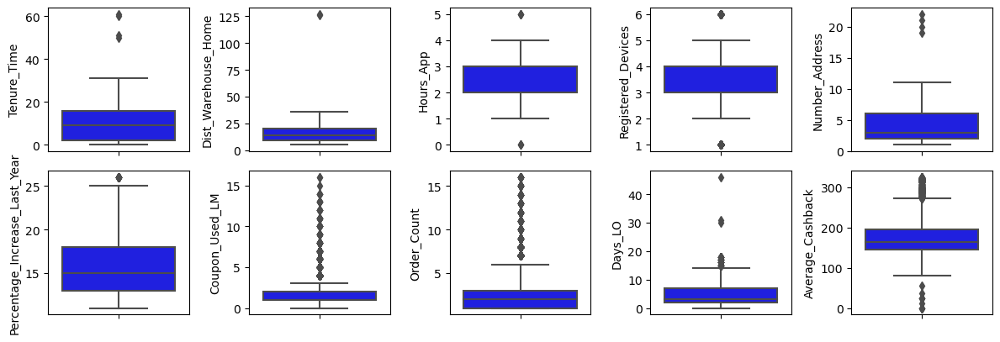

In [18]:
plt.figure(figsize=(12,4))
for i in range(0, len(nums)):
    plt.subplot(2, 5, i+1)
    sns.boxplot(y=df2[nums[i]], color='blue')
    plt.tight_layout()

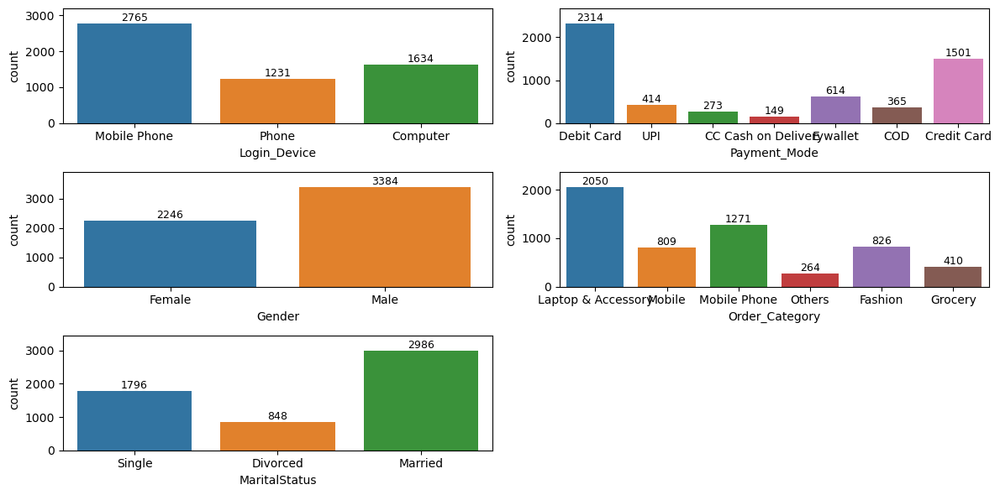

In [19]:
plt.figure(figsize=(12,6))
for i in range(0, len(cats)):
    plt.subplot(3, 2, i+1)
    ax = sns.countplot(x=df2[cats[i]])
    plt.tight_layout()
    for container in ax.containers:
        ax.bar_label(container, fontsize=9, fmt='%.f')
        ax.set_ylim(top = ax.get_ylim()[1]*1.1)

<AxesSubplot:>

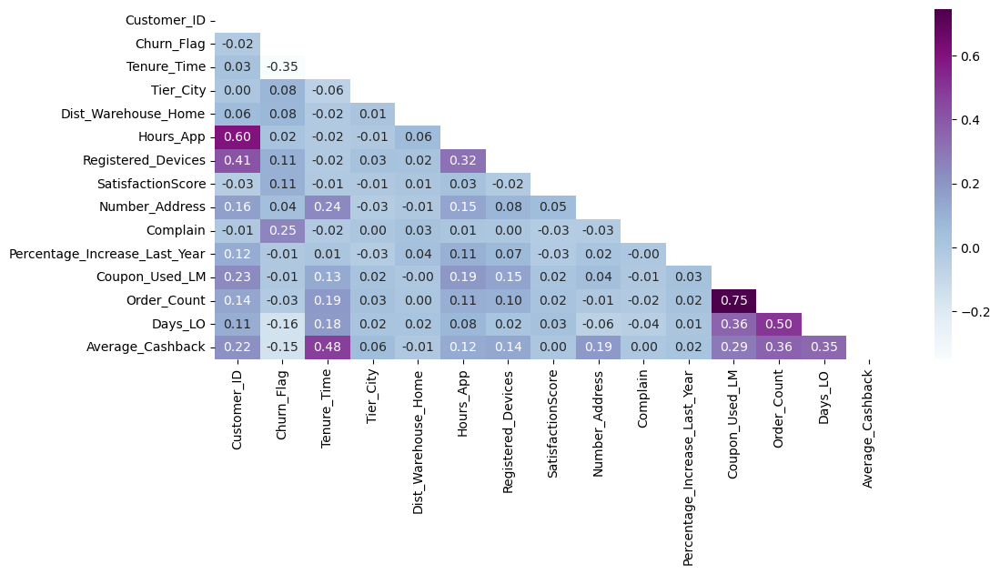

In [20]:
plt.figure(figsize=(12,5))
mask = np.triu(np.ones_like(df2.corr()))
sns.heatmap(df2.corr(), mask=mask, annot=True, fmt='.2f', cmap="BuPu")

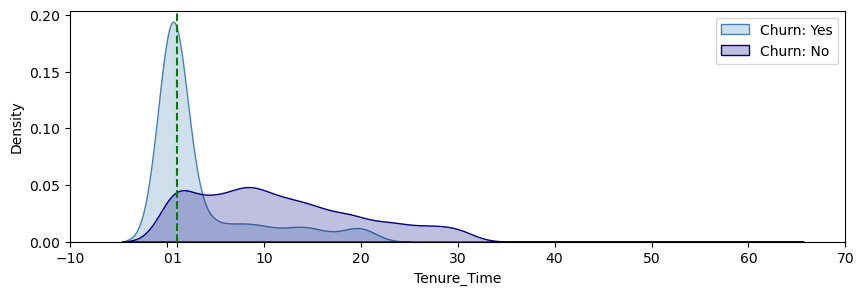

In [21]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.kdeplot(df2[df2['Churn_Flag'] == 1]['Tenure_Time'].dropna(), shade=True,color= 'steelblue', label= 'Churn: Yes', ax=ax)
sns.kdeplot(df2[df2['Churn_Flag'] == 0]['Tenure_Time'].dropna(), shade=True,color= 'navy', label= 'Churn: No', ax=ax)
plt.axvline(x=1, ls='--', color='green')
x_ticks = np.append(ax.get_xticks(), 1)
ax.set_xticks(x_ticks)
plt.legend(loc = 1)

In [26]:
def churn_plot(x, data):
    df_cats = data.copy()
    df_city = df_cats.groupby(x)['Customer_ID'].nunique().reset_index(name='Total')
    df_churn =  df_cats.groupby([x, 'Churn_Flag'])['Customer_ID'].nunique().reset_index(name='TotalCustomer')
    df_merge = df_churn.merge(df_city, on=x)
    df_merge['Percentage'] = round(df_merge['TotalCustomer']/df_merge['Total']*100,2)
    df_merge = df_merge[df_merge['Churn_Flag'] == 1]
    return df_merge

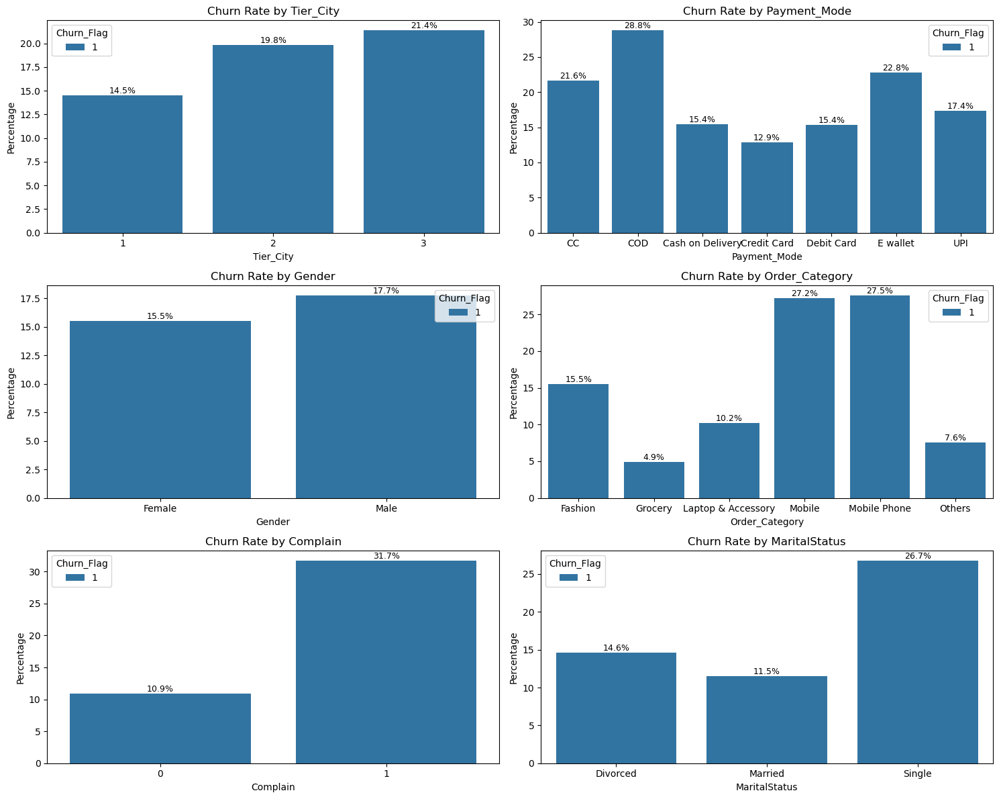

In [27]:
categorical_columns = ['Tier_City', 'Payment_Mode', 'Gender', 'Order_Category', 'Complain', 'MaritalStatus']
plt.figure(figsize=(15,12))
for i in range(0, len(categorical_columns)):
    plt.subplot(3, 2, i+1)
    data = churn_plot(categorical_columns[i], df2)
    ax = sns.barplot(x=categorical_columns[i], y='Percentage', data=data, hue = 'Churn_Flag')
    ax.set_title(f'Churn Rate by {categorical_columns[i]}')

    for container in ax.containers:
        ax.bar_label(container, fontsize=9, fmt='%.1f%%')
        #ax.set_ylim(top=105)
        #ax.legend(loc='center right', title='Churn_Flag')
    plt.tight_layout()


In [29]:
# Perform MICE imputation
exception_columns = ['Customer_ID','Tier_City', 'Payment_Mode', 'Gender', 'Order_Category', 'MaritalStatus','Churn_Flag', 'Complain','SatisfactionScore']
df_numeric = df2.drop(columns=exception_columns)
df3=df2
!pip install fancyimpute
from fancyimpute import IterativeImputer
imputer = IterativeImputer()
df_imputed = imputer.fit_transform(df3[nums])
df_numeric_imputed = pd.DataFrame(df_imputed, columns=df3[nums].columns)
df3 = pd.concat([df_numeric_imputed, df3[exception_columns]], axis=1)


In [30]:
df3.columns

Index(['Tenure_Time', 'Dist_Warehouse_Home', 'Hours_App', 'Registered_Devices',
       'Number_Address', 'Percentage_Increase_Last_Year', 'Coupon_Used_LM',
       'Order_Count', 'Days_LO', 'Average_Cashback', 'Customer_ID',
       'Tier_City', 'Payment_Mode', 'Gender', 'Order_Category',
       'MaritalStatus', 'Churn_Flag', 'Complain', 'SatisfactionScore'],
      dtype='object')

In [31]:
df3[nums].columns

Index(['Tenure_Time', 'Dist_Warehouse_Home', 'Hours_App', 'Registered_Devices',
       'Number_Address', 'Percentage_Increase_Last_Year', 'Coupon_Used_LM',
       'Order_Count', 'Days_LO', 'Average_Cashback'],
      dtype='object')

In [32]:
###### Remove outliers 
print(f'before: {len(df3)}')

filtered_entries = np.array([True] * len(df3))

for col in nums:
    zscore = abs(stats.zscore(df3[col]))
    filtered_entries = (zscore < 3) & filtered_entries

df4 = df3[filtered_entries]

print(f'after: {len(df4)}')

before: 5630
after: 5350


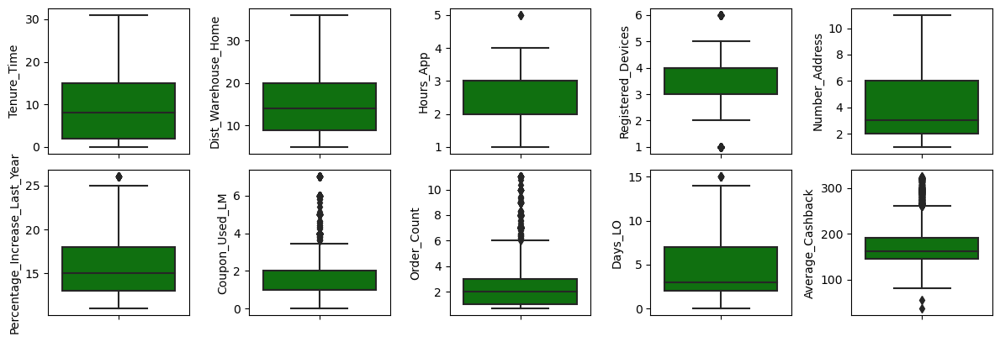

In [33]:
###### Check if outliers are removed
plt.figure(figsize=(12,4))
for i in range(0, len(nums)):
    plt.subplot(2, 5, i+1)
    sns.boxplot(y=df4[nums[i]], color='green')
    plt.tight_layout()

In [34]:
###### Categorical Variables Transformation
#df4['Login_Device'] = df4['Login_Device'].replace(['Phone','Mobile Phone'], ['Handphone', 'Handphone'])
df4['Payment_Mode'] = df4['Payment_Mode'].replace(['CC','COD'], ['Credit Card','Cash on Delivery'])
df4['Order_Category'] = df4['Order_Category'].replace(['Mobile','Mobile Phone', 'Laptop & Accessory'], ['Electronics', 'Electronics', 'Electronics'])


In [35]:
df4 = pd.get_dummies(df4)
df4.head()

,Tenure_Time,Dist_Warehouse_Home,Hours_App,Registered_Devices,Number_Address,Percentage_Increase_Last_Year,Coupon_Used_LM,Order_Count,Days_LO,Average_Cashback,Customer_ID,Tier_City,Churn_Flag,Complain,SatisfactionScore,Payment_Mode_Cash on Delivery,Payment_Mode_Credit Card,Payment_Mode_Debit Card,Payment_Mode_E wallet,Payment_Mode_UPI,Gender_Female,Gender_Male,Order_Category_Electronics,Order_Category_Fashion,Order_Category_Grocery,Order_Category_Others,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,4.000000,6.0,3.000000,3.0,9.0,11.0,1.0,1.0,5.0,159.93,50001,3,1,1,2,0,0,1,0,0,1,0,1,0,0,0,0,0,1
1,6.454469,8.0,3.000000,4.0,7.0,15.0,0.0,1.0,0.0,120.90,50002,1,1,1,3,0,0,0,0,1,0,1,1,0,0,0,0,0,1
2,6.711164,30.0,2.000000,4.0,6.0,14.0,0.0,1.0,3.0,120.28,50003,1,1,1,3,0,0,1,0,0,0,1,1,0,0,0,0,0,1
3,0.000000,15.0,2.000000,4.0,8.0,23.0,0.0,1.0,3.0,134.07,50004,3,1,0,5,0,0,1,0,0,0,1,1,0,0,0,0,0,1
4,0.000000,12.0,2.645239,3.0,3.0,11.0,1.0,1.0,3.0,129.60,50005,1,1,0,5,0,1,0,0,0,0,1,1,0,0,0,0,0,1


In [36]:
###### Feature Engineering
df4['AvgTimeSpent'] = df4['Hours_App'] / df4['Registered_Devices']


In [37]:
from sklearn.preprocessing import StandardScaler

In [38]:
df4

,Tenure_Time,Dist_Warehouse_Home,Hours_App,Registered_Devices,Number_Address,Percentage_Increase_Last_Year,Coupon_Used_LM,Order_Count,Days_LO,Average_Cashback,Customer_ID,Tier_City,Churn_Flag,Complain,SatisfactionScore,Payment_Mode_Cash on Delivery,Payment_Mode_Credit Card,Payment_Mode_Debit Card,Payment_Mode_E wallet,Payment_Mode_UPI,Gender_Female,Gender_Male,Order_Category_Electronics,Order_Category_Fashion,Order_Category_Grocery,Order_Category_Others,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,AvgTimeSpent
0,4.000000,6.0,3.000000,3.0,9.0,11.0,1.0,1.0,5.000000,159.93,50001,3,1,1,2,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1.000000
1,6.454469,8.0,3.000000,4.0,7.0,15.0,0.0,1.0,0.000000,120.90,50002,1,1,1,3,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0.750000
2,6.711164,30.0,2.000000,4.0,6.0,14.0,0.0,1.0,3.000000,120.28,50003,1,1,1,3,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0.500000
3,0.000000,15.0,2.000000,4.0,8.0,23.0,0.0,1.0,3.000000,134.07,50004,3,1,0,5,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0.500000
4,0.000000,12.0,2.645239,3.0,3.0,11.0,1.0,1.0,3.000000,129.60,50005,1,1,0,5,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0.881746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,10.000000,30.0,3.000000,2.0,6.0,18.0,1.0,2.0,4.000000,150.71,55626,1,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,1.500000
5626,13.000000,13.0,3.000000,5.0,6.0,16.0,1.0,2.0,4.311355,224.91,55627,1,0,0,5,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0.600000
5627,1.000000,11.0,3.000000,2.0,3.0,21.0,1.0,2.0,4.000000,186.42,55628,1,0,1,4,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1.500000
5628,23.000000,9.0,4.000000,5.0,4.0,15.0,2.0,2.0,9.000000,178.90,55629,3,0,0,4,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0.800000


In [39]:
column = ['Tenure_Time', 'Tier_City', 'Dist_Warehouse_Home', 'Hours_App', 'Registered_Devices', 
          'SatisfactionScore', 'Number_Address', 'Percentage_Increase_Last_Year', 'Coupon_Used_LM', 
          'Order_Count', 'Days_LO',  'Average_Cashback']
for col in column:
    df4[col] = StandardScaler().fit_transform(df4[col].values.reshape(len(df4),1))

In [40]:
df4.describe()

,Tenure_Time,Dist_Warehouse_Home,Hours_App,Registered_Devices,Number_Address,Percentage_Increase_Last_Year,Coupon_Used_LM,Order_Count,Days_LO,Average_Cashback,Customer_ID,Tier_City,Churn_Flag,Complain,SatisfactionScore,Payment_Mode_Cash on Delivery,Payment_Mode_Credit Card,Payment_Mode_Debit Card,Payment_Mode_E wallet,Payment_Mode_UPI,Gender_Female,Gender_Male,Order_Category_Electronics,Order_Category_Fashion,Order_Category_Grocery,Order_Category_Others,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,AvgTimeSpent
count,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5.350000e+03,5350.000000,5.350000e+03,5350.000000,5350.000000,5.350000e+03,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000,5350.000000
mean,-3.704254e-16,-2.131991e-17,-2.693629e-14,1.253191e-14,-1.206205e-15,-9.271919e-16,-1.547028e-15,-4.361184e-15,-3.735330e-19,4.919974e-16,52802.826168,-1.718252e-17,0.170467,0.286355,-2.521438e-16,0.091402,0.315140,0.410280,0.108224,0.074953,0.399252,0.600748,0.757570,0.140561,0.062056,0.039813,0.150093,0.528037,0.321869,0.878050
std,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1.000093e+00,1627.280475,1.000093e+00,0.376078,0.452100,1.000093e+00,0.288207,0.464615,0.491931,0.310693,0.263341,0.489791,0.489791,0.428593,0.347600,0.241280,0.195538,0.357196,0.499260,0.467237,0.433426
min,-1.165460e+00,-1.317982e+00,-2.714902e+00,-2.607447e+00,-1.256326e+00,-1.313782e+00,-1.083214e+00,-9.153989e-01,-1.324956e+00,-2.957067e+00,50001.000000,-7.143355e-01,0.000000,0.000000,-1.491615e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000
25%,-9.229571e-01,-8.215915e-01,-1.296745e+00,-6.580561e-01,-8.632882e-01,-7.538618e-01,-3.859245e-01,-7.679357e-01,-7.157601e-01,-6.284652e-01,51394.250000,-7.143355e-01,0.000000,0.000000,-7.662794e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.666667
50%,-1.954495e-01,-2.011034e-01,1.214111e-01,3.166394e-01,-4.702500e-01,-1.939412e-01,-3.859245e-01,-3.030616e-01,-4.111619e-01,-2.828504e-01,52784.500000,-7.143355e-01,0.000000,0.000000,-4.094416e-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.750000
75%,6.533094e-01,5.434823e-01,1.214111e-01,3.166394e-01,7.088646e-01,6.459396e-01,3.113651e-01,1.618124e-01,8.072308e-01,3.641027e-01,54208.750000,1.474493e+00,0.000000,1.000000,6.843911e-01,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,2.593330e+00,2.529044e+00,2.957724e+00,2.266030e+00,2.674056e+00,2.885622e+00,3.797813e+00,3.880805e+00,3.244016e+00,3.227246e+00,55630.000000,1.474493e+00,1.000000,1.000000,1.409726e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


<AxesSubplot:>

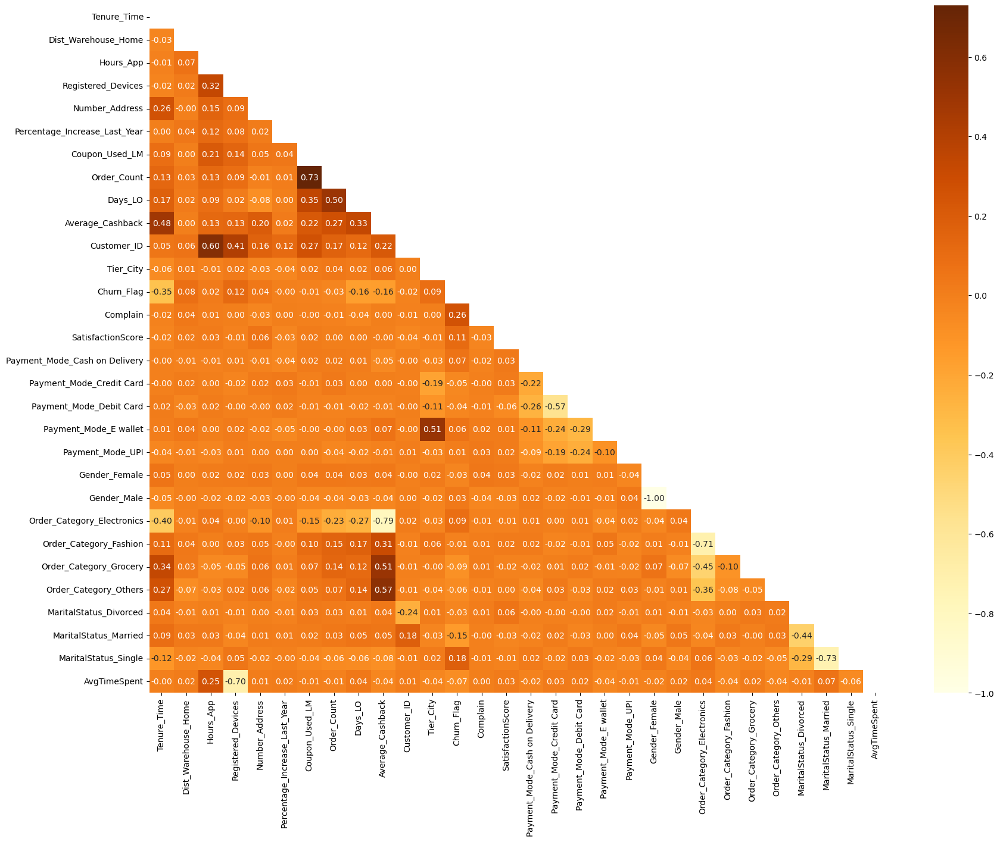

In [41]:
plt.figure(figsize=(20,15))
mask = np.triu(np.ones_like(df4.corr()))
sns.heatmap(df4.corr(), mask=mask, annot=True, fmt='.2f', cmap='YlOrBr')

In [42]:
column = []
for col in df4.columns:
    if (abs(df4['Churn_Flag'].corr(df4[col])) > 0.05):
        column.append(col)
df_final = df4[column]
df_final.sample(3)

,Tenure_Time,Dist_Warehouse_Home,Registered_Devices,Days_LO,Average_Cashback,Tier_City,Churn_Flag,Complain,SatisfactionScore,Payment_Mode_Cash on Delivery,Payment_Mode_E wallet,Order_Category_Electronics,Order_Category_Grocery,Order_Category_Others,MaritalStatus_Married,MaritalStatus_Single,AvgTimeSpent
1681,-0.737177,-0.201103,1.291335,0.807231,-1.147532,-0.714335,1,1,1.409726,0,0,1,0,0,1,0,0.6
2741,0.774561,1.784459,-0.658056,-0.715760,0.642658,1.474493,1,1,1.409726,0,0,0,0,0,0,1,1.0
4384,-0.559203,-1.069787,2.266030,0.198034,-0.131751,-0.714335,0,0,-0.040944,0,0,1,0,0,1,0,0.5


In [43]:
#Train Test Split Data
X = df_final.drop('Churn_Flag', axis=1)
y = df_final['Churn_Flag']

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [45]:
#Handle Class Imbalance
print(X_train.shape)
print(y_train.shape)
print(y_train.value_counts())

(4280, 29)
(4280,)
0    3526
1     754
Name: Churn_Flag, dtype: int64


In [46]:
def evaluation(model_str, y_pred, y_pred_train):
    results = {
        'model': model_str,
        'acc test' : accuracy_score(y_test, y_pred),
        'acc train': accuracy_score(y_train, y_pred_train),
        'prec test' : precision_score(y_test, y_pred),
        'prec train' : precision_score(y_train, y_pred_train),
        'rec test' : recall_score(y_test, y_pred),
        'rec train' : recall_score(y_train, y_pred_train),
        'f2 test': fbeta_score(y_test, y_pred, pos_label=0,  beta=2),
        'f2 train': fbeta_score(y_train, y_pred_train, pos_label=0,  beta=2)
    }
    return results

In [47]:
!pip install catboost
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
model_dict = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Light GBM': LGBMClassifier(),
    'XGBoost': XGBClassifier(),
    'Catboost': CatBoostClassifier()
}

In [48]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, cross_validate
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from imblearn.metrics import classification_report_imbalanced
from sklearn.pipeline import Pipeline

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [50]:
# Define scoring metrics
scoring = {
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score),
    'accuracy': make_scorer(accuracy_score)
}

In [51]:
decision_pipe = make_pipeline(RandomOverSampler(sampling_strategy='minority'), DecisionTreeClassifier())
random_pipe = make_pipeline(RandomOverSampler(sampling_strategy='minority'), RandomForestClassifier())
GBM_pipe = make_pipeline(RandomOverSampler(sampling_strategy='minority'), GradientBoostingClassifier())
Light_GBM_pipe = make_pipeline(RandomOverSampler(sampling_strategy='minority'), LGBMClassifier())
XGBoost_GBM_pipe = make_pipeline(RandomOverSampler(sampling_strategy='minority'), XGBClassifier())
CatBoost_GBM_pipe = make_pipeline(RandomOverSampler(sampling_strategy='minority'), CatBoostClassifier())


In [52]:
decision_param_grid = {
    'decisiontreeclassifier__max_depth': [2, 4, 6, 8, 10],
    'decisiontreeclassifier__min_samples_split': [2, 4, 6, 8, 10]
}
random_param_grid = {
    'randomforestclassifier__n_estimators': [100, 500, 1000],
    'randomforestclassifier__max_depth': [2, 4, 6, 8, 10],
    'randomforestclassifier__min_samples_split': [2, 4, 6, 8, 10]
}

gb_param_grid = {
    'gradientboostingclassifier__n_estimators': [100, 500, 1000],
    'gradientboostingclassifier__learning_rate': [0.01, 0.1, 1],
    'gradientboostingclassifier__max_depth': [2, 4, 6, 8, 10]
}

lgbm_param_grid = {
    'lgbmclassifier__n_estimators': [100, 500, 1000],
    'lgbmclassifier__learning_rate': [0.01, 0.1, 1],
    'lgbmclassifier__max_depth': [2, 4, 6, 8, 10]
}

xgb_param_grid = {
    'xgbclassifier__n_estimators': [100, 500, 1000],
    'xgbclassifier__learning_rate': [0.01, 0.1, 1],
    'xgbclassifier__max_depth': [2, 4, 6, 8, 10]
}

cat_param_grid = {
    'catboostclassifier__n_estimators': [100, 500, 1000],
    'catboostclassifier__learning_rate': [0.01, 0.1, 1],
    'catboostclassifier__max_depth': [2, 4, 6, 8, 10]
}


In [53]:
models = [
    ('Decision_Tree',decision_pipe, decision_param_grid),
    ('Random_tree', random_pipe, random_param_grid),
    ('GBM_tree',GBM_pipe, gb_param_grid),
    ('Light_GBM_tree',Light_GBM_pipe, lgbm_param_grid),
    ('XGBoost',XGBoost_GBM_pipe,xgb_param_grid),
    ('CatBoost',CatBoost_GBM_pipe,cat_param_grid),
 
]
result_list = []
scores_list=[]
best_estimator_list=[]

In [54]:
for model_name,model,param_grid in models:
    # Run GridSearchCV
    grid = GridSearchCV(model, param_grid=param_grid, cv=5, scoring=scoring, refit='roc_auc')
    grid.fit(X_train, y_train)
    best_estimator = grid.best_estimator_
    best_estimator_list.append(best_estimator)
    scores = cross_validate(best_estimator, X_train, y_train, cv=5, scoring=scoring)
    F1_Score_mean=scores['test_f1'].mean()
    Precision_mean=scores['test_precision'].mean()
    accuracy_mean=scores['test_accuracy'].mean()
    best_params=grid.best_params_
    scores_list.append(best_params)
    my_dict = {"Model_name": model_name,"F1_Score": F1_Score_mean,"Precision": Precision_mean,"accuracy": accuracy_mean}
    result_list.append(my_dict)

0:	learn: 0.6890834	total: 182ms	remaining: 18s
1:	learn: 0.6851253	total: 186ms	remaining: 9.09s
2:	learn: 0.6811484	total: 189ms	remaining: 6.12s
3:	learn: 0.6774673	total: 193ms	remaining: 4.63s
4:	learn: 0.6733605	total: 197ms	remaining: 3.73s
5:	learn: 0.6698142	total: 200ms	remaining: 3.13s
6:	learn: 0.6659079	total: 203ms	remaining: 2.69s
7:	learn: 0.6624168	total: 205ms	remaining: 2.36s
8:	learn: 0.6589705	total: 208ms	remaining: 2.1s
9:	learn: 0.6556053	total: 211ms	remaining: 1.9s
10:	learn: 0.6523017	total: 214ms	remaining: 1.73s
11:	learn: 0.6490876	total: 217ms	remaining: 1.59s
12:	learn: 0.6455931	total: 220ms	remaining: 1.47s
13:	learn: 0.6433602	total: 222ms	remaining: 1.36s
14:	learn: 0.6399748	total: 225ms	remaining: 1.27s
15:	learn: 0.6372559	total: 227ms	remaining: 1.19s
16:	learn: 0.6340105	total: 229ms	remaining: 1.12s
17:	learn: 0.6314204	total: 231ms	remaining: 1.05s
18:	learn: 0.6286203	total: 234ms	remaining: 996ms
19:	learn: 0.6258449	total: 236ms	remaining: 

98:	learn: 0.5108790	total: 210ms	remaining: 2.12ms
99:	learn: 0.5099673	total: 212ms	remaining: 0us
0:	learn: 0.6890729	total: 4.88ms	remaining: 483ms
1:	learn: 0.6850248	total: 10.8ms	remaining: 528ms
2:	learn: 0.6806633	total: 16ms	remaining: 516ms
3:	learn: 0.6767965	total: 21.1ms	remaining: 507ms
4:	learn: 0.6734680	total: 24.8ms	remaining: 470ms
5:	learn: 0.6704748	total: 27.7ms	remaining: 433ms
6:	learn: 0.6666504	total: 30.6ms	remaining: 407ms
7:	learn: 0.6630649	total: 33.6ms	remaining: 386ms
8:	learn: 0.6591755	total: 36.4ms	remaining: 368ms
9:	learn: 0.6557258	total: 40.1ms	remaining: 361ms
10:	learn: 0.6531020	total: 43ms	remaining: 348ms
11:	learn: 0.6498353	total: 45.9ms	remaining: 337ms
12:	learn: 0.6465520	total: 49ms	remaining: 328ms
13:	learn: 0.6440723	total: 51.9ms	remaining: 319ms
14:	learn: 0.6411800	total: 53.9ms	remaining: 306ms
15:	learn: 0.6379608	total: 55.8ms	remaining: 293ms
16:	learn: 0.6349693	total: 57.5ms	remaining: 281ms
17:	learn: 0.6319264	total: 59.

0:	learn: 0.6886141	total: 1.99ms	remaining: 197ms
1:	learn: 0.6847798	total: 3.83ms	remaining: 187ms
2:	learn: 0.6807233	total: 5.47ms	remaining: 177ms
3:	learn: 0.6764678	total: 7ms	remaining: 168ms
4:	learn: 0.6728791	total: 8.59ms	remaining: 163ms
5:	learn: 0.6687996	total: 10.7ms	remaining: 167ms
6:	learn: 0.6655520	total: 12.7ms	remaining: 169ms
7:	learn: 0.6616326	total: 14.5ms	remaining: 167ms
8:	learn: 0.6584184	total: 16.4ms	remaining: 166ms
9:	learn: 0.6546497	total: 18.3ms	remaining: 165ms
10:	learn: 0.6509698	total: 20.1ms	remaining: 163ms
11:	learn: 0.6473809	total: 22.3ms	remaining: 163ms
12:	learn: 0.6444226	total: 24.3ms	remaining: 163ms
13:	learn: 0.6417490	total: 26.2ms	remaining: 161ms
14:	learn: 0.6388593	total: 27.9ms	remaining: 158ms
15:	learn: 0.6355308	total: 29.6ms	remaining: 156ms
16:	learn: 0.6326532	total: 31.8ms	remaining: 155ms
17:	learn: 0.6294651	total: 33.7ms	remaining: 154ms
18:	learn: 0.6265979	total: 35.5ms	remaining: 152ms
19:	learn: 0.6240858	tota

111:	learn: 0.5037058	total: 198ms	remaining: 684ms
112:	learn: 0.5032320	total: 199ms	remaining: 683ms
113:	learn: 0.5025946	total: 201ms	remaining: 680ms
114:	learn: 0.5021179	total: 202ms	remaining: 677ms
115:	learn: 0.5009478	total: 204ms	remaining: 676ms
116:	learn: 0.5003758	total: 206ms	remaining: 674ms
117:	learn: 0.4998041	total: 207ms	remaining: 671ms
118:	learn: 0.4993379	total: 209ms	remaining: 669ms
119:	learn: 0.4982303	total: 211ms	remaining: 669ms
120:	learn: 0.4978320	total: 213ms	remaining: 666ms
121:	learn: 0.4971932	total: 214ms	remaining: 664ms
122:	learn: 0.4967538	total: 216ms	remaining: 661ms
123:	learn: 0.4963125	total: 217ms	remaining: 659ms
124:	learn: 0.4959847	total: 219ms	remaining: 658ms
125:	learn: 0.4956567	total: 221ms	remaining: 656ms
126:	learn: 0.4952166	total: 223ms	remaining: 654ms
127:	learn: 0.4947610	total: 224ms	remaining: 651ms
128:	learn: 0.4942886	total: 226ms	remaining: 650ms
129:	learn: 0.4939072	total: 228ms	remaining: 649ms
130:	learn: 

349:	learn: 0.4327006	total: 612ms	remaining: 262ms
350:	learn: 0.4325505	total: 614ms	remaining: 261ms
351:	learn: 0.4323914	total: 616ms	remaining: 259ms
352:	learn: 0.4321950	total: 617ms	remaining: 257ms
353:	learn: 0.4320405	total: 619ms	remaining: 255ms
354:	learn: 0.4317936	total: 620ms	remaining: 253ms
355:	learn: 0.4316109	total: 622ms	remaining: 252ms
356:	learn: 0.4311758	total: 624ms	remaining: 250ms
357:	learn: 0.4310473	total: 625ms	remaining: 248ms
358:	learn: 0.4308801	total: 627ms	remaining: 246ms
359:	learn: 0.4307221	total: 628ms	remaining: 244ms
360:	learn: 0.4305263	total: 630ms	remaining: 243ms
361:	learn: 0.4303872	total: 632ms	remaining: 241ms
362:	learn: 0.4302549	total: 633ms	remaining: 239ms
363:	learn: 0.4300994	total: 634ms	remaining: 237ms
364:	learn: 0.4299320	total: 636ms	remaining: 235ms
365:	learn: 0.4297532	total: 637ms	remaining: 233ms
366:	learn: 0.4295962	total: 639ms	remaining: 231ms
367:	learn: 0.4294832	total: 640ms	remaining: 230ms
368:	learn: 

62:	learn: 0.5457910	total: 109ms	remaining: 753ms
63:	learn: 0.5448336	total: 110ms	remaining: 752ms
64:	learn: 0.5439356	total: 112ms	remaining: 748ms
65:	learn: 0.5427061	total: 113ms	remaining: 745ms
66:	learn: 0.5415070	total: 115ms	remaining: 742ms
67:	learn: 0.5403263	total: 116ms	remaining: 739ms
68:	learn: 0.5391602	total: 118ms	remaining: 736ms
69:	learn: 0.5379661	total: 119ms	remaining: 734ms
70:	learn: 0.5367960	total: 121ms	remaining: 731ms
71:	learn: 0.5356755	total: 123ms	remaining: 729ms
72:	learn: 0.5346435	total: 124ms	remaining: 727ms
73:	learn: 0.5335344	total: 126ms	remaining: 724ms
74:	learn: 0.5317560	total: 127ms	remaining: 721ms
75:	learn: 0.5310654	total: 129ms	remaining: 718ms
76:	learn: 0.5302724	total: 130ms	remaining: 715ms
77:	learn: 0.5292331	total: 132ms	remaining: 713ms
78:	learn: 0.5282490	total: 133ms	remaining: 710ms
79:	learn: 0.5272494	total: 135ms	remaining: 707ms
80:	learn: 0.5262719	total: 136ms	remaining: 704ms
81:	learn: 0.5252972	total: 138

312:	learn: 0.4370046	total: 510ms	remaining: 305ms
313:	learn: 0.4368685	total: 512ms	remaining: 303ms
314:	learn: 0.4367186	total: 514ms	remaining: 302ms
315:	learn: 0.4365459	total: 516ms	remaining: 300ms
316:	learn: 0.4363905	total: 517ms	remaining: 298ms
317:	learn: 0.4362009	total: 519ms	remaining: 297ms
318:	learn: 0.4357144	total: 520ms	remaining: 295ms
319:	learn: 0.4355570	total: 522ms	remaining: 294ms
320:	learn: 0.4354201	total: 524ms	remaining: 292ms
321:	learn: 0.4352198	total: 525ms	remaining: 290ms
322:	learn: 0.4350254	total: 527ms	remaining: 289ms
323:	learn: 0.4348154	total: 528ms	remaining: 287ms
324:	learn: 0.4346322	total: 530ms	remaining: 285ms
325:	learn: 0.4344744	total: 532ms	remaining: 284ms
326:	learn: 0.4342913	total: 533ms	remaining: 282ms
327:	learn: 0.4341183	total: 535ms	remaining: 281ms
328:	learn: 0.4339195	total: 537ms	remaining: 279ms
329:	learn: 0.4337524	total: 539ms	remaining: 278ms
330:	learn: 0.4335737	total: 540ms	remaining: 276ms
331:	learn: 

21:	learn: 0.6206019	total: 39.7ms	remaining: 862ms
22:	learn: 0.6178948	total: 41.5ms	remaining: 860ms
23:	learn: 0.6151953	total: 43.5ms	remaining: 862ms
24:	learn: 0.6124610	total: 45.4ms	remaining: 863ms
25:	learn: 0.6099717	total: 47.8ms	remaining: 872ms
26:	learn: 0.6073232	total: 49.4ms	remaining: 866ms
27:	learn: 0.6048228	total: 51ms	remaining: 860ms
28:	learn: 0.6023035	total: 52.7ms	remaining: 855ms
29:	learn: 0.6002200	total: 54.3ms	remaining: 851ms
30:	learn: 0.5985817	total: 55.8ms	remaining: 845ms
31:	learn: 0.5963446	total: 57.3ms	remaining: 838ms
32:	learn: 0.5939950	total: 59.3ms	remaining: 839ms
33:	learn: 0.5917525	total: 60.7ms	remaining: 832ms
34:	learn: 0.5895704	total: 62.3ms	remaining: 827ms
35:	learn: 0.5875776	total: 63.7ms	remaining: 821ms
36:	learn: 0.5855013	total: 65.1ms	remaining: 815ms
37:	learn: 0.5834129	total: 66.6ms	remaining: 810ms
38:	learn: 0.5818309	total: 68.4ms	remaining: 808ms
39:	learn: 0.5795429	total: 70.2ms	remaining: 807ms
40:	learn: 0.5

225:	learn: 0.4487065	total: 430ms	remaining: 521ms
226:	learn: 0.4484490	total: 432ms	remaining: 520ms
227:	learn: 0.4481946	total: 434ms	remaining: 518ms
228:	learn: 0.4479133	total: 436ms	remaining: 516ms
229:	learn: 0.4476079	total: 438ms	remaining: 514ms
230:	learn: 0.4473728	total: 440ms	remaining: 512ms
231:	learn: 0.4471116	total: 441ms	remaining: 510ms
232:	learn: 0.4468642	total: 443ms	remaining: 507ms
233:	learn: 0.4466180	total: 444ms	remaining: 505ms
234:	learn: 0.4463735	total: 446ms	remaining: 503ms
235:	learn: 0.4461060	total: 447ms	remaining: 500ms
236:	learn: 0.4458538	total: 449ms	remaining: 498ms
237:	learn: 0.4456019	total: 451ms	remaining: 496ms
238:	learn: 0.4449493	total: 453ms	remaining: 495ms
239:	learn: 0.4446682	total: 455ms	remaining: 493ms
240:	learn: 0.4443515	total: 457ms	remaining: 491ms
241:	learn: 0.4440905	total: 458ms	remaining: 489ms
242:	learn: 0.4438810	total: 461ms	remaining: 488ms
243:	learn: 0.4436655	total: 463ms	remaining: 486ms
244:	learn: 

459:	learn: 0.4025609	total: 820ms	remaining: 71.3ms
460:	learn: 0.4023468	total: 821ms	remaining: 69.5ms
461:	learn: 0.4022372	total: 823ms	remaining: 67.7ms
462:	learn: 0.4021265	total: 824ms	remaining: 65.9ms
463:	learn: 0.4019887	total: 826ms	remaining: 64.1ms
464:	learn: 0.4018709	total: 828ms	remaining: 62.3ms
465:	learn: 0.4017555	total: 829ms	remaining: 60.5ms
466:	learn: 0.4016037	total: 831ms	remaining: 58.7ms
467:	learn: 0.4014383	total: 832ms	remaining: 56.9ms
468:	learn: 0.4013074	total: 834ms	remaining: 55.1ms
469:	learn: 0.4012075	total: 836ms	remaining: 53.3ms
470:	learn: 0.4010979	total: 837ms	remaining: 51.5ms
471:	learn: 0.4009835	total: 839ms	remaining: 49.7ms
472:	learn: 0.4008519	total: 840ms	remaining: 48ms
473:	learn: 0.4007322	total: 842ms	remaining: 46.2ms
474:	learn: 0.4005826	total: 843ms	remaining: 44.4ms
475:	learn: 0.4004936	total: 845ms	remaining: 42.6ms
476:	learn: 0.4003563	total: 847ms	remaining: 40.8ms
477:	learn: 0.4002207	total: 848ms	remaining: 39

165:	learn: 0.4632735	total: 274ms	remaining: 551ms
166:	learn: 0.4629436	total: 276ms	remaining: 550ms
167:	learn: 0.4627036	total: 278ms	remaining: 549ms
168:	learn: 0.4623595	total: 280ms	remaining: 547ms
169:	learn: 0.4618878	total: 281ms	remaining: 546ms
170:	learn: 0.4615667	total: 283ms	remaining: 545ms
171:	learn: 0.4608438	total: 285ms	remaining: 544ms
172:	learn: 0.4605334	total: 287ms	remaining: 542ms
173:	learn: 0.4601062	total: 288ms	remaining: 540ms
174:	learn: 0.4597503	total: 290ms	remaining: 538ms
175:	learn: 0.4594312	total: 291ms	remaining: 536ms
176:	learn: 0.4591118	total: 293ms	remaining: 534ms
177:	learn: 0.4583600	total: 294ms	remaining: 532ms
178:	learn: 0.4581098	total: 296ms	remaining: 531ms
179:	learn: 0.4578628	total: 297ms	remaining: 529ms
180:	learn: 0.4575423	total: 299ms	remaining: 527ms
181:	learn: 0.4572607	total: 300ms	remaining: 525ms
182:	learn: 0.4569694	total: 302ms	remaining: 523ms
183:	learn: 0.4565882	total: 304ms	remaining: 522ms
184:	learn: 

388:	learn: 0.4134021	total: 663ms	remaining: 189ms
389:	learn: 0.4132243	total: 665ms	remaining: 187ms
390:	learn: 0.4130649	total: 666ms	remaining: 186ms
391:	learn: 0.4129189	total: 668ms	remaining: 184ms
392:	learn: 0.4127656	total: 669ms	remaining: 182ms
393:	learn: 0.4126621	total: 671ms	remaining: 181ms
394:	learn: 0.4125485	total: 672ms	remaining: 179ms
395:	learn: 0.4124176	total: 674ms	remaining: 177ms
396:	learn: 0.4122921	total: 676ms	remaining: 175ms
397:	learn: 0.4121243	total: 678ms	remaining: 174ms
398:	learn: 0.4119120	total: 679ms	remaining: 172ms
399:	learn: 0.4116942	total: 681ms	remaining: 170ms
400:	learn: 0.4115302	total: 683ms	remaining: 169ms
401:	learn: 0.4113687	total: 684ms	remaining: 167ms
402:	learn: 0.4112226	total: 687ms	remaining: 165ms
403:	learn: 0.4110781	total: 689ms	remaining: 164ms
404:	learn: 0.4109481	total: 691ms	remaining: 162ms
405:	learn: 0.4108221	total: 693ms	remaining: 160ms
406:	learn: 0.4107125	total: 695ms	remaining: 159ms
407:	learn: 

74:	learn: 0.5298362	total: 141ms	remaining: 802ms
75:	learn: 0.5288147	total: 143ms	remaining: 799ms
76:	learn: 0.5279647	total: 145ms	remaining: 795ms
77:	learn: 0.5271789	total: 146ms	remaining: 791ms
78:	learn: 0.5260142	total: 148ms	remaining: 786ms
79:	learn: 0.5250582	total: 149ms	remaining: 783ms
80:	learn: 0.5243240	total: 151ms	remaining: 779ms
81:	learn: 0.5234125	total: 152ms	remaining: 775ms
82:	learn: 0.5224631	total: 153ms	remaining: 771ms
83:	learn: 0.5213904	total: 155ms	remaining: 767ms
84:	learn: 0.5207447	total: 156ms	remaining: 764ms
85:	learn: 0.5200034	total: 158ms	remaining: 762ms
86:	learn: 0.5191537	total: 160ms	remaining: 760ms
87:	learn: 0.5184438	total: 162ms	remaining: 757ms
88:	learn: 0.5176239	total: 163ms	remaining: 754ms
89:	learn: 0.5159297	total: 165ms	remaining: 751ms
90:	learn: 0.5149622	total: 166ms	remaining: 747ms
91:	learn: 0.5142802	total: 168ms	remaining: 744ms
92:	learn: 0.5136166	total: 170ms	remaining: 743ms
93:	learn: 0.5128998	total: 172

302:	learn: 0.4350642	total: 530ms	remaining: 345ms
303:	learn: 0.4349109	total: 532ms	remaining: 343ms
304:	learn: 0.4347232	total: 534ms	remaining: 341ms
305:	learn: 0.4344889	total: 536ms	remaining: 340ms
306:	learn: 0.4343150	total: 537ms	remaining: 338ms
307:	learn: 0.4341322	total: 539ms	remaining: 336ms
308:	learn: 0.4339521	total: 540ms	remaining: 334ms
309:	learn: 0.4337467	total: 542ms	remaining: 332ms
310:	learn: 0.4336050	total: 544ms	remaining: 330ms
311:	learn: 0.4334435	total: 545ms	remaining: 328ms
312:	learn: 0.4333031	total: 547ms	remaining: 327ms
313:	learn: 0.4331516	total: 548ms	remaining: 325ms
314:	learn: 0.4329643	total: 550ms	remaining: 323ms
315:	learn: 0.4328054	total: 551ms	remaining: 321ms
316:	learn: 0.4326019	total: 553ms	remaining: 319ms
317:	learn: 0.4324365	total: 555ms	remaining: 317ms
318:	learn: 0.4322588	total: 556ms	remaining: 316ms
319:	learn: 0.4317655	total: 558ms	remaining: 314ms
320:	learn: 0.4315764	total: 561ms	remaining: 313ms
321:	learn: 

1:	learn: 0.6850192	total: 4.12ms	remaining: 2.05s
2:	learn: 0.6805685	total: 6.73ms	remaining: 2.24s
3:	learn: 0.6762453	total: 8.53ms	remaining: 2.12s
4:	learn: 0.6728201	total: 10.3ms	remaining: 2.04s
5:	learn: 0.6692395	total: 12ms	remaining: 1.98s
6:	learn: 0.6656009	total: 13.8ms	remaining: 1.96s
7:	learn: 0.6620059	total: 15.6ms	remaining: 1.94s
8:	learn: 0.6580680	total: 17.2ms	remaining: 1.9s
9:	learn: 0.6546514	total: 19.2ms	remaining: 1.9s
10:	learn: 0.6517500	total: 21.1ms	remaining: 1.89s
11:	learn: 0.6484600	total: 22.6ms	remaining: 1.86s
12:	learn: 0.6452096	total: 24.2ms	remaining: 1.84s
13:	learn: 0.6420635	total: 26.2ms	remaining: 1.85s
14:	learn: 0.6385524	total: 28.1ms	remaining: 1.85s
15:	learn: 0.6355969	total: 30.1ms	remaining: 1.85s
16:	learn: 0.6326591	total: 31.9ms	remaining: 1.84s
17:	learn: 0.6297285	total: 33.5ms	remaining: 1.83s
18:	learn: 0.6269583	total: 35.2ms	remaining: 1.82s
19:	learn: 0.6241610	total: 36.8ms	remaining: 1.8s
20:	learn: 0.6214010	total

255:	learn: 0.4456825	total: 410ms	remaining: 1.19s
256:	learn: 0.4455279	total: 412ms	remaining: 1.19s
257:	learn: 0.4453590	total: 413ms	remaining: 1.19s
258:	learn: 0.4451392	total: 415ms	remaining: 1.19s
259:	learn: 0.4449179	total: 417ms	remaining: 1.19s
260:	learn: 0.4447628	total: 419ms	remaining: 1.19s
261:	learn: 0.4445338	total: 420ms	remaining: 1.18s
262:	learn: 0.4442820	total: 423ms	remaining: 1.19s
263:	learn: 0.4440632	total: 425ms	remaining: 1.19s
264:	learn: 0.4438628	total: 427ms	remaining: 1.18s
265:	learn: 0.4436879	total: 429ms	remaining: 1.18s
266:	learn: 0.4434389	total: 431ms	remaining: 1.18s
267:	learn: 0.4432634	total: 433ms	remaining: 1.18s
268:	learn: 0.4430525	total: 434ms	remaining: 1.18s
269:	learn: 0.4428657	total: 436ms	remaining: 1.18s
270:	learn: 0.4426488	total: 438ms	remaining: 1.18s
271:	learn: 0.4424562	total: 439ms	remaining: 1.18s
272:	learn: 0.4422154	total: 441ms	remaining: 1.18s
273:	learn: 0.4420432	total: 443ms	remaining: 1.17s
274:	learn: 

467:	learn: 0.4100740	total: 830ms	remaining: 943ms
468:	learn: 0.4099595	total: 832ms	remaining: 942ms
469:	learn: 0.4097946	total: 834ms	remaining: 940ms
470:	learn: 0.4096672	total: 836ms	remaining: 939ms
471:	learn: 0.4095279	total: 838ms	remaining: 938ms
472:	learn: 0.4094292	total: 840ms	remaining: 936ms
473:	learn: 0.4093601	total: 842ms	remaining: 935ms
474:	learn: 0.4092274	total: 845ms	remaining: 934ms
475:	learn: 0.4091256	total: 847ms	remaining: 932ms
476:	learn: 0.4089618	total: 849ms	remaining: 931ms
477:	learn: 0.4088042	total: 851ms	remaining: 930ms
478:	learn: 0.4087004	total: 853ms	remaining: 928ms
479:	learn: 0.4085411	total: 855ms	remaining: 927ms
480:	learn: 0.4084186	total: 857ms	remaining: 925ms
481:	learn: 0.4083064	total: 859ms	remaining: 924ms
482:	learn: 0.4081991	total: 862ms	remaining: 922ms
483:	learn: 0.4080661	total: 863ms	remaining: 921ms
484:	learn: 0.4079760	total: 866ms	remaining: 919ms
485:	learn: 0.4078546	total: 868ms	remaining: 918ms
486:	learn: 

652:	learn: 0.3897162	total: 1.23s	remaining: 651ms
653:	learn: 0.3896360	total: 1.23s	remaining: 650ms
654:	learn: 0.3895627	total: 1.23s	remaining: 648ms
655:	learn: 0.3894726	total: 1.23s	remaining: 646ms
656:	learn: 0.3893986	total: 1.23s	remaining: 645ms
657:	learn: 0.3892854	total: 1.24s	remaining: 643ms
658:	learn: 0.3891978	total: 1.24s	remaining: 641ms
659:	learn: 0.3891152	total: 1.24s	remaining: 639ms
660:	learn: 0.3890334	total: 1.24s	remaining: 638ms
661:	learn: 0.3889161	total: 1.25s	remaining: 636ms
662:	learn: 0.3888624	total: 1.25s	remaining: 635ms
663:	learn: 0.3887671	total: 1.25s	remaining: 633ms
664:	learn: 0.3887218	total: 1.25s	remaining: 631ms
665:	learn: 0.3886295	total: 1.25s	remaining: 630ms
666:	learn: 0.3885133	total: 1.26s	remaining: 628ms
667:	learn: 0.3884491	total: 1.26s	remaining: 627ms
668:	learn: 0.3883266	total: 1.26s	remaining: 625ms
669:	learn: 0.3882295	total: 1.26s	remaining: 623ms
670:	learn: 0.3881422	total: 1.27s	remaining: 621ms
671:	learn: 

821:	learn: 0.3749942	total: 1.63s	remaining: 352ms
822:	learn: 0.3748812	total: 1.63s	remaining: 350ms
823:	learn: 0.3747894	total: 1.63s	remaining: 348ms
824:	learn: 0.3747159	total: 1.63s	remaining: 346ms
825:	learn: 0.3746297	total: 1.63s	remaining: 344ms
826:	learn: 0.3745543	total: 1.64s	remaining: 342ms
827:	learn: 0.3744871	total: 1.64s	remaining: 340ms
828:	learn: 0.3743971	total: 1.64s	remaining: 339ms
829:	learn: 0.3743125	total: 1.64s	remaining: 337ms
830:	learn: 0.3742242	total: 1.65s	remaining: 335ms
831:	learn: 0.3741455	total: 1.65s	remaining: 333ms
832:	learn: 0.3740658	total: 1.65s	remaining: 331ms
833:	learn: 0.3739938	total: 1.65s	remaining: 329ms
834:	learn: 0.3739431	total: 1.65s	remaining: 327ms
835:	learn: 0.3738639	total: 1.65s	remaining: 325ms
836:	learn: 0.3737935	total: 1.66s	remaining: 323ms
837:	learn: 0.3737220	total: 1.66s	remaining: 321ms
838:	learn: 0.3736345	total: 1.66s	remaining: 319ms
839:	learn: 0.3735667	total: 1.66s	remaining: 317ms
840:	learn: 

0:	learn: 0.6891158	total: 2.1ms	remaining: 2.1s
1:	learn: 0.6851289	total: 4.27ms	remaining: 2.13s
2:	learn: 0.6811430	total: 6.34ms	remaining: 2.1s
3:	learn: 0.6775158	total: 8.31ms	remaining: 2.07s
4:	learn: 0.6734331	total: 10.3ms	remaining: 2.04s
5:	learn: 0.6707733	total: 12.1ms	remaining: 2.01s
6:	learn: 0.6669997	total: 14.1ms	remaining: 2s
7:	learn: 0.6634494	total: 16ms	remaining: 1.98s
8:	learn: 0.6596653	total: 17.8ms	remaining: 1.96s
9:	learn: 0.6562906	total: 19.7ms	remaining: 1.95s
10:	learn: 0.6529292	total: 21.8ms	remaining: 1.96s
11:	learn: 0.6493804	total: 23.6ms	remaining: 1.94s
12:	learn: 0.6467364	total: 25.5ms	remaining: 1.94s
13:	learn: 0.6432958	total: 27.4ms	remaining: 1.93s
14:	learn: 0.6402066	total: 29.3ms	remaining: 1.93s
15:	learn: 0.6370785	total: 31.1ms	remaining: 1.92s
16:	learn: 0.6342868	total: 33.1ms	remaining: 1.92s
17:	learn: 0.6313986	total: 35.1ms	remaining: 1.92s
18:	learn: 0.6285986	total: 36.9ms	remaining: 1.91s
19:	learn: 0.6258708	total: 38

202:	learn: 0.4589175	total: 406ms	remaining: 1.59s
203:	learn: 0.4586795	total: 408ms	remaining: 1.59s
204:	learn: 0.4584148	total: 411ms	remaining: 1.59s
205:	learn: 0.4580784	total: 412ms	remaining: 1.59s
206:	learn: 0.4578362	total: 415ms	remaining: 1.59s
207:	learn: 0.4575169	total: 417ms	remaining: 1.59s
208:	learn: 0.4572402	total: 419ms	remaining: 1.58s
209:	learn: 0.4569452	total: 421ms	remaining: 1.58s
210:	learn: 0.4566994	total: 422ms	remaining: 1.58s
211:	learn: 0.4564782	total: 424ms	remaining: 1.58s
212:	learn: 0.4561918	total: 426ms	remaining: 1.57s
213:	learn: 0.4559907	total: 428ms	remaining: 1.57s
214:	learn: 0.4557706	total: 430ms	remaining: 1.57s
215:	learn: 0.4554467	total: 432ms	remaining: 1.57s
216:	learn: 0.4551947	total: 434ms	remaining: 1.57s
217:	learn: 0.4549721	total: 437ms	remaining: 1.57s
218:	learn: 0.4546970	total: 439ms	remaining: 1.57s
219:	learn: 0.4540316	total: 442ms	remaining: 1.56s
220:	learn: 0.4537763	total: 444ms	remaining: 1.56s
221:	learn: 

377:	learn: 0.4214864	total: 808ms	remaining: 1.33s
378:	learn: 0.4213534	total: 811ms	remaining: 1.33s
379:	learn: 0.4209976	total: 813ms	remaining: 1.33s
380:	learn: 0.4207852	total: 816ms	remaining: 1.32s
381:	learn: 0.4206265	total: 818ms	remaining: 1.32s
382:	learn: 0.4204849	total: 820ms	remaining: 1.32s
383:	learn: 0.4203353	total: 822ms	remaining: 1.32s
384:	learn: 0.4201869	total: 824ms	remaining: 1.32s
385:	learn: 0.4200536	total: 827ms	remaining: 1.31s
386:	learn: 0.4199181	total: 829ms	remaining: 1.31s
387:	learn: 0.4197813	total: 832ms	remaining: 1.31s
388:	learn: 0.4196366	total: 834ms	remaining: 1.31s
389:	learn: 0.4195158	total: 837ms	remaining: 1.31s
390:	learn: 0.4193244	total: 839ms	remaining: 1.31s
391:	learn: 0.4191838	total: 841ms	remaining: 1.3s
392:	learn: 0.4189509	total: 843ms	remaining: 1.3s
393:	learn: 0.4187951	total: 845ms	remaining: 1.3s
394:	learn: 0.4186649	total: 848ms	remaining: 1.3s
395:	learn: 0.4185844	total: 850ms	remaining: 1.3s
396:	learn: 0.418

550:	learn: 0.3989846	total: 1.2s	remaining: 980ms
551:	learn: 0.3989132	total: 1.21s	remaining: 978ms
552:	learn: 0.3988008	total: 1.21s	remaining: 976ms
553:	learn: 0.3986872	total: 1.21s	remaining: 974ms
554:	learn: 0.3985316	total: 1.21s	remaining: 972ms
555:	learn: 0.3984570	total: 1.21s	remaining: 970ms
556:	learn: 0.3983685	total: 1.22s	remaining: 968ms
557:	learn: 0.3982154	total: 1.22s	remaining: 965ms
558:	learn: 0.3980997	total: 1.22s	remaining: 963ms
559:	learn: 0.3980288	total: 1.22s	remaining: 961ms
560:	learn: 0.3979068	total: 1.22s	remaining: 958ms
561:	learn: 0.3978096	total: 1.23s	remaining: 956ms
562:	learn: 0.3975519	total: 1.23s	remaining: 954ms
563:	learn: 0.3974600	total: 1.23s	remaining: 952ms
564:	learn: 0.3973637	total: 1.23s	remaining: 949ms
565:	learn: 0.3972696	total: 1.24s	remaining: 947ms
566:	learn: 0.3969633	total: 1.24s	remaining: 945ms
567:	learn: 0.3968322	total: 1.24s	remaining: 943ms
568:	learn: 0.3967093	total: 1.24s	remaining: 941ms
569:	learn: 0

736:	learn: 0.3800248	total: 1.59s	remaining: 569ms
737:	learn: 0.3799500	total: 1.6s	remaining: 567ms
738:	learn: 0.3798835	total: 1.6s	remaining: 565ms
739:	learn: 0.3798044	total: 1.6s	remaining: 563ms
740:	learn: 0.3797442	total: 1.6s	remaining: 560ms
741:	learn: 0.3796806	total: 1.6s	remaining: 558ms
742:	learn: 0.3796306	total: 1.61s	remaining: 556ms
743:	learn: 0.3795308	total: 1.61s	remaining: 553ms
744:	learn: 0.3794451	total: 1.61s	remaining: 551ms
745:	learn: 0.3793763	total: 1.61s	remaining: 549ms
746:	learn: 0.3793227	total: 1.61s	remaining: 547ms
747:	learn: 0.3792341	total: 1.61s	remaining: 544ms
748:	learn: 0.3791506	total: 1.62s	remaining: 542ms
749:	learn: 0.3790636	total: 1.62s	remaining: 540ms
750:	learn: 0.3789871	total: 1.62s	remaining: 538ms
751:	learn: 0.3789058	total: 1.62s	remaining: 536ms
752:	learn: 0.3788201	total: 1.63s	remaining: 533ms
753:	learn: 0.3787478	total: 1.63s	remaining: 531ms
754:	learn: 0.3786283	total: 1.63s	remaining: 529ms
755:	learn: 0.378

932:	learn: 0.3636655	total: 1.99s	remaining: 143ms
933:	learn: 0.3635891	total: 2s	remaining: 141ms
934:	learn: 0.3635235	total: 2s	remaining: 139ms
935:	learn: 0.3634503	total: 2s	remaining: 137ms
936:	learn: 0.3633718	total: 2s	remaining: 135ms
937:	learn: 0.3632898	total: 2.01s	remaining: 133ms
938:	learn: 0.3632083	total: 2.01s	remaining: 130ms
939:	learn: 0.3631420	total: 2.01s	remaining: 128ms
940:	learn: 0.3630753	total: 2.01s	remaining: 126ms
941:	learn: 0.3630184	total: 2.02s	remaining: 124ms
942:	learn: 0.3629478	total: 2.02s	remaining: 122ms
943:	learn: 0.3628772	total: 2.02s	remaining: 120ms
944:	learn: 0.3628220	total: 2.02s	remaining: 118ms
945:	learn: 0.3627725	total: 2.02s	remaining: 116ms
946:	learn: 0.3627104	total: 2.03s	remaining: 113ms
947:	learn: 0.3626456	total: 2.03s	remaining: 111ms
948:	learn: 0.3625849	total: 2.03s	remaining: 109ms
949:	learn: 0.3625075	total: 2.03s	remaining: 107ms
950:	learn: 0.3624397	total: 2.04s	remaining: 105ms
951:	learn: 0.3623634	to

97:	learn: 0.5044614	total: 207ms	remaining: 1.9s
98:	learn: 0.5036463	total: 209ms	remaining: 1.9s
99:	learn: 0.5028618	total: 212ms	remaining: 1.91s
100:	learn: 0.5021757	total: 215ms	remaining: 1.91s
101:	learn: 0.5014011	total: 217ms	remaining: 1.91s
102:	learn: 0.5008075	total: 220ms	remaining: 1.92s
103:	learn: 0.5001722	total: 223ms	remaining: 1.92s
104:	learn: 0.4994376	total: 226ms	remaining: 1.93s
105:	learn: 0.4988683	total: 229ms	remaining: 1.93s
106:	learn: 0.4982893	total: 232ms	remaining: 1.94s
107:	learn: 0.4975784	total: 235ms	remaining: 1.94s
108:	learn: 0.4969226	total: 237ms	remaining: 1.94s
109:	learn: 0.4961246	total: 240ms	remaining: 1.94s
110:	learn: 0.4954810	total: 243ms	remaining: 1.95s
111:	learn: 0.4948985	total: 246ms	remaining: 1.95s
112:	learn: 0.4942864	total: 248ms	remaining: 1.95s
113:	learn: 0.4936535	total: 252ms	remaining: 1.96s
114:	learn: 0.4930844	total: 254ms	remaining: 1.96s
115:	learn: 0.4926248	total: 257ms	remaining: 1.96s
116:	learn: 0.492

269:	learn: 0.4361983	total: 612ms	remaining: 1.66s
270:	learn: 0.4359549	total: 615ms	remaining: 1.65s
271:	learn: 0.4357406	total: 617ms	remaining: 1.65s
272:	learn: 0.4355714	total: 620ms	remaining: 1.65s
273:	learn: 0.4354040	total: 622ms	remaining: 1.65s
274:	learn: 0.4351967	total: 624ms	remaining: 1.64s
275:	learn: 0.4349952	total: 626ms	remaining: 1.64s
276:	learn: 0.4347953	total: 628ms	remaining: 1.64s
277:	learn: 0.4341884	total: 630ms	remaining: 1.64s
278:	learn: 0.4339976	total: 632ms	remaining: 1.63s
279:	learn: 0.4337812	total: 634ms	remaining: 1.63s
280:	learn: 0.4335522	total: 636ms	remaining: 1.63s
281:	learn: 0.4333182	total: 638ms	remaining: 1.62s
282:	learn: 0.4331220	total: 640ms	remaining: 1.62s
283:	learn: 0.4329130	total: 642ms	remaining: 1.62s
284:	learn: 0.4327162	total: 644ms	remaining: 1.62s
285:	learn: 0.4325558	total: 647ms	remaining: 1.61s
286:	learn: 0.4323470	total: 649ms	remaining: 1.61s
287:	learn: 0.4317965	total: 651ms	remaining: 1.61s
288:	learn: 

452:	learn: 0.4033955	total: 1.01s	remaining: 1.22s
453:	learn: 0.4032714	total: 1.01s	remaining: 1.22s
454:	learn: 0.4031189	total: 1.02s	remaining: 1.22s
455:	learn: 0.4030058	total: 1.02s	remaining: 1.22s
456:	learn: 0.4028866	total: 1.02s	remaining: 1.21s
457:	learn: 0.4027735	total: 1.02s	remaining: 1.21s
458:	learn: 0.4026498	total: 1.02s	remaining: 1.21s
459:	learn: 0.4025508	total: 1.03s	remaining: 1.21s
460:	learn: 0.4024429	total: 1.03s	remaining: 1.2s
461:	learn: 0.4022894	total: 1.03s	remaining: 1.2s
462:	learn: 0.4021669	total: 1.03s	remaining: 1.2s
463:	learn: 0.4020458	total: 1.04s	remaining: 1.2s
464:	learn: 0.4018765	total: 1.04s	remaining: 1.19s
465:	learn: 0.4017323	total: 1.04s	remaining: 1.19s
466:	learn: 0.4016294	total: 1.04s	remaining: 1.19s
467:	learn: 0.4014794	total: 1.04s	remaining: 1.19s
468:	learn: 0.4013678	total: 1.05s	remaining: 1.19s
469:	learn: 0.4012411	total: 1.05s	remaining: 1.18s
470:	learn: 0.4008867	total: 1.05s	remaining: 1.18s
471:	learn: 0.40

628:	learn: 0.3833603	total: 1.41s	remaining: 829ms
629:	learn: 0.3832781	total: 1.41s	remaining: 827ms
630:	learn: 0.3831787	total: 1.41s	remaining: 824ms
631:	learn: 0.3829482	total: 1.41s	remaining: 822ms
632:	learn: 0.3828730	total: 1.41s	remaining: 819ms
633:	learn: 0.3827892	total: 1.42s	remaining: 817ms
634:	learn: 0.3825673	total: 1.42s	remaining: 815ms
635:	learn: 0.3824638	total: 1.42s	remaining: 812ms
636:	learn: 0.3823912	total: 1.42s	remaining: 810ms
637:	learn: 0.3822751	total: 1.42s	remaining: 808ms
638:	learn: 0.3820615	total: 1.43s	remaining: 805ms
639:	learn: 0.3819591	total: 1.43s	remaining: 803ms
640:	learn: 0.3818998	total: 1.43s	remaining: 800ms
641:	learn: 0.3817738	total: 1.43s	remaining: 798ms
642:	learn: 0.3816608	total: 1.43s	remaining: 796ms
643:	learn: 0.3815636	total: 1.44s	remaining: 793ms
644:	learn: 0.3815125	total: 1.44s	remaining: 791ms
645:	learn: 0.3814181	total: 1.44s	remaining: 789ms
646:	learn: 0.3813527	total: 1.44s	remaining: 786ms
647:	learn: 

831:	learn: 0.3645084	total: 1.81s	remaining: 366ms
832:	learn: 0.3644093	total: 1.81s	remaining: 364ms
833:	learn: 0.3643422	total: 1.82s	remaining: 362ms
834:	learn: 0.3642738	total: 1.82s	remaining: 359ms
835:	learn: 0.3641981	total: 1.82s	remaining: 357ms
836:	learn: 0.3641000	total: 1.82s	remaining: 355ms
837:	learn: 0.3640266	total: 1.82s	remaining: 353ms
838:	learn: 0.3639687	total: 1.83s	remaining: 350ms
839:	learn: 0.3638626	total: 1.83s	remaining: 348ms
840:	learn: 0.3637781	total: 1.83s	remaining: 346ms
841:	learn: 0.3636811	total: 1.83s	remaining: 344ms
842:	learn: 0.3635985	total: 1.83s	remaining: 342ms
843:	learn: 0.3635302	total: 1.83s	remaining: 339ms
844:	learn: 0.3634656	total: 1.84s	remaining: 337ms
845:	learn: 0.3633891	total: 1.84s	remaining: 335ms
846:	learn: 0.3633342	total: 1.84s	remaining: 333ms
847:	learn: 0.3632574	total: 1.84s	remaining: 331ms
848:	learn: 0.3630202	total: 1.85s	remaining: 328ms
849:	learn: 0.3629362	total: 1.85s	remaining: 326ms
850:	learn: 

3:	learn: 0.6753260	total: 8.66ms	remaining: 2.15s
4:	learn: 0.6717398	total: 10.9ms	remaining: 2.17s
5:	learn: 0.6674555	total: 13ms	remaining: 2.15s
6:	learn: 0.6639560	total: 15ms	remaining: 2.13s
7:	learn: 0.6603875	total: 17.5ms	remaining: 2.17s
8:	learn: 0.6569194	total: 19.7ms	remaining: 2.17s
9:	learn: 0.6529734	total: 21.6ms	remaining: 2.14s
10:	learn: 0.6498570	total: 23.5ms	remaining: 2.11s
11:	learn: 0.6460763	total: 25.3ms	remaining: 2.08s
12:	learn: 0.6428501	total: 27.3ms	remaining: 2.08s
13:	learn: 0.6392250	total: 29.2ms	remaining: 2.05s
14:	learn: 0.6356835	total: 31ms	remaining: 2.03s
15:	learn: 0.6327295	total: 32.9ms	remaining: 2.02s
16:	learn: 0.6297803	total: 34.8ms	remaining: 2.01s
17:	learn: 0.6264664	total: 36.6ms	remaining: 2s
18:	learn: 0.6232238	total: 38.5ms	remaining: 1.99s
19:	learn: 0.6200527	total: 40.4ms	remaining: 1.98s
20:	learn: 0.6174964	total: 42.7ms	remaining: 1.99s
21:	learn: 0.6153469	total: 45ms	remaining: 2s
22:	learn: 0.6123499	total: 47ms	

181:	learn: 0.4669052	total: 401ms	remaining: 1.8s
182:	learn: 0.4664586	total: 404ms	remaining: 1.8s
183:	learn: 0.4661912	total: 406ms	remaining: 1.8s
184:	learn: 0.4658763	total: 409ms	remaining: 1.8s
185:	learn: 0.4655769	total: 411ms	remaining: 1.8s
186:	learn: 0.4652560	total: 413ms	remaining: 1.79s
187:	learn: 0.4650225	total: 415ms	remaining: 1.79s
188:	learn: 0.4647425	total: 418ms	remaining: 1.79s
189:	learn: 0.4644332	total: 420ms	remaining: 1.79s
190:	learn: 0.4641351	total: 422ms	remaining: 1.79s
191:	learn: 0.4637532	total: 424ms	remaining: 1.78s
192:	learn: 0.4634683	total: 426ms	remaining: 1.78s
193:	learn: 0.4632112	total: 428ms	remaining: 1.78s
194:	learn: 0.4629099	total: 430ms	remaining: 1.77s
195:	learn: 0.4625941	total: 432ms	remaining: 1.77s
196:	learn: 0.4622856	total: 434ms	remaining: 1.77s
197:	learn: 0.4620006	total: 437ms	remaining: 1.77s
198:	learn: 0.4612579	total: 439ms	remaining: 1.77s
199:	learn: 0.4605279	total: 442ms	remaining: 1.77s
200:	learn: 0.460

364:	learn: 0.4242649	total: 814ms	remaining: 1.42s
365:	learn: 0.4240856	total: 816ms	remaining: 1.41s
366:	learn: 0.4239233	total: 818ms	remaining: 1.41s
367:	learn: 0.4237945	total: 820ms	remaining: 1.41s
368:	learn: 0.4236237	total: 822ms	remaining: 1.41s
369:	learn: 0.4234998	total: 824ms	remaining: 1.4s
370:	learn: 0.4233435	total: 826ms	remaining: 1.4s
371:	learn: 0.4231945	total: 828ms	remaining: 1.4s
372:	learn: 0.4230460	total: 831ms	remaining: 1.4s
373:	learn: 0.4228763	total: 833ms	remaining: 1.39s
374:	learn: 0.4227472	total: 836ms	remaining: 1.39s
375:	learn: 0.4225809	total: 838ms	remaining: 1.39s
376:	learn: 0.4223910	total: 840ms	remaining: 1.39s
377:	learn: 0.4222429	total: 843ms	remaining: 1.39s
378:	learn: 0.4221292	total: 845ms	remaining: 1.38s
379:	learn: 0.4219640	total: 847ms	remaining: 1.38s
380:	learn: 0.4218265	total: 849ms	remaining: 1.38s
381:	learn: 0.4214207	total: 852ms	remaining: 1.38s
382:	learn: 0.4212469	total: 854ms	remaining: 1.38s
383:	learn: 0.42

552:	learn: 0.3992886	total: 1.21s	remaining: 981ms
553:	learn: 0.3991767	total: 1.22s	remaining: 979ms
554:	learn: 0.3990801	total: 1.22s	remaining: 977ms
555:	learn: 0.3989514	total: 1.22s	remaining: 975ms
556:	learn: 0.3988419	total: 1.22s	remaining: 972ms
557:	learn: 0.3987533	total: 1.22s	remaining: 970ms
558:	learn: 0.3986291	total: 1.23s	remaining: 967ms
559:	learn: 0.3984952	total: 1.23s	remaining: 965ms
560:	learn: 0.3984151	total: 1.23s	remaining: 962ms
561:	learn: 0.3982582	total: 1.23s	remaining: 960ms
562:	learn: 0.3981422	total: 1.23s	remaining: 957ms
563:	learn: 0.3980462	total: 1.24s	remaining: 955ms
564:	learn: 0.3979396	total: 1.24s	remaining: 952ms
565:	learn: 0.3977933	total: 1.24s	remaining: 950ms
566:	learn: 0.3976896	total: 1.24s	remaining: 948ms
567:	learn: 0.3975763	total: 1.24s	remaining: 945ms
568:	learn: 0.3972600	total: 1.25s	remaining: 943ms
569:	learn: 0.3971561	total: 1.25s	remaining: 941ms
570:	learn: 0.3970471	total: 1.25s	remaining: 938ms
571:	learn: 

758:	learn: 0.3792061	total: 1.62s	remaining: 514ms
759:	learn: 0.3791321	total: 1.62s	remaining: 511ms
760:	learn: 0.3790217	total: 1.62s	remaining: 509ms
761:	learn: 0.3789393	total: 1.62s	remaining: 507ms
762:	learn: 0.3788700	total: 1.63s	remaining: 505ms
763:	learn: 0.3786660	total: 1.63s	remaining: 503ms
764:	learn: 0.3785764	total: 1.63s	remaining: 500ms
765:	learn: 0.3784849	total: 1.63s	remaining: 498ms
766:	learn: 0.3784016	total: 1.63s	remaining: 496ms
767:	learn: 0.3783352	total: 1.63s	remaining: 494ms
768:	learn: 0.3782801	total: 1.64s	remaining: 492ms
769:	learn: 0.3782119	total: 1.64s	remaining: 489ms
770:	learn: 0.3781103	total: 1.64s	remaining: 487ms
771:	learn: 0.3780011	total: 1.64s	remaining: 485ms
772:	learn: 0.3778997	total: 1.64s	remaining: 483ms
773:	learn: 0.3776559	total: 1.65s	remaining: 481ms
774:	learn: 0.3775730	total: 1.65s	remaining: 479ms
775:	learn: 0.3774673	total: 1.65s	remaining: 476ms
776:	learn: 0.3773871	total: 1.65s	remaining: 474ms
777:	learn: 

938:	learn: 0.3641848	total: 2s	remaining: 130ms
939:	learn: 0.3641163	total: 2.01s	remaining: 128ms
940:	learn: 0.3640054	total: 2.01s	remaining: 126ms
941:	learn: 0.3639293	total: 2.02s	remaining: 124ms
942:	learn: 0.3638545	total: 2.02s	remaining: 122ms
943:	learn: 0.3637616	total: 2.02s	remaining: 120ms
944:	learn: 0.3636945	total: 2.02s	remaining: 118ms
945:	learn: 0.3636069	total: 2.03s	remaining: 116ms
946:	learn: 0.3635488	total: 2.03s	remaining: 114ms
947:	learn: 0.3634452	total: 2.03s	remaining: 111ms
948:	learn: 0.3633435	total: 2.03s	remaining: 109ms
949:	learn: 0.3632713	total: 2.04s	remaining: 107ms
950:	learn: 0.3632084	total: 2.04s	remaining: 105ms
951:	learn: 0.3631470	total: 2.04s	remaining: 103ms
952:	learn: 0.3630779	total: 2.04s	remaining: 101ms
953:	learn: 0.3629959	total: 2.05s	remaining: 98.7ms
954:	learn: 0.3629438	total: 2.05s	remaining: 96.6ms
955:	learn: 0.3628944	total: 2.05s	remaining: 94.5ms
956:	learn: 0.3628212	total: 2.06s	remaining: 92.3ms
957:	learn:

177:	learn: 0.4703282	total: 395ms	remaining: 1.82s
178:	learn: 0.4700660	total: 397ms	remaining: 1.82s
179:	learn: 0.4692517	total: 400ms	remaining: 1.82s
180:	learn: 0.4688851	total: 402ms	remaining: 1.82s
181:	learn: 0.4685888	total: 404ms	remaining: 1.81s
182:	learn: 0.4682913	total: 406ms	remaining: 1.81s
183:	learn: 0.4679921	total: 408ms	remaining: 1.81s
184:	learn: 0.4676738	total: 410ms	remaining: 1.8s
185:	learn: 0.4672722	total: 412ms	remaining: 1.8s
186:	learn: 0.4669884	total: 414ms	remaining: 1.8s
187:	learn: 0.4667670	total: 416ms	remaining: 1.8s
188:	learn: 0.4664990	total: 418ms	remaining: 1.79s
189:	learn: 0.4662162	total: 421ms	remaining: 1.79s
190:	learn: 0.4659169	total: 423ms	remaining: 1.79s
191:	learn: 0.4656115	total: 425ms	remaining: 1.79s
192:	learn: 0.4653399	total: 427ms	remaining: 1.78s
193:	learn: 0.4650689	total: 429ms	remaining: 1.78s
194:	learn: 0.4643321	total: 431ms	remaining: 1.78s
195:	learn: 0.4640519	total: 433ms	remaining: 1.78s
196:	learn: 0.46

375:	learn: 0.4244561	total: 811ms	remaining: 1.34s
376:	learn: 0.4242602	total: 813ms	remaining: 1.34s
377:	learn: 0.4240880	total: 816ms	remaining: 1.34s
378:	learn: 0.4238723	total: 818ms	remaining: 1.34s
379:	learn: 0.4237101	total: 820ms	remaining: 1.34s
380:	learn: 0.4235426	total: 822ms	remaining: 1.33s
381:	learn: 0.4233882	total: 824ms	remaining: 1.33s
382:	learn: 0.4229594	total: 826ms	remaining: 1.33s
383:	learn: 0.4227929	total: 828ms	remaining: 1.33s
384:	learn: 0.4225836	total: 830ms	remaining: 1.33s
385:	learn: 0.4224445	total: 832ms	remaining: 1.32s
386:	learn: 0.4222538	total: 834ms	remaining: 1.32s
387:	learn: 0.4220500	total: 837ms	remaining: 1.32s
388:	learn: 0.4219060	total: 840ms	remaining: 1.32s
389:	learn: 0.4217591	total: 842ms	remaining: 1.32s
390:	learn: 0.4215964	total: 844ms	remaining: 1.31s
391:	learn: 0.4213973	total: 846ms	remaining: 1.31s
392:	learn: 0.4212357	total: 848ms	remaining: 1.31s
393:	learn: 0.4211403	total: 850ms	remaining: 1.31s
394:	learn: 

563:	learn: 0.3985791	total: 1.2s	remaining: 927ms
564:	learn: 0.3984185	total: 1.2s	remaining: 925ms
565:	learn: 0.3982713	total: 1.2s	remaining: 923ms
566:	learn: 0.3981510	total: 1.21s	remaining: 921ms
567:	learn: 0.3980493	total: 1.21s	remaining: 919ms
568:	learn: 0.3979562	total: 1.21s	remaining: 917ms
569:	learn: 0.3978478	total: 1.21s	remaining: 915ms
570:	learn: 0.3977240	total: 1.22s	remaining: 913ms
571:	learn: 0.3976053	total: 1.22s	remaining: 911ms
572:	learn: 0.3974932	total: 1.22s	remaining: 909ms
573:	learn: 0.3973506	total: 1.22s	remaining: 907ms
574:	learn: 0.3972621	total: 1.22s	remaining: 905ms
575:	learn: 0.3971460	total: 1.23s	remaining: 902ms
576:	learn: 0.3970415	total: 1.23s	remaining: 900ms
577:	learn: 0.3969272	total: 1.23s	remaining: 898ms
578:	learn: 0.3967946	total: 1.23s	remaining: 896ms
579:	learn: 0.3966829	total: 1.23s	remaining: 894ms
580:	learn: 0.3965205	total: 1.24s	remaining: 892ms
581:	learn: 0.3964496	total: 1.24s	remaining: 890ms
582:	learn: 0.3

749:	learn: 0.3801463	total: 1.6s	remaining: 534ms
750:	learn: 0.3800878	total: 1.6s	remaining: 532ms
751:	learn: 0.3799745	total: 1.61s	remaining: 530ms
752:	learn: 0.3798959	total: 1.61s	remaining: 528ms
753:	learn: 0.3798269	total: 1.61s	remaining: 526ms
754:	learn: 0.3797376	total: 1.61s	remaining: 524ms
755:	learn: 0.3796331	total: 1.62s	remaining: 522ms
756:	learn: 0.3795626	total: 1.62s	remaining: 520ms
757:	learn: 0.3794768	total: 1.62s	remaining: 518ms
758:	learn: 0.3793947	total: 1.62s	remaining: 516ms
759:	learn: 0.3793134	total: 1.63s	remaining: 514ms
760:	learn: 0.3792525	total: 1.63s	remaining: 512ms
761:	learn: 0.3792028	total: 1.63s	remaining: 510ms
762:	learn: 0.3790934	total: 1.63s	remaining: 508ms
763:	learn: 0.3790056	total: 1.64s	remaining: 506ms
764:	learn: 0.3789151	total: 1.64s	remaining: 503ms
765:	learn: 0.3788369	total: 1.64s	remaining: 501ms
766:	learn: 0.3787260	total: 1.64s	remaining: 499ms
767:	learn: 0.3786726	total: 1.64s	remaining: 497ms
768:	learn: 0.

926:	learn: 0.3656604	total: 1.99s	remaining: 157ms
927:	learn: 0.3656121	total: 1.99s	remaining: 155ms
928:	learn: 0.3655541	total: 2s	remaining: 153ms
929:	learn: 0.3654769	total: 2s	remaining: 150ms
930:	learn: 0.3654151	total: 2s	remaining: 148ms
931:	learn: 0.3653336	total: 2s	remaining: 146ms
932:	learn: 0.3652544	total: 2s	remaining: 144ms
933:	learn: 0.3651773	total: 2.01s	remaining: 142ms
934:	learn: 0.3651068	total: 2.01s	remaining: 140ms
935:	learn: 0.3650318	total: 2.01s	remaining: 138ms
936:	learn: 0.3649651	total: 2.02s	remaining: 136ms
937:	learn: 0.3648609	total: 2.02s	remaining: 133ms
938:	learn: 0.3648098	total: 2.02s	remaining: 131ms
939:	learn: 0.3647313	total: 2.02s	remaining: 129ms
940:	learn: 0.3646709	total: 2.02s	remaining: 127ms
941:	learn: 0.3646066	total: 2.03s	remaining: 125ms
942:	learn: 0.3645619	total: 2.03s	remaining: 123ms
943:	learn: 0.3645139	total: 2.03s	remaining: 121ms
944:	learn: 0.3644400	total: 2.03s	remaining: 118ms
945:	learn: 0.3643788	total

24:	learn: 0.5913929	total: 72.5ms	remaining: 217ms
25:	learn: 0.5883166	total: 75.3ms	remaining: 214ms
26:	learn: 0.5854608	total: 78ms	remaining: 211ms
27:	learn: 0.5822420	total: 80.8ms	remaining: 208ms
28:	learn: 0.5794648	total: 83.5ms	remaining: 204ms
29:	learn: 0.5768698	total: 86.2ms	remaining: 201ms
30:	learn: 0.5734773	total: 89.8ms	remaining: 200ms
31:	learn: 0.5707831	total: 92.7ms	remaining: 197ms
32:	learn: 0.5684443	total: 95.3ms	remaining: 194ms
33:	learn: 0.5658485	total: 98.1ms	remaining: 190ms
34:	learn: 0.5635064	total: 101ms	remaining: 187ms
35:	learn: 0.5608205	total: 104ms	remaining: 184ms
36:	learn: 0.5579694	total: 106ms	remaining: 181ms
37:	learn: 0.5560942	total: 109ms	remaining: 178ms
38:	learn: 0.5530608	total: 112ms	remaining: 175ms
39:	learn: 0.5508372	total: 115ms	remaining: 172ms
40:	learn: 0.5489498	total: 117ms	remaining: 169ms
41:	learn: 0.5467087	total: 120ms	remaining: 166ms
42:	learn: 0.5446389	total: 123ms	remaining: 163ms
43:	learn: 0.5422710	to

5:	learn: 0.6589216	total: 16.5ms	remaining: 258ms
6:	learn: 0.6535687	total: 19.3ms	remaining: 257ms
7:	learn: 0.6484744	total: 22.4ms	remaining: 257ms
8:	learn: 0.6436740	total: 25.4ms	remaining: 257ms
9:	learn: 0.6384556	total: 28.8ms	remaining: 259ms
10:	learn: 0.6335037	total: 31.4ms	remaining: 254ms
11:	learn: 0.6288617	total: 34ms	remaining: 249ms
12:	learn: 0.6246927	total: 36.6ms	remaining: 245ms
13:	learn: 0.6199828	total: 39.6ms	remaining: 243ms
14:	learn: 0.6159712	total: 42.3ms	remaining: 240ms
15:	learn: 0.6114661	total: 45.1ms	remaining: 237ms
16:	learn: 0.6069870	total: 48.3ms	remaining: 236ms
17:	learn: 0.6028118	total: 50.9ms	remaining: 232ms
18:	learn: 0.5991812	total: 53.5ms	remaining: 228ms
19:	learn: 0.5956512	total: 56ms	remaining: 224ms
20:	learn: 0.5923771	total: 58.6ms	remaining: 220ms
21:	learn: 0.5883600	total: 61.2ms	remaining: 217ms
22:	learn: 0.5849898	total: 64ms	remaining: 214ms
23:	learn: 0.5813218	total: 66.6ms	remaining: 211ms
24:	learn: 0.5782503	to

95:	learn: 0.4555942	total: 283ms	remaining: 11.8ms
96:	learn: 0.4549685	total: 287ms	remaining: 8.87ms
97:	learn: 0.4540971	total: 291ms	remaining: 5.93ms
98:	learn: 0.4530845	total: 294ms	remaining: 2.97ms
99:	learn: 0.4516839	total: 297ms	remaining: 0us
0:	learn: 0.6883178	total: 3.92ms	remaining: 1.96s
1:	learn: 0.6834691	total: 6.53ms	remaining: 1.63s
2:	learn: 0.6783067	total: 9.26ms	remaining: 1.53s
3:	learn: 0.6733067	total: 12.1ms	remaining: 1.5s
4:	learn: 0.6689766	total: 14.7ms	remaining: 1.45s
5:	learn: 0.6647859	total: 17.2ms	remaining: 1.42s
6:	learn: 0.6598741	total: 19.7ms	remaining: 1.39s
7:	learn: 0.6553730	total: 22.3ms	remaining: 1.37s
8:	learn: 0.6504920	total: 25.8ms	remaining: 1.41s
9:	learn: 0.6465326	total: 28.6ms	remaining: 1.4s
10:	learn: 0.6423458	total: 31.6ms	remaining: 1.4s
11:	learn: 0.6387984	total: 34.8ms	remaining: 1.41s
12:	learn: 0.6345680	total: 37.5ms	remaining: 1.4s
13:	learn: 0.6298123	total: 41.1ms	remaining: 1.43s
14:	learn: 0.6257292	total: 4

165:	learn: 0.4148370	total: 529ms	remaining: 1.06s
166:	learn: 0.4142191	total: 533ms	remaining: 1.06s
167:	learn: 0.4137404	total: 537ms	remaining: 1.06s
168:	learn: 0.4129996	total: 541ms	remaining: 1.06s
169:	learn: 0.4125349	total: 544ms	remaining: 1.06s
170:	learn: 0.4117684	total: 547ms	remaining: 1.05s
171:	learn: 0.4111434	total: 550ms	remaining: 1.05s
172:	learn: 0.4106464	total: 553ms	remaining: 1.04s
173:	learn: 0.4102050	total: 556ms	remaining: 1.04s
174:	learn: 0.4095803	total: 559ms	remaining: 1.04s
175:	learn: 0.4092624	total: 562ms	remaining: 1.03s
176:	learn: 0.4088285	total: 565ms	remaining: 1.03s
177:	learn: 0.4084452	total: 568ms	remaining: 1.03s
178:	learn: 0.4077159	total: 572ms	remaining: 1.02s
179:	learn: 0.4073738	total: 575ms	remaining: 1.02s
180:	learn: 0.4070896	total: 578ms	remaining: 1.02s
181:	learn: 0.4067469	total: 581ms	remaining: 1.01s
182:	learn: 0.4064044	total: 584ms	remaining: 1.01s
183:	learn: 0.4060171	total: 587ms	remaining: 1.01s
184:	learn: 

372:	learn: 0.3457604	total: 1.13s	remaining: 384ms
373:	learn: 0.3454355	total: 1.13s	remaining: 381ms
374:	learn: 0.3451973	total: 1.13s	remaining: 378ms
375:	learn: 0.3449494	total: 1.14s	remaining: 375ms
376:	learn: 0.3447232	total: 1.14s	remaining: 372ms
377:	learn: 0.3445355	total: 1.14s	remaining: 369ms
378:	learn: 0.3442972	total: 1.15s	remaining: 366ms
379:	learn: 0.3440828	total: 1.15s	remaining: 362ms
380:	learn: 0.3438689	total: 1.15s	remaining: 359ms
381:	learn: 0.3435261	total: 1.15s	remaining: 356ms
382:	learn: 0.3432560	total: 1.16s	remaining: 353ms
383:	learn: 0.3430641	total: 1.16s	remaining: 350ms
384:	learn: 0.3428379	total: 1.16s	remaining: 347ms
385:	learn: 0.3426071	total: 1.16s	remaining: 344ms
386:	learn: 0.3424258	total: 1.17s	remaining: 341ms
387:	learn: 0.3422363	total: 1.17s	remaining: 338ms
388:	learn: 0.3418949	total: 1.17s	remaining: 335ms
389:	learn: 0.3416198	total: 1.18s	remaining: 332ms
390:	learn: 0.3414212	total: 1.18s	remaining: 329ms
391:	learn: 

71:	learn: 0.4940949	total: 212ms	remaining: 1.26s
72:	learn: 0.4929753	total: 216ms	remaining: 1.26s
73:	learn: 0.4912964	total: 219ms	remaining: 1.26s
74:	learn: 0.4903506	total: 222ms	remaining: 1.26s
75:	learn: 0.4888505	total: 225ms	remaining: 1.25s
76:	learn: 0.4879018	total: 227ms	remaining: 1.25s
77:	learn: 0.4860897	total: 230ms	remaining: 1.24s
78:	learn: 0.4849514	total: 233ms	remaining: 1.24s
79:	learn: 0.4838561	total: 236ms	remaining: 1.24s
80:	learn: 0.4829850	total: 238ms	remaining: 1.23s
81:	learn: 0.4818434	total: 241ms	remaining: 1.23s
82:	learn: 0.4810198	total: 244ms	remaining: 1.22s
83:	learn: 0.4798510	total: 246ms	remaining: 1.22s
84:	learn: 0.4783361	total: 249ms	remaining: 1.22s
85:	learn: 0.4772611	total: 252ms	remaining: 1.21s
86:	learn: 0.4761267	total: 255ms	remaining: 1.21s
87:	learn: 0.4752966	total: 258ms	remaining: 1.21s
88:	learn: 0.4743429	total: 262ms	remaining: 1.21s
89:	learn: 0.4731186	total: 265ms	remaining: 1.21s
90:	learn: 0.4720898	total: 269

263:	learn: 0.3772612	total: 817ms	remaining: 730ms
264:	learn: 0.3769686	total: 820ms	remaining: 727ms
265:	learn: 0.3766567	total: 823ms	remaining: 724ms
266:	learn: 0.3758696	total: 826ms	remaining: 721ms
267:	learn: 0.3756032	total: 829ms	remaining: 718ms
268:	learn: 0.3752774	total: 832ms	remaining: 714ms
269:	learn: 0.3750080	total: 835ms	remaining: 711ms
270:	learn: 0.3747593	total: 838ms	remaining: 708ms
271:	learn: 0.3745497	total: 841ms	remaining: 705ms
272:	learn: 0.3741721	total: 844ms	remaining: 702ms
273:	learn: 0.3738175	total: 847ms	remaining: 698ms
274:	learn: 0.3735791	total: 851ms	remaining: 696ms
275:	learn: 0.3732308	total: 854ms	remaining: 693ms
276:	learn: 0.3729026	total: 857ms	remaining: 690ms
277:	learn: 0.3725555	total: 860ms	remaining: 687ms
278:	learn: 0.3721579	total: 864ms	remaining: 684ms
279:	learn: 0.3717253	total: 867ms	remaining: 681ms
280:	learn: 0.3714882	total: 870ms	remaining: 678ms
281:	learn: 0.3710904	total: 873ms	remaining: 675ms
282:	learn: 

478:	learn: 0.3214583	total: 1.43s	remaining: 62.8ms
479:	learn: 0.3212226	total: 1.43s	remaining: 59.8ms
480:	learn: 0.3209120	total: 1.44s	remaining: 56.8ms
481:	learn: 0.3207102	total: 1.44s	remaining: 53.8ms
482:	learn: 0.3205252	total: 1.44s	remaining: 50.8ms
483:	learn: 0.3203110	total: 1.44s	remaining: 47.8ms
484:	learn: 0.3201284	total: 1.45s	remaining: 44.8ms
485:	learn: 0.3199271	total: 1.45s	remaining: 41.8ms
486:	learn: 0.3196162	total: 1.45s	remaining: 38.8ms
487:	learn: 0.3193780	total: 1.46s	remaining: 35.8ms
488:	learn: 0.3190995	total: 1.46s	remaining: 32.8ms
489:	learn: 0.3189282	total: 1.46s	remaining: 29.8ms
490:	learn: 0.3187569	total: 1.46s	remaining: 26.8ms
491:	learn: 0.3185564	total: 1.47s	remaining: 23.8ms
492:	learn: 0.3184221	total: 1.47s	remaining: 20.9ms
493:	learn: 0.3181571	total: 1.47s	remaining: 17.9ms
494:	learn: 0.3179526	total: 1.47s	remaining: 14.9ms
495:	learn: 0.3177115	total: 1.48s	remaining: 11.9ms
496:	learn: 0.3175328	total: 1.48s	remaining: 

171:	learn: 0.4031759	total: 489ms	remaining: 933ms
172:	learn: 0.4027199	total: 492ms	remaining: 931ms
173:	learn: 0.4020912	total: 496ms	remaining: 928ms
174:	learn: 0.4014841	total: 498ms	remaining: 926ms
175:	learn: 0.4007135	total: 501ms	remaining: 923ms
176:	learn: 0.4002730	total: 504ms	remaining: 920ms
177:	learn: 0.3997134	total: 508ms	remaining: 918ms
178:	learn: 0.3992701	total: 510ms	remaining: 915ms
179:	learn: 0.3987433	total: 513ms	remaining: 912ms
180:	learn: 0.3981850	total: 516ms	remaining: 909ms
181:	learn: 0.3978038	total: 519ms	remaining: 906ms
182:	learn: 0.3973340	total: 521ms	remaining: 903ms
183:	learn: 0.3969084	total: 524ms	remaining: 900ms
184:	learn: 0.3962934	total: 527ms	remaining: 897ms
185:	learn: 0.3960138	total: 530ms	remaining: 894ms
186:	learn: 0.3956204	total: 533ms	remaining: 892ms
187:	learn: 0.3949825	total: 536ms	remaining: 890ms
188:	learn: 0.3946633	total: 539ms	remaining: 887ms
189:	learn: 0.3942962	total: 542ms	remaining: 884ms
190:	learn: 

375:	learn: 0.3359424	total: 1.11s	remaining: 365ms
376:	learn: 0.3356284	total: 1.11s	remaining: 362ms
377:	learn: 0.3354247	total: 1.11s	remaining: 359ms
378:	learn: 0.3352263	total: 1.12s	remaining: 356ms
379:	learn: 0.3350570	total: 1.12s	remaining: 353ms
380:	learn: 0.3347067	total: 1.12s	remaining: 351ms
381:	learn: 0.3344361	total: 1.13s	remaining: 348ms
382:	learn: 0.3342024	total: 1.13s	remaining: 345ms
383:	learn: 0.3340076	total: 1.13s	remaining: 342ms
384:	learn: 0.3337195	total: 1.14s	remaining: 339ms
385:	learn: 0.3335401	total: 1.14s	remaining: 337ms
386:	learn: 0.3333425	total: 1.14s	remaining: 334ms
387:	learn: 0.3331954	total: 1.15s	remaining: 331ms
388:	learn: 0.3330746	total: 1.15s	remaining: 328ms
389:	learn: 0.3328252	total: 1.15s	remaining: 325ms
390:	learn: 0.3326452	total: 1.16s	remaining: 322ms
391:	learn: 0.3324949	total: 1.16s	remaining: 320ms
392:	learn: 0.3322094	total: 1.16s	remaining: 317ms
393:	learn: 0.3320535	total: 1.17s	remaining: 314ms
394:	learn: 

78:	learn: 0.4795485	total: 210ms	remaining: 1.12s
79:	learn: 0.4780979	total: 213ms	remaining: 1.12s
80:	learn: 0.4771691	total: 215ms	remaining: 1.11s
81:	learn: 0.4761079	total: 218ms	remaining: 1.11s
82:	learn: 0.4750193	total: 220ms	remaining: 1.11s
83:	learn: 0.4739642	total: 223ms	remaining: 1.1s
84:	learn: 0.4730850	total: 226ms	remaining: 1.1s
85:	learn: 0.4722886	total: 228ms	remaining: 1.1s
86:	learn: 0.4712966	total: 231ms	remaining: 1.1s
87:	learn: 0.4701682	total: 234ms	remaining: 1.09s
88:	learn: 0.4691832	total: 236ms	remaining: 1.09s
89:	learn: 0.4679890	total: 239ms	remaining: 1.09s
90:	learn: 0.4670465	total: 242ms	remaining: 1.09s
91:	learn: 0.4659538	total: 244ms	remaining: 1.08s
92:	learn: 0.4647367	total: 247ms	remaining: 1.08s
93:	learn: 0.4637982	total: 250ms	remaining: 1.08s
94:	learn: 0.4628783	total: 252ms	remaining: 1.07s
95:	learn: 0.4619192	total: 255ms	remaining: 1.07s
96:	learn: 0.4609184	total: 258ms	remaining: 1.07s
97:	learn: 0.4598285	total: 261ms	r

292:	learn: 0.3651468	total: 828ms	remaining: 585ms
293:	learn: 0.3648326	total: 831ms	remaining: 582ms
294:	learn: 0.3645706	total: 833ms	remaining: 579ms
295:	learn: 0.3642605	total: 836ms	remaining: 576ms
296:	learn: 0.3640287	total: 838ms	remaining: 573ms
297:	learn: 0.3637311	total: 841ms	remaining: 570ms
298:	learn: 0.3633645	total: 844ms	remaining: 567ms
299:	learn: 0.3630275	total: 847ms	remaining: 564ms
300:	learn: 0.3628168	total: 851ms	remaining: 562ms
301:	learn: 0.3624752	total: 854ms	remaining: 560ms
302:	learn: 0.3621811	total: 858ms	remaining: 558ms
303:	learn: 0.3619331	total: 861ms	remaining: 555ms
304:	learn: 0.3616291	total: 863ms	remaining: 552ms
305:	learn: 0.3613923	total: 866ms	remaining: 549ms
306:	learn: 0.3611443	total: 869ms	remaining: 546ms
307:	learn: 0.3609034	total: 872ms	remaining: 544ms
308:	learn: 0.3604775	total: 875ms	remaining: 541ms
309:	learn: 0.3602613	total: 878ms	remaining: 538ms
310:	learn: 0.3599885	total: 881ms	remaining: 535ms
311:	learn: 

487:	learn: 0.3187008	total: 1.43s	remaining: 35.2ms
488:	learn: 0.3185327	total: 1.44s	remaining: 32.3ms
489:	learn: 0.3182751	total: 1.44s	remaining: 29.4ms
490:	learn: 0.3181123	total: 1.44s	remaining: 26.4ms
491:	learn: 0.3178956	total: 1.45s	remaining: 23.5ms
492:	learn: 0.3177710	total: 1.45s	remaining: 20.6ms
493:	learn: 0.3175746	total: 1.45s	remaining: 17.6ms
494:	learn: 0.3173811	total: 1.46s	remaining: 14.7ms
495:	learn: 0.3172268	total: 1.46s	remaining: 11.8ms
496:	learn: 0.3170324	total: 1.46s	remaining: 8.82ms
497:	learn: 0.3167946	total: 1.47s	remaining: 5.88ms
498:	learn: 0.3165200	total: 1.47s	remaining: 2.94ms
499:	learn: 0.3163198	total: 1.47s	remaining: 0us
0:	learn: 0.6876608	total: 2.97ms	remaining: 1.48s
1:	learn: 0.6816587	total: 5.69ms	remaining: 1.42s
2:	learn: 0.6760602	total: 8.32ms	remaining: 1.38s
3:	learn: 0.6708560	total: 11.1ms	remaining: 1.38s
4:	learn: 0.6654452	total: 14.5ms	remaining: 1.43s
5:	learn: 0.6605010	total: 17.7ms	remaining: 1.46s
6:	learn

178:	learn: 0.4005128	total: 513ms	remaining: 919ms
179:	learn: 0.3999711	total: 515ms	remaining: 916ms
180:	learn: 0.3995502	total: 518ms	remaining: 913ms
181:	learn: 0.3989529	total: 522ms	remaining: 912ms
182:	learn: 0.3985401	total: 524ms	remaining: 908ms
183:	learn: 0.3980699	total: 527ms	remaining: 905ms
184:	learn: 0.3974787	total: 530ms	remaining: 902ms
185:	learn: 0.3971741	total: 533ms	remaining: 899ms
186:	learn: 0.3968753	total: 535ms	remaining: 896ms
187:	learn: 0.3964658	total: 538ms	remaining: 893ms
188:	learn: 0.3962084	total: 541ms	remaining: 890ms
189:	learn: 0.3958014	total: 544ms	remaining: 887ms
190:	learn: 0.3954356	total: 546ms	remaining: 884ms
191:	learn: 0.3950740	total: 549ms	remaining: 881ms
192:	learn: 0.3947775	total: 552ms	remaining: 878ms
193:	learn: 0.3942086	total: 555ms	remaining: 875ms
194:	learn: 0.3937862	total: 557ms	remaining: 872ms
195:	learn: 0.3933024	total: 560ms	remaining: 869ms
196:	learn: 0.3926825	total: 563ms	remaining: 866ms
197:	learn: 

386:	learn: 0.3357696	total: 1.11s	remaining: 324ms
387:	learn: 0.3351850	total: 1.11s	remaining: 322ms
388:	learn: 0.3349860	total: 1.12s	remaining: 319ms
389:	learn: 0.3347645	total: 1.12s	remaining: 316ms
390:	learn: 0.3344253	total: 1.12s	remaining: 313ms
391:	learn: 0.3341855	total: 1.13s	remaining: 310ms
392:	learn: 0.3339387	total: 1.13s	remaining: 307ms
393:	learn: 0.3337235	total: 1.13s	remaining: 305ms
394:	learn: 0.3335919	total: 1.14s	remaining: 302ms
395:	learn: 0.3333640	total: 1.14s	remaining: 299ms
396:	learn: 0.3331384	total: 1.14s	remaining: 296ms
397:	learn: 0.3329195	total: 1.14s	remaining: 293ms
398:	learn: 0.3326880	total: 1.15s	remaining: 291ms
399:	learn: 0.3325539	total: 1.15s	remaining: 288ms
400:	learn: 0.3323590	total: 1.15s	remaining: 285ms
401:	learn: 0.3321578	total: 1.16s	remaining: 282ms
402:	learn: 0.3319806	total: 1.16s	remaining: 280ms
403:	learn: 0.3317607	total: 1.17s	remaining: 277ms
404:	learn: 0.3315925	total: 1.17s	remaining: 274ms
405:	learn: 

91:	learn: 0.4663506	total: 326ms	remaining: 3.22s
92:	learn: 0.4653857	total: 329ms	remaining: 3.21s
93:	learn: 0.4641038	total: 332ms	remaining: 3.2s
94:	learn: 0.4631071	total: 335ms	remaining: 3.19s
95:	learn: 0.4623448	total: 339ms	remaining: 3.19s
96:	learn: 0.4613614	total: 342ms	remaining: 3.18s
97:	learn: 0.4607023	total: 345ms	remaining: 3.18s
98:	learn: 0.4598213	total: 349ms	remaining: 3.17s
99:	learn: 0.4589877	total: 352ms	remaining: 3.17s
100:	learn: 0.4582989	total: 355ms	remaining: 3.16s
101:	learn: 0.4572693	total: 358ms	remaining: 3.15s
102:	learn: 0.4563647	total: 362ms	remaining: 3.15s
103:	learn: 0.4553204	total: 365ms	remaining: 3.14s
104:	learn: 0.4544974	total: 368ms	remaining: 3.13s
105:	learn: 0.4539772	total: 372ms	remaining: 3.13s
106:	learn: 0.4532111	total: 375ms	remaining: 3.13s
107:	learn: 0.4524478	total: 378ms	remaining: 3.12s
108:	learn: 0.4515575	total: 381ms	remaining: 3.12s
109:	learn: 0.4507382	total: 384ms	remaining: 3.11s
110:	learn: 0.4501870	

290:	learn: 0.3673490	total: 955ms	remaining: 2.33s
291:	learn: 0.3670578	total: 959ms	remaining: 2.32s
292:	learn: 0.3667518	total: 962ms	remaining: 2.32s
293:	learn: 0.3664651	total: 965ms	remaining: 2.32s
294:	learn: 0.3661610	total: 968ms	remaining: 2.31s
295:	learn: 0.3659264	total: 972ms	remaining: 2.31s
296:	learn: 0.3655552	total: 975ms	remaining: 2.31s
297:	learn: 0.3651667	total: 978ms	remaining: 2.3s
298:	learn: 0.3648341	total: 981ms	remaining: 2.3s
299:	learn: 0.3645526	total: 984ms	remaining: 2.3s
300:	learn: 0.3642258	total: 987ms	remaining: 2.29s
301:	learn: 0.3639290	total: 990ms	remaining: 2.29s
302:	learn: 0.3637830	total: 993ms	remaining: 2.28s
303:	learn: 0.3634708	total: 996ms	remaining: 2.28s
304:	learn: 0.3632306	total: 999ms	remaining: 2.27s
305:	learn: 0.3629441	total: 1s	remaining: 2.27s
306:	learn: 0.3627167	total: 1s	remaining: 2.27s
307:	learn: 0.3624303	total: 1.01s	remaining: 2.26s
308:	learn: 0.3621818	total: 1.01s	remaining: 2.26s
309:	learn: 0.3619633

483:	learn: 0.3198535	total: 1.56s	remaining: 1.67s
484:	learn: 0.3195736	total: 1.57s	remaining: 1.67s
485:	learn: 0.3193925	total: 1.57s	remaining: 1.66s
486:	learn: 0.3192143	total: 1.57s	remaining: 1.66s
487:	learn: 0.3189117	total: 1.58s	remaining: 1.66s
488:	learn: 0.3186460	total: 1.58s	remaining: 1.65s
489:	learn: 0.3184658	total: 1.59s	remaining: 1.65s
490:	learn: 0.3183444	total: 1.59s	remaining: 1.65s
491:	learn: 0.3181184	total: 1.59s	remaining: 1.65s
492:	learn: 0.3178359	total: 1.6s	remaining: 1.64s
493:	learn: 0.3176310	total: 1.6s	remaining: 1.64s
494:	learn: 0.3174405	total: 1.6s	remaining: 1.64s
495:	learn: 0.3172387	total: 1.61s	remaining: 1.63s
496:	learn: 0.3170772	total: 1.61s	remaining: 1.63s
497:	learn: 0.3168800	total: 1.62s	remaining: 1.63s
498:	learn: 0.3166633	total: 1.62s	remaining: 1.63s
499:	learn: 0.3164366	total: 1.62s	remaining: 1.62s
500:	learn: 0.3162945	total: 1.63s	remaining: 1.62s
501:	learn: 0.3160660	total: 1.63s	remaining: 1.62s
502:	learn: 0.3

687:	learn: 0.2839456	total: 2.2s	remaining: 997ms
688:	learn: 0.2838034	total: 2.2s	remaining: 994ms
689:	learn: 0.2835223	total: 2.21s	remaining: 991ms
690:	learn: 0.2833503	total: 2.21s	remaining: 988ms
691:	learn: 0.2831014	total: 2.21s	remaining: 985ms
692:	learn: 0.2829272	total: 2.21s	remaining: 981ms
693:	learn: 0.2827859	total: 2.22s	remaining: 978ms
694:	learn: 0.2826449	total: 2.22s	remaining: 975ms
695:	learn: 0.2824585	total: 2.22s	remaining: 971ms
696:	learn: 0.2823331	total: 2.23s	remaining: 968ms
697:	learn: 0.2821943	total: 2.23s	remaining: 965ms
698:	learn: 0.2820683	total: 2.23s	remaining: 962ms
699:	learn: 0.2818590	total: 2.23s	remaining: 958ms
700:	learn: 0.2817116	total: 2.24s	remaining: 955ms
701:	learn: 0.2815742	total: 2.24s	remaining: 952ms
702:	learn: 0.2814458	total: 2.24s	remaining: 948ms
703:	learn: 0.2813354	total: 2.25s	remaining: 945ms
704:	learn: 0.2811329	total: 2.25s	remaining: 942ms
705:	learn: 0.2810029	total: 2.25s	remaining: 939ms
706:	learn: 0.

873:	learn: 0.2565057	total: 2.8s	remaining: 404ms
874:	learn: 0.2563964	total: 2.8s	remaining: 400ms
875:	learn: 0.2562549	total: 2.81s	remaining: 397ms
876:	learn: 0.2561589	total: 2.81s	remaining: 394ms
877:	learn: 0.2559859	total: 2.81s	remaining: 391ms
878:	learn: 0.2558645	total: 2.82s	remaining: 388ms
879:	learn: 0.2557245	total: 2.82s	remaining: 385ms
880:	learn: 0.2556229	total: 2.83s	remaining: 382ms
881:	learn: 0.2554817	total: 2.83s	remaining: 378ms
882:	learn: 0.2552677	total: 2.83s	remaining: 375ms
883:	learn: 0.2551401	total: 2.83s	remaining: 372ms
884:	learn: 0.2550351	total: 2.84s	remaining: 369ms
885:	learn: 0.2549306	total: 2.84s	remaining: 366ms
886:	learn: 0.2547788	total: 2.85s	remaining: 363ms
887:	learn: 0.2546975	total: 2.85s	remaining: 360ms
888:	learn: 0.2545535	total: 2.85s	remaining: 356ms
889:	learn: 0.2544550	total: 2.86s	remaining: 353ms
890:	learn: 0.2543079	total: 2.86s	remaining: 350ms
891:	learn: 0.2542156	total: 2.86s	remaining: 347ms
892:	learn: 0.

64:	learn: 0.5042980	total: 321ms	remaining: 4.62s
65:	learn: 0.5025306	total: 327ms	remaining: 4.62s
66:	learn: 0.5008691	total: 333ms	remaining: 4.63s
67:	learn: 0.4991194	total: 338ms	remaining: 4.63s
68:	learn: 0.4978651	total: 343ms	remaining: 4.63s
69:	learn: 0.4966905	total: 349ms	remaining: 4.63s
70:	learn: 0.4955653	total: 355ms	remaining: 4.64s
71:	learn: 0.4942182	total: 360ms	remaining: 4.64s
72:	learn: 0.4932214	total: 365ms	remaining: 4.64s
73:	learn: 0.4920107	total: 370ms	remaining: 4.64s
74:	learn: 0.4908843	total: 375ms	remaining: 4.63s
75:	learn: 0.4893948	total: 381ms	remaining: 4.63s
76:	learn: 0.4881327	total: 386ms	remaining: 4.62s
77:	learn: 0.4868221	total: 391ms	remaining: 4.62s
78:	learn: 0.4852350	total: 396ms	remaining: 4.61s
79:	learn: 0.4843994	total: 400ms	remaining: 4.61s
80:	learn: 0.4835167	total: 405ms	remaining: 4.59s
81:	learn: 0.4820486	total: 410ms	remaining: 4.59s
82:	learn: 0.4807807	total: 415ms	remaining: 4.59s
83:	learn: 0.4794880	total: 420

243:	learn: 0.3851017	total: 1.16s	remaining: 3.6s
244:	learn: 0.3847839	total: 1.17s	remaining: 3.6s
245:	learn: 0.3845433	total: 1.17s	remaining: 3.6s
246:	learn: 0.3842259	total: 1.18s	remaining: 3.59s
247:	learn: 0.3840433	total: 1.18s	remaining: 3.59s
248:	learn: 0.3836938	total: 1.19s	remaining: 3.58s
249:	learn: 0.3832652	total: 1.19s	remaining: 3.58s
250:	learn: 0.3830486	total: 1.2s	remaining: 3.57s
251:	learn: 0.3825520	total: 1.2s	remaining: 3.56s
252:	learn: 0.3822030	total: 1.21s	remaining: 3.56s
253:	learn: 0.3817946	total: 1.21s	remaining: 3.55s
254:	learn: 0.3813572	total: 1.21s	remaining: 3.55s
255:	learn: 0.3810664	total: 1.22s	remaining: 3.54s
256:	learn: 0.3807526	total: 1.22s	remaining: 3.53s
257:	learn: 0.3803154	total: 1.23s	remaining: 3.52s
258:	learn: 0.3798366	total: 1.23s	remaining: 3.52s
259:	learn: 0.3795216	total: 1.23s	remaining: 3.51s
260:	learn: 0.3792273	total: 1.24s	remaining: 3.5s
261:	learn: 0.3788821	total: 1.24s	remaining: 3.49s
262:	learn: 0.3783

436:	learn: 0.3312745	total: 1.95s	remaining: 2.51s
437:	learn: 0.3311382	total: 1.95s	remaining: 2.5s
438:	learn: 0.3309802	total: 1.95s	remaining: 2.5s
439:	learn: 0.3307823	total: 1.96s	remaining: 2.49s
440:	learn: 0.3306472	total: 1.96s	remaining: 2.49s
441:	learn: 0.3305187	total: 1.97s	remaining: 2.48s
442:	learn: 0.3303865	total: 1.97s	remaining: 2.48s
443:	learn: 0.3301878	total: 1.98s	remaining: 2.47s
444:	learn: 0.3299880	total: 1.98s	remaining: 2.47s
445:	learn: 0.3297598	total: 1.98s	remaining: 2.46s
446:	learn: 0.3295590	total: 1.99s	remaining: 2.46s
447:	learn: 0.3292511	total: 1.99s	remaining: 2.45s
448:	learn: 0.3289644	total: 2s	remaining: 2.45s
449:	learn: 0.3286955	total: 2s	remaining: 2.44s
450:	learn: 0.3284668	total: 2s	remaining: 2.44s
451:	learn: 0.3283005	total: 2.01s	remaining: 2.44s
452:	learn: 0.3280474	total: 2.01s	remaining: 2.43s
453:	learn: 0.3278265	total: 2.02s	remaining: 2.43s
454:	learn: 0.3276825	total: 2.02s	remaining: 2.42s
455:	learn: 0.3274418	t

645:	learn: 0.2916888	total: 2.77s	remaining: 1.52s
646:	learn: 0.2915440	total: 2.78s	remaining: 1.51s
647:	learn: 0.2913330	total: 2.78s	remaining: 1.51s
648:	learn: 0.2912136	total: 2.78s	remaining: 1.51s
649:	learn: 0.2911125	total: 2.79s	remaining: 1.5s
650:	learn: 0.2909692	total: 2.79s	remaining: 1.5s
651:	learn: 0.2907739	total: 2.79s	remaining: 1.49s
652:	learn: 0.2906051	total: 2.8s	remaining: 1.49s
653:	learn: 0.2904860	total: 2.8s	remaining: 1.48s
654:	learn: 0.2902564	total: 2.81s	remaining: 1.48s
655:	learn: 0.2901175	total: 2.81s	remaining: 1.47s
656:	learn: 0.2898730	total: 2.81s	remaining: 1.47s
657:	learn: 0.2897569	total: 2.82s	remaining: 1.47s
658:	learn: 0.2896225	total: 2.82s	remaining: 1.46s
659:	learn: 0.2893294	total: 2.83s	remaining: 1.46s
660:	learn: 0.2891347	total: 2.83s	remaining: 1.45s
661:	learn: 0.2890464	total: 2.83s	remaining: 1.45s
662:	learn: 0.2888812	total: 2.84s	remaining: 1.44s
663:	learn: 0.2887132	total: 2.84s	remaining: 1.44s
664:	learn: 0.28

823:	learn: 0.2660414	total: 3.39s	remaining: 723ms
824:	learn: 0.2659036	total: 3.39s	remaining: 719ms
825:	learn: 0.2658030	total: 3.39s	remaining: 715ms
826:	learn: 0.2656907	total: 3.4s	remaining: 710ms
827:	learn: 0.2655270	total: 3.4s	remaining: 706ms
828:	learn: 0.2654496	total: 3.4s	remaining: 701ms
829:	learn: 0.2653668	total: 3.4s	remaining: 697ms
830:	learn: 0.2652412	total: 3.4s	remaining: 693ms
831:	learn: 0.2650704	total: 3.41s	remaining: 688ms
832:	learn: 0.2649398	total: 3.41s	remaining: 684ms
833:	learn: 0.2647237	total: 3.41s	remaining: 679ms
834:	learn: 0.2646540	total: 3.42s	remaining: 675ms
835:	learn: 0.2644989	total: 3.42s	remaining: 671ms
836:	learn: 0.2644120	total: 3.42s	remaining: 666ms
837:	learn: 0.2642849	total: 3.42s	remaining: 662ms
838:	learn: 0.2641644	total: 3.43s	remaining: 658ms
839:	learn: 0.2640169	total: 3.43s	remaining: 654ms
840:	learn: 0.2639163	total: 3.43s	remaining: 649ms
841:	learn: 0.2638050	total: 3.44s	remaining: 645ms
842:	learn: 0.263

3:	learn: 0.6720773	total: 14.2ms	remaining: 3.54s
4:	learn: 0.6671293	total: 18.2ms	remaining: 3.62s
5:	learn: 0.6617889	total: 22.6ms	remaining: 3.74s
6:	learn: 0.6570771	total: 26.6ms	remaining: 3.78s
7:	learn: 0.6526364	total: 30.3ms	remaining: 3.76s
8:	learn: 0.6483181	total: 34ms	remaining: 3.75s
9:	learn: 0.6433901	total: 37.7ms	remaining: 3.73s
10:	learn: 0.6385173	total: 41.2ms	remaining: 3.71s
11:	learn: 0.6348681	total: 45.2ms	remaining: 3.72s
12:	learn: 0.6303890	total: 49.4ms	remaining: 3.75s
13:	learn: 0.6262775	total: 53.5ms	remaining: 3.77s
14:	learn: 0.6221103	total: 57.1ms	remaining: 3.75s
15:	learn: 0.6181718	total: 60.8ms	remaining: 3.74s
16:	learn: 0.6139726	total: 64.8ms	remaining: 3.75s
17:	learn: 0.6103273	total: 68.6ms	remaining: 3.74s
18:	learn: 0.6068376	total: 72.8ms	remaining: 3.76s
19:	learn: 0.6030743	total: 76.4ms	remaining: 3.74s
20:	learn: 0.5997599	total: 80.3ms	remaining: 3.74s
21:	learn: 0.5962685	total: 83.6ms	remaining: 3.72s
22:	learn: 0.5923859	

194:	learn: 0.3928156	total: 631ms	remaining: 2.6s
195:	learn: 0.3924225	total: 634ms	remaining: 2.6s
196:	learn: 0.3918625	total: 636ms	remaining: 2.59s
197:	learn: 0.3915129	total: 639ms	remaining: 2.59s
198:	learn: 0.3911988	total: 643ms	remaining: 2.59s
199:	learn: 0.3907211	total: 646ms	remaining: 2.58s
200:	learn: 0.3902470	total: 649ms	remaining: 2.58s
201:	learn: 0.3892840	total: 652ms	remaining: 2.58s
202:	learn: 0.3887686	total: 655ms	remaining: 2.57s
203:	learn: 0.3882797	total: 659ms	remaining: 2.57s
204:	learn: 0.3878113	total: 662ms	remaining: 2.57s
205:	learn: 0.3875298	total: 665ms	remaining: 2.56s
206:	learn: 0.3871784	total: 668ms	remaining: 2.56s
207:	learn: 0.3867618	total: 670ms	remaining: 2.55s
208:	learn: 0.3864756	total: 673ms	remaining: 2.55s
209:	learn: 0.3862085	total: 677ms	remaining: 2.54s
210:	learn: 0.3859041	total: 679ms	remaining: 2.54s
211:	learn: 0.3854347	total: 682ms	remaining: 2.54s
212:	learn: 0.3849796	total: 686ms	remaining: 2.53s
213:	learn: 0.

400:	learn: 0.3296044	total: 1.25s	remaining: 1.86s
401:	learn: 0.3293725	total: 1.25s	remaining: 1.86s
402:	learn: 0.3292313	total: 1.25s	remaining: 1.85s
403:	learn: 0.3291082	total: 1.25s	remaining: 1.85s
404:	learn: 0.3288973	total: 1.26s	remaining: 1.85s
405:	learn: 0.3286554	total: 1.26s	remaining: 1.84s
406:	learn: 0.3284854	total: 1.26s	remaining: 1.84s
407:	learn: 0.3282582	total: 1.26s	remaining: 1.83s
408:	learn: 0.3280398	total: 1.27s	remaining: 1.83s
409:	learn: 0.3278450	total: 1.27s	remaining: 1.83s
410:	learn: 0.3275779	total: 1.27s	remaining: 1.82s
411:	learn: 0.3274240	total: 1.27s	remaining: 1.82s
412:	learn: 0.3272257	total: 1.28s	remaining: 1.82s
413:	learn: 0.3270145	total: 1.28s	remaining: 1.81s
414:	learn: 0.3267452	total: 1.28s	remaining: 1.81s
415:	learn: 0.3265358	total: 1.29s	remaining: 1.81s
416:	learn: 0.3263168	total: 1.29s	remaining: 1.8s
417:	learn: 0.3261542	total: 1.29s	remaining: 1.8s
418:	learn: 0.3258919	total: 1.29s	remaining: 1.79s
419:	learn: 0.

617:	learn: 0.2897238	total: 1.85s	remaining: 1.14s
618:	learn: 0.2896443	total: 1.85s	remaining: 1.14s
619:	learn: 0.2894450	total: 1.86s	remaining: 1.14s
620:	learn: 0.2893149	total: 1.86s	remaining: 1.14s
621:	learn: 0.2890849	total: 1.86s	remaining: 1.13s
622:	learn: 0.2888873	total: 1.86s	remaining: 1.13s
623:	learn: 0.2887371	total: 1.87s	remaining: 1.13s
624:	learn: 0.2885721	total: 1.87s	remaining: 1.12s
625:	learn: 0.2883476	total: 1.87s	remaining: 1.12s
626:	learn: 0.2881957	total: 1.88s	remaining: 1.11s
627:	learn: 0.2880448	total: 1.88s	remaining: 1.11s
628:	learn: 0.2878448	total: 1.88s	remaining: 1.11s
629:	learn: 0.2876885	total: 1.88s	remaining: 1.11s
630:	learn: 0.2875370	total: 1.89s	remaining: 1.1s
631:	learn: 0.2873580	total: 1.89s	remaining: 1.1s
632:	learn: 0.2872223	total: 1.89s	remaining: 1.1s
633:	learn: 0.2870450	total: 1.9s	remaining: 1.09s
634:	learn: 0.2868744	total: 1.9s	remaining: 1.09s
635:	learn: 0.2866594	total: 1.9s	remaining: 1.09s
636:	learn: 0.2865

813:	learn: 0.2620817	total: 2.48s	remaining: 566ms
814:	learn: 0.2619575	total: 2.48s	remaining: 563ms
815:	learn: 0.2617433	total: 2.48s	remaining: 560ms
816:	learn: 0.2616162	total: 2.49s	remaining: 558ms
817:	learn: 0.2615072	total: 2.49s	remaining: 554ms
818:	learn: 0.2613297	total: 2.5s	remaining: 551ms
819:	learn: 0.2612512	total: 2.5s	remaining: 548ms
820:	learn: 0.2611026	total: 2.5s	remaining: 546ms
821:	learn: 0.2609191	total: 2.51s	remaining: 543ms
822:	learn: 0.2608035	total: 2.51s	remaining: 540ms
823:	learn: 0.2606232	total: 2.51s	remaining: 537ms
824:	learn: 0.2605321	total: 2.52s	remaining: 534ms
825:	learn: 0.2604139	total: 2.52s	remaining: 531ms
826:	learn: 0.2601990	total: 2.52s	remaining: 528ms
827:	learn: 0.2600333	total: 2.53s	remaining: 525ms
828:	learn: 0.2599047	total: 2.53s	remaining: 522ms
829:	learn: 0.2597555	total: 2.53s	remaining: 519ms
830:	learn: 0.2596205	total: 2.54s	remaining: 516ms
831:	learn: 0.2594293	total: 2.54s	remaining: 513ms
832:	learn: 0.2

0:	learn: 0.6876767	total: 2.72ms	remaining: 2.72s
1:	learn: 0.6829248	total: 5.73ms	remaining: 2.86s
2:	learn: 0.6775938	total: 8.38ms	remaining: 2.79s
3:	learn: 0.6728742	total: 11ms	remaining: 2.74s
4:	learn: 0.6679480	total: 13.7ms	remaining: 2.72s
5:	learn: 0.6628472	total: 16.3ms	remaining: 2.7s
6:	learn: 0.6579897	total: 18.7ms	remaining: 2.66s
7:	learn: 0.6532130	total: 21.2ms	remaining: 2.62s
8:	learn: 0.6489641	total: 23.5ms	remaining: 2.59s
9:	learn: 0.6439051	total: 25.9ms	remaining: 2.56s
10:	learn: 0.6397699	total: 28.2ms	remaining: 2.54s
11:	learn: 0.6359884	total: 30.6ms	remaining: 2.52s
12:	learn: 0.6315654	total: 33ms	remaining: 2.51s
13:	learn: 0.6272569	total: 36.1ms	remaining: 2.54s
14:	learn: 0.6230555	total: 38.5ms	remaining: 2.52s
15:	learn: 0.6196444	total: 40.9ms	remaining: 2.52s
16:	learn: 0.6153929	total: 43.4ms	remaining: 2.51s
17:	learn: 0.6114904	total: 45.9ms	remaining: 2.5s
18:	learn: 0.6071837	total: 48.5ms	remaining: 2.5s
19:	learn: 0.6034573	total: 5

221:	learn: 0.3862718	total: 621ms	remaining: 2.17s
222:	learn: 0.3860731	total: 624ms	remaining: 2.17s
223:	learn: 0.3855396	total: 628ms	remaining: 2.17s
224:	learn: 0.3852279	total: 631ms	remaining: 2.17s
225:	learn: 0.3848469	total: 634ms	remaining: 2.17s
226:	learn: 0.3845063	total: 637ms	remaining: 2.17s
227:	learn: 0.3842227	total: 640ms	remaining: 2.17s
228:	learn: 0.3837304	total: 642ms	remaining: 2.16s
229:	learn: 0.3832945	total: 645ms	remaining: 2.16s
230:	learn: 0.3829305	total: 648ms	remaining: 2.16s
231:	learn: 0.3826264	total: 651ms	remaining: 2.15s
232:	learn: 0.3823575	total: 654ms	remaining: 2.15s
233:	learn: 0.3821148	total: 657ms	remaining: 2.15s
234:	learn: 0.3817827	total: 660ms	remaining: 2.15s
235:	learn: 0.3814478	total: 663ms	remaining: 2.15s
236:	learn: 0.3811659	total: 666ms	remaining: 2.14s
237:	learn: 0.3809483	total: 669ms	remaining: 2.14s
238:	learn: 0.3806164	total: 671ms	remaining: 2.14s
239:	learn: 0.3803078	total: 674ms	remaining: 2.13s
240:	learn: 

424:	learn: 0.3302279	total: 1.23s	remaining: 1.67s
425:	learn: 0.3300274	total: 1.24s	remaining: 1.67s
426:	learn: 0.3298156	total: 1.24s	remaining: 1.66s
427:	learn: 0.3295339	total: 1.24s	remaining: 1.66s
428:	learn: 0.3292878	total: 1.25s	remaining: 1.66s
429:	learn: 0.3290878	total: 1.25s	remaining: 1.66s
430:	learn: 0.3288307	total: 1.25s	remaining: 1.65s
431:	learn: 0.3286275	total: 1.25s	remaining: 1.65s
432:	learn: 0.3284606	total: 1.26s	remaining: 1.65s
433:	learn: 0.3283255	total: 1.26s	remaining: 1.64s
434:	learn: 0.3281362	total: 1.26s	remaining: 1.64s
435:	learn: 0.3279331	total: 1.26s	remaining: 1.64s
436:	learn: 0.3277634	total: 1.27s	remaining: 1.63s
437:	learn: 0.3275740	total: 1.27s	remaining: 1.63s
438:	learn: 0.3274147	total: 1.27s	remaining: 1.63s
439:	learn: 0.3272684	total: 1.28s	remaining: 1.63s
440:	learn: 0.3270277	total: 1.28s	remaining: 1.63s
441:	learn: 0.3268177	total: 1.28s	remaining: 1.62s
442:	learn: 0.3266758	total: 1.29s	remaining: 1.62s
443:	learn: 

628:	learn: 0.2921904	total: 1.84s	remaining: 1.09s
629:	learn: 0.2920804	total: 1.84s	remaining: 1.08s
630:	learn: 0.2919287	total: 1.85s	remaining: 1.08s
631:	learn: 0.2918274	total: 1.85s	remaining: 1.08s
632:	learn: 0.2917477	total: 1.85s	remaining: 1.07s
633:	learn: 0.2916347	total: 1.85s	remaining: 1.07s
634:	learn: 0.2915125	total: 1.86s	remaining: 1.07s
635:	learn: 0.2913781	total: 1.86s	remaining: 1.06s
636:	learn: 0.2912546	total: 1.86s	remaining: 1.06s
637:	learn: 0.2910500	total: 1.87s	remaining: 1.06s
638:	learn: 0.2909486	total: 1.87s	remaining: 1.05s
639:	learn: 0.2908155	total: 1.87s	remaining: 1.05s
640:	learn: 0.2906841	total: 1.87s	remaining: 1.05s
641:	learn: 0.2905361	total: 1.88s	remaining: 1.05s
642:	learn: 0.2903856	total: 1.88s	remaining: 1.04s
643:	learn: 0.2902077	total: 1.88s	remaining: 1.04s
644:	learn: 0.2900579	total: 1.89s	remaining: 1.04s
645:	learn: 0.2899005	total: 1.89s	remaining: 1.03s
646:	learn: 0.2897310	total: 1.89s	remaining: 1.03s
647:	learn: 

853:	learn: 0.2612564	total: 2.44s	remaining: 418ms
854:	learn: 0.2611412	total: 2.45s	remaining: 415ms
855:	learn: 0.2610222	total: 2.45s	remaining: 412ms
856:	learn: 0.2608775	total: 2.45s	remaining: 409ms
857:	learn: 0.2607127	total: 2.46s	remaining: 406ms
858:	learn: 0.2605469	total: 2.46s	remaining: 404ms
859:	learn: 0.2604400	total: 2.46s	remaining: 401ms
860:	learn: 0.2603176	total: 2.46s	remaining: 398ms
861:	learn: 0.2602194	total: 2.47s	remaining: 395ms
862:	learn: 0.2601060	total: 2.47s	remaining: 392ms
863:	learn: 0.2599645	total: 2.47s	remaining: 389ms
864:	learn: 0.2598426	total: 2.48s	remaining: 386ms
865:	learn: 0.2597508	total: 2.48s	remaining: 384ms
866:	learn: 0.2596156	total: 2.48s	remaining: 381ms
867:	learn: 0.2595221	total: 2.48s	remaining: 378ms
868:	learn: 0.2594408	total: 2.49s	remaining: 375ms
869:	learn: 0.2592989	total: 2.49s	remaining: 372ms
870:	learn: 0.2591532	total: 2.49s	remaining: 369ms
871:	learn: 0.2590105	total: 2.5s	remaining: 367ms
872:	learn: 0

47:	learn: 0.5229380	total: 135ms	remaining: 2.67s
48:	learn: 0.5207906	total: 138ms	remaining: 2.67s
49:	learn: 0.5190281	total: 140ms	remaining: 2.67s
50:	learn: 0.5171319	total: 143ms	remaining: 2.67s
51:	learn: 0.5156818	total: 146ms	remaining: 2.67s
52:	learn: 0.5131857	total: 149ms	remaining: 2.67s
53:	learn: 0.5108425	total: 152ms	remaining: 2.67s
54:	learn: 0.5089526	total: 155ms	remaining: 2.66s
55:	learn: 0.5071296	total: 158ms	remaining: 2.66s
56:	learn: 0.5054783	total: 161ms	remaining: 2.65s
57:	learn: 0.5034725	total: 164ms	remaining: 2.66s
58:	learn: 0.5016681	total: 167ms	remaining: 2.66s
59:	learn: 0.4999806	total: 170ms	remaining: 2.67s
60:	learn: 0.4983077	total: 174ms	remaining: 2.68s
61:	learn: 0.4968774	total: 177ms	remaining: 2.68s
62:	learn: 0.4952662	total: 181ms	remaining: 2.69s
63:	learn: 0.4935669	total: 184ms	remaining: 2.7s
64:	learn: 0.4918930	total: 188ms	remaining: 2.7s
65:	learn: 0.4901945	total: 191ms	remaining: 2.7s
66:	learn: 0.4885607	total: 194ms	

245:	learn: 0.3703591	total: 735ms	remaining: 2.25s
246:	learn: 0.3700052	total: 738ms	remaining: 2.25s
247:	learn: 0.3695858	total: 741ms	remaining: 2.25s
248:	learn: 0.3693375	total: 745ms	remaining: 2.25s
249:	learn: 0.3689951	total: 748ms	remaining: 2.24s
250:	learn: 0.3687514	total: 751ms	remaining: 2.24s
251:	learn: 0.3684676	total: 755ms	remaining: 2.24s
252:	learn: 0.3681087	total: 759ms	remaining: 2.24s
253:	learn: 0.3675851	total: 763ms	remaining: 2.24s
254:	learn: 0.3670031	total: 767ms	remaining: 2.24s
255:	learn: 0.3667334	total: 771ms	remaining: 2.24s
256:	learn: 0.3664995	total: 773ms	remaining: 2.24s
257:	learn: 0.3661218	total: 777ms	remaining: 2.23s
258:	learn: 0.3657540	total: 780ms	remaining: 2.23s
259:	learn: 0.3654304	total: 783ms	remaining: 2.23s
260:	learn: 0.3651275	total: 786ms	remaining: 2.22s
261:	learn: 0.3648598	total: 788ms	remaining: 2.22s
262:	learn: 0.3645201	total: 791ms	remaining: 2.22s
263:	learn: 0.3643210	total: 794ms	remaining: 2.21s
264:	learn: 

462:	learn: 0.3140291	total: 1.34s	remaining: 1.55s
463:	learn: 0.3138535	total: 1.34s	remaining: 1.55s
464:	learn: 0.3136624	total: 1.35s	remaining: 1.55s
465:	learn: 0.3133759	total: 1.35s	remaining: 1.55s
466:	learn: 0.3131883	total: 1.35s	remaining: 1.54s
467:	learn: 0.3130302	total: 1.35s	remaining: 1.54s
468:	learn: 0.3128630	total: 1.36s	remaining: 1.54s
469:	learn: 0.3127132	total: 1.36s	remaining: 1.53s
470:	learn: 0.3125713	total: 1.36s	remaining: 1.53s
471:	learn: 0.3124303	total: 1.36s	remaining: 1.53s
472:	learn: 0.3122280	total: 1.37s	remaining: 1.52s
473:	learn: 0.3120375	total: 1.37s	remaining: 1.52s
474:	learn: 0.3118757	total: 1.37s	remaining: 1.52s
475:	learn: 0.3117164	total: 1.38s	remaining: 1.51s
476:	learn: 0.3115493	total: 1.38s	remaining: 1.51s
477:	learn: 0.3113129	total: 1.38s	remaining: 1.51s
478:	learn: 0.3112148	total: 1.38s	remaining: 1.5s
479:	learn: 0.3110382	total: 1.39s	remaining: 1.5s
480:	learn: 0.3108483	total: 1.39s	remaining: 1.5s
481:	learn: 0.3

657:	learn: 0.2799306	total: 1.94s	remaining: 1.01s
658:	learn: 0.2797437	total: 1.94s	remaining: 1s
659:	learn: 0.2796114	total: 1.94s	remaining: 1s
660:	learn: 0.2794792	total: 1.95s	remaining: 998ms
661:	learn: 0.2793006	total: 1.95s	remaining: 996ms
662:	learn: 0.2791845	total: 1.95s	remaining: 993ms
663:	learn: 0.2789969	total: 1.96s	remaining: 991ms
664:	learn: 0.2787800	total: 1.96s	remaining: 988ms
665:	learn: 0.2786853	total: 1.96s	remaining: 985ms
666:	learn: 0.2785095	total: 1.97s	remaining: 982ms
667:	learn: 0.2783638	total: 1.97s	remaining: 979ms
668:	learn: 0.2781640	total: 1.97s	remaining: 977ms
669:	learn: 0.2780090	total: 1.98s	remaining: 974ms
670:	learn: 0.2778869	total: 1.98s	remaining: 971ms
671:	learn: 0.2777472	total: 1.98s	remaining: 969ms
672:	learn: 0.2776633	total: 1.99s	remaining: 966ms
673:	learn: 0.2774800	total: 1.99s	remaining: 963ms
674:	learn: 0.2773145	total: 2s	remaining: 961ms
675:	learn: 0.2772328	total: 2s	remaining: 958ms
676:	learn: 0.2770353	to

840:	learn: 0.2545734	total: 2.54s	remaining: 480ms
841:	learn: 0.2544632	total: 2.54s	remaining: 477ms
842:	learn: 0.2543124	total: 2.54s	remaining: 474ms
843:	learn: 0.2542103	total: 2.54s	remaining: 471ms
844:	learn: 0.2540956	total: 2.55s	remaining: 468ms
845:	learn: 0.2539723	total: 2.55s	remaining: 465ms
846:	learn: 0.2538443	total: 2.56s	remaining: 462ms
847:	learn: 0.2537093	total: 2.56s	remaining: 459ms
848:	learn: 0.2535811	total: 2.56s	remaining: 456ms
849:	learn: 0.2534589	total: 2.56s	remaining: 453ms
850:	learn: 0.2533156	total: 2.57s	remaining: 450ms
851:	learn: 0.2531976	total: 2.57s	remaining: 446ms
852:	learn: 0.2530350	total: 2.57s	remaining: 443ms
853:	learn: 0.2528707	total: 2.58s	remaining: 440ms
854:	learn: 0.2527445	total: 2.58s	remaining: 437ms
855:	learn: 0.2526468	total: 2.58s	remaining: 434ms
856:	learn: 0.2524941	total: 2.58s	remaining: 431ms
857:	learn: 0.2523863	total: 2.59s	remaining: 428ms
858:	learn: 0.2523240	total: 2.59s	remaining: 425ms
859:	learn: 

26:	learn: 0.5608788	total: 94.7ms	remaining: 256ms
27:	learn: 0.5571418	total: 98.4ms	remaining: 253ms
28:	learn: 0.5530156	total: 102ms	remaining: 250ms
29:	learn: 0.5492247	total: 106ms	remaining: 247ms
30:	learn: 0.5457712	total: 110ms	remaining: 244ms
31:	learn: 0.5419846	total: 113ms	remaining: 241ms
32:	learn: 0.5386291	total: 117ms	remaining: 238ms
33:	learn: 0.5343647	total: 121ms	remaining: 234ms
34:	learn: 0.5312103	total: 124ms	remaining: 231ms
35:	learn: 0.5285176	total: 128ms	remaining: 227ms
36:	learn: 0.5258677	total: 132ms	remaining: 224ms
37:	learn: 0.5224565	total: 135ms	remaining: 221ms
38:	learn: 0.5192189	total: 139ms	remaining: 217ms
39:	learn: 0.5164304	total: 143ms	remaining: 214ms
40:	learn: 0.5134514	total: 146ms	remaining: 210ms
41:	learn: 0.5096752	total: 150ms	remaining: 207ms
42:	learn: 0.5064725	total: 153ms	remaining: 203ms
43:	learn: 0.5038046	total: 157ms	remaining: 200ms
44:	learn: 0.5008235	total: 161ms	remaining: 196ms
45:	learn: 0.4979193	total: 1

16:	learn: 0.5994354	total: 64.8ms	remaining: 316ms
17:	learn: 0.5936138	total: 69ms	remaining: 314ms
18:	learn: 0.5891912	total: 72.9ms	remaining: 311ms
19:	learn: 0.5844053	total: 76.9ms	remaining: 308ms
20:	learn: 0.5797989	total: 81.1ms	remaining: 305ms
21:	learn: 0.5754634	total: 85.1ms	remaining: 302ms
22:	learn: 0.5707038	total: 89.4ms	remaining: 299ms
23:	learn: 0.5663573	total: 93.4ms	remaining: 296ms
24:	learn: 0.5626846	total: 97.6ms	remaining: 293ms
25:	learn: 0.5588412	total: 102ms	remaining: 291ms
26:	learn: 0.5540242	total: 106ms	remaining: 287ms
27:	learn: 0.5502885	total: 110ms	remaining: 283ms
28:	learn: 0.5463859	total: 114ms	remaining: 280ms
29:	learn: 0.5435179	total: 118ms	remaining: 275ms
30:	learn: 0.5394249	total: 122ms	remaining: 272ms
31:	learn: 0.5360330	total: 126ms	remaining: 268ms
32:	learn: 0.5329742	total: 131ms	remaining: 266ms
33:	learn: 0.5294334	total: 135ms	remaining: 262ms
34:	learn: 0.5260477	total: 139ms	remaining: 258ms
35:	learn: 0.5231790	tot

0:	learn: 0.6851421	total: 5.12ms	remaining: 507ms
1:	learn: 0.6772964	total: 11ms	remaining: 537ms
2:	learn: 0.6691948	total: 16ms	remaining: 518ms
3:	learn: 0.6619616	total: 21.4ms	remaining: 513ms
4:	learn: 0.6530877	total: 25.8ms	remaining: 490ms
5:	learn: 0.6456522	total: 30.8ms	remaining: 483ms
6:	learn: 0.6400012	total: 35.6ms	remaining: 474ms
7:	learn: 0.6342349	total: 40.4ms	remaining: 465ms
8:	learn: 0.6272691	total: 44.7ms	remaining: 452ms
9:	learn: 0.6215198	total: 48.3ms	remaining: 434ms
10:	learn: 0.6160600	total: 51.9ms	remaining: 420ms
11:	learn: 0.6103697	total: 55.7ms	remaining: 408ms
12:	learn: 0.6049924	total: 59.5ms	remaining: 398ms
13:	learn: 0.6001247	total: 63.3ms	remaining: 389ms
14:	learn: 0.5954971	total: 67.2ms	remaining: 381ms
15:	learn: 0.5900486	total: 70.8ms	remaining: 372ms
16:	learn: 0.5849655	total: 74.6ms	remaining: 364ms
17:	learn: 0.5803733	total: 78.6ms	remaining: 358ms
18:	learn: 0.5746102	total: 83ms	remaining: 354ms
19:	learn: 0.5698266	total: 

81:	learn: 0.4201692	total: 342ms	remaining: 1.74s
82:	learn: 0.4187662	total: 346ms	remaining: 1.74s
83:	learn: 0.4176479	total: 350ms	remaining: 1.73s
84:	learn: 0.4159852	total: 354ms	remaining: 1.73s
85:	learn: 0.4148497	total: 358ms	remaining: 1.72s
86:	learn: 0.4133523	total: 362ms	remaining: 1.72s
87:	learn: 0.4118474	total: 366ms	remaining: 1.71s
88:	learn: 0.4108265	total: 369ms	remaining: 1.71s
89:	learn: 0.4096308	total: 373ms	remaining: 1.7s
90:	learn: 0.4081896	total: 378ms	remaining: 1.7s
91:	learn: 0.4069475	total: 382ms	remaining: 1.69s
92:	learn: 0.4058011	total: 385ms	remaining: 1.69s
93:	learn: 0.4049088	total: 389ms	remaining: 1.68s
94:	learn: 0.4039057	total: 393ms	remaining: 1.68s
95:	learn: 0.4025615	total: 397ms	remaining: 1.67s
96:	learn: 0.4011850	total: 401ms	remaining: 1.67s
97:	learn: 0.3997434	total: 406ms	remaining: 1.66s
98:	learn: 0.3985691	total: 410ms	remaining: 1.66s
99:	learn: 0.3974486	total: 415ms	remaining: 1.66s
100:	learn: 0.3959634	total: 419m

241:	learn: 0.2939544	total: 978ms	remaining: 1.04s
242:	learn: 0.2935276	total: 982ms	remaining: 1.04s
243:	learn: 0.2930968	total: 986ms	remaining: 1.03s
244:	learn: 0.2925125	total: 990ms	remaining: 1.03s
245:	learn: 0.2920884	total: 994ms	remaining: 1.03s
246:	learn: 0.2916382	total: 998ms	remaining: 1.02s
247:	learn: 0.2911699	total: 1s	remaining: 1.02s
248:	learn: 0.2908743	total: 1s	remaining: 1.01s
249:	learn: 0.2902116	total: 1.01s	remaining: 1.01s
250:	learn: 0.2897570	total: 1.01s	remaining: 1.01s
251:	learn: 0.2892461	total: 1.02s	remaining: 1s
252:	learn: 0.2883925	total: 1.02s	remaining: 998ms
253:	learn: 0.2878249	total: 1.03s	remaining: 995ms
254:	learn: 0.2874440	total: 1.03s	remaining: 992ms
255:	learn: 0.2870342	total: 1.04s	remaining: 989ms
256:	learn: 0.2865915	total: 1.04s	remaining: 985ms
257:	learn: 0.2860796	total: 1.04s	remaining: 981ms
258:	learn: 0.2857296	total: 1.05s	remaining: 976ms
259:	learn: 0.2853525	total: 1.05s	remaining: 972ms
260:	learn: 0.2847681

442:	learn: 0.2219357	total: 1.8s	remaining: 232ms
443:	learn: 0.2216440	total: 1.81s	remaining: 228ms
444:	learn: 0.2213311	total: 1.81s	remaining: 224ms
445:	learn: 0.2211172	total: 1.81s	remaining: 220ms
446:	learn: 0.2206736	total: 1.82s	remaining: 216ms
447:	learn: 0.2203347	total: 1.82s	remaining: 212ms
448:	learn: 0.2200240	total: 1.83s	remaining: 208ms
449:	learn: 0.2198464	total: 1.83s	remaining: 203ms
450:	learn: 0.2197186	total: 1.83s	remaining: 199ms
451:	learn: 0.2194927	total: 1.84s	remaining: 195ms
452:	learn: 0.2192515	total: 1.84s	remaining: 191ms
453:	learn: 0.2190398	total: 1.85s	remaining: 187ms
454:	learn: 0.2186173	total: 1.85s	remaining: 183ms
455:	learn: 0.2181927	total: 1.85s	remaining: 179ms
456:	learn: 0.2179505	total: 1.86s	remaining: 175ms
457:	learn: 0.2175306	total: 1.86s	remaining: 171ms
458:	learn: 0.2173162	total: 1.87s	remaining: 167ms
459:	learn: 0.2170520	total: 1.87s	remaining: 163ms
460:	learn: 0.2168816	total: 1.88s	remaining: 159ms
461:	learn: 0

150:	learn: 0.3443243	total: 571ms	remaining: 1.32s
151:	learn: 0.3433802	total: 575ms	remaining: 1.32s
152:	learn: 0.3424300	total: 579ms	remaining: 1.31s
153:	learn: 0.3417467	total: 583ms	remaining: 1.31s
154:	learn: 0.3406601	total: 587ms	remaining: 1.31s
155:	learn: 0.3399502	total: 591ms	remaining: 1.3s
156:	learn: 0.3392254	total: 595ms	remaining: 1.3s
157:	learn: 0.3389189	total: 599ms	remaining: 1.3s
158:	learn: 0.3382646	total: 603ms	remaining: 1.29s
159:	learn: 0.3376623	total: 607ms	remaining: 1.29s
160:	learn: 0.3371007	total: 610ms	remaining: 1.28s
161:	learn: 0.3363951	total: 614ms	remaining: 1.28s
162:	learn: 0.3354836	total: 618ms	remaining: 1.28s
163:	learn: 0.3349045	total: 622ms	remaining: 1.27s
164:	learn: 0.3340819	total: 626ms	remaining: 1.27s
165:	learn: 0.3331706	total: 630ms	remaining: 1.27s
166:	learn: 0.3323152	total: 634ms	remaining: 1.26s
167:	learn: 0.3316762	total: 637ms	remaining: 1.26s
168:	learn: 0.3312216	total: 641ms	remaining: 1.25s
169:	learn: 0.3

345:	learn: 0.2454337	total: 1.4s	remaining: 622ms
346:	learn: 0.2451431	total: 1.4s	remaining: 618ms
347:	learn: 0.2447489	total: 1.41s	remaining: 614ms
348:	learn: 0.2444375	total: 1.41s	remaining: 610ms
349:	learn: 0.2441541	total: 1.41s	remaining: 606ms
350:	learn: 0.2438098	total: 1.42s	remaining: 602ms
351:	learn: 0.2435388	total: 1.42s	remaining: 597ms
352:	learn: 0.2431958	total: 1.43s	remaining: 593ms
353:	learn: 0.2429769	total: 1.43s	remaining: 589ms
354:	learn: 0.2427793	total: 1.43s	remaining: 585ms
355:	learn: 0.2423530	total: 1.44s	remaining: 581ms
356:	learn: 0.2420992	total: 1.44s	remaining: 577ms
357:	learn: 0.2418032	total: 1.44s	remaining: 573ms
358:	learn: 0.2414696	total: 1.45s	remaining: 569ms
359:	learn: 0.2411314	total: 1.45s	remaining: 564ms
360:	learn: 0.2407981	total: 1.46s	remaining: 560ms
361:	learn: 0.2406160	total: 1.46s	remaining: 556ms
362:	learn: 0.2402309	total: 1.46s	remaining: 552ms
363:	learn: 0.2399150	total: 1.47s	remaining: 548ms
364:	learn: 0.

50:	learn: 0.4823914	total: 203ms	remaining: 1.79s
51:	learn: 0.4800411	total: 208ms	remaining: 1.79s
52:	learn: 0.4782875	total: 213ms	remaining: 1.8s
53:	learn: 0.4755065	total: 217ms	remaining: 1.79s
54:	learn: 0.4728825	total: 222ms	remaining: 1.79s
55:	learn: 0.4709498	total: 226ms	remaining: 1.79s
56:	learn: 0.4689538	total: 230ms	remaining: 1.79s
57:	learn: 0.4664211	total: 234ms	remaining: 1.79s
58:	learn: 0.4646040	total: 238ms	remaining: 1.78s
59:	learn: 0.4628326	total: 243ms	remaining: 1.78s
60:	learn: 0.4610493	total: 247ms	remaining: 1.78s
61:	learn: 0.4594153	total: 252ms	remaining: 1.78s
62:	learn: 0.4571420	total: 256ms	remaining: 1.78s
63:	learn: 0.4550189	total: 261ms	remaining: 1.78s
64:	learn: 0.4533752	total: 266ms	remaining: 1.78s
65:	learn: 0.4513358	total: 270ms	remaining: 1.77s
66:	learn: 0.4494850	total: 274ms	remaining: 1.77s
67:	learn: 0.4473960	total: 278ms	remaining: 1.77s
68:	learn: 0.4459853	total: 282ms	remaining: 1.76s
69:	learn: 0.4442756	total: 286m

236:	learn: 0.2968031	total: 1.05s	remaining: 1.16s
237:	learn: 0.2961174	total: 1.05s	remaining: 1.16s
238:	learn: 0.2955963	total: 1.06s	remaining: 1.15s
239:	learn: 0.2949937	total: 1.06s	remaining: 1.15s
240:	learn: 0.2946075	total: 1.07s	remaining: 1.15s
241:	learn: 0.2940140	total: 1.07s	remaining: 1.14s
242:	learn: 0.2935508	total: 1.07s	remaining: 1.14s
243:	learn: 0.2929262	total: 1.08s	remaining: 1.13s
244:	learn: 0.2922062	total: 1.08s	remaining: 1.13s
245:	learn: 0.2916251	total: 1.09s	remaining: 1.12s
246:	learn: 0.2912381	total: 1.09s	remaining: 1.12s
247:	learn: 0.2904744	total: 1.1s	remaining: 1.12s
248:	learn: 0.2899353	total: 1.1s	remaining: 1.11s
249:	learn: 0.2894205	total: 1.11s	remaining: 1.11s
250:	learn: 0.2890969	total: 1.11s	remaining: 1.1s
251:	learn: 0.2884254	total: 1.12s	remaining: 1.1s
252:	learn: 0.2880709	total: 1.12s	remaining: 1.09s
253:	learn: 0.2874024	total: 1.13s	remaining: 1.09s
254:	learn: 0.2868924	total: 1.13s	remaining: 1.08s
255:	learn: 0.28

444:	learn: 0.2205398	total: 1.88s	remaining: 232ms
445:	learn: 0.2202797	total: 1.88s	remaining: 228ms
446:	learn: 0.2198454	total: 1.88s	remaining: 223ms
447:	learn: 0.2195630	total: 1.89s	remaining: 219ms
448:	learn: 0.2193279	total: 1.89s	remaining: 215ms
449:	learn: 0.2191014	total: 1.9s	remaining: 211ms
450:	learn: 0.2189374	total: 1.9s	remaining: 206ms
451:	learn: 0.2186907	total: 1.9s	remaining: 202ms
452:	learn: 0.2183999	total: 1.91s	remaining: 198ms
453:	learn: 0.2181648	total: 1.91s	remaining: 194ms
454:	learn: 0.2178266	total: 1.92s	remaining: 189ms
455:	learn: 0.2174717	total: 1.92s	remaining: 185ms
456:	learn: 0.2173454	total: 1.92s	remaining: 181ms
457:	learn: 0.2169273	total: 1.93s	remaining: 177ms
458:	learn: 0.2166336	total: 1.93s	remaining: 173ms
459:	learn: 0.2162764	total: 1.94s	remaining: 168ms
460:	learn: 0.2161094	total: 1.94s	remaining: 164ms
461:	learn: 0.2159106	total: 1.94s	remaining: 160ms
462:	learn: 0.2155471	total: 1.95s	remaining: 156ms
463:	learn: 0.2

136:	learn: 0.3543243	total: 541ms	remaining: 1.43s
137:	learn: 0.3533706	total: 545ms	remaining: 1.43s
138:	learn: 0.3527538	total: 549ms	remaining: 1.43s
139:	learn: 0.3518473	total: 553ms	remaining: 1.42s
140:	learn: 0.3509934	total: 557ms	remaining: 1.42s
141:	learn: 0.3502272	total: 561ms	remaining: 1.42s
142:	learn: 0.3493386	total: 565ms	remaining: 1.41s
143:	learn: 0.3485758	total: 570ms	remaining: 1.41s
144:	learn: 0.3479541	total: 573ms	remaining: 1.4s
145:	learn: 0.3470264	total: 577ms	remaining: 1.4s
146:	learn: 0.3462675	total: 581ms	remaining: 1.4s
147:	learn: 0.3455864	total: 585ms	remaining: 1.39s
148:	learn: 0.3447394	total: 589ms	remaining: 1.39s
149:	learn: 0.3438417	total: 594ms	remaining: 1.39s
150:	learn: 0.3431215	total: 598ms	remaining: 1.38s
151:	learn: 0.3425868	total: 602ms	remaining: 1.38s
152:	learn: 0.3419480	total: 606ms	remaining: 1.37s
153:	learn: 0.3413651	total: 609ms	remaining: 1.37s
154:	learn: 0.3406241	total: 613ms	remaining: 1.36s
155:	learn: 0.3

340:	learn: 0.2541051	total: 1.37s	remaining: 638ms
341:	learn: 0.2536258	total: 1.37s	remaining: 634ms
342:	learn: 0.2533843	total: 1.38s	remaining: 630ms
343:	learn: 0.2530169	total: 1.38s	remaining: 626ms
344:	learn: 0.2524900	total: 1.38s	remaining: 621ms
345:	learn: 0.2520011	total: 1.39s	remaining: 617ms
346:	learn: 0.2517590	total: 1.39s	remaining: 613ms
347:	learn: 0.2514601	total: 1.39s	remaining: 609ms
348:	learn: 0.2511218	total: 1.4s	remaining: 605ms
349:	learn: 0.2507257	total: 1.4s	remaining: 601ms
350:	learn: 0.2503942	total: 1.41s	remaining: 596ms
351:	learn: 0.2501070	total: 1.41s	remaining: 592ms
352:	learn: 0.2495978	total: 1.41s	remaining: 588ms
353:	learn: 0.2492890	total: 1.42s	remaining: 584ms
354:	learn: 0.2490231	total: 1.42s	remaining: 580ms
355:	learn: 0.2488061	total: 1.42s	remaining: 576ms
356:	learn: 0.2483466	total: 1.43s	remaining: 571ms
357:	learn: 0.2481379	total: 1.43s	remaining: 567ms
358:	learn: 0.2479172	total: 1.43s	remaining: 563ms
359:	learn: 0.

0:	learn: 0.6854801	total: 5.39ms	remaining: 2.69s
1:	learn: 0.6789436	total: 10.9ms	remaining: 2.72s
2:	learn: 0.6717248	total: 15.8ms	remaining: 2.62s
3:	learn: 0.6652576	total: 20.3ms	remaining: 2.51s
4:	learn: 0.6582079	total: 24.7ms	remaining: 2.45s
5:	learn: 0.6506352	total: 29.3ms	remaining: 2.41s
6:	learn: 0.6451882	total: 33.9ms	remaining: 2.39s
7:	learn: 0.6393321	total: 38.2ms	remaining: 2.35s
8:	learn: 0.6335883	total: 42.9ms	remaining: 2.34s
9:	learn: 0.6271159	total: 47.6ms	remaining: 2.33s
10:	learn: 0.6216945	total: 52.3ms	remaining: 2.32s
11:	learn: 0.6161699	total: 56.8ms	remaining: 2.31s
12:	learn: 0.6114324	total: 61.2ms	remaining: 2.29s
13:	learn: 0.6066722	total: 65.9ms	remaining: 2.29s
14:	learn: 0.6019821	total: 70.4ms	remaining: 2.28s
15:	learn: 0.5963385	total: 74.8ms	remaining: 2.26s
16:	learn: 0.5912842	total: 79.2ms	remaining: 2.25s
17:	learn: 0.5860719	total: 83.6ms	remaining: 2.24s
18:	learn: 0.5811077	total: 88.2ms	remaining: 2.23s
19:	learn: 0.5756340	t

195:	learn: 0.3017638	total: 844ms	remaining: 1.31s
196:	learn: 0.3013111	total: 849ms	remaining: 1.31s
197:	learn: 0.3006020	total: 854ms	remaining: 1.3s
198:	learn: 0.3000498	total: 858ms	remaining: 1.3s
199:	learn: 0.2994055	total: 862ms	remaining: 1.29s
200:	learn: 0.2987808	total: 867ms	remaining: 1.29s
201:	learn: 0.2983243	total: 871ms	remaining: 1.28s
202:	learn: 0.2977103	total: 875ms	remaining: 1.28s
203:	learn: 0.2971761	total: 880ms	remaining: 1.28s
204:	learn: 0.2967720	total: 884ms	remaining: 1.27s
205:	learn: 0.2961912	total: 888ms	remaining: 1.27s
206:	learn: 0.2955002	total: 893ms	remaining: 1.26s
207:	learn: 0.2950389	total: 897ms	remaining: 1.26s
208:	learn: 0.2946062	total: 901ms	remaining: 1.25s
209:	learn: 0.2941598	total: 906ms	remaining: 1.25s
210:	learn: 0.2935444	total: 910ms	remaining: 1.25s
211:	learn: 0.2927899	total: 915ms	remaining: 1.24s
212:	learn: 0.2923935	total: 920ms	remaining: 1.24s
213:	learn: 0.2920715	total: 924ms	remaining: 1.24s
214:	learn: 0.

401:	learn: 0.2188228	total: 1.66s	remaining: 405ms
402:	learn: 0.2185583	total: 1.67s	remaining: 401ms
403:	learn: 0.2183584	total: 1.67s	remaining: 397ms
404:	learn: 0.2181806	total: 1.67s	remaining: 393ms
405:	learn: 0.2180211	total: 1.68s	remaining: 389ms
406:	learn: 0.2177523	total: 1.68s	remaining: 384ms
407:	learn: 0.2174998	total: 1.69s	remaining: 380ms
408:	learn: 0.2172855	total: 1.69s	remaining: 376ms
409:	learn: 0.2170982	total: 1.7s	remaining: 372ms
410:	learn: 0.2168676	total: 1.7s	remaining: 368ms
411:	learn: 0.2166862	total: 1.7s	remaining: 364ms
412:	learn: 0.2165028	total: 1.71s	remaining: 360ms
413:	learn: 0.2162478	total: 1.71s	remaining: 356ms
414:	learn: 0.2158688	total: 1.72s	remaining: 351ms
415:	learn: 0.2156151	total: 1.72s	remaining: 347ms
416:	learn: 0.2154512	total: 1.72s	remaining: 343ms
417:	learn: 0.2152382	total: 1.73s	remaining: 339ms
418:	learn: 0.2150207	total: 1.73s	remaining: 335ms
419:	learn: 0.2147253	total: 1.74s	remaining: 331ms
420:	learn: 0.2

104:	learn: 0.3929936	total: 422ms	remaining: 3.6s
105:	learn: 0.3919710	total: 427ms	remaining: 3.6s
106:	learn: 0.3909156	total: 431ms	remaining: 3.59s
107:	learn: 0.3897990	total: 435ms	remaining: 3.59s
108:	learn: 0.3889376	total: 439ms	remaining: 3.59s
109:	learn: 0.3881320	total: 443ms	remaining: 3.58s
110:	learn: 0.3867025	total: 447ms	remaining: 3.58s
111:	learn: 0.3857199	total: 450ms	remaining: 3.57s
112:	learn: 0.3848193	total: 454ms	remaining: 3.57s
113:	learn: 0.3838883	total: 458ms	remaining: 3.56s
114:	learn: 0.3826613	total: 462ms	remaining: 3.56s
115:	learn: 0.3816526	total: 466ms	remaining: 3.55s
116:	learn: 0.3805670	total: 470ms	remaining: 3.55s
117:	learn: 0.3793416	total: 474ms	remaining: 3.54s
118:	learn: 0.3781063	total: 479ms	remaining: 3.54s
119:	learn: 0.3770953	total: 484ms	remaining: 3.55s
120:	learn: 0.3760573	total: 488ms	remaining: 3.54s
121:	learn: 0.3752034	total: 491ms	remaining: 3.54s
122:	learn: 0.3744492	total: 496ms	remaining: 3.53s
123:	learn: 0.

312:	learn: 0.2632992	total: 1.24s	remaining: 2.73s
313:	learn: 0.2630960	total: 1.25s	remaining: 2.73s
314:	learn: 0.2627600	total: 1.25s	remaining: 2.72s
315:	learn: 0.2622427	total: 1.25s	remaining: 2.72s
316:	learn: 0.2619265	total: 1.26s	remaining: 2.71s
317:	learn: 0.2614342	total: 1.26s	remaining: 2.71s
318:	learn: 0.2610769	total: 1.27s	remaining: 2.7s
319:	learn: 0.2607843	total: 1.27s	remaining: 2.7s
320:	learn: 0.2605486	total: 1.27s	remaining: 2.69s
321:	learn: 0.2602489	total: 1.28s	remaining: 2.69s
322:	learn: 0.2598936	total: 1.28s	remaining: 2.69s
323:	learn: 0.2594564	total: 1.28s	remaining: 2.68s
324:	learn: 0.2590517	total: 1.29s	remaining: 2.68s
325:	learn: 0.2586713	total: 1.29s	remaining: 2.67s
326:	learn: 0.2582652	total: 1.29s	remaining: 2.67s
327:	learn: 0.2575191	total: 1.3s	remaining: 2.66s
328:	learn: 0.2572583	total: 1.3s	remaining: 2.66s
329:	learn: 0.2569147	total: 1.31s	remaining: 2.65s
330:	learn: 0.2564582	total: 1.31s	remaining: 2.65s
331:	learn: 0.25

522:	learn: 0.2013215	total: 2.07s	remaining: 1.89s
523:	learn: 0.2010186	total: 2.08s	remaining: 1.89s
524:	learn: 0.2008195	total: 2.08s	remaining: 1.88s
525:	learn: 0.2006556	total: 2.08s	remaining: 1.88s
526:	learn: 0.2005148	total: 2.09s	remaining: 1.87s
527:	learn: 0.2001892	total: 2.09s	remaining: 1.87s
528:	learn: 0.2000141	total: 2.1s	remaining: 1.87s
529:	learn: 0.1998234	total: 2.1s	remaining: 1.86s
530:	learn: 0.1995845	total: 2.1s	remaining: 1.86s
531:	learn: 0.1993409	total: 2.11s	remaining: 1.85s
532:	learn: 0.1990508	total: 2.11s	remaining: 1.85s
533:	learn: 0.1988289	total: 2.12s	remaining: 1.85s
534:	learn: 0.1986653	total: 2.12s	remaining: 1.84s
535:	learn: 0.1983895	total: 2.12s	remaining: 1.84s
536:	learn: 0.1981817	total: 2.13s	remaining: 1.83s
537:	learn: 0.1980762	total: 2.13s	remaining: 1.83s
538:	learn: 0.1977534	total: 2.13s	remaining: 1.83s
539:	learn: 0.1975616	total: 2.14s	remaining: 1.82s
540:	learn: 0.1973555	total: 2.14s	remaining: 1.82s
541:	learn: 0.1

727:	learn: 0.1609094	total: 2.9s	remaining: 1.08s
728:	learn: 0.1607211	total: 2.9s	remaining: 1.08s
729:	learn: 0.1606194	total: 2.9s	remaining: 1.07s
730:	learn: 0.1603920	total: 2.91s	remaining: 1.07s
731:	learn: 0.1602586	total: 2.91s	remaining: 1.06s
732:	learn: 0.1601484	total: 2.91s	remaining: 1.06s
733:	learn: 0.1600633	total: 2.92s	remaining: 1.06s
734:	learn: 0.1598590	total: 2.92s	remaining: 1.05s
735:	learn: 0.1597466	total: 2.92s	remaining: 1.05s
736:	learn: 0.1595946	total: 2.93s	remaining: 1.04s
737:	learn: 0.1594301	total: 2.93s	remaining: 1.04s
738:	learn: 0.1592713	total: 2.94s	remaining: 1.04s
739:	learn: 0.1590507	total: 2.94s	remaining: 1.03s
740:	learn: 0.1588799	total: 2.94s	remaining: 1.03s
741:	learn: 0.1586918	total: 2.95s	remaining: 1.02s
742:	learn: 0.1585198	total: 2.95s	remaining: 1.02s
743:	learn: 0.1583891	total: 2.95s	remaining: 1.02s
744:	learn: 0.1582369	total: 2.96s	remaining: 1.01s
745:	learn: 0.1581176	total: 2.96s	remaining: 1.01s
746:	learn: 0.1

891:	learn: 0.1364998	total: 3.52s	remaining: 426ms
892:	learn: 0.1363865	total: 3.52s	remaining: 422ms
893:	learn: 0.1361325	total: 3.52s	remaining: 418ms
894:	learn: 0.1360373	total: 3.53s	remaining: 414ms
895:	learn: 0.1358662	total: 3.53s	remaining: 410ms
896:	learn: 0.1357586	total: 3.54s	remaining: 406ms
897:	learn: 0.1356140	total: 3.54s	remaining: 402ms
898:	learn: 0.1355296	total: 3.54s	remaining: 398ms
899:	learn: 0.1354154	total: 3.55s	remaining: 394ms
900:	learn: 0.1352614	total: 3.55s	remaining: 390ms
901:	learn: 0.1351385	total: 3.56s	remaining: 386ms
902:	learn: 0.1350522	total: 3.56s	remaining: 383ms
903:	learn: 0.1347971	total: 3.56s	remaining: 379ms
904:	learn: 0.1346833	total: 3.57s	remaining: 375ms
905:	learn: 0.1345792	total: 3.57s	remaining: 371ms
906:	learn: 0.1343833	total: 3.58s	remaining: 367ms
907:	learn: 0.1343234	total: 3.58s	remaining: 363ms
908:	learn: 0.1342508	total: 3.58s	remaining: 359ms
909:	learn: 0.1340860	total: 3.59s	remaining: 355ms
910:	learn: 

71:	learn: 0.4357924	total: 293ms	remaining: 3.77s
72:	learn: 0.4342262	total: 297ms	remaining: 3.77s
73:	learn: 0.4328765	total: 301ms	remaining: 3.77s
74:	learn: 0.4316374	total: 305ms	remaining: 3.76s
75:	learn: 0.4301291	total: 308ms	remaining: 3.75s
76:	learn: 0.4279259	total: 312ms	remaining: 3.74s
77:	learn: 0.4260781	total: 316ms	remaining: 3.74s
78:	learn: 0.4239936	total: 320ms	remaining: 3.73s
79:	learn: 0.4221227	total: 324ms	remaining: 3.73s
80:	learn: 0.4209523	total: 328ms	remaining: 3.72s
81:	learn: 0.4193436	total: 333ms	remaining: 3.73s
82:	learn: 0.4180181	total: 337ms	remaining: 3.73s
83:	learn: 0.4168824	total: 341ms	remaining: 3.72s
84:	learn: 0.4153659	total: 345ms	remaining: 3.72s
85:	learn: 0.4139817	total: 349ms	remaining: 3.71s
86:	learn: 0.4124810	total: 353ms	remaining: 3.71s
87:	learn: 0.4112935	total: 357ms	remaining: 3.7s
88:	learn: 0.4098802	total: 361ms	remaining: 3.7s
89:	learn: 0.4081628	total: 365ms	remaining: 3.69s
90:	learn: 0.4059454	total: 369ms

259:	learn: 0.2838458	total: 1.13s	remaining: 3.22s
260:	learn: 0.2833065	total: 1.13s	remaining: 3.21s
261:	learn: 0.2829840	total: 1.14s	remaining: 3.21s
262:	learn: 0.2821977	total: 1.14s	remaining: 3.2s
263:	learn: 0.2817376	total: 1.15s	remaining: 3.2s
264:	learn: 0.2812216	total: 1.15s	remaining: 3.19s
265:	learn: 0.2804954	total: 1.15s	remaining: 3.19s
266:	learn: 0.2800833	total: 1.16s	remaining: 3.18s
267:	learn: 0.2794302	total: 1.16s	remaining: 3.17s
268:	learn: 0.2791005	total: 1.17s	remaining: 3.17s
269:	learn: 0.2787729	total: 1.17s	remaining: 3.16s
270:	learn: 0.2783443	total: 1.17s	remaining: 3.16s
271:	learn: 0.2779549	total: 1.18s	remaining: 3.15s
272:	learn: 0.2776472	total: 1.18s	remaining: 3.14s
273:	learn: 0.2772372	total: 1.18s	remaining: 3.14s
274:	learn: 0.2769814	total: 1.19s	remaining: 3.13s
275:	learn: 0.2765802	total: 1.19s	remaining: 3.13s
276:	learn: 0.2761775	total: 1.2s	remaining: 3.12s
277:	learn: 0.2758286	total: 1.2s	remaining: 3.11s
278:	learn: 0.27

419:	learn: 0.2258274	total: 1.74s	remaining: 2.4s
420:	learn: 0.2255593	total: 1.74s	remaining: 2.4s
421:	learn: 0.2253219	total: 1.75s	remaining: 2.4s
422:	learn: 0.2250276	total: 1.75s	remaining: 2.39s
423:	learn: 0.2245183	total: 1.76s	remaining: 2.39s
424:	learn: 0.2241493	total: 1.76s	remaining: 2.38s
425:	learn: 0.2239812	total: 1.76s	remaining: 2.38s
426:	learn: 0.2236846	total: 1.77s	remaining: 2.37s
427:	learn: 0.2234374	total: 1.77s	remaining: 2.37s
428:	learn: 0.2231574	total: 1.78s	remaining: 2.37s
429:	learn: 0.2227562	total: 1.78s	remaining: 2.36s
430:	learn: 0.2223901	total: 1.78s	remaining: 2.36s
431:	learn: 0.2221650	total: 1.79s	remaining: 2.35s
432:	learn: 0.2218088	total: 1.79s	remaining: 2.35s
433:	learn: 0.2216695	total: 1.8s	remaining: 2.34s
434:	learn: 0.2215017	total: 1.8s	remaining: 2.34s
435:	learn: 0.2212177	total: 1.8s	remaining: 2.33s
436:	learn: 0.2209836	total: 1.81s	remaining: 2.33s
437:	learn: 0.2206786	total: 1.81s	remaining: 2.33s
438:	learn: 0.2203

596:	learn: 0.1852333	total: 2.57s	remaining: 1.74s
597:	learn: 0.1849575	total: 2.58s	remaining: 1.73s
598:	learn: 0.1847783	total: 2.58s	remaining: 1.73s
599:	learn: 0.1845781	total: 2.59s	remaining: 1.73s
600:	learn: 0.1843820	total: 2.6s	remaining: 1.72s
601:	learn: 0.1840174	total: 2.6s	remaining: 1.72s
602:	learn: 0.1838597	total: 2.61s	remaining: 1.72s
603:	learn: 0.1836653	total: 2.61s	remaining: 1.71s
604:	learn: 0.1834771	total: 2.62s	remaining: 1.71s
605:	learn: 0.1833672	total: 2.62s	remaining: 1.71s
606:	learn: 0.1830574	total: 2.63s	remaining: 1.7s
607:	learn: 0.1828387	total: 2.63s	remaining: 1.7s
608:	learn: 0.1826005	total: 2.64s	remaining: 1.7s
609:	learn: 0.1824164	total: 2.65s	remaining: 1.69s
610:	learn: 0.1821736	total: 2.65s	remaining: 1.69s
611:	learn: 0.1818872	total: 2.66s	remaining: 1.68s
612:	learn: 0.1814639	total: 2.66s	remaining: 1.68s
613:	learn: 0.1811666	total: 2.67s	remaining: 1.68s
614:	learn: 0.1809684	total: 2.67s	remaining: 1.67s
615:	learn: 0.180

783:	learn: 0.1517144	total: 3.4s	remaining: 936ms
784:	learn: 0.1516061	total: 3.4s	remaining: 932ms
785:	learn: 0.1515565	total: 3.4s	remaining: 927ms
786:	learn: 0.1514560	total: 3.41s	remaining: 923ms
787:	learn: 0.1513591	total: 3.41s	remaining: 918ms
788:	learn: 0.1511199	total: 3.42s	remaining: 914ms
789:	learn: 0.1509841	total: 3.42s	remaining: 909ms
790:	learn: 0.1508169	total: 3.42s	remaining: 905ms
791:	learn: 0.1507043	total: 3.43s	remaining: 901ms
792:	learn: 0.1506456	total: 3.43s	remaining: 896ms
793:	learn: 0.1504993	total: 3.44s	remaining: 892ms
794:	learn: 0.1504091	total: 3.44s	remaining: 887ms
795:	learn: 0.1502425	total: 3.44s	remaining: 883ms
796:	learn: 0.1500318	total: 3.45s	remaining: 878ms
797:	learn: 0.1498812	total: 3.45s	remaining: 874ms
798:	learn: 0.1496916	total: 3.46s	remaining: 870ms
799:	learn: 0.1494948	total: 3.46s	remaining: 865ms
800:	learn: 0.1493017	total: 3.47s	remaining: 861ms
801:	learn: 0.1491184	total: 3.47s	remaining: 857ms
802:	learn: 0.1

983:	learn: 0.1248122	total: 4.24s	remaining: 68.9ms
984:	learn: 0.1246479	total: 4.24s	remaining: 64.6ms
985:	learn: 0.1245350	total: 4.25s	remaining: 60.3ms
986:	learn: 0.1244390	total: 4.25s	remaining: 56ms
987:	learn: 0.1243440	total: 4.25s	remaining: 51.7ms
988:	learn: 0.1242469	total: 4.26s	remaining: 47.4ms
989:	learn: 0.1241562	total: 4.26s	remaining: 43.1ms
990:	learn: 0.1240174	total: 4.27s	remaining: 38.8ms
991:	learn: 0.1239165	total: 4.27s	remaining: 34.5ms
992:	learn: 0.1237863	total: 4.28s	remaining: 30.1ms
993:	learn: 0.1236646	total: 4.28s	remaining: 25.8ms
994:	learn: 0.1236046	total: 4.29s	remaining: 21.5ms
995:	learn: 0.1233582	total: 4.29s	remaining: 17.2ms
996:	learn: 0.1232382	total: 4.29s	remaining: 12.9ms
997:	learn: 0.1230855	total: 4.3s	remaining: 8.61ms
998:	learn: 0.1229655	total: 4.3s	remaining: 4.31ms
999:	learn: 0.1228265	total: 4.31s	remaining: 0us
0:	learn: 0.6870606	total: 4.15ms	remaining: 4.14s
1:	learn: 0.6809351	total: 8.45ms	remaining: 4.22s
2:	l

171:	learn: 0.3336384	total: 702ms	remaining: 3.38s
172:	learn: 0.3328645	total: 707ms	remaining: 3.38s
173:	learn: 0.3320859	total: 712ms	remaining: 3.38s
174:	learn: 0.3315564	total: 717ms	remaining: 3.38s
175:	learn: 0.3307526	total: 722ms	remaining: 3.38s
176:	learn: 0.3302504	total: 726ms	remaining: 3.38s
177:	learn: 0.3297395	total: 731ms	remaining: 3.38s
178:	learn: 0.3288688	total: 736ms	remaining: 3.37s
179:	learn: 0.3284936	total: 740ms	remaining: 3.37s
180:	learn: 0.3277021	total: 744ms	remaining: 3.37s
181:	learn: 0.3271103	total: 749ms	remaining: 3.37s
182:	learn: 0.3262424	total: 756ms	remaining: 3.37s
183:	learn: 0.3257861	total: 760ms	remaining: 3.37s
184:	learn: 0.3251416	total: 765ms	remaining: 3.37s
185:	learn: 0.3243339	total: 769ms	remaining: 3.37s
186:	learn: 0.3239086	total: 774ms	remaining: 3.36s
187:	learn: 0.3232424	total: 778ms	remaining: 3.36s
188:	learn: 0.3225026	total: 783ms	remaining: 3.36s
189:	learn: 0.3217372	total: 787ms	remaining: 3.36s
190:	learn: 

357:	learn: 0.2465865	total: 1.51s	remaining: 2.71s
358:	learn: 0.2462099	total: 1.52s	remaining: 2.71s
359:	learn: 0.2457888	total: 1.52s	remaining: 2.71s
360:	learn: 0.2454686	total: 1.53s	remaining: 2.7s
361:	learn: 0.2450812	total: 1.53s	remaining: 2.7s
362:	learn: 0.2447419	total: 1.53s	remaining: 2.69s
363:	learn: 0.2444258	total: 1.54s	remaining: 2.69s
364:	learn: 0.2440848	total: 1.54s	remaining: 2.68s
365:	learn: 0.2438605	total: 1.55s	remaining: 2.68s
366:	learn: 0.2436059	total: 1.55s	remaining: 2.68s
367:	learn: 0.2432495	total: 1.55s	remaining: 2.67s
368:	learn: 0.2429885	total: 1.56s	remaining: 2.67s
369:	learn: 0.2427297	total: 1.56s	remaining: 2.66s
370:	learn: 0.2423375	total: 1.57s	remaining: 2.66s
371:	learn: 0.2420416	total: 1.57s	remaining: 2.65s
372:	learn: 0.2417585	total: 1.57s	remaining: 2.65s
373:	learn: 0.2415239	total: 1.58s	remaining: 2.64s
374:	learn: 0.2411405	total: 1.58s	remaining: 2.64s
375:	learn: 0.2408372	total: 1.59s	remaining: 2.63s
376:	learn: 0.

553:	learn: 0.1945696	total: 2.33s	remaining: 1.88s
554:	learn: 0.1944454	total: 2.33s	remaining: 1.87s
555:	learn: 0.1941564	total: 2.34s	remaining: 1.87s
556:	learn: 0.1939811	total: 2.34s	remaining: 1.86s
557:	learn: 0.1938132	total: 2.35s	remaining: 1.86s
558:	learn: 0.1935760	total: 2.35s	remaining: 1.85s
559:	learn: 0.1934113	total: 2.35s	remaining: 1.85s
560:	learn: 0.1930825	total: 2.36s	remaining: 1.84s
561:	learn: 0.1929359	total: 2.36s	remaining: 1.84s
562:	learn: 0.1927564	total: 2.37s	remaining: 1.83s
563:	learn: 0.1925343	total: 2.37s	remaining: 1.83s
564:	learn: 0.1923398	total: 2.37s	remaining: 1.83s
565:	learn: 0.1920794	total: 2.38s	remaining: 1.82s
566:	learn: 0.1918750	total: 2.38s	remaining: 1.82s
567:	learn: 0.1916313	total: 2.38s	remaining: 1.81s
568:	learn: 0.1914399	total: 2.39s	remaining: 1.81s
569:	learn: 0.1911769	total: 2.39s	remaining: 1.8s
570:	learn: 0.1910579	total: 2.4s	remaining: 1.8s
571:	learn: 0.1908482	total: 2.4s	remaining: 1.8s
572:	learn: 0.190

714:	learn: 0.1622718	total: 2.95s	remaining: 1.18s
715:	learn: 0.1620698	total: 2.96s	remaining: 1.17s
716:	learn: 0.1619565	total: 2.96s	remaining: 1.17s
717:	learn: 0.1618249	total: 2.96s	remaining: 1.16s
718:	learn: 0.1616598	total: 2.97s	remaining: 1.16s
719:	learn: 0.1614926	total: 2.97s	remaining: 1.15s
720:	learn: 0.1613978	total: 2.97s	remaining: 1.15s
721:	learn: 0.1611153	total: 2.98s	remaining: 1.15s
722:	learn: 0.1609994	total: 2.98s	remaining: 1.14s
723:	learn: 0.1607350	total: 2.98s	remaining: 1.14s
724:	learn: 0.1605476	total: 2.99s	remaining: 1.13s
725:	learn: 0.1604409	total: 2.99s	remaining: 1.13s
726:	learn: 0.1602990	total: 3s	remaining: 1.12s
727:	learn: 0.1601809	total: 3s	remaining: 1.12s
728:	learn: 0.1599921	total: 3s	remaining: 1.12s
729:	learn: 0.1598691	total: 3.01s	remaining: 1.11s
730:	learn: 0.1596645	total: 3.01s	remaining: 1.11s
731:	learn: 0.1594800	total: 3.01s	remaining: 1.1s
732:	learn: 0.1593590	total: 3.02s	remaining: 1.1s
733:	learn: 0.1592064	t

914:	learn: 0.1342796	total: 3.79s	remaining: 352ms
915:	learn: 0.1341308	total: 3.79s	remaining: 348ms
916:	learn: 0.1340204	total: 3.79s	remaining: 343ms
917:	learn: 0.1339523	total: 3.8s	remaining: 339ms
918:	learn: 0.1338482	total: 3.8s	remaining: 335ms
919:	learn: 0.1336693	total: 3.81s	remaining: 331ms
920:	learn: 0.1335263	total: 3.81s	remaining: 327ms
921:	learn: 0.1334277	total: 3.82s	remaining: 323ms
922:	learn: 0.1333409	total: 3.82s	remaining: 319ms
923:	learn: 0.1332393	total: 3.83s	remaining: 315ms
924:	learn: 0.1330880	total: 3.83s	remaining: 311ms
925:	learn: 0.1329638	total: 3.83s	remaining: 306ms
926:	learn: 0.1328894	total: 3.84s	remaining: 302ms
927:	learn: 0.1327274	total: 3.84s	remaining: 298ms
928:	learn: 0.1326355	total: 3.85s	remaining: 294ms
929:	learn: 0.1325071	total: 3.85s	remaining: 290ms
930:	learn: 0.1323781	total: 3.85s	remaining: 286ms
931:	learn: 0.1322973	total: 3.86s	remaining: 282ms
932:	learn: 0.1321687	total: 3.86s	remaining: 277ms
933:	learn: 0.

110:	learn: 0.3826277	total: 420ms	remaining: 3.36s
111:	learn: 0.3818553	total: 424ms	remaining: 3.36s
112:	learn: 0.3807602	total: 428ms	remaining: 3.36s
113:	learn: 0.3799076	total: 432ms	remaining: 3.35s
114:	learn: 0.3789251	total: 436ms	remaining: 3.35s
115:	learn: 0.3777787	total: 440ms	remaining: 3.35s
116:	learn: 0.3766914	total: 443ms	remaining: 3.35s
117:	learn: 0.3758126	total: 447ms	remaining: 3.34s
118:	learn: 0.3751900	total: 451ms	remaining: 3.34s
119:	learn: 0.3743216	total: 455ms	remaining: 3.34s
120:	learn: 0.3734305	total: 459ms	remaining: 3.33s
121:	learn: 0.3723447	total: 463ms	remaining: 3.33s
122:	learn: 0.3717568	total: 467ms	remaining: 3.33s
123:	learn: 0.3708697	total: 471ms	remaining: 3.32s
124:	learn: 0.3700437	total: 474ms	remaining: 3.32s
125:	learn: 0.3691471	total: 478ms	remaining: 3.32s
126:	learn: 0.3681869	total: 482ms	remaining: 3.32s
127:	learn: 0.3669972	total: 486ms	remaining: 3.31s
128:	learn: 0.3662957	total: 490ms	remaining: 3.31s
129:	learn: 

315:	learn: 0.2656361	total: 1.23s	remaining: 2.66s
316:	learn: 0.2653750	total: 1.23s	remaining: 2.66s
317:	learn: 0.2647887	total: 1.24s	remaining: 2.66s
318:	learn: 0.2644051	total: 1.24s	remaining: 2.65s
319:	learn: 0.2642714	total: 1.25s	remaining: 2.65s
320:	learn: 0.2641033	total: 1.25s	remaining: 2.64s
321:	learn: 0.2637666	total: 1.25s	remaining: 2.64s
322:	learn: 0.2633379	total: 1.26s	remaining: 2.64s
323:	learn: 0.2629887	total: 1.26s	remaining: 2.63s
324:	learn: 0.2626111	total: 1.27s	remaining: 2.63s
325:	learn: 0.2621625	total: 1.27s	remaining: 2.63s
326:	learn: 0.2616317	total: 1.27s	remaining: 2.62s
327:	learn: 0.2612609	total: 1.28s	remaining: 2.62s
328:	learn: 0.2609907	total: 1.28s	remaining: 2.61s
329:	learn: 0.2606571	total: 1.29s	remaining: 2.61s
330:	learn: 0.2603520	total: 1.29s	remaining: 2.61s
331:	learn: 0.2601958	total: 1.29s	remaining: 2.6s
332:	learn: 0.2598356	total: 1.3s	remaining: 2.6s
333:	learn: 0.2594820	total: 1.3s	remaining: 2.6s
334:	learn: 0.258

509:	learn: 0.2084275	total: 2.04s	remaining: 1.96s
510:	learn: 0.2082940	total: 2.05s	remaining: 1.96s
511:	learn: 0.2081135	total: 2.05s	remaining: 1.95s
512:	learn: 0.2079284	total: 2.05s	remaining: 1.95s
513:	learn: 0.2076661	total: 2.06s	remaining: 1.95s
514:	learn: 0.2075502	total: 2.06s	remaining: 1.94s
515:	learn: 0.2073810	total: 2.07s	remaining: 1.94s
516:	learn: 0.2071828	total: 2.07s	remaining: 1.93s
517:	learn: 0.2070759	total: 2.07s	remaining: 1.93s
518:	learn: 0.2068333	total: 2.08s	remaining: 1.93s
519:	learn: 0.2066014	total: 2.08s	remaining: 1.92s
520:	learn: 0.2063041	total: 2.09s	remaining: 1.92s
521:	learn: 0.2059821	total: 2.09s	remaining: 1.91s
522:	learn: 0.2057194	total: 2.09s	remaining: 1.91s
523:	learn: 0.2054620	total: 2.1s	remaining: 1.91s
524:	learn: 0.2051582	total: 2.1s	remaining: 1.9s
525:	learn: 0.2049041	total: 2.1s	remaining: 1.9s
526:	learn: 0.2047705	total: 2.11s	remaining: 1.89s
527:	learn: 0.2044777	total: 2.11s	remaining: 1.89s
528:	learn: 0.204

719:	learn: 0.1671637	total: 2.87s	remaining: 1.11s
720:	learn: 0.1668604	total: 2.87s	remaining: 1.11s
721:	learn: 0.1665291	total: 2.88s	remaining: 1.11s
722:	learn: 0.1663774	total: 2.88s	remaining: 1.1s
723:	learn: 0.1662211	total: 2.89s	remaining: 1.1s
724:	learn: 0.1660352	total: 2.89s	remaining: 1.1s
725:	learn: 0.1658073	total: 2.89s	remaining: 1.09s
726:	learn: 0.1657063	total: 2.9s	remaining: 1.09s
727:	learn: 0.1655482	total: 2.9s	remaining: 1.08s
728:	learn: 0.1654270	total: 2.91s	remaining: 1.08s
729:	learn: 0.1652396	total: 2.91s	remaining: 1.08s
730:	learn: 0.1650077	total: 2.92s	remaining: 1.07s
731:	learn: 0.1648295	total: 2.92s	remaining: 1.07s
732:	learn: 0.1645395	total: 2.93s	remaining: 1.07s
733:	learn: 0.1643789	total: 2.93s	remaining: 1.06s
734:	learn: 0.1642161	total: 2.94s	remaining: 1.06s
735:	learn: 0.1640768	total: 2.94s	remaining: 1.05s
736:	learn: 0.1639551	total: 2.94s	remaining: 1.05s
737:	learn: 0.1638284	total: 2.95s	remaining: 1.05s
738:	learn: 0.163

914:	learn: 0.1373393	total: 3.69s	remaining: 343ms
915:	learn: 0.1372496	total: 3.69s	remaining: 339ms
916:	learn: 0.1370996	total: 3.7s	remaining: 335ms
917:	learn: 0.1369497	total: 3.7s	remaining: 331ms
918:	learn: 0.1368498	total: 3.71s	remaining: 327ms
919:	learn: 0.1367576	total: 3.71s	remaining: 323ms
920:	learn: 0.1367031	total: 3.72s	remaining: 319ms
921:	learn: 0.1364841	total: 3.72s	remaining: 315ms
922:	learn: 0.1364371	total: 3.73s	remaining: 311ms
923:	learn: 0.1363395	total: 3.73s	remaining: 307ms
924:	learn: 0.1361851	total: 3.73s	remaining: 303ms
925:	learn: 0.1360919	total: 3.74s	remaining: 299ms
926:	learn: 0.1359032	total: 3.74s	remaining: 295ms
927:	learn: 0.1358516	total: 3.75s	remaining: 291ms
928:	learn: 0.1357403	total: 3.75s	remaining: 287ms
929:	learn: 0.1355883	total: 3.75s	remaining: 283ms
930:	learn: 0.1354737	total: 3.76s	remaining: 279ms
931:	learn: 0.1353209	total: 3.76s	remaining: 275ms
932:	learn: 0.1352093	total: 3.77s	remaining: 271ms
933:	learn: 0.

109:	learn: 0.3725067	total: 435ms	remaining: 3.52s
110:	learn: 0.3716244	total: 439ms	remaining: 3.51s
111:	learn: 0.3707506	total: 443ms	remaining: 3.51s
112:	learn: 0.3699037	total: 446ms	remaining: 3.5s
113:	learn: 0.3691937	total: 450ms	remaining: 3.5s
114:	learn: 0.3682330	total: 454ms	remaining: 3.49s
115:	learn: 0.3666192	total: 458ms	remaining: 3.49s
116:	learn: 0.3654971	total: 461ms	remaining: 3.48s
117:	learn: 0.3645686	total: 465ms	remaining: 3.48s
118:	learn: 0.3635472	total: 469ms	remaining: 3.47s
119:	learn: 0.3625214	total: 473ms	remaining: 3.47s
120:	learn: 0.3614487	total: 477ms	remaining: 3.46s
121:	learn: 0.3604699	total: 480ms	remaining: 3.46s
122:	learn: 0.3591934	total: 484ms	remaining: 3.45s
123:	learn: 0.3578796	total: 488ms	remaining: 3.44s
124:	learn: 0.3568208	total: 491ms	remaining: 3.44s
125:	learn: 0.3559673	total: 495ms	remaining: 3.43s
126:	learn: 0.3548787	total: 499ms	remaining: 3.43s
127:	learn: 0.3540043	total: 503ms	remaining: 3.42s
128:	learn: 0.

315:	learn: 0.2532763	total: 1.27s	remaining: 2.76s
316:	learn: 0.2529040	total: 1.28s	remaining: 2.75s
317:	learn: 0.2525808	total: 1.28s	remaining: 2.75s
318:	learn: 0.2522088	total: 1.28s	remaining: 2.74s
319:	learn: 0.2519620	total: 1.29s	remaining: 2.74s
320:	learn: 0.2516371	total: 1.29s	remaining: 2.74s
321:	learn: 0.2513643	total: 1.3s	remaining: 2.73s
322:	learn: 0.2509051	total: 1.3s	remaining: 2.73s
323:	learn: 0.2505224	total: 1.3s	remaining: 2.72s
324:	learn: 0.2502498	total: 1.31s	remaining: 2.72s
325:	learn: 0.2499243	total: 1.31s	remaining: 2.72s
326:	learn: 0.2495014	total: 1.32s	remaining: 2.71s
327:	learn: 0.2489746	total: 1.32s	remaining: 2.71s
328:	learn: 0.2487385	total: 1.33s	remaining: 2.71s
329:	learn: 0.2486165	total: 1.33s	remaining: 2.7s
330:	learn: 0.2482619	total: 1.34s	remaining: 2.7s
331:	learn: 0.2480116	total: 1.34s	remaining: 2.7s
332:	learn: 0.2476765	total: 1.34s	remaining: 2.69s
333:	learn: 0.2473384	total: 1.35s	remaining: 2.69s
334:	learn: 0.2469

516:	learn: 0.1964227	total: 2.09s	remaining: 1.96s
517:	learn: 0.1962275	total: 2.1s	remaining: 1.95s
518:	learn: 0.1960657	total: 2.1s	remaining: 1.95s
519:	learn: 0.1959335	total: 2.11s	remaining: 1.95s
520:	learn: 0.1957314	total: 2.11s	remaining: 1.94s
521:	learn: 0.1954216	total: 2.11s	remaining: 1.94s
522:	learn: 0.1952164	total: 2.12s	remaining: 1.93s
523:	learn: 0.1949533	total: 2.12s	remaining: 1.93s
524:	learn: 0.1947333	total: 2.13s	remaining: 1.92s
525:	learn: 0.1944842	total: 2.13s	remaining: 1.92s
526:	learn: 0.1943712	total: 2.13s	remaining: 1.92s
527:	learn: 0.1941370	total: 2.14s	remaining: 1.91s
528:	learn: 0.1939982	total: 2.14s	remaining: 1.91s
529:	learn: 0.1937544	total: 2.15s	remaining: 1.9s
530:	learn: 0.1935989	total: 2.15s	remaining: 1.9s
531:	learn: 0.1933775	total: 2.15s	remaining: 1.89s
532:	learn: 0.1929741	total: 2.16s	remaining: 1.89s
533:	learn: 0.1928172	total: 2.16s	remaining: 1.89s
534:	learn: 0.1925878	total: 2.17s	remaining: 1.88s
535:	learn: 0.19

707:	learn: 0.1587140	total: 2.91s	remaining: 1.2s
708:	learn: 0.1584992	total: 2.91s	remaining: 1.2s
709:	learn: 0.1583116	total: 2.92s	remaining: 1.19s
710:	learn: 0.1581296	total: 2.92s	remaining: 1.19s
711:	learn: 0.1579806	total: 2.93s	remaining: 1.18s
712:	learn: 0.1578909	total: 2.93s	remaining: 1.18s
713:	learn: 0.1577663	total: 2.93s	remaining: 1.18s
714:	learn: 0.1575301	total: 2.94s	remaining: 1.17s
715:	learn: 0.1573818	total: 2.94s	remaining: 1.17s
716:	learn: 0.1572658	total: 2.95s	remaining: 1.16s
717:	learn: 0.1570993	total: 2.95s	remaining: 1.16s
718:	learn: 0.1569609	total: 2.96s	remaining: 1.16s
719:	learn: 0.1568049	total: 2.96s	remaining: 1.15s
720:	learn: 0.1565443	total: 2.96s	remaining: 1.15s
721:	learn: 0.1563453	total: 2.97s	remaining: 1.14s
722:	learn: 0.1562147	total: 2.97s	remaining: 1.14s
723:	learn: 0.1560349	total: 2.98s	remaining: 1.14s
724:	learn: 0.1557939	total: 2.98s	remaining: 1.13s
725:	learn: 0.1556030	total: 2.99s	remaining: 1.13s
726:	learn: 0.

913:	learn: 0.1291151	total: 3.74s	remaining: 352ms
914:	learn: 0.1290158	total: 3.74s	remaining: 347ms
915:	learn: 0.1289191	total: 3.74s	remaining: 343ms
916:	learn: 0.1288084	total: 3.75s	remaining: 339ms
917:	learn: 0.1286755	total: 3.75s	remaining: 335ms
918:	learn: 0.1285683	total: 3.75s	remaining: 331ms
919:	learn: 0.1284670	total: 3.76s	remaining: 327ms
920:	learn: 0.1283827	total: 3.76s	remaining: 323ms
921:	learn: 0.1282208	total: 3.77s	remaining: 319ms
922:	learn: 0.1281252	total: 3.77s	remaining: 314ms
923:	learn: 0.1280346	total: 3.77s	remaining: 310ms
924:	learn: 0.1279208	total: 3.78s	remaining: 306ms
925:	learn: 0.1278260	total: 3.78s	remaining: 302ms
926:	learn: 0.1276681	total: 3.78s	remaining: 298ms
927:	learn: 0.1276089	total: 3.79s	remaining: 294ms
928:	learn: 0.1275192	total: 3.79s	remaining: 290ms
929:	learn: 0.1274254	total: 3.79s	remaining: 286ms
930:	learn: 0.1272568	total: 3.8s	remaining: 282ms
931:	learn: 0.1271560	total: 3.8s	remaining: 277ms
932:	learn: 0.

95:	learn: 0.3284615	total: 667ms	remaining: 27.8ms
96:	learn: 0.3271710	total: 674ms	remaining: 20.8ms
97:	learn: 0.3252536	total: 681ms	remaining: 13.9ms
98:	learn: 0.3234563	total: 688ms	remaining: 6.95ms
99:	learn: 0.3218950	total: 695ms	remaining: 0us
0:	learn: 0.6845065	total: 7.46ms	remaining: 738ms
1:	learn: 0.6773495	total: 14.4ms	remaining: 704ms
2:	learn: 0.6675530	total: 21.4ms	remaining: 693ms
3:	learn: 0.6591127	total: 28.1ms	remaining: 673ms
4:	learn: 0.6505676	total: 34.3ms	remaining: 651ms
5:	learn: 0.6432524	total: 41.3ms	remaining: 647ms
6:	learn: 0.6369737	total: 47.8ms	remaining: 635ms
7:	learn: 0.6299877	total: 54.6ms	remaining: 627ms
8:	learn: 0.6224143	total: 61.8ms	remaining: 625ms
9:	learn: 0.6162652	total: 68.1ms	remaining: 612ms
10:	learn: 0.6106379	total: 74.6ms	remaining: 604ms
11:	learn: 0.6039777	total: 81.7ms	remaining: 599ms
12:	learn: 0.5959644	total: 88.8ms	remaining: 594ms
13:	learn: 0.5888315	total: 95.9ms	remaining: 589ms
14:	learn: 0.5819283	tota

62:	learn: 0.3902763	total: 424ms	remaining: 249ms
63:	learn: 0.3875508	total: 431ms	remaining: 242ms
64:	learn: 0.3856816	total: 437ms	remaining: 235ms
65:	learn: 0.3826694	total: 444ms	remaining: 229ms
66:	learn: 0.3813749	total: 451ms	remaining: 222ms
67:	learn: 0.3792695	total: 458ms	remaining: 215ms
68:	learn: 0.3772669	total: 465ms	remaining: 209ms
69:	learn: 0.3748417	total: 472ms	remaining: 202ms
70:	learn: 0.3732968	total: 478ms	remaining: 195ms
71:	learn: 0.3715883	total: 485ms	remaining: 189ms
72:	learn: 0.3697724	total: 492ms	remaining: 182ms
73:	learn: 0.3676025	total: 498ms	remaining: 175ms
74:	learn: 0.3653711	total: 504ms	remaining: 168ms
75:	learn: 0.3636496	total: 510ms	remaining: 161ms
76:	learn: 0.3622124	total: 517ms	remaining: 154ms
77:	learn: 0.3606612	total: 523ms	remaining: 147ms
78:	learn: 0.3587514	total: 530ms	remaining: 141ms
79:	learn: 0.3563718	total: 536ms	remaining: 134ms
80:	learn: 0.3547255	total: 543ms	remaining: 127ms
81:	learn: 0.3526491	total: 549

28:	learn: 0.4948221	total: 218ms	remaining: 533ms
29:	learn: 0.4889386	total: 226ms	remaining: 527ms
30:	learn: 0.4845159	total: 233ms	remaining: 519ms
31:	learn: 0.4796547	total: 240ms	remaining: 511ms
32:	learn: 0.4755224	total: 248ms	remaining: 504ms
33:	learn: 0.4709398	total: 255ms	remaining: 495ms
34:	learn: 0.4652443	total: 262ms	remaining: 487ms
35:	learn: 0.4602043	total: 270ms	remaining: 480ms
36:	learn: 0.4554379	total: 277ms	remaining: 472ms
37:	learn: 0.4504893	total: 285ms	remaining: 465ms
38:	learn: 0.4457053	total: 293ms	remaining: 458ms
39:	learn: 0.4431006	total: 300ms	remaining: 451ms
40:	learn: 0.4387724	total: 308ms	remaining: 443ms
41:	learn: 0.4349964	total: 316ms	remaining: 436ms
42:	learn: 0.4317622	total: 323ms	remaining: 429ms
43:	learn: 0.4284070	total: 331ms	remaining: 421ms
44:	learn: 0.4247443	total: 339ms	remaining: 414ms
45:	learn: 0.4210137	total: 346ms	remaining: 406ms
46:	learn: 0.4170908	total: 353ms	remaining: 398ms
47:	learn: 0.4145282	total: 360

100:	learn: 0.3189604	total: 700ms	remaining: 2.76s
101:	learn: 0.3175384	total: 707ms	remaining: 2.76s
102:	learn: 0.3157013	total: 714ms	remaining: 2.75s
103:	learn: 0.3151005	total: 722ms	remaining: 2.75s
104:	learn: 0.3134889	total: 730ms	remaining: 2.74s
105:	learn: 0.3117698	total: 738ms	remaining: 2.74s
106:	learn: 0.3096843	total: 745ms	remaining: 2.73s
107:	learn: 0.3078657	total: 752ms	remaining: 2.73s
108:	learn: 0.3060869	total: 760ms	remaining: 2.73s
109:	learn: 0.3044279	total: 767ms	remaining: 2.72s
110:	learn: 0.3033630	total: 774ms	remaining: 2.71s
111:	learn: 0.3025105	total: 782ms	remaining: 2.71s
112:	learn: 0.3010728	total: 789ms	remaining: 2.7s
113:	learn: 0.2992978	total: 796ms	remaining: 2.7s
114:	learn: 0.2976196	total: 804ms	remaining: 2.69s
115:	learn: 0.2958470	total: 811ms	remaining: 2.68s
116:	learn: 0.2947319	total: 818ms	remaining: 2.68s
117:	learn: 0.2939240	total: 825ms	remaining: 2.67s
118:	learn: 0.2922565	total: 833ms	remaining: 2.67s
119:	learn: 0.

278:	learn: 0.1738586	total: 1.96s	remaining: 1.55s
279:	learn: 0.1734346	total: 1.97s	remaining: 1.54s
280:	learn: 0.1730713	total: 1.97s	remaining: 1.54s
281:	learn: 0.1726900	total: 1.98s	remaining: 1.53s
282:	learn: 0.1723410	total: 1.98s	remaining: 1.52s
283:	learn: 0.1719621	total: 1.99s	remaining: 1.51s
284:	learn: 0.1714645	total: 2s	remaining: 1.51s
285:	learn: 0.1708726	total: 2s	remaining: 1.5s
286:	learn: 0.1704771	total: 2.01s	remaining: 1.49s
287:	learn: 0.1699736	total: 2.02s	remaining: 1.48s
288:	learn: 0.1694181	total: 2.02s	remaining: 1.48s
289:	learn: 0.1688802	total: 2.03s	remaining: 1.47s
290:	learn: 0.1686460	total: 2.04s	remaining: 1.46s
291:	learn: 0.1682211	total: 2.04s	remaining: 1.45s
292:	learn: 0.1677787	total: 2.05s	remaining: 1.45s
293:	learn: 0.1674906	total: 2.05s	remaining: 1.44s
294:	learn: 0.1669963	total: 2.06s	remaining: 1.43s
295:	learn: 0.1665295	total: 2.07s	remaining: 1.42s
296:	learn: 0.1658336	total: 2.07s	remaining: 1.42s
297:	learn: 0.16551

458:	learn: 0.1126197	total: 3.22s	remaining: 288ms
459:	learn: 0.1122942	total: 3.23s	remaining: 281ms
460:	learn: 0.1120942	total: 3.23s	remaining: 274ms
461:	learn: 0.1116812	total: 3.24s	remaining: 267ms
462:	learn: 0.1114309	total: 3.25s	remaining: 260ms
463:	learn: 0.1113076	total: 3.26s	remaining: 253ms
464:	learn: 0.1110594	total: 3.26s	remaining: 246ms
465:	learn: 0.1108495	total: 3.27s	remaining: 238ms
466:	learn: 0.1105740	total: 3.28s	remaining: 232ms
467:	learn: 0.1103246	total: 3.28s	remaining: 224ms
468:	learn: 0.1100113	total: 3.29s	remaining: 217ms
469:	learn: 0.1098233	total: 3.3s	remaining: 210ms
470:	learn: 0.1096237	total: 3.3s	remaining: 203ms
471:	learn: 0.1094042	total: 3.31s	remaining: 196ms
472:	learn: 0.1092260	total: 3.32s	remaining: 189ms
473:	learn: 0.1091093	total: 3.32s	remaining: 182ms
474:	learn: 0.1088061	total: 3.33s	remaining: 175ms
475:	learn: 0.1085953	total: 3.34s	remaining: 168ms
476:	learn: 0.1085287	total: 3.35s	remaining: 161ms
477:	learn: 0.

138:	learn: 0.2632415	total: 901ms	remaining: 2.34s
139:	learn: 0.2623347	total: 913ms	remaining: 2.35s
140:	learn: 0.2611125	total: 923ms	remaining: 2.35s
141:	learn: 0.2598071	total: 932ms	remaining: 2.35s
142:	learn: 0.2588411	total: 940ms	remaining: 2.35s
143:	learn: 0.2579080	total: 948ms	remaining: 2.34s
144:	learn: 0.2569608	total: 955ms	remaining: 2.34s
145:	learn: 0.2562087	total: 963ms	remaining: 2.33s
146:	learn: 0.2557263	total: 970ms	remaining: 2.33s
147:	learn: 0.2546425	total: 977ms	remaining: 2.32s
148:	learn: 0.2540850	total: 984ms	remaining: 2.32s
149:	learn: 0.2532635	total: 991ms	remaining: 2.31s
150:	learn: 0.2524823	total: 998ms	remaining: 2.31s
151:	learn: 0.2518111	total: 1s	remaining: 2.3s
152:	learn: 0.2509991	total: 1.01s	remaining: 2.3s
153:	learn: 0.2501717	total: 1.02s	remaining: 2.29s
154:	learn: 0.2490815	total: 1.03s	remaining: 2.29s
155:	learn: 0.2482622	total: 1.04s	remaining: 2.29s
156:	learn: 0.2477737	total: 1.04s	remaining: 2.28s
157:	learn: 0.247

312:	learn: 0.1562837	total: 2.17s	remaining: 1.29s
313:	learn: 0.1558648	total: 2.17s	remaining: 1.29s
314:	learn: 0.1555224	total: 2.18s	remaining: 1.28s
315:	learn: 0.1550188	total: 2.19s	remaining: 1.27s
316:	learn: 0.1545729	total: 2.2s	remaining: 1.27s
317:	learn: 0.1543850	total: 2.2s	remaining: 1.26s
318:	learn: 0.1540122	total: 2.21s	remaining: 1.25s
319:	learn: 0.1536492	total: 2.22s	remaining: 1.25s
320:	learn: 0.1534673	total: 2.22s	remaining: 1.24s
321:	learn: 0.1532666	total: 2.23s	remaining: 1.23s
322:	learn: 0.1529117	total: 2.24s	remaining: 1.23s
323:	learn: 0.1525370	total: 2.24s	remaining: 1.22s
324:	learn: 0.1522560	total: 2.25s	remaining: 1.21s
325:	learn: 0.1519050	total: 2.26s	remaining: 1.21s
326:	learn: 0.1513535	total: 2.27s	remaining: 1.2s
327:	learn: 0.1508955	total: 2.27s	remaining: 1.19s
328:	learn: 0.1505334	total: 2.28s	remaining: 1.18s
329:	learn: 0.1500240	total: 2.29s	remaining: 1.18s
330:	learn: 0.1496773	total: 2.29s	remaining: 1.17s
331:	learn: 0.1

497:	learn: 0.1059971	total: 3.44s	remaining: 13.8ms
498:	learn: 0.1056464	total: 3.45s	remaining: 6.91ms
499:	learn: 0.1054813	total: 3.46s	remaining: 0us
0:	learn: 0.6848535	total: 7.41ms	remaining: 3.7s
1:	learn: 0.6771281	total: 14.2ms	remaining: 3.53s
2:	learn: 0.6672904	total: 20.9ms	remaining: 3.46s
3:	learn: 0.6581542	total: 27.7ms	remaining: 3.44s
4:	learn: 0.6494997	total: 34.6ms	remaining: 3.43s
5:	learn: 0.6416314	total: 41.8ms	remaining: 3.44s
6:	learn: 0.6335242	total: 49.2ms	remaining: 3.46s
7:	learn: 0.6273367	total: 55.7ms	remaining: 3.42s
8:	learn: 0.6200058	total: 62.5ms	remaining: 3.41s
9:	learn: 0.6133200	total: 69.3ms	remaining: 3.39s
10:	learn: 0.6071994	total: 75.6ms	remaining: 3.36s
11:	learn: 0.6019883	total: 82ms	remaining: 3.34s
12:	learn: 0.5955532	total: 89ms	remaining: 3.33s
13:	learn: 0.5881400	total: 96.1ms	remaining: 3.34s
14:	learn: 0.5821949	total: 103ms	remaining: 3.35s
15:	learn: 0.5760023	total: 110ms	remaining: 3.34s
16:	learn: 0.5692430	total: 1

175:	learn: 0.2313857	total: 1.17s	remaining: 2.16s
176:	learn: 0.2306403	total: 1.18s	remaining: 2.15s
177:	learn: 0.2296946	total: 1.19s	remaining: 2.14s
178:	learn: 0.2289822	total: 1.19s	remaining: 2.14s
179:	learn: 0.2278808	total: 1.2s	remaining: 2.13s
180:	learn: 0.2273505	total: 1.2s	remaining: 2.12s
181:	learn: 0.2265778	total: 1.21s	remaining: 2.12s
182:	learn: 0.2257959	total: 1.22s	remaining: 2.11s
183:	learn: 0.2247631	total: 1.22s	remaining: 2.1s
184:	learn: 0.2240223	total: 1.23s	remaining: 2.1s
185:	learn: 0.2235055	total: 1.24s	remaining: 2.09s
186:	learn: 0.2230671	total: 1.24s	remaining: 2.08s
187:	learn: 0.2223798	total: 1.25s	remaining: 2.07s
188:	learn: 0.2218162	total: 1.26s	remaining: 2.07s
189:	learn: 0.2211002	total: 1.26s	remaining: 2.06s
190:	learn: 0.2203222	total: 1.27s	remaining: 2.06s
191:	learn: 0.2198849	total: 1.28s	remaining: 2.05s
192:	learn: 0.2189163	total: 1.28s	remaining: 2.04s
193:	learn: 0.2182866	total: 1.29s	remaining: 2.04s
194:	learn: 0.21

355:	learn: 0.1418030	total: 2.44s	remaining: 989ms
356:	learn: 0.1415065	total: 2.45s	remaining: 982ms
357:	learn: 0.1411023	total: 2.46s	remaining: 975ms
358:	learn: 0.1408254	total: 2.46s	remaining: 968ms
359:	learn: 0.1406018	total: 2.47s	remaining: 961ms
360:	learn: 0.1404242	total: 2.48s	remaining: 954ms
361:	learn: 0.1401790	total: 2.48s	remaining: 947ms
362:	learn: 0.1398267	total: 2.49s	remaining: 941ms
363:	learn: 0.1394020	total: 2.5s	remaining: 934ms
364:	learn: 0.1391486	total: 2.5s	remaining: 927ms
365:	learn: 0.1389333	total: 2.51s	remaining: 920ms
366:	learn: 0.1385833	total: 2.52s	remaining: 913ms
367:	learn: 0.1382641	total: 2.52s	remaining: 906ms
368:	learn: 0.1379200	total: 2.53s	remaining: 899ms
369:	learn: 0.1377025	total: 2.54s	remaining: 892ms
370:	learn: 0.1373113	total: 2.54s	remaining: 885ms
371:	learn: 0.1369802	total: 2.55s	remaining: 878ms
372:	learn: 0.1367060	total: 2.56s	remaining: 871ms
373:	learn: 0.1364252	total: 2.56s	remaining: 864ms
374:	learn: 0.

28:	learn: 0.5035515	total: 219ms	remaining: 3.55s
29:	learn: 0.4981045	total: 227ms	remaining: 3.55s
30:	learn: 0.4939189	total: 235ms	remaining: 3.56s
31:	learn: 0.4893674	total: 244ms	remaining: 3.56s
32:	learn: 0.4858084	total: 252ms	remaining: 3.56s
33:	learn: 0.4818593	total: 260ms	remaining: 3.56s
34:	learn: 0.4769830	total: 268ms	remaining: 3.56s
35:	learn: 0.4729305	total: 277ms	remaining: 3.56s
36:	learn: 0.4693427	total: 286ms	remaining: 3.57s
37:	learn: 0.4643546	total: 295ms	remaining: 3.58s
38:	learn: 0.4595005	total: 303ms	remaining: 3.58s
39:	learn: 0.4569831	total: 311ms	remaining: 3.57s
40:	learn: 0.4527179	total: 320ms	remaining: 3.58s
41:	learn: 0.4485344	total: 328ms	remaining: 3.57s
42:	learn: 0.4439313	total: 335ms	remaining: 3.56s
43:	learn: 0.4405562	total: 342ms	remaining: 3.55s
44:	learn: 0.4368813	total: 350ms	remaining: 3.54s
45:	learn: 0.4340562	total: 358ms	remaining: 3.53s
46:	learn: 0.4298231	total: 365ms	remaining: 3.52s
47:	learn: 0.4277098	total: 374

191:	learn: 0.2230572	total: 1.48s	remaining: 2.38s
192:	learn: 0.2224818	total: 1.49s	remaining: 2.37s
193:	learn: 0.2217249	total: 1.5s	remaining: 2.36s
194:	learn: 0.2212446	total: 1.5s	remaining: 2.35s
195:	learn: 0.2200954	total: 1.51s	remaining: 2.34s
196:	learn: 0.2195045	total: 1.52s	remaining: 2.33s
197:	learn: 0.2187765	total: 1.52s	remaining: 2.33s
198:	learn: 0.2181230	total: 1.53s	remaining: 2.32s
199:	learn: 0.2173871	total: 1.54s	remaining: 2.31s
200:	learn: 0.2169394	total: 1.55s	remaining: 2.3s
201:	learn: 0.2162399	total: 1.55s	remaining: 2.29s
202:	learn: 0.2155304	total: 1.56s	remaining: 2.28s
203:	learn: 0.2148962	total: 1.57s	remaining: 2.27s
204:	learn: 0.2140140	total: 1.57s	remaining: 2.27s
205:	learn: 0.2135023	total: 1.58s	remaining: 2.26s
206:	learn: 0.2128774	total: 1.59s	remaining: 2.25s
207:	learn: 0.2124452	total: 1.59s	remaining: 2.24s
208:	learn: 0.2120146	total: 1.6s	remaining: 2.23s
209:	learn: 0.2112446	total: 1.61s	remaining: 2.22s
210:	learn: 0.21

353:	learn: 0.1481125	total: 2.74s	remaining: 1.13s
354:	learn: 0.1479170	total: 2.75s	remaining: 1.12s
355:	learn: 0.1474343	total: 2.76s	remaining: 1.12s
356:	learn: 0.1469486	total: 2.77s	remaining: 1.11s
357:	learn: 0.1466790	total: 2.78s	remaining: 1.1s
358:	learn: 0.1460547	total: 2.79s	remaining: 1.09s
359:	learn: 0.1457518	total: 2.79s	remaining: 1.09s
360:	learn: 0.1454935	total: 2.8s	remaining: 1.08s
361:	learn: 0.1451258	total: 2.81s	remaining: 1.07s
362:	learn: 0.1446876	total: 2.82s	remaining: 1.06s
363:	learn: 0.1444739	total: 2.83s	remaining: 1.06s
364:	learn: 0.1440965	total: 2.84s	remaining: 1.05s
365:	learn: 0.1436654	total: 2.84s	remaining: 1.04s
366:	learn: 0.1433064	total: 2.85s	remaining: 1.03s
367:	learn: 0.1429213	total: 2.86s	remaining: 1.02s
368:	learn: 0.1425472	total: 2.87s	remaining: 1.02s
369:	learn: 0.1421642	total: 2.87s	remaining: 1.01s
370:	learn: 0.1419462	total: 2.88s	remaining: 1s
371:	learn: 0.1415719	total: 2.89s	remaining: 993ms
372:	learn: 0.141

22:	learn: 0.5257503	total: 226ms	remaining: 4.68s
23:	learn: 0.5197092	total: 236ms	remaining: 4.68s
24:	learn: 0.5140600	total: 246ms	remaining: 4.68s
25:	learn: 0.5092987	total: 257ms	remaining: 4.68s
26:	learn: 0.5041334	total: 267ms	remaining: 4.68s
27:	learn: 0.4987151	total: 277ms	remaining: 4.67s
28:	learn: 0.4939339	total: 287ms	remaining: 4.66s
29:	learn: 0.4892186	total: 296ms	remaining: 4.63s
30:	learn: 0.4841443	total: 305ms	remaining: 4.61s
31:	learn: 0.4793723	total: 314ms	remaining: 4.59s
32:	learn: 0.4756152	total: 322ms	remaining: 4.55s
33:	learn: 0.4709358	total: 331ms	remaining: 4.54s
34:	learn: 0.4664938	total: 341ms	remaining: 4.53s
35:	learn: 0.4624535	total: 351ms	remaining: 4.52s
36:	learn: 0.4577092	total: 360ms	remaining: 4.5s
37:	learn: 0.4527410	total: 367ms	remaining: 4.46s
38:	learn: 0.4480833	total: 377ms	remaining: 4.45s
39:	learn: 0.4456350	total: 388ms	remaining: 4.46s
40:	learn: 0.4411293	total: 397ms	remaining: 4.44s
41:	learn: 0.4380655	total: 405m

200:	learn: 0.2111375	total: 1.7s	remaining: 2.52s
201:	learn: 0.2106744	total: 1.7s	remaining: 2.51s
202:	learn: 0.2098286	total: 1.71s	remaining: 2.51s
203:	learn: 0.2091786	total: 1.72s	remaining: 2.5s
204:	learn: 0.2083407	total: 1.73s	remaining: 2.49s
205:	learn: 0.2074605	total: 1.74s	remaining: 2.48s
206:	learn: 0.2069098	total: 1.75s	remaining: 2.48s
207:	learn: 0.2062068	total: 1.76s	remaining: 2.47s
208:	learn: 0.2057883	total: 1.76s	remaining: 2.46s
209:	learn: 0.2049772	total: 1.77s	remaining: 2.45s
210:	learn: 0.2044517	total: 1.78s	remaining: 2.44s
211:	learn: 0.2040614	total: 1.79s	remaining: 2.43s
212:	learn: 0.2037014	total: 1.8s	remaining: 2.42s
213:	learn: 0.2031284	total: 1.81s	remaining: 2.42s
214:	learn: 0.2025488	total: 1.82s	remaining: 2.41s
215:	learn: 0.2021644	total: 1.83s	remaining: 2.4s
216:	learn: 0.2017929	total: 1.83s	remaining: 2.39s
217:	learn: 0.2012362	total: 1.84s	remaining: 2.38s
218:	learn: 0.2006892	total: 1.85s	remaining: 2.37s
219:	learn: 0.200

385:	learn: 0.1310112	total: 3.14s	remaining: 926ms
386:	learn: 0.1307351	total: 3.14s	remaining: 918ms
387:	learn: 0.1305645	total: 3.15s	remaining: 909ms
388:	learn: 0.1303995	total: 3.16s	remaining: 901ms
389:	learn: 0.1301463	total: 3.16s	remaining: 893ms
390:	learn: 0.1298924	total: 3.17s	remaining: 884ms
391:	learn: 0.1296525	total: 3.18s	remaining: 876ms
392:	learn: 0.1295453	total: 3.19s	remaining: 867ms
393:	learn: 0.1290389	total: 3.19s	remaining: 859ms
394:	learn: 0.1288550	total: 3.2s	remaining: 851ms
395:	learn: 0.1286462	total: 3.21s	remaining: 842ms
396:	learn: 0.1281145	total: 3.21s	remaining: 834ms
397:	learn: 0.1279338	total: 3.22s	remaining: 825ms
398:	learn: 0.1276225	total: 3.23s	remaining: 817ms
399:	learn: 0.1274358	total: 3.23s	remaining: 809ms
400:	learn: 0.1271059	total: 3.24s	remaining: 800ms
401:	learn: 0.1268823	total: 3.25s	remaining: 792ms
402:	learn: 0.1264353	total: 3.25s	remaining: 784ms
403:	learn: 0.1260161	total: 3.26s	remaining: 775ms
404:	learn: 0

60:	learn: 0.3969577	total: 418ms	remaining: 6.44s
61:	learn: 0.3941771	total: 425ms	remaining: 6.43s
62:	learn: 0.3922430	total: 432ms	remaining: 6.42s
63:	learn: 0.3896490	total: 439ms	remaining: 6.42s
64:	learn: 0.3878884	total: 445ms	remaining: 6.41s
65:	learn: 0.3851087	total: 452ms	remaining: 6.4s
66:	learn: 0.3831085	total: 460ms	remaining: 6.4s
67:	learn: 0.3809095	total: 466ms	remaining: 6.39s
68:	learn: 0.3791745	total: 473ms	remaining: 6.38s
69:	learn: 0.3770841	total: 480ms	remaining: 6.38s
70:	learn: 0.3748289	total: 487ms	remaining: 6.37s
71:	learn: 0.3724191	total: 493ms	remaining: 6.36s
72:	learn: 0.3706396	total: 500ms	remaining: 6.35s
73:	learn: 0.3677428	total: 507ms	remaining: 6.34s
74:	learn: 0.3650143	total: 513ms	remaining: 6.33s
75:	learn: 0.3627523	total: 520ms	remaining: 6.32s
76:	learn: 0.3613095	total: 526ms	remaining: 6.31s
77:	learn: 0.3597915	total: 533ms	remaining: 6.29s
78:	learn: 0.3575119	total: 539ms	remaining: 6.29s
79:	learn: 0.3553328	total: 546ms

243:	learn: 0.1957701	total: 1.67s	remaining: 5.18s
244:	learn: 0.1950997	total: 1.68s	remaining: 5.18s
245:	learn: 0.1942348	total: 1.69s	remaining: 5.17s
246:	learn: 0.1936631	total: 1.69s	remaining: 5.16s
247:	learn: 0.1933630	total: 1.7s	remaining: 5.16s
248:	learn: 0.1928348	total: 1.71s	remaining: 5.15s
249:	learn: 0.1922345	total: 1.72s	remaining: 5.15s
250:	learn: 0.1917236	total: 1.72s	remaining: 5.14s
251:	learn: 0.1910729	total: 1.73s	remaining: 5.13s
252:	learn: 0.1906362	total: 1.74s	remaining: 5.13s
253:	learn: 0.1903424	total: 1.74s	remaining: 5.12s
254:	learn: 0.1898807	total: 1.75s	remaining: 5.12s
255:	learn: 0.1889238	total: 1.76s	remaining: 5.11s
256:	learn: 0.1884230	total: 1.77s	remaining: 5.11s
257:	learn: 0.1880638	total: 1.77s	remaining: 5.1s
258:	learn: 0.1875302	total: 1.78s	remaining: 5.09s
259:	learn: 0.1871366	total: 1.79s	remaining: 5.09s
260:	learn: 0.1862854	total: 1.79s	remaining: 5.08s
261:	learn: 0.1857214	total: 1.8s	remaining: 5.07s
262:	learn: 0.1

428:	learn: 0.1249955	total: 2.94s	remaining: 3.92s
429:	learn: 0.1246632	total: 2.95s	remaining: 3.91s
430:	learn: 0.1244503	total: 2.96s	remaining: 3.9s
431:	learn: 0.1241048	total: 2.96s	remaining: 3.9s
432:	learn: 0.1239371	total: 2.97s	remaining: 3.89s
433:	learn: 0.1236662	total: 2.98s	remaining: 3.88s
434:	learn: 0.1233411	total: 2.98s	remaining: 3.87s
435:	learn: 0.1231490	total: 2.99s	remaining: 3.87s
436:	learn: 0.1226901	total: 3s	remaining: 3.86s
437:	learn: 0.1223680	total: 3s	remaining: 3.85s
438:	learn: 0.1221382	total: 3.01s	remaining: 3.85s
439:	learn: 0.1218154	total: 3.02s	remaining: 3.84s
440:	learn: 0.1216796	total: 3.02s	remaining: 3.83s
441:	learn: 0.1214002	total: 3.03s	remaining: 3.82s
442:	learn: 0.1212438	total: 3.03s	remaining: 3.81s
443:	learn: 0.1210103	total: 3.04s	remaining: 3.81s
444:	learn: 0.1206617	total: 3.05s	remaining: 3.8s
445:	learn: 0.1204996	total: 3.05s	remaining: 3.79s
446:	learn: 0.1203722	total: 3.06s	remaining: 3.79s
447:	learn: 0.1202417

607:	learn: 0.0844444	total: 4.2s	remaining: 2.71s
608:	learn: 0.0843034	total: 4.21s	remaining: 2.7s
609:	learn: 0.0841949	total: 4.22s	remaining: 2.7s
610:	learn: 0.0841278	total: 4.22s	remaining: 2.69s
611:	learn: 0.0839055	total: 4.23s	remaining: 2.68s
612:	learn: 0.0838029	total: 4.24s	remaining: 2.68s
613:	learn: 0.0836435	total: 4.25s	remaining: 2.67s
614:	learn: 0.0835406	total: 4.25s	remaining: 2.66s
615:	learn: 0.0834138	total: 4.26s	remaining: 2.65s
616:	learn: 0.0833261	total: 4.27s	remaining: 2.65s
617:	learn: 0.0831668	total: 4.27s	remaining: 2.64s
618:	learn: 0.0830797	total: 4.28s	remaining: 2.63s
619:	learn: 0.0829360	total: 4.29s	remaining: 2.63s
620:	learn: 0.0828024	total: 4.29s	remaining: 2.62s
621:	learn: 0.0826567	total: 4.3s	remaining: 2.61s
622:	learn: 0.0824145	total: 4.31s	remaining: 2.61s
623:	learn: 0.0822882	total: 4.32s	remaining: 2.6s
624:	learn: 0.0821628	total: 4.32s	remaining: 2.59s
625:	learn: 0.0820824	total: 4.33s	remaining: 2.59s
626:	learn: 0.081

790:	learn: 0.0616882	total: 5.45s	remaining: 1.44s
791:	learn: 0.0615901	total: 5.45s	remaining: 1.43s
792:	learn: 0.0614865	total: 5.46s	remaining: 1.43s
793:	learn: 0.0613500	total: 5.47s	remaining: 1.42s
794:	learn: 0.0612929	total: 5.47s	remaining: 1.41s
795:	learn: 0.0612430	total: 5.48s	remaining: 1.41s
796:	learn: 0.0611162	total: 5.49s	remaining: 1.4s
797:	learn: 0.0610508	total: 5.5s	remaining: 1.39s
798:	learn: 0.0609295	total: 5.5s	remaining: 1.39s
799:	learn: 0.0608774	total: 5.51s	remaining: 1.38s
800:	learn: 0.0607840	total: 5.52s	remaining: 1.37s
801:	learn: 0.0607489	total: 5.53s	remaining: 1.36s
802:	learn: 0.0606827	total: 5.54s	remaining: 1.36s
803:	learn: 0.0605926	total: 5.54s	remaining: 1.35s
804:	learn: 0.0604712	total: 5.55s	remaining: 1.34s
805:	learn: 0.0603613	total: 5.55s	remaining: 1.34s
806:	learn: 0.0602737	total: 5.56s	remaining: 1.33s
807:	learn: 0.0601001	total: 5.57s	remaining: 1.32s
808:	learn: 0.0600370	total: 5.58s	remaining: 1.32s
809:	learn: 0.0

962:	learn: 0.0467477	total: 6.71s	remaining: 258ms
963:	learn: 0.0466977	total: 6.72s	remaining: 251ms
964:	learn: 0.0466223	total: 6.72s	remaining: 244ms
965:	learn: 0.0465558	total: 6.73s	remaining: 237ms
966:	learn: 0.0465076	total: 6.74s	remaining: 230ms
967:	learn: 0.0464302	total: 6.74s	remaining: 223ms
968:	learn: 0.0463835	total: 6.75s	remaining: 216ms
969:	learn: 0.0462680	total: 6.75s	remaining: 209ms
970:	learn: 0.0461538	total: 6.76s	remaining: 202ms
971:	learn: 0.0460124	total: 6.77s	remaining: 195ms
972:	learn: 0.0459521	total: 6.78s	remaining: 188ms
973:	learn: 0.0458954	total: 6.78s	remaining: 181ms
974:	learn: 0.0458142	total: 6.79s	remaining: 174ms
975:	learn: 0.0457786	total: 6.79s	remaining: 167ms
976:	learn: 0.0456859	total: 6.8s	remaining: 160ms
977:	learn: 0.0456281	total: 6.81s	remaining: 153ms
978:	learn: 0.0455549	total: 6.81s	remaining: 146ms
979:	learn: 0.0454749	total: 6.82s	remaining: 139ms
980:	learn: 0.0454253	total: 6.83s	remaining: 132ms
981:	learn: 0

127:	learn: 0.2794871	total: 927ms	remaining: 6.31s
128:	learn: 0.2782700	total: 935ms	remaining: 6.31s
129:	learn: 0.2771062	total: 944ms	remaining: 6.32s
130:	learn: 0.2756352	total: 953ms	remaining: 6.32s
131:	learn: 0.2742745	total: 960ms	remaining: 6.31s
132:	learn: 0.2727260	total: 967ms	remaining: 6.3s
133:	learn: 0.2718757	total: 975ms	remaining: 6.3s
134:	learn: 0.2711307	total: 984ms	remaining: 6.31s
135:	learn: 0.2703338	total: 992ms	remaining: 6.3s
136:	learn: 0.2692400	total: 999ms	remaining: 6.29s
137:	learn: 0.2680438	total: 1.01s	remaining: 6.29s
138:	learn: 0.2668834	total: 1.01s	remaining: 6.29s
139:	learn: 0.2656364	total: 1.02s	remaining: 6.28s
140:	learn: 0.2641243	total: 1.03s	remaining: 6.28s
141:	learn: 0.2632907	total: 1.04s	remaining: 6.28s
142:	learn: 0.2621385	total: 1.05s	remaining: 6.28s
143:	learn: 0.2611035	total: 1.06s	remaining: 6.28s
144:	learn: 0.2603302	total: 1.06s	remaining: 6.27s
145:	learn: 0.2596480	total: 1.07s	remaining: 6.27s
146:	learn: 0.2

312:	learn: 0.1596519	total: 2.19s	remaining: 4.8s
313:	learn: 0.1593766	total: 2.19s	remaining: 4.79s
314:	learn: 0.1589969	total: 2.2s	remaining: 4.78s
315:	learn: 0.1586241	total: 2.21s	remaining: 4.78s
316:	learn: 0.1581072	total: 2.21s	remaining: 4.77s
317:	learn: 0.1578674	total: 2.22s	remaining: 4.76s
318:	learn: 0.1574282	total: 2.23s	remaining: 4.76s
319:	learn: 0.1570190	total: 2.23s	remaining: 4.75s
320:	learn: 0.1566845	total: 2.24s	remaining: 4.74s
321:	learn: 0.1561525	total: 2.25s	remaining: 4.73s
322:	learn: 0.1559275	total: 2.25s	remaining: 4.72s
323:	learn: 0.1555485	total: 2.26s	remaining: 4.72s
324:	learn: 0.1550151	total: 2.27s	remaining: 4.71s
325:	learn: 0.1545516	total: 2.27s	remaining: 4.7s
326:	learn: 0.1540434	total: 2.28s	remaining: 4.7s
327:	learn: 0.1536966	total: 2.29s	remaining: 4.69s
328:	learn: 0.1534877	total: 2.29s	remaining: 4.68s
329:	learn: 0.1530103	total: 2.3s	remaining: 4.68s
330:	learn: 0.1527196	total: 2.31s	remaining: 4.67s
331:	learn: 0.152

489:	learn: 0.1090138	total: 3.45s	remaining: 3.59s
490:	learn: 0.1088668	total: 3.46s	remaining: 3.58s
491:	learn: 0.1087872	total: 3.46s	remaining: 3.58s
492:	learn: 0.1086447	total: 3.47s	remaining: 3.57s
493:	learn: 0.1084538	total: 3.48s	remaining: 3.56s
494:	learn: 0.1082110	total: 3.49s	remaining: 3.56s
495:	learn: 0.1080509	total: 3.5s	remaining: 3.55s
496:	learn: 0.1079457	total: 3.5s	remaining: 3.54s
497:	learn: 0.1077446	total: 3.51s	remaining: 3.54s
498:	learn: 0.1074928	total: 3.52s	remaining: 3.53s
499:	learn: 0.1072981	total: 3.52s	remaining: 3.52s
500:	learn: 0.1071001	total: 3.53s	remaining: 3.52s
501:	learn: 0.1068301	total: 3.54s	remaining: 3.51s
502:	learn: 0.1066560	total: 3.55s	remaining: 3.5s
503:	learn: 0.1064003	total: 3.55s	remaining: 3.5s
504:	learn: 0.1060582	total: 3.56s	remaining: 3.49s
505:	learn: 0.1058877	total: 3.57s	remaining: 3.48s
506:	learn: 0.1057623	total: 3.57s	remaining: 3.48s
507:	learn: 0.1055178	total: 3.58s	remaining: 3.47s
508:	learn: 0.10

666:	learn: 0.0790610	total: 4.73s	remaining: 2.36s
667:	learn: 0.0789351	total: 4.74s	remaining: 2.35s
668:	learn: 0.0787857	total: 4.75s	remaining: 2.35s
669:	learn: 0.0786704	total: 4.75s	remaining: 2.34s
670:	learn: 0.0784919	total: 4.76s	remaining: 2.33s
671:	learn: 0.0783492	total: 4.77s	remaining: 2.33s
672:	learn: 0.0782274	total: 4.78s	remaining: 2.32s
673:	learn: 0.0780837	total: 4.78s	remaining: 2.31s
674:	learn: 0.0780050	total: 4.79s	remaining: 2.31s
675:	learn: 0.0778115	total: 4.8s	remaining: 2.3s
676:	learn: 0.0776976	total: 4.81s	remaining: 2.29s
677:	learn: 0.0775941	total: 4.81s	remaining: 2.29s
678:	learn: 0.0774193	total: 4.82s	remaining: 2.28s
679:	learn: 0.0772907	total: 4.83s	remaining: 2.27s
680:	learn: 0.0770979	total: 4.84s	remaining: 2.27s
681:	learn: 0.0770181	total: 4.84s	remaining: 2.26s
682:	learn: 0.0769444	total: 4.85s	remaining: 2.25s
683:	learn: 0.0768629	total: 4.86s	remaining: 2.24s
684:	learn: 0.0768213	total: 4.87s	remaining: 2.24s
685:	learn: 0.

849:	learn: 0.0579262	total: 5.98s	remaining: 1.05s
850:	learn: 0.0578044	total: 5.99s	remaining: 1.05s
851:	learn: 0.0577357	total: 5.99s	remaining: 1.04s
852:	learn: 0.0577208	total: 6s	remaining: 1.03s
853:	learn: 0.0576234	total: 6.01s	remaining: 1.03s
854:	learn: 0.0575741	total: 6.02s	remaining: 1.02s
855:	learn: 0.0574197	total: 6.02s	remaining: 1.01s
856:	learn: 0.0573494	total: 6.03s	remaining: 1.01s
857:	learn: 0.0572870	total: 6.04s	remaining: 999ms
858:	learn: 0.0571916	total: 6.05s	remaining: 993ms
859:	learn: 0.0570271	total: 6.05s	remaining: 986ms
860:	learn: 0.0569443	total: 6.06s	remaining: 979ms
861:	learn: 0.0568438	total: 6.07s	remaining: 972ms
862:	learn: 0.0567468	total: 6.08s	remaining: 965ms
863:	learn: 0.0566263	total: 6.08s	remaining: 958ms
864:	learn: 0.0565725	total: 6.09s	remaining: 951ms
865:	learn: 0.0565412	total: 6.1s	remaining: 944ms
866:	learn: 0.0564624	total: 6.11s	remaining: 937ms
867:	learn: 0.0564029	total: 6.11s	remaining: 930ms
868:	learn: 0.05

31:	learn: 0.4845463	total: 220ms	remaining: 6.66s
32:	learn: 0.4803562	total: 227ms	remaining: 6.64s
33:	learn: 0.4766341	total: 233ms	remaining: 6.62s
34:	learn: 0.4714444	total: 241ms	remaining: 6.65s
35:	learn: 0.4667956	total: 247ms	remaining: 6.63s
36:	learn: 0.4633180	total: 256ms	remaining: 6.66s
37:	learn: 0.4582661	total: 263ms	remaining: 6.65s
38:	learn: 0.4540397	total: 270ms	remaining: 6.66s
39:	learn: 0.4507592	total: 278ms	remaining: 6.68s
40:	learn: 0.4472461	total: 286ms	remaining: 6.69s
41:	learn: 0.4434621	total: 294ms	remaining: 6.71s
42:	learn: 0.4403734	total: 303ms	remaining: 6.74s
43:	learn: 0.4370171	total: 310ms	remaining: 6.73s
44:	learn: 0.4331336	total: 317ms	remaining: 6.74s
45:	learn: 0.4295383	total: 324ms	remaining: 6.71s
46:	learn: 0.4253040	total: 331ms	remaining: 6.71s
47:	learn: 0.4232662	total: 338ms	remaining: 6.7s
48:	learn: 0.4206672	total: 344ms	remaining: 6.68s
49:	learn: 0.4173389	total: 352ms	remaining: 6.68s
50:	learn: 0.4137216	total: 359m

203:	learn: 0.2122418	total: 1.5s	remaining: 5.84s
204:	learn: 0.2115734	total: 1.52s	remaining: 5.89s
205:	learn: 0.2109572	total: 1.53s	remaining: 5.89s
206:	learn: 0.2103399	total: 1.54s	remaining: 5.89s
207:	learn: 0.2099445	total: 1.55s	remaining: 5.89s
208:	learn: 0.2091181	total: 1.55s	remaining: 5.88s
209:	learn: 0.2082476	total: 1.56s	remaining: 5.88s
210:	learn: 0.2075601	total: 1.57s	remaining: 5.88s
211:	learn: 0.2068016	total: 1.58s	remaining: 5.88s
212:	learn: 0.2054915	total: 1.59s	remaining: 5.88s
213:	learn: 0.2046747	total: 1.6s	remaining: 5.88s
214:	learn: 0.2041899	total: 1.61s	remaining: 5.87s
215:	learn: 0.2034576	total: 1.62s	remaining: 5.88s
216:	learn: 0.2023964	total: 1.63s	remaining: 5.88s
217:	learn: 0.2016678	total: 1.64s	remaining: 5.87s
218:	learn: 0.2014284	total: 1.65s	remaining: 5.87s
219:	learn: 0.2010800	total: 1.65s	remaining: 5.86s
220:	learn: 0.2005796	total: 1.66s	remaining: 5.86s
221:	learn: 0.2002025	total: 1.67s	remaining: 5.86s
222:	learn: 0.

368:	learn: 0.1391485	total: 2.75s	remaining: 4.71s
369:	learn: 0.1388275	total: 2.76s	remaining: 4.7s
370:	learn: 0.1386292	total: 2.77s	remaining: 4.69s
371:	learn: 0.1383493	total: 2.77s	remaining: 4.68s
372:	learn: 0.1379227	total: 2.78s	remaining: 4.68s
373:	learn: 0.1376519	total: 2.79s	remaining: 4.67s
374:	learn: 0.1374659	total: 2.8s	remaining: 4.67s
375:	learn: 0.1371797	total: 2.81s	remaining: 4.66s
376:	learn: 0.1368774	total: 2.82s	remaining: 4.65s
377:	learn: 0.1364337	total: 2.82s	remaining: 4.65s
378:	learn: 0.1362644	total: 2.83s	remaining: 4.64s
379:	learn: 0.1358155	total: 2.84s	remaining: 4.63s
380:	learn: 0.1354288	total: 2.85s	remaining: 4.62s
381:	learn: 0.1352211	total: 2.85s	remaining: 4.62s
382:	learn: 0.1347626	total: 2.86s	remaining: 4.61s
383:	learn: 0.1344170	total: 2.87s	remaining: 4.6s
384:	learn: 0.1341412	total: 2.87s	remaining: 4.59s
385:	learn: 0.1338192	total: 2.88s	remaining: 4.58s
386:	learn: 0.1335322	total: 2.89s	remaining: 4.58s
387:	learn: 0.1

553:	learn: 0.0953713	total: 4.21s	remaining: 3.39s
554:	learn: 0.0950685	total: 4.21s	remaining: 3.38s
555:	learn: 0.0949818	total: 4.22s	remaining: 3.37s
556:	learn: 0.0945948	total: 4.23s	remaining: 3.36s
557:	learn: 0.0944196	total: 4.24s	remaining: 3.35s
558:	learn: 0.0941746	total: 4.24s	remaining: 3.35s
559:	learn: 0.0940965	total: 4.25s	remaining: 3.34s
560:	learn: 0.0939201	total: 4.26s	remaining: 3.33s
561:	learn: 0.0937582	total: 4.27s	remaining: 3.33s
562:	learn: 0.0936236	total: 4.28s	remaining: 3.32s
563:	learn: 0.0933441	total: 4.28s	remaining: 3.31s
564:	learn: 0.0932335	total: 4.29s	remaining: 3.3s
565:	learn: 0.0929511	total: 4.3s	remaining: 3.29s
566:	learn: 0.0927332	total: 4.3s	remaining: 3.29s
567:	learn: 0.0926376	total: 4.31s	remaining: 3.28s
568:	learn: 0.0924890	total: 4.32s	remaining: 3.27s
569:	learn: 0.0923573	total: 4.33s	remaining: 3.27s
570:	learn: 0.0922557	total: 4.33s	remaining: 3.26s
571:	learn: 0.0921297	total: 4.34s	remaining: 3.25s
572:	learn: 0.0

719:	learn: 0.0710340	total: 5.48s	remaining: 2.13s
720:	learn: 0.0709779	total: 5.49s	remaining: 2.12s
721:	learn: 0.0708966	total: 5.5s	remaining: 2.12s
722:	learn: 0.0707213	total: 5.5s	remaining: 2.11s
723:	learn: 0.0706134	total: 5.51s	remaining: 2.1s
724:	learn: 0.0705336	total: 5.52s	remaining: 2.09s
725:	learn: 0.0703198	total: 5.53s	remaining: 2.08s
726:	learn: 0.0702859	total: 5.53s	remaining: 2.08s
727:	learn: 0.0701540	total: 5.54s	remaining: 2.07s
728:	learn: 0.0700306	total: 5.55s	remaining: 2.06s
729:	learn: 0.0699474	total: 5.56s	remaining: 2.06s
730:	learn: 0.0698129	total: 5.56s	remaining: 2.05s
731:	learn: 0.0697079	total: 5.57s	remaining: 2.04s
732:	learn: 0.0696440	total: 5.58s	remaining: 2.03s
733:	learn: 0.0694328	total: 5.59s	remaining: 2.02s
734:	learn: 0.0693294	total: 5.6s	remaining: 2.02s
735:	learn: 0.0692306	total: 5.62s	remaining: 2.01s
736:	learn: 0.0690734	total: 5.63s	remaining: 2.01s
737:	learn: 0.0689067	total: 5.64s	remaining: 2s
738:	learn: 0.06874

880:	learn: 0.0557432	total: 6.73s	remaining: 909ms
881:	learn: 0.0556697	total: 6.74s	remaining: 901ms
882:	learn: 0.0555850	total: 6.74s	remaining: 894ms
883:	learn: 0.0554702	total: 6.75s	remaining: 886ms
884:	learn: 0.0554132	total: 6.76s	remaining: 878ms
885:	learn: 0.0553328	total: 6.77s	remaining: 871ms
886:	learn: 0.0552813	total: 6.77s	remaining: 863ms
887:	learn: 0.0552043	total: 6.78s	remaining: 855ms
888:	learn: 0.0551597	total: 6.79s	remaining: 848ms
889:	learn: 0.0550588	total: 6.8s	remaining: 840ms
890:	learn: 0.0549990	total: 6.8s	remaining: 833ms
891:	learn: 0.0548345	total: 6.81s	remaining: 825ms
892:	learn: 0.0547834	total: 6.82s	remaining: 817ms
893:	learn: 0.0546812	total: 6.83s	remaining: 810ms
894:	learn: 0.0546533	total: 6.84s	remaining: 802ms
895:	learn: 0.0545434	total: 6.84s	remaining: 794ms
896:	learn: 0.0544799	total: 6.85s	remaining: 787ms
897:	learn: 0.0544123	total: 6.86s	remaining: 779ms
898:	learn: 0.0543515	total: 6.87s	remaining: 772ms
899:	learn: 0.

61:	learn: 0.3872400	total: 428ms	remaining: 6.48s
62:	learn: 0.3848644	total: 436ms	remaining: 6.48s
63:	learn: 0.3818687	total: 443ms	remaining: 6.47s
64:	learn: 0.3791293	total: 449ms	remaining: 6.46s
65:	learn: 0.3757761	total: 456ms	remaining: 6.45s
66:	learn: 0.3744150	total: 462ms	remaining: 6.44s
67:	learn: 0.3723628	total: 469ms	remaining: 6.43s
68:	learn: 0.3704229	total: 476ms	remaining: 6.42s
69:	learn: 0.3681855	total: 482ms	remaining: 6.4s
70:	learn: 0.3663632	total: 489ms	remaining: 6.4s
71:	learn: 0.3643541	total: 496ms	remaining: 6.39s
72:	learn: 0.3624291	total: 503ms	remaining: 6.38s
73:	learn: 0.3597925	total: 509ms	remaining: 6.37s
74:	learn: 0.3573769	total: 516ms	remaining: 6.37s
75:	learn: 0.3553312	total: 523ms	remaining: 6.35s
76:	learn: 0.3540888	total: 529ms	remaining: 6.34s
77:	learn: 0.3522989	total: 536ms	remaining: 6.33s
78:	learn: 0.3497037	total: 542ms	remaining: 6.32s
79:	learn: 0.3478249	total: 549ms	remaining: 6.31s
80:	learn: 0.3460451	total: 556ms

244:	learn: 0.1887756	total: 1.91s	remaining: 5.87s
245:	learn: 0.1883237	total: 1.91s	remaining: 5.86s
246:	learn: 0.1877900	total: 1.92s	remaining: 5.86s
247:	learn: 0.1874539	total: 1.93s	remaining: 5.85s
248:	learn: 0.1869312	total: 1.94s	remaining: 5.84s
249:	learn: 0.1866159	total: 1.94s	remaining: 5.83s
250:	learn: 0.1861779	total: 1.95s	remaining: 5.82s
251:	learn: 0.1856149	total: 1.96s	remaining: 5.81s
252:	learn: 0.1847756	total: 1.97s	remaining: 5.8s
253:	learn: 0.1838516	total: 1.97s	remaining: 5.79s
254:	learn: 0.1833540	total: 1.98s	remaining: 5.78s
255:	learn: 0.1827754	total: 1.99s	remaining: 5.78s
256:	learn: 0.1824352	total: 1.99s	remaining: 5.77s
257:	learn: 0.1820628	total: 2s	remaining: 5.76s
258:	learn: 0.1816683	total: 2.01s	remaining: 5.75s
259:	learn: 0.1813957	total: 2.02s	remaining: 5.74s
260:	learn: 0.1807949	total: 2.02s	remaining: 5.73s
261:	learn: 0.1804166	total: 2.03s	remaining: 5.72s
262:	learn: 0.1801252	total: 2.04s	remaining: 5.71s
263:	learn: 0.17

411:	learn: 0.1267212	total: 3.16s	remaining: 4.5s
412:	learn: 0.1264942	total: 3.16s	remaining: 4.5s
413:	learn: 0.1263184	total: 3.17s	remaining: 4.49s
414:	learn: 0.1260715	total: 3.18s	remaining: 4.48s
415:	learn: 0.1256326	total: 3.19s	remaining: 4.47s
416:	learn: 0.1254573	total: 3.19s	remaining: 4.47s
417:	learn: 0.1252641	total: 3.2s	remaining: 4.46s
418:	learn: 0.1250248	total: 3.21s	remaining: 4.45s
419:	learn: 0.1246661	total: 3.22s	remaining: 4.44s
420:	learn: 0.1243470	total: 3.23s	remaining: 4.44s
421:	learn: 0.1241284	total: 3.23s	remaining: 4.43s
422:	learn: 0.1237476	total: 3.24s	remaining: 4.42s
423:	learn: 0.1234778	total: 3.25s	remaining: 4.41s
424:	learn: 0.1230272	total: 3.26s	remaining: 4.41s
425:	learn: 0.1228272	total: 3.27s	remaining: 4.4s
426:	learn: 0.1225848	total: 3.27s	remaining: 4.39s
427:	learn: 0.1223720	total: 3.28s	remaining: 4.39s
428:	learn: 0.1221961	total: 3.29s	remaining: 4.38s
429:	learn: 0.1217872	total: 3.3s	remaining: 4.37s
430:	learn: 0.121

577:	learn: 0.0915997	total: 4.42s	remaining: 3.23s
578:	learn: 0.0914878	total: 4.43s	remaining: 3.22s
579:	learn: 0.0912591	total: 4.44s	remaining: 3.21s
580:	learn: 0.0910628	total: 4.44s	remaining: 3.21s
581:	learn: 0.0909459	total: 4.45s	remaining: 3.2s
582:	learn: 0.0908434	total: 4.46s	remaining: 3.19s
583:	learn: 0.0907171	total: 4.46s	remaining: 3.18s
584:	learn: 0.0905338	total: 4.47s	remaining: 3.17s
585:	learn: 0.0903661	total: 4.48s	remaining: 3.16s
586:	learn: 0.0902887	total: 4.49s	remaining: 3.15s
587:	learn: 0.0901922	total: 4.49s	remaining: 3.15s
588:	learn: 0.0899396	total: 4.5s	remaining: 3.14s
589:	learn: 0.0897949	total: 4.51s	remaining: 3.13s
590:	learn: 0.0895453	total: 4.51s	remaining: 3.12s
591:	learn: 0.0893004	total: 4.52s	remaining: 3.11s
592:	learn: 0.0890885	total: 4.53s	remaining: 3.11s
593:	learn: 0.0887285	total: 4.53s	remaining: 3.1s
594:	learn: 0.0886509	total: 4.54s	remaining: 3.09s
595:	learn: 0.0885608	total: 4.55s	remaining: 3.08s
596:	learn: 0.0

739:	learn: 0.0697251	total: 5.66s	remaining: 1.99s
740:	learn: 0.0696021	total: 5.67s	remaining: 1.98s
741:	learn: 0.0694669	total: 5.68s	remaining: 1.97s
742:	learn: 0.0693578	total: 5.68s	remaining: 1.97s
743:	learn: 0.0692378	total: 5.69s	remaining: 1.96s
744:	learn: 0.0691397	total: 5.7s	remaining: 1.95s
745:	learn: 0.0690614	total: 5.71s	remaining: 1.94s
746:	learn: 0.0689546	total: 5.71s	remaining: 1.94s
747:	learn: 0.0688195	total: 5.72s	remaining: 1.93s
748:	learn: 0.0686593	total: 5.73s	remaining: 1.92s
749:	learn: 0.0684942	total: 5.74s	remaining: 1.91s
750:	learn: 0.0683923	total: 5.74s	remaining: 1.9s
751:	learn: 0.0683588	total: 5.75s	remaining: 1.9s
752:	learn: 0.0682416	total: 5.76s	remaining: 1.89s
753:	learn: 0.0681075	total: 5.76s	remaining: 1.88s
754:	learn: 0.0680440	total: 5.77s	remaining: 1.87s
755:	learn: 0.0679235	total: 5.78s	remaining: 1.86s
756:	learn: 0.0677937	total: 5.79s	remaining: 1.86s
757:	learn: 0.0676620	total: 5.79s	remaining: 1.85s
758:	learn: 0.0

911:	learn: 0.0530547	total: 6.93s	remaining: 669ms
912:	learn: 0.0528906	total: 6.94s	remaining: 661ms
913:	learn: 0.0528079	total: 6.94s	remaining: 653ms
914:	learn: 0.0527197	total: 6.95s	remaining: 646ms
915:	learn: 0.0525097	total: 6.96s	remaining: 638ms
916:	learn: 0.0524619	total: 6.97s	remaining: 631ms
917:	learn: 0.0523841	total: 6.97s	remaining: 623ms
918:	learn: 0.0523262	total: 6.98s	remaining: 615ms
919:	learn: 0.0522264	total: 6.99s	remaining: 608ms
920:	learn: 0.0521512	total: 7s	remaining: 600ms
921:	learn: 0.0520524	total: 7.01s	remaining: 593ms
922:	learn: 0.0520036	total: 7.01s	remaining: 585ms
923:	learn: 0.0519198	total: 7.02s	remaining: 578ms
924:	learn: 0.0518524	total: 7.03s	remaining: 570ms
925:	learn: 0.0517898	total: 7.04s	remaining: 562ms
926:	learn: 0.0517452	total: 7.04s	remaining: 555ms
927:	learn: 0.0516771	total: 7.05s	remaining: 547ms
928:	learn: 0.0516102	total: 7.06s	remaining: 539ms
929:	learn: 0.0514660	total: 7.07s	remaining: 532ms
930:	learn: 0.0

96:	learn: 0.3116289	total: 683ms	remaining: 6.35s
97:	learn: 0.3102243	total: 690ms	remaining: 6.35s
98:	learn: 0.3081462	total: 696ms	remaining: 6.34s
99:	learn: 0.3061225	total: 703ms	remaining: 6.33s
100:	learn: 0.3054163	total: 710ms	remaining: 6.32s
101:	learn: 0.3042782	total: 717ms	remaining: 6.31s
102:	learn: 0.3026884	total: 724ms	remaining: 6.3s
103:	learn: 0.3021354	total: 731ms	remaining: 6.3s
104:	learn: 0.3004691	total: 738ms	remaining: 6.29s
105:	learn: 0.2989787	total: 745ms	remaining: 6.28s
106:	learn: 0.2980900	total: 752ms	remaining: 6.28s
107:	learn: 0.2965301	total: 759ms	remaining: 6.27s
108:	learn: 0.2953944	total: 766ms	remaining: 6.26s
109:	learn: 0.2933210	total: 773ms	remaining: 6.25s
110:	learn: 0.2921079	total: 780ms	remaining: 6.24s
111:	learn: 0.2912697	total: 787ms	remaining: 6.24s
112:	learn: 0.2899262	total: 794ms	remaining: 6.23s
113:	learn: 0.2885560	total: 801ms	remaining: 6.22s
114:	learn: 0.2871221	total: 808ms	remaining: 6.21s
115:	learn: 0.2860

258:	learn: 0.1762096	total: 1.94s	remaining: 5.54s
259:	learn: 0.1759557	total: 1.94s	remaining: 5.53s
260:	learn: 0.1754388	total: 1.95s	remaining: 5.52s
261:	learn: 0.1751177	total: 1.96s	remaining: 5.51s
262:	learn: 0.1745401	total: 1.96s	remaining: 5.5s
263:	learn: 0.1739665	total: 1.97s	remaining: 5.5s
264:	learn: 0.1734000	total: 1.98s	remaining: 5.49s
265:	learn: 0.1730962	total: 1.99s	remaining: 5.48s
266:	learn: 0.1725672	total: 1.99s	remaining: 5.47s
267:	learn: 0.1722771	total: 2s	remaining: 5.47s
268:	learn: 0.1719058	total: 2.01s	remaining: 5.46s
269:	learn: 0.1713789	total: 2.02s	remaining: 5.45s
270:	learn: 0.1709309	total: 2.02s	remaining: 5.44s
271:	learn: 0.1703691	total: 2.03s	remaining: 5.43s
272:	learn: 0.1700535	total: 2.04s	remaining: 5.42s
273:	learn: 0.1695840	total: 2.04s	remaining: 5.42s
274:	learn: 0.1693491	total: 2.05s	remaining: 5.41s
275:	learn: 0.1689558	total: 2.06s	remaining: 5.4s
276:	learn: 0.1686787	total: 2.06s	remaining: 5.39s
277:	learn: 0.1679

422:	learn: 0.1183249	total: 3.2s	remaining: 4.37s
423:	learn: 0.1180116	total: 3.21s	remaining: 4.36s
424:	learn: 0.1177320	total: 3.22s	remaining: 4.35s
425:	learn: 0.1174287	total: 3.23s	remaining: 4.35s
426:	learn: 0.1172007	total: 3.23s	remaining: 4.34s
427:	learn: 0.1170126	total: 3.24s	remaining: 4.33s
428:	learn: 0.1168641	total: 3.25s	remaining: 4.32s
429:	learn: 0.1163820	total: 3.26s	remaining: 4.32s
430:	learn: 0.1161739	total: 3.27s	remaining: 4.31s
431:	learn: 0.1159175	total: 3.27s	remaining: 4.3s
432:	learn: 0.1156362	total: 3.28s	remaining: 4.3s
433:	learn: 0.1155201	total: 3.29s	remaining: 4.29s
434:	learn: 0.1152188	total: 3.3s	remaining: 4.28s
435:	learn: 0.1149050	total: 3.31s	remaining: 4.28s
436:	learn: 0.1147340	total: 3.31s	remaining: 4.27s
437:	learn: 0.1144085	total: 3.32s	remaining: 4.26s
438:	learn: 0.1142018	total: 3.33s	remaining: 4.25s
439:	learn: 0.1138808	total: 3.33s	remaining: 4.25s
440:	learn: 0.1135797	total: 3.34s	remaining: 4.24s
441:	learn: 0.11

588:	learn: 0.0834827	total: 4.45s	remaining: 3.11s
589:	learn: 0.0833320	total: 4.46s	remaining: 3.1s
590:	learn: 0.0831579	total: 4.47s	remaining: 3.09s
591:	learn: 0.0829294	total: 4.47s	remaining: 3.08s
592:	learn: 0.0827328	total: 4.48s	remaining: 3.08s
593:	learn: 0.0825170	total: 4.49s	remaining: 3.07s
594:	learn: 0.0824653	total: 4.5s	remaining: 3.06s
595:	learn: 0.0823354	total: 4.5s	remaining: 3.05s
596:	learn: 0.0821140	total: 4.51s	remaining: 3.05s
597:	learn: 0.0819875	total: 4.52s	remaining: 3.04s
598:	learn: 0.0818657	total: 4.53s	remaining: 3.03s
599:	learn: 0.0816558	total: 4.54s	remaining: 3.02s
600:	learn: 0.0815673	total: 4.54s	remaining: 3.02s
601:	learn: 0.0813467	total: 4.55s	remaining: 3.01s
602:	learn: 0.0812369	total: 4.56s	remaining: 3s
603:	learn: 0.0811283	total: 4.57s	remaining: 2.99s
604:	learn: 0.0808953	total: 4.57s	remaining: 2.98s
605:	learn: 0.0807883	total: 4.58s	remaining: 2.98s
606:	learn: 0.0806973	total: 4.59s	remaining: 2.97s
607:	learn: 0.0805

752:	learn: 0.0636439	total: 5.69s	remaining: 1.86s
753:	learn: 0.0634962	total: 5.7s	remaining: 1.86s
754:	learn: 0.0634199	total: 5.7s	remaining: 1.85s
755:	learn: 0.0632523	total: 5.71s	remaining: 1.84s
756:	learn: 0.0631503	total: 5.72s	remaining: 1.83s
757:	learn: 0.0630198	total: 5.72s	remaining: 1.83s
758:	learn: 0.0629511	total: 5.73s	remaining: 1.82s
759:	learn: 0.0628212	total: 5.74s	remaining: 1.81s
760:	learn: 0.0627446	total: 5.75s	remaining: 1.8s
761:	learn: 0.0626806	total: 5.76s	remaining: 1.8s
762:	learn: 0.0625922	total: 5.76s	remaining: 1.79s
763:	learn: 0.0625429	total: 5.77s	remaining: 1.78s
764:	learn: 0.0624183	total: 5.78s	remaining: 1.77s
765:	learn: 0.0623063	total: 5.79s	remaining: 1.77s
766:	learn: 0.0622129	total: 5.79s	remaining: 1.76s
767:	learn: 0.0620395	total: 5.8s	remaining: 1.75s
768:	learn: 0.0619518	total: 5.81s	remaining: 1.74s
769:	learn: 0.0619135	total: 5.82s	remaining: 1.74s
770:	learn: 0.0617896	total: 5.82s	remaining: 1.73s
771:	learn: 0.061

928:	learn: 0.0491242	total: 6.94s	remaining: 531ms
929:	learn: 0.0490690	total: 6.95s	remaining: 523ms
930:	learn: 0.0490227	total: 6.96s	remaining: 516ms
931:	learn: 0.0489327	total: 6.96s	remaining: 508ms
932:	learn: 0.0488086	total: 6.97s	remaining: 501ms
933:	learn: 0.0487095	total: 6.98s	remaining: 493ms
934:	learn: 0.0486153	total: 6.99s	remaining: 486ms
935:	learn: 0.0485342	total: 7s	remaining: 478ms
936:	learn: 0.0484942	total: 7s	remaining: 471ms
937:	learn: 0.0484393	total: 7.01s	remaining: 464ms
938:	learn: 0.0483665	total: 7.02s	remaining: 456ms
939:	learn: 0.0483343	total: 7.03s	remaining: 449ms
940:	learn: 0.0482712	total: 7.04s	remaining: 441ms
941:	learn: 0.0482199	total: 7.04s	remaining: 434ms
942:	learn: 0.0481460	total: 7.05s	remaining: 426ms
943:	learn: 0.0480524	total: 7.06s	remaining: 419ms
944:	learn: 0.0480025	total: 7.07s	remaining: 411ms
945:	learn: 0.0479299	total: 7.08s	remaining: 404ms
946:	learn: 0.0478956	total: 7.08s	remaining: 396ms
947:	learn: 0.0478

96:	learn: 0.2491328	total: 2.2s	remaining: 68.2ms
97:	learn: 0.2478492	total: 2.22s	remaining: 45.4ms
98:	learn: 0.2465615	total: 2.25s	remaining: 22.7ms
99:	learn: 0.2445931	total: 2.27s	remaining: 0us
0:	learn: 0.6827149	total: 19.7ms	remaining: 1.95s
1:	learn: 0.6726991	total: 41.3ms	remaining: 2.02s
2:	learn: 0.6626166	total: 61.6ms	remaining: 1.99s
3:	learn: 0.6526672	total: 83.5ms	remaining: 2s
4:	learn: 0.6432838	total: 105ms	remaining: 1.99s
5:	learn: 0.6347657	total: 125ms	remaining: 1.96s
6:	learn: 0.6290042	total: 129ms	remaining: 1.71s
7:	learn: 0.6188890	total: 149ms	remaining: 1.71s
8:	learn: 0.6091065	total: 168ms	remaining: 1.69s
9:	learn: 0.6012841	total: 187ms	remaining: 1.68s
10:	learn: 0.5932129	total: 208ms	remaining: 1.68s
11:	learn: 0.5847860	total: 230ms	remaining: 1.69s
12:	learn: 0.5767852	total: 252ms	remaining: 1.68s
13:	learn: 0.5690436	total: 273ms	remaining: 1.68s
14:	learn: 0.5606577	total: 294ms	remaining: 1.67s
15:	learn: 0.5525129	total: 315ms	remain

58:	learn: 0.3307124	total: 1.33s	remaining: 927ms
59:	learn: 0.3284527	total: 1.36s	remaining: 906ms
60:	learn: 0.3253636	total: 1.39s	remaining: 886ms
61:	learn: 0.3221027	total: 1.41s	remaining: 863ms
62:	learn: 0.3192137	total: 1.43s	remaining: 842ms
63:	learn: 0.3171049	total: 1.46s	remaining: 819ms
64:	learn: 0.3151227	total: 1.48s	remaining: 795ms
65:	learn: 0.3130995	total: 1.5s	remaining: 771ms
66:	learn: 0.3104795	total: 1.52s	remaining: 749ms
67:	learn: 0.3077845	total: 1.54s	remaining: 726ms
68:	learn: 0.3053708	total: 1.56s	remaining: 703ms
69:	learn: 0.3032482	total: 1.59s	remaining: 680ms
70:	learn: 0.3011311	total: 1.61s	remaining: 657ms
71:	learn: 0.2986938	total: 1.63s	remaining: 635ms
72:	learn: 0.2966023	total: 1.65s	remaining: 612ms
73:	learn: 0.2942088	total: 1.67s	remaining: 588ms
74:	learn: 0.2917109	total: 1.7s	remaining: 565ms
75:	learn: 0.2888140	total: 1.72s	remaining: 543ms
76:	learn: 0.2867538	total: 1.74s	remaining: 520ms
77:	learn: 0.2838028	total: 1.76s

29:	learn: 0.4524211	total: 691ms	remaining: 1.61s
30:	learn: 0.4463666	total: 713ms	remaining: 1.59s
31:	learn: 0.4404271	total: 736ms	remaining: 1.56s
32:	learn: 0.4357942	total: 758ms	remaining: 1.54s
33:	learn: 0.4295236	total: 780ms	remaining: 1.51s
34:	learn: 0.4245015	total: 804ms	remaining: 1.49s
35:	learn: 0.4200418	total: 826ms	remaining: 1.47s
36:	learn: 0.4149084	total: 849ms	remaining: 1.45s
37:	learn: 0.4102400	total: 872ms	remaining: 1.42s
38:	learn: 0.4055859	total: 894ms	remaining: 1.4s
39:	learn: 0.4009046	total: 916ms	remaining: 1.37s
40:	learn: 0.3954569	total: 937ms	remaining: 1.35s
41:	learn: 0.3911677	total: 960ms	remaining: 1.32s
42:	learn: 0.3866963	total: 981ms	remaining: 1.3s
43:	learn: 0.3830839	total: 1s	remaining: 1.28s
44:	learn: 0.3788720	total: 1.02s	remaining: 1.25s
45:	learn: 0.3742585	total: 1.05s	remaining: 1.23s
46:	learn: 0.3692031	total: 1.07s	remaining: 1.2s
47:	learn: 0.3655997	total: 1.09s	remaining: 1.18s
48:	learn: 0.3619714	total: 1.11s	rem

100:	learn: 0.2364884	total: 2.26s	remaining: 8.93s
101:	learn: 0.2347224	total: 2.29s	remaining: 8.92s
102:	learn: 0.2328589	total: 2.31s	remaining: 8.89s
103:	learn: 0.2310906	total: 2.33s	remaining: 8.87s
104:	learn: 0.2299897	total: 2.36s	remaining: 8.87s
105:	learn: 0.2285283	total: 2.38s	remaining: 8.86s
106:	learn: 0.2266452	total: 2.41s	remaining: 8.84s
107:	learn: 0.2252666	total: 2.43s	remaining: 8.82s
108:	learn: 0.2239042	total: 2.45s	remaining: 8.79s
109:	learn: 0.2226288	total: 2.47s	remaining: 8.77s
110:	learn: 0.2215064	total: 2.5s	remaining: 8.75s
111:	learn: 0.2201477	total: 2.52s	remaining: 8.71s
112:	learn: 0.2182521	total: 2.54s	remaining: 8.69s
113:	learn: 0.2168929	total: 2.56s	remaining: 8.66s
114:	learn: 0.2154532	total: 2.58s	remaining: 8.63s
115:	learn: 0.2140383	total: 2.6s	remaining: 8.6s
116:	learn: 0.2127711	total: 2.62s	remaining: 8.57s
117:	learn: 0.2116312	total: 2.64s	remaining: 8.54s
118:	learn: 0.2104058	total: 2.66s	remaining: 8.52s
119:	learn: 0.2

268:	learn: 0.1019422	total: 5.98s	remaining: 5.14s
269:	learn: 0.1015014	total: 6.01s	remaining: 5.12s
270:	learn: 0.1012783	total: 6.03s	remaining: 5.1s
271:	learn: 0.1008984	total: 6.06s	remaining: 5.08s
272:	learn: 0.1006812	total: 6.08s	remaining: 5.06s
273:	learn: 0.1003900	total: 6.1s	remaining: 5.04s
274:	learn: 0.1002072	total: 6.13s	remaining: 5.01s
275:	learn: 0.0998998	total: 6.15s	remaining: 4.99s
276:	learn: 0.0995840	total: 6.17s	remaining: 4.97s
277:	learn: 0.0991087	total: 6.19s	remaining: 4.94s
278:	learn: 0.0987258	total: 6.22s	remaining: 4.92s
279:	learn: 0.0983527	total: 6.24s	remaining: 4.9s
280:	learn: 0.0981218	total: 6.26s	remaining: 4.88s
281:	learn: 0.0976467	total: 6.29s	remaining: 4.86s
282:	learn: 0.0970419	total: 6.31s	remaining: 4.84s
283:	learn: 0.0967755	total: 6.33s	remaining: 4.82s
284:	learn: 0.0964708	total: 6.36s	remaining: 4.79s
285:	learn: 0.0962371	total: 6.38s	remaining: 4.77s
286:	learn: 0.0958619	total: 6.4s	remaining: 4.75s
287:	learn: 0.09

431:	learn: 0.0584387	total: 9.9s	remaining: 1.56s
432:	learn: 0.0583527	total: 9.92s	remaining: 1.53s
433:	learn: 0.0582205	total: 9.94s	remaining: 1.51s
434:	learn: 0.0580588	total: 9.97s	remaining: 1.49s
435:	learn: 0.0579218	total: 10s	remaining: 1.47s
436:	learn: 0.0578296	total: 10s	remaining: 1.45s
437:	learn: 0.0576951	total: 10.1s	remaining: 1.42s
438:	learn: 0.0575154	total: 10.1s	remaining: 1.4s
439:	learn: 0.0572356	total: 10.1s	remaining: 1.38s
440:	learn: 0.0569518	total: 10.1s	remaining: 1.36s
441:	learn: 0.0568228	total: 10.2s	remaining: 1.33s
442:	learn: 0.0566148	total: 10.2s	remaining: 1.31s
443:	learn: 0.0564355	total: 10.2s	remaining: 1.29s
444:	learn: 0.0562968	total: 10.2s	remaining: 1.27s
445:	learn: 0.0562757	total: 10.3s	remaining: 1.24s
446:	learn: 0.0560380	total: 10.3s	remaining: 1.22s
447:	learn: 0.0558356	total: 10.3s	remaining: 1.2s
448:	learn: 0.0556876	total: 10.3s	remaining: 1.17s
449:	learn: 0.0555362	total: 10.4s	remaining: 1.15s
450:	learn: 0.05536

100:	learn: 0.2322662	total: 2.64s	remaining: 10.4s
101:	learn: 0.2302033	total: 2.67s	remaining: 10.4s
102:	learn: 0.2284731	total: 2.7s	remaining: 10.4s
103:	learn: 0.2266228	total: 2.73s	remaining: 10.4s
104:	learn: 0.2255031	total: 2.75s	remaining: 10.4s
105:	learn: 0.2236274	total: 2.78s	remaining: 10.3s
106:	learn: 0.2220342	total: 2.8s	remaining: 10.3s
107:	learn: 0.2204617	total: 2.82s	remaining: 10.2s
108:	learn: 0.2183482	total: 2.85s	remaining: 10.2s
109:	learn: 0.2169461	total: 2.88s	remaining: 10.2s
110:	learn: 0.2160837	total: 2.9s	remaining: 10.2s
111:	learn: 0.2149546	total: 2.93s	remaining: 10.1s
112:	learn: 0.2132804	total: 2.96s	remaining: 10.1s
113:	learn: 0.2124193	total: 2.99s	remaining: 10.1s
114:	learn: 0.2110517	total: 3.02s	remaining: 10.1s
115:	learn: 0.2098498	total: 3.05s	remaining: 10.1s
116:	learn: 0.2078248	total: 3.07s	remaining: 10.1s
117:	learn: 0.2064918	total: 3.1s	remaining: 10s
118:	learn: 0.2052942	total: 3.12s	remaining: 10s
119:	learn: 0.203915

268:	learn: 0.1007507	total: 6.55s	remaining: 5.62s
269:	learn: 0.1003892	total: 6.57s	remaining: 5.6s
270:	learn: 0.1000219	total: 6.59s	remaining: 5.57s
271:	learn: 0.0997420	total: 6.61s	remaining: 5.54s
272:	learn: 0.0992375	total: 6.63s	remaining: 5.51s
273:	learn: 0.0989496	total: 6.65s	remaining: 5.49s
274:	learn: 0.0986527	total: 6.67s	remaining: 5.46s
275:	learn: 0.0981125	total: 6.69s	remaining: 5.43s
276:	learn: 0.0979497	total: 6.72s	remaining: 5.41s
277:	learn: 0.0976705	total: 6.74s	remaining: 5.38s
278:	learn: 0.0973556	total: 6.76s	remaining: 5.35s
279:	learn: 0.0968723	total: 6.78s	remaining: 5.33s
280:	learn: 0.0965539	total: 6.8s	remaining: 5.3s
281:	learn: 0.0961571	total: 6.82s	remaining: 5.27s
282:	learn: 0.0958370	total: 6.84s	remaining: 5.25s
283:	learn: 0.0955505	total: 6.86s	remaining: 5.22s
284:	learn: 0.0952700	total: 6.88s	remaining: 5.19s
285:	learn: 0.0949321	total: 6.9s	remaining: 5.17s
286:	learn: 0.0944652	total: 6.92s	remaining: 5.14s
287:	learn: 0.09

435:	learn: 0.0574070	total: 10.3s	remaining: 1.5s
436:	learn: 0.0572215	total: 10.3s	remaining: 1.48s
437:	learn: 0.0571393	total: 10.3s	remaining: 1.46s
438:	learn: 0.0569913	total: 10.3s	remaining: 1.44s
439:	learn: 0.0568561	total: 10.3s	remaining: 1.41s
440:	learn: 0.0566724	total: 10.4s	remaining: 1.39s
441:	learn: 0.0564642	total: 10.4s	remaining: 1.36s
442:	learn: 0.0562263	total: 10.4s	remaining: 1.34s
443:	learn: 0.0560187	total: 10.4s	remaining: 1.32s
444:	learn: 0.0558576	total: 10.5s	remaining: 1.29s
445:	learn: 0.0557449	total: 10.5s	remaining: 1.27s
446:	learn: 0.0555138	total: 10.5s	remaining: 1.25s
447:	learn: 0.0553268	total: 10.5s	remaining: 1.22s
448:	learn: 0.0551201	total: 10.5s	remaining: 1.2s
449:	learn: 0.0549814	total: 10.6s	remaining: 1.17s
450:	learn: 0.0548082	total: 10.6s	remaining: 1.15s
451:	learn: 0.0546090	total: 10.6s	remaining: 1.13s
452:	learn: 0.0544255	total: 10.6s	remaining: 1.1s
453:	learn: 0.0542734	total: 10.7s	remaining: 1.08s
454:	learn: 0.0

99:	learn: 0.2359556	total: 2.23s	remaining: 8.92s
100:	learn: 0.2337976	total: 2.25s	remaining: 8.89s
101:	learn: 0.2318633	total: 2.28s	remaining: 8.89s
102:	learn: 0.2300112	total: 2.3s	remaining: 8.87s
103:	learn: 0.2283429	total: 2.32s	remaining: 8.85s
104:	learn: 0.2269336	total: 2.35s	remaining: 8.82s
105:	learn: 0.2258334	total: 2.37s	remaining: 8.8s
106:	learn: 0.2244072	total: 2.39s	remaining: 8.77s
107:	learn: 0.2231743	total: 2.41s	remaining: 8.74s
108:	learn: 0.2217262	total: 2.43s	remaining: 8.71s
109:	learn: 0.2203333	total: 2.45s	remaining: 8.69s
110:	learn: 0.2193565	total: 2.47s	remaining: 8.67s
111:	learn: 0.2184616	total: 2.49s	remaining: 8.64s
112:	learn: 0.2167281	total: 2.52s	remaining: 8.61s
113:	learn: 0.2151566	total: 2.54s	remaining: 8.59s
114:	learn: 0.2138400	total: 2.56s	remaining: 8.55s
115:	learn: 0.2128119	total: 2.58s	remaining: 8.53s
116:	learn: 0.2106776	total: 2.6s	remaining: 8.51s
117:	learn: 0.2090766	total: 2.62s	remaining: 8.48s
118:	learn: 0.20

263:	learn: 0.1035952	total: 5.91s	remaining: 5.29s
264:	learn: 0.1033914	total: 5.93s	remaining: 5.26s
265:	learn: 0.1030187	total: 5.96s	remaining: 5.24s
266:	learn: 0.1027185	total: 5.98s	remaining: 5.22s
267:	learn: 0.1020156	total: 6s	remaining: 5.2s
268:	learn: 0.1017652	total: 6.02s	remaining: 5.17s
269:	learn: 0.1014512	total: 6.04s	remaining: 5.15s
270:	learn: 0.1012423	total: 6.07s	remaining: 5.13s
271:	learn: 0.1009095	total: 6.09s	remaining: 5.1s
272:	learn: 0.1004105	total: 6.11s	remaining: 5.08s
273:	learn: 0.0999639	total: 6.13s	remaining: 5.06s
274:	learn: 0.0998012	total: 6.16s	remaining: 5.04s
275:	learn: 0.0995619	total: 6.18s	remaining: 5.01s
276:	learn: 0.0993550	total: 6.2s	remaining: 4.99s
277:	learn: 0.0991057	total: 6.23s	remaining: 4.97s
278:	learn: 0.0987007	total: 6.25s	remaining: 4.95s
279:	learn: 0.0983281	total: 6.28s	remaining: 4.93s
280:	learn: 0.0980647	total: 6.3s	remaining: 4.91s
281:	learn: 0.0977795	total: 6.35s	remaining: 4.91s
282:	learn: 0.09741

426:	learn: 0.0600607	total: 9.9s	remaining: 1.69s
427:	learn: 0.0599440	total: 9.92s	remaining: 1.67s
428:	learn: 0.0597830	total: 9.95s	remaining: 1.65s
429:	learn: 0.0596246	total: 9.97s	remaining: 1.62s
430:	learn: 0.0594194	total: 9.99s	remaining: 1.6s
431:	learn: 0.0593107	total: 10s	remaining: 1.58s
432:	learn: 0.0591643	total: 10s	remaining: 1.55s
433:	learn: 0.0590359	total: 10.1s	remaining: 1.53s
434:	learn: 0.0588532	total: 10.1s	remaining: 1.5s
435:	learn: 0.0586547	total: 10.1s	remaining: 1.48s
436:	learn: 0.0585600	total: 10.1s	remaining: 1.46s
437:	learn: 0.0583965	total: 10.1s	remaining: 1.44s
438:	learn: 0.0582263	total: 10.2s	remaining: 1.41s
439:	learn: 0.0580372	total: 10.2s	remaining: 1.39s
440:	learn: 0.0578643	total: 10.2s	remaining: 1.37s
441:	learn: 0.0577030	total: 10.2s	remaining: 1.34s
442:	learn: 0.0575793	total: 10.3s	remaining: 1.32s
443:	learn: 0.0574154	total: 10.3s	remaining: 1.3s
444:	learn: 0.0572797	total: 10.3s	remaining: 1.27s
445:	learn: 0.057113

88:	learn: 0.2569589	total: 2s	remaining: 9.26s
89:	learn: 0.2548554	total: 2.03s	remaining: 9.24s
90:	learn: 0.2532259	total: 2.05s	remaining: 9.22s
91:	learn: 0.2511119	total: 2.07s	remaining: 9.2s
92:	learn: 0.2495023	total: 2.1s	remaining: 9.18s
93:	learn: 0.2474206	total: 2.12s	remaining: 9.15s
94:	learn: 0.2454520	total: 2.14s	remaining: 9.12s
95:	learn: 0.2429713	total: 2.16s	remaining: 9.09s
96:	learn: 0.2409997	total: 2.19s	remaining: 9.09s
97:	learn: 0.2398928	total: 2.21s	remaining: 9.08s
98:	learn: 0.2385861	total: 2.24s	remaining: 9.07s
99:	learn: 0.2366633	total: 2.27s	remaining: 9.07s
100:	learn: 0.2349863	total: 2.29s	remaining: 9.05s
101:	learn: 0.2327569	total: 2.32s	remaining: 9.04s
102:	learn: 0.2310003	total: 2.34s	remaining: 9.03s
103:	learn: 0.2290744	total: 2.37s	remaining: 9.02s
104:	learn: 0.2279673	total: 2.39s	remaining: 9s
105:	learn: 0.2265356	total: 2.42s	remaining: 8.99s
106:	learn: 0.2250008	total: 2.44s	remaining: 8.98s
107:	learn: 0.2234123	total: 2.4

250:	learn: 0.1111466	total: 5.72s	remaining: 5.67s
251:	learn: 0.1107963	total: 5.74s	remaining: 5.65s
252:	learn: 0.1104326	total: 5.77s	remaining: 5.63s
253:	learn: 0.1099077	total: 5.79s	remaining: 5.61s
254:	learn: 0.1093508	total: 5.81s	remaining: 5.58s
255:	learn: 0.1088665	total: 5.83s	remaining: 5.56s
256:	learn: 0.1085304	total: 5.86s	remaining: 5.54s
257:	learn: 0.1078785	total: 5.88s	remaining: 5.51s
258:	learn: 0.1074603	total: 5.9s	remaining: 5.49s
259:	learn: 0.1070630	total: 5.93s	remaining: 5.47s
260:	learn: 0.1065831	total: 5.95s	remaining: 5.45s
261:	learn: 0.1062042	total: 5.97s	remaining: 5.42s
262:	learn: 0.1056217	total: 5.99s	remaining: 5.4s
263:	learn: 0.1051448	total: 6.01s	remaining: 5.38s
264:	learn: 0.1048235	total: 6.03s	remaining: 5.35s
265:	learn: 0.1042729	total: 6.05s	remaining: 5.33s
266:	learn: 0.1039268	total: 6.08s	remaining: 5.3s
267:	learn: 0.1035332	total: 6.1s	remaining: 5.28s
268:	learn: 0.1032885	total: 6.12s	remaining: 5.26s
269:	learn: 0.10

413:	learn: 0.0633310	total: 9.42s	remaining: 1.96s
414:	learn: 0.0631165	total: 9.44s	remaining: 1.93s
415:	learn: 0.0629623	total: 9.46s	remaining: 1.91s
416:	learn: 0.0627781	total: 9.48s	remaining: 1.89s
417:	learn: 0.0625775	total: 9.51s	remaining: 1.86s
418:	learn: 0.0622812	total: 9.53s	remaining: 1.84s
419:	learn: 0.0620684	total: 9.56s	remaining: 1.82s
420:	learn: 0.0618968	total: 9.59s	remaining: 1.8s
421:	learn: 0.0616696	total: 9.61s	remaining: 1.78s
422:	learn: 0.0614457	total: 9.64s	remaining: 1.75s
423:	learn: 0.0612399	total: 9.67s	remaining: 1.73s
424:	learn: 0.0611486	total: 9.69s	remaining: 1.71s
425:	learn: 0.0609869	total: 9.72s	remaining: 1.69s
426:	learn: 0.0608813	total: 9.74s	remaining: 1.67s
427:	learn: 0.0607055	total: 9.77s	remaining: 1.64s
428:	learn: 0.0604775	total: 9.79s	remaining: 1.62s
429:	learn: 0.0602602	total: 9.82s	remaining: 1.6s
430:	learn: 0.0601245	total: 9.85s	remaining: 1.58s
431:	learn: 0.0599728	total: 9.87s	remaining: 1.55s
432:	learn: 0.

78:	learn: 0.2754349	total: 1.75s	remaining: 9.36s
79:	learn: 0.2735254	total: 1.78s	remaining: 9.34s
80:	learn: 0.2714769	total: 1.8s	remaining: 9.3s
81:	learn: 0.2691355	total: 1.82s	remaining: 9.28s
82:	learn: 0.2660539	total: 1.84s	remaining: 9.25s
83:	learn: 0.2642313	total: 1.86s	remaining: 9.24s
84:	learn: 0.2619169	total: 1.89s	remaining: 9.21s
85:	learn: 0.2602403	total: 1.91s	remaining: 9.19s
86:	learn: 0.2583521	total: 1.93s	remaining: 9.16s
87:	learn: 0.2569287	total: 1.95s	remaining: 9.14s
88:	learn: 0.2550780	total: 1.97s	remaining: 9.12s
89:	learn: 0.2528606	total: 2s	remaining: 9.11s
90:	learn: 0.2508099	total: 2.02s	remaining: 9.09s
91:	learn: 0.2494177	total: 2.04s	remaining: 9.07s
92:	learn: 0.2470738	total: 2.07s	remaining: 9.06s
93:	learn: 0.2448196	total: 2.09s	remaining: 9.04s
94:	learn: 0.2431696	total: 2.12s	remaining: 9.02s
95:	learn: 0.2406006	total: 2.14s	remaining: 9.01s
96:	learn: 0.2386845	total: 2.16s	remaining: 8.98s
97:	learn: 0.2376924	total: 2.19s	re

240:	learn: 0.1120966	total: 5.52s	remaining: 5.94s
241:	learn: 0.1118273	total: 5.55s	remaining: 5.91s
242:	learn: 0.1116120	total: 5.57s	remaining: 5.89s
243:	learn: 0.1112276	total: 5.59s	remaining: 5.86s
244:	learn: 0.1107577	total: 5.61s	remaining: 5.84s
245:	learn: 0.1103438	total: 5.63s	remaining: 5.81s
246:	learn: 0.1099776	total: 5.65s	remaining: 5.79s
247:	learn: 0.1093483	total: 5.67s	remaining: 5.77s
248:	learn: 0.1089329	total: 5.7s	remaining: 5.74s
249:	learn: 0.1086673	total: 5.72s	remaining: 5.72s
250:	learn: 0.1081229	total: 5.74s	remaining: 5.7s
251:	learn: 0.1077540	total: 5.76s	remaining: 5.67s
252:	learn: 0.1072280	total: 5.78s	remaining: 5.64s
253:	learn: 0.1067002	total: 5.8s	remaining: 5.62s
254:	learn: 0.1063024	total: 5.83s	remaining: 5.6s
255:	learn: 0.1058846	total: 5.85s	remaining: 5.57s
256:	learn: 0.1055045	total: 5.87s	remaining: 5.55s
257:	learn: 0.1050818	total: 5.89s	remaining: 5.53s
258:	learn: 0.1046881	total: 5.91s	remaining: 5.5s
259:	learn: 0.104

402:	learn: 0.0624484	total: 9.23s	remaining: 2.22s
403:	learn: 0.0622586	total: 9.25s	remaining: 2.2s
404:	learn: 0.0620129	total: 9.28s	remaining: 2.18s
405:	learn: 0.0618339	total: 9.3s	remaining: 2.15s
406:	learn: 0.0616275	total: 9.32s	remaining: 2.13s
407:	learn: 0.0614220	total: 9.34s	remaining: 2.11s
408:	learn: 0.0613031	total: 9.36s	remaining: 2.08s
409:	learn: 0.0611509	total: 9.38s	remaining: 2.06s
410:	learn: 0.0610330	total: 9.4s	remaining: 2.04s
411:	learn: 0.0608417	total: 9.42s	remaining: 2.01s
412:	learn: 0.0605585	total: 9.45s	remaining: 1.99s
413:	learn: 0.0604233	total: 9.47s	remaining: 1.97s
414:	learn: 0.0602147	total: 9.49s	remaining: 1.94s
415:	learn: 0.0600127	total: 9.51s	remaining: 1.92s
416:	learn: 0.0598491	total: 9.54s	remaining: 1.9s
417:	learn: 0.0595727	total: 9.56s	remaining: 1.87s
418:	learn: 0.0593924	total: 9.58s	remaining: 1.85s
419:	learn: 0.0591983	total: 9.6s	remaining: 1.83s
420:	learn: 0.0589584	total: 9.62s	remaining: 1.8s
421:	learn: 0.0588

65:	learn: 0.3190027	total: 1.53s	remaining: 21.7s
66:	learn: 0.3165889	total: 1.55s	remaining: 21.7s
67:	learn: 0.3136773	total: 1.58s	remaining: 21.6s
68:	learn: 0.3109700	total: 1.6s	remaining: 21.6s
69:	learn: 0.3090850	total: 1.62s	remaining: 21.6s
70:	learn: 0.3063436	total: 1.65s	remaining: 21.6s
71:	learn: 0.3036541	total: 1.67s	remaining: 21.5s
72:	learn: 0.3014328	total: 1.69s	remaining: 21.5s
73:	learn: 0.2986995	total: 1.71s	remaining: 21.4s
74:	learn: 0.2966560	total: 1.73s	remaining: 21.4s
75:	learn: 0.2942115	total: 1.76s	remaining: 21.4s
76:	learn: 0.2917220	total: 1.78s	remaining: 21.3s
77:	learn: 0.2895505	total: 1.8s	remaining: 21.3s
78:	learn: 0.2878926	total: 1.83s	remaining: 21.3s
79:	learn: 0.2856044	total: 1.85s	remaining: 21.3s
80:	learn: 0.2833612	total: 1.87s	remaining: 21.2s
81:	learn: 0.2819333	total: 1.89s	remaining: 21.2s
82:	learn: 0.2799101	total: 1.92s	remaining: 21.2s
83:	learn: 0.2777264	total: 1.94s	remaining: 21.1s
84:	learn: 0.2754348	total: 1.96s

225:	learn: 0.1241192	total: 5.25s	remaining: 18s
226:	learn: 0.1235315	total: 5.27s	remaining: 18s
227:	learn: 0.1232105	total: 5.29s	remaining: 17.9s
228:	learn: 0.1226995	total: 5.32s	remaining: 17.9s
229:	learn: 0.1221471	total: 5.34s	remaining: 17.9s
230:	learn: 0.1216155	total: 5.36s	remaining: 17.9s
231:	learn: 0.1212157	total: 5.38s	remaining: 17.8s
232:	learn: 0.1204512	total: 5.41s	remaining: 17.8s
233:	learn: 0.1197671	total: 5.43s	remaining: 17.8s
234:	learn: 0.1191921	total: 5.45s	remaining: 17.8s
235:	learn: 0.1183938	total: 5.48s	remaining: 17.7s
236:	learn: 0.1177888	total: 5.5s	remaining: 17.7s
237:	learn: 0.1170915	total: 5.52s	remaining: 17.7s
238:	learn: 0.1165392	total: 5.55s	remaining: 17.7s
239:	learn: 0.1162157	total: 5.57s	remaining: 17.6s
240:	learn: 0.1155843	total: 5.59s	remaining: 17.6s
241:	learn: 0.1152089	total: 5.62s	remaining: 17.6s
242:	learn: 0.1149642	total: 5.64s	remaining: 17.6s
243:	learn: 0.1145889	total: 5.66s	remaining: 17.5s
244:	learn: 0.113

384:	learn: 0.0675203	total: 8.96s	remaining: 14.3s
385:	learn: 0.0674993	total: 8.97s	remaining: 14.3s
386:	learn: 0.0672486	total: 8.99s	remaining: 14.2s
387:	learn: 0.0669595	total: 9.02s	remaining: 14.2s
388:	learn: 0.0667919	total: 9.04s	remaining: 14.2s
389:	learn: 0.0666162	total: 9.07s	remaining: 14.2s
390:	learn: 0.0663478	total: 9.09s	remaining: 14.2s
391:	learn: 0.0662339	total: 9.12s	remaining: 14.1s
392:	learn: 0.0659912	total: 9.14s	remaining: 14.1s
393:	learn: 0.0656789	total: 9.17s	remaining: 14.1s
394:	learn: 0.0654311	total: 9.19s	remaining: 14.1s
395:	learn: 0.0652450	total: 9.22s	remaining: 14.1s
396:	learn: 0.0650502	total: 9.24s	remaining: 14s
397:	learn: 0.0648505	total: 9.27s	remaining: 14s
398:	learn: 0.0646829	total: 9.29s	remaining: 14s
399:	learn: 0.0644256	total: 9.31s	remaining: 14s
400:	learn: 0.0641860	total: 9.34s	remaining: 14s
401:	learn: 0.0639885	total: 9.36s	remaining: 13.9s
402:	learn: 0.0637173	total: 9.39s	remaining: 13.9s
403:	learn: 0.0634817	

544:	learn: 0.0416711	total: 12.6s	remaining: 10.5s
545:	learn: 0.0415895	total: 12.6s	remaining: 10.5s
546:	learn: 0.0414501	total: 12.7s	remaining: 10.5s
547:	learn: 0.0412937	total: 12.7s	remaining: 10.5s
548:	learn: 0.0411633	total: 12.7s	remaining: 10.4s
549:	learn: 0.0410707	total: 12.7s	remaining: 10.4s
550:	learn: 0.0409181	total: 12.8s	remaining: 10.4s
551:	learn: 0.0407498	total: 12.8s	remaining: 10.4s
552:	learn: 0.0406862	total: 12.8s	remaining: 10.4s
553:	learn: 0.0405902	total: 12.8s	remaining: 10.3s
554:	learn: 0.0404376	total: 12.9s	remaining: 10.3s
555:	learn: 0.0403335	total: 12.9s	remaining: 10.3s
556:	learn: 0.0402420	total: 12.9s	remaining: 10.3s
557:	learn: 0.0401462	total: 12.9s	remaining: 10.2s
558:	learn: 0.0400567	total: 13s	remaining: 10.2s
559:	learn: 0.0399029	total: 13s	remaining: 10.2s
560:	learn: 0.0397763	total: 13s	remaining: 10.2s
561:	learn: 0.0396377	total: 13s	remaining: 10.1s
562:	learn: 0.0394726	total: 13s	remaining: 10.1s
563:	learn: 0.0393815	

703:	learn: 0.0282254	total: 16.6s	remaining: 6.98s
704:	learn: 0.0281760	total: 16.6s	remaining: 6.95s
705:	learn: 0.0280932	total: 16.6s	remaining: 6.93s
706:	learn: 0.0280282	total: 16.7s	remaining: 6.91s
707:	learn: 0.0279570	total: 16.7s	remaining: 6.88s
708:	learn: 0.0279078	total: 16.7s	remaining: 6.86s
709:	learn: 0.0278578	total: 16.7s	remaining: 6.83s
710:	learn: 0.0277644	total: 16.8s	remaining: 6.81s
711:	learn: 0.0277269	total: 16.8s	remaining: 6.79s
712:	learn: 0.0276731	total: 16.8s	remaining: 6.77s
713:	learn: 0.0275954	total: 16.8s	remaining: 6.75s
714:	learn: 0.0275401	total: 16.9s	remaining: 6.72s
715:	learn: 0.0274830	total: 16.9s	remaining: 6.7s
716:	learn: 0.0274302	total: 16.9s	remaining: 6.68s
717:	learn: 0.0273720	total: 17s	remaining: 6.66s
718:	learn: 0.0273173	total: 17s	remaining: 6.64s
719:	learn: 0.0272630	total: 17s	remaining: 6.62s
720:	learn: 0.0272298	total: 17s	remaining: 6.59s
721:	learn: 0.0271651	total: 17.1s	remaining: 6.57s
722:	learn: 0.0270974

869:	learn: 0.0200316	total: 21.2s	remaining: 3.17s
870:	learn: 0.0200026	total: 21.3s	remaining: 3.15s
871:	learn: 0.0199558	total: 21.3s	remaining: 3.12s
872:	learn: 0.0199127	total: 21.3s	remaining: 3.1s
873:	learn: 0.0198908	total: 21.3s	remaining: 3.08s
874:	learn: 0.0198489	total: 21.4s	remaining: 3.05s
875:	learn: 0.0198227	total: 21.4s	remaining: 3.03s
876:	learn: 0.0197561	total: 21.4s	remaining: 3s
877:	learn: 0.0197225	total: 21.4s	remaining: 2.98s
878:	learn: 0.0196854	total: 21.5s	remaining: 2.95s
879:	learn: 0.0196578	total: 21.5s	remaining: 2.93s
880:	learn: 0.0196140	total: 21.5s	remaining: 2.9s
881:	learn: 0.0195952	total: 21.5s	remaining: 2.88s
882:	learn: 0.0195526	total: 21.6s	remaining: 2.86s
883:	learn: 0.0195177	total: 21.6s	remaining: 2.83s
884:	learn: 0.0194715	total: 21.6s	remaining: 2.81s
885:	learn: 0.0194296	total: 21.6s	remaining: 2.78s
886:	learn: 0.0193992	total: 21.7s	remaining: 2.76s
887:	learn: 0.0193746	total: 21.7s	remaining: 2.73s
888:	learn: 0.019

37:	learn: 0.4088133	total: 879ms	remaining: 22.3s
38:	learn: 0.4036977	total: 906ms	remaining: 22.3s
39:	learn: 0.4000776	total: 930ms	remaining: 22.3s
40:	learn: 0.3956737	total: 953ms	remaining: 22.3s
41:	learn: 0.3915866	total: 976ms	remaining: 22.3s
42:	learn: 0.3875069	total: 1s	remaining: 22.3s
43:	learn: 0.3837288	total: 1.02s	remaining: 22.2s
44:	learn: 0.3794162	total: 1.04s	remaining: 22.2s
45:	learn: 0.3752659	total: 1.07s	remaining: 22.1s
46:	learn: 0.3720438	total: 1.09s	remaining: 22.1s
47:	learn: 0.3675397	total: 1.11s	remaining: 22s
48:	learn: 0.3638362	total: 1.13s	remaining: 21.9s
49:	learn: 0.3595377	total: 1.15s	remaining: 21.9s
50:	learn: 0.3563716	total: 1.17s	remaining: 21.9s
51:	learn: 0.3526040	total: 1.2s	remaining: 21.8s
52:	learn: 0.3495779	total: 1.22s	remaining: 21.8s
53:	learn: 0.3461780	total: 1.24s	remaining: 21.7s
54:	learn: 0.3430691	total: 1.26s	remaining: 21.7s
55:	learn: 0.3383972	total: 1.28s	remaining: 21.6s
56:	learn: 0.3349161	total: 1.3s	rema

202:	learn: 0.1305172	total: 4.57s	remaining: 17.9s
203:	learn: 0.1301724	total: 4.59s	remaining: 17.9s
204:	learn: 0.1296410	total: 4.61s	remaining: 17.9s
205:	learn: 0.1290790	total: 4.64s	remaining: 17.9s
206:	learn: 0.1285967	total: 4.66s	remaining: 17.8s
207:	learn: 0.1280540	total: 4.68s	remaining: 17.8s
208:	learn: 0.1273343	total: 4.7s	remaining: 17.8s
209:	learn: 0.1269014	total: 4.72s	remaining: 17.8s
210:	learn: 0.1263845	total: 4.74s	remaining: 17.7s
211:	learn: 0.1259593	total: 4.76s	remaining: 17.7s
212:	learn: 0.1255868	total: 4.78s	remaining: 17.7s
213:	learn: 0.1249795	total: 4.8s	remaining: 17.6s
214:	learn: 0.1244872	total: 4.82s	remaining: 17.6s
215:	learn: 0.1239731	total: 4.84s	remaining: 17.6s
216:	learn: 0.1233794	total: 4.87s	remaining: 17.6s
217:	learn: 0.1230220	total: 4.89s	remaining: 17.5s
218:	learn: 0.1223656	total: 4.91s	remaining: 17.5s
219:	learn: 0.1219304	total: 4.93s	remaining: 17.5s
220:	learn: 0.1214595	total: 4.95s	remaining: 17.4s
221:	learn: 0.

364:	learn: 0.0696350	total: 8.29s	remaining: 14.4s
365:	learn: 0.0692884	total: 8.31s	remaining: 14.4s
366:	learn: 0.0690318	total: 8.34s	remaining: 14.4s
367:	learn: 0.0687876	total: 8.36s	remaining: 14.4s
368:	learn: 0.0685201	total: 8.39s	remaining: 14.4s
369:	learn: 0.0682380	total: 8.42s	remaining: 14.3s
370:	learn: 0.0679383	total: 8.45s	remaining: 14.3s
371:	learn: 0.0679257	total: 8.45s	remaining: 14.3s
372:	learn: 0.0676295	total: 8.48s	remaining: 14.3s
373:	learn: 0.0674130	total: 8.51s	remaining: 14.2s
374:	learn: 0.0672216	total: 8.53s	remaining: 14.2s
375:	learn: 0.0670601	total: 8.55s	remaining: 14.2s
376:	learn: 0.0667757	total: 8.58s	remaining: 14.2s
377:	learn: 0.0665965	total: 8.6s	remaining: 14.2s
378:	learn: 0.0662556	total: 8.63s	remaining: 14.1s
379:	learn: 0.0659639	total: 8.65s	remaining: 14.1s
380:	learn: 0.0657468	total: 8.68s	remaining: 14.1s
381:	learn: 0.0655846	total: 8.7s	remaining: 14.1s
382:	learn: 0.0654064	total: 8.72s	remaining: 14.1s
383:	learn: 0.

524:	learn: 0.0438730	total: 12s	remaining: 10.8s
525:	learn: 0.0438127	total: 12s	remaining: 10.8s
526:	learn: 0.0437013	total: 12s	remaining: 10.8s
527:	learn: 0.0435905	total: 12s	remaining: 10.7s
528:	learn: 0.0435007	total: 12s	remaining: 10.7s
529:	learn: 0.0434312	total: 12.1s	remaining: 10.7s
530:	learn: 0.0433690	total: 12.1s	remaining: 10.7s
531:	learn: 0.0432250	total: 12.1s	remaining: 10.7s
532:	learn: 0.0431230	total: 12.1s	remaining: 10.6s
533:	learn: 0.0430290	total: 12.2s	remaining: 10.6s
534:	learn: 0.0429198	total: 12.2s	remaining: 10.6s
535:	learn: 0.0428257	total: 12.2s	remaining: 10.6s
536:	learn: 0.0427286	total: 12.2s	remaining: 10.5s
537:	learn: 0.0426596	total: 12.2s	remaining: 10.5s
538:	learn: 0.0425222	total: 12.3s	remaining: 10.5s
539:	learn: 0.0424067	total: 12.3s	remaining: 10.5s
540:	learn: 0.0423464	total: 12.3s	remaining: 10.4s
541:	learn: 0.0422562	total: 12.3s	remaining: 10.4s
542:	learn: 0.0421229	total: 12.4s	remaining: 10.4s
543:	learn: 0.0420019	

691:	learn: 0.0298504	total: 15.7s	remaining: 6.97s
692:	learn: 0.0297654	total: 15.7s	remaining: 6.95s
693:	learn: 0.0297189	total: 15.7s	remaining: 6.92s
694:	learn: 0.0296615	total: 15.7s	remaining: 6.9s
695:	learn: 0.0296049	total: 15.8s	remaining: 6.88s
696:	learn: 0.0295551	total: 15.8s	remaining: 6.86s
697:	learn: 0.0295067	total: 15.8s	remaining: 6.83s
698:	learn: 0.0294468	total: 15.8s	remaining: 6.81s
699:	learn: 0.0294076	total: 15.8s	remaining: 6.79s
700:	learn: 0.0293419	total: 15.9s	remaining: 6.77s
701:	learn: 0.0292703	total: 15.9s	remaining: 6.75s
702:	learn: 0.0292175	total: 15.9s	remaining: 6.72s
703:	learn: 0.0291580	total: 15.9s	remaining: 6.7s
704:	learn: 0.0290818	total: 16s	remaining: 6.68s
705:	learn: 0.0290374	total: 16s	remaining: 6.66s
706:	learn: 0.0289672	total: 16s	remaining: 6.64s
707:	learn: 0.0289106	total: 16s	remaining: 6.62s
708:	learn: 0.0288190	total: 16.1s	remaining: 6.6s
709:	learn: 0.0287868	total: 16.1s	remaining: 6.58s
710:	learn: 0.0287261	t

855:	learn: 0.0214827	total: 19.4s	remaining: 3.26s
856:	learn: 0.0214571	total: 19.4s	remaining: 3.24s
857:	learn: 0.0214251	total: 19.4s	remaining: 3.21s
858:	learn: 0.0213885	total: 19.4s	remaining: 3.19s
859:	learn: 0.0213333	total: 19.5s	remaining: 3.17s
860:	learn: 0.0213043	total: 19.5s	remaining: 3.15s
861:	learn: 0.0212760	total: 19.5s	remaining: 3.12s
862:	learn: 0.0212230	total: 19.5s	remaining: 3.1s
863:	learn: 0.0211675	total: 19.5s	remaining: 3.08s
864:	learn: 0.0211401	total: 19.6s	remaining: 3.05s
865:	learn: 0.0210938	total: 19.6s	remaining: 3.03s
866:	learn: 0.0210548	total: 19.6s	remaining: 3.01s
867:	learn: 0.0210104	total: 19.6s	remaining: 2.98s
868:	learn: 0.0209650	total: 19.7s	remaining: 2.96s
869:	learn: 0.0209136	total: 19.7s	remaining: 2.94s
870:	learn: 0.0208734	total: 19.7s	remaining: 2.92s
871:	learn: 0.0208221	total: 19.7s	remaining: 2.89s
872:	learn: 0.0207766	total: 19.7s	remaining: 2.87s
873:	learn: 0.0207458	total: 19.8s	remaining: 2.85s
874:	learn: 0

20:	learn: 0.5129685	total: 470ms	remaining: 21.9s
21:	learn: 0.5053546	total: 493ms	remaining: 21.9s
22:	learn: 0.4987791	total: 516ms	remaining: 21.9s
23:	learn: 0.4911920	total: 538ms	remaining: 21.9s
24:	learn: 0.4839106	total: 557ms	remaining: 21.7s
25:	learn: 0.4769432	total: 576ms	remaining: 21.6s
26:	learn: 0.4706661	total: 597ms	remaining: 21.5s
27:	learn: 0.4646081	total: 619ms	remaining: 21.5s
28:	learn: 0.4588826	total: 642ms	remaining: 21.5s
29:	learn: 0.4536410	total: 665ms	remaining: 21.5s
30:	learn: 0.4474234	total: 687ms	remaining: 21.5s
31:	learn: 0.4417016	total: 710ms	remaining: 21.5s
32:	learn: 0.4364109	total: 732ms	remaining: 21.5s
33:	learn: 0.4306750	total: 753ms	remaining: 21.4s
34:	learn: 0.4257349	total: 775ms	remaining: 21.4s
35:	learn: 0.4209022	total: 798ms	remaining: 21.4s
36:	learn: 0.4160010	total: 823ms	remaining: 21.4s
37:	learn: 0.4103773	total: 845ms	remaining: 21.4s
38:	learn: 0.4068224	total: 869ms	remaining: 21.4s
39:	learn: 0.4020857	total: 890

180:	learn: 0.1493257	total: 4.15s	remaining: 18.8s
181:	learn: 0.1486894	total: 4.18s	remaining: 18.8s
182:	learn: 0.1479494	total: 4.2s	remaining: 18.8s
183:	learn: 0.1474035	total: 4.23s	remaining: 18.7s
184:	learn: 0.1468824	total: 4.25s	remaining: 18.7s
185:	learn: 0.1461117	total: 4.28s	remaining: 18.7s
186:	learn: 0.1453087	total: 4.3s	remaining: 18.7s
187:	learn: 0.1447023	total: 4.32s	remaining: 18.7s
188:	learn: 0.1438546	total: 4.34s	remaining: 18.6s
189:	learn: 0.1430931	total: 4.37s	remaining: 18.6s
190:	learn: 0.1422928	total: 4.39s	remaining: 18.6s
191:	learn: 0.1416794	total: 4.42s	remaining: 18.6s
192:	learn: 0.1409771	total: 4.44s	remaining: 18.6s
193:	learn: 0.1402823	total: 4.46s	remaining: 18.5s
194:	learn: 0.1393910	total: 4.48s	remaining: 18.5s
195:	learn: 0.1388520	total: 4.5s	remaining: 18.5s
196:	learn: 0.1382506	total: 4.53s	remaining: 18.4s
197:	learn: 0.1377968	total: 4.55s	remaining: 18.4s
198:	learn: 0.1373407	total: 4.57s	remaining: 18.4s
199:	learn: 0.1

341:	learn: 0.0780749	total: 7.89s	remaining: 15.2s
342:	learn: 0.0778617	total: 7.92s	remaining: 15.2s
343:	learn: 0.0775516	total: 7.93s	remaining: 15.1s
344:	learn: 0.0773700	total: 7.96s	remaining: 15.1s
345:	learn: 0.0771359	total: 7.98s	remaining: 15.1s
346:	learn: 0.0768832	total: 8s	remaining: 15.1s
347:	learn: 0.0767420	total: 8.02s	remaining: 15s
348:	learn: 0.0764517	total: 8.04s	remaining: 15s
349:	learn: 0.0761545	total: 8.06s	remaining: 15s
350:	learn: 0.0759802	total: 8.09s	remaining: 15s
351:	learn: 0.0757361	total: 8.11s	remaining: 14.9s
352:	learn: 0.0754992	total: 8.13s	remaining: 14.9s
353:	learn: 0.0752451	total: 8.16s	remaining: 14.9s
354:	learn: 0.0750617	total: 8.18s	remaining: 14.9s
355:	learn: 0.0748311	total: 8.2s	remaining: 14.8s
356:	learn: 0.0744579	total: 8.22s	remaining: 14.8s
357:	learn: 0.0741263	total: 8.24s	remaining: 14.8s
358:	learn: 0.0739750	total: 8.26s	remaining: 14.8s
359:	learn: 0.0737002	total: 8.29s	remaining: 14.7s
360:	learn: 0.0734904	to

502:	learn: 0.0483611	total: 11.6s	remaining: 11.5s
503:	learn: 0.0482464	total: 11.6s	remaining: 11.4s
504:	learn: 0.0481307	total: 11.6s	remaining: 11.4s
505:	learn: 0.0479215	total: 11.7s	remaining: 11.4s
506:	learn: 0.0478118	total: 11.7s	remaining: 11.4s
507:	learn: 0.0477053	total: 11.7s	remaining: 11.3s
508:	learn: 0.0475750	total: 11.7s	remaining: 11.3s
509:	learn: 0.0473952	total: 11.8s	remaining: 11.3s
510:	learn: 0.0472943	total: 11.8s	remaining: 11.3s
511:	learn: 0.0471385	total: 11.8s	remaining: 11.3s
512:	learn: 0.0470323	total: 11.8s	remaining: 11.2s
513:	learn: 0.0468865	total: 11.8s	remaining: 11.2s
514:	learn: 0.0467691	total: 11.9s	remaining: 11.2s
515:	learn: 0.0466414	total: 11.9s	remaining: 11.2s
516:	learn: 0.0465774	total: 11.9s	remaining: 11.1s
517:	learn: 0.0464378	total: 11.9s	remaining: 11.1s
518:	learn: 0.0462737	total: 12s	remaining: 11.1s
519:	learn: 0.0462205	total: 12s	remaining: 11.1s
520:	learn: 0.0461075	total: 12s	remaining: 11s
521:	learn: 0.046045

662:	learn: 0.0325545	total: 15.3s	remaining: 7.8s
663:	learn: 0.0324875	total: 15.4s	remaining: 7.78s
664:	learn: 0.0324197	total: 15.4s	remaining: 7.75s
665:	learn: 0.0323294	total: 15.4s	remaining: 7.73s
666:	learn: 0.0322171	total: 15.4s	remaining: 7.7s
667:	learn: 0.0321323	total: 15.5s	remaining: 7.68s
668:	learn: 0.0320120	total: 15.5s	remaining: 7.66s
669:	learn: 0.0319418	total: 15.5s	remaining: 7.63s
670:	learn: 0.0318914	total: 15.5s	remaining: 7.61s
671:	learn: 0.0318539	total: 15.5s	remaining: 7.59s
672:	learn: 0.0317993	total: 15.6s	remaining: 7.56s
673:	learn: 0.0317311	total: 15.6s	remaining: 7.54s
674:	learn: 0.0316778	total: 15.6s	remaining: 7.51s
675:	learn: 0.0315906	total: 15.6s	remaining: 7.49s
676:	learn: 0.0315390	total: 15.7s	remaining: 7.47s
677:	learn: 0.0314470	total: 15.7s	remaining: 7.44s
678:	learn: 0.0314107	total: 15.7s	remaining: 7.42s
679:	learn: 0.0313440	total: 15.7s	remaining: 7.4s
680:	learn: 0.0312818	total: 15.7s	remaining: 7.37s
681:	learn: 0.0

826:	learn: 0.0234603	total: 19.1s	remaining: 4s
827:	learn: 0.0234416	total: 19.1s	remaining: 3.97s
828:	learn: 0.0234046	total: 19.2s	remaining: 3.95s
829:	learn: 0.0233605	total: 19.2s	remaining: 3.93s
830:	learn: 0.0232996	total: 19.2s	remaining: 3.91s
831:	learn: 0.0232290	total: 19.2s	remaining: 3.88s
832:	learn: 0.0231899	total: 19.3s	remaining: 3.86s
833:	learn: 0.0231552	total: 19.3s	remaining: 3.84s
834:	learn: 0.0231211	total: 19.3s	remaining: 3.82s
835:	learn: 0.0230583	total: 19.4s	remaining: 3.8s
836:	learn: 0.0230181	total: 19.4s	remaining: 3.77s
837:	learn: 0.0229937	total: 19.4s	remaining: 3.75s
838:	learn: 0.0229562	total: 19.4s	remaining: 3.73s
839:	learn: 0.0229046	total: 19.5s	remaining: 3.71s
840:	learn: 0.0228717	total: 19.5s	remaining: 3.68s
841:	learn: 0.0228469	total: 19.5s	remaining: 3.66s
842:	learn: 0.0228114	total: 19.5s	remaining: 3.64s
843:	learn: 0.0227510	total: 19.6s	remaining: 3.61s
844:	learn: 0.0227230	total: 19.6s	remaining: 3.59s
845:	learn: 0.02

988:	learn: 0.0180378	total: 22.9s	remaining: 254ms
989:	learn: 0.0180253	total: 22.9s	remaining: 231ms
990:	learn: 0.0180068	total: 22.9s	remaining: 208ms
991:	learn: 0.0179768	total: 22.9s	remaining: 185ms
992:	learn: 0.0179530	total: 23s	remaining: 162ms
993:	learn: 0.0179135	total: 23s	remaining: 139ms
994:	learn: 0.0179063	total: 23s	remaining: 116ms
995:	learn: 0.0178847	total: 23s	remaining: 92.5ms
996:	learn: 0.0178706	total: 23.1s	remaining: 69.4ms
997:	learn: 0.0178296	total: 23.1s	remaining: 46.3ms
998:	learn: 0.0178187	total: 23.1s	remaining: 23.1ms
999:	learn: 0.0177990	total: 23.1s	remaining: 0us
0:	learn: 0.6827724	total: 21ms	remaining: 21s
1:	learn: 0.6740211	total: 41.2ms	remaining: 20.6s
2:	learn: 0.6641156	total: 62.8ms	remaining: 20.9s
3:	learn: 0.6555222	total: 83.3ms	remaining: 20.7s
4:	learn: 0.6452957	total: 105ms	remaining: 20.8s
5:	learn: 0.6361602	total: 124ms	remaining: 20.6s
6:	learn: 0.6272590	total: 145ms	remaining: 20.5s
7:	learn: 0.6186907	total: 167ms

157:	learn: 0.1706064	total: 3.68s	remaining: 19.6s
158:	learn: 0.1697917	total: 3.7s	remaining: 19.6s
159:	learn: 0.1689860	total: 3.72s	remaining: 19.6s
160:	learn: 0.1683993	total: 3.75s	remaining: 19.5s
161:	learn: 0.1674786	total: 3.77s	remaining: 19.5s
162:	learn: 0.1663679	total: 3.8s	remaining: 19.5s
163:	learn: 0.1656947	total: 3.82s	remaining: 19.5s
164:	learn: 0.1646509	total: 3.84s	remaining: 19.4s
165:	learn: 0.1639998	total: 3.87s	remaining: 19.4s
166:	learn: 0.1632914	total: 3.89s	remaining: 19.4s
167:	learn: 0.1623053	total: 3.91s	remaining: 19.4s
168:	learn: 0.1614302	total: 3.94s	remaining: 19.4s
169:	learn: 0.1604976	total: 3.96s	remaining: 19.3s
170:	learn: 0.1595010	total: 3.98s	remaining: 19.3s
171:	learn: 0.1586329	total: 4s	remaining: 19.3s
172:	learn: 0.1576791	total: 4.03s	remaining: 19.3s
173:	learn: 0.1569811	total: 4.05s	remaining: 19.2s
174:	learn: 0.1565893	total: 4.07s	remaining: 19.2s
175:	learn: 0.1559930	total: 4.09s	remaining: 19.2s
176:	learn: 0.155

322:	learn: 0.0872305	total: 7.46s	remaining: 15.6s
323:	learn: 0.0869531	total: 7.49s	remaining: 15.6s
324:	learn: 0.0866933	total: 7.51s	remaining: 15.6s
325:	learn: 0.0863731	total: 7.53s	remaining: 15.6s
326:	learn: 0.0860774	total: 7.55s	remaining: 15.6s
327:	learn: 0.0858114	total: 7.58s	remaining: 15.5s
328:	learn: 0.0854991	total: 7.6s	remaining: 15.5s
329:	learn: 0.0851902	total: 7.63s	remaining: 15.5s
330:	learn: 0.0849394	total: 7.65s	remaining: 15.5s
331:	learn: 0.0847238	total: 7.67s	remaining: 15.4s
332:	learn: 0.0843271	total: 7.7s	remaining: 15.4s
333:	learn: 0.0841494	total: 7.73s	remaining: 15.4s
334:	learn: 0.0839709	total: 7.75s	remaining: 15.4s
335:	learn: 0.0835881	total: 7.78s	remaining: 15.4s
336:	learn: 0.0832357	total: 7.81s	remaining: 15.4s
337:	learn: 0.0829239	total: 7.83s	remaining: 15.3s
338:	learn: 0.0825175	total: 7.86s	remaining: 15.3s
339:	learn: 0.0821985	total: 7.88s	remaining: 15.3s
340:	learn: 0.0820177	total: 7.91s	remaining: 15.3s
341:	learn: 0.

481:	learn: 0.0519274	total: 11.6s	remaining: 12.5s
482:	learn: 0.0518311	total: 11.7s	remaining: 12.5s
483:	learn: 0.0517318	total: 11.7s	remaining: 12.5s
484:	learn: 0.0516051	total: 11.7s	remaining: 12.4s
485:	learn: 0.0514633	total: 11.7s	remaining: 12.4s
486:	learn: 0.0513255	total: 11.8s	remaining: 12.4s
487:	learn: 0.0511796	total: 11.8s	remaining: 12.4s
488:	learn: 0.0510271	total: 11.8s	remaining: 12.4s
489:	learn: 0.0507797	total: 11.9s	remaining: 12.4s
490:	learn: 0.0505515	total: 11.9s	remaining: 12.3s
491:	learn: 0.0505429	total: 11.9s	remaining: 12.3s
492:	learn: 0.0504029	total: 11.9s	remaining: 12.3s
493:	learn: 0.0502491	total: 12s	remaining: 12.3s
494:	learn: 0.0500393	total: 12s	remaining: 12.2s
495:	learn: 0.0498423	total: 12s	remaining: 12.2s
496:	learn: 0.0497548	total: 12.1s	remaining: 12.2s
497:	learn: 0.0496396	total: 12.1s	remaining: 12.2s
498:	learn: 0.0494461	total: 12.1s	remaining: 12.2s
499:	learn: 0.0493306	total: 12.1s	remaining: 12.1s
500:	learn: 0.0492

643:	learn: 0.0338852	total: 16s	remaining: 8.85s
644:	learn: 0.0338468	total: 16s	remaining: 8.82s
645:	learn: 0.0337376	total: 16.1s	remaining: 8.8s
646:	learn: 0.0336585	total: 16.1s	remaining: 8.77s
647:	learn: 0.0335625	total: 16.1s	remaining: 8.74s
648:	learn: 0.0334966	total: 16.1s	remaining: 8.72s
649:	learn: 0.0334124	total: 16.1s	remaining: 8.69s
650:	learn: 0.0333524	total: 16.2s	remaining: 8.67s
651:	learn: 0.0332493	total: 16.2s	remaining: 8.64s
652:	learn: 0.0331692	total: 16.2s	remaining: 8.62s
653:	learn: 0.0330656	total: 16.2s	remaining: 8.59s
654:	learn: 0.0330004	total: 16.3s	remaining: 8.57s
655:	learn: 0.0329017	total: 16.3s	remaining: 8.54s
656:	learn: 0.0327843	total: 16.3s	remaining: 8.52s
657:	learn: 0.0327007	total: 16.3s	remaining: 8.49s
658:	learn: 0.0326094	total: 16.4s	remaining: 8.46s
659:	learn: 0.0325260	total: 16.4s	remaining: 8.44s
660:	learn: 0.0324469	total: 16.4s	remaining: 8.41s
661:	learn: 0.0324115	total: 16.4s	remaining: 8.39s
662:	learn: 0.032

805:	learn: 0.0238803	total: 20.6s	remaining: 4.96s
806:	learn: 0.0238231	total: 20.6s	remaining: 4.94s
807:	learn: 0.0237833	total: 20.7s	remaining: 4.91s
808:	learn: 0.0237262	total: 20.7s	remaining: 4.88s
809:	learn: 0.0236841	total: 20.7s	remaining: 4.86s
810:	learn: 0.0236423	total: 20.7s	remaining: 4.83s
811:	learn: 0.0235985	total: 20.8s	remaining: 4.81s
812:	learn: 0.0235370	total: 20.8s	remaining: 4.78s
813:	learn: 0.0235061	total: 20.8s	remaining: 4.75s
814:	learn: 0.0234727	total: 20.8s	remaining: 4.73s
815:	learn: 0.0234346	total: 20.9s	remaining: 4.7s
816:	learn: 0.0234017	total: 20.9s	remaining: 4.67s
817:	learn: 0.0233405	total: 20.9s	remaining: 4.65s
818:	learn: 0.0232970	total: 20.9s	remaining: 4.62s
819:	learn: 0.0232440	total: 20.9s	remaining: 4.6s
820:	learn: 0.0231893	total: 21s	remaining: 4.57s
821:	learn: 0.0231487	total: 21s	remaining: 4.54s
822:	learn: 0.0231033	total: 21s	remaining: 4.52s
823:	learn: 0.0230505	total: 21s	remaining: 4.49s
824:	learn: 0.0230044	

970:	learn: 0.0179222	total: 25.2s	remaining: 754ms
971:	learn: 0.0178927	total: 25.3s	remaining: 728ms
972:	learn: 0.0178655	total: 25.4s	remaining: 704ms
973:	learn: 0.0178313	total: 25.4s	remaining: 678ms
974:	learn: 0.0178058	total: 25.5s	remaining: 653ms
975:	learn: 0.0177786	total: 25.5s	remaining: 628ms
976:	learn: 0.0177595	total: 25.6s	remaining: 602ms
977:	learn: 0.0177336	total: 25.6s	remaining: 576ms
978:	learn: 0.0177030	total: 25.6s	remaining: 550ms
979:	learn: 0.0176630	total: 25.7s	remaining: 524ms
980:	learn: 0.0176378	total: 25.7s	remaining: 498ms
981:	learn: 0.0176164	total: 25.7s	remaining: 472ms
982:	learn: 0.0175822	total: 25.8s	remaining: 446ms
983:	learn: 0.0175480	total: 25.8s	remaining: 420ms
984:	learn: 0.0175317	total: 25.9s	remaining: 394ms
985:	learn: 0.0174974	total: 25.9s	remaining: 368ms
986:	learn: 0.0174685	total: 25.9s	remaining: 341ms
987:	learn: 0.0174482	total: 26s	remaining: 315ms
988:	learn: 0.0174172	total: 26s	remaining: 289ms
989:	learn: 0.01

134:	learn: 0.1855877	total: 3.27s	remaining: 21s
135:	learn: 0.1843433	total: 3.3s	remaining: 21s
136:	learn: 0.1832152	total: 3.33s	remaining: 21s
137:	learn: 0.1825321	total: 3.36s	remaining: 21s
138:	learn: 0.1816834	total: 3.38s	remaining: 21s
139:	learn: 0.1804944	total: 3.4s	remaining: 20.9s
140:	learn: 0.1795500	total: 3.43s	remaining: 20.9s
141:	learn: 0.1783970	total: 3.45s	remaining: 20.9s
142:	learn: 0.1773826	total: 3.48s	remaining: 20.8s
143:	learn: 0.1762423	total: 3.5s	remaining: 20.8s
144:	learn: 0.1753005	total: 3.52s	remaining: 20.8s
145:	learn: 0.1743708	total: 3.55s	remaining: 20.8s
146:	learn: 0.1731071	total: 3.57s	remaining: 20.7s
147:	learn: 0.1722492	total: 3.6s	remaining: 20.7s
148:	learn: 0.1714183	total: 3.62s	remaining: 20.7s
149:	learn: 0.1702425	total: 3.65s	remaining: 20.7s
150:	learn: 0.1689886	total: 3.67s	remaining: 20.7s
151:	learn: 0.1681353	total: 3.7s	remaining: 20.6s
152:	learn: 0.1674510	total: 3.72s	remaining: 20.6s
153:	learn: 0.1662088	total

298:	learn: 0.0910032	total: 7.76s	remaining: 18.2s
299:	learn: 0.0906388	total: 7.8s	remaining: 18.2s
300:	learn: 0.0904916	total: 7.83s	remaining: 18.2s
301:	learn: 0.0902513	total: 7.87s	remaining: 18.2s
302:	learn: 0.0898515	total: 7.9s	remaining: 18.2s
303:	learn: 0.0895486	total: 7.93s	remaining: 18.2s
304:	learn: 0.0891519	total: 7.98s	remaining: 18.2s
305:	learn: 0.0887795	total: 8.01s	remaining: 18.2s
306:	learn: 0.0884685	total: 8.04s	remaining: 18.2s
307:	learn: 0.0882396	total: 8.08s	remaining: 18.2s
308:	learn: 0.0877701	total: 8.11s	remaining: 18.1s
309:	learn: 0.0874627	total: 8.15s	remaining: 18.1s
310:	learn: 0.0871108	total: 8.19s	remaining: 18.1s
311:	learn: 0.0868548	total: 8.22s	remaining: 18.1s
312:	learn: 0.0866413	total: 8.26s	remaining: 18.1s
313:	learn: 0.0862816	total: 8.29s	remaining: 18.1s
314:	learn: 0.0860131	total: 8.33s	remaining: 18.1s
315:	learn: 0.0855081	total: 8.36s	remaining: 18.1s
316:	learn: 0.0852474	total: 8.4s	remaining: 18.1s
317:	learn: 0.0

465:	learn: 0.0510313	total: 12.7s	remaining: 14.6s
466:	learn: 0.0508612	total: 12.7s	remaining: 14.5s
467:	learn: 0.0507249	total: 12.8s	remaining: 14.5s
468:	learn: 0.0506118	total: 12.8s	remaining: 14.5s
469:	learn: 0.0504228	total: 12.8s	remaining: 14.5s
470:	learn: 0.0502494	total: 12.9s	remaining: 14.4s
471:	learn: 0.0500532	total: 12.9s	remaining: 14.4s
472:	learn: 0.0498902	total: 12.9s	remaining: 14.4s
473:	learn: 0.0496820	total: 12.9s	remaining: 14.4s
474:	learn: 0.0495551	total: 13s	remaining: 14.3s
475:	learn: 0.0493755	total: 13s	remaining: 14.3s
476:	learn: 0.0492728	total: 13s	remaining: 14.3s
477:	learn: 0.0490856	total: 13s	remaining: 14.2s
478:	learn: 0.0488934	total: 13.1s	remaining: 14.2s
479:	learn: 0.0487345	total: 13.1s	remaining: 14.2s
480:	learn: 0.0485926	total: 13.1s	remaining: 14.1s
481:	learn: 0.0484345	total: 13.1s	remaining: 14.1s
482:	learn: 0.0483003	total: 13.2s	remaining: 14.1s
483:	learn: 0.0481833	total: 13.2s	remaining: 14.1s
484:	learn: 0.048069

627:	learn: 0.0334295	total: 16.6s	remaining: 9.86s
628:	learn: 0.0333678	total: 16.7s	remaining: 9.83s
629:	learn: 0.0332947	total: 16.7s	remaining: 9.81s
630:	learn: 0.0332465	total: 16.7s	remaining: 9.78s
631:	learn: 0.0331693	total: 16.8s	remaining: 9.76s
632:	learn: 0.0331246	total: 16.8s	remaining: 9.73s
633:	learn: 0.0330663	total: 16.8s	remaining: 9.7s
634:	learn: 0.0329638	total: 16.8s	remaining: 9.68s
635:	learn: 0.0328504	total: 16.9s	remaining: 9.65s
636:	learn: 0.0327732	total: 16.9s	remaining: 9.62s
637:	learn: 0.0326978	total: 16.9s	remaining: 9.6s
638:	learn: 0.0326365	total: 16.9s	remaining: 9.57s
639:	learn: 0.0325695	total: 17s	remaining: 9.54s
640:	learn: 0.0325037	total: 17s	remaining: 9.51s
641:	learn: 0.0324433	total: 17s	remaining: 9.49s
642:	learn: 0.0323869	total: 17s	remaining: 9.46s
643:	learn: 0.0322995	total: 17.1s	remaining: 9.43s
644:	learn: 0.0322523	total: 17.1s	remaining: 9.4s
645:	learn: 0.0321893	total: 17.1s	remaining: 9.37s
646:	learn: 0.0321051	t

789:	learn: 0.0233969	total: 20.8s	remaining: 5.54s
790:	learn: 0.0233207	total: 20.9s	remaining: 5.51s
791:	learn: 0.0232784	total: 20.9s	remaining: 5.49s
792:	learn: 0.0232374	total: 20.9s	remaining: 5.46s
793:	learn: 0.0231748	total: 20.9s	remaining: 5.43s
794:	learn: 0.0231399	total: 21s	remaining: 5.4s
795:	learn: 0.0230917	total: 21s	remaining: 5.38s
796:	learn: 0.0230590	total: 21s	remaining: 5.35s
797:	learn: 0.0230267	total: 21s	remaining: 5.32s
798:	learn: 0.0229736	total: 21.1s	remaining: 5.3s
799:	learn: 0.0229316	total: 21.1s	remaining: 5.27s
800:	learn: 0.0228942	total: 21.1s	remaining: 5.24s
801:	learn: 0.0228602	total: 21.1s	remaining: 5.21s
802:	learn: 0.0228121	total: 21.1s	remaining: 5.19s
803:	learn: 0.0227661	total: 21.2s	remaining: 5.16s
804:	learn: 0.0227336	total: 21.2s	remaining: 5.13s
805:	learn: 0.0226790	total: 21.2s	remaining: 5.11s
806:	learn: 0.0226023	total: 21.2s	remaining: 5.08s
807:	learn: 0.0225752	total: 21.3s	remaining: 5.05s
808:	learn: 0.0225200	

948:	learn: 0.0177099	total: 24.8s	remaining: 1.33s
949:	learn: 0.0176888	total: 24.8s	remaining: 1.31s
950:	learn: 0.0176640	total: 24.8s	remaining: 1.28s
951:	learn: 0.0176340	total: 24.9s	remaining: 1.25s
952:	learn: 0.0176087	total: 24.9s	remaining: 1.23s
953:	learn: 0.0175867	total: 24.9s	remaining: 1.2s
954:	learn: 0.0175543	total: 24.9s	remaining: 1.18s
955:	learn: 0.0175340	total: 25s	remaining: 1.15s
956:	learn: 0.0175109	total: 25s	remaining: 1.12s
957:	learn: 0.0174912	total: 25s	remaining: 1.1s
958:	learn: 0.0174542	total: 25s	remaining: 1.07s
959:	learn: 0.0174049	total: 25.1s	remaining: 1.04s
960:	learn: 0.0173910	total: 25.1s	remaining: 1.02s
961:	learn: 0.0173474	total: 25.1s	remaining: 991ms
962:	learn: 0.0173185	total: 25.1s	remaining: 965ms
963:	learn: 0.0172921	total: 25.1s	remaining: 939ms
964:	learn: 0.0172648	total: 25.2s	remaining: 913ms
965:	learn: 0.0172458	total: 25.2s	remaining: 887ms
966:	learn: 0.0172200	total: 25.2s	remaining: 861ms
967:	learn: 0.0171821	

45:	learn: 0.4167001	total: 104ms	remaining: 123ms
46:	learn: 0.4151053	total: 107ms	remaining: 121ms
47:	learn: 0.4140438	total: 109ms	remaining: 119ms
48:	learn: 0.4127904	total: 112ms	remaining: 116ms
49:	learn: 0.4116948	total: 115ms	remaining: 115ms
50:	learn: 0.4109981	total: 117ms	remaining: 112ms
51:	learn: 0.4092487	total: 119ms	remaining: 110ms
52:	learn: 0.4083253	total: 122ms	remaining: 108ms
53:	learn: 0.4067455	total: 124ms	remaining: 106ms
54:	learn: 0.4055111	total: 127ms	remaining: 104ms
55:	learn: 0.4027072	total: 129ms	remaining: 102ms
56:	learn: 0.4014043	total: 132ms	remaining: 99.7ms
57:	learn: 0.4005327	total: 135ms	remaining: 97.5ms
58:	learn: 0.3990515	total: 137ms	remaining: 95.4ms
59:	learn: 0.3980725	total: 141ms	remaining: 93.7ms
60:	learn: 0.3962773	total: 143ms	remaining: 91.5ms
61:	learn: 0.3953351	total: 145ms	remaining: 89.1ms
62:	learn: 0.3941262	total: 148ms	remaining: 86.9ms
63:	learn: 0.3933198	total: 150ms	remaining: 84.5ms
64:	learn: 0.3926347	to

92:	learn: 0.3681750	total: 197ms	remaining: 14.8ms
93:	learn: 0.3672916	total: 199ms	remaining: 12.7ms
94:	learn: 0.3665615	total: 202ms	remaining: 10.6ms
95:	learn: 0.3659025	total: 204ms	remaining: 8.49ms
96:	learn: 0.3651175	total: 206ms	remaining: 6.37ms
97:	learn: 0.3644449	total: 209ms	remaining: 4.27ms
98:	learn: 0.3633988	total: 212ms	remaining: 2.14ms
99:	learn: 0.3625594	total: 214ms	remaining: 0us
0:	learn: 0.6478562	total: 1.95ms	remaining: 193ms
1:	learn: 0.6161649	total: 3.9ms	remaining: 191ms
2:	learn: 0.5900896	total: 6ms	remaining: 194ms
3:	learn: 0.5685973	total: 7.9ms	remaining: 190ms
4:	learn: 0.5442225	total: 9.9ms	remaining: 188ms
5:	learn: 0.5285413	total: 11.7ms	remaining: 183ms
6:	learn: 0.5172748	total: 13.4ms	remaining: 178ms
7:	learn: 0.5092152	total: 15.2ms	remaining: 175ms
8:	learn: 0.5011814	total: 17.1ms	remaining: 173ms
9:	learn: 0.4946296	total: 18.9ms	remaining: 170ms
10:	learn: 0.4870644	total: 20.7ms	remaining: 168ms
11:	learn: 0.4816363	total: 22.

137:	learn: 0.3354481	total: 287ms	remaining: 754ms
138:	learn: 0.3348003	total: 290ms	remaining: 753ms
139:	learn: 0.3340048	total: 292ms	remaining: 751ms
140:	learn: 0.3335250	total: 294ms	remaining: 748ms
141:	learn: 0.3328969	total: 296ms	remaining: 746ms
142:	learn: 0.3323741	total: 298ms	remaining: 743ms
143:	learn: 0.3316599	total: 300ms	remaining: 741ms
144:	learn: 0.3311793	total: 302ms	remaining: 740ms
145:	learn: 0.3306241	total: 305ms	remaining: 738ms
146:	learn: 0.3300870	total: 307ms	remaining: 737ms
147:	learn: 0.3295360	total: 309ms	remaining: 736ms
148:	learn: 0.3288528	total: 311ms	remaining: 733ms
149:	learn: 0.3278581	total: 314ms	remaining: 732ms
150:	learn: 0.3270966	total: 316ms	remaining: 731ms
151:	learn: 0.3265575	total: 319ms	remaining: 731ms
152:	learn: 0.3258870	total: 321ms	remaining: 729ms
153:	learn: 0.3254532	total: 324ms	remaining: 727ms
154:	learn: 0.3250246	total: 326ms	remaining: 726ms
155:	learn: 0.3244748	total: 329ms	remaining: 725ms
156:	learn: 

359:	learn: 0.2564900	total: 896ms	remaining: 349ms
360:	learn: 0.2562076	total: 899ms	remaining: 346ms
361:	learn: 0.2556575	total: 901ms	remaining: 343ms
362:	learn: 0.2552743	total: 903ms	remaining: 341ms
363:	learn: 0.2550836	total: 906ms	remaining: 338ms
364:	learn: 0.2549352	total: 908ms	remaining: 336ms
365:	learn: 0.2547408	total: 910ms	remaining: 333ms
366:	learn: 0.2544978	total: 913ms	remaining: 331ms
367:	learn: 0.2540941	total: 915ms	remaining: 328ms
368:	learn: 0.2538402	total: 918ms	remaining: 326ms
369:	learn: 0.2537905	total: 920ms	remaining: 323ms
370:	learn: 0.2535808	total: 923ms	remaining: 321ms
371:	learn: 0.2534058	total: 925ms	remaining: 318ms
372:	learn: 0.2533649	total: 929ms	remaining: 316ms
373:	learn: 0.2532170	total: 933ms	remaining: 314ms
374:	learn: 0.2528742	total: 936ms	remaining: 312ms
375:	learn: 0.2526611	total: 938ms	remaining: 309ms
376:	learn: 0.2524610	total: 941ms	remaining: 307ms
377:	learn: 0.2522207	total: 943ms	remaining: 304ms
378:	learn: 

108:	learn: 0.3584776	total: 227ms	remaining: 815ms
109:	learn: 0.3578670	total: 230ms	remaining: 815ms
110:	learn: 0.3568808	total: 232ms	remaining: 813ms
111:	learn: 0.3564738	total: 234ms	remaining: 812ms
112:	learn: 0.3557622	total: 237ms	remaining: 811ms
113:	learn: 0.3544427	total: 239ms	remaining: 810ms
114:	learn: 0.3537736	total: 241ms	remaining: 808ms
115:	learn: 0.3529983	total: 244ms	remaining: 808ms
116:	learn: 0.3523985	total: 246ms	remaining: 806ms
117:	learn: 0.3517575	total: 248ms	remaining: 803ms
118:	learn: 0.3509203	total: 250ms	remaining: 802ms
119:	learn: 0.3503735	total: 253ms	remaining: 800ms
120:	learn: 0.3497310	total: 255ms	remaining: 799ms
121:	learn: 0.3492393	total: 258ms	remaining: 800ms
122:	learn: 0.3485513	total: 261ms	remaining: 800ms
123:	learn: 0.3479098	total: 263ms	remaining: 799ms
124:	learn: 0.3471390	total: 266ms	remaining: 799ms
125:	learn: 0.3465446	total: 269ms	remaining: 798ms
126:	learn: 0.3450476	total: 271ms	remaining: 797ms
127:	learn: 

277:	learn: 0.2811120	total: 630ms	remaining: 503ms
278:	learn: 0.2808506	total: 632ms	remaining: 501ms
279:	learn: 0.2805090	total: 635ms	remaining: 499ms
280:	learn: 0.2802502	total: 638ms	remaining: 497ms
281:	learn: 0.2799282	total: 640ms	remaining: 495ms
282:	learn: 0.2795880	total: 643ms	remaining: 493ms
283:	learn: 0.2792903	total: 646ms	remaining: 491ms
284:	learn: 0.2791399	total: 649ms	remaining: 489ms
285:	learn: 0.2790028	total: 652ms	remaining: 488ms
286:	learn: 0.2787838	total: 655ms	remaining: 486ms
287:	learn: 0.2786240	total: 657ms	remaining: 483ms
288:	learn: 0.2783544	total: 659ms	remaining: 481ms
289:	learn: 0.2780454	total: 661ms	remaining: 479ms
290:	learn: 0.2779253	total: 663ms	remaining: 476ms
291:	learn: 0.2776397	total: 666ms	remaining: 474ms
292:	learn: 0.2773927	total: 668ms	remaining: 472ms
293:	learn: 0.2769754	total: 670ms	remaining: 469ms
294:	learn: 0.2762180	total: 671ms	remaining: 467ms
295:	learn: 0.2758818	total: 674ms	remaining: 464ms
296:	learn: 

451:	learn: 0.2398373	total: 1.03s	remaining: 110ms
452:	learn: 0.2395875	total: 1.04s	remaining: 108ms
453:	learn: 0.2388858	total: 1.04s	remaining: 105ms
454:	learn: 0.2386614	total: 1.04s	remaining: 103ms
455:	learn: 0.2385023	total: 1.04s	remaining: 101ms
456:	learn: 0.2382546	total: 1.05s	remaining: 98.5ms
457:	learn: 0.2381320	total: 1.05s	remaining: 96.3ms
458:	learn: 0.2379637	total: 1.05s	remaining: 94ms
459:	learn: 0.2378147	total: 1.05s	remaining: 91.8ms
460:	learn: 0.2375988	total: 1.06s	remaining: 89.5ms
461:	learn: 0.2374614	total: 1.06s	remaining: 87.3ms
462:	learn: 0.2371999	total: 1.06s	remaining: 85ms
463:	learn: 0.2370066	total: 1.07s	remaining: 82.8ms
464:	learn: 0.2367908	total: 1.07s	remaining: 80.5ms
465:	learn: 0.2366541	total: 1.07s	remaining: 78.3ms
466:	learn: 0.2364753	total: 1.07s	remaining: 76ms
467:	learn: 0.2362976	total: 1.08s	remaining: 73.7ms
468:	learn: 0.2361385	total: 1.08s	remaining: 71.4ms
469:	learn: 0.2359891	total: 1.08s	remaining: 69.1ms
470:

182:	learn: 0.3006230	total: 436ms	remaining: 756ms
183:	learn: 0.3001465	total: 439ms	remaining: 753ms
184:	learn: 0.2998252	total: 441ms	remaining: 751ms
185:	learn: 0.2992736	total: 444ms	remaining: 750ms
186:	learn: 0.2988753	total: 447ms	remaining: 748ms
187:	learn: 0.2984528	total: 449ms	remaining: 745ms
188:	learn: 0.2981456	total: 451ms	remaining: 743ms
189:	learn: 0.2976793	total: 453ms	remaining: 739ms
190:	learn: 0.2971439	total: 456ms	remaining: 737ms
191:	learn: 0.2968689	total: 458ms	remaining: 735ms
192:	learn: 0.2964663	total: 460ms	remaining: 732ms
193:	learn: 0.2961634	total: 462ms	remaining: 729ms
194:	learn: 0.2958053	total: 465ms	remaining: 727ms
195:	learn: 0.2953860	total: 467ms	remaining: 725ms
196:	learn: 0.2951551	total: 470ms	remaining: 723ms
197:	learn: 0.2946846	total: 473ms	remaining: 721ms
198:	learn: 0.2944267	total: 476ms	remaining: 720ms
199:	learn: 0.2941641	total: 479ms	remaining: 718ms
200:	learn: 0.2938727	total: 481ms	remaining: 716ms
201:	learn: 

343:	learn: 0.2512181	total: 834ms	remaining: 378ms
344:	learn: 0.2509857	total: 836ms	remaining: 376ms
345:	learn: 0.2507079	total: 839ms	remaining: 374ms
346:	learn: 0.2504884	total: 842ms	remaining: 371ms
347:	learn: 0.2500979	total: 846ms	remaining: 369ms
348:	learn: 0.2498137	total: 849ms	remaining: 367ms
349:	learn: 0.2497088	total: 852ms	remaining: 365ms
350:	learn: 0.2494266	total: 854ms	remaining: 363ms
351:	learn: 0.2491981	total: 857ms	remaining: 360ms
352:	learn: 0.2489963	total: 859ms	remaining: 358ms
353:	learn: 0.2487593	total: 861ms	remaining: 355ms
354:	learn: 0.2485652	total: 863ms	remaining: 353ms
355:	learn: 0.2483332	total: 865ms	remaining: 350ms
356:	learn: 0.2480667	total: 867ms	remaining: 347ms
357:	learn: 0.2478169	total: 869ms	remaining: 345ms
358:	learn: 0.2472121	total: 871ms	remaining: 342ms
359:	learn: 0.2468087	total: 873ms	remaining: 340ms
360:	learn: 0.2467110	total: 875ms	remaining: 337ms
361:	learn: 0.2464707	total: 877ms	remaining: 334ms
362:	learn: 

91:	learn: 0.3672368	total: 213ms	remaining: 945ms
92:	learn: 0.3665322	total: 216ms	remaining: 943ms
93:	learn: 0.3661029	total: 218ms	remaining: 942ms
94:	learn: 0.3650426	total: 220ms	remaining: 940ms
95:	learn: 0.3642063	total: 223ms	remaining: 937ms
96:	learn: 0.3636357	total: 225ms	remaining: 936ms
97:	learn: 0.3630067	total: 228ms	remaining: 935ms
98:	learn: 0.3623570	total: 230ms	remaining: 933ms
99:	learn: 0.3614040	total: 233ms	remaining: 932ms
100:	learn: 0.3605934	total: 236ms	remaining: 931ms
101:	learn: 0.3595687	total: 238ms	remaining: 929ms
102:	learn: 0.3589218	total: 241ms	remaining: 928ms
103:	learn: 0.3579224	total: 243ms	remaining: 926ms
104:	learn: 0.3570611	total: 245ms	remaining: 922ms
105:	learn: 0.3562362	total: 247ms	remaining: 918ms
106:	learn: 0.3554044	total: 250ms	remaining: 917ms
107:	learn: 0.3549439	total: 252ms	remaining: 914ms
108:	learn: 0.3544034	total: 254ms	remaining: 910ms
109:	learn: 0.3534926	total: 256ms	remaining: 906ms
110:	learn: 0.3527897

269:	learn: 0.2812238	total: 605ms	remaining: 516ms
270:	learn: 0.2808627	total: 608ms	remaining: 514ms
271:	learn: 0.2805542	total: 610ms	remaining: 511ms
272:	learn: 0.2801689	total: 613ms	remaining: 509ms
273:	learn: 0.2797591	total: 615ms	remaining: 507ms
274:	learn: 0.2795199	total: 618ms	remaining: 506ms
275:	learn: 0.2791314	total: 620ms	remaining: 503ms
276:	learn: 0.2788241	total: 623ms	remaining: 502ms
277:	learn: 0.2785923	total: 626ms	remaining: 500ms
278:	learn: 0.2783096	total: 629ms	remaining: 498ms
279:	learn: 0.2780700	total: 632ms	remaining: 497ms
280:	learn: 0.2778695	total: 635ms	remaining: 495ms
281:	learn: 0.2774688	total: 639ms	remaining: 494ms
282:	learn: 0.2773091	total: 642ms	remaining: 492ms
283:	learn: 0.2769787	total: 645ms	remaining: 491ms
284:	learn: 0.2767448	total: 647ms	remaining: 488ms
285:	learn: 0.2764237	total: 650ms	remaining: 486ms
286:	learn: 0.2762137	total: 653ms	remaining: 485ms
287:	learn: 0.2761188	total: 656ms	remaining: 483ms
288:	learn: 

431:	learn: 0.2414171	total: 1.01s	remaining: 158ms
432:	learn: 0.2410933	total: 1.01s	remaining: 156ms
433:	learn: 0.2408682	total: 1.01s	remaining: 154ms
434:	learn: 0.2406357	total: 1.02s	remaining: 152ms
435:	learn: 0.2404815	total: 1.02s	remaining: 150ms
436:	learn: 0.2403109	total: 1.02s	remaining: 148ms
437:	learn: 0.2400749	total: 1.03s	remaining: 146ms
438:	learn: 0.2399576	total: 1.03s	remaining: 143ms
439:	learn: 0.2397642	total: 1.03s	remaining: 141ms
440:	learn: 0.2396305	total: 1.04s	remaining: 139ms
441:	learn: 0.2394718	total: 1.04s	remaining: 137ms
442:	learn: 0.2393212	total: 1.04s	remaining: 135ms
443:	learn: 0.2390977	total: 1.05s	remaining: 132ms
444:	learn: 0.2388622	total: 1.05s	remaining: 130ms
445:	learn: 0.2386172	total: 1.05s	remaining: 128ms
446:	learn: 0.2384226	total: 1.06s	remaining: 126ms
447:	learn: 0.2382491	total: 1.06s	remaining: 123ms
448:	learn: 0.2380698	total: 1.06s	remaining: 121ms
449:	learn: 0.2378391	total: 1.07s	remaining: 119ms
450:	learn: 

174:	learn: 0.3097592	total: 394ms	remaining: 732ms
175:	learn: 0.3092955	total: 397ms	remaining: 730ms
176:	learn: 0.3086721	total: 399ms	remaining: 728ms
177:	learn: 0.3082704	total: 401ms	remaining: 725ms
178:	learn: 0.3079538	total: 403ms	remaining: 723ms
179:	learn: 0.3077230	total: 405ms	remaining: 721ms
180:	learn: 0.3073355	total: 407ms	remaining: 718ms
181:	learn: 0.3067396	total: 410ms	remaining: 716ms
182:	learn: 0.3063189	total: 412ms	remaining: 713ms
183:	learn: 0.3058622	total: 414ms	remaining: 711ms
184:	learn: 0.3054679	total: 417ms	remaining: 710ms
185:	learn: 0.3051203	total: 420ms	remaining: 708ms
186:	learn: 0.3047603	total: 422ms	remaining: 707ms
187:	learn: 0.3044206	total: 425ms	remaining: 705ms
188:	learn: 0.3040282	total: 427ms	remaining: 702ms
189:	learn: 0.3037712	total: 429ms	remaining: 700ms
190:	learn: 0.3034188	total: 431ms	remaining: 697ms
191:	learn: 0.3030417	total: 433ms	remaining: 695ms
192:	learn: 0.3024738	total: 435ms	remaining: 692ms
193:	learn: 

354:	learn: 0.2545534	total: 784ms	remaining: 320ms
355:	learn: 0.2544880	total: 787ms	remaining: 318ms
356:	learn: 0.2543490	total: 789ms	remaining: 316ms
357:	learn: 0.2540959	total: 791ms	remaining: 314ms
358:	learn: 0.2539396	total: 794ms	remaining: 312ms
359:	learn: 0.2537123	total: 796ms	remaining: 310ms
360:	learn: 0.2535339	total: 798ms	remaining: 307ms
361:	learn: 0.2534472	total: 801ms	remaining: 305ms
362:	learn: 0.2532587	total: 803ms	remaining: 303ms
363:	learn: 0.2530108	total: 805ms	remaining: 301ms
364:	learn: 0.2528496	total: 830ms	remaining: 307ms
365:	learn: 0.2526444	total: 833ms	remaining: 305ms
366:	learn: 0.2524803	total: 836ms	remaining: 303ms
367:	learn: 0.2523167	total: 840ms	remaining: 301ms
368:	learn: 0.2521149	total: 844ms	remaining: 300ms
369:	learn: 0.2518976	total: 847ms	remaining: 298ms
370:	learn: 0.2515996	total: 850ms	remaining: 296ms
371:	learn: 0.2513780	total: 853ms	remaining: 294ms
372:	learn: 0.2510594	total: 856ms	remaining: 292ms
373:	learn: 

95:	learn: 0.3645135	total: 206ms	remaining: 1.94s
96:	learn: 0.3638135	total: 209ms	remaining: 1.95s
97:	learn: 0.3630925	total: 212ms	remaining: 1.95s
98:	learn: 0.3624362	total: 214ms	remaining: 1.95s
99:	learn: 0.3616387	total: 217ms	remaining: 1.96s
100:	learn: 0.3598420	total: 220ms	remaining: 1.96s
101:	learn: 0.3590842	total: 223ms	remaining: 1.97s
102:	learn: 0.3580245	total: 227ms	remaining: 1.97s
103:	learn: 0.3571952	total: 229ms	remaining: 1.98s
104:	learn: 0.3565479	total: 233ms	remaining: 1.99s
105:	learn: 0.3556714	total: 236ms	remaining: 1.99s
106:	learn: 0.3550550	total: 238ms	remaining: 1.99s
107:	learn: 0.3544120	total: 241ms	remaining: 1.99s
108:	learn: 0.3535270	total: 243ms	remaining: 1.98s
109:	learn: 0.3530095	total: 245ms	remaining: 1.98s
110:	learn: 0.3522143	total: 247ms	remaining: 1.98s
111:	learn: 0.3511232	total: 250ms	remaining: 1.98s
112:	learn: 0.3506130	total: 253ms	remaining: 1.99s
113:	learn: 0.3497523	total: 255ms	remaining: 1.98s
114:	learn: 0.349

320:	learn: 0.2645465	total: 824ms	remaining: 1.74s
321:	learn: 0.2644174	total: 829ms	remaining: 1.75s
322:	learn: 0.2642097	total: 833ms	remaining: 1.75s
323:	learn: 0.2639748	total: 837ms	remaining: 1.75s
324:	learn: 0.2636447	total: 840ms	remaining: 1.75s
325:	learn: 0.2635347	total: 844ms	remaining: 1.74s
326:	learn: 0.2632716	total: 848ms	remaining: 1.75s
327:	learn: 0.2632004	total: 851ms	remaining: 1.74s
328:	learn: 0.2628155	total: 853ms	remaining: 1.74s
329:	learn: 0.2624085	total: 856ms	remaining: 1.74s
330:	learn: 0.2621645	total: 859ms	remaining: 1.74s
331:	learn: 0.2620060	total: 862ms	remaining: 1.73s
332:	learn: 0.2617989	total: 864ms	remaining: 1.73s
333:	learn: 0.2615186	total: 867ms	remaining: 1.73s
334:	learn: 0.2612218	total: 869ms	remaining: 1.72s
335:	learn: 0.2609592	total: 872ms	remaining: 1.72s
336:	learn: 0.2607781	total: 874ms	remaining: 1.72s
337:	learn: 0.2604943	total: 876ms	remaining: 1.72s
338:	learn: 0.2602280	total: 878ms	remaining: 1.71s
339:	learn: 

481:	learn: 0.2298591	total: 1.23s	remaining: 1.33s
482:	learn: 0.2296479	total: 1.24s	remaining: 1.32s
483:	learn: 0.2294962	total: 1.24s	remaining: 1.32s
484:	learn: 0.2292401	total: 1.24s	remaining: 1.32s
485:	learn: 0.2291027	total: 1.24s	remaining: 1.32s
486:	learn: 0.2289646	total: 1.25s	remaining: 1.31s
487:	learn: 0.2287133	total: 1.25s	remaining: 1.31s
488:	learn: 0.2285453	total: 1.25s	remaining: 1.31s
489:	learn: 0.2284619	total: 1.25s	remaining: 1.3s
490:	learn: 0.2282926	total: 1.26s	remaining: 1.3s
491:	learn: 0.2281661	total: 1.26s	remaining: 1.3s
492:	learn: 0.2280401	total: 1.26s	remaining: 1.3s
493:	learn: 0.2279369	total: 1.26s	remaining: 1.29s
494:	learn: 0.2277733	total: 1.27s	remaining: 1.29s
495:	learn: 0.2276413	total: 1.27s	remaining: 1.29s
496:	learn: 0.2275420	total: 1.27s	remaining: 1.29s
497:	learn: 0.2273443	total: 1.27s	remaining: 1.28s
498:	learn: 0.2271992	total: 1.27s	remaining: 1.28s
499:	learn: 0.2270010	total: 1.28s	remaining: 1.28s
500:	learn: 0.22

655:	learn: 0.2026725	total: 1.64s	remaining: 859ms
656:	learn: 0.2024425	total: 1.64s	remaining: 857ms
657:	learn: 0.2021848	total: 1.64s	remaining: 854ms
658:	learn: 0.2020220	total: 1.65s	remaining: 851ms
659:	learn: 0.2018780	total: 1.65s	remaining: 849ms
660:	learn: 0.2017590	total: 1.65s	remaining: 846ms
661:	learn: 0.2016489	total: 1.65s	remaining: 843ms
662:	learn: 0.2014857	total: 1.65s	remaining: 841ms
663:	learn: 0.2013516	total: 1.66s	remaining: 838ms
664:	learn: 0.2012339	total: 1.66s	remaining: 835ms
665:	learn: 0.2011159	total: 1.66s	remaining: 833ms
666:	learn: 0.2010665	total: 1.66s	remaining: 830ms
667:	learn: 0.2009187	total: 1.66s	remaining: 827ms
668:	learn: 0.2006146	total: 1.67s	remaining: 825ms
669:	learn: 0.2005054	total: 1.67s	remaining: 822ms
670:	learn: 0.2004132	total: 1.67s	remaining: 820ms
671:	learn: 0.2002497	total: 1.67s	remaining: 817ms
672:	learn: 0.2001596	total: 1.68s	remaining: 814ms
673:	learn: 0.2000011	total: 1.68s	remaining: 812ms
674:	learn: 

818:	learn: 0.1810576	total: 2.04s	remaining: 452ms
819:	learn: 0.1809977	total: 2.05s	remaining: 449ms
820:	learn: 0.1808946	total: 2.05s	remaining: 447ms
821:	learn: 0.1807977	total: 2.05s	remaining: 444ms
822:	learn: 0.1806986	total: 2.05s	remaining: 442ms
823:	learn: 0.1805470	total: 2.06s	remaining: 439ms
824:	learn: 0.1804287	total: 2.06s	remaining: 437ms
825:	learn: 0.1803594	total: 2.06s	remaining: 435ms
826:	learn: 0.1801904	total: 2.06s	remaining: 432ms
827:	learn: 0.1801056	total: 2.07s	remaining: 430ms
828:	learn: 0.1799574	total: 2.07s	remaining: 427ms
829:	learn: 0.1798538	total: 2.07s	remaining: 424ms
830:	learn: 0.1797289	total: 2.07s	remaining: 422ms
831:	learn: 0.1796932	total: 2.08s	remaining: 419ms
832:	learn: 0.1796176	total: 2.08s	remaining: 417ms
833:	learn: 0.1794376	total: 2.08s	remaining: 414ms
834:	learn: 0.1794145	total: 2.08s	remaining: 412ms
835:	learn: 0.1792944	total: 2.08s	remaining: 409ms
836:	learn: 0.1792054	total: 2.09s	remaining: 407ms
837:	learn: 

26:	learn: 0.4487704	total: 62.3ms	remaining: 2.25s
27:	learn: 0.4432892	total: 64.8ms	remaining: 2.25s
28:	learn: 0.4410725	total: 67ms	remaining: 2.24s
29:	learn: 0.4385366	total: 69ms	remaining: 2.23s
30:	learn: 0.4363852	total: 71.1ms	remaining: 2.22s
31:	learn: 0.4345889	total: 73.2ms	remaining: 2.21s
32:	learn: 0.4324110	total: 75.6ms	remaining: 2.21s
33:	learn: 0.4302489	total: 78ms	remaining: 2.22s
34:	learn: 0.4287974	total: 80.4ms	remaining: 2.22s
35:	learn: 0.4273087	total: 82.6ms	remaining: 2.21s
36:	learn: 0.4257979	total: 84.9ms	remaining: 2.21s
37:	learn: 0.4242818	total: 87.6ms	remaining: 2.22s
38:	learn: 0.4219169	total: 90.2ms	remaining: 2.22s
39:	learn: 0.4206562	total: 92.4ms	remaining: 2.22s
40:	learn: 0.4191035	total: 95.1ms	remaining: 2.22s
41:	learn: 0.4178864	total: 97.2ms	remaining: 2.22s
42:	learn: 0.4166742	total: 99.5ms	remaining: 2.21s
43:	learn: 0.4146131	total: 102ms	remaining: 2.21s
44:	learn: 0.4136198	total: 104ms	remaining: 2.2s
45:	learn: 0.4121780	

205:	learn: 0.2999679	total: 468ms	remaining: 1.8s
206:	learn: 0.2997214	total: 471ms	remaining: 1.8s
207:	learn: 0.2993852	total: 473ms	remaining: 1.8s
208:	learn: 0.2991143	total: 475ms	remaining: 1.8s
209:	learn: 0.2986592	total: 477ms	remaining: 1.79s
210:	learn: 0.2983642	total: 479ms	remaining: 1.79s
211:	learn: 0.2979959	total: 481ms	remaining: 1.79s
212:	learn: 0.2976600	total: 484ms	remaining: 1.79s
213:	learn: 0.2972656	total: 486ms	remaining: 1.78s
214:	learn: 0.2969164	total: 488ms	remaining: 1.78s
215:	learn: 0.2964003	total: 490ms	remaining: 1.78s
216:	learn: 0.2960741	total: 492ms	remaining: 1.77s
217:	learn: 0.2956511	total: 494ms	remaining: 1.77s
218:	learn: 0.2953947	total: 496ms	remaining: 1.77s
219:	learn: 0.2949614	total: 498ms	remaining: 1.76s
220:	learn: 0.2946528	total: 501ms	remaining: 1.76s
221:	learn: 0.2944210	total: 503ms	remaining: 1.76s
222:	learn: 0.2941316	total: 504ms	remaining: 1.76s
223:	learn: 0.2937513	total: 507ms	remaining: 1.75s
224:	learn: 0.29

391:	learn: 0.2488257	total: 859ms	remaining: 1.33s
392:	learn: 0.2486652	total: 861ms	remaining: 1.33s
393:	learn: 0.2484449	total: 863ms	remaining: 1.33s
394:	learn: 0.2482111	total: 864ms	remaining: 1.32s
395:	learn: 0.2480195	total: 866ms	remaining: 1.32s
396:	learn: 0.2476593	total: 868ms	remaining: 1.32s
397:	learn: 0.2474664	total: 870ms	remaining: 1.32s
398:	learn: 0.2472451	total: 872ms	remaining: 1.31s
399:	learn: 0.2471427	total: 874ms	remaining: 1.31s
400:	learn: 0.2468778	total: 877ms	remaining: 1.31s
401:	learn: 0.2466275	total: 879ms	remaining: 1.31s
402:	learn: 0.2464364	total: 880ms	remaining: 1.3s
403:	learn: 0.2461708	total: 882ms	remaining: 1.3s
404:	learn: 0.2459334	total: 884ms	remaining: 1.3s
405:	learn: 0.2457374	total: 886ms	remaining: 1.3s
406:	learn: 0.2455576	total: 888ms	remaining: 1.29s
407:	learn: 0.2453414	total: 890ms	remaining: 1.29s
408:	learn: 0.2449977	total: 892ms	remaining: 1.29s
409:	learn: 0.2446399	total: 894ms	remaining: 1.29s
410:	learn: 0.24

588:	learn: 0.2097827	total: 1.26s	remaining: 882ms
589:	learn: 0.2096113	total: 1.26s	remaining: 880ms
590:	learn: 0.2094579	total: 1.27s	remaining: 878ms
591:	learn: 0.2094205	total: 1.27s	remaining: 876ms
592:	learn: 0.2093704	total: 1.27s	remaining: 874ms
593:	learn: 0.2091613	total: 1.27s	remaining: 872ms
594:	learn: 0.2089739	total: 1.28s	remaining: 870ms
595:	learn: 0.2087926	total: 1.28s	remaining: 869ms
596:	learn: 0.2087080	total: 1.28s	remaining: 867ms
597:	learn: 0.2085829	total: 1.29s	remaining: 866ms
598:	learn: 0.2083687	total: 1.29s	remaining: 864ms
599:	learn: 0.2081719	total: 1.29s	remaining: 863ms
600:	learn: 0.2079888	total: 1.3s	remaining: 861ms
601:	learn: 0.2077749	total: 1.3s	remaining: 860ms
602:	learn: 0.2076427	total: 1.3s	remaining: 858ms
603:	learn: 0.2075471	total: 1.31s	remaining: 857ms
604:	learn: 0.2074661	total: 1.31s	remaining: 856ms
605:	learn: 0.2073438	total: 1.31s	remaining: 854ms
606:	learn: 0.2072388	total: 1.32s	remaining: 855ms
607:	learn: 0.2

756:	learn: 0.1859417	total: 1.87s	remaining: 601ms
757:	learn: 0.1858248	total: 1.88s	remaining: 599ms
758:	learn: 0.1857229	total: 1.88s	remaining: 596ms
759:	learn: 0.1853624	total: 1.88s	remaining: 594ms
760:	learn: 0.1852366	total: 1.88s	remaining: 592ms
761:	learn: 0.1851492	total: 1.89s	remaining: 589ms
762:	learn: 0.1849654	total: 1.89s	remaining: 587ms
763:	learn: 0.1848720	total: 1.89s	remaining: 585ms
764:	learn: 0.1847522	total: 1.9s	remaining: 583ms
765:	learn: 0.1847235	total: 1.9s	remaining: 580ms
766:	learn: 0.1846433	total: 1.9s	remaining: 578ms
767:	learn: 0.1845286	total: 1.91s	remaining: 576ms
768:	learn: 0.1844623	total: 1.91s	remaining: 574ms
769:	learn: 0.1843344	total: 1.91s	remaining: 572ms
770:	learn: 0.1842395	total: 1.92s	remaining: 570ms
771:	learn: 0.1842078	total: 1.93s	remaining: 569ms
772:	learn: 0.1841396	total: 1.93s	remaining: 568ms
773:	learn: 0.1839922	total: 1.94s	remaining: 566ms
774:	learn: 0.1839490	total: 1.94s	remaining: 564ms
775:	learn: 0.1

935:	learn: 0.1667271	total: 2.48s	remaining: 170ms
936:	learn: 0.1666322	total: 2.48s	remaining: 167ms
937:	learn: 0.1664219	total: 2.49s	remaining: 164ms
938:	learn: 0.1663317	total: 2.49s	remaining: 162ms
939:	learn: 0.1662989	total: 2.49s	remaining: 159ms
940:	learn: 0.1661305	total: 2.5s	remaining: 157ms
941:	learn: 0.1661092	total: 2.5s	remaining: 154ms
942:	learn: 0.1660379	total: 2.5s	remaining: 151ms
943:	learn: 0.1659835	total: 2.5s	remaining: 149ms
944:	learn: 0.1658623	total: 2.51s	remaining: 146ms
945:	learn: 0.1657617	total: 2.51s	remaining: 143ms
946:	learn: 0.1656315	total: 2.51s	remaining: 141ms
947:	learn: 0.1654627	total: 2.52s	remaining: 138ms
948:	learn: 0.1653953	total: 2.52s	remaining: 135ms
949:	learn: 0.1652921	total: 2.52s	remaining: 133ms
950:	learn: 0.1652531	total: 2.53s	remaining: 130ms
951:	learn: 0.1651158	total: 2.53s	remaining: 128ms
952:	learn: 0.1650591	total: 2.53s	remaining: 125ms
953:	learn: 0.1650358	total: 2.54s	remaining: 122ms
954:	learn: 0.16

133:	learn: 0.3369052	total: 412ms	remaining: 2.66s
134:	learn: 0.3362562	total: 416ms	remaining: 2.66s
135:	learn: 0.3358286	total: 419ms	remaining: 2.66s
136:	learn: 0.3354848	total: 422ms	remaining: 2.66s
137:	learn: 0.3350414	total: 426ms	remaining: 2.66s
138:	learn: 0.3343331	total: 429ms	remaining: 2.65s
139:	learn: 0.3337748	total: 431ms	remaining: 2.65s
140:	learn: 0.3332071	total: 434ms	remaining: 2.65s
141:	learn: 0.3328382	total: 438ms	remaining: 2.65s
142:	learn: 0.3322326	total: 441ms	remaining: 2.64s
143:	learn: 0.3315354	total: 445ms	remaining: 2.64s
144:	learn: 0.3309885	total: 448ms	remaining: 2.64s
145:	learn: 0.3305826	total: 452ms	remaining: 2.64s
146:	learn: 0.3301284	total: 455ms	remaining: 2.64s
147:	learn: 0.3295847	total: 458ms	remaining: 2.63s
148:	learn: 0.3284549	total: 461ms	remaining: 2.63s
149:	learn: 0.3279088	total: 465ms	remaining: 2.63s
150:	learn: 0.3272641	total: 468ms	remaining: 2.63s
151:	learn: 0.3267868	total: 471ms	remaining: 2.63s
152:	learn: 

303:	learn: 0.2702659	total: 1.03s	remaining: 2.37s
304:	learn: 0.2700848	total: 1.04s	remaining: 2.36s
305:	learn: 0.2697352	total: 1.04s	remaining: 2.36s
306:	learn: 0.2694839	total: 1.04s	remaining: 2.36s
307:	learn: 0.2692002	total: 1.05s	remaining: 2.36s
308:	learn: 0.2688851	total: 1.05s	remaining: 2.36s
309:	learn: 0.2686920	total: 1.06s	remaining: 2.35s
310:	learn: 0.2683362	total: 1.06s	remaining: 2.35s
311:	learn: 0.2680975	total: 1.06s	remaining: 2.35s
312:	learn: 0.2677174	total: 1.07s	remaining: 2.34s
313:	learn: 0.2674573	total: 1.07s	remaining: 2.34s
314:	learn: 0.2671671	total: 1.07s	remaining: 2.34s
315:	learn: 0.2668982	total: 1.08s	remaining: 2.33s
316:	learn: 0.2665686	total: 1.08s	remaining: 2.33s
317:	learn: 0.2663625	total: 1.08s	remaining: 2.33s
318:	learn: 0.2661152	total: 1.09s	remaining: 2.32s
319:	learn: 0.2659389	total: 1.09s	remaining: 2.32s
320:	learn: 0.2657188	total: 1.1s	remaining: 2.32s
321:	learn: 0.2655839	total: 1.1s	remaining: 2.32s
322:	learn: 0.

489:	learn: 0.2291308	total: 1.65s	remaining: 1.72s
490:	learn: 0.2289492	total: 1.66s	remaining: 1.72s
491:	learn: 0.2288636	total: 1.68s	remaining: 1.73s
492:	learn: 0.2286848	total: 1.69s	remaining: 1.74s
493:	learn: 0.2284552	total: 1.7s	remaining: 1.74s
494:	learn: 0.2282444	total: 1.7s	remaining: 1.74s
495:	learn: 0.2280429	total: 1.71s	remaining: 1.73s
496:	learn: 0.2278668	total: 1.71s	remaining: 1.73s
497:	learn: 0.2277109	total: 1.71s	remaining: 1.73s
498:	learn: 0.2274226	total: 1.72s	remaining: 1.72s
499:	learn: 0.2273038	total: 1.72s	remaining: 1.72s
500:	learn: 0.2271371	total: 1.73s	remaining: 1.72s
501:	learn: 0.2268017	total: 1.73s	remaining: 1.72s
502:	learn: 0.2266096	total: 1.73s	remaining: 1.71s
503:	learn: 0.2264555	total: 1.74s	remaining: 1.71s
504:	learn: 0.2263769	total: 1.74s	remaining: 1.71s
505:	learn: 0.2262069	total: 1.74s	remaining: 1.7s
506:	learn: 0.2259781	total: 1.75s	remaining: 1.7s
507:	learn: 0.2257378	total: 1.75s	remaining: 1.7s
508:	learn: 0.225

660:	learn: 0.2026543	total: 2.27s	remaining: 1.16s
661:	learn: 0.2025466	total: 2.27s	remaining: 1.16s
662:	learn: 0.2023581	total: 2.27s	remaining: 1.15s
663:	learn: 0.2021734	total: 2.27s	remaining: 1.15s
664:	learn: 0.2020994	total: 2.28s	remaining: 1.15s
665:	learn: 0.2018585	total: 2.28s	remaining: 1.14s
666:	learn: 0.2017554	total: 2.28s	remaining: 1.14s
667:	learn: 0.2015348	total: 2.29s	remaining: 1.14s
668:	learn: 0.2014182	total: 2.29s	remaining: 1.13s
669:	learn: 0.2008508	total: 2.29s	remaining: 1.13s
670:	learn: 0.2007445	total: 2.3s	remaining: 1.13s
671:	learn: 0.2005244	total: 2.3s	remaining: 1.12s
672:	learn: 0.2003931	total: 2.3s	remaining: 1.12s
673:	learn: 0.2002712	total: 2.31s	remaining: 1.11s
674:	learn: 0.2001588	total: 2.31s	remaining: 1.11s
675:	learn: 0.2000435	total: 2.31s	remaining: 1.11s
676:	learn: 0.1998391	total: 2.31s	remaining: 1.1s
677:	learn: 0.1996203	total: 2.32s	remaining: 1.1s
678:	learn: 0.1995300	total: 2.32s	remaining: 1.1s
679:	learn: 0.1994

849:	learn: 0.1795347	total: 2.87s	remaining: 507ms
850:	learn: 0.1794589	total: 2.88s	remaining: 504ms
851:	learn: 0.1793675	total: 2.88s	remaining: 500ms
852:	learn: 0.1792844	total: 2.88s	remaining: 497ms
853:	learn: 0.1791706	total: 2.89s	remaining: 494ms
854:	learn: 0.1788708	total: 2.89s	remaining: 490ms
855:	learn: 0.1787807	total: 2.89s	remaining: 487ms
856:	learn: 0.1785247	total: 2.9s	remaining: 483ms
857:	learn: 0.1784958	total: 2.9s	remaining: 480ms
858:	learn: 0.1783589	total: 2.9s	remaining: 476ms
859:	learn: 0.1782507	total: 2.9s	remaining: 473ms
860:	learn: 0.1781387	total: 2.91s	remaining: 469ms
861:	learn: 0.1780182	total: 2.91s	remaining: 466ms
862:	learn: 0.1779108	total: 2.91s	remaining: 462ms
863:	learn: 0.1778252	total: 2.92s	remaining: 459ms
864:	learn: 0.1777274	total: 2.92s	remaining: 455ms
865:	learn: 0.1776098	total: 2.92s	remaining: 452ms
866:	learn: 0.1775277	total: 2.92s	remaining: 448ms
867:	learn: 0.1774365	total: 2.93s	remaining: 445ms
868:	learn: 0.17

29:	learn: 0.4363649	total: 101ms	remaining: 3.26s
30:	learn: 0.4317308	total: 106ms	remaining: 3.3s
31:	learn: 0.4293387	total: 109ms	remaining: 3.31s
32:	learn: 0.4273758	total: 113ms	remaining: 3.31s
33:	learn: 0.4255803	total: 117ms	remaining: 3.31s
34:	learn: 0.4238903	total: 121ms	remaining: 3.33s
35:	learn: 0.4220934	total: 124ms	remaining: 3.33s
36:	learn: 0.4206759	total: 129ms	remaining: 3.35s
37:	learn: 0.4189526	total: 131ms	remaining: 3.33s
38:	learn: 0.4172623	total: 135ms	remaining: 3.33s
39:	learn: 0.4161357	total: 138ms	remaining: 3.32s
40:	learn: 0.4146263	total: 141ms	remaining: 3.3s
41:	learn: 0.4132919	total: 145ms	remaining: 3.3s
42:	learn: 0.4105236	total: 148ms	remaining: 3.29s
43:	learn: 0.4093709	total: 152ms	remaining: 3.3s
44:	learn: 0.4080134	total: 154ms	remaining: 3.28s
45:	learn: 0.4065137	total: 157ms	remaining: 3.26s
46:	learn: 0.4055145	total: 161ms	remaining: 3.27s
47:	learn: 0.4040136	total: 165ms	remaining: 3.28s
48:	learn: 0.4027399	total: 170ms	r

219:	learn: 0.2947596	total: 720ms	remaining: 2.55s
220:	learn: 0.2944220	total: 723ms	remaining: 2.55s
221:	learn: 0.2940237	total: 726ms	remaining: 2.54s
222:	learn: 0.2936057	total: 729ms	remaining: 2.54s
223:	learn: 0.2930925	total: 732ms	remaining: 2.53s
224:	learn: 0.2927151	total: 735ms	remaining: 2.53s
225:	learn: 0.2924085	total: 739ms	remaining: 2.53s
226:	learn: 0.2919912	total: 742ms	remaining: 2.53s
227:	learn: 0.2916806	total: 745ms	remaining: 2.52s
228:	learn: 0.2913555	total: 749ms	remaining: 2.52s
229:	learn: 0.2909064	total: 751ms	remaining: 2.52s
230:	learn: 0.2906368	total: 756ms	remaining: 2.52s
231:	learn: 0.2904076	total: 759ms	remaining: 2.51s
232:	learn: 0.2898471	total: 761ms	remaining: 2.51s
233:	learn: 0.2895640	total: 764ms	remaining: 2.5s
234:	learn: 0.2893042	total: 768ms	remaining: 2.5s
235:	learn: 0.2890988	total: 771ms	remaining: 2.49s
236:	learn: 0.2887955	total: 774ms	remaining: 2.49s
237:	learn: 0.2883840	total: 776ms	remaining: 2.48s
238:	learn: 0.

419:	learn: 0.2424949	total: 1.33s	remaining: 1.83s
420:	learn: 0.2422499	total: 1.33s	remaining: 1.83s
421:	learn: 0.2421491	total: 1.33s	remaining: 1.83s
422:	learn: 0.2419668	total: 1.34s	remaining: 1.82s
423:	learn: 0.2416085	total: 1.34s	remaining: 1.82s
424:	learn: 0.2413021	total: 1.34s	remaining: 1.81s
425:	learn: 0.2410702	total: 1.34s	remaining: 1.81s
426:	learn: 0.2409207	total: 1.35s	remaining: 1.81s
427:	learn: 0.2407616	total: 1.35s	remaining: 1.81s
428:	learn: 0.2405337	total: 1.35s	remaining: 1.8s
429:	learn: 0.2403752	total: 1.36s	remaining: 1.8s
430:	learn: 0.2401620	total: 1.36s	remaining: 1.8s
431:	learn: 0.2399548	total: 1.36s	remaining: 1.79s
432:	learn: 0.2396731	total: 1.36s	remaining: 1.79s
433:	learn: 0.2395492	total: 1.37s	remaining: 1.78s
434:	learn: 0.2393155	total: 1.37s	remaining: 1.78s
435:	learn: 0.2391371	total: 1.38s	remaining: 1.78s
436:	learn: 0.2388725	total: 1.38s	remaining: 1.77s
437:	learn: 0.2388250	total: 1.38s	remaining: 1.77s
438:	learn: 0.2

603:	learn: 0.2105086	total: 1.94s	remaining: 1.27s
604:	learn: 0.2104088	total: 1.95s	remaining: 1.27s
605:	learn: 0.2102432	total: 1.95s	remaining: 1.27s
606:	learn: 0.2100933	total: 1.95s	remaining: 1.26s
607:	learn: 0.2100015	total: 1.96s	remaining: 1.26s
608:	learn: 0.2098212	total: 1.96s	remaining: 1.26s
609:	learn: 0.2097057	total: 1.96s	remaining: 1.25s
610:	learn: 0.2095539	total: 1.97s	remaining: 1.25s
611:	learn: 0.2094078	total: 1.97s	remaining: 1.25s
612:	learn: 0.2093199	total: 1.97s	remaining: 1.24s
613:	learn: 0.2091256	total: 1.97s	remaining: 1.24s
614:	learn: 0.2090536	total: 1.98s	remaining: 1.24s
615:	learn: 0.2086019	total: 1.98s	remaining: 1.23s
616:	learn: 0.2084457	total: 1.98s	remaining: 1.23s
617:	learn: 0.2082363	total: 1.99s	remaining: 1.23s
618:	learn: 0.2080845	total: 1.99s	remaining: 1.22s
619:	learn: 0.2080576	total: 1.99s	remaining: 1.22s
620:	learn: 0.2080198	total: 1.99s	remaining: 1.22s
621:	learn: 0.2079005	total: 2s	remaining: 1.21s
622:	learn: 0.2

804:	learn: 0.1841468	total: 2.57s	remaining: 622ms
805:	learn: 0.1840444	total: 2.57s	remaining: 619ms
806:	learn: 0.1838515	total: 2.57s	remaining: 616ms
807:	learn: 0.1837650	total: 2.58s	remaining: 612ms
808:	learn: 0.1835988	total: 2.58s	remaining: 609ms
809:	learn: 0.1835173	total: 2.58s	remaining: 606ms
810:	learn: 0.1834448	total: 2.59s	remaining: 604ms
811:	learn: 0.1833258	total: 2.59s	remaining: 600ms
812:	learn: 0.1831314	total: 2.6s	remaining: 597ms
813:	learn: 0.1829280	total: 2.6s	remaining: 594ms
814:	learn: 0.1828388	total: 2.6s	remaining: 591ms
815:	learn: 0.1826891	total: 2.61s	remaining: 588ms
816:	learn: 0.1826451	total: 2.61s	remaining: 585ms
817:	learn: 0.1825488	total: 2.62s	remaining: 582ms
818:	learn: 0.1824379	total: 2.62s	remaining: 579ms
819:	learn: 0.1823481	total: 2.62s	remaining: 575ms
820:	learn: 0.1823075	total: 2.62s	remaining: 572ms
821:	learn: 0.1822330	total: 2.63s	remaining: 569ms
822:	learn: 0.1821067	total: 2.63s	remaining: 566ms
823:	learn: 0.1

967:	learn: 0.1675918	total: 3.17s	remaining: 105ms
968:	learn: 0.1675269	total: 3.18s	remaining: 102ms
969:	learn: 0.1674492	total: 3.18s	remaining: 98.4ms
970:	learn: 0.1672764	total: 3.18s	remaining: 95.1ms
971:	learn: 0.1672051	total: 3.19s	remaining: 91.8ms
972:	learn: 0.1671288	total: 3.19s	remaining: 88.6ms
973:	learn: 0.1670606	total: 3.19s	remaining: 85.3ms
974:	learn: 0.1668649	total: 3.2s	remaining: 82ms
975:	learn: 0.1668310	total: 3.2s	remaining: 78.7ms
976:	learn: 0.1667250	total: 3.21s	remaining: 75.5ms
977:	learn: 0.1665488	total: 3.21s	remaining: 72.2ms
978:	learn: 0.1664513	total: 3.21s	remaining: 68.9ms
979:	learn: 0.1663826	total: 3.22s	remaining: 65.7ms
980:	learn: 0.1662537	total: 3.22s	remaining: 62.4ms
981:	learn: 0.1661936	total: 3.22s	remaining: 59.1ms
982:	learn: 0.1660819	total: 3.23s	remaining: 55.8ms
983:	learn: 0.1659559	total: 3.23s	remaining: 52.5ms
984:	learn: 0.1658889	total: 3.23s	remaining: 49.2ms
985:	learn: 0.1657828	total: 3.24s	remaining: 46ms
9

174:	learn: 0.3102981	total: 1.04s	remaining: 4.91s
175:	learn: 0.3098557	total: 1.05s	remaining: 4.9s
176:	learn: 0.3094622	total: 1.05s	remaining: 4.88s
177:	learn: 0.3090696	total: 1.05s	remaining: 4.87s
178:	learn: 0.3084313	total: 1.06s	remaining: 4.85s
179:	learn: 0.3079503	total: 1.06s	remaining: 4.84s
180:	learn: 0.3076345	total: 1.07s	remaining: 4.83s
181:	learn: 0.3073088	total: 1.07s	remaining: 4.82s
182:	learn: 0.3070444	total: 1.08s	remaining: 4.81s
183:	learn: 0.3065396	total: 1.08s	remaining: 4.79s
184:	learn: 0.3060678	total: 1.08s	remaining: 4.78s
185:	learn: 0.3056948	total: 1.09s	remaining: 4.76s
186:	learn: 0.3053300	total: 1.1s	remaining: 4.79s
187:	learn: 0.3048048	total: 1.1s	remaining: 4.77s
188:	learn: 0.3044176	total: 1.11s	remaining: 4.76s
189:	learn: 0.3040569	total: 1.11s	remaining: 4.74s
190:	learn: 0.3038027	total: 1.12s	remaining: 4.73s
191:	learn: 0.3035612	total: 1.12s	remaining: 4.72s
192:	learn: 0.3029464	total: 1.12s	remaining: 4.7s
193:	learn: 0.30

336:	learn: 0.2599179	total: 1.67s	remaining: 3.28s
337:	learn: 0.2597691	total: 1.67s	remaining: 3.27s
338:	learn: 0.2595303	total: 1.68s	remaining: 3.27s
339:	learn: 0.2592574	total: 1.68s	remaining: 3.26s
340:	learn: 0.2590492	total: 1.68s	remaining: 3.25s
341:	learn: 0.2588100	total: 1.69s	remaining: 3.24s
342:	learn: 0.2586727	total: 1.69s	remaining: 3.24s
343:	learn: 0.2584739	total: 1.69s	remaining: 3.23s
344:	learn: 0.2582900	total: 1.7s	remaining: 3.22s
345:	learn: 0.2580681	total: 1.7s	remaining: 3.22s
346:	learn: 0.2578099	total: 1.71s	remaining: 3.21s
347:	learn: 0.2575729	total: 1.71s	remaining: 3.2s
348:	learn: 0.2573049	total: 1.71s	remaining: 3.19s
349:	learn: 0.2571583	total: 1.72s	remaining: 3.19s
350:	learn: 0.2569254	total: 1.72s	remaining: 3.18s
351:	learn: 0.2566181	total: 1.72s	remaining: 3.17s
352:	learn: 0.2564436	total: 1.73s	remaining: 3.16s
353:	learn: 0.2562012	total: 1.73s	remaining: 3.15s
354:	learn: 0.2560907	total: 1.73s	remaining: 3.15s
355:	learn: 0.2

537:	learn: 0.2222245	total: 2.49s	remaining: 2.14s
538:	learn: 0.2221331	total: 2.5s	remaining: 2.14s
539:	learn: 0.2220818	total: 2.5s	remaining: 2.13s
540:	learn: 0.2219825	total: 2.5s	remaining: 2.13s
541:	learn: 0.2219258	total: 2.51s	remaining: 2.12s
542:	learn: 0.2217181	total: 2.51s	remaining: 2.11s
543:	learn: 0.2214840	total: 2.52s	remaining: 2.11s
544:	learn: 0.2212909	total: 2.52s	remaining: 2.1s
545:	learn: 0.2210523	total: 2.52s	remaining: 2.1s
546:	learn: 0.2208956	total: 2.52s	remaining: 2.09s
547:	learn: 0.2206682	total: 2.53s	remaining: 2.09s
548:	learn: 0.2204481	total: 2.53s	remaining: 2.08s
549:	learn: 0.2202986	total: 2.54s	remaining: 2.07s
550:	learn: 0.2201358	total: 2.54s	remaining: 2.07s
551:	learn: 0.2199747	total: 2.54s	remaining: 2.06s
552:	learn: 0.2197807	total: 2.55s	remaining: 2.06s
553:	learn: 0.2196639	total: 2.55s	remaining: 2.05s
554:	learn: 0.2195001	total: 2.56s	remaining: 2.05s
555:	learn: 0.2193258	total: 2.56s	remaining: 2.04s
556:	learn: 0.219

726:	learn: 0.1963025	total: 3.12s	remaining: 1.17s
727:	learn: 0.1961972	total: 3.12s	remaining: 1.17s
728:	learn: 0.1961001	total: 3.12s	remaining: 1.16s
729:	learn: 0.1959684	total: 3.13s	remaining: 1.16s
730:	learn: 0.1958696	total: 3.13s	remaining: 1.15s
731:	learn: 0.1957273	total: 3.13s	remaining: 1.15s
732:	learn: 0.1956021	total: 3.14s	remaining: 1.14s
733:	learn: 0.1954781	total: 3.14s	remaining: 1.14s
734:	learn: 0.1953111	total: 3.14s	remaining: 1.13s
735:	learn: 0.1952406	total: 3.15s	remaining: 1.13s
736:	learn: 0.1951350	total: 3.15s	remaining: 1.12s
737:	learn: 0.1949387	total: 3.15s	remaining: 1.12s
738:	learn: 0.1947327	total: 3.16s	remaining: 1.11s
739:	learn: 0.1945951	total: 3.16s	remaining: 1.11s
740:	learn: 0.1944327	total: 3.16s	remaining: 1.11s
741:	learn: 0.1942161	total: 3.17s	remaining: 1.1s
742:	learn: 0.1940847	total: 3.17s	remaining: 1.1s
743:	learn: 0.1940060	total: 3.17s	remaining: 1.09s
744:	learn: 0.1939301	total: 3.18s	remaining: 1.09s
745:	learn: 0.

900:	learn: 0.1763283	total: 3.74s	remaining: 411ms
901:	learn: 0.1762010	total: 3.74s	remaining: 407ms
902:	learn: 0.1761014	total: 3.75s	remaining: 402ms
903:	learn: 0.1760101	total: 3.75s	remaining: 398ms
904:	learn: 0.1759297	total: 3.75s	remaining: 394ms
905:	learn: 0.1758570	total: 3.76s	remaining: 390ms
906:	learn: 0.1757313	total: 3.76s	remaining: 386ms
907:	learn: 0.1756277	total: 3.76s	remaining: 381ms
908:	learn: 0.1756141	total: 3.77s	remaining: 377ms
909:	learn: 0.1755820	total: 3.77s	remaining: 373ms
910:	learn: 0.1754786	total: 3.77s	remaining: 369ms
911:	learn: 0.1753280	total: 3.78s	remaining: 365ms
912:	learn: 0.1751202	total: 3.78s	remaining: 360ms
913:	learn: 0.1750410	total: 3.79s	remaining: 356ms
914:	learn: 0.1749662	total: 3.79s	remaining: 352ms
915:	learn: 0.1748746	total: 3.79s	remaining: 348ms
916:	learn: 0.1748499	total: 3.8s	remaining: 344ms
917:	learn: 0.1746932	total: 3.8s	remaining: 340ms
918:	learn: 0.1746862	total: 3.81s	remaining: 336ms
919:	learn: 0.

66:	learn: 0.2880877	total: 421ms	remaining: 208ms
67:	learn: 0.2868225	total: 428ms	remaining: 202ms
68:	learn: 0.2852686	total: 434ms	remaining: 195ms
69:	learn: 0.2834700	total: 441ms	remaining: 189ms
70:	learn: 0.2825287	total: 447ms	remaining: 183ms
71:	learn: 0.2812334	total: 456ms	remaining: 177ms
72:	learn: 0.2795055	total: 463ms	remaining: 171ms
73:	learn: 0.2783621	total: 469ms	remaining: 165ms
74:	learn: 0.2772049	total: 475ms	remaining: 158ms
75:	learn: 0.2757947	total: 481ms	remaining: 152ms
76:	learn: 0.2745199	total: 488ms	remaining: 146ms
77:	learn: 0.2731634	total: 496ms	remaining: 140ms
78:	learn: 0.2714574	total: 501ms	remaining: 133ms
79:	learn: 0.2701926	total: 507ms	remaining: 127ms
80:	learn: 0.2690377	total: 513ms	remaining: 120ms
81:	learn: 0.2679272	total: 519ms	remaining: 114ms
82:	learn: 0.2670178	total: 524ms	remaining: 107ms
83:	learn: 0.2659529	total: 530ms	remaining: 101ms
84:	learn: 0.2649091	total: 536ms	remaining: 94.5ms
85:	learn: 0.2637407	total: 54

54:	learn: 0.3096211	total: 412ms	remaining: 337ms
55:	learn: 0.3082633	total: 418ms	remaining: 329ms
56:	learn: 0.3057756	total: 425ms	remaining: 320ms
57:	learn: 0.3043277	total: 432ms	remaining: 313ms
58:	learn: 0.3026424	total: 438ms	remaining: 305ms
59:	learn: 0.3018295	total: 445ms	remaining: 297ms
60:	learn: 0.3003933	total: 450ms	remaining: 288ms
61:	learn: 0.2988199	total: 455ms	remaining: 279ms
62:	learn: 0.2964900	total: 462ms	remaining: 271ms
63:	learn: 0.2956418	total: 467ms	remaining: 263ms
64:	learn: 0.2937997	total: 472ms	remaining: 254ms
65:	learn: 0.2922303	total: 478ms	remaining: 246ms
66:	learn: 0.2910661	total: 482ms	remaining: 237ms
67:	learn: 0.2890791	total: 487ms	remaining: 229ms
68:	learn: 0.2872719	total: 492ms	remaining: 221ms
69:	learn: 0.2858302	total: 498ms	remaining: 213ms
70:	learn: 0.2843102	total: 502ms	remaining: 205ms
71:	learn: 0.2833283	total: 507ms	remaining: 197ms
72:	learn: 0.2820179	total: 511ms	remaining: 189ms
73:	learn: 0.2801291	total: 516

37:	learn: 0.3378100	total: 210ms	remaining: 342ms
38:	learn: 0.3359427	total: 215ms	remaining: 337ms
39:	learn: 0.3337720	total: 221ms	remaining: 331ms
40:	learn: 0.3317324	total: 227ms	remaining: 326ms
41:	learn: 0.3292634	total: 233ms	remaining: 322ms
42:	learn: 0.3270261	total: 239ms	remaining: 317ms
43:	learn: 0.3243082	total: 244ms	remaining: 311ms
44:	learn: 0.3228106	total: 252ms	remaining: 308ms
45:	learn: 0.3203683	total: 257ms	remaining: 302ms
46:	learn: 0.3182045	total: 262ms	remaining: 296ms
47:	learn: 0.3158921	total: 268ms	remaining: 290ms
48:	learn: 0.3136746	total: 273ms	remaining: 284ms
49:	learn: 0.3116727	total: 278ms	remaining: 278ms
50:	learn: 0.3100109	total: 284ms	remaining: 273ms
51:	learn: 0.3085249	total: 289ms	remaining: 267ms
52:	learn: 0.3070627	total: 294ms	remaining: 261ms
53:	learn: 0.3056187	total: 300ms	remaining: 256ms
54:	learn: 0.3036394	total: 306ms	remaining: 251ms
55:	learn: 0.3011917	total: 314ms	remaining: 246ms
56:	learn: 0.2998346	total: 322

106:	learn: 0.2299450	total: 622ms	remaining: 2.29s
107:	learn: 0.2291001	total: 628ms	remaining: 2.28s
108:	learn: 0.2278166	total: 633ms	remaining: 2.27s
109:	learn: 0.2271377	total: 641ms	remaining: 2.27s
110:	learn: 0.2262414	total: 646ms	remaining: 2.26s
111:	learn: 0.2251114	total: 651ms	remaining: 2.25s
112:	learn: 0.2238256	total: 656ms	remaining: 2.25s
113:	learn: 0.2225879	total: 660ms	remaining: 2.23s
114:	learn: 0.2215579	total: 665ms	remaining: 2.23s
115:	learn: 0.2203621	total: 671ms	remaining: 2.22s
116:	learn: 0.2194737	total: 677ms	remaining: 2.21s
117:	learn: 0.2184672	total: 681ms	remaining: 2.21s
118:	learn: 0.2178608	total: 685ms	remaining: 2.19s
119:	learn: 0.2165704	total: 690ms	remaining: 2.18s
120:	learn: 0.2158234	total: 694ms	remaining: 2.17s
121:	learn: 0.2152935	total: 699ms	remaining: 2.17s
122:	learn: 0.2140901	total: 704ms	remaining: 2.16s
123:	learn: 0.2130108	total: 708ms	remaining: 2.15s
124:	learn: 0.2116571	total: 714ms	remaining: 2.14s
125:	learn: 

290:	learn: 0.1117160	total: 1.66s	remaining: 1.19s
291:	learn: 0.1113640	total: 1.67s	remaining: 1.19s
292:	learn: 0.1111613	total: 1.67s	remaining: 1.18s
293:	learn: 0.1107932	total: 1.68s	remaining: 1.18s
294:	learn: 0.1104262	total: 1.68s	remaining: 1.17s
295:	learn: 0.1101221	total: 1.69s	remaining: 1.16s
296:	learn: 0.1099117	total: 1.69s	remaining: 1.16s
297:	learn: 0.1095816	total: 1.7s	remaining: 1.15s
298:	learn: 0.1093303	total: 1.7s	remaining: 1.14s
299:	learn: 0.1089962	total: 1.71s	remaining: 1.14s
300:	learn: 0.1086251	total: 1.71s	remaining: 1.13s
301:	learn: 0.1082311	total: 1.72s	remaining: 1.12s
302:	learn: 0.1078843	total: 1.72s	remaining: 1.12s
303:	learn: 0.1075949	total: 1.72s	remaining: 1.11s
304:	learn: 0.1072113	total: 1.73s	remaining: 1.1s
305:	learn: 0.1066764	total: 1.74s	remaining: 1.1s
306:	learn: 0.1062106	total: 1.74s	remaining: 1.09s
307:	learn: 0.1057244	total: 1.75s	remaining: 1.09s
308:	learn: 0.1051877	total: 1.75s	remaining: 1.08s
309:	learn: 0.10

459:	learn: 0.0666677	total: 2.49s	remaining: 216ms
460:	learn: 0.0664857	total: 2.49s	remaining: 211ms
461:	learn: 0.0663951	total: 2.5s	remaining: 205ms
462:	learn: 0.0662885	total: 2.5s	remaining: 200ms
463:	learn: 0.0661347	total: 2.51s	remaining: 195ms
464:	learn: 0.0659708	total: 2.51s	remaining: 189ms
465:	learn: 0.0657082	total: 2.52s	remaining: 184ms
466:	learn: 0.0655683	total: 2.52s	remaining: 178ms
467:	learn: 0.0653061	total: 2.53s	remaining: 173ms
468:	learn: 0.0650866	total: 2.54s	remaining: 168ms
469:	learn: 0.0649812	total: 2.54s	remaining: 162ms
470:	learn: 0.0648647	total: 2.55s	remaining: 157ms
471:	learn: 0.0647804	total: 2.55s	remaining: 151ms
472:	learn: 0.0645712	total: 2.56s	remaining: 146ms
473:	learn: 0.0644445	total: 2.59s	remaining: 142ms
474:	learn: 0.0642608	total: 2.6s	remaining: 137ms
475:	learn: 0.0640760	total: 2.61s	remaining: 131ms
476:	learn: 0.0638508	total: 2.62s	remaining: 126ms
477:	learn: 0.0637445	total: 2.63s	remaining: 121ms
478:	learn: 0.0

154:	learn: 0.1833580	total: 886ms	remaining: 1.97s
155:	learn: 0.1825299	total: 891ms	remaining: 1.96s
156:	learn: 0.1815483	total: 896ms	remaining: 1.96s
157:	learn: 0.1809309	total: 902ms	remaining: 1.95s
158:	learn: 0.1802718	total: 908ms	remaining: 1.95s
159:	learn: 0.1792686	total: 914ms	remaining: 1.94s
160:	learn: 0.1786934	total: 921ms	remaining: 1.94s
161:	learn: 0.1780393	total: 927ms	remaining: 1.93s
162:	learn: 0.1769989	total: 932ms	remaining: 1.93s
163:	learn: 0.1760920	total: 937ms	remaining: 1.92s
164:	learn: 0.1753848	total: 944ms	remaining: 1.92s
165:	learn: 0.1746401	total: 950ms	remaining: 1.91s
166:	learn: 0.1742824	total: 956ms	remaining: 1.91s
167:	learn: 0.1735417	total: 962ms	remaining: 1.9s
168:	learn: 0.1731435	total: 970ms	remaining: 1.9s
169:	learn: 0.1726315	total: 978ms	remaining: 1.9s
170:	learn: 0.1719099	total: 983ms	remaining: 1.89s
171:	learn: 0.1715310	total: 989ms	remaining: 1.89s
172:	learn: 0.1710065	total: 1s	remaining: 1.89s
173:	learn: 0.1702

314:	learn: 0.1070060	total: 1.93s	remaining: 1.13s
315:	learn: 0.1067871	total: 1.94s	remaining: 1.13s
316:	learn: 0.1063947	total: 1.94s	remaining: 1.12s
317:	learn: 0.1061374	total: 1.94s	remaining: 1.11s
318:	learn: 0.1056954	total: 1.95s	remaining: 1.1s
319:	learn: 0.1051691	total: 1.95s	remaining: 1.1s
320:	learn: 0.1049864	total: 1.96s	remaining: 1.09s
321:	learn: 0.1045399	total: 1.96s	remaining: 1.09s
322:	learn: 0.1042720	total: 1.97s	remaining: 1.08s
323:	learn: 0.1036289	total: 1.98s	remaining: 1.07s
324:	learn: 0.1034917	total: 1.98s	remaining: 1.07s
325:	learn: 0.1032674	total: 1.99s	remaining: 1.06s
326:	learn: 0.1029417	total: 1.99s	remaining: 1.05s
327:	learn: 0.1025877	total: 2s	remaining: 1.05s
328:	learn: 0.1022597	total: 2s	remaining: 1.04s
329:	learn: 0.1018942	total: 2.02s	remaining: 1.04s
330:	learn: 0.1016478	total: 2.02s	remaining: 1.03s
331:	learn: 0.1013962	total: 2.03s	remaining: 1.03s
332:	learn: 0.1012711	total: 2.04s	remaining: 1.02s
333:	learn: 0.100946

0:	learn: 0.6461728	total: 5.18ms	remaining: 2.58s
1:	learn: 0.5985425	total: 10.1ms	remaining: 2.51s
2:	learn: 0.5651852	total: 15.1ms	remaining: 2.5s
3:	learn: 0.5383381	total: 20.4ms	remaining: 2.53s
4:	learn: 0.5161378	total: 25.6ms	remaining: 2.53s
5:	learn: 0.4935436	total: 30.6ms	remaining: 2.52s
6:	learn: 0.4794295	total: 35.1ms	remaining: 2.47s
7:	learn: 0.4626267	total: 39.3ms	remaining: 2.42s
8:	learn: 0.4507051	total: 45.2ms	remaining: 2.46s
9:	learn: 0.4437558	total: 50.1ms	remaining: 2.46s
10:	learn: 0.4351970	total: 55.6ms	remaining: 2.47s
11:	learn: 0.4289178	total: 61.2ms	remaining: 2.49s
12:	learn: 0.4227595	total: 66.1ms	remaining: 2.47s
13:	learn: 0.4175790	total: 69.9ms	remaining: 2.43s
14:	learn: 0.4118306	total: 74.5ms	remaining: 2.41s
15:	learn: 0.4049150	total: 81.9ms	remaining: 2.48s
16:	learn: 0.4007007	total: 86.3ms	remaining: 2.45s
17:	learn: 0.3968526	total: 92.7ms	remaining: 2.48s
18:	learn: 0.3918351	total: 97.2ms	remaining: 2.46s
19:	learn: 0.3893729	to

171:	learn: 0.1731964	total: 841ms	remaining: 1.6s
172:	learn: 0.1724796	total: 846ms	remaining: 1.6s
173:	learn: 0.1723390	total: 851ms	remaining: 1.59s
174:	learn: 0.1717581	total: 856ms	remaining: 1.59s
175:	learn: 0.1714770	total: 861ms	remaining: 1.58s
176:	learn: 0.1709858	total: 866ms	remaining: 1.58s
177:	learn: 0.1703067	total: 871ms	remaining: 1.57s
178:	learn: 0.1697467	total: 876ms	remaining: 1.57s
179:	learn: 0.1690889	total: 881ms	remaining: 1.56s
180:	learn: 0.1684347	total: 886ms	remaining: 1.56s
181:	learn: 0.1677865	total: 890ms	remaining: 1.55s
182:	learn: 0.1673725	total: 895ms	remaining: 1.55s
183:	learn: 0.1665166	total: 901ms	remaining: 1.55s
184:	learn: 0.1658961	total: 906ms	remaining: 1.54s
185:	learn: 0.1650120	total: 910ms	remaining: 1.54s
186:	learn: 0.1646463	total: 916ms	remaining: 1.53s
187:	learn: 0.1641498	total: 921ms	remaining: 1.53s
188:	learn: 0.1634631	total: 926ms	remaining: 1.52s
189:	learn: 0.1629691	total: 932ms	remaining: 1.52s
190:	learn: 0.

356:	learn: 0.0954381	total: 1.88s	remaining: 751ms
357:	learn: 0.0950322	total: 1.88s	remaining: 746ms
358:	learn: 0.0948508	total: 1.89s	remaining: 741ms
359:	learn: 0.0946797	total: 1.89s	remaining: 735ms
360:	learn: 0.0944331	total: 1.9s	remaining: 730ms
361:	learn: 0.0942448	total: 1.9s	remaining: 724ms
362:	learn: 0.0939775	total: 1.9s	remaining: 719ms
363:	learn: 0.0938638	total: 1.91s	remaining: 713ms
364:	learn: 0.0935313	total: 1.91s	remaining: 708ms
365:	learn: 0.0932025	total: 1.92s	remaining: 702ms
366:	learn: 0.0929035	total: 1.92s	remaining: 696ms
367:	learn: 0.0926511	total: 1.93s	remaining: 691ms
368:	learn: 0.0924900	total: 1.93s	remaining: 686ms
369:	learn: 0.0921150	total: 1.93s	remaining: 680ms
370:	learn: 0.0920814	total: 1.94s	remaining: 674ms
371:	learn: 0.0917708	total: 1.94s	remaining: 668ms
372:	learn: 0.0916047	total: 1.95s	remaining: 663ms
373:	learn: 0.0914116	total: 1.95s	remaining: 657ms
374:	learn: 0.0910553	total: 1.95s	remaining: 651ms
375:	learn: 0.0

66:	learn: 0.2879078	total: 215ms	remaining: 1.39s
67:	learn: 0.2866820	total: 218ms	remaining: 1.39s
68:	learn: 0.2857068	total: 221ms	remaining: 1.38s
69:	learn: 0.2845252	total: 224ms	remaining: 1.38s
70:	learn: 0.2833782	total: 227ms	remaining: 1.37s
71:	learn: 0.2818511	total: 230ms	remaining: 1.37s
72:	learn: 0.2807534	total: 233ms	remaining: 1.36s
73:	learn: 0.2790507	total: 236ms	remaining: 1.36s
74:	learn: 0.2771911	total: 239ms	remaining: 1.35s
75:	learn: 0.2757832	total: 242ms	remaining: 1.35s
76:	learn: 0.2738342	total: 245ms	remaining: 1.35s
77:	learn: 0.2727113	total: 248ms	remaining: 1.34s
78:	learn: 0.2717485	total: 251ms	remaining: 1.34s
79:	learn: 0.2705619	total: 254ms	remaining: 1.33s
80:	learn: 0.2696451	total: 257ms	remaining: 1.33s
81:	learn: 0.2675880	total: 261ms	remaining: 1.33s
82:	learn: 0.2664085	total: 264ms	remaining: 1.33s
83:	learn: 0.2645219	total: 267ms	remaining: 1.32s
84:	learn: 0.2624026	total: 270ms	remaining: 1.32s
85:	learn: 0.2608345	total: 273

265:	learn: 0.1244425	total: 838ms	remaining: 737ms
266:	learn: 0.1239930	total: 841ms	remaining: 734ms
267:	learn: 0.1234299	total: 845ms	remaining: 731ms
268:	learn: 0.1229529	total: 849ms	remaining: 729ms
269:	learn: 0.1223893	total: 852ms	remaining: 726ms
270:	learn: 0.1217158	total: 857ms	remaining: 724ms
271:	learn: 0.1211815	total: 861ms	remaining: 722ms
272:	learn: 0.1206501	total: 866ms	remaining: 720ms
273:	learn: 0.1203597	total: 870ms	remaining: 718ms
274:	learn: 0.1198347	total: 875ms	remaining: 716ms
275:	learn: 0.1192951	total: 879ms	remaining: 714ms
276:	learn: 0.1189100	total: 882ms	remaining: 710ms
277:	learn: 0.1183587	total: 885ms	remaining: 707ms
278:	learn: 0.1177859	total: 889ms	remaining: 704ms
279:	learn: 0.1172295	total: 892ms	remaining: 701ms
280:	learn: 0.1168320	total: 895ms	remaining: 697ms
281:	learn: 0.1163501	total: 898ms	remaining: 694ms
282:	learn: 0.1158658	total: 902ms	remaining: 691ms
283:	learn: 0.1152809	total: 905ms	remaining: 688ms
284:	learn: 

460:	learn: 0.0670203	total: 1.67s	remaining: 141ms
461:	learn: 0.0668928	total: 1.67s	remaining: 138ms
462:	learn: 0.0666777	total: 1.68s	remaining: 134ms
463:	learn: 0.0665009	total: 1.68s	remaining: 131ms
464:	learn: 0.0662939	total: 1.69s	remaining: 127ms
465:	learn: 0.0661097	total: 1.69s	remaining: 124ms
466:	learn: 0.0658230	total: 1.7s	remaining: 120ms
467:	learn: 0.0656556	total: 1.7s	remaining: 116ms
468:	learn: 0.0653792	total: 1.71s	remaining: 113ms
469:	learn: 0.0651673	total: 1.71s	remaining: 109ms
470:	learn: 0.0648925	total: 1.71s	remaining: 105ms
471:	learn: 0.0647928	total: 1.72s	remaining: 102ms
472:	learn: 0.0646318	total: 1.72s	remaining: 98.2ms
473:	learn: 0.0644786	total: 1.72s	remaining: 94.5ms
474:	learn: 0.0642589	total: 1.73s	remaining: 90.9ms
475:	learn: 0.0640245	total: 1.73s	remaining: 87.2ms
476:	learn: 0.0635803	total: 1.73s	remaining: 83.6ms
477:	learn: 0.0634396	total: 1.74s	remaining: 79.9ms
478:	learn: 0.0632993	total: 1.74s	remaining: 76.3ms
479:	le

121:	learn: 0.2127898	total: 408ms	remaining: 1.26s
122:	learn: 0.2116181	total: 411ms	remaining: 1.26s
123:	learn: 0.2102691	total: 415ms	remaining: 1.26s
124:	learn: 0.2093145	total: 418ms	remaining: 1.25s
125:	learn: 0.2085896	total: 421ms	remaining: 1.25s
126:	learn: 0.2080939	total: 425ms	remaining: 1.25s
127:	learn: 0.2072377	total: 428ms	remaining: 1.24s
128:	learn: 0.2066548	total: 432ms	remaining: 1.24s
129:	learn: 0.2060140	total: 435ms	remaining: 1.24s
130:	learn: 0.2053115	total: 439ms	remaining: 1.24s
131:	learn: 0.2044511	total: 442ms	remaining: 1.23s
132:	learn: 0.2034037	total: 445ms	remaining: 1.23s
133:	learn: 0.2023969	total: 448ms	remaining: 1.22s
134:	learn: 0.2017152	total: 451ms	remaining: 1.22s
135:	learn: 0.2011866	total: 455ms	remaining: 1.22s
136:	learn: 0.2002415	total: 458ms	remaining: 1.21s
137:	learn: 0.1995630	total: 461ms	remaining: 1.21s
138:	learn: 0.1989355	total: 464ms	remaining: 1.2s
139:	learn: 0.1975947	total: 467ms	remaining: 1.2s
140:	learn: 0.

312:	learn: 0.1132275	total: 1.22s	remaining: 727ms
313:	learn: 0.1129342	total: 1.22s	remaining: 724ms
314:	learn: 0.1126577	total: 1.23s	remaining: 721ms
315:	learn: 0.1124082	total: 1.23s	remaining: 717ms
316:	learn: 0.1123086	total: 1.24s	remaining: 713ms
317:	learn: 0.1119116	total: 1.24s	remaining: 709ms
318:	learn: 0.1115916	total: 1.24s	remaining: 706ms
319:	learn: 0.1111141	total: 1.25s	remaining: 702ms
320:	learn: 0.1108241	total: 1.25s	remaining: 698ms
321:	learn: 0.1106296	total: 1.25s	remaining: 694ms
322:	learn: 0.1104390	total: 1.26s	remaining: 691ms
323:	learn: 0.1100271	total: 1.26s	remaining: 687ms
324:	learn: 0.1097144	total: 1.27s	remaining: 683ms
325:	learn: 0.1095738	total: 1.27s	remaining: 680ms
326:	learn: 0.1093429	total: 1.28s	remaining: 678ms
327:	learn: 0.1092203	total: 1.28s	remaining: 674ms
328:	learn: 0.1087436	total: 1.29s	remaining: 670ms
329:	learn: 0.1084215	total: 1.29s	remaining: 666ms
330:	learn: 0.1080685	total: 1.3s	remaining: 662ms
331:	learn: 0

6:	learn: 0.4899206	total: 26.3ms	remaining: 3.73s
7:	learn: 0.4729815	total: 30.2ms	remaining: 3.74s
8:	learn: 0.4644973	total: 33.9ms	remaining: 3.73s
9:	learn: 0.4524285	total: 37.5ms	remaining: 3.71s
10:	learn: 0.4449415	total: 40.6ms	remaining: 3.65s
11:	learn: 0.4363272	total: 44.6ms	remaining: 3.67s
12:	learn: 0.4298250	total: 49.3ms	remaining: 3.74s
13:	learn: 0.4254902	total: 53.6ms	remaining: 3.78s
14:	learn: 0.4199402	total: 58ms	remaining: 3.81s
15:	learn: 0.4154465	total: 62.5ms	remaining: 3.84s
16:	learn: 0.4113948	total: 66.2ms	remaining: 3.83s
17:	learn: 0.4056284	total: 70.4ms	remaining: 3.84s
18:	learn: 0.4019893	total: 73.9ms	remaining: 3.81s
19:	learn: 0.3965115	total: 77.8ms	remaining: 3.81s
20:	learn: 0.3926707	total: 82.4ms	remaining: 3.84s
21:	learn: 0.3888519	total: 86.3ms	remaining: 3.83s
22:	learn: 0.3851067	total: 90.3ms	remaining: 3.83s
23:	learn: 0.3819611	total: 94.2ms	remaining: 3.83s
24:	learn: 0.3799059	total: 97.9ms	remaining: 3.82s
25:	learn: 0.37580

173:	learn: 0.1740518	total: 854ms	remaining: 4.06s
174:	learn: 0.1733924	total: 862ms	remaining: 4.06s
175:	learn: 0.1728095	total: 868ms	remaining: 4.06s
176:	learn: 0.1724353	total: 873ms	remaining: 4.06s
177:	learn: 0.1716583	total: 878ms	remaining: 4.05s
178:	learn: 0.1706768	total: 885ms	remaining: 4.06s
179:	learn: 0.1697975	total: 890ms	remaining: 4.05s
180:	learn: 0.1692009	total: 895ms	remaining: 4.05s
181:	learn: 0.1686532	total: 901ms	remaining: 4.05s
182:	learn: 0.1681429	total: 906ms	remaining: 4.04s
183:	learn: 0.1674562	total: 912ms	remaining: 4.04s
184:	learn: 0.1670019	total: 919ms	remaining: 4.05s
185:	learn: 0.1663829	total: 924ms	remaining: 4.04s
186:	learn: 0.1651768	total: 931ms	remaining: 4.05s
187:	learn: 0.1642581	total: 937ms	remaining: 4.05s
188:	learn: 0.1634232	total: 943ms	remaining: 4.05s
189:	learn: 0.1630588	total: 949ms	remaining: 4.04s
190:	learn: 0.1625420	total: 955ms	remaining: 4.04s
191:	learn: 0.1619997	total: 962ms	remaining: 4.05s
192:	learn: 

373:	learn: 0.0876627	total: 1.88s	remaining: 3.15s
374:	learn: 0.0874903	total: 1.89s	remaining: 3.15s
375:	learn: 0.0871307	total: 1.89s	remaining: 3.14s
376:	learn: 0.0869928	total: 1.9s	remaining: 3.13s
377:	learn: 0.0864943	total: 1.9s	remaining: 3.13s
378:	learn: 0.0864361	total: 1.9s	remaining: 3.12s
379:	learn: 0.0861341	total: 1.91s	remaining: 3.11s
380:	learn: 0.0857726	total: 1.91s	remaining: 3.11s
381:	learn: 0.0852340	total: 1.92s	remaining: 3.1s
382:	learn: 0.0850288	total: 1.92s	remaining: 3.09s
383:	learn: 0.0847179	total: 1.92s	remaining: 3.08s
384:	learn: 0.0845459	total: 1.93s	remaining: 3.08s
385:	learn: 0.0843667	total: 1.93s	remaining: 3.07s
386:	learn: 0.0841346	total: 1.94s	remaining: 3.06s
387:	learn: 0.0838541	total: 1.94s	remaining: 3.06s
388:	learn: 0.0836186	total: 1.94s	remaining: 3.05s
389:	learn: 0.0833027	total: 1.95s	remaining: 3.04s
390:	learn: 0.0831779	total: 1.95s	remaining: 3.04s
391:	learn: 0.0828718	total: 1.96s	remaining: 3.03s
392:	learn: 0.08

537:	learn: 0.0542461	total: 2.49s	remaining: 2.14s
538:	learn: 0.0541051	total: 2.49s	remaining: 2.13s
539:	learn: 0.0539769	total: 2.5s	remaining: 2.13s
540:	learn: 0.0538077	total: 2.5s	remaining: 2.12s
541:	learn: 0.0535616	total: 2.51s	remaining: 2.12s
542:	learn: 0.0534626	total: 2.51s	remaining: 2.11s
543:	learn: 0.0532877	total: 2.51s	remaining: 2.11s
544:	learn: 0.0531320	total: 2.52s	remaining: 2.1s
545:	learn: 0.0530011	total: 2.52s	remaining: 2.1s
546:	learn: 0.0529185	total: 2.52s	remaining: 2.09s
547:	learn: 0.0528342	total: 2.52s	remaining: 2.08s
548:	learn: 0.0527084	total: 2.53s	remaining: 2.08s
549:	learn: 0.0525667	total: 2.53s	remaining: 2.07s
550:	learn: 0.0524819	total: 2.54s	remaining: 2.07s
551:	learn: 0.0524123	total: 2.54s	remaining: 2.06s
552:	learn: 0.0523020	total: 2.54s	remaining: 2.05s
553:	learn: 0.0520802	total: 2.55s	remaining: 2.05s
554:	learn: 0.0519198	total: 2.55s	remaining: 2.04s
555:	learn: 0.0517636	total: 2.55s	remaining: 2.04s
556:	learn: 0.05

706:	learn: 0.0359367	total: 3.11s	remaining: 1.29s
707:	learn: 0.0358957	total: 3.12s	remaining: 1.29s
708:	learn: 0.0358006	total: 3.12s	remaining: 1.28s
709:	learn: 0.0356812	total: 3.13s	remaining: 1.28s
710:	learn: 0.0355705	total: 3.13s	remaining: 1.27s
711:	learn: 0.0354885	total: 3.13s	remaining: 1.27s
712:	learn: 0.0354081	total: 3.14s	remaining: 1.26s
713:	learn: 0.0353260	total: 3.14s	remaining: 1.26s
714:	learn: 0.0352903	total: 3.15s	remaining: 1.25s
715:	learn: 0.0351826	total: 3.15s	remaining: 1.25s
716:	learn: 0.0351522	total: 3.15s	remaining: 1.25s
717:	learn: 0.0350948	total: 3.16s	remaining: 1.24s
718:	learn: 0.0350479	total: 3.16s	remaining: 1.24s
719:	learn: 0.0349668	total: 3.17s	remaining: 1.23s
720:	learn: 0.0348677	total: 3.17s	remaining: 1.23s
721:	learn: 0.0348046	total: 3.17s	remaining: 1.22s
722:	learn: 0.0347149	total: 3.18s	remaining: 1.22s
723:	learn: 0.0345977	total: 3.18s	remaining: 1.21s
724:	learn: 0.0345044	total: 3.18s	remaining: 1.21s
725:	learn: 

889:	learn: 0.0240342	total: 3.72s	remaining: 460ms
890:	learn: 0.0239834	total: 3.72s	remaining: 455ms
891:	learn: 0.0239296	total: 3.73s	remaining: 451ms
892:	learn: 0.0238574	total: 3.73s	remaining: 447ms
893:	learn: 0.0238299	total: 3.73s	remaining: 443ms
894:	learn: 0.0237578	total: 3.74s	remaining: 438ms
895:	learn: 0.0237168	total: 3.74s	remaining: 434ms
896:	learn: 0.0236209	total: 3.74s	remaining: 430ms
897:	learn: 0.0235894	total: 3.75s	remaining: 426ms
898:	learn: 0.0235458	total: 3.75s	remaining: 421ms
899:	learn: 0.0235154	total: 3.75s	remaining: 417ms
900:	learn: 0.0234289	total: 3.76s	remaining: 413ms
901:	learn: 0.0233715	total: 3.76s	remaining: 409ms
902:	learn: 0.0233131	total: 3.77s	remaining: 405ms
903:	learn: 0.0232681	total: 3.77s	remaining: 400ms
904:	learn: 0.0232328	total: 3.77s	remaining: 396ms
905:	learn: 0.0231781	total: 3.78s	remaining: 392ms
906:	learn: 0.0231540	total: 3.78s	remaining: 388ms
907:	learn: 0.0231277	total: 3.78s	remaining: 383ms
908:	learn: 

61:	learn: 0.2896605	total: 203ms	remaining: 3.07s
62:	learn: 0.2875852	total: 206ms	remaining: 3.06s
63:	learn: 0.2863273	total: 209ms	remaining: 3.06s
64:	learn: 0.2850514	total: 212ms	remaining: 3.06s
65:	learn: 0.2841518	total: 215ms	remaining: 3.05s
66:	learn: 0.2822509	total: 219ms	remaining: 3.05s
67:	learn: 0.2810445	total: 222ms	remaining: 3.05s
68:	learn: 0.2801396	total: 225ms	remaining: 3.04s
69:	learn: 0.2786097	total: 229ms	remaining: 3.04s
70:	learn: 0.2768137	total: 232ms	remaining: 3.04s
71:	learn: 0.2755936	total: 235ms	remaining: 3.03s
72:	learn: 0.2741463	total: 238ms	remaining: 3.02s
73:	learn: 0.2725613	total: 241ms	remaining: 3.01s
74:	learn: 0.2711375	total: 244ms	remaining: 3.01s
75:	learn: 0.2704542	total: 247ms	remaining: 3s
76:	learn: 0.2695219	total: 251ms	remaining: 3s
77:	learn: 0.2674689	total: 255ms	remaining: 3.01s
78:	learn: 0.2654292	total: 258ms	remaining: 3.01s
79:	learn: 0.2631236	total: 263ms	remaining: 3.02s
80:	learn: 0.2609777	total: 266ms	rem

242:	learn: 0.1312639	total: 817ms	remaining: 2.54s
243:	learn: 0.1307041	total: 821ms	remaining: 2.54s
244:	learn: 0.1303093	total: 824ms	remaining: 2.54s
245:	learn: 0.1299626	total: 827ms	remaining: 2.54s
246:	learn: 0.1296871	total: 830ms	remaining: 2.53s
247:	learn: 0.1293118	total: 834ms	remaining: 2.53s
248:	learn: 0.1287541	total: 838ms	remaining: 2.53s
249:	learn: 0.1283698	total: 842ms	remaining: 2.53s
250:	learn: 0.1281162	total: 846ms	remaining: 2.52s
251:	learn: 0.1276267	total: 849ms	remaining: 2.52s
252:	learn: 0.1273967	total: 852ms	remaining: 2.52s
253:	learn: 0.1267997	total: 855ms	remaining: 2.51s
254:	learn: 0.1262007	total: 859ms	remaining: 2.51s
255:	learn: 0.1258899	total: 863ms	remaining: 2.51s
256:	learn: 0.1256269	total: 866ms	remaining: 2.5s
257:	learn: 0.1251897	total: 869ms	remaining: 2.5s
258:	learn: 0.1247028	total: 872ms	remaining: 2.5s
259:	learn: 0.1242022	total: 875ms	remaining: 2.49s
260:	learn: 0.1236189	total: 879ms	remaining: 2.49s
261:	learn: 0.1

431:	learn: 0.0744007	total: 1.41s	remaining: 1.86s
432:	learn: 0.0743056	total: 1.42s	remaining: 1.85s
433:	learn: 0.0740306	total: 1.42s	remaining: 1.85s
434:	learn: 0.0738885	total: 1.42s	remaining: 1.85s
435:	learn: 0.0736868	total: 1.42s	remaining: 1.84s
436:	learn: 0.0735478	total: 1.43s	remaining: 1.84s
437:	learn: 0.0733159	total: 1.43s	remaining: 1.83s
438:	learn: 0.0730525	total: 1.43s	remaining: 1.83s
439:	learn: 0.0728409	total: 1.44s	remaining: 1.83s
440:	learn: 0.0725920	total: 1.44s	remaining: 1.82s
441:	learn: 0.0723862	total: 1.44s	remaining: 1.82s
442:	learn: 0.0721999	total: 1.44s	remaining: 1.82s
443:	learn: 0.0720977	total: 1.45s	remaining: 1.81s
444:	learn: 0.0720283	total: 1.45s	remaining: 1.81s
445:	learn: 0.0719067	total: 1.45s	remaining: 1.8s
446:	learn: 0.0718239	total: 1.46s	remaining: 1.8s
447:	learn: 0.0716161	total: 1.46s	remaining: 1.8s
448:	learn: 0.0714443	total: 1.46s	remaining: 1.79s
449:	learn: 0.0712857	total: 1.46s	remaining: 1.79s
450:	learn: 0.0

616:	learn: 0.0455097	total: 2.02s	remaining: 1.26s
617:	learn: 0.0454382	total: 2.03s	remaining: 1.25s
618:	learn: 0.0453374	total: 2.03s	remaining: 1.25s
619:	learn: 0.0452686	total: 2.04s	remaining: 1.25s
620:	learn: 0.0451268	total: 2.04s	remaining: 1.24s
621:	learn: 0.0450633	total: 2.04s	remaining: 1.24s
622:	learn: 0.0448684	total: 2.05s	remaining: 1.24s
623:	learn: 0.0447108	total: 2.05s	remaining: 1.24s
624:	learn: 0.0445897	total: 2.05s	remaining: 1.23s
625:	learn: 0.0443905	total: 2.06s	remaining: 1.23s
626:	learn: 0.0442779	total: 2.06s	remaining: 1.22s
627:	learn: 0.0441352	total: 2.06s	remaining: 1.22s
628:	learn: 0.0440488	total: 2.06s	remaining: 1.22s
629:	learn: 0.0439394	total: 2.07s	remaining: 1.21s
630:	learn: 0.0438823	total: 2.07s	remaining: 1.21s
631:	learn: 0.0438597	total: 2.07s	remaining: 1.21s
632:	learn: 0.0436976	total: 2.08s	remaining: 1.2s
633:	learn: 0.0435303	total: 2.08s	remaining: 1.2s
634:	learn: 0.0435104	total: 2.08s	remaining: 1.2s
635:	learn: 0.0

797:	learn: 0.0298365	total: 2.63s	remaining: 667ms
798:	learn: 0.0298090	total: 2.64s	remaining: 664ms
799:	learn: 0.0297566	total: 2.64s	remaining: 660ms
800:	learn: 0.0296850	total: 2.65s	remaining: 657ms
801:	learn: 0.0296214	total: 2.65s	remaining: 654ms
802:	learn: 0.0295774	total: 2.65s	remaining: 651ms
803:	learn: 0.0294708	total: 2.66s	remaining: 648ms
804:	learn: 0.0294456	total: 2.66s	remaining: 645ms
805:	learn: 0.0293427	total: 2.67s	remaining: 642ms
806:	learn: 0.0293144	total: 2.67s	remaining: 638ms
807:	learn: 0.0292565	total: 2.67s	remaining: 635ms
808:	learn: 0.0291626	total: 2.67s	remaining: 632ms
809:	learn: 0.0291209	total: 2.68s	remaining: 628ms
810:	learn: 0.0290327	total: 2.68s	remaining: 625ms
811:	learn: 0.0289897	total: 2.68s	remaining: 622ms
812:	learn: 0.0289190	total: 2.69s	remaining: 619ms
813:	learn: 0.0288790	total: 2.69s	remaining: 615ms
814:	learn: 0.0288539	total: 2.7s	remaining: 612ms
815:	learn: 0.0287649	total: 2.7s	remaining: 609ms
816:	learn: 0.

986:	learn: 0.0202274	total: 3.24s	remaining: 42.7ms
987:	learn: 0.0201783	total: 3.24s	remaining: 39.4ms
988:	learn: 0.0201133	total: 3.25s	remaining: 36.1ms
989:	learn: 0.0201031	total: 3.25s	remaining: 32.8ms
990:	learn: 0.0200608	total: 3.25s	remaining: 29.5ms
991:	learn: 0.0199836	total: 3.25s	remaining: 26.2ms
992:	learn: 0.0199692	total: 3.26s	remaining: 23ms
993:	learn: 0.0199351	total: 3.26s	remaining: 19.7ms
994:	learn: 0.0199174	total: 3.26s	remaining: 16.4ms
995:	learn: 0.0199102	total: 3.27s	remaining: 13.1ms
996:	learn: 0.0198489	total: 3.27s	remaining: 9.84ms
997:	learn: 0.0198418	total: 3.27s	remaining: 6.56ms
998:	learn: 0.0197854	total: 3.27s	remaining: 3.28ms
999:	learn: 0.0197796	total: 3.28s	remaining: 0us
0:	learn: 0.6469284	total: 3.5ms	remaining: 3.5s
1:	learn: 0.6055029	total: 7.38ms	remaining: 3.68s
2:	learn: 0.5735014	total: 10.9ms	remaining: 3.62s
3:	learn: 0.5449498	total: 13.9ms	remaining: 3.45s
4:	learn: 0.5220175	total: 17.1ms	remaining: 3.39s
5:	learn: 

148:	learn: 0.1932607	total: 498ms	remaining: 2.84s
149:	learn: 0.1926854	total: 502ms	remaining: 2.84s
150:	learn: 0.1916418	total: 505ms	remaining: 2.84s
151:	learn: 0.1908090	total: 508ms	remaining: 2.83s
152:	learn: 0.1902785	total: 511ms	remaining: 2.83s
153:	learn: 0.1896900	total: 515ms	remaining: 2.83s
154:	learn: 0.1885140	total: 519ms	remaining: 2.83s
155:	learn: 0.1871677	total: 522ms	remaining: 2.83s
156:	learn: 0.1862822	total: 525ms	remaining: 2.82s
157:	learn: 0.1856526	total: 528ms	remaining: 2.81s
158:	learn: 0.1847267	total: 531ms	remaining: 2.81s
159:	learn: 0.1839108	total: 534ms	remaining: 2.8s
160:	learn: 0.1832956	total: 537ms	remaining: 2.8s
161:	learn: 0.1824494	total: 540ms	remaining: 2.79s
162:	learn: 0.1808264	total: 544ms	remaining: 2.79s
163:	learn: 0.1801027	total: 547ms	remaining: 2.79s
164:	learn: 0.1795022	total: 550ms	remaining: 2.79s
165:	learn: 0.1789445	total: 554ms	remaining: 2.78s
166:	learn: 0.1783424	total: 557ms	remaining: 2.78s
167:	learn: 0.

311:	learn: 0.1073467	total: 1.11s	remaining: 2.45s
312:	learn: 0.1071914	total: 1.11s	remaining: 2.44s
313:	learn: 0.1069758	total: 1.12s	remaining: 2.44s
314:	learn: 0.1065362	total: 1.12s	remaining: 2.44s
315:	learn: 0.1061977	total: 1.13s	remaining: 2.44s
316:	learn: 0.1059879	total: 1.13s	remaining: 2.44s
317:	learn: 0.1056426	total: 1.14s	remaining: 2.44s
318:	learn: 0.1051494	total: 1.14s	remaining: 2.44s
319:	learn: 0.1048755	total: 1.15s	remaining: 2.43s
320:	learn: 0.1046662	total: 1.15s	remaining: 2.43s
321:	learn: 0.1045662	total: 1.15s	remaining: 2.43s
322:	learn: 0.1044206	total: 1.16s	remaining: 2.43s
323:	learn: 0.1041628	total: 1.16s	remaining: 2.43s
324:	learn: 0.1037331	total: 1.17s	remaining: 2.42s
325:	learn: 0.1034262	total: 1.17s	remaining: 2.42s
326:	learn: 0.1031487	total: 1.18s	remaining: 2.42s
327:	learn: 0.1028740	total: 1.18s	remaining: 2.42s
328:	learn: 0.1026532	total: 1.18s	remaining: 2.42s
329:	learn: 0.1024326	total: 1.19s	remaining: 2.41s
330:	learn: 

473:	learn: 0.0679418	total: 1.73s	remaining: 1.92s
474:	learn: 0.0678742	total: 1.74s	remaining: 1.92s
475:	learn: 0.0676879	total: 1.74s	remaining: 1.92s
476:	learn: 0.0675147	total: 1.74s	remaining: 1.91s
477:	learn: 0.0673791	total: 1.75s	remaining: 1.91s
478:	learn: 0.0672615	total: 1.75s	remaining: 1.91s
479:	learn: 0.0671142	total: 1.76s	remaining: 1.9s
480:	learn: 0.0669597	total: 1.76s	remaining: 1.9s
481:	learn: 0.0667822	total: 1.76s	remaining: 1.9s
482:	learn: 0.0666148	total: 1.77s	remaining: 1.89s
483:	learn: 0.0663637	total: 1.77s	remaining: 1.89s
484:	learn: 0.0662463	total: 1.77s	remaining: 1.88s
485:	learn: 0.0661840	total: 1.78s	remaining: 1.88s
486:	learn: 0.0659732	total: 1.78s	remaining: 1.88s
487:	learn: 0.0658154	total: 1.78s	remaining: 1.87s
488:	learn: 0.0657256	total: 1.79s	remaining: 1.87s
489:	learn: 0.0656271	total: 1.79s	remaining: 1.86s
490:	learn: 0.0654098	total: 1.8s	remaining: 1.86s
491:	learn: 0.0652498	total: 1.8s	remaining: 1.86s
492:	learn: 0.065

665:	learn: 0.0417255	total: 2.36s	remaining: 1.18s
666:	learn: 0.0416768	total: 2.36s	remaining: 1.18s
667:	learn: 0.0415933	total: 2.36s	remaining: 1.17s
668:	learn: 0.0414696	total: 2.37s	remaining: 1.17s
669:	learn: 0.0413510	total: 2.37s	remaining: 1.17s
670:	learn: 0.0412551	total: 2.37s	remaining: 1.16s
671:	learn: 0.0411170	total: 2.38s	remaining: 1.16s
672:	learn: 0.0410754	total: 2.38s	remaining: 1.16s
673:	learn: 0.0409805	total: 2.38s	remaining: 1.15s
674:	learn: 0.0408747	total: 2.38s	remaining: 1.15s
675:	learn: 0.0407223	total: 2.39s	remaining: 1.14s
676:	learn: 0.0406004	total: 2.39s	remaining: 1.14s
677:	learn: 0.0404830	total: 2.39s	remaining: 1.14s
678:	learn: 0.0403622	total: 2.4s	remaining: 1.13s
679:	learn: 0.0402631	total: 2.4s	remaining: 1.13s
680:	learn: 0.0401774	total: 2.4s	remaining: 1.13s
681:	learn: 0.0400490	total: 2.41s	remaining: 1.12s
682:	learn: 0.0399761	total: 2.41s	remaining: 1.12s
683:	learn: 0.0398834	total: 2.42s	remaining: 1.11s
684:	learn: 0.0

845:	learn: 0.0275864	total: 2.98s	remaining: 543ms
846:	learn: 0.0275389	total: 2.99s	remaining: 540ms
847:	learn: 0.0275021	total: 2.99s	remaining: 536ms
848:	learn: 0.0274601	total: 2.99s	remaining: 533ms
849:	learn: 0.0273928	total: 3s	remaining: 529ms
850:	learn: 0.0273479	total: 3s	remaining: 526ms
851:	learn: 0.0272987	total: 3s	remaining: 522ms
852:	learn: 0.0272051	total: 3.01s	remaining: 519ms
853:	learn: 0.0271634	total: 3.01s	remaining: 515ms
854:	learn: 0.0271093	total: 3.02s	remaining: 512ms
855:	learn: 0.0270252	total: 3.02s	remaining: 509ms
856:	learn: 0.0269976	total: 3.03s	remaining: 505ms
857:	learn: 0.0269577	total: 3.03s	remaining: 502ms
858:	learn: 0.0269311	total: 3.04s	remaining: 498ms
859:	learn: 0.0268862	total: 3.04s	remaining: 495ms
860:	learn: 0.0268395	total: 3.04s	remaining: 492ms
861:	learn: 0.0267596	total: 3.05s	remaining: 488ms
862:	learn: 0.0266915	total: 3.05s	remaining: 484ms
863:	learn: 0.0266233	total: 3.06s	remaining: 481ms
864:	learn: 0.0265761

27:	learn: 0.3582528	total: 114ms	remaining: 3.95s
28:	learn: 0.3556629	total: 118ms	remaining: 3.95s
29:	learn: 0.3536317	total: 122ms	remaining: 3.95s
30:	learn: 0.3510406	total: 126ms	remaining: 3.95s
31:	learn: 0.3487098	total: 131ms	remaining: 3.96s
32:	learn: 0.3467608	total: 135ms	remaining: 3.97s
33:	learn: 0.3438994	total: 141ms	remaining: 4s
34:	learn: 0.3406835	total: 145ms	remaining: 4s
35:	learn: 0.3379403	total: 149ms	remaining: 4s
36:	learn: 0.3356867	total: 156ms	remaining: 4.05s
37:	learn: 0.3333883	total: 160ms	remaining: 4.04s
38:	learn: 0.3312508	total: 167ms	remaining: 4.12s
39:	learn: 0.3295214	total: 171ms	remaining: 4.11s
40:	learn: 0.3278978	total: 175ms	remaining: 4.08s
41:	learn: 0.3265206	total: 178ms	remaining: 4.06s
42:	learn: 0.3243916	total: 182ms	remaining: 4.04s
43:	learn: 0.3220713	total: 185ms	remaining: 4.02s
44:	learn: 0.3197740	total: 190ms	remaining: 4.04s
45:	learn: 0.3179879	total: 195ms	remaining: 4.04s
46:	learn: 0.3154963	total: 199ms	remain

202:	learn: 0.1522748	total: 723ms	remaining: 2.84s
203:	learn: 0.1515974	total: 726ms	remaining: 2.83s
204:	learn: 0.1510180	total: 729ms	remaining: 2.83s
205:	learn: 0.1506669	total: 732ms	remaining: 2.82s
206:	learn: 0.1499523	total: 735ms	remaining: 2.81s
207:	learn: 0.1491682	total: 738ms	remaining: 2.81s
208:	learn: 0.1481312	total: 741ms	remaining: 2.81s
209:	learn: 0.1474688	total: 744ms	remaining: 2.8s
210:	learn: 0.1464437	total: 754ms	remaining: 2.82s
211:	learn: 0.1460414	total: 758ms	remaining: 2.82s
212:	learn: 0.1457004	total: 761ms	remaining: 2.81s
213:	learn: 0.1453165	total: 764ms	remaining: 2.81s
214:	learn: 0.1446503	total: 768ms	remaining: 2.8s
215:	learn: 0.1441175	total: 774ms	remaining: 2.81s
216:	learn: 0.1437897	total: 777ms	remaining: 2.81s
217:	learn: 0.1432195	total: 781ms	remaining: 2.8s
218:	learn: 0.1426672	total: 785ms	remaining: 2.8s
219:	learn: 0.1421738	total: 788ms	remaining: 2.79s
220:	learn: 0.1417525	total: 790ms	remaining: 2.79s
221:	learn: 0.14

404:	learn: 0.0776943	total: 1.55s	remaining: 2.27s
405:	learn: 0.0774434	total: 1.55s	remaining: 2.27s
406:	learn: 0.0771351	total: 1.55s	remaining: 2.26s
407:	learn: 0.0770134	total: 1.56s	remaining: 2.26s
408:	learn: 0.0768644	total: 1.56s	remaining: 2.26s
409:	learn: 0.0767049	total: 1.57s	remaining: 2.26s
410:	learn: 0.0764728	total: 1.57s	remaining: 2.25s
411:	learn: 0.0763572	total: 1.58s	remaining: 2.25s
412:	learn: 0.0761417	total: 1.58s	remaining: 2.25s
413:	learn: 0.0759709	total: 1.59s	remaining: 2.25s
414:	learn: 0.0757095	total: 1.59s	remaining: 2.25s
415:	learn: 0.0755005	total: 1.6s	remaining: 2.25s
416:	learn: 0.0753128	total: 1.6s	remaining: 2.24s
417:	learn: 0.0750836	total: 1.61s	remaining: 2.24s
418:	learn: 0.0749250	total: 1.61s	remaining: 2.24s
419:	learn: 0.0746663	total: 1.62s	remaining: 2.23s
420:	learn: 0.0745689	total: 1.62s	remaining: 2.23s
421:	learn: 0.0743474	total: 1.63s	remaining: 2.23s
422:	learn: 0.0741148	total: 1.63s	remaining: 2.22s
423:	learn: 0.

606:	learn: 0.0448924	total: 2.38s	remaining: 1.54s
607:	learn: 0.0447741	total: 2.39s	remaining: 1.54s
608:	learn: 0.0446411	total: 2.39s	remaining: 1.53s
609:	learn: 0.0445561	total: 2.39s	remaining: 1.53s
610:	learn: 0.0444565	total: 2.4s	remaining: 1.53s
611:	learn: 0.0443307	total: 2.4s	remaining: 1.52s
612:	learn: 0.0442082	total: 2.4s	remaining: 1.52s
613:	learn: 0.0440706	total: 2.41s	remaining: 1.51s
614:	learn: 0.0439257	total: 2.41s	remaining: 1.51s
615:	learn: 0.0438340	total: 2.42s	remaining: 1.51s
616:	learn: 0.0437239	total: 2.42s	remaining: 1.5s
617:	learn: 0.0435791	total: 2.42s	remaining: 1.5s
618:	learn: 0.0434896	total: 2.43s	remaining: 1.49s
619:	learn: 0.0433883	total: 2.43s	remaining: 1.49s
620:	learn: 0.0433317	total: 2.44s	remaining: 1.49s
621:	learn: 0.0431923	total: 2.44s	remaining: 1.48s
622:	learn: 0.0431482	total: 2.44s	remaining: 1.48s
623:	learn: 0.0430953	total: 2.45s	remaining: 1.47s
624:	learn: 0.0429883	total: 2.45s	remaining: 1.47s
625:	learn: 0.042

809:	learn: 0.0270466	total: 3.2s	remaining: 750ms
810:	learn: 0.0269847	total: 3.2s	remaining: 747ms
811:	learn: 0.0268934	total: 3.21s	remaining: 743ms
812:	learn: 0.0268249	total: 3.21s	remaining: 739ms
813:	learn: 0.0267365	total: 3.21s	remaining: 735ms
814:	learn: 0.0266516	total: 3.22s	remaining: 731ms
815:	learn: 0.0266154	total: 3.22s	remaining: 727ms
816:	learn: 0.0265740	total: 3.23s	remaining: 723ms
817:	learn: 0.0264744	total: 3.23s	remaining: 719ms
818:	learn: 0.0264413	total: 3.24s	remaining: 716ms
819:	learn: 0.0264191	total: 3.24s	remaining: 712ms
820:	learn: 0.0263574	total: 3.25s	remaining: 708ms
821:	learn: 0.0263292	total: 3.25s	remaining: 704ms
822:	learn: 0.0262271	total: 3.25s	remaining: 700ms
823:	learn: 0.0261157	total: 3.26s	remaining: 696ms
824:	learn: 0.0260736	total: 3.26s	remaining: 692ms
825:	learn: 0.0260343	total: 3.27s	remaining: 688ms
826:	learn: 0.0259986	total: 3.27s	remaining: 684ms
827:	learn: 0.0259218	total: 3.27s	remaining: 680ms
828:	learn: 0.

968:	learn: 0.0189873	total: 3.82s	remaining: 122ms
969:	learn: 0.0189379	total: 3.83s	remaining: 118ms
970:	learn: 0.0188664	total: 3.83s	remaining: 114ms
971:	learn: 0.0188391	total: 3.83s	remaining: 110ms
972:	learn: 0.0188051	total: 3.84s	remaining: 106ms
973:	learn: 0.0187589	total: 3.84s	remaining: 103ms
974:	learn: 0.0187064	total: 3.84s	remaining: 98.6ms
975:	learn: 0.0186977	total: 3.85s	remaining: 94.6ms
976:	learn: 0.0186499	total: 3.85s	remaining: 90.7ms
977:	learn: 0.0186357	total: 3.86s	remaining: 86.7ms
978:	learn: 0.0185961	total: 3.86s	remaining: 82.8ms
979:	learn: 0.0185664	total: 3.86s	remaining: 78.8ms
980:	learn: 0.0185273	total: 3.87s	remaining: 74.9ms
981:	learn: 0.0185105	total: 3.87s	remaining: 70.9ms
982:	learn: 0.0184865	total: 3.87s	remaining: 67ms
983:	learn: 0.0184425	total: 3.88s	remaining: 63ms
984:	learn: 0.0184008	total: 3.88s	remaining: 59.1ms
985:	learn: 0.0183421	total: 3.88s	remaining: 55.1ms
986:	learn: 0.0183018	total: 3.88s	remaining: 51.2ms
987

148:	learn: 0.1904633	total: 446ms	remaining: 2.54s
149:	learn: 0.1892247	total: 449ms	remaining: 2.54s
150:	learn: 0.1887116	total: 453ms	remaining: 2.54s
151:	learn: 0.1883921	total: 456ms	remaining: 2.54s
152:	learn: 0.1878679	total: 460ms	remaining: 2.54s
153:	learn: 0.1865592	total: 464ms	remaining: 2.55s
154:	learn: 0.1858217	total: 467ms	remaining: 2.54s
155:	learn: 0.1851870	total: 470ms	remaining: 2.54s
156:	learn: 0.1843653	total: 473ms	remaining: 2.54s
157:	learn: 0.1834631	total: 477ms	remaining: 2.54s
158:	learn: 0.1825814	total: 480ms	remaining: 2.54s
159:	learn: 0.1817049	total: 484ms	remaining: 2.54s
160:	learn: 0.1804607	total: 487ms	remaining: 2.54s
161:	learn: 0.1799460	total: 490ms	remaining: 2.53s
162:	learn: 0.1791299	total: 493ms	remaining: 2.53s
163:	learn: 0.1785239	total: 496ms	remaining: 2.53s
164:	learn: 0.1777975	total: 499ms	remaining: 2.53s
165:	learn: 0.1770604	total: 502ms	remaining: 2.52s
166:	learn: 0.1765166	total: 506ms	remaining: 2.52s
167:	learn: 

316:	learn: 0.1084748	total: 1.03s	remaining: 2.23s
317:	learn: 0.1080523	total: 1.04s	remaining: 2.23s
318:	learn: 0.1077548	total: 1.04s	remaining: 2.22s
319:	learn: 0.1073758	total: 1.04s	remaining: 2.22s
320:	learn: 0.1070375	total: 1.05s	remaining: 2.22s
321:	learn: 0.1066352	total: 1.05s	remaining: 2.21s
322:	learn: 0.1063003	total: 1.05s	remaining: 2.21s
323:	learn: 0.1058227	total: 1.06s	remaining: 2.21s
324:	learn: 0.1056647	total: 1.06s	remaining: 2.21s
325:	learn: 0.1055776	total: 1.07s	remaining: 2.21s
326:	learn: 0.1051398	total: 1.07s	remaining: 2.2s
327:	learn: 0.1047074	total: 1.07s	remaining: 2.2s
328:	learn: 0.1043530	total: 1.08s	remaining: 2.2s
329:	learn: 0.1040028	total: 1.08s	remaining: 2.2s
330:	learn: 0.1037849	total: 1.09s	remaining: 2.19s
331:	learn: 0.1034720	total: 1.09s	remaining: 2.19s
332:	learn: 0.1032286	total: 1.09s	remaining: 2.19s
333:	learn: 0.1027268	total: 1.1s	remaining: 2.19s
334:	learn: 0.1025344	total: 1.1s	remaining: 2.19s
335:	learn: 0.1019

488:	learn: 0.0663252	total: 1.65s	remaining: 1.72s
489:	learn: 0.0661768	total: 1.65s	remaining: 1.72s
490:	learn: 0.0659544	total: 1.66s	remaining: 1.72s
491:	learn: 0.0657169	total: 1.66s	remaining: 1.72s
492:	learn: 0.0656674	total: 1.67s	remaining: 1.71s
493:	learn: 0.0655914	total: 1.67s	remaining: 1.71s
494:	learn: 0.0654020	total: 1.67s	remaining: 1.71s
495:	learn: 0.0652474	total: 1.68s	remaining: 1.71s
496:	learn: 0.0650225	total: 1.68s	remaining: 1.71s
497:	learn: 0.0649403	total: 1.69s	remaining: 1.7s
498:	learn: 0.0647446	total: 1.69s	remaining: 1.7s
499:	learn: 0.0647006	total: 1.7s	remaining: 1.7s
500:	learn: 0.0645675	total: 1.7s	remaining: 1.7s
501:	learn: 0.0644181	total: 1.71s	remaining: 1.69s
502:	learn: 0.0642584	total: 1.71s	remaining: 1.69s
503:	learn: 0.0641170	total: 1.72s	remaining: 1.69s
504:	learn: 0.0640744	total: 1.72s	remaining: 1.69s
505:	learn: 0.0637210	total: 1.73s	remaining: 1.69s
506:	learn: 0.0635672	total: 1.73s	remaining: 1.68s
507:	learn: 0.0633

682:	learn: 0.0409551	total: 2.48s	remaining: 1.15s
683:	learn: 0.0408752	total: 2.49s	remaining: 1.15s
684:	learn: 0.0407323	total: 2.49s	remaining: 1.15s
685:	learn: 0.0405616	total: 2.5s	remaining: 1.14s
686:	learn: 0.0404448	total: 2.5s	remaining: 1.14s
687:	learn: 0.0402765	total: 2.5s	remaining: 1.14s
688:	learn: 0.0400889	total: 2.51s	remaining: 1.13s
689:	learn: 0.0399774	total: 2.52s	remaining: 1.13s
690:	learn: 0.0398902	total: 2.52s	remaining: 1.13s
691:	learn: 0.0398193	total: 2.52s	remaining: 1.12s
692:	learn: 0.0397182	total: 2.53s	remaining: 1.12s
693:	learn: 0.0396649	total: 2.53s	remaining: 1.12s
694:	learn: 0.0396083	total: 2.54s	remaining: 1.11s
695:	learn: 0.0395221	total: 2.54s	remaining: 1.11s
696:	learn: 0.0394565	total: 2.55s	remaining: 1.11s
697:	learn: 0.0393994	total: 2.55s	remaining: 1.1s
698:	learn: 0.0393347	total: 2.56s	remaining: 1.1s
699:	learn: 0.0392185	total: 2.56s	remaining: 1.1s
700:	learn: 0.0391052	total: 2.56s	remaining: 1.09s
701:	learn: 0.0390

843:	learn: 0.0287634	total: 3.09s	remaining: 571ms
844:	learn: 0.0287019	total: 3.09s	remaining: 567ms
845:	learn: 0.0286846	total: 3.1s	remaining: 564ms
846:	learn: 0.0286051	total: 3.1s	remaining: 560ms
847:	learn: 0.0285756	total: 3.1s	remaining: 557ms
848:	learn: 0.0285156	total: 3.11s	remaining: 553ms
849:	learn: 0.0284337	total: 3.11s	remaining: 549ms
850:	learn: 0.0283758	total: 3.12s	remaining: 546ms
851:	learn: 0.0282782	total: 3.12s	remaining: 542ms
852:	learn: 0.0281848	total: 3.12s	remaining: 538ms
853:	learn: 0.0281557	total: 3.13s	remaining: 535ms
854:	learn: 0.0281186	total: 3.13s	remaining: 531ms
855:	learn: 0.0280497	total: 3.13s	remaining: 527ms
856:	learn: 0.0280131	total: 3.14s	remaining: 524ms
857:	learn: 0.0279547	total: 3.14s	remaining: 520ms
858:	learn: 0.0279127	total: 3.15s	remaining: 516ms
859:	learn: 0.0278509	total: 3.15s	remaining: 513ms
860:	learn: 0.0277902	total: 3.15s	remaining: 509ms
861:	learn: 0.0277419	total: 3.15s	remaining: 505ms
862:	learn: 0.0

31:	learn: 0.2613353	total: 117ms	remaining: 250ms
32:	learn: 0.2590815	total: 122ms	remaining: 247ms
33:	learn: 0.2556407	total: 126ms	remaining: 244ms
34:	learn: 0.2532682	total: 129ms	remaining: 240ms
35:	learn: 0.2508281	total: 134ms	remaining: 237ms
36:	learn: 0.2483439	total: 137ms	remaining: 234ms
37:	learn: 0.2464393	total: 141ms	remaining: 231ms
38:	learn: 0.2423377	total: 145ms	remaining: 228ms
39:	learn: 0.2406853	total: 150ms	remaining: 225ms
40:	learn: 0.2380296	total: 154ms	remaining: 221ms
41:	learn: 0.2336941	total: 158ms	remaining: 218ms
42:	learn: 0.2308304	total: 162ms	remaining: 214ms
43:	learn: 0.2284015	total: 165ms	remaining: 211ms
44:	learn: 0.2256392	total: 169ms	remaining: 207ms
45:	learn: 0.2237659	total: 173ms	remaining: 203ms
46:	learn: 0.2207493	total: 177ms	remaining: 200ms
47:	learn: 0.2184184	total: 181ms	remaining: 196ms
48:	learn: 0.2164741	total: 185ms	remaining: 192ms
49:	learn: 0.2136455	total: 189ms	remaining: 189ms
50:	learn: 0.2111211	total: 193

4:	learn: 0.4769959	total: 21.7ms	remaining: 412ms
5:	learn: 0.4607719	total: 26.1ms	remaining: 409ms
6:	learn: 0.4418060	total: 30.5ms	remaining: 405ms
7:	learn: 0.4263869	total: 35.2ms	remaining: 405ms
8:	learn: 0.4110080	total: 39.8ms	remaining: 403ms
9:	learn: 0.3959985	total: 44.4ms	remaining: 399ms
10:	learn: 0.3872763	total: 49.1ms	remaining: 397ms
11:	learn: 0.3750989	total: 55ms	remaining: 403ms
12:	learn: 0.3684948	total: 59.1ms	remaining: 396ms
13:	learn: 0.3611695	total: 63.4ms	remaining: 390ms
14:	learn: 0.3536649	total: 67.9ms	remaining: 385ms
15:	learn: 0.3472045	total: 73.6ms	remaining: 386ms
16:	learn: 0.3405640	total: 78.7ms	remaining: 384ms
17:	learn: 0.3353876	total: 83.7ms	remaining: 382ms
18:	learn: 0.3276215	total: 88.6ms	remaining: 378ms
19:	learn: 0.3201479	total: 93.9ms	remaining: 376ms
20:	learn: 0.3152243	total: 99.1ms	remaining: 373ms
21:	learn: 0.3105797	total: 105ms	remaining: 371ms
22:	learn: 0.3055876	total: 110ms	remaining: 368ms
23:	learn: 0.3011693	t

0:	learn: 0.6183153	total: 4.69ms	remaining: 465ms
1:	learn: 0.5697374	total: 8.69ms	remaining: 426ms
2:	learn: 0.5290526	total: 13.2ms	remaining: 428ms
3:	learn: 0.4971415	total: 18.4ms	remaining: 441ms
4:	learn: 0.4675612	total: 23.9ms	remaining: 455ms
5:	learn: 0.4479797	total: 28.7ms	remaining: 449ms
6:	learn: 0.4276119	total: 34ms	remaining: 451ms
7:	learn: 0.4130440	total: 40.7ms	remaining: 468ms
8:	learn: 0.3971422	total: 46.6ms	remaining: 471ms
9:	learn: 0.3846048	total: 52ms	remaining: 468ms
10:	learn: 0.3749845	total: 58.1ms	remaining: 470ms
11:	learn: 0.3675642	total: 63ms	remaining: 462ms
12:	learn: 0.3611317	total: 68.9ms	remaining: 461ms
13:	learn: 0.3531715	total: 73.9ms	remaining: 454ms
14:	learn: 0.3431220	total: 78.7ms	remaining: 446ms
15:	learn: 0.3361468	total: 84.2ms	remaining: 442ms
16:	learn: 0.3285454	total: 89.4ms	remaining: 436ms
17:	learn: 0.3222177	total: 94.3ms	remaining: 430ms
18:	learn: 0.3162073	total: 99ms	remaining: 422ms
19:	learn: 0.3084082	total: 10

73:	learn: 0.1593016	total: 320ms	remaining: 1.84s
74:	learn: 0.1585843	total: 326ms	remaining: 1.85s
75:	learn: 0.1566353	total: 331ms	remaining: 1.85s
76:	learn: 0.1549601	total: 336ms	remaining: 1.85s
77:	learn: 0.1532327	total: 343ms	remaining: 1.85s
78:	learn: 0.1510298	total: 348ms	remaining: 1.85s
79:	learn: 0.1501594	total: 353ms	remaining: 1.85s
80:	learn: 0.1483586	total: 358ms	remaining: 1.85s
81:	learn: 0.1472453	total: 363ms	remaining: 1.85s
82:	learn: 0.1466593	total: 369ms	remaining: 1.85s
83:	learn: 0.1456320	total: 375ms	remaining: 1.85s
84:	learn: 0.1439521	total: 379ms	remaining: 1.85s
85:	learn: 0.1429014	total: 383ms	remaining: 1.84s
86:	learn: 0.1413541	total: 388ms	remaining: 1.84s
87:	learn: 0.1400301	total: 392ms	remaining: 1.83s
88:	learn: 0.1386433	total: 396ms	remaining: 1.83s
89:	learn: 0.1367929	total: 400ms	remaining: 1.82s
90:	learn: 0.1359192	total: 404ms	remaining: 1.82s
91:	learn: 0.1342271	total: 408ms	remaining: 1.81s
92:	learn: 0.1335065	total: 413

232:	learn: 0.0417952	total: 1.14s	remaining: 1.31s
233:	learn: 0.0415859	total: 1.15s	remaining: 1.3s
234:	learn: 0.0413141	total: 1.15s	remaining: 1.3s
235:	learn: 0.0410337	total: 1.16s	remaining: 1.29s
236:	learn: 0.0408482	total: 1.16s	remaining: 1.29s
237:	learn: 0.0407332	total: 1.17s	remaining: 1.29s
238:	learn: 0.0405668	total: 1.18s	remaining: 1.28s
239:	learn: 0.0403572	total: 1.18s	remaining: 1.28s
240:	learn: 0.0401224	total: 1.19s	remaining: 1.28s
241:	learn: 0.0398419	total: 1.19s	remaining: 1.27s
242:	learn: 0.0394680	total: 1.2s	remaining: 1.27s
243:	learn: 0.0392704	total: 1.2s	remaining: 1.26s
244:	learn: 0.0390062	total: 1.21s	remaining: 1.26s
245:	learn: 0.0387282	total: 1.21s	remaining: 1.25s
246:	learn: 0.0385852	total: 1.22s	remaining: 1.25s
247:	learn: 0.0383336	total: 1.22s	remaining: 1.24s
248:	learn: 0.0381000	total: 1.23s	remaining: 1.24s
249:	learn: 0.0378598	total: 1.23s	remaining: 1.23s
250:	learn: 0.0374978	total: 1.24s	remaining: 1.23s
251:	learn: 0.03

399:	learn: 0.0159356	total: 1.95s	remaining: 488ms
400:	learn: 0.0158608	total: 1.96s	remaining: 483ms
401:	learn: 0.0157087	total: 1.96s	remaining: 478ms
402:	learn: 0.0155182	total: 1.97s	remaining: 473ms
403:	learn: 0.0154345	total: 1.97s	remaining: 469ms
404:	learn: 0.0153525	total: 1.98s	remaining: 464ms
405:	learn: 0.0152752	total: 1.98s	remaining: 459ms
406:	learn: 0.0151931	total: 1.99s	remaining: 454ms
407:	learn: 0.0150580	total: 1.99s	remaining: 449ms
408:	learn: 0.0149868	total: 2s	remaining: 445ms
409:	learn: 0.0149170	total: 2s	remaining: 440ms
410:	learn: 0.0148557	total: 2.01s	remaining: 435ms
411:	learn: 0.0147940	total: 2.02s	remaining: 430ms
412:	learn: 0.0147145	total: 2.02s	remaining: 426ms
413:	learn: 0.0146626	total: 2.03s	remaining: 421ms
414:	learn: 0.0146294	total: 2.03s	remaining: 416ms
415:	learn: 0.0145472	total: 2.04s	remaining: 412ms
416:	learn: 0.0144978	total: 2.04s	remaining: 407ms
417:	learn: 0.0144377	total: 2.05s	remaining: 402ms
418:	learn: 0.0143

87:	learn: 0.1405422	total: 461ms	remaining: 2.16s
88:	learn: 0.1391949	total: 465ms	remaining: 2.15s
89:	learn: 0.1375961	total: 470ms	remaining: 2.14s
90:	learn: 0.1357948	total: 477ms	remaining: 2.14s
91:	learn: 0.1348436	total: 483ms	remaining: 2.14s
92:	learn: 0.1334028	total: 488ms	remaining: 2.14s
93:	learn: 0.1318800	total: 493ms	remaining: 2.13s
94:	learn: 0.1307307	total: 499ms	remaining: 2.13s
95:	learn: 0.1295474	total: 503ms	remaining: 2.12s
96:	learn: 0.1277323	total: 508ms	remaining: 2.11s
97:	learn: 0.1266100	total: 513ms	remaining: 2.1s
98:	learn: 0.1251529	total: 518ms	remaining: 2.1s
99:	learn: 0.1234480	total: 523ms	remaining: 2.09s
100:	learn: 0.1223465	total: 527ms	remaining: 2.08s
101:	learn: 0.1213203	total: 532ms	remaining: 2.08s
102:	learn: 0.1206619	total: 537ms	remaining: 2.07s
103:	learn: 0.1192256	total: 541ms	remaining: 2.06s
104:	learn: 0.1178852	total: 546ms	remaining: 2.05s
105:	learn: 0.1168669	total: 551ms	remaining: 2.05s
106:	learn: 0.1163740	total

255:	learn: 0.0364780	total: 1.3s	remaining: 1.24s
256:	learn: 0.0364340	total: 1.31s	remaining: 1.24s
257:	learn: 0.0362874	total: 1.31s	remaining: 1.23s
258:	learn: 0.0359708	total: 1.31s	remaining: 1.22s
259:	learn: 0.0356830	total: 1.32s	remaining: 1.22s
260:	learn: 0.0354957	total: 1.32s	remaining: 1.21s
261:	learn: 0.0352285	total: 1.33s	remaining: 1.21s
262:	learn: 0.0350655	total: 1.33s	remaining: 1.2s
263:	learn: 0.0347160	total: 1.34s	remaining: 1.19s
264:	learn: 0.0342488	total: 1.34s	remaining: 1.19s
265:	learn: 0.0339996	total: 1.34s	remaining: 1.18s
266:	learn: 0.0337962	total: 1.35s	remaining: 1.18s
267:	learn: 0.0333120	total: 1.35s	remaining: 1.17s
268:	learn: 0.0330812	total: 1.36s	remaining: 1.16s
269:	learn: 0.0327664	total: 1.36s	remaining: 1.16s
270:	learn: 0.0326339	total: 1.36s	remaining: 1.15s
271:	learn: 0.0324942	total: 1.37s	remaining: 1.15s
272:	learn: 0.0323603	total: 1.37s	remaining: 1.14s
273:	learn: 0.0320882	total: 1.38s	remaining: 1.13s
274:	learn: 0.

442:	learn: 0.0127869	total: 2.13s	remaining: 275ms
443:	learn: 0.0127451	total: 2.14s	remaining: 270ms
444:	learn: 0.0126940	total: 2.15s	remaining: 266ms
445:	learn: 0.0126503	total: 2.15s	remaining: 261ms
446:	learn: 0.0126053	total: 2.16s	remaining: 256ms
447:	learn: 0.0125227	total: 2.17s	remaining: 251ms
448:	learn: 0.0124325	total: 2.17s	remaining: 247ms
449:	learn: 0.0123910	total: 2.18s	remaining: 242ms
450:	learn: 0.0123074	total: 2.18s	remaining: 237ms
451:	learn: 0.0122610	total: 2.19s	remaining: 232ms
452:	learn: 0.0122396	total: 2.19s	remaining: 227ms
453:	learn: 0.0121826	total: 2.2s	remaining: 223ms
454:	learn: 0.0121626	total: 2.2s	remaining: 218ms
455:	learn: 0.0121041	total: 2.21s	remaining: 213ms
456:	learn: 0.0120654	total: 2.21s	remaining: 208ms
457:	learn: 0.0119702	total: 2.22s	remaining: 203ms
458:	learn: 0.0119064	total: 2.22s	remaining: 198ms
459:	learn: 0.0118663	total: 2.23s	remaining: 194ms
460:	learn: 0.0118447	total: 2.23s	remaining: 189ms
461:	learn: 0.

120:	learn: 0.1013232	total: 501ms	remaining: 1.57s
121:	learn: 0.1005361	total: 506ms	remaining: 1.57s
122:	learn: 0.1001536	total: 509ms	remaining: 1.56s
123:	learn: 0.0991908	total: 513ms	remaining: 1.56s
124:	learn: 0.0988227	total: 517ms	remaining: 1.55s
125:	learn: 0.0984550	total: 521ms	remaining: 1.55s
126:	learn: 0.0973833	total: 526ms	remaining: 1.54s
127:	learn: 0.0963395	total: 531ms	remaining: 1.54s
128:	learn: 0.0959080	total: 536ms	remaining: 1.54s
129:	learn: 0.0943725	total: 540ms	remaining: 1.54s
130:	learn: 0.0935602	total: 544ms	remaining: 1.53s
131:	learn: 0.0926965	total: 549ms	remaining: 1.53s
132:	learn: 0.0918083	total: 554ms	remaining: 1.53s
133:	learn: 0.0913653	total: 558ms	remaining: 1.52s
134:	learn: 0.0904679	total: 562ms	remaining: 1.52s
135:	learn: 0.0896663	total: 566ms	remaining: 1.51s
136:	learn: 0.0882077	total: 570ms	remaining: 1.51s
137:	learn: 0.0874343	total: 574ms	remaining: 1.5s
138:	learn: 0.0867904	total: 578ms	remaining: 1.5s
139:	learn: 0.

318:	learn: 0.0263920	total: 1.34s	remaining: 763ms
319:	learn: 0.0263155	total: 1.35s	remaining: 759ms
320:	learn: 0.0261086	total: 1.35s	remaining: 755ms
321:	learn: 0.0259829	total: 1.36s	remaining: 752ms
322:	learn: 0.0259509	total: 1.36s	remaining: 748ms
323:	learn: 0.0257622	total: 1.37s	remaining: 744ms
324:	learn: 0.0256769	total: 1.37s	remaining: 740ms
325:	learn: 0.0255627	total: 1.38s	remaining: 737ms
326:	learn: 0.0253611	total: 1.38s	remaining: 733ms
327:	learn: 0.0252256	total: 1.39s	remaining: 729ms
328:	learn: 0.0249060	total: 1.39s	remaining: 724ms
329:	learn: 0.0247820	total: 1.4s	remaining: 720ms
330:	learn: 0.0246505	total: 1.4s	remaining: 716ms
331:	learn: 0.0246389	total: 1.41s	remaining: 712ms
332:	learn: 0.0246099	total: 1.41s	remaining: 707ms
333:	learn: 0.0244494	total: 1.41s	remaining: 703ms
334:	learn: 0.0242824	total: 1.42s	remaining: 699ms
335:	learn: 0.0241850	total: 1.42s	remaining: 695ms
336:	learn: 0.0240287	total: 1.43s	remaining: 692ms
337:	learn: 0.

495:	learn: 0.0113143	total: 2.17s	remaining: 17.5ms
496:	learn: 0.0112639	total: 2.17s	remaining: 13.1ms
497:	learn: 0.0112253	total: 2.18s	remaining: 8.75ms
498:	learn: 0.0111895	total: 2.18s	remaining: 4.38ms
499:	learn: 0.0111431	total: 2.19s	remaining: 0us
0:	learn: 0.6324913	total: 4.01ms	remaining: 2s
1:	learn: 0.5897597	total: 7.84ms	remaining: 1.95s
2:	learn: 0.5406308	total: 11.3ms	remaining: 1.88s
3:	learn: 0.5083757	total: 15ms	remaining: 1.85s
4:	learn: 0.4777217	total: 18.7ms	remaining: 1.85s
5:	learn: 0.4595133	total: 22.4ms	remaining: 1.84s
6:	learn: 0.4385105	total: 26.3ms	remaining: 1.85s
7:	learn: 0.4247498	total: 30.1ms	remaining: 1.85s
8:	learn: 0.4036867	total: 34.4ms	remaining: 1.88s
9:	learn: 0.3924568	total: 38.4ms	remaining: 1.88s
10:	learn: 0.3855107	total: 42.7ms	remaining: 1.9s
11:	learn: 0.3753108	total: 47.4ms	remaining: 1.93s
12:	learn: 0.3671117	total: 51.5ms	remaining: 1.93s
13:	learn: 0.3585431	total: 55.1ms	remaining: 1.91s
14:	learn: 0.3477907	total

176:	learn: 0.0622954	total: 733ms	remaining: 1.34s
177:	learn: 0.0619386	total: 737ms	remaining: 1.33s
178:	learn: 0.0613153	total: 742ms	remaining: 1.33s
179:	learn: 0.0610666	total: 748ms	remaining: 1.33s
180:	learn: 0.0604645	total: 752ms	remaining: 1.32s
181:	learn: 0.0598128	total: 756ms	remaining: 1.32s
182:	learn: 0.0592078	total: 761ms	remaining: 1.32s
183:	learn: 0.0586924	total: 766ms	remaining: 1.31s
184:	learn: 0.0582547	total: 771ms	remaining: 1.31s
185:	learn: 0.0574301	total: 776ms	remaining: 1.31s
186:	learn: 0.0571025	total: 780ms	remaining: 1.31s
187:	learn: 0.0563730	total: 785ms	remaining: 1.3s
188:	learn: 0.0559888	total: 790ms	remaining: 1.3s
189:	learn: 0.0553467	total: 794ms	remaining: 1.29s
190:	learn: 0.0551245	total: 798ms	remaining: 1.29s
191:	learn: 0.0548542	total: 803ms	remaining: 1.29s
192:	learn: 0.0544771	total: 808ms	remaining: 1.28s
193:	learn: 0.0543071	total: 813ms	remaining: 1.28s
194:	learn: 0.0539653	total: 818ms	remaining: 1.28s
195:	learn: 0.

342:	learn: 0.0212355	total: 1.57s	remaining: 717ms
343:	learn: 0.0211103	total: 1.57s	remaining: 713ms
344:	learn: 0.0210293	total: 1.57s	remaining: 708ms
345:	learn: 0.0209016	total: 1.58s	remaining: 703ms
346:	learn: 0.0208236	total: 1.58s	remaining: 698ms
347:	learn: 0.0207188	total: 1.59s	remaining: 694ms
348:	learn: 0.0206122	total: 1.59s	remaining: 690ms
349:	learn: 0.0203844	total: 1.6s	remaining: 686ms
350:	learn: 0.0202930	total: 1.6s	remaining: 682ms
351:	learn: 0.0202151	total: 1.61s	remaining: 678ms
352:	learn: 0.0201075	total: 1.62s	remaining: 673ms
353:	learn: 0.0200506	total: 1.62s	remaining: 669ms
354:	learn: 0.0199154	total: 1.63s	remaining: 665ms
355:	learn: 0.0198572	total: 1.63s	remaining: 660ms
356:	learn: 0.0198007	total: 1.64s	remaining: 656ms
357:	learn: 0.0197639	total: 1.64s	remaining: 651ms
358:	learn: 0.0195930	total: 1.65s	remaining: 646ms
359:	learn: 0.0193977	total: 1.65s	remaining: 642ms
360:	learn: 0.0193374	total: 1.66s	remaining: 638ms
361:	learn: 0.

0:	learn: 0.6266735	total: 5.42ms	remaining: 2.7s
1:	learn: 0.5841211	total: 10.1ms	remaining: 2.53s
2:	learn: 0.5351450	total: 14.6ms	remaining: 2.42s
3:	learn: 0.4978997	total: 19.8ms	remaining: 2.45s
4:	learn: 0.4686618	total: 24.4ms	remaining: 2.41s
5:	learn: 0.4500017	total: 29.3ms	remaining: 2.42s
6:	learn: 0.4308242	total: 34ms	remaining: 2.39s
7:	learn: 0.4119454	total: 39.4ms	remaining: 2.42s
8:	learn: 0.3965479	total: 44.4ms	remaining: 2.42s
9:	learn: 0.3858252	total: 48.8ms	remaining: 2.39s
10:	learn: 0.3768436	total: 54.5ms	remaining: 2.42s
11:	learn: 0.3694909	total: 59.1ms	remaining: 2.4s
12:	learn: 0.3614939	total: 63.2ms	remaining: 2.37s
13:	learn: 0.3538238	total: 68.6ms	remaining: 2.38s
14:	learn: 0.3466384	total: 73.7ms	remaining: 2.38s
15:	learn: 0.3399156	total: 78.1ms	remaining: 2.36s
16:	learn: 0.3310257	total: 84.8ms	remaining: 2.41s
17:	learn: 0.3252659	total: 89.5ms	remaining: 2.4s
18:	learn: 0.3172205	total: 93.8ms	remaining: 2.38s
19:	learn: 0.3099479	total:

175:	learn: 0.0648849	total: 815ms	remaining: 1.5s
176:	learn: 0.0643617	total: 821ms	remaining: 1.5s
177:	learn: 0.0640550	total: 827ms	remaining: 1.5s
178:	learn: 0.0637121	total: 834ms	remaining: 1.5s
179:	learn: 0.0631660	total: 840ms	remaining: 1.49s
180:	learn: 0.0624949	total: 846ms	remaining: 1.49s
181:	learn: 0.0618675	total: 852ms	remaining: 1.49s
182:	learn: 0.0615712	total: 858ms	remaining: 1.49s
183:	learn: 0.0610443	total: 863ms	remaining: 1.48s
184:	learn: 0.0606448	total: 869ms	remaining: 1.48s
185:	learn: 0.0603199	total: 874ms	remaining: 1.48s
186:	learn: 0.0598270	total: 881ms	remaining: 1.48s
187:	learn: 0.0591355	total: 887ms	remaining: 1.47s
188:	learn: 0.0582894	total: 894ms	remaining: 1.47s
189:	learn: 0.0581179	total: 900ms	remaining: 1.47s
190:	learn: 0.0576155	total: 905ms	remaining: 1.46s
191:	learn: 0.0572995	total: 911ms	remaining: 1.46s
192:	learn: 0.0569668	total: 916ms	remaining: 1.46s
193:	learn: 0.0567800	total: 922ms	remaining: 1.45s
194:	learn: 0.05

363:	learn: 0.0209301	total: 1.87s	remaining: 697ms
364:	learn: 0.0208231	total: 1.87s	remaining: 692ms
365:	learn: 0.0207236	total: 1.88s	remaining: 687ms
366:	learn: 0.0206402	total: 1.88s	remaining: 681ms
367:	learn: 0.0205535	total: 1.88s	remaining: 676ms
368:	learn: 0.0203063	total: 1.89s	remaining: 671ms
369:	learn: 0.0202189	total: 1.89s	remaining: 665ms
370:	learn: 0.0201489	total: 1.9s	remaining: 660ms
371:	learn: 0.0200244	total: 1.9s	remaining: 655ms
372:	learn: 0.0199404	total: 1.91s	remaining: 649ms
373:	learn: 0.0198450	total: 1.91s	remaining: 644ms
374:	learn: 0.0197172	total: 1.92s	remaining: 639ms
375:	learn: 0.0196367	total: 1.92s	remaining: 633ms
376:	learn: 0.0195342	total: 1.92s	remaining: 628ms
377:	learn: 0.0194575	total: 1.93s	remaining: 623ms
378:	learn: 0.0193453	total: 1.93s	remaining: 617ms
379:	learn: 0.0192350	total: 1.94s	remaining: 612ms
380:	learn: 0.0191682	total: 1.94s	remaining: 606ms
381:	learn: 0.0190174	total: 1.95s	remaining: 601ms
382:	learn: 0.

42:	learn: 0.2341619	total: 216ms	remaining: 4.81s
43:	learn: 0.2305738	total: 223ms	remaining: 4.84s
44:	learn: 0.2272167	total: 229ms	remaining: 4.85s
45:	learn: 0.2250055	total: 235ms	remaining: 4.88s
46:	learn: 0.2223522	total: 242ms	remaining: 4.91s
47:	learn: 0.2209114	total: 248ms	remaining: 4.92s
48:	learn: 0.2171666	total: 255ms	remaining: 4.94s
49:	learn: 0.2147213	total: 261ms	remaining: 4.96s
50:	learn: 0.2129148	total: 267ms	remaining: 4.97s
51:	learn: 0.2102905	total: 272ms	remaining: 4.96s
52:	learn: 0.2078068	total: 277ms	remaining: 4.96s
53:	learn: 0.2052538	total: 282ms	remaining: 4.94s
54:	learn: 0.2030280	total: 287ms	remaining: 4.93s
55:	learn: 0.2011162	total: 292ms	remaining: 4.92s
56:	learn: 0.1990486	total: 296ms	remaining: 4.91s
57:	learn: 0.1964112	total: 301ms	remaining: 4.89s
58:	learn: 0.1941177	total: 306ms	remaining: 4.88s
59:	learn: 0.1922134	total: 312ms	remaining: 4.89s
60:	learn: 0.1898294	total: 317ms	remaining: 4.88s
61:	learn: 0.1870127	total: 322

218:	learn: 0.0466047	total: 1.05s	remaining: 3.74s
219:	learn: 0.0463817	total: 1.05s	remaining: 3.73s
220:	learn: 0.0461810	total: 1.06s	remaining: 3.73s
221:	learn: 0.0459706	total: 1.06s	remaining: 3.72s
222:	learn: 0.0457333	total: 1.07s	remaining: 3.71s
223:	learn: 0.0455564	total: 1.07s	remaining: 3.71s
224:	learn: 0.0453117	total: 1.07s	remaining: 3.7s
225:	learn: 0.0450633	total: 1.08s	remaining: 3.7s
226:	learn: 0.0448363	total: 1.08s	remaining: 3.69s
227:	learn: 0.0445922	total: 1.09s	remaining: 3.69s
228:	learn: 0.0442470	total: 1.09s	remaining: 3.68s
229:	learn: 0.0441126	total: 1.1s	remaining: 3.68s
230:	learn: 0.0439402	total: 1.1s	remaining: 3.67s
231:	learn: 0.0434661	total: 1.11s	remaining: 3.67s
232:	learn: 0.0431838	total: 1.11s	remaining: 3.66s
233:	learn: 0.0428932	total: 1.12s	remaining: 3.65s
234:	learn: 0.0425968	total: 1.12s	remaining: 3.65s
235:	learn: 0.0423807	total: 1.12s	remaining: 3.64s
236:	learn: 0.0419645	total: 1.13s	remaining: 3.63s
237:	learn: 0.04

401:	learn: 0.0159074	total: 1.87s	remaining: 2.78s
402:	learn: 0.0158288	total: 1.88s	remaining: 2.78s
403:	learn: 0.0157593	total: 1.88s	remaining: 2.77s
404:	learn: 0.0156487	total: 1.89s	remaining: 2.77s
405:	learn: 0.0155255	total: 1.89s	remaining: 2.77s
406:	learn: 0.0154795	total: 1.9s	remaining: 2.76s
407:	learn: 0.0154385	total: 1.9s	remaining: 2.76s
408:	learn: 0.0153208	total: 1.91s	remaining: 2.75s
409:	learn: 0.0152597	total: 1.91s	remaining: 2.75s
410:	learn: 0.0152159	total: 1.92s	remaining: 2.74s
411:	learn: 0.0151719	total: 1.92s	remaining: 2.74s
412:	learn: 0.0151078	total: 1.92s	remaining: 2.73s
413:	learn: 0.0150423	total: 1.93s	remaining: 2.73s
414:	learn: 0.0149463	total: 1.93s	remaining: 2.73s
415:	learn: 0.0148646	total: 1.94s	remaining: 2.72s
416:	learn: 0.0147625	total: 1.94s	remaining: 2.71s
417:	learn: 0.0146960	total: 1.95s	remaining: 2.71s
418:	learn: 0.0146030	total: 1.95s	remaining: 2.71s
419:	learn: 0.0145253	total: 1.96s	remaining: 2.7s
420:	learn: 0.0

579:	learn: 0.0080953	total: 2.7s	remaining: 1.95s
580:	learn: 0.0080737	total: 2.7s	remaining: 1.95s
581:	learn: 0.0080429	total: 2.71s	remaining: 1.94s
582:	learn: 0.0080175	total: 2.71s	remaining: 1.94s
583:	learn: 0.0079825	total: 2.72s	remaining: 1.93s
584:	learn: 0.0079602	total: 2.72s	remaining: 1.93s
585:	learn: 0.0079454	total: 2.72s	remaining: 1.92s
586:	learn: 0.0078949	total: 2.73s	remaining: 1.92s
587:	learn: 0.0078850	total: 2.73s	remaining: 1.92s
588:	learn: 0.0078502	total: 2.74s	remaining: 1.91s
589:	learn: 0.0078502	total: 2.74s	remaining: 1.91s
590:	learn: 0.0078220	total: 2.75s	remaining: 1.9s
591:	learn: 0.0078082	total: 2.75s	remaining: 1.9s
592:	learn: 0.0077906	total: 2.75s	remaining: 1.89s
593:	learn: 0.0077696	total: 2.76s	remaining: 1.89s
594:	learn: 0.0077503	total: 2.76s	remaining: 1.88s
595:	learn: 0.0077135	total: 2.77s	remaining: 1.88s
596:	learn: 0.0076733	total: 2.77s	remaining: 1.87s
597:	learn: 0.0076397	total: 2.77s	remaining: 1.86s
598:	learn: 0.00

776:	learn: 0.0051526	total: 3.54s	remaining: 1.01s
777:	learn: 0.0051526	total: 3.54s	remaining: 1.01s
778:	learn: 0.0051526	total: 3.54s	remaining: 1s
779:	learn: 0.0051526	total: 3.55s	remaining: 1s
780:	learn: 0.0051526	total: 3.55s	remaining: 996ms
781:	learn: 0.0051526	total: 3.56s	remaining: 991ms
782:	learn: 0.0051526	total: 3.56s	remaining: 986ms
783:	learn: 0.0051525	total: 3.56s	remaining: 982ms
784:	learn: 0.0051525	total: 3.57s	remaining: 977ms
785:	learn: 0.0051525	total: 3.57s	remaining: 972ms
786:	learn: 0.0051526	total: 3.57s	remaining: 967ms
787:	learn: 0.0051525	total: 3.58s	remaining: 962ms
788:	learn: 0.0051525	total: 3.58s	remaining: 958ms
789:	learn: 0.0051525	total: 3.58s	remaining: 953ms
790:	learn: 0.0051525	total: 3.59s	remaining: 948ms
791:	learn: 0.0051525	total: 3.59s	remaining: 943ms
792:	learn: 0.0051468	total: 3.6s	remaining: 939ms
793:	learn: 0.0051468	total: 3.6s	remaining: 934ms
794:	learn: 0.0051468	total: 3.6s	remaining: 929ms
795:	learn: 0.0051467

940:	learn: 0.0047015	total: 4.17s	remaining: 262ms
941:	learn: 0.0047015	total: 4.17s	remaining: 257ms
942:	learn: 0.0047015	total: 4.18s	remaining: 253ms
943:	learn: 0.0047015	total: 4.18s	remaining: 248ms
944:	learn: 0.0047015	total: 4.19s	remaining: 244ms
945:	learn: 0.0047015	total: 4.19s	remaining: 239ms
946:	learn: 0.0047015	total: 4.2s	remaining: 235ms
947:	learn: 0.0047014	total: 4.2s	remaining: 230ms
948:	learn: 0.0047014	total: 4.21s	remaining: 226ms
949:	learn: 0.0047014	total: 4.21s	remaining: 222ms
950:	learn: 0.0047014	total: 4.21s	remaining: 217ms
951:	learn: 0.0047014	total: 4.22s	remaining: 213ms
952:	learn: 0.0047014	total: 4.22s	remaining: 208ms
953:	learn: 0.0047014	total: 4.22s	remaining: 204ms
954:	learn: 0.0047014	total: 4.23s	remaining: 199ms
955:	learn: 0.0047013	total: 4.23s	remaining: 195ms
956:	learn: 0.0047013	total: 4.24s	remaining: 190ms
957:	learn: 0.0047013	total: 4.24s	remaining: 186ms
958:	learn: 0.0047013	total: 4.24s	remaining: 181ms
959:	learn: 0.

134:	learn: 0.0937766	total: 543ms	remaining: 3.48s
135:	learn: 0.0927652	total: 547ms	remaining: 3.48s
136:	learn: 0.0923036	total: 551ms	remaining: 3.47s
137:	learn: 0.0911006	total: 555ms	remaining: 3.47s
138:	learn: 0.0910604	total: 559ms	remaining: 3.46s
139:	learn: 0.0903370	total: 564ms	remaining: 3.46s
140:	learn: 0.0893388	total: 569ms	remaining: 3.46s
141:	learn: 0.0885370	total: 573ms	remaining: 3.46s
142:	learn: 0.0880742	total: 577ms	remaining: 3.46s
143:	learn: 0.0874802	total: 581ms	remaining: 3.45s
144:	learn: 0.0863635	total: 585ms	remaining: 3.45s
145:	learn: 0.0858104	total: 590ms	remaining: 3.45s
146:	learn: 0.0851004	total: 594ms	remaining: 3.44s
147:	learn: 0.0844520	total: 597ms	remaining: 3.44s
148:	learn: 0.0839422	total: 601ms	remaining: 3.43s
149:	learn: 0.0831300	total: 606ms	remaining: 3.43s
150:	learn: 0.0822044	total: 610ms	remaining: 3.43s
151:	learn: 0.0814781	total: 613ms	remaining: 3.42s
152:	learn: 0.0810528	total: 617ms	remaining: 3.42s
153:	learn: 

319:	learn: 0.0263168	total: 1.38s	remaining: 2.92s
320:	learn: 0.0261859	total: 1.38s	remaining: 2.92s
321:	learn: 0.0259221	total: 1.39s	remaining: 2.92s
322:	learn: 0.0258239	total: 1.39s	remaining: 2.92s
323:	learn: 0.0257369	total: 1.4s	remaining: 2.92s
324:	learn: 0.0255599	total: 1.41s	remaining: 2.92s
325:	learn: 0.0254635	total: 1.41s	remaining: 2.91s
326:	learn: 0.0252166	total: 1.41s	remaining: 2.91s
327:	learn: 0.0251954	total: 1.42s	remaining: 2.91s
328:	learn: 0.0250202	total: 1.42s	remaining: 2.9s
329:	learn: 0.0249191	total: 1.43s	remaining: 2.9s
330:	learn: 0.0246949	total: 1.43s	remaining: 2.9s
331:	learn: 0.0245809	total: 1.44s	remaining: 2.89s
332:	learn: 0.0244953	total: 1.44s	remaining: 2.89s
333:	learn: 0.0244203	total: 1.45s	remaining: 2.89s
334:	learn: 0.0243124	total: 1.45s	remaining: 2.88s
335:	learn: 0.0242073	total: 1.46s	remaining: 2.88s
336:	learn: 0.0240738	total: 1.46s	remaining: 2.88s
337:	learn: 0.0239388	total: 1.47s	remaining: 2.87s
338:	learn: 0.02

504:	learn: 0.0113440	total: 2.21s	remaining: 2.17s
505:	learn: 0.0112881	total: 2.22s	remaining: 2.17s
506:	learn: 0.0112551	total: 2.22s	remaining: 2.16s
507:	learn: 0.0112084	total: 2.23s	remaining: 2.16s
508:	learn: 0.0111808	total: 2.23s	remaining: 2.15s
509:	learn: 0.0111373	total: 2.24s	remaining: 2.15s
510:	learn: 0.0111125	total: 2.24s	remaining: 2.14s
511:	learn: 0.0110642	total: 2.25s	remaining: 2.14s
512:	learn: 0.0110360	total: 2.25s	remaining: 2.14s
513:	learn: 0.0110233	total: 2.25s	remaining: 2.13s
514:	learn: 0.0110017	total: 2.26s	remaining: 2.13s
515:	learn: 0.0109630	total: 2.26s	remaining: 2.12s
516:	learn: 0.0109514	total: 2.27s	remaining: 2.12s
517:	learn: 0.0109076	total: 2.27s	remaining: 2.12s
518:	learn: 0.0108633	total: 2.28s	remaining: 2.11s
519:	learn: 0.0108308	total: 2.28s	remaining: 2.11s
520:	learn: 0.0108065	total: 2.29s	remaining: 2.1s
521:	learn: 0.0107579	total: 2.29s	remaining: 2.1s
522:	learn: 0.0107429	total: 2.29s	remaining: 2.09s
523:	learn: 0.

705:	learn: 0.0071228	total: 3.04s	remaining: 1.27s
706:	learn: 0.0071227	total: 3.04s	remaining: 1.26s
707:	learn: 0.0071092	total: 3.05s	remaining: 1.26s
708:	learn: 0.0071092	total: 3.05s	remaining: 1.25s
709:	learn: 0.0071092	total: 3.06s	remaining: 1.25s
710:	learn: 0.0071092	total: 3.06s	remaining: 1.24s
711:	learn: 0.0070888	total: 3.06s	remaining: 1.24s
712:	learn: 0.0070539	total: 3.07s	remaining: 1.24s
713:	learn: 0.0070539	total: 3.07s	remaining: 1.23s
714:	learn: 0.0070507	total: 3.08s	remaining: 1.23s
715:	learn: 0.0070196	total: 3.08s	remaining: 1.22s
716:	learn: 0.0070010	total: 3.08s	remaining: 1.22s
717:	learn: 0.0069838	total: 3.09s	remaining: 1.21s
718:	learn: 0.0069837	total: 3.09s	remaining: 1.21s
719:	learn: 0.0069837	total: 3.09s	remaining: 1.2s
720:	learn: 0.0069837	total: 3.1s	remaining: 1.2s
721:	learn: 0.0069836	total: 3.1s	remaining: 1.19s
722:	learn: 0.0069836	total: 3.11s	remaining: 1.19s
723:	learn: 0.0069836	total: 3.11s	remaining: 1.19s
724:	learn: 0.00

910:	learn: 0.0064815	total: 3.84s	remaining: 375ms
911:	learn: 0.0064815	total: 3.84s	remaining: 371ms
912:	learn: 0.0064815	total: 3.85s	remaining: 367ms
913:	learn: 0.0064815	total: 3.85s	remaining: 362ms
914:	learn: 0.0064815	total: 3.85s	remaining: 358ms
915:	learn: 0.0064815	total: 3.86s	remaining: 354ms
916:	learn: 0.0064815	total: 3.86s	remaining: 350ms
917:	learn: 0.0064642	total: 3.87s	remaining: 345ms
918:	learn: 0.0064642	total: 3.87s	remaining: 341ms
919:	learn: 0.0064366	total: 3.87s	remaining: 337ms
920:	learn: 0.0064092	total: 3.88s	remaining: 333ms
921:	learn: 0.0063949	total: 3.88s	remaining: 328ms
922:	learn: 0.0063756	total: 3.89s	remaining: 324ms
923:	learn: 0.0063756	total: 3.89s	remaining: 320ms
924:	learn: 0.0063756	total: 3.89s	remaining: 316ms
925:	learn: 0.0063756	total: 3.9s	remaining: 311ms
926:	learn: 0.0063756	total: 3.9s	remaining: 307ms
927:	learn: 0.0063755	total: 3.9s	remaining: 303ms
928:	learn: 0.0063755	total: 3.91s	remaining: 299ms
929:	learn: 0.0

112:	learn: 0.1101994	total: 468ms	remaining: 3.67s
113:	learn: 0.1094863	total: 472ms	remaining: 3.67s
114:	learn: 0.1085572	total: 477ms	remaining: 3.67s
115:	learn: 0.1076897	total: 481ms	remaining: 3.66s
116:	learn: 0.1061297	total: 486ms	remaining: 3.67s
117:	learn: 0.1046150	total: 490ms	remaining: 3.67s
118:	learn: 0.1038047	total: 495ms	remaining: 3.66s
119:	learn: 0.1028121	total: 499ms	remaining: 3.66s
120:	learn: 0.1020814	total: 504ms	remaining: 3.66s
121:	learn: 0.1013515	total: 508ms	remaining: 3.65s
122:	learn: 0.1005029	total: 512ms	remaining: 3.65s
123:	learn: 0.0996644	total: 516ms	remaining: 3.65s
124:	learn: 0.0990621	total: 520ms	remaining: 3.64s
125:	learn: 0.0974691	total: 524ms	remaining: 3.64s
126:	learn: 0.0963236	total: 529ms	remaining: 3.63s
127:	learn: 0.0953187	total: 533ms	remaining: 3.63s
128:	learn: 0.0946376	total: 537ms	remaining: 3.63s
129:	learn: 0.0938588	total: 541ms	remaining: 3.62s
130:	learn: 0.0931940	total: 546ms	remaining: 3.62s
131:	learn: 

282:	learn: 0.0338075	total: 1.29s	remaining: 3.28s
283:	learn: 0.0334849	total: 1.3s	remaining: 3.28s
284:	learn: 0.0331556	total: 1.31s	remaining: 3.28s
285:	learn: 0.0328751	total: 1.31s	remaining: 3.28s
286:	learn: 0.0327083	total: 1.32s	remaining: 3.28s
287:	learn: 0.0325088	total: 1.32s	remaining: 3.27s
288:	learn: 0.0323770	total: 1.33s	remaining: 3.28s
289:	learn: 0.0322174	total: 1.34s	remaining: 3.27s
290:	learn: 0.0319301	total: 1.34s	remaining: 3.27s
291:	learn: 0.0317677	total: 1.35s	remaining: 3.27s
292:	learn: 0.0316795	total: 1.36s	remaining: 3.27s
293:	learn: 0.0313429	total: 1.36s	remaining: 3.27s
294:	learn: 0.0310852	total: 1.37s	remaining: 3.27s
295:	learn: 0.0308812	total: 1.37s	remaining: 3.27s
296:	learn: 0.0308053	total: 1.38s	remaining: 3.27s
297:	learn: 0.0306175	total: 1.39s	remaining: 3.26s
298:	learn: 0.0304310	total: 1.39s	remaining: 3.26s
299:	learn: 0.0301906	total: 1.4s	remaining: 3.26s
300:	learn: 0.0300011	total: 1.4s	remaining: 3.26s
301:	learn: 0.0

463:	learn: 0.0127737	total: 2.33s	remaining: 2.69s
464:	learn: 0.0127205	total: 2.34s	remaining: 2.69s
465:	learn: 0.0126485	total: 2.34s	remaining: 2.69s
466:	learn: 0.0125883	total: 2.35s	remaining: 2.68s
467:	learn: 0.0125575	total: 2.35s	remaining: 2.68s
468:	learn: 0.0125071	total: 2.36s	remaining: 2.67s
469:	learn: 0.0124267	total: 2.36s	remaining: 2.67s
470:	learn: 0.0123789	total: 2.37s	remaining: 2.66s
471:	learn: 0.0123324	total: 2.37s	remaining: 2.65s
472:	learn: 0.0122996	total: 2.38s	remaining: 2.65s
473:	learn: 0.0122570	total: 2.38s	remaining: 2.64s
474:	learn: 0.0122086	total: 2.39s	remaining: 2.64s
475:	learn: 0.0121586	total: 2.39s	remaining: 2.63s
476:	learn: 0.0120444	total: 2.4s	remaining: 2.63s
477:	learn: 0.0119462	total: 2.4s	remaining: 2.63s
478:	learn: 0.0119077	total: 2.41s	remaining: 2.62s
479:	learn: 0.0118545	total: 2.42s	remaining: 2.62s
480:	learn: 0.0118104	total: 2.42s	remaining: 2.61s
481:	learn: 0.0117544	total: 2.42s	remaining: 2.61s
482:	learn: 0.

633:	learn: 0.0072314	total: 3.17s	remaining: 1.83s
634:	learn: 0.0072104	total: 3.18s	remaining: 1.83s
635:	learn: 0.0071972	total: 3.18s	remaining: 1.82s
636:	learn: 0.0071826	total: 3.19s	remaining: 1.82s
637:	learn: 0.0071674	total: 3.19s	remaining: 1.81s
638:	learn: 0.0071451	total: 3.2s	remaining: 1.81s
639:	learn: 0.0071199	total: 3.21s	remaining: 1.8s
640:	learn: 0.0071199	total: 3.21s	remaining: 1.8s
641:	learn: 0.0071036	total: 3.21s	remaining: 1.79s
642:	learn: 0.0070805	total: 3.22s	remaining: 1.79s
643:	learn: 0.0070805	total: 3.22s	remaining: 1.78s
644:	learn: 0.0070805	total: 3.23s	remaining: 1.78s
645:	learn: 0.0070551	total: 3.23s	remaining: 1.77s
646:	learn: 0.0070350	total: 3.24s	remaining: 1.77s
647:	learn: 0.0070049	total: 3.24s	remaining: 1.76s
648:	learn: 0.0069608	total: 3.25s	remaining: 1.75s
649:	learn: 0.0069607	total: 3.25s	remaining: 1.75s
650:	learn: 0.0069391	total: 3.25s	remaining: 1.74s
651:	learn: 0.0069194	total: 3.26s	remaining: 1.74s
652:	learn: 0.0

843:	learn: 0.0055426	total: 4.01s	remaining: 742ms
844:	learn: 0.0055426	total: 4.02s	remaining: 737ms
845:	learn: 0.0055426	total: 4.03s	remaining: 733ms
846:	learn: 0.0055426	total: 4.03s	remaining: 728ms
847:	learn: 0.0055426	total: 4.04s	remaining: 724ms
848:	learn: 0.0055426	total: 4.04s	remaining: 719ms
849:	learn: 0.0055426	total: 4.05s	remaining: 715ms
850:	learn: 0.0055426	total: 4.05s	remaining: 710ms
851:	learn: 0.0055426	total: 4.06s	remaining: 705ms
852:	learn: 0.0055426	total: 4.07s	remaining: 701ms
853:	learn: 0.0055426	total: 4.07s	remaining: 696ms
854:	learn: 0.0055425	total: 4.08s	remaining: 691ms
855:	learn: 0.0055425	total: 4.08s	remaining: 687ms
856:	learn: 0.0055425	total: 4.09s	remaining: 682ms
857:	learn: 0.0055425	total: 4.12s	remaining: 682ms
858:	learn: 0.0055425	total: 4.13s	remaining: 678ms
859:	learn: 0.0055425	total: 4.14s	remaining: 674ms
860:	learn: 0.0055424	total: 4.14s	remaining: 669ms
861:	learn: 0.0055424	total: 4.15s	remaining: 665ms
862:	learn: 

37:	learn: 0.2412562	total: 207ms	remaining: 5.24s
38:	learn: 0.2378229	total: 212ms	remaining: 5.22s
39:	learn: 0.2344356	total: 217ms	remaining: 5.2s
40:	learn: 0.2304356	total: 223ms	remaining: 5.21s
41:	learn: 0.2282864	total: 228ms	remaining: 5.19s
42:	learn: 0.2248205	total: 232ms	remaining: 5.17s
43:	learn: 0.2221575	total: 238ms	remaining: 5.17s
44:	learn: 0.2203504	total: 243ms	remaining: 5.16s
45:	learn: 0.2178385	total: 248ms	remaining: 5.14s
46:	learn: 0.2147163	total: 253ms	remaining: 5.13s
47:	learn: 0.2129796	total: 257ms	remaining: 5.11s
48:	learn: 0.2102737	total: 262ms	remaining: 5.09s
49:	learn: 0.2073657	total: 267ms	remaining: 5.07s
50:	learn: 0.2048165	total: 272ms	remaining: 5.05s
51:	learn: 0.2035135	total: 276ms	remaining: 5.03s
52:	learn: 0.2016288	total: 281ms	remaining: 5.03s
53:	learn: 0.1988974	total: 286ms	remaining: 5.01s
54:	learn: 0.1955963	total: 290ms	remaining: 4.99s
55:	learn: 0.1937002	total: 295ms	remaining: 4.97s
56:	learn: 0.1918198	total: 300m

219:	learn: 0.0460863	total: 1.25s	remaining: 4.42s
220:	learn: 0.0458243	total: 1.25s	remaining: 4.41s
221:	learn: 0.0456359	total: 1.26s	remaining: 4.4s
222:	learn: 0.0451965	total: 1.26s	remaining: 4.4s
223:	learn: 0.0447867	total: 1.27s	remaining: 4.39s
224:	learn: 0.0443310	total: 1.27s	remaining: 4.38s
225:	learn: 0.0441499	total: 1.27s	remaining: 4.37s
226:	learn: 0.0437235	total: 1.28s	remaining: 4.36s
227:	learn: 0.0434724	total: 1.28s	remaining: 4.35s
228:	learn: 0.0430628	total: 1.29s	remaining: 4.34s
229:	learn: 0.0426699	total: 1.29s	remaining: 4.33s
230:	learn: 0.0422581	total: 1.3s	remaining: 4.32s
231:	learn: 0.0420944	total: 1.3s	remaining: 4.31s
232:	learn: 0.0418510	total: 1.3s	remaining: 4.3s
233:	learn: 0.0414887	total: 1.31s	remaining: 4.29s
234:	learn: 0.0413712	total: 1.31s	remaining: 4.27s
235:	learn: 0.0411015	total: 1.32s	remaining: 4.26s
236:	learn: 0.0409206	total: 1.32s	remaining: 4.25s
237:	learn: 0.0404560	total: 1.32s	remaining: 4.24s
238:	learn: 0.0401

386:	learn: 0.0167182	total: 2.07s	remaining: 3.28s
387:	learn: 0.0166691	total: 2.08s	remaining: 3.28s
388:	learn: 0.0166067	total: 2.08s	remaining: 3.27s
389:	learn: 0.0165601	total: 2.09s	remaining: 3.27s
390:	learn: 0.0165088	total: 2.1s	remaining: 3.27s
391:	learn: 0.0164689	total: 2.1s	remaining: 3.26s
392:	learn: 0.0164252	total: 2.11s	remaining: 3.26s
393:	learn: 0.0163771	total: 2.12s	remaining: 3.26s
394:	learn: 0.0162721	total: 2.12s	remaining: 3.25s
395:	learn: 0.0161534	total: 2.13s	remaining: 3.25s
396:	learn: 0.0161303	total: 2.13s	remaining: 3.24s
397:	learn: 0.0160257	total: 2.14s	remaining: 3.24s
398:	learn: 0.0159667	total: 2.15s	remaining: 3.23s
399:	learn: 0.0158831	total: 2.15s	remaining: 3.23s
400:	learn: 0.0157737	total: 2.16s	remaining: 3.22s
401:	learn: 0.0157217	total: 2.16s	remaining: 3.22s
402:	learn: 0.0156754	total: 2.17s	remaining: 3.21s
403:	learn: 0.0156325	total: 2.17s	remaining: 3.21s
404:	learn: 0.0155941	total: 2.18s	remaining: 3.2s
405:	learn: 0.0

584:	learn: 0.0077799	total: 3.11s	remaining: 2.21s
585:	learn: 0.0077650	total: 3.12s	remaining: 2.2s
586:	learn: 0.0077431	total: 3.12s	remaining: 2.2s
587:	learn: 0.0077275	total: 3.13s	remaining: 2.19s
588:	learn: 0.0077275	total: 3.13s	remaining: 2.19s
589:	learn: 0.0077270	total: 3.13s	remaining: 2.18s
590:	learn: 0.0077116	total: 3.14s	remaining: 2.17s
591:	learn: 0.0077116	total: 3.14s	remaining: 2.17s
592:	learn: 0.0076994	total: 3.15s	remaining: 2.16s
593:	learn: 0.0076802	total: 3.16s	remaining: 2.16s
594:	learn: 0.0076287	total: 3.16s	remaining: 2.15s
595:	learn: 0.0076169	total: 3.17s	remaining: 2.15s
596:	learn: 0.0075983	total: 3.17s	remaining: 2.14s
597:	learn: 0.0075983	total: 3.18s	remaining: 2.14s
598:	learn: 0.0075846	total: 3.19s	remaining: 2.13s
599:	learn: 0.0075367	total: 3.19s	remaining: 2.13s
600:	learn: 0.0075366	total: 3.19s	remaining: 2.12s
601:	learn: 0.0075220	total: 3.2s	remaining: 2.11s
602:	learn: 0.0075220	total: 3.2s	remaining: 2.11s
603:	learn: 0.00

761:	learn: 0.0055183	total: 3.94s	remaining: 1.23s
762:	learn: 0.0055183	total: 3.94s	remaining: 1.22s
763:	learn: 0.0055183	total: 3.95s	remaining: 1.22s
764:	learn: 0.0054936	total: 3.95s	remaining: 1.21s
765:	learn: 0.0054815	total: 3.96s	remaining: 1.21s
766:	learn: 0.0054814	total: 3.96s	remaining: 1.2s
767:	learn: 0.0054814	total: 3.96s	remaining: 1.2s
768:	learn: 0.0054558	total: 3.97s	remaining: 1.19s
769:	learn: 0.0054557	total: 3.97s	remaining: 1.19s
770:	learn: 0.0054557	total: 3.98s	remaining: 1.18s
771:	learn: 0.0054557	total: 3.98s	remaining: 1.18s
772:	learn: 0.0054376	total: 3.99s	remaining: 1.17s
773:	learn: 0.0054226	total: 3.99s	remaining: 1.17s
774:	learn: 0.0054226	total: 4s	remaining: 1.16s
775:	learn: 0.0054226	total: 4s	remaining: 1.15s
776:	learn: 0.0054070	total: 4s	remaining: 1.15s
777:	learn: 0.0053906	total: 4.01s	remaining: 1.14s
778:	learn: 0.0053905	total: 4.01s	remaining: 1.14s
779:	learn: 0.0053905	total: 4.02s	remaining: 1.13s
780:	learn: 0.0053905	t

965:	learn: 0.0045386	total: 4.77s	remaining: 168ms
966:	learn: 0.0045386	total: 4.77s	remaining: 163ms
967:	learn: 0.0045386	total: 4.78s	remaining: 158ms
968:	learn: 0.0045235	total: 4.78s	remaining: 153ms
969:	learn: 0.0045213	total: 4.79s	remaining: 148ms
970:	learn: 0.0045213	total: 4.79s	remaining: 143ms
971:	learn: 0.0045193	total: 4.79s	remaining: 138ms
972:	learn: 0.0045193	total: 4.8s	remaining: 133ms
973:	learn: 0.0045193	total: 4.8s	remaining: 128ms
974:	learn: 0.0045193	total: 4.8s	remaining: 123ms
975:	learn: 0.0045061	total: 4.81s	remaining: 118ms
976:	learn: 0.0045061	total: 4.81s	remaining: 113ms
977:	learn: 0.0045061	total: 4.82s	remaining: 108ms
978:	learn: 0.0045061	total: 4.82s	remaining: 103ms
979:	learn: 0.0045060	total: 4.82s	remaining: 98.5ms
980:	learn: 0.0045060	total: 4.83s	remaining: 93.5ms
981:	learn: 0.0045060	total: 4.83s	remaining: 88.6ms
982:	learn: 0.0045060	total: 4.83s	remaining: 83.6ms
983:	learn: 0.0045060	total: 4.84s	remaining: 78.7ms
984:	learn

144:	learn: 0.0833168	total: 629ms	remaining: 3.71s
145:	learn: 0.0827189	total: 634ms	remaining: 3.71s
146:	learn: 0.0820160	total: 638ms	remaining: 3.7s
147:	learn: 0.0816097	total: 642ms	remaining: 3.69s
148:	learn: 0.0811244	total: 646ms	remaining: 3.69s
149:	learn: 0.0803104	total: 650ms	remaining: 3.68s
150:	learn: 0.0796048	total: 654ms	remaining: 3.68s
151:	learn: 0.0793688	total: 659ms	remaining: 3.67s
152:	learn: 0.0790901	total: 663ms	remaining: 3.67s
153:	learn: 0.0780039	total: 667ms	remaining: 3.66s
154:	learn: 0.0776273	total: 671ms	remaining: 3.65s
155:	learn: 0.0773031	total: 675ms	remaining: 3.65s
156:	learn: 0.0766184	total: 679ms	remaining: 3.65s
157:	learn: 0.0761511	total: 683ms	remaining: 3.64s
158:	learn: 0.0758098	total: 687ms	remaining: 3.63s
159:	learn: 0.0751830	total: 691ms	remaining: 3.63s
160:	learn: 0.0741720	total: 696ms	remaining: 3.62s
161:	learn: 0.0738349	total: 700ms	remaining: 3.62s
162:	learn: 0.0735130	total: 704ms	remaining: 3.61s
163:	learn: 0

306:	learn: 0.0274535	total: 1.47s	remaining: 3.31s
307:	learn: 0.0271935	total: 1.47s	remaining: 3.31s
308:	learn: 0.0270820	total: 1.48s	remaining: 3.31s
309:	learn: 0.0268552	total: 1.48s	remaining: 3.3s
310:	learn: 0.0267132	total: 1.49s	remaining: 3.29s
311:	learn: 0.0265950	total: 1.49s	remaining: 3.29s
312:	learn: 0.0263641	total: 1.5s	remaining: 3.29s
313:	learn: 0.0262334	total: 1.5s	remaining: 3.28s
314:	learn: 0.0261107	total: 1.51s	remaining: 3.28s
315:	learn: 0.0260413	total: 1.51s	remaining: 3.27s
316:	learn: 0.0259114	total: 1.52s	remaining: 3.27s
317:	learn: 0.0257706	total: 1.52s	remaining: 3.26s
318:	learn: 0.0254990	total: 1.52s	remaining: 3.26s
319:	learn: 0.0253937	total: 1.53s	remaining: 3.25s
320:	learn: 0.0252594	total: 1.53s	remaining: 3.25s
321:	learn: 0.0252027	total: 1.54s	remaining: 3.24s
322:	learn: 0.0251056	total: 1.54s	remaining: 3.24s
323:	learn: 0.0249590	total: 1.55s	remaining: 3.23s
324:	learn: 0.0248491	total: 1.55s	remaining: 3.23s
325:	learn: 0.0

498:	learn: 0.0106741	total: 2.31s	remaining: 2.32s
499:	learn: 0.0106410	total: 2.31s	remaining: 2.31s
500:	learn: 0.0106219	total: 2.32s	remaining: 2.31s
501:	learn: 0.0105735	total: 2.33s	remaining: 2.31s
502:	learn: 0.0105163	total: 2.33s	remaining: 2.3s
503:	learn: 0.0105006	total: 2.33s	remaining: 2.3s
504:	learn: 0.0104274	total: 2.34s	remaining: 2.29s
505:	learn: 0.0103594	total: 2.34s	remaining: 2.29s
506:	learn: 0.0103377	total: 2.35s	remaining: 2.28s
507:	learn: 0.0102873	total: 2.35s	remaining: 2.28s
508:	learn: 0.0102625	total: 2.35s	remaining: 2.27s
509:	learn: 0.0102160	total: 2.36s	remaining: 2.27s
510:	learn: 0.0101693	total: 2.36s	remaining: 2.26s
511:	learn: 0.0100957	total: 2.37s	remaining: 2.26s
512:	learn: 0.0100596	total: 2.37s	remaining: 2.25s
513:	learn: 0.0100399	total: 2.38s	remaining: 2.25s
514:	learn: 0.0100149	total: 2.38s	remaining: 2.24s
515:	learn: 0.0099948	total: 2.38s	remaining: 2.24s
516:	learn: 0.0099624	total: 2.39s	remaining: 2.23s
517:	learn: 0.

701:	learn: 0.0063648	total: 3.13s	remaining: 1.33s
702:	learn: 0.0063534	total: 3.14s	remaining: 1.32s
703:	learn: 0.0063534	total: 3.14s	remaining: 1.32s
704:	learn: 0.0063534	total: 3.15s	remaining: 1.32s
705:	learn: 0.0063533	total: 3.15s	remaining: 1.31s
706:	learn: 0.0063396	total: 3.15s	remaining: 1.31s
707:	learn: 0.0063396	total: 3.16s	remaining: 1.3s
708:	learn: 0.0063057	total: 3.16s	remaining: 1.3s
709:	learn: 0.0062855	total: 3.17s	remaining: 1.29s
710:	learn: 0.0062855	total: 3.17s	remaining: 1.29s
711:	learn: 0.0062855	total: 3.17s	remaining: 1.28s
712:	learn: 0.0062855	total: 3.18s	remaining: 1.28s
713:	learn: 0.0062855	total: 3.18s	remaining: 1.27s
714:	learn: 0.0062855	total: 3.19s	remaining: 1.27s
715:	learn: 0.0062854	total: 3.19s	remaining: 1.26s
716:	learn: 0.0062660	total: 3.19s	remaining: 1.26s
717:	learn: 0.0062660	total: 3.2s	remaining: 1.25s
718:	learn: 0.0062660	total: 3.2s	remaining: 1.25s
719:	learn: 0.0062660	total: 3.2s	remaining: 1.25s
720:	learn: 0.006

861:	learn: 0.0054385	total: 3.75s	remaining: 600ms
862:	learn: 0.0054164	total: 3.75s	remaining: 596ms
863:	learn: 0.0054163	total: 3.76s	remaining: 591ms
864:	learn: 0.0054163	total: 3.76s	remaining: 587ms
865:	learn: 0.0054162	total: 3.76s	remaining: 582ms
866:	learn: 0.0054162	total: 3.77s	remaining: 578ms
867:	learn: 0.0054161	total: 3.77s	remaining: 573ms
868:	learn: 0.0054001	total: 3.77s	remaining: 569ms
869:	learn: 0.0054001	total: 3.78s	remaining: 565ms
870:	learn: 0.0054001	total: 3.78s	remaining: 560ms
871:	learn: 0.0054001	total: 3.79s	remaining: 556ms
872:	learn: 0.0053857	total: 3.79s	remaining: 551ms
873:	learn: 0.0053758	total: 3.79s	remaining: 547ms
874:	learn: 0.0053757	total: 3.8s	remaining: 542ms
875:	learn: 0.0053636	total: 3.8s	remaining: 538ms
876:	learn: 0.0053544	total: 3.8s	remaining: 533ms
877:	learn: 0.0053544	total: 3.81s	remaining: 529ms
878:	learn: 0.0053402	total: 3.81s	remaining: 525ms
879:	learn: 0.0053202	total: 3.81s	remaining: 520ms
880:	learn: 0.0

37:	learn: 0.1408950	total: 266ms	remaining: 435ms
38:	learn: 0.1381811	total: 275ms	remaining: 430ms
39:	learn: 0.1361179	total: 282ms	remaining: 424ms
40:	learn: 0.1330837	total: 290ms	remaining: 417ms
41:	learn: 0.1295593	total: 298ms	remaining: 412ms
42:	learn: 0.1260178	total: 305ms	remaining: 405ms
43:	learn: 0.1230150	total: 313ms	remaining: 398ms
44:	learn: 0.1200554	total: 321ms	remaining: 393ms
45:	learn: 0.1190019	total: 329ms	remaining: 386ms
46:	learn: 0.1173057	total: 336ms	remaining: 379ms
47:	learn: 0.1155809	total: 344ms	remaining: 373ms
48:	learn: 0.1146379	total: 351ms	remaining: 365ms
49:	learn: 0.1126672	total: 359ms	remaining: 359ms
50:	learn: 0.1102828	total: 366ms	remaining: 352ms
51:	learn: 0.1077164	total: 373ms	remaining: 345ms
52:	learn: 0.1054752	total: 381ms	remaining: 338ms
53:	learn: 0.1033643	total: 388ms	remaining: 331ms
54:	learn: 0.1006003	total: 395ms	remaining: 323ms
55:	learn: 0.0992015	total: 402ms	remaining: 316ms
56:	learn: 0.0970279	total: 410

15:	learn: 0.2655712	total: 116ms	remaining: 610ms
16:	learn: 0.2529519	total: 124ms	remaining: 605ms
17:	learn: 0.2472393	total: 131ms	remaining: 599ms
18:	learn: 0.2387791	total: 139ms	remaining: 594ms
19:	learn: 0.2333887	total: 147ms	remaining: 587ms
20:	learn: 0.2263351	total: 154ms	remaining: 580ms
21:	learn: 0.2211269	total: 161ms	remaining: 572ms
22:	learn: 0.2146409	total: 168ms	remaining: 562ms
23:	learn: 0.2080393	total: 175ms	remaining: 555ms
24:	learn: 0.2007629	total: 182ms	remaining: 547ms
25:	learn: 0.1940711	total: 189ms	remaining: 539ms
26:	learn: 0.1889330	total: 197ms	remaining: 531ms
27:	learn: 0.1845412	total: 204ms	remaining: 524ms
28:	learn: 0.1772732	total: 211ms	remaining: 517ms
29:	learn: 0.1732513	total: 218ms	remaining: 509ms
30:	learn: 0.1671611	total: 226ms	remaining: 502ms
31:	learn: 0.1617244	total: 233ms	remaining: 495ms
32:	learn: 0.1571875	total: 240ms	remaining: 488ms
33:	learn: 0.1524310	total: 247ms	remaining: 480ms
34:	learn: 0.1495742	total: 255

84:	learn: 0.0601432	total: 703ms	remaining: 124ms
85:	learn: 0.0591359	total: 712ms	remaining: 116ms
86:	learn: 0.0574925	total: 721ms	remaining: 108ms
87:	learn: 0.0566879	total: 731ms	remaining: 99.6ms
88:	learn: 0.0560471	total: 741ms	remaining: 91.6ms
89:	learn: 0.0545360	total: 753ms	remaining: 83.6ms
90:	learn: 0.0530185	total: 763ms	remaining: 75.5ms
91:	learn: 0.0520177	total: 774ms	remaining: 67.3ms
92:	learn: 0.0513804	total: 786ms	remaining: 59.2ms
93:	learn: 0.0504766	total: 798ms	remaining: 50.9ms
94:	learn: 0.0501673	total: 809ms	remaining: 42.6ms
95:	learn: 0.0493179	total: 820ms	remaining: 34.2ms
96:	learn: 0.0488159	total: 832ms	remaining: 25.7ms
97:	learn: 0.0483577	total: 842ms	remaining: 17.2ms
98:	learn: 0.0479834	total: 854ms	remaining: 8.63ms
99:	learn: 0.0467723	total: 864ms	remaining: 0us
0:	learn: 0.6120034	total: 10.6ms	remaining: 1.05s
1:	learn: 0.5490731	total: 19.6ms	remaining: 960ms
2:	learn: 0.4922847	total: 29.1ms	remaining: 940ms
3:	learn: 0.4543732	t

53:	learn: 0.0996821	total: 418ms	remaining: 3.46s
54:	learn: 0.0969351	total: 428ms	remaining: 3.46s
55:	learn: 0.0954084	total: 436ms	remaining: 3.46s
56:	learn: 0.0934180	total: 444ms	remaining: 3.45s
57:	learn: 0.0923901	total: 452ms	remaining: 3.44s
58:	learn: 0.0910189	total: 460ms	remaining: 3.44s
59:	learn: 0.0892399	total: 468ms	remaining: 3.43s
60:	learn: 0.0878170	total: 475ms	remaining: 3.42s
61:	learn: 0.0865809	total: 482ms	remaining: 3.41s
62:	learn: 0.0857792	total: 489ms	remaining: 3.39s
63:	learn: 0.0842670	total: 497ms	remaining: 3.38s
64:	learn: 0.0821441	total: 505ms	remaining: 3.38s
65:	learn: 0.0804948	total: 512ms	remaining: 3.37s
66:	learn: 0.0781548	total: 520ms	remaining: 3.36s
67:	learn: 0.0771544	total: 528ms	remaining: 3.35s
68:	learn: 0.0751091	total: 535ms	remaining: 3.34s
69:	learn: 0.0735881	total: 543ms	remaining: 3.33s
70:	learn: 0.0719310	total: 550ms	remaining: 3.33s
71:	learn: 0.0705634	total: 558ms	remaining: 3.32s
72:	learn: 0.0690573	total: 565

238:	learn: 0.0096982	total: 1.87s	remaining: 2.04s
239:	learn: 0.0096341	total: 1.88s	remaining: 2.04s
240:	learn: 0.0095603	total: 1.89s	remaining: 2.03s
241:	learn: 0.0095058	total: 1.89s	remaining: 2.02s
242:	learn: 0.0094260	total: 1.9s	remaining: 2.01s
243:	learn: 0.0093751	total: 1.91s	remaining: 2s
244:	learn: 0.0092969	total: 1.92s	remaining: 2s
245:	learn: 0.0092411	total: 1.93s	remaining: 1.99s
246:	learn: 0.0091849	total: 1.93s	remaining: 1.98s
247:	learn: 0.0091103	total: 1.94s	remaining: 1.97s
248:	learn: 0.0090128	total: 1.95s	remaining: 1.97s
249:	learn: 0.0089604	total: 1.96s	remaining: 1.96s
250:	learn: 0.0089090	total: 1.96s	remaining: 1.95s
251:	learn: 0.0088550	total: 1.97s	remaining: 1.94s
252:	learn: 0.0087832	total: 1.98s	remaining: 1.93s
253:	learn: 0.0087183	total: 1.99s	remaining: 1.92s
254:	learn: 0.0086304	total: 2s	remaining: 1.92s
255:	learn: 0.0085408	total: 2s	remaining: 1.91s
256:	learn: 0.0084539	total: 2.01s	remaining: 1.9s
257:	learn: 0.0083718	tota

423:	learn: 0.0039816	total: 3.34s	remaining: 599ms
424:	learn: 0.0039654	total: 3.35s	remaining: 591ms
425:	learn: 0.0039459	total: 3.35s	remaining: 583ms
426:	learn: 0.0039457	total: 3.36s	remaining: 575ms
427:	learn: 0.0039457	total: 3.37s	remaining: 567ms
428:	learn: 0.0039456	total: 3.37s	remaining: 558ms
429:	learn: 0.0039315	total: 3.38s	remaining: 550ms
430:	learn: 0.0039315	total: 3.39s	remaining: 542ms
431:	learn: 0.0039315	total: 3.39s	remaining: 534ms
432:	learn: 0.0039315	total: 3.4s	remaining: 526ms
433:	learn: 0.0039315	total: 3.41s	remaining: 518ms
434:	learn: 0.0039314	total: 3.41s	remaining: 510ms
435:	learn: 0.0039314	total: 3.42s	remaining: 502ms
436:	learn: 0.0038965	total: 3.43s	remaining: 494ms
437:	learn: 0.0038813	total: 3.43s	remaining: 486ms
438:	learn: 0.0038681	total: 3.44s	remaining: 478ms
439:	learn: 0.0038527	total: 3.45s	remaining: 470ms
440:	learn: 0.0038527	total: 3.45s	remaining: 462ms
441:	learn: 0.0038526	total: 3.46s	remaining: 454ms
442:	learn: 0

108:	learn: 0.0414540	total: 887ms	remaining: 3.18s
109:	learn: 0.0407096	total: 895ms	remaining: 3.17s
110:	learn: 0.0403515	total: 903ms	remaining: 3.17s
111:	learn: 0.0398900	total: 912ms	remaining: 3.16s
112:	learn: 0.0392094	total: 920ms	remaining: 3.15s
113:	learn: 0.0391860	total: 924ms	remaining: 3.13s
114:	learn: 0.0388469	total: 931ms	remaining: 3.12s
115:	learn: 0.0381734	total: 938ms	remaining: 3.1s
116:	learn: 0.0378455	total: 945ms	remaining: 3.09s
117:	learn: 0.0374669	total: 952ms	remaining: 3.08s
118:	learn: 0.0369619	total: 959ms	remaining: 3.07s
119:	learn: 0.0364798	total: 965ms	remaining: 3.06s
120:	learn: 0.0357032	total: 972ms	remaining: 3.04s
121:	learn: 0.0354340	total: 979ms	remaining: 3.03s
122:	learn: 0.0347293	total: 986ms	remaining: 3.02s
123:	learn: 0.0342790	total: 993ms	remaining: 3.01s
124:	learn: 0.0340249	total: 1s	remaining: 3s
125:	learn: 0.0336179	total: 1.01s	remaining: 2.99s
126:	learn: 0.0330035	total: 1.01s	remaining: 2.98s
127:	learn: 0.03266

274:	learn: 0.0079020	total: 2.16s	remaining: 1.77s
275:	learn: 0.0078013	total: 2.17s	remaining: 1.76s
276:	learn: 0.0077150	total: 2.17s	remaining: 1.75s
277:	learn: 0.0076655	total: 2.18s	remaining: 1.74s
278:	learn: 0.0076115	total: 2.19s	remaining: 1.74s
279:	learn: 0.0075205	total: 2.2s	remaining: 1.73s
280:	learn: 0.0074863	total: 2.21s	remaining: 1.72s
281:	learn: 0.0074504	total: 2.22s	remaining: 1.72s
282:	learn: 0.0073925	total: 2.23s	remaining: 1.71s
283:	learn: 0.0073319	total: 2.23s	remaining: 1.7s
284:	learn: 0.0072869	total: 2.24s	remaining: 1.69s
285:	learn: 0.0072499	total: 2.25s	remaining: 1.68s
286:	learn: 0.0071596	total: 2.26s	remaining: 1.68s
287:	learn: 0.0071214	total: 2.27s	remaining: 1.67s
288:	learn: 0.0070659	total: 2.27s	remaining: 1.66s
289:	learn: 0.0070381	total: 2.28s	remaining: 1.65s
290:	learn: 0.0069999	total: 2.29s	remaining: 1.64s
291:	learn: 0.0069777	total: 2.3s	remaining: 1.64s
292:	learn: 0.0068934	total: 2.31s	remaining: 1.63s
293:	learn: 0.0

436:	learn: 0.0039686	total: 3.42s	remaining: 493ms
437:	learn: 0.0039686	total: 3.43s	remaining: 485ms
438:	learn: 0.0039686	total: 3.44s	remaining: 477ms
439:	learn: 0.0039686	total: 3.44s	remaining: 469ms
440:	learn: 0.0039529	total: 3.45s	remaining: 461ms
441:	learn: 0.0039529	total: 3.46s	remaining: 453ms
442:	learn: 0.0039529	total: 3.46s	remaining: 445ms
443:	learn: 0.0039529	total: 3.47s	remaining: 438ms
444:	learn: 0.0039362	total: 3.48s	remaining: 430ms
445:	learn: 0.0039362	total: 3.48s	remaining: 422ms
446:	learn: 0.0039362	total: 3.49s	remaining: 414ms
447:	learn: 0.0039362	total: 3.5s	remaining: 406ms
448:	learn: 0.0039361	total: 3.5s	remaining: 398ms
449:	learn: 0.0039362	total: 3.51s	remaining: 390ms
450:	learn: 0.0039361	total: 3.52s	remaining: 382ms
451:	learn: 0.0039361	total: 3.52s	remaining: 374ms
452:	learn: 0.0039361	total: 3.53s	remaining: 366ms
453:	learn: 0.0039231	total: 3.54s	remaining: 359ms
454:	learn: 0.0039231	total: 3.54s	remaining: 351ms
455:	learn: 0.

109:	learn: 0.0369138	total: 922ms	remaining: 3.27s
110:	learn: 0.0362985	total: 931ms	remaining: 3.26s
111:	learn: 0.0361017	total: 939ms	remaining: 3.25s
112:	learn: 0.0354447	total: 947ms	remaining: 3.24s
113:	learn: 0.0350756	total: 956ms	remaining: 3.24s
114:	learn: 0.0345790	total: 963ms	remaining: 3.22s
115:	learn: 0.0338241	total: 969ms	remaining: 3.21s
116:	learn: 0.0329508	total: 976ms	remaining: 3.19s
117:	learn: 0.0323964	total: 982ms	remaining: 3.18s
118:	learn: 0.0322879	total: 989ms	remaining: 3.17s
119:	learn: 0.0316995	total: 996ms	remaining: 3.15s
120:	learn: 0.0314244	total: 1s	remaining: 3.14s
121:	learn: 0.0309738	total: 1.01s	remaining: 3.13s
122:	learn: 0.0308705	total: 1.02s	remaining: 3.12s
123:	learn: 0.0301574	total: 1.02s	remaining: 3.1s
124:	learn: 0.0296554	total: 1.03s	remaining: 3.09s
125:	learn: 0.0290641	total: 1.04s	remaining: 3.08s
126:	learn: 0.0287444	total: 1.05s	remaining: 3.07s
127:	learn: 0.0284049	total: 1.05s	remaining: 3.06s
128:	learn: 0.02

273:	learn: 0.0078449	total: 2.19s	remaining: 1.8s
274:	learn: 0.0077818	total: 2.19s	remaining: 1.79s
275:	learn: 0.0077812	total: 2.2s	remaining: 1.79s
276:	learn: 0.0077211	total: 2.21s	remaining: 1.78s
277:	learn: 0.0077065	total: 2.22s	remaining: 1.78s
278:	learn: 0.0076463	total: 2.24s	remaining: 1.77s
279:	learn: 0.0075940	total: 2.25s	remaining: 1.77s
280:	learn: 0.0075564	total: 2.26s	remaining: 1.76s
281:	learn: 0.0075178	total: 2.27s	remaining: 1.75s
282:	learn: 0.0074629	total: 2.28s	remaining: 1.75s
283:	learn: 0.0074469	total: 2.29s	remaining: 1.74s
284:	learn: 0.0074183	total: 2.29s	remaining: 1.73s
285:	learn: 0.0073585	total: 2.31s	remaining: 1.73s
286:	learn: 0.0073090	total: 2.31s	remaining: 1.72s
287:	learn: 0.0072650	total: 2.32s	remaining: 1.71s
288:	learn: 0.0072317	total: 2.33s	remaining: 1.7s
289:	learn: 0.0071632	total: 2.34s	remaining: 1.7s
290:	learn: 0.0071370	total: 2.35s	remaining: 1.69s
291:	learn: 0.0070888	total: 2.36s	remaining: 1.68s
292:	learn: 0.00

463:	learn: 0.0039990	total: 3.65s	remaining: 284ms
464:	learn: 0.0039990	total: 3.66s	remaining: 276ms
465:	learn: 0.0039990	total: 3.67s	remaining: 268ms
466:	learn: 0.0039990	total: 3.67s	remaining: 260ms
467:	learn: 0.0039990	total: 3.68s	remaining: 252ms
468:	learn: 0.0039989	total: 3.69s	remaining: 244ms
469:	learn: 0.0039752	total: 3.7s	remaining: 236ms
470:	learn: 0.0039569	total: 3.71s	remaining: 228ms
471:	learn: 0.0039569	total: 3.71s	remaining: 220ms
472:	learn: 0.0039569	total: 3.72s	remaining: 212ms
473:	learn: 0.0039569	total: 3.73s	remaining: 204ms
474:	learn: 0.0039375	total: 3.73s	remaining: 197ms
475:	learn: 0.0039375	total: 3.74s	remaining: 189ms
476:	learn: 0.0039375	total: 3.75s	remaining: 181ms
477:	learn: 0.0039186	total: 3.76s	remaining: 173ms
478:	learn: 0.0039186	total: 3.76s	remaining: 165ms
479:	learn: 0.0039006	total: 3.77s	remaining: 157ms
480:	learn: 0.0039006	total: 3.78s	remaining: 149ms
481:	learn: 0.0039006	total: 3.78s	remaining: 141ms
482:	learn: 0

138:	learn: 0.0276732	total: 1.1s	remaining: 2.86s
139:	learn: 0.0273289	total: 1.11s	remaining: 2.85s
140:	learn: 0.0270308	total: 1.12s	remaining: 2.85s
141:	learn: 0.0268081	total: 1.13s	remaining: 2.84s
142:	learn: 0.0266088	total: 1.13s	remaining: 2.83s
143:	learn: 0.0262686	total: 1.14s	remaining: 2.83s
144:	learn: 0.0260121	total: 1.15s	remaining: 2.83s
145:	learn: 0.0257474	total: 1.16s	remaining: 2.82s
146:	learn: 0.0251330	total: 1.17s	remaining: 2.81s
147:	learn: 0.0248874	total: 1.18s	remaining: 2.81s
148:	learn: 0.0245985	total: 1.19s	remaining: 2.8s
149:	learn: 0.0242296	total: 1.2s	remaining: 2.79s
150:	learn: 0.0239942	total: 1.21s	remaining: 2.79s
151:	learn: 0.0237458	total: 1.22s	remaining: 2.78s
152:	learn: 0.0235014	total: 1.22s	remaining: 2.78s
153:	learn: 0.0232680	total: 1.23s	remaining: 2.77s
154:	learn: 0.0231428	total: 1.24s	remaining: 2.76s
155:	learn: 0.0228814	total: 1.25s	remaining: 2.75s
156:	learn: 0.0224888	total: 1.26s	remaining: 2.75s
157:	learn: 0.0

298:	learn: 0.0068154	total: 2.38s	remaining: 1.6s
299:	learn: 0.0067641	total: 2.38s	remaining: 1.59s
300:	learn: 0.0067319	total: 2.39s	remaining: 1.58s
301:	learn: 0.0067019	total: 2.4s	remaining: 1.57s
302:	learn: 0.0066838	total: 2.41s	remaining: 1.57s
303:	learn: 0.0066258	total: 2.42s	remaining: 1.56s
304:	learn: 0.0065880	total: 2.42s	remaining: 1.55s
305:	learn: 0.0065675	total: 2.43s	remaining: 1.54s
306:	learn: 0.0065282	total: 2.44s	remaining: 1.53s
307:	learn: 0.0064955	total: 2.45s	remaining: 1.53s
308:	learn: 0.0064592	total: 2.46s	remaining: 1.52s
309:	learn: 0.0064239	total: 2.46s	remaining: 1.51s
310:	learn: 0.0063824	total: 2.47s	remaining: 1.5s
311:	learn: 0.0063505	total: 2.48s	remaining: 1.49s
312:	learn: 0.0063094	total: 2.48s	remaining: 1.48s
313:	learn: 0.0062656	total: 2.49s	remaining: 1.48s
314:	learn: 0.0062335	total: 2.5s	remaining: 1.47s
315:	learn: 0.0062068	total: 2.51s	remaining: 1.46s
316:	learn: 0.0061704	total: 2.52s	remaining: 1.45s
317:	learn: 0.00

468:	learn: 0.0037313	total: 3.64s	remaining: 241ms
469:	learn: 0.0037132	total: 3.65s	remaining: 233ms
470:	learn: 0.0036960	total: 3.66s	remaining: 225ms
471:	learn: 0.0036960	total: 3.67s	remaining: 218ms
472:	learn: 0.0036960	total: 3.67s	remaining: 210ms
473:	learn: 0.0036960	total: 3.68s	remaining: 202ms
474:	learn: 0.0036787	total: 3.69s	remaining: 194ms
475:	learn: 0.0036646	total: 3.7s	remaining: 186ms
476:	learn: 0.0036440	total: 3.7s	remaining: 179ms
477:	learn: 0.0036322	total: 3.71s	remaining: 171ms
478:	learn: 0.0036321	total: 3.72s	remaining: 163ms
479:	learn: 0.0036321	total: 3.72s	remaining: 155ms
480:	learn: 0.0036321	total: 3.73s	remaining: 147ms
481:	learn: 0.0036321	total: 3.74s	remaining: 140ms
482:	learn: 0.0036163	total: 3.74s	remaining: 132ms
483:	learn: 0.0036163	total: 3.75s	remaining: 124ms
484:	learn: 0.0036025	total: 3.76s	remaining: 116ms
485:	learn: 0.0036025	total: 3.76s	remaining: 108ms
486:	learn: 0.0036025	total: 3.77s	remaining: 101ms
487:	learn: 0.

150:	learn: 0.0240419	total: 1.17s	remaining: 2.71s
151:	learn: 0.0236336	total: 1.18s	remaining: 2.71s
152:	learn: 0.0232025	total: 1.19s	remaining: 2.7s
153:	learn: 0.0229546	total: 1.2s	remaining: 2.69s
154:	learn: 0.0225804	total: 1.2s	remaining: 2.68s
155:	learn: 0.0224630	total: 1.21s	remaining: 2.67s
156:	learn: 0.0220833	total: 1.22s	remaining: 2.66s
157:	learn: 0.0218814	total: 1.23s	remaining: 2.65s
158:	learn: 0.0216043	total: 1.23s	remaining: 2.64s
159:	learn: 0.0212407	total: 1.24s	remaining: 2.63s
160:	learn: 0.0210766	total: 1.25s	remaining: 2.62s
161:	learn: 0.0207209	total: 1.25s	remaining: 2.61s
162:	learn: 0.0203278	total: 1.26s	remaining: 2.6s
163:	learn: 0.0201040	total: 1.27s	remaining: 2.59s
164:	learn: 0.0197224	total: 1.27s	remaining: 2.58s
165:	learn: 0.0195843	total: 1.28s	remaining: 2.58s
166:	learn: 0.0194438	total: 1.29s	remaining: 2.57s
167:	learn: 0.0192114	total: 1.29s	remaining: 2.56s
168:	learn: 0.0189551	total: 1.3s	remaining: 2.55s
169:	learn: 0.018

337:	learn: 0.0063290	total: 2.62s	remaining: 1.25s
338:	learn: 0.0062962	total: 2.63s	remaining: 1.25s
339:	learn: 0.0062801	total: 2.63s	remaining: 1.24s
340:	learn: 0.0062536	total: 2.64s	remaining: 1.23s
341:	learn: 0.0062342	total: 2.65s	remaining: 1.22s
342:	learn: 0.0062342	total: 2.66s	remaining: 1.22s
343:	learn: 0.0062151	total: 2.66s	remaining: 1.21s
344:	learn: 0.0061953	total: 2.67s	remaining: 1.2s
345:	learn: 0.0061345	total: 2.68s	remaining: 1.19s
346:	learn: 0.0061345	total: 2.68s	remaining: 1.18s
347:	learn: 0.0061178	total: 2.69s	remaining: 1.17s
348:	learn: 0.0060954	total: 2.7s	remaining: 1.17s
349:	learn: 0.0060954	total: 2.7s	remaining: 1.16s
350:	learn: 0.0060882	total: 2.71s	remaining: 1.15s
351:	learn: 0.0060382	total: 2.72s	remaining: 1.14s
352:	learn: 0.0059854	total: 2.72s	remaining: 1.13s
353:	learn: 0.0059536	total: 2.73s	remaining: 1.13s
354:	learn: 0.0059178	total: 2.74s	remaining: 1.12s
355:	learn: 0.0058951	total: 2.74s	remaining: 1.11s
356:	learn: 0.0

10:	learn: 0.3263660	total: 89.2ms	remaining: 8.02s
11:	learn: 0.3083786	total: 96.9ms	remaining: 7.97s
12:	learn: 0.2989802	total: 105ms	remaining: 7.99s
13:	learn: 0.2875207	total: 113ms	remaining: 7.96s
14:	learn: 0.2765932	total: 121ms	remaining: 7.98s
15:	learn: 0.2657890	total: 130ms	remaining: 7.99s
16:	learn: 0.2529731	total: 140ms	remaining: 8.1s
17:	learn: 0.2468279	total: 149ms	remaining: 8.15s
18:	learn: 0.2358780	total: 157ms	remaining: 8.11s
19:	learn: 0.2294311	total: 166ms	remaining: 8.11s
20:	learn: 0.2188816	total: 173ms	remaining: 8.05s
21:	learn: 0.2132141	total: 180ms	remaining: 7.99s
22:	learn: 0.2077388	total: 188ms	remaining: 7.98s
23:	learn: 0.1998566	total: 197ms	remaining: 8.01s
24:	learn: 0.1934827	total: 205ms	remaining: 8s
25:	learn: 0.1893820	total: 213ms	remaining: 7.99s
26:	learn: 0.1848800	total: 221ms	remaining: 7.96s
27:	learn: 0.1772252	total: 230ms	remaining: 7.97s
28:	learn: 0.1731948	total: 238ms	remaining: 7.96s
29:	learn: 0.1696672	total: 246ms

173:	learn: 0.0176778	total: 1.57s	remaining: 7.46s
174:	learn: 0.0175647	total: 1.58s	remaining: 7.44s
175:	learn: 0.0173703	total: 1.58s	remaining: 7.42s
176:	learn: 0.0171145	total: 1.59s	remaining: 7.41s
177:	learn: 0.0169484	total: 1.6s	remaining: 7.39s
178:	learn: 0.0168380	total: 1.61s	remaining: 7.37s
179:	learn: 0.0166618	total: 1.61s	remaining: 7.35s
180:	learn: 0.0165636	total: 1.62s	remaining: 7.33s
181:	learn: 0.0165142	total: 1.63s	remaining: 7.31s
182:	learn: 0.0163655	total: 1.63s	remaining: 7.29s
183:	learn: 0.0162500	total: 1.64s	remaining: 7.27s
184:	learn: 0.0161709	total: 1.65s	remaining: 7.25s
185:	learn: 0.0160534	total: 1.65s	remaining: 7.23s
186:	learn: 0.0159732	total: 1.66s	remaining: 7.21s
187:	learn: 0.0157834	total: 1.67s	remaining: 7.2s
188:	learn: 0.0156442	total: 1.67s	remaining: 7.18s
189:	learn: 0.0155631	total: 1.68s	remaining: 7.16s
190:	learn: 0.0153141	total: 1.69s	remaining: 7.14s
191:	learn: 0.0151029	total: 1.69s	remaining: 7.12s
192:	learn: 0.

354:	learn: 0.0050025	total: 3.01s	remaining: 5.46s
355:	learn: 0.0049640	total: 3.02s	remaining: 5.45s
356:	learn: 0.0049460	total: 3.02s	remaining: 5.44s
357:	learn: 0.0049211	total: 3.03s	remaining: 5.43s
358:	learn: 0.0049013	total: 3.04s	remaining: 5.42s
359:	learn: 0.0048601	total: 3.05s	remaining: 5.42s
360:	learn: 0.0048399	total: 3.06s	remaining: 5.41s
361:	learn: 0.0048030	total: 3.06s	remaining: 5.4s
362:	learn: 0.0048030	total: 3.07s	remaining: 5.39s
363:	learn: 0.0048030	total: 3.08s	remaining: 5.38s
364:	learn: 0.0047759	total: 3.08s	remaining: 5.37s
365:	learn: 0.0047759	total: 3.09s	remaining: 5.36s
366:	learn: 0.0047548	total: 3.1s	remaining: 5.34s
367:	learn: 0.0047346	total: 3.11s	remaining: 5.34s
368:	learn: 0.0047137	total: 3.11s	remaining: 5.32s
369:	learn: 0.0046987	total: 3.12s	remaining: 5.31s
370:	learn: 0.0046759	total: 3.13s	remaining: 5.31s
371:	learn: 0.0046450	total: 3.14s	remaining: 5.29s
372:	learn: 0.0046450	total: 3.14s	remaining: 5.29s
373:	learn: 0.

536:	learn: 0.0033109	total: 4.47s	remaining: 3.85s
537:	learn: 0.0033109	total: 4.48s	remaining: 3.85s
538:	learn: 0.0033109	total: 4.49s	remaining: 3.84s
539:	learn: 0.0033109	total: 4.49s	remaining: 3.83s
540:	learn: 0.0033109	total: 4.5s	remaining: 3.82s
541:	learn: 0.0033109	total: 4.51s	remaining: 3.81s
542:	learn: 0.0033109	total: 4.52s	remaining: 3.8s
543:	learn: 0.0033109	total: 4.53s	remaining: 3.79s
544:	learn: 0.0033109	total: 4.54s	remaining: 3.79s
545:	learn: 0.0033108	total: 4.54s	remaining: 3.78s
546:	learn: 0.0033108	total: 4.55s	remaining: 3.77s
547:	learn: 0.0033108	total: 4.56s	remaining: 3.76s
548:	learn: 0.0033108	total: 4.57s	remaining: 3.75s
549:	learn: 0.0033108	total: 4.58s	remaining: 3.74s
550:	learn: 0.0033108	total: 4.58s	remaining: 3.73s
551:	learn: 0.0033108	total: 4.59s	remaining: 3.73s
552:	learn: 0.0033108	total: 4.6s	remaining: 3.72s
553:	learn: 0.0033108	total: 4.61s	remaining: 3.71s
554:	learn: 0.0033108	total: 4.61s	remaining: 3.7s
555:	learn: 0.00

716:	learn: 0.0030521	total: 5.94s	remaining: 2.34s
717:	learn: 0.0030398	total: 5.95s	remaining: 2.34s
718:	learn: 0.0030398	total: 5.96s	remaining: 2.33s
719:	learn: 0.0030398	total: 5.97s	remaining: 2.32s
720:	learn: 0.0030398	total: 5.99s	remaining: 2.32s
721:	learn: 0.0030398	total: 5.99s	remaining: 2.31s
722:	learn: 0.0030397	total: 6s	remaining: 2.3s
723:	learn: 0.0030397	total: 6.01s	remaining: 2.29s
724:	learn: 0.0030398	total: 6.02s	remaining: 2.28s
725:	learn: 0.0030397	total: 6.03s	remaining: 2.27s
726:	learn: 0.0030397	total: 6.04s	remaining: 2.27s
727:	learn: 0.0030246	total: 6.05s	remaining: 2.26s
728:	learn: 0.0030129	total: 6.06s	remaining: 2.25s
729:	learn: 0.0030129	total: 6.07s	remaining: 2.25s
730:	learn: 0.0030129	total: 6.08s	remaining: 2.24s
731:	learn: 0.0030129	total: 6.09s	remaining: 2.23s
732:	learn: 0.0030129	total: 6.1s	remaining: 2.22s
733:	learn: 0.0030129	total: 6.11s	remaining: 2.21s
734:	learn: 0.0030129	total: 6.12s	remaining: 2.21s
735:	learn: 0.003

881:	learn: 0.0029779	total: 7.38s	remaining: 988ms
882:	learn: 0.0029779	total: 7.39s	remaining: 980ms
883:	learn: 0.0029779	total: 7.4s	remaining: 971ms
884:	learn: 0.0029779	total: 7.41s	remaining: 963ms
885:	learn: 0.0029779	total: 7.41s	remaining: 954ms
886:	learn: 0.0029779	total: 7.42s	remaining: 946ms
887:	learn: 0.0029779	total: 7.43s	remaining: 937ms
888:	learn: 0.0029779	total: 7.44s	remaining: 929ms
889:	learn: 0.0029664	total: 7.45s	remaining: 920ms
890:	learn: 0.0029663	total: 7.45s	remaining: 912ms
891:	learn: 0.0029663	total: 7.46s	remaining: 903ms
892:	learn: 0.0029663	total: 7.47s	remaining: 895ms
893:	learn: 0.0029663	total: 7.47s	remaining: 886ms
894:	learn: 0.0029663	total: 7.48s	remaining: 878ms
895:	learn: 0.0029663	total: 7.49s	remaining: 869ms
896:	learn: 0.0029663	total: 7.5s	remaining: 861ms
897:	learn: 0.0029663	total: 7.5s	remaining: 852ms
898:	learn: 0.0029663	total: 7.51s	remaining: 844ms
899:	learn: 0.0029663	total: 7.52s	remaining: 835ms
900:	learn: 0.0

54:	learn: 0.1039916	total: 445ms	remaining: 7.64s
55:	learn: 0.1017025	total: 454ms	remaining: 7.65s
56:	learn: 0.0996420	total: 462ms	remaining: 7.64s
57:	learn: 0.0987315	total: 470ms	remaining: 7.63s
58:	learn: 0.0973166	total: 478ms	remaining: 7.63s
59:	learn: 0.0945676	total: 486ms	remaining: 7.61s
60:	learn: 0.0934892	total: 493ms	remaining: 7.59s
61:	learn: 0.0917035	total: 500ms	remaining: 7.57s
62:	learn: 0.0904894	total: 508ms	remaining: 7.55s
63:	learn: 0.0890384	total: 515ms	remaining: 7.54s
64:	learn: 0.0872232	total: 523ms	remaining: 7.52s
65:	learn: 0.0859581	total: 530ms	remaining: 7.5s
66:	learn: 0.0847701	total: 538ms	remaining: 7.49s
67:	learn: 0.0834423	total: 545ms	remaining: 7.47s
68:	learn: 0.0819443	total: 554ms	remaining: 7.47s
69:	learn: 0.0799848	total: 562ms	remaining: 7.46s
70:	learn: 0.0787437	total: 569ms	remaining: 7.45s
71:	learn: 0.0771110	total: 576ms	remaining: 7.43s
72:	learn: 0.0747606	total: 584ms	remaining: 7.42s
73:	learn: 0.0735370	total: 591m

218:	learn: 0.0122644	total: 1.72s	remaining: 6.12s
219:	learn: 0.0121460	total: 1.72s	remaining: 6.11s
220:	learn: 0.0120805	total: 1.73s	remaining: 6.11s
221:	learn: 0.0119816	total: 1.74s	remaining: 6.11s
222:	learn: 0.0119160	total: 1.75s	remaining: 6.11s
223:	learn: 0.0117785	total: 1.76s	remaining: 6.11s
224:	learn: 0.0116970	total: 1.77s	remaining: 6.1s
225:	learn: 0.0116327	total: 1.78s	remaining: 6.09s
226:	learn: 0.0115862	total: 1.79s	remaining: 6.08s
227:	learn: 0.0114636	total: 1.79s	remaining: 6.08s
228:	learn: 0.0113527	total: 1.8s	remaining: 6.07s
229:	learn: 0.0112614	total: 1.81s	remaining: 6.06s
230:	learn: 0.0111746	total: 1.82s	remaining: 6.05s
231:	learn: 0.0111167	total: 1.83s	remaining: 6.04s
232:	learn: 0.0109956	total: 1.83s	remaining: 6.04s
233:	learn: 0.0109375	total: 1.84s	remaining: 6.03s
234:	learn: 0.0108640	total: 1.85s	remaining: 6.03s
235:	learn: 0.0108074	total: 1.86s	remaining: 6.02s
236:	learn: 0.0107183	total: 1.87s	remaining: 6.01s
237:	learn: 0.

395:	learn: 0.0046396	total: 3.2s	remaining: 4.88s
396:	learn: 0.0046231	total: 3.21s	remaining: 4.87s
397:	learn: 0.0046015	total: 3.22s	remaining: 4.87s
398:	learn: 0.0046015	total: 3.23s	remaining: 4.86s
399:	learn: 0.0045724	total: 3.24s	remaining: 4.86s
400:	learn: 0.0045474	total: 3.25s	remaining: 4.86s
401:	learn: 0.0045474	total: 3.26s	remaining: 4.85s
402:	learn: 0.0045474	total: 3.27s	remaining: 4.85s
403:	learn: 0.0045474	total: 3.28s	remaining: 4.84s
404:	learn: 0.0045331	total: 3.29s	remaining: 4.84s
405:	learn: 0.0044997	total: 3.3s	remaining: 4.83s
406:	learn: 0.0044779	total: 3.31s	remaining: 4.83s
407:	learn: 0.0044626	total: 3.32s	remaining: 4.82s
408:	learn: 0.0044386	total: 3.33s	remaining: 4.81s
409:	learn: 0.0044386	total: 3.34s	remaining: 4.81s
410:	learn: 0.0044157	total: 3.35s	remaining: 4.8s
411:	learn: 0.0043858	total: 3.36s	remaining: 4.79s
412:	learn: 0.0043711	total: 3.37s	remaining: 4.79s
413:	learn: 0.0043339	total: 3.38s	remaining: 4.78s
414:	learn: 0.0

574:	learn: 0.0034183	total: 4.69s	remaining: 3.47s
575:	learn: 0.0034183	total: 4.7s	remaining: 3.46s
576:	learn: 0.0034183	total: 4.71s	remaining: 3.45s
577:	learn: 0.0034183	total: 4.72s	remaining: 3.44s
578:	learn: 0.0034183	total: 4.72s	remaining: 3.44s
579:	learn: 0.0034183	total: 4.73s	remaining: 3.43s
580:	learn: 0.0034183	total: 4.74s	remaining: 3.42s
581:	learn: 0.0034183	total: 4.75s	remaining: 3.41s
582:	learn: 0.0034183	total: 4.75s	remaining: 3.4s
583:	learn: 0.0034183	total: 4.76s	remaining: 3.39s
584:	learn: 0.0034182	total: 4.77s	remaining: 3.38s
585:	learn: 0.0034183	total: 4.77s	remaining: 3.37s
586:	learn: 0.0034183	total: 4.78s	remaining: 3.36s
587:	learn: 0.0033991	total: 4.79s	remaining: 3.36s
588:	learn: 0.0033991	total: 4.8s	remaining: 3.35s
589:	learn: 0.0033991	total: 4.8s	remaining: 3.34s
590:	learn: 0.0033991	total: 4.81s	remaining: 3.33s
591:	learn: 0.0033991	total: 4.82s	remaining: 3.32s
592:	learn: 0.0033991	total: 4.82s	remaining: 3.31s
593:	learn: 0.00

742:	learn: 0.0031351	total: 5.94s	remaining: 2.05s
743:	learn: 0.0031351	total: 5.95s	remaining: 2.05s
744:	learn: 0.0031351	total: 5.96s	remaining: 2.04s
745:	learn: 0.0031351	total: 5.96s	remaining: 2.03s
746:	learn: 0.0031214	total: 5.97s	remaining: 2.02s
747:	learn: 0.0031075	total: 5.98s	remaining: 2.02s
748:	learn: 0.0030922	total: 5.99s	remaining: 2.01s
749:	learn: 0.0030922	total: 6s	remaining: 2s
750:	learn: 0.0030922	total: 6s	remaining: 1.99s
751:	learn: 0.0030921	total: 6.01s	remaining: 1.98s
752:	learn: 0.0030922	total: 6.02s	remaining: 1.97s
753:	learn: 0.0030921	total: 6.03s	remaining: 1.97s
754:	learn: 0.0030921	total: 6.03s	remaining: 1.96s
755:	learn: 0.0030921	total: 6.04s	remaining: 1.95s
756:	learn: 0.0030921	total: 6.05s	remaining: 1.94s
757:	learn: 0.0030921	total: 6.05s	remaining: 1.93s
758:	learn: 0.0030921	total: 6.06s	remaining: 1.93s
759:	learn: 0.0030921	total: 6.07s	remaining: 1.92s
760:	learn: 0.0030921	total: 6.08s	remaining: 1.91s
761:	learn: 0.0030921

907:	learn: 0.0029611	total: 7.2s	remaining: 729ms
908:	learn: 0.0029611	total: 7.2s	remaining: 721ms
909:	learn: 0.0029611	total: 7.21s	remaining: 713ms
910:	learn: 0.0029611	total: 7.22s	remaining: 705ms
911:	learn: 0.0029611	total: 7.22s	remaining: 697ms
912:	learn: 0.0029611	total: 7.23s	remaining: 689ms
913:	learn: 0.0029611	total: 7.24s	remaining: 681ms
914:	learn: 0.0029611	total: 7.25s	remaining: 673ms
915:	learn: 0.0029611	total: 7.25s	remaining: 665ms
916:	learn: 0.0029611	total: 7.26s	remaining: 657ms
917:	learn: 0.0029611	total: 7.27s	remaining: 649ms
918:	learn: 0.0029611	total: 7.28s	remaining: 641ms
919:	learn: 0.0029611	total: 7.28s	remaining: 633ms
920:	learn: 0.0029610	total: 7.29s	remaining: 625ms
921:	learn: 0.0029610	total: 7.3s	remaining: 617ms
922:	learn: 0.0029610	total: 7.3s	remaining: 609ms
923:	learn: 0.0029610	total: 7.31s	remaining: 601ms
924:	learn: 0.0029610	total: 7.32s	remaining: 593ms
925:	learn: 0.0029610	total: 7.32s	remaining: 585ms
926:	learn: 0.00

87:	learn: 0.0574171	total: 706ms	remaining: 7.32s
88:	learn: 0.0566393	total: 714ms	remaining: 7.31s
89:	learn: 0.0555360	total: 722ms	remaining: 7.3s
90:	learn: 0.0547061	total: 731ms	remaining: 7.3s
91:	learn: 0.0537580	total: 739ms	remaining: 7.29s
92:	learn: 0.0531905	total: 747ms	remaining: 7.28s
93:	learn: 0.0524524	total: 754ms	remaining: 7.27s
94:	learn: 0.0519325	total: 761ms	remaining: 7.25s
95:	learn: 0.0508008	total: 768ms	remaining: 7.23s
96:	learn: 0.0500753	total: 776ms	remaining: 7.22s
97:	learn: 0.0495384	total: 783ms	remaining: 7.2s
98:	learn: 0.0488897	total: 790ms	remaining: 7.19s
99:	learn: 0.0476831	total: 797ms	remaining: 7.18s
100:	learn: 0.0471338	total: 805ms	remaining: 7.17s
101:	learn: 0.0468628	total: 812ms	remaining: 7.15s
102:	learn: 0.0466929	total: 819ms	remaining: 7.13s
103:	learn: 0.0456628	total: 827ms	remaining: 7.12s
104:	learn: 0.0446794	total: 833ms	remaining: 7.1s
105:	learn: 0.0442733	total: 841ms	remaining: 7.09s
106:	learn: 0.0439772	total: 

255:	learn: 0.0098475	total: 2.16s	remaining: 6.27s
256:	learn: 0.0097614	total: 2.17s	remaining: 6.27s
257:	learn: 0.0097158	total: 2.18s	remaining: 6.26s
258:	learn: 0.0096274	total: 2.19s	remaining: 6.25s
259:	learn: 0.0095900	total: 2.19s	remaining: 6.24s
260:	learn: 0.0094967	total: 2.21s	remaining: 6.24s
261:	learn: 0.0094247	total: 2.21s	remaining: 6.24s
262:	learn: 0.0093655	total: 2.22s	remaining: 6.23s
263:	learn: 0.0092288	total: 2.23s	remaining: 6.23s
264:	learn: 0.0091537	total: 2.24s	remaining: 6.22s
265:	learn: 0.0090510	total: 2.25s	remaining: 6.22s
266:	learn: 0.0089860	total: 2.26s	remaining: 6.21s
267:	learn: 0.0089390	total: 2.27s	remaining: 6.2s
268:	learn: 0.0088781	total: 2.28s	remaining: 6.2s
269:	learn: 0.0087909	total: 2.29s	remaining: 6.19s
270:	learn: 0.0087455	total: 2.3s	remaining: 6.18s
271:	learn: 0.0086940	total: 2.31s	remaining: 6.17s
272:	learn: 0.0086684	total: 2.32s	remaining: 6.17s
273:	learn: 0.0086034	total: 2.33s	remaining: 6.16s
274:	learn: 0.0

439:	learn: 0.0041471	total: 3.66s	remaining: 4.65s
440:	learn: 0.0041471	total: 3.67s	remaining: 4.65s
441:	learn: 0.0041268	total: 3.68s	remaining: 4.65s
442:	learn: 0.0041131	total: 3.69s	remaining: 4.64s
443:	learn: 0.0040951	total: 3.7s	remaining: 4.63s
444:	learn: 0.0040668	total: 3.71s	remaining: 4.62s
445:	learn: 0.0040438	total: 3.71s	remaining: 4.62s
446:	learn: 0.0040242	total: 3.72s	remaining: 4.61s
447:	learn: 0.0040114	total: 3.73s	remaining: 4.59s
448:	learn: 0.0040114	total: 3.74s	remaining: 4.58s
449:	learn: 0.0039860	total: 3.74s	remaining: 4.58s
450:	learn: 0.0039860	total: 3.75s	remaining: 4.57s
451:	learn: 0.0039662	total: 3.76s	remaining: 4.56s
452:	learn: 0.0039486	total: 3.77s	remaining: 4.55s
453:	learn: 0.0039285	total: 3.77s	remaining: 4.54s
454:	learn: 0.0039285	total: 3.78s	remaining: 4.53s
455:	learn: 0.0039285	total: 3.79s	remaining: 4.52s
456:	learn: 0.0039111	total: 3.79s	remaining: 4.51s
457:	learn: 0.0039111	total: 3.8s	remaining: 4.5s
458:	learn: 0.0

617:	learn: 0.0033248	total: 5.11s	remaining: 3.16s
618:	learn: 0.0033248	total: 5.11s	remaining: 3.15s
619:	learn: 0.0033206	total: 5.12s	remaining: 3.14s
620:	learn: 0.0033206	total: 5.13s	remaining: 3.13s
621:	learn: 0.0033206	total: 5.14s	remaining: 3.12s
622:	learn: 0.0033206	total: 5.14s	remaining: 3.11s
623:	learn: 0.0033206	total: 5.15s	remaining: 3.1s
624:	learn: 0.0033206	total: 5.16s	remaining: 3.1s
625:	learn: 0.0033205	total: 5.17s	remaining: 3.09s
626:	learn: 0.0033206	total: 5.17s	remaining: 3.08s
627:	learn: 0.0033205	total: 5.18s	remaining: 3.07s
628:	learn: 0.0033205	total: 5.19s	remaining: 3.06s
629:	learn: 0.0033075	total: 5.2s	remaining: 3.05s
630:	learn: 0.0033075	total: 5.21s	remaining: 3.04s
631:	learn: 0.0033075	total: 5.21s	remaining: 3.04s
632:	learn: 0.0033075	total: 5.22s	remaining: 3.03s
633:	learn: 0.0033075	total: 5.23s	remaining: 3.02s
634:	learn: 0.0033074	total: 5.23s	remaining: 3.01s
635:	learn: 0.0033074	total: 5.24s	remaining: 3s
636:	learn: 0.0033

800:	learn: 0.0030976	total: 6.59s	remaining: 1.64s
801:	learn: 0.0030976	total: 6.6s	remaining: 1.63s
802:	learn: 0.0030807	total: 6.6s	remaining: 1.62s
803:	learn: 0.0030807	total: 6.61s	remaining: 1.61s
804:	learn: 0.0030807	total: 6.62s	remaining: 1.6s
805:	learn: 0.0030807	total: 6.63s	remaining: 1.59s
806:	learn: 0.0030807	total: 6.63s	remaining: 1.59s
807:	learn: 0.0030806	total: 6.64s	remaining: 1.58s
808:	learn: 0.0030806	total: 6.65s	remaining: 1.57s
809:	learn: 0.0030807	total: 6.66s	remaining: 1.56s
810:	learn: 0.0030807	total: 6.66s	remaining: 1.55s
811:	learn: 0.0030806	total: 6.67s	remaining: 1.54s
812:	learn: 0.0030806	total: 6.68s	remaining: 1.54s
813:	learn: 0.0030806	total: 6.69s	remaining: 1.53s
814:	learn: 0.0030806	total: 6.69s	remaining: 1.52s
815:	learn: 0.0030806	total: 6.7s	remaining: 1.51s
816:	learn: 0.0030806	total: 6.71s	remaining: 1.5s
817:	learn: 0.0030806	total: 6.71s	remaining: 1.49s
818:	learn: 0.0030806	total: 6.72s	remaining: 1.49s
819:	learn: 0.003

969:	learn: 0.0030017	total: 7.84s	remaining: 242ms
970:	learn: 0.0029852	total: 7.85s	remaining: 234ms
971:	learn: 0.0029852	total: 7.86s	remaining: 226ms
972:	learn: 0.0029851	total: 7.86s	remaining: 218ms
973:	learn: 0.0029851	total: 7.87s	remaining: 210ms
974:	learn: 0.0029851	total: 7.88s	remaining: 202ms
975:	learn: 0.0029851	total: 7.89s	remaining: 194ms
976:	learn: 0.0029851	total: 7.9s	remaining: 186ms
977:	learn: 0.0029851	total: 7.91s	remaining: 178ms
978:	learn: 0.0029851	total: 7.92s	remaining: 170ms
979:	learn: 0.0029851	total: 7.93s	remaining: 162ms
980:	learn: 0.0029850	total: 7.94s	remaining: 154ms
981:	learn: 0.0029850	total: 7.95s	remaining: 146ms
982:	learn: 0.0029850	total: 7.96s	remaining: 138ms
983:	learn: 0.0029850	total: 7.97s	remaining: 130ms
984:	learn: 0.0029850	total: 7.98s	remaining: 122ms
985:	learn: 0.0029850	total: 7.99s	remaining: 113ms
986:	learn: 0.0029850	total: 8s	remaining: 105ms
987:	learn: 0.0029850	total: 8.01s	remaining: 97.2ms
988:	learn: 0.0

135:	learn: 0.0280369	total: 1.08s	remaining: 6.86s
136:	learn: 0.0276931	total: 1.09s	remaining: 6.87s
137:	learn: 0.0275136	total: 1.1s	remaining: 6.88s
138:	learn: 0.0271439	total: 1.11s	remaining: 6.89s
139:	learn: 0.0267885	total: 1.12s	remaining: 6.9s
140:	learn: 0.0265783	total: 1.13s	remaining: 6.9s
141:	learn: 0.0262980	total: 1.14s	remaining: 6.9s
142:	learn: 0.0259137	total: 1.15s	remaining: 6.9s
143:	learn: 0.0255407	total: 1.16s	remaining: 6.91s
144:	learn: 0.0251787	total: 1.17s	remaining: 6.91s
145:	learn: 0.0249824	total: 1.18s	remaining: 6.91s
146:	learn: 0.0244823	total: 1.19s	remaining: 6.91s
147:	learn: 0.0243569	total: 1.2s	remaining: 6.91s
148:	learn: 0.0242376	total: 1.21s	remaining: 6.91s
149:	learn: 0.0237976	total: 1.22s	remaining: 6.91s
150:	learn: 0.0235100	total: 1.23s	remaining: 6.91s
151:	learn: 0.0230576	total: 1.24s	remaining: 6.91s
152:	learn: 0.0229524	total: 1.25s	remaining: 6.91s
153:	learn: 0.0228152	total: 1.26s	remaining: 6.91s
154:	learn: 0.0225

299:	learn: 0.0075570	total: 2.52s	remaining: 5.88s
300:	learn: 0.0075368	total: 2.53s	remaining: 5.87s
301:	learn: 0.0074939	total: 2.54s	remaining: 5.86s
302:	learn: 0.0074711	total: 2.55s	remaining: 5.86s
303:	learn: 0.0074252	total: 2.56s	remaining: 5.85s
304:	learn: 0.0073903	total: 2.57s	remaining: 5.85s
305:	learn: 0.0073176	total: 2.58s	remaining: 5.84s
306:	learn: 0.0072690	total: 2.58s	remaining: 5.84s
307:	learn: 0.0072173	total: 2.59s	remaining: 5.83s
308:	learn: 0.0071732	total: 2.6s	remaining: 5.82s
309:	learn: 0.0071732	total: 2.61s	remaining: 5.81s
310:	learn: 0.0071392	total: 2.62s	remaining: 5.8s
311:	learn: 0.0070986	total: 2.63s	remaining: 5.8s
312:	learn: 0.0070463	total: 2.64s	remaining: 5.79s
313:	learn: 0.0069927	total: 2.64s	remaining: 5.78s
314:	learn: 0.0069476	total: 2.65s	remaining: 5.77s
315:	learn: 0.0068715	total: 2.66s	remaining: 5.76s
316:	learn: 0.0068374	total: 2.67s	remaining: 5.75s
317:	learn: 0.0068374	total: 2.67s	remaining: 5.74s
318:	learn: 0.0

465:	learn: 0.0040955	total: 4.21s	remaining: 4.83s
466:	learn: 0.0040955	total: 4.22s	remaining: 4.82s
467:	learn: 0.0040955	total: 4.23s	remaining: 4.81s
468:	learn: 0.0040955	total: 4.24s	remaining: 4.8s
469:	learn: 0.0040954	total: 4.25s	remaining: 4.79s
470:	learn: 0.0040954	total: 4.25s	remaining: 4.78s
471:	learn: 0.0040733	total: 4.26s	remaining: 4.77s
472:	learn: 0.0040732	total: 4.27s	remaining: 4.76s
473:	learn: 0.0040578	total: 4.28s	remaining: 4.75s
474:	learn: 0.0040318	total: 4.29s	remaining: 4.74s
475:	learn: 0.0040318	total: 4.3s	remaining: 4.73s
476:	learn: 0.0040141	total: 4.3s	remaining: 4.72s
477:	learn: 0.0040140	total: 4.31s	remaining: 4.71s
478:	learn: 0.0040141	total: 4.32s	remaining: 4.7s
479:	learn: 0.0040000	total: 4.33s	remaining: 4.69s
480:	learn: 0.0040000	total: 4.34s	remaining: 4.68s
481:	learn: 0.0040000	total: 4.35s	remaining: 4.67s
482:	learn: 0.0040000	total: 4.35s	remaining: 4.66s
483:	learn: 0.0039816	total: 4.36s	remaining: 4.65s
484:	learn: 0.00

647:	learn: 0.0036363	total: 5.88s	remaining: 3.2s
648:	learn: 0.0036363	total: 5.89s	remaining: 3.19s
649:	learn: 0.0036363	total: 5.9s	remaining: 3.18s
650:	learn: 0.0036363	total: 5.91s	remaining: 3.17s
651:	learn: 0.0036340	total: 5.92s	remaining: 3.16s
652:	learn: 0.0036339	total: 5.92s	remaining: 3.15s
653:	learn: 0.0036339	total: 5.93s	remaining: 3.14s
654:	learn: 0.0036339	total: 5.94s	remaining: 3.13s
655:	learn: 0.0036228	total: 5.95s	remaining: 3.12s
656:	learn: 0.0036228	total: 5.96s	remaining: 3.11s
657:	learn: 0.0036228	total: 5.97s	remaining: 3.1s
658:	learn: 0.0036228	total: 5.98s	remaining: 3.09s
659:	learn: 0.0036044	total: 5.99s	remaining: 3.08s
660:	learn: 0.0036044	total: 6s	remaining: 3.08s
661:	learn: 0.0036043	total: 6.01s	remaining: 3.07s
662:	learn: 0.0036043	total: 6.02s	remaining: 3.06s
663:	learn: 0.0036043	total: 6.03s	remaining: 3.05s
664:	learn: 0.0036043	total: 6.04s	remaining: 3.04s
665:	learn: 0.0035917	total: 6.05s	remaining: 3.03s
666:	learn: 0.0035

821:	learn: 0.0033547	total: 7.56s	remaining: 1.64s
822:	learn: 0.0033546	total: 7.57s	remaining: 1.63s
823:	learn: 0.0033546	total: 7.58s	remaining: 1.62s
824:	learn: 0.0033546	total: 7.59s	remaining: 1.61s
825:	learn: 0.0033546	total: 7.59s	remaining: 1.6s
826:	learn: 0.0033546	total: 7.6s	remaining: 1.59s
827:	learn: 0.0033407	total: 7.61s	remaining: 1.58s
828:	learn: 0.0033407	total: 7.62s	remaining: 1.57s
829:	learn: 0.0033407	total: 7.63s	remaining: 1.56s
830:	learn: 0.0033406	total: 7.64s	remaining: 1.55s
831:	learn: 0.0033406	total: 7.65s	remaining: 1.54s
832:	learn: 0.0033406	total: 7.66s	remaining: 1.53s
833:	learn: 0.0033274	total: 7.67s	remaining: 1.53s
834:	learn: 0.0033143	total: 7.68s	remaining: 1.52s
835:	learn: 0.0033143	total: 7.69s	remaining: 1.51s
836:	learn: 0.0033143	total: 7.7s	remaining: 1.5s
837:	learn: 0.0033143	total: 7.71s	remaining: 1.49s
838:	learn: 0.0033143	total: 7.72s	remaining: 1.48s
839:	learn: 0.0033142	total: 7.73s	remaining: 1.47s
840:	learn: 0.00

988:	learn: 0.0032181	total: 9.03s	remaining: 100ms
989:	learn: 0.0032181	total: 9.04s	remaining: 91.3ms
990:	learn: 0.0032181	total: 9.05s	remaining: 82.2ms
991:	learn: 0.0032181	total: 9.06s	remaining: 73ms
992:	learn: 0.0032181	total: 9.06s	remaining: 63.9ms
993:	learn: 0.0032181	total: 9.07s	remaining: 54.8ms
994:	learn: 0.0032043	total: 9.08s	remaining: 45.6ms
995:	learn: 0.0032043	total: 9.09s	remaining: 36.5ms
996:	learn: 0.0032043	total: 9.1s	remaining: 27.4ms
997:	learn: 0.0032043	total: 9.11s	remaining: 18.2ms
998:	learn: 0.0032043	total: 9.11s	remaining: 9.12ms
999:	learn: 0.0032043	total: 9.12s	remaining: 0us
0:	learn: 0.6034653	total: 9.29ms	remaining: 9.28s
1:	learn: 0.5468801	total: 18.4ms	remaining: 9.16s
2:	learn: 0.4934988	total: 27.4ms	remaining: 9.12s
3:	learn: 0.4543230	total: 37.2ms	remaining: 9.27s
4:	learn: 0.4276592	total: 45ms	remaining: 8.96s
5:	learn: 0.3947121	total: 53ms	remaining: 8.78s
6:	learn: 0.3634337	total: 61.4ms	remaining: 8.71s
7:	learn: 0.348960

160:	learn: 0.0215270	total: 1.47s	remaining: 7.68s
161:	learn: 0.0212962	total: 1.48s	remaining: 7.67s
162:	learn: 0.0210894	total: 1.49s	remaining: 7.67s
163:	learn: 0.0207490	total: 1.5s	remaining: 7.67s
164:	learn: 0.0204588	total: 1.51s	remaining: 7.66s
165:	learn: 0.0202277	total: 1.52s	remaining: 7.66s
166:	learn: 0.0199144	total: 1.53s	remaining: 7.65s
167:	learn: 0.0197670	total: 1.54s	remaining: 7.65s
168:	learn: 0.0194916	total: 1.55s	remaining: 7.64s
169:	learn: 0.0192788	total: 1.56s	remaining: 7.63s
170:	learn: 0.0190258	total: 1.57s	remaining: 7.62s
171:	learn: 0.0187534	total: 1.58s	remaining: 7.6s
172:	learn: 0.0184923	total: 1.59s	remaining: 7.59s
173:	learn: 0.0183071	total: 1.6s	remaining: 7.58s
174:	learn: 0.0181537	total: 1.6s	remaining: 7.57s
175:	learn: 0.0180140	total: 1.61s	remaining: 7.55s
176:	learn: 0.0179164	total: 1.62s	remaining: 7.55s
177:	learn: 0.0177704	total: 1.63s	remaining: 7.54s
178:	learn: 0.0175389	total: 1.64s	remaining: 7.53s
179:	learn: 0.01

319:	learn: 0.0064097	total: 2.94s	remaining: 6.25s
320:	learn: 0.0063697	total: 2.95s	remaining: 6.24s
321:	learn: 0.0063488	total: 2.96s	remaining: 6.22s
322:	learn: 0.0063241	total: 2.96s	remaining: 6.21s
323:	learn: 0.0062692	total: 2.97s	remaining: 6.2s
324:	learn: 0.0062428	total: 2.98s	remaining: 6.18s
325:	learn: 0.0062091	total: 2.98s	remaining: 6.17s
326:	learn: 0.0061592	total: 2.99s	remaining: 6.16s
327:	learn: 0.0061318	total: 3s	remaining: 6.14s
328:	learn: 0.0060983	total: 3.01s	remaining: 6.13s
329:	learn: 0.0060461	total: 3.01s	remaining: 6.12s
330:	learn: 0.0060460	total: 3.02s	remaining: 6.1s
331:	learn: 0.0060134	total: 3.03s	remaining: 6.09s
332:	learn: 0.0059711	total: 3.04s	remaining: 6.08s
333:	learn: 0.0059408	total: 3.04s	remaining: 6.07s
334:	learn: 0.0059177	total: 3.05s	remaining: 6.05s
335:	learn: 0.0058853	total: 3.06s	remaining: 6.04s
336:	learn: 0.0058581	total: 3.06s	remaining: 6.03s
337:	learn: 0.0058399	total: 3.07s	remaining: 6.02s
338:	learn: 0.005

499:	learn: 0.0039333	total: 4.4s	remaining: 4.4s
500:	learn: 0.0039114	total: 4.41s	remaining: 4.39s
501:	learn: 0.0038886	total: 4.42s	remaining: 4.38s
502:	learn: 0.0038886	total: 4.43s	remaining: 4.37s
503:	learn: 0.0038886	total: 4.43s	remaining: 4.36s
504:	learn: 0.0038886	total: 4.44s	remaining: 4.35s
505:	learn: 0.0038627	total: 4.45s	remaining: 4.35s
506:	learn: 0.0038627	total: 4.46s	remaining: 4.34s
507:	learn: 0.0038627	total: 4.47s	remaining: 4.33s
508:	learn: 0.0038627	total: 4.48s	remaining: 4.32s
509:	learn: 0.0038627	total: 4.49s	remaining: 4.31s
510:	learn: 0.0038627	total: 4.5s	remaining: 4.3s
511:	learn: 0.0038627	total: 4.5s	remaining: 4.29s
512:	learn: 0.0038627	total: 4.51s	remaining: 4.28s
513:	learn: 0.0038627	total: 4.52s	remaining: 4.27s
514:	learn: 0.0038626	total: 4.53s	remaining: 4.26s
515:	learn: 0.0038626	total: 4.54s	remaining: 4.25s
516:	learn: 0.0038626	total: 4.54s	remaining: 4.25s
517:	learn: 0.0038626	total: 4.55s	remaining: 4.24s
518:	learn: 0.003

661:	learn: 0.0036198	total: 5.66s	remaining: 2.89s
662:	learn: 0.0036198	total: 5.67s	remaining: 2.88s
663:	learn: 0.0036198	total: 5.68s	remaining: 2.87s
664:	learn: 0.0036198	total: 5.69s	remaining: 2.87s
665:	learn: 0.0036198	total: 5.7s	remaining: 2.86s
666:	learn: 0.0036198	total: 5.71s	remaining: 2.85s
667:	learn: 0.0036198	total: 5.72s	remaining: 2.84s
668:	learn: 0.0036196	total: 5.73s	remaining: 2.83s
669:	learn: 0.0036196	total: 5.74s	remaining: 2.83s
670:	learn: 0.0036196	total: 5.75s	remaining: 2.82s
671:	learn: 0.0036196	total: 5.76s	remaining: 2.81s
672:	learn: 0.0036196	total: 5.77s	remaining: 2.8s
673:	learn: 0.0036196	total: 5.78s	remaining: 2.79s
674:	learn: 0.0036196	total: 5.79s	remaining: 2.79s
675:	learn: 0.0036196	total: 5.8s	remaining: 2.78s
676:	learn: 0.0036196	total: 5.81s	remaining: 2.77s
677:	learn: 0.0036196	total: 5.82s	remaining: 2.76s
678:	learn: 0.0036196	total: 5.83s	remaining: 2.75s
679:	learn: 0.0036196	total: 5.83s	remaining: 2.75s
680:	learn: 0.0

825:	learn: 0.0034455	total: 6.9s	remaining: 1.45s
826:	learn: 0.0034143	total: 6.91s	remaining: 1.44s
827:	learn: 0.0034143	total: 6.91s	remaining: 1.44s
828:	learn: 0.0034143	total: 6.92s	remaining: 1.43s
829:	learn: 0.0034143	total: 6.93s	remaining: 1.42s
830:	learn: 0.0034142	total: 6.93s	remaining: 1.41s
831:	learn: 0.0034142	total: 6.94s	remaining: 1.4s
832:	learn: 0.0034142	total: 6.95s	remaining: 1.39s
833:	learn: 0.0034142	total: 6.96s	remaining: 1.38s
834:	learn: 0.0034142	total: 6.96s	remaining: 1.38s
835:	learn: 0.0034142	total: 6.97s	remaining: 1.37s
836:	learn: 0.0034142	total: 6.97s	remaining: 1.36s
837:	learn: 0.0034142	total: 6.98s	remaining: 1.35s
838:	learn: 0.0034141	total: 6.99s	remaining: 1.34s
839:	learn: 0.0034141	total: 6.99s	remaining: 1.33s
840:	learn: 0.0034141	total: 7s	remaining: 1.32s
841:	learn: 0.0034141	total: 7s	remaining: 1.31s
842:	learn: 0.0034141	total: 7.01s	remaining: 1.3s
843:	learn: 0.0034140	total: 7.02s	remaining: 1.3s
844:	learn: 0.0034140	

987:	learn: 0.0033959	total: 8.13s	remaining: 98.8ms
988:	learn: 0.0033959	total: 8.14s	remaining: 90.6ms
989:	learn: 0.0033958	total: 8.15s	remaining: 82.3ms
990:	learn: 0.0033958	total: 8.15s	remaining: 74.1ms
991:	learn: 0.0033958	total: 8.16s	remaining: 65.8ms
992:	learn: 0.0033958	total: 8.17s	remaining: 57.6ms
993:	learn: 0.0033958	total: 8.18s	remaining: 49.4ms
994:	learn: 0.0033958	total: 8.19s	remaining: 41.1ms
995:	learn: 0.0033958	total: 8.19s	remaining: 32.9ms
996:	learn: 0.0033958	total: 8.2s	remaining: 24.7ms
997:	learn: 0.0033958	total: 8.21s	remaining: 16.4ms
998:	learn: 0.0033958	total: 8.21s	remaining: 8.22ms
999:	learn: 0.0033957	total: 8.22s	remaining: 0us
0:	learn: 0.5960598	total: 22.4ms	remaining: 2.22s
1:	learn: 0.5292689	total: 44.3ms	remaining: 2.17s
2:	learn: 0.4592593	total: 64.8ms	remaining: 2.09s
3:	learn: 0.4058308	total: 86.3ms	remaining: 2.07s
4:	learn: 0.3572736	total: 106ms	remaining: 2.02s
5:	learn: 0.3306548	total: 128ms	remaining: 2.01s
6:	learn: 0

48:	learn: 0.0446690	total: 1.19s	remaining: 1.24s
49:	learn: 0.0433110	total: 1.22s	remaining: 1.22s
50:	learn: 0.0422404	total: 1.25s	remaining: 1.2s
51:	learn: 0.0411578	total: 1.27s	remaining: 1.17s
52:	learn: 0.0399186	total: 1.29s	remaining: 1.15s
53:	learn: 0.0384610	total: 1.31s	remaining: 1.12s
54:	learn: 0.0374483	total: 1.34s	remaining: 1.09s
55:	learn: 0.0367791	total: 1.36s	remaining: 1.07s
56:	learn: 0.0356852	total: 1.38s	remaining: 1.04s
57:	learn: 0.0347559	total: 1.41s	remaining: 1.02s
58:	learn: 0.0339452	total: 1.43s	remaining: 993ms
59:	learn: 0.0334693	total: 1.46s	remaining: 970ms
60:	learn: 0.0325971	total: 1.48s	remaining: 948ms
61:	learn: 0.0314171	total: 1.51s	remaining: 924ms
62:	learn: 0.0307023	total: 1.53s	remaining: 900ms
63:	learn: 0.0301079	total: 1.56s	remaining: 875ms
64:	learn: 0.0295198	total: 1.58s	remaining: 851ms
65:	learn: 0.0291395	total: 1.61s	remaining: 828ms
66:	learn: 0.0286567	total: 1.63s	remaining: 804ms
67:	learn: 0.0280509	total: 1.66

14:	learn: 0.1712214	total: 348ms	remaining: 1.97s
15:	learn: 0.1654306	total: 373ms	remaining: 1.96s
16:	learn: 0.1568903	total: 396ms	remaining: 1.93s
17:	learn: 0.1496384	total: 418ms	remaining: 1.91s
18:	learn: 0.1421963	total: 441ms	remaining: 1.88s
19:	learn: 0.1367702	total: 463ms	remaining: 1.85s
20:	learn: 0.1268062	total: 484ms	remaining: 1.82s
21:	learn: 0.1208105	total: 506ms	remaining: 1.79s
22:	learn: 0.1141978	total: 528ms	remaining: 1.77s
23:	learn: 0.1076204	total: 550ms	remaining: 1.74s
24:	learn: 0.1035941	total: 576ms	remaining: 1.73s
25:	learn: 0.0998501	total: 599ms	remaining: 1.71s
26:	learn: 0.0963874	total: 619ms	remaining: 1.67s
27:	learn: 0.0932178	total: 642ms	remaining: 1.65s
28:	learn: 0.0905055	total: 664ms	remaining: 1.62s
29:	learn: 0.0897961	total: 667ms	remaining: 1.56s
30:	learn: 0.0867633	total: 689ms	remaining: 1.53s
31:	learn: 0.0839977	total: 710ms	remaining: 1.51s
32:	learn: 0.0813503	total: 731ms	remaining: 1.48s
33:	learn: 0.0787190	total: 754

77:	learn: 0.0239471	total: 1.84s	remaining: 520ms
78:	learn: 0.0235068	total: 1.87s	remaining: 497ms
79:	learn: 0.0230912	total: 1.89s	remaining: 473ms
80:	learn: 0.0227031	total: 1.92s	remaining: 449ms
81:	learn: 0.0221997	total: 1.94s	remaining: 426ms
82:	learn: 0.0217928	total: 1.96s	remaining: 402ms
83:	learn: 0.0212691	total: 1.99s	remaining: 378ms
84:	learn: 0.0208815	total: 2.01s	remaining: 354ms
85:	learn: 0.0205124	total: 2.03s	remaining: 330ms
86:	learn: 0.0201828	total: 2.05s	remaining: 307ms
87:	learn: 0.0196768	total: 2.08s	remaining: 283ms
88:	learn: 0.0193473	total: 2.1s	remaining: 260ms
89:	learn: 0.0188731	total: 2.12s	remaining: 236ms
90:	learn: 0.0184794	total: 2.15s	remaining: 212ms
91:	learn: 0.0182604	total: 2.17s	remaining: 189ms
92:	learn: 0.0179242	total: 2.19s	remaining: 165ms
93:	learn: 0.0174909	total: 2.22s	remaining: 141ms
94:	learn: 0.0172571	total: 2.24s	remaining: 118ms
95:	learn: 0.0170432	total: 2.26s	remaining: 94.2ms
96:	learn: 0.0166260	total: 2.2

139:	learn: 0.0098329	total: 3.37s	remaining: 8.66s
140:	learn: 0.0097097	total: 3.39s	remaining: 8.64s
141:	learn: 0.0096132	total: 3.42s	remaining: 8.62s
142:	learn: 0.0095248	total: 3.44s	remaining: 8.59s
143:	learn: 0.0094158	total: 3.46s	remaining: 8.57s
144:	learn: 0.0093008	total: 3.49s	remaining: 8.54s
145:	learn: 0.0091902	total: 3.51s	remaining: 8.51s
146:	learn: 0.0090760	total: 3.53s	remaining: 8.48s
147:	learn: 0.0090089	total: 3.56s	remaining: 8.46s
148:	learn: 0.0089007	total: 3.58s	remaining: 8.43s
149:	learn: 0.0088216	total: 3.6s	remaining: 8.41s
150:	learn: 0.0087315	total: 3.63s	remaining: 8.39s
151:	learn: 0.0086302	total: 3.65s	remaining: 8.36s
152:	learn: 0.0085536	total: 3.67s	remaining: 8.33s
153:	learn: 0.0084744	total: 3.69s	remaining: 8.3s
154:	learn: 0.0083813	total: 3.71s	remaining: 8.27s
155:	learn: 0.0083091	total: 3.74s	remaining: 8.24s
156:	learn: 0.0082268	total: 3.76s	remaining: 8.22s
157:	learn: 0.0081811	total: 3.78s	remaining: 8.19s
158:	learn: 0.

298:	learn: 0.0030265	total: 7.3s	remaining: 4.91s
299:	learn: 0.0030060	total: 7.33s	remaining: 4.89s
300:	learn: 0.0029907	total: 7.36s	remaining: 4.86s
301:	learn: 0.0029907	total: 7.38s	remaining: 4.84s
302:	learn: 0.0029719	total: 7.4s	remaining: 4.81s
303:	learn: 0.0029557	total: 7.42s	remaining: 4.79s
304:	learn: 0.0029557	total: 7.45s	remaining: 4.76s
305:	learn: 0.0029557	total: 7.47s	remaining: 4.74s
306:	learn: 0.0029448	total: 7.5s	remaining: 4.72s
307:	learn: 0.0029448	total: 7.53s	remaining: 4.69s
308:	learn: 0.0029298	total: 7.55s	remaining: 4.67s
309:	learn: 0.0029171	total: 7.57s	remaining: 4.64s
310:	learn: 0.0029171	total: 7.59s	remaining: 4.62s
311:	learn: 0.0029171	total: 7.62s	remaining: 4.59s
312:	learn: 0.0029170	total: 7.64s	remaining: 4.56s
313:	learn: 0.0029170	total: 7.66s	remaining: 4.54s
314:	learn: 0.0029171	total: 7.68s	remaining: 4.51s
315:	learn: 0.0029171	total: 7.7s	remaining: 4.48s
316:	learn: 0.0029059	total: 7.72s	remaining: 4.46s
317:	learn: 0.00

461:	learn: 0.0021972	total: 11.1s	remaining: 911ms
462:	learn: 0.0021972	total: 11.1s	remaining: 887ms
463:	learn: 0.0021972	total: 11.1s	remaining: 863ms
464:	learn: 0.0021972	total: 11.1s	remaining: 839ms
465:	learn: 0.0021972	total: 11.2s	remaining: 815ms
466:	learn: 0.0021972	total: 11.2s	remaining: 791ms
467:	learn: 0.0021972	total: 11.2s	remaining: 766ms
468:	learn: 0.0021972	total: 11.2s	remaining: 742ms
469:	learn: 0.0021972	total: 11.3s	remaining: 718ms
470:	learn: 0.0021972	total: 11.3s	remaining: 694ms
471:	learn: 0.0021971	total: 11.3s	remaining: 670ms
472:	learn: 0.0021971	total: 11.3s	remaining: 646ms
473:	learn: 0.0021971	total: 11.3s	remaining: 622ms
474:	learn: 0.0021971	total: 11.4s	remaining: 598ms
475:	learn: 0.0021971	total: 11.4s	remaining: 574ms
476:	learn: 0.0021971	total: 11.4s	remaining: 550ms
477:	learn: 0.0021972	total: 11.4s	remaining: 526ms
478:	learn: 0.0021971	total: 11.5s	remaining: 502ms
479:	learn: 0.0021971	total: 11.5s	remaining: 478ms
480:	learn: 

127:	learn: 0.0105004	total: 3.11s	remaining: 9.05s
128:	learn: 0.0103987	total: 3.14s	remaining: 9.03s
129:	learn: 0.0102458	total: 3.16s	remaining: 9.01s
130:	learn: 0.0101464	total: 3.19s	remaining: 8.97s
131:	learn: 0.0099756	total: 3.21s	remaining: 8.94s
132:	learn: 0.0098858	total: 3.23s	remaining: 8.91s
133:	learn: 0.0097585	total: 3.25s	remaining: 8.88s
134:	learn: 0.0096944	total: 3.27s	remaining: 8.85s
135:	learn: 0.0095938	total: 3.3s	remaining: 8.82s
136:	learn: 0.0094678	total: 3.32s	remaining: 8.8s
137:	learn: 0.0093728	total: 3.35s	remaining: 8.78s
138:	learn: 0.0092479	total: 3.37s	remaining: 8.75s
139:	learn: 0.0090959	total: 3.39s	remaining: 8.72s
140:	learn: 0.0090244	total: 3.41s	remaining: 8.69s
141:	learn: 0.0089168	total: 3.44s	remaining: 8.66s
142:	learn: 0.0088536	total: 3.46s	remaining: 8.63s
143:	learn: 0.0087851	total: 3.48s	remaining: 8.61s
144:	learn: 0.0086940	total: 3.5s	remaining: 8.58s
145:	learn: 0.0085913	total: 3.53s	remaining: 8.55s
146:	learn: 0.0

286:	learn: 0.0031129	total: 6.85s	remaining: 5.08s
287:	learn: 0.0030936	total: 6.88s	remaining: 5.06s
288:	learn: 0.0030756	total: 6.9s	remaining: 5.04s
289:	learn: 0.0030594	total: 6.92s	remaining: 5.01s
290:	learn: 0.0030488	total: 6.95s	remaining: 4.99s
291:	learn: 0.0030266	total: 6.97s	remaining: 4.96s
292:	learn: 0.0030097	total: 6.99s	remaining: 4.94s
293:	learn: 0.0029940	total: 7.02s	remaining: 4.92s
294:	learn: 0.0029731	total: 7.04s	remaining: 4.89s
295:	learn: 0.0029731	total: 7.06s	remaining: 4.87s
296:	learn: 0.0029731	total: 7.08s	remaining: 4.84s
297:	learn: 0.0029731	total: 7.11s	remaining: 4.82s
298:	learn: 0.0029591	total: 7.13s	remaining: 4.79s
299:	learn: 0.0029446	total: 7.15s	remaining: 4.77s
300:	learn: 0.0029303	total: 7.17s	remaining: 4.74s
301:	learn: 0.0029128	total: 7.19s	remaining: 4.72s
302:	learn: 0.0028948	total: 7.21s	remaining: 4.69s
303:	learn: 0.0028776	total: 7.24s	remaining: 4.67s
304:	learn: 0.0028777	total: 7.26s	remaining: 4.64s
305:	learn: 0

451:	learn: 0.0023284	total: 10.7s	remaining: 1.14s
452:	learn: 0.0023284	total: 10.8s	remaining: 1.11s
453:	learn: 0.0023282	total: 10.8s	remaining: 1.09s
454:	learn: 0.0023282	total: 10.8s	remaining: 1.07s
455:	learn: 0.0023282	total: 10.8s	remaining: 1.04s
456:	learn: 0.0023282	total: 10.8s	remaining: 1.02s
457:	learn: 0.0023282	total: 10.9s	remaining: 997ms
458:	learn: 0.0023282	total: 10.9s	remaining: 973ms
459:	learn: 0.0023282	total: 10.9s	remaining: 949ms
460:	learn: 0.0023161	total: 10.9s	remaining: 925ms
461:	learn: 0.0023161	total: 11s	remaining: 902ms
462:	learn: 0.0023161	total: 11s	remaining: 878ms
463:	learn: 0.0023161	total: 11s	remaining: 854ms
464:	learn: 0.0023160	total: 11s	remaining: 830ms
465:	learn: 0.0023160	total: 11.1s	remaining: 807ms
466:	learn: 0.0023104	total: 11.1s	remaining: 783ms
467:	learn: 0.0022969	total: 11.1s	remaining: 759ms
468:	learn: 0.0022867	total: 11.1s	remaining: 735ms
469:	learn: 0.0022866	total: 11.1s	remaining: 711ms
470:	learn: 0.002286

120:	learn: 0.0129231	total: 3.09s	remaining: 9.69s
121:	learn: 0.0127438	total: 3.12s	remaining: 9.65s
122:	learn: 0.0125833	total: 3.14s	remaining: 9.62s
123:	learn: 0.0123524	total: 3.17s	remaining: 9.6s
124:	learn: 0.0122084	total: 3.19s	remaining: 9.58s
125:	learn: 0.0120514	total: 3.22s	remaining: 9.55s
126:	learn: 0.0119029	total: 3.24s	remaining: 9.52s
127:	learn: 0.0117645	total: 3.26s	remaining: 9.48s
128:	learn: 0.0116027	total: 3.29s	remaining: 9.45s
129:	learn: 0.0114864	total: 3.31s	remaining: 9.42s
130:	learn: 0.0113574	total: 3.33s	remaining: 9.39s
131:	learn: 0.0111788	total: 3.36s	remaining: 9.36s
132:	learn: 0.0110610	total: 3.38s	remaining: 9.33s
133:	learn: 0.0109988	total: 3.4s	remaining: 9.3s
134:	learn: 0.0108558	total: 3.43s	remaining: 9.27s
135:	learn: 0.0106874	total: 3.45s	remaining: 9.24s
136:	learn: 0.0105836	total: 3.48s	remaining: 9.21s
137:	learn: 0.0104713	total: 3.5s	remaining: 9.17s
138:	learn: 0.0103617	total: 3.52s	remaining: 9.14s
139:	learn: 0.01

282:	learn: 0.0038857	total: 7.22s	remaining: 5.54s
283:	learn: 0.0038857	total: 7.25s	remaining: 5.51s
284:	learn: 0.0038688	total: 7.27s	remaining: 5.48s
285:	learn: 0.0038688	total: 7.29s	remaining: 5.46s
286:	learn: 0.0038474	total: 7.31s	remaining: 5.43s
287:	learn: 0.0038474	total: 7.33s	remaining: 5.4s
288:	learn: 0.0038336	total: 7.36s	remaining: 5.37s
289:	learn: 0.0038336	total: 7.38s	remaining: 5.34s
290:	learn: 0.0038336	total: 7.4s	remaining: 5.31s
291:	learn: 0.0038185	total: 7.42s	remaining: 5.29s
292:	learn: 0.0038185	total: 7.44s	remaining: 5.26s
293:	learn: 0.0038003	total: 7.47s	remaining: 5.23s
294:	learn: 0.0037831	total: 7.49s	remaining: 5.2s
295:	learn: 0.0037830	total: 7.51s	remaining: 5.17s
296:	learn: 0.0037678	total: 7.53s	remaining: 5.15s
297:	learn: 0.0037678	total: 7.55s	remaining: 5.12s
298:	learn: 0.0037678	total: 7.57s	remaining: 5.09s
299:	learn: 0.0037677	total: 7.59s	remaining: 5.06s
300:	learn: 0.0037562	total: 7.62s	remaining: 5.03s
301:	learn: 0.0

441:	learn: 0.0025476	total: 11s	remaining: 1.44s
442:	learn: 0.0025476	total: 11s	remaining: 1.42s
443:	learn: 0.0025476	total: 11s	remaining: 1.39s
444:	learn: 0.0025476	total: 11.1s	remaining: 1.37s
445:	learn: 0.0025381	total: 11.1s	remaining: 1.34s
446:	learn: 0.0025381	total: 11.1s	remaining: 1.32s
447:	learn: 0.0025381	total: 11.2s	remaining: 1.29s
448:	learn: 0.0025381	total: 11.2s	remaining: 1.27s
449:	learn: 0.0025381	total: 11.2s	remaining: 1.25s
450:	learn: 0.0025381	total: 11.2s	remaining: 1.22s
451:	learn: 0.0025381	total: 11.3s	remaining: 1.2s
452:	learn: 0.0025381	total: 11.3s	remaining: 1.17s
453:	learn: 0.0025381	total: 11.3s	remaining: 1.15s
454:	learn: 0.0025381	total: 11.3s	remaining: 1.12s
455:	learn: 0.0025381	total: 11.4s	remaining: 1.1s
456:	learn: 0.0025270	total: 11.4s	remaining: 1.07s
457:	learn: 0.0025269	total: 11.4s	remaining: 1.05s
458:	learn: 0.0025270	total: 11.4s	remaining: 1.02s
459:	learn: 0.0025155	total: 11.5s	remaining: 998ms
460:	learn: 0.002515

106:	learn: 0.0153053	total: 2.92s	remaining: 10.7s
107:	learn: 0.0149776	total: 2.94s	remaining: 10.7s
108:	learn: 0.0147704	total: 2.96s	remaining: 10.6s
109:	learn: 0.0144818	total: 2.99s	remaining: 10.6s
110:	learn: 0.0143485	total: 3.02s	remaining: 10.6s
111:	learn: 0.0141411	total: 3.04s	remaining: 10.5s
112:	learn: 0.0139174	total: 3.06s	remaining: 10.5s
113:	learn: 0.0137446	total: 3.09s	remaining: 10.5s
114:	learn: 0.0135886	total: 3.12s	remaining: 10.4s
115:	learn: 0.0133331	total: 3.15s	remaining: 10.4s
116:	learn: 0.0131348	total: 3.18s	remaining: 10.4s
117:	learn: 0.0128677	total: 3.21s	remaining: 10.4s
118:	learn: 0.0126720	total: 3.23s	remaining: 10.3s
119:	learn: 0.0125110	total: 3.26s	remaining: 10.3s
120:	learn: 0.0122952	total: 3.28s	remaining: 10.3s
121:	learn: 0.0121155	total: 3.31s	remaining: 10.3s
122:	learn: 0.0118936	total: 3.33s	remaining: 10.2s
123:	learn: 0.0117646	total: 3.36s	remaining: 10.2s
124:	learn: 0.0115874	total: 3.39s	remaining: 10.2s
125:	learn: 

267:	learn: 0.0035152	total: 7.31s	remaining: 6.33s
268:	learn: 0.0034980	total: 7.33s	remaining: 6.3s
269:	learn: 0.0034759	total: 7.36s	remaining: 6.27s
270:	learn: 0.0034498	total: 7.38s	remaining: 6.24s
271:	learn: 0.0034330	total: 7.41s	remaining: 6.21s
272:	learn: 0.0034209	total: 7.44s	remaining: 6.19s
273:	learn: 0.0034021	total: 7.47s	remaining: 6.16s
274:	learn: 0.0033850	total: 7.5s	remaining: 6.14s
275:	learn: 0.0033630	total: 7.54s	remaining: 6.12s
276:	learn: 0.0033429	total: 7.58s	remaining: 6.1s
277:	learn: 0.0033315	total: 7.61s	remaining: 6.08s
278:	learn: 0.0033047	total: 7.64s	remaining: 6.05s
279:	learn: 0.0032888	total: 7.68s	remaining: 6.03s
280:	learn: 0.0032726	total: 7.71s	remaining: 6.01s
281:	learn: 0.0032590	total: 7.74s	remaining: 5.98s
282:	learn: 0.0032426	total: 7.77s	remaining: 5.96s
283:	learn: 0.0032425	total: 7.8s	remaining: 5.93s
284:	learn: 0.0032253	total: 7.83s	remaining: 5.9s
285:	learn: 0.0032129	total: 7.85s	remaining: 5.88s
286:	learn: 0.003

433:	learn: 0.0023116	total: 11.5s	remaining: 1.75s
434:	learn: 0.0023116	total: 11.6s	remaining: 1.73s
435:	learn: 0.0023116	total: 11.6s	remaining: 1.7s
436:	learn: 0.0023116	total: 11.6s	remaining: 1.67s
437:	learn: 0.0023010	total: 11.6s	remaining: 1.65s
438:	learn: 0.0022910	total: 11.7s	remaining: 1.62s
439:	learn: 0.0022910	total: 11.7s	remaining: 1.59s
440:	learn: 0.0022910	total: 11.7s	remaining: 1.56s
441:	learn: 0.0022909	total: 11.7s	remaining: 1.54s
442:	learn: 0.0022909	total: 11.7s	remaining: 1.51s
443:	learn: 0.0022909	total: 11.8s	remaining: 1.48s
444:	learn: 0.0022805	total: 11.8s	remaining: 1.46s
445:	learn: 0.0022805	total: 11.8s	remaining: 1.43s
446:	learn: 0.0022805	total: 11.8s	remaining: 1.4s
447:	learn: 0.0022805	total: 11.9s	remaining: 1.38s
448:	learn: 0.0022688	total: 11.9s	remaining: 1.35s
449:	learn: 0.0022582	total: 11.9s	remaining: 1.32s
450:	learn: 0.0022582	total: 11.9s	remaining: 1.3s
451:	learn: 0.0022582	total: 12s	remaining: 1.27s
452:	learn: 0.002

101:	learn: 0.0162706	total: 2.44s	remaining: 9.53s
102:	learn: 0.0160351	total: 2.47s	remaining: 9.52s
103:	learn: 0.0157960	total: 2.49s	remaining: 9.5s
104:	learn: 0.0154290	total: 2.52s	remaining: 9.47s
105:	learn: 0.0152818	total: 2.54s	remaining: 9.45s
106:	learn: 0.0150170	total: 2.57s	remaining: 9.44s
107:	learn: 0.0147952	total: 2.6s	remaining: 9.42s
108:	learn: 0.0145357	total: 2.62s	remaining: 9.41s
109:	learn: 0.0142521	total: 2.65s	remaining: 9.4s
110:	learn: 0.0140489	total: 2.67s	remaining: 9.38s
111:	learn: 0.0138781	total: 2.7s	remaining: 9.37s
112:	learn: 0.0136707	total: 2.73s	remaining: 9.35s
113:	learn: 0.0135042	total: 2.76s	remaining: 9.36s
114:	learn: 0.0133689	total: 2.79s	remaining: 9.36s
115:	learn: 0.0132299	total: 2.82s	remaining: 9.34s
116:	learn: 0.0131016	total: 2.85s	remaining: 9.33s
117:	learn: 0.0128910	total: 2.88s	remaining: 9.31s
118:	learn: 0.0127267	total: 2.9s	remaining: 9.3s
119:	learn: 0.0125119	total: 2.93s	remaining: 9.29s
120:	learn: 0.0124

260:	learn: 0.0040156	total: 6.44s	remaining: 5.9s
261:	learn: 0.0040002	total: 6.47s	remaining: 5.87s
262:	learn: 0.0039822	total: 6.49s	remaining: 5.85s
263:	learn: 0.0039559	total: 6.54s	remaining: 5.84s
264:	learn: 0.0039359	total: 6.57s	remaining: 5.82s
265:	learn: 0.0039358	total: 6.59s	remaining: 5.8s
266:	learn: 0.0039178	total: 6.62s	remaining: 5.78s
267:	learn: 0.0039177	total: 6.64s	remaining: 5.75s
268:	learn: 0.0038974	total: 6.67s	remaining: 5.73s
269:	learn: 0.0038802	total: 6.7s	remaining: 5.7s
270:	learn: 0.0038615	total: 6.72s	remaining: 5.68s
271:	learn: 0.0038615	total: 6.75s	remaining: 5.66s
272:	learn: 0.0038297	total: 6.78s	remaining: 5.64s
273:	learn: 0.0038152	total: 6.81s	remaining: 5.62s
274:	learn: 0.0038152	total: 6.85s	remaining: 5.6s
275:	learn: 0.0038152	total: 6.88s	remaining: 5.58s
276:	learn: 0.0037925	total: 6.91s	remaining: 5.56s
277:	learn: 0.0037758	total: 6.93s	remaining: 5.54s
278:	learn: 0.0037758	total: 6.97s	remaining: 5.52s
279:	learn: 0.003

422:	learn: 0.0025976	total: 11.1s	remaining: 2.02s
423:	learn: 0.0025976	total: 11.1s	remaining: 2s
424:	learn: 0.0025976	total: 11.2s	remaining: 1.97s
425:	learn: 0.0025976	total: 11.2s	remaining: 1.95s
426:	learn: 0.0025976	total: 11.2s	remaining: 1.92s
427:	learn: 0.0025976	total: 11.3s	remaining: 1.9s
428:	learn: 0.0025868	total: 11.4s	remaining: 1.88s
429:	learn: 0.0025730	total: 11.4s	remaining: 1.85s
430:	learn: 0.0025730	total: 11.4s	remaining: 1.83s
431:	learn: 0.0025730	total: 11.5s	remaining: 1.8s
432:	learn: 0.0025730	total: 11.5s	remaining: 1.78s
433:	learn: 0.0025730	total: 11.5s	remaining: 1.75s
434:	learn: 0.0025730	total: 11.5s	remaining: 1.72s
435:	learn: 0.0025729	total: 11.6s	remaining: 1.7s
436:	learn: 0.0025729	total: 11.6s	remaining: 1.67s
437:	learn: 0.0025729	total: 11.6s	remaining: 1.64s
438:	learn: 0.0025729	total: 11.6s	remaining: 1.62s
439:	learn: 0.0025729	total: 11.7s	remaining: 1.59s
440:	learn: 0.0025729	total: 11.7s	remaining: 1.56s
441:	learn: 0.0025

87:	learn: 0.0199714	total: 2.27s	remaining: 23.6s
88:	learn: 0.0195918	total: 2.3s	remaining: 23.5s
89:	learn: 0.0191640	total: 2.32s	remaining: 23.5s
90:	learn: 0.0188049	total: 2.34s	remaining: 23.4s
91:	learn: 0.0182591	total: 2.37s	remaining: 23.4s
92:	learn: 0.0179610	total: 2.39s	remaining: 23.3s
93:	learn: 0.0176315	total: 2.41s	remaining: 23.3s
94:	learn: 0.0172790	total: 2.44s	remaining: 23.2s
95:	learn: 0.0170346	total: 2.46s	remaining: 23.2s
96:	learn: 0.0166587	total: 2.48s	remaining: 23.1s
97:	learn: 0.0163651	total: 2.51s	remaining: 23.1s
98:	learn: 0.0161790	total: 2.53s	remaining: 23.1s
99:	learn: 0.0160016	total: 2.56s	remaining: 23s
100:	learn: 0.0156414	total: 2.59s	remaining: 23s
101:	learn: 0.0154487	total: 2.62s	remaining: 23.1s
102:	learn: 0.0153271	total: 2.65s	remaining: 23.1s
103:	learn: 0.0150025	total: 2.68s	remaining: 23.1s
104:	learn: 0.0148048	total: 2.71s	remaining: 23.1s
105:	learn: 0.0143897	total: 2.74s	remaining: 23.1s
106:	learn: 0.0141817	total: 2

247:	learn: 0.0038147	total: 6.27s	remaining: 19s
248:	learn: 0.0037918	total: 6.3s	remaining: 19s
249:	learn: 0.0037638	total: 6.32s	remaining: 19s
250:	learn: 0.0037436	total: 6.34s	remaining: 18.9s
251:	learn: 0.0037182	total: 6.36s	remaining: 18.9s
252:	learn: 0.0037020	total: 6.38s	remaining: 18.9s
253:	learn: 0.0036775	total: 6.41s	remaining: 18.8s
254:	learn: 0.0036550	total: 6.43s	remaining: 18.8s
255:	learn: 0.0036238	total: 6.46s	remaining: 18.8s
256:	learn: 0.0036050	total: 6.48s	remaining: 18.7s
257:	learn: 0.0035802	total: 6.51s	remaining: 18.7s
258:	learn: 0.0035628	total: 6.53s	remaining: 18.7s
259:	learn: 0.0035362	total: 6.56s	remaining: 18.7s
260:	learn: 0.0035159	total: 6.59s	remaining: 18.7s
261:	learn: 0.0034976	total: 6.61s	remaining: 18.6s
262:	learn: 0.0034776	total: 6.63s	remaining: 18.6s
263:	learn: 0.0034459	total: 6.66s	remaining: 18.6s
264:	learn: 0.0034459	total: 6.68s	remaining: 18.5s
265:	learn: 0.0034273	total: 6.71s	remaining: 18.5s
266:	learn: 0.00340

410:	learn: 0.0022162	total: 10.2s	remaining: 14.6s
411:	learn: 0.0022162	total: 10.2s	remaining: 14.6s
412:	learn: 0.0022162	total: 10.2s	remaining: 14.5s
413:	learn: 0.0022074	total: 10.2s	remaining: 14.5s
414:	learn: 0.0022073	total: 10.3s	remaining: 14.5s
415:	learn: 0.0022073	total: 10.3s	remaining: 14.4s
416:	learn: 0.0022073	total: 10.3s	remaining: 14.4s
417:	learn: 0.0021973	total: 10.3s	remaining: 14.4s
418:	learn: 0.0021867	total: 10.4s	remaining: 14.4s
419:	learn: 0.0021867	total: 10.4s	remaining: 14.3s
420:	learn: 0.0021867	total: 10.4s	remaining: 14.3s
421:	learn: 0.0021773	total: 10.4s	remaining: 14.3s
422:	learn: 0.0021772	total: 10.4s	remaining: 14.2s
423:	learn: 0.0021673	total: 10.5s	remaining: 14.2s
424:	learn: 0.0021673	total: 10.5s	remaining: 14.2s
425:	learn: 0.0021673	total: 10.5s	remaining: 14.2s
426:	learn: 0.0021575	total: 10.5s	remaining: 14.1s
427:	learn: 0.0021575	total: 10.6s	remaining: 14.1s
428:	learn: 0.0021575	total: 10.6s	remaining: 14.1s
429:	learn: 

577:	learn: 0.0020688	total: 13.9s	remaining: 10.1s
578:	learn: 0.0020688	total: 13.9s	remaining: 10.1s
579:	learn: 0.0020688	total: 13.9s	remaining: 10.1s
580:	learn: 0.0020688	total: 13.9s	remaining: 10.1s
581:	learn: 0.0020688	total: 14s	remaining: 10s
582:	learn: 0.0020688	total: 14s	remaining: 10s
583:	learn: 0.0020688	total: 14s	remaining: 9.97s
584:	learn: 0.0020688	total: 14s	remaining: 9.95s
585:	learn: 0.0020688	total: 14s	remaining: 9.92s
586:	learn: 0.0020687	total: 14.1s	remaining: 9.9s
587:	learn: 0.0020687	total: 14.1s	remaining: 9.87s
588:	learn: 0.0020582	total: 14.1s	remaining: 9.85s
589:	learn: 0.0020582	total: 14.1s	remaining: 9.82s
590:	learn: 0.0020582	total: 14.2s	remaining: 9.79s
591:	learn: 0.0020582	total: 14.2s	remaining: 9.77s
592:	learn: 0.0020582	total: 14.2s	remaining: 9.74s
593:	learn: 0.0020582	total: 14.2s	remaining: 9.72s
594:	learn: 0.0020582	total: 14.2s	remaining: 9.69s
595:	learn: 0.0020582	total: 14.3s	remaining: 9.67s
596:	learn: 0.0020582	total

741:	learn: 0.0019892	total: 17.6s	remaining: 6.13s
742:	learn: 0.0019892	total: 17.6s	remaining: 6.1s
743:	learn: 0.0019892	total: 17.7s	remaining: 6.08s
744:	learn: 0.0019892	total: 17.7s	remaining: 6.05s
745:	learn: 0.0019892	total: 17.7s	remaining: 6.03s
746:	learn: 0.0019892	total: 17.7s	remaining: 6.01s
747:	learn: 0.0019892	total: 17.8s	remaining: 5.98s
748:	learn: 0.0019892	total: 17.8s	remaining: 5.96s
749:	learn: 0.0019892	total: 17.8s	remaining: 5.93s
750:	learn: 0.0019892	total: 17.8s	remaining: 5.91s
751:	learn: 0.0019892	total: 17.8s	remaining: 5.88s
752:	learn: 0.0019892	total: 17.9s	remaining: 5.86s
753:	learn: 0.0019892	total: 17.9s	remaining: 5.84s
754:	learn: 0.0019892	total: 17.9s	remaining: 5.81s
755:	learn: 0.0019892	total: 17.9s	remaining: 5.79s
756:	learn: 0.0019892	total: 18s	remaining: 5.76s
757:	learn: 0.0019799	total: 18s	remaining: 5.74s
758:	learn: 0.0019798	total: 18s	remaining: 5.72s
759:	learn: 0.0019797	total: 18s	remaining: 5.69s
760:	learn: 0.0019797

909:	learn: 0.0019714	total: 21.8s	remaining: 2.15s
910:	learn: 0.0019714	total: 21.8s	remaining: 2.13s
911:	learn: 0.0019714	total: 21.8s	remaining: 2.1s
912:	learn: 0.0019714	total: 21.8s	remaining: 2.08s
913:	learn: 0.0019714	total: 21.8s	remaining: 2.06s
914:	learn: 0.0019714	total: 21.9s	remaining: 2.03s
915:	learn: 0.0019714	total: 21.9s	remaining: 2.01s
916:	learn: 0.0019714	total: 21.9s	remaining: 1.98s
917:	learn: 0.0019714	total: 21.9s	remaining: 1.96s
918:	learn: 0.0019714	total: 22s	remaining: 1.93s
919:	learn: 0.0019714	total: 22s	remaining: 1.91s
920:	learn: 0.0019714	total: 22s	remaining: 1.89s
921:	learn: 0.0019714	total: 22s	remaining: 1.86s
922:	learn: 0.0019714	total: 22s	remaining: 1.84s
923:	learn: 0.0019714	total: 22.1s	remaining: 1.81s
924:	learn: 0.0019714	total: 22.1s	remaining: 1.79s
925:	learn: 0.0019714	total: 22.1s	remaining: 1.77s
926:	learn: 0.0019713	total: 22.2s	remaining: 1.74s
927:	learn: 0.0019713	total: 22.2s	remaining: 1.72s
928:	learn: 0.0019713	t

75:	learn: 0.0232784	total: 1.96s	remaining: 23.8s
76:	learn: 0.0227606	total: 1.98s	remaining: 23.7s
77:	learn: 0.0224077	total: 2s	remaining: 23.7s
78:	learn: 0.0218124	total: 2.03s	remaining: 23.7s
79:	learn: 0.0211429	total: 2.06s	remaining: 23.7s
80:	learn: 0.0206723	total: 2.09s	remaining: 23.7s
81:	learn: 0.0203590	total: 2.11s	remaining: 23.6s
82:	learn: 0.0197700	total: 2.13s	remaining: 23.6s
83:	learn: 0.0193692	total: 2.16s	remaining: 23.5s
84:	learn: 0.0190572	total: 2.19s	remaining: 23.5s
85:	learn: 0.0185441	total: 2.21s	remaining: 23.5s
86:	learn: 0.0181652	total: 2.24s	remaining: 23.5s
87:	learn: 0.0178447	total: 2.26s	remaining: 23.4s
88:	learn: 0.0175179	total: 2.29s	remaining: 23.4s
89:	learn: 0.0172398	total: 2.31s	remaining: 23.4s
90:	learn: 0.0169498	total: 2.34s	remaining: 23.4s
91:	learn: 0.0165981	total: 2.37s	remaining: 23.4s
92:	learn: 0.0163382	total: 2.39s	remaining: 23.3s
93:	learn: 0.0159833	total: 2.42s	remaining: 23.3s
94:	learn: 0.0156883	total: 2.44s	

240:	learn: 0.0040289	total: 5.87s	remaining: 18.5s
241:	learn: 0.0040083	total: 5.89s	remaining: 18.5s
242:	learn: 0.0039911	total: 5.92s	remaining: 18.4s
243:	learn: 0.0039739	total: 5.94s	remaining: 18.4s
244:	learn: 0.0039429	total: 5.97s	remaining: 18.4s
245:	learn: 0.0039178	total: 6.01s	remaining: 18.4s
246:	learn: 0.0038961	total: 6.04s	remaining: 18.4s
247:	learn: 0.0038743	total: 6.07s	remaining: 18.4s
248:	learn: 0.0038554	total: 6.1s	remaining: 18.4s
249:	learn: 0.0038395	total: 6.12s	remaining: 18.4s
250:	learn: 0.0038173	total: 6.15s	remaining: 18.4s
251:	learn: 0.0037994	total: 6.18s	remaining: 18.4s
252:	learn: 0.0037994	total: 6.21s	remaining: 18.3s
253:	learn: 0.0037743	total: 6.23s	remaining: 18.3s
254:	learn: 0.0037569	total: 6.26s	remaining: 18.3s
255:	learn: 0.0037368	total: 6.28s	remaining: 18.3s
256:	learn: 0.0037126	total: 6.32s	remaining: 18.3s
257:	learn: 0.0037126	total: 6.35s	remaining: 18.3s
258:	learn: 0.0036957	total: 6.38s	remaining: 18.3s
259:	learn: 0

402:	learn: 0.0023863	total: 9.97s	remaining: 14.8s
403:	learn: 0.0023863	total: 10s	remaining: 14.7s
404:	learn: 0.0023863	total: 10s	remaining: 14.7s
405:	learn: 0.0023863	total: 10s	remaining: 14.7s
406:	learn: 0.0023863	total: 10.1s	remaining: 14.7s
407:	learn: 0.0023862	total: 10.1s	remaining: 14.6s
408:	learn: 0.0023863	total: 10.1s	remaining: 14.6s
409:	learn: 0.0023863	total: 10.1s	remaining: 14.6s
410:	learn: 0.0023863	total: 10.2s	remaining: 14.6s
411:	learn: 0.0023862	total: 10.2s	remaining: 14.5s
412:	learn: 0.0023862	total: 10.2s	remaining: 14.5s
413:	learn: 0.0023862	total: 10.2s	remaining: 14.5s
414:	learn: 0.0023862	total: 10.2s	remaining: 14.4s
415:	learn: 0.0023862	total: 10.3s	remaining: 14.4s
416:	learn: 0.0023862	total: 10.3s	remaining: 14.4s
417:	learn: 0.0023862	total: 10.3s	remaining: 14.4s
418:	learn: 0.0023862	total: 10.3s	remaining: 14.3s
419:	learn: 0.0023862	total: 10.4s	remaining: 14.3s
420:	learn: 0.0023862	total: 10.4s	remaining: 14.3s
421:	learn: 0.0023

568:	learn: 0.0022987	total: 13.9s	remaining: 10.6s
569:	learn: 0.0022987	total: 14s	remaining: 10.5s
570:	learn: 0.0022987	total: 14s	remaining: 10.5s
571:	learn: 0.0022987	total: 14s	remaining: 10.5s
572:	learn: 0.0022986	total: 14s	remaining: 10.5s
573:	learn: 0.0022882	total: 14.1s	remaining: 10.4s
574:	learn: 0.0022882	total: 14.1s	remaining: 10.4s
575:	learn: 0.0022882	total: 14.1s	remaining: 10.4s
576:	learn: 0.0022882	total: 14.2s	remaining: 10.4s
577:	learn: 0.0022882	total: 14.2s	remaining: 10.4s
578:	learn: 0.0022882	total: 14.2s	remaining: 10.3s
579:	learn: 0.0022881	total: 14.3s	remaining: 10.3s
580:	learn: 0.0022881	total: 14.3s	remaining: 10.3s
581:	learn: 0.0022881	total: 14.3s	remaining: 10.3s
582:	learn: 0.0022881	total: 14.3s	remaining: 10.3s
583:	learn: 0.0022881	total: 14.4s	remaining: 10.2s
584:	learn: 0.0022789	total: 14.4s	remaining: 10.2s
585:	learn: 0.0022789	total: 14.4s	remaining: 10.2s
586:	learn: 0.0022789	total: 14.4s	remaining: 10.2s
587:	learn: 0.002278

733:	learn: 0.0022311	total: 18.4s	remaining: 6.66s
734:	learn: 0.0022311	total: 18.4s	remaining: 6.63s
735:	learn: 0.0022311	total: 18.4s	remaining: 6.61s
736:	learn: 0.0022311	total: 18.4s	remaining: 6.58s
737:	learn: 0.0022311	total: 18.5s	remaining: 6.56s
738:	learn: 0.0022311	total: 18.5s	remaining: 6.54s
739:	learn: 0.0022311	total: 18.5s	remaining: 6.51s
740:	learn: 0.0022310	total: 18.6s	remaining: 6.49s
741:	learn: 0.0022310	total: 18.6s	remaining: 6.46s
742:	learn: 0.0022310	total: 18.6s	remaining: 6.44s
743:	learn: 0.0022310	total: 18.7s	remaining: 6.42s
744:	learn: 0.0022309	total: 18.7s	remaining: 6.39s
745:	learn: 0.0022309	total: 18.7s	remaining: 6.37s
746:	learn: 0.0022309	total: 18.8s	remaining: 6.35s
747:	learn: 0.0022309	total: 18.8s	remaining: 6.33s
748:	learn: 0.0022309	total: 18.8s	remaining: 6.31s
749:	learn: 0.0022309	total: 18.9s	remaining: 6.29s
750:	learn: 0.0022309	total: 18.9s	remaining: 6.26s
751:	learn: 0.0022309	total: 18.9s	remaining: 6.24s
752:	learn: 

898:	learn: 0.0022185	total: 23.3s	remaining: 2.61s
899:	learn: 0.0022185	total: 23.3s	remaining: 2.59s
900:	learn: 0.0022185	total: 23.3s	remaining: 2.56s
901:	learn: 0.0022185	total: 23.3s	remaining: 2.54s
902:	learn: 0.0022185	total: 23.4s	remaining: 2.51s
903:	learn: 0.0022185	total: 23.4s	remaining: 2.48s
904:	learn: 0.0022082	total: 23.4s	remaining: 2.46s
905:	learn: 0.0022082	total: 23.4s	remaining: 2.43s
906:	learn: 0.0022081	total: 23.5s	remaining: 2.41s
907:	learn: 0.0022081	total: 23.5s	remaining: 2.38s
908:	learn: 0.0022081	total: 23.5s	remaining: 2.36s
909:	learn: 0.0022081	total: 23.6s	remaining: 2.33s
910:	learn: 0.0022081	total: 23.6s	remaining: 2.31s
911:	learn: 0.0022081	total: 23.6s	remaining: 2.28s
912:	learn: 0.0022081	total: 23.7s	remaining: 2.25s
913:	learn: 0.0022081	total: 23.7s	remaining: 2.23s
914:	learn: 0.0022081	total: 23.7s	remaining: 2.2s
915:	learn: 0.0022081	total: 23.8s	remaining: 2.18s
916:	learn: 0.0021989	total: 23.8s	remaining: 2.15s
917:	learn: 0

61:	learn: 0.0369759	total: 1.52s	remaining: 22.9s
62:	learn: 0.0358593	total: 1.55s	remaining: 23s
63:	learn: 0.0353709	total: 1.57s	remaining: 23s
64:	learn: 0.0344630	total: 1.6s	remaining: 23.1s
65:	learn: 0.0332606	total: 1.63s	remaining: 23s
66:	learn: 0.0325984	total: 1.65s	remaining: 23s
67:	learn: 0.0317273	total: 1.68s	remaining: 23s
68:	learn: 0.0309837	total: 1.7s	remaining: 23s
69:	learn: 0.0298952	total: 1.73s	remaining: 23s
70:	learn: 0.0292144	total: 1.75s	remaining: 22.9s
71:	learn: 0.0284895	total: 1.77s	remaining: 22.9s
72:	learn: 0.0276975	total: 1.8s	remaining: 22.9s
73:	learn: 0.0272519	total: 1.83s	remaining: 22.9s
74:	learn: 0.0267257	total: 1.88s	remaining: 23.1s
75:	learn: 0.0260285	total: 1.91s	remaining: 23.2s
76:	learn: 0.0255377	total: 1.93s	remaining: 23.2s
77:	learn: 0.0250285	total: 1.96s	remaining: 23.1s
78:	learn: 0.0244317	total: 1.98s	remaining: 23.1s
79:	learn: 0.0238354	total: 2.01s	remaining: 23.1s
80:	learn: 0.0233908	total: 2.04s	remaining: 23.

224:	learn: 0.0049482	total: 5.67s	remaining: 19.5s
225:	learn: 0.0049318	total: 5.7s	remaining: 19.5s
226:	learn: 0.0049120	total: 5.72s	remaining: 19.5s
227:	learn: 0.0048772	total: 5.74s	remaining: 19.4s
228:	learn: 0.0048347	total: 5.77s	remaining: 19.4s
229:	learn: 0.0048146	total: 5.79s	remaining: 19.4s
230:	learn: 0.0047766	total: 5.82s	remaining: 19.4s
231:	learn: 0.0047370	total: 5.84s	remaining: 19.3s
232:	learn: 0.0047025	total: 5.87s	remaining: 19.3s
233:	learn: 0.0046677	total: 5.89s	remaining: 19.3s
234:	learn: 0.0046427	total: 5.92s	remaining: 19.3s
235:	learn: 0.0046063	total: 5.94s	remaining: 19.2s
236:	learn: 0.0045717	total: 5.96s	remaining: 19.2s
237:	learn: 0.0045418	total: 5.99s	remaining: 19.2s
238:	learn: 0.0045137	total: 6.01s	remaining: 19.1s
239:	learn: 0.0044767	total: 6.04s	remaining: 19.1s
240:	learn: 0.0044425	total: 6.06s	remaining: 19.1s
241:	learn: 0.0044293	total: 6.08s	remaining: 19.1s
242:	learn: 0.0044050	total: 6.11s	remaining: 19s
243:	learn: 0.0

389:	learn: 0.0031252	total: 9.86s	remaining: 15.4s
390:	learn: 0.0031252	total: 9.88s	remaining: 15.4s
391:	learn: 0.0031252	total: 9.91s	remaining: 15.4s
392:	learn: 0.0031252	total: 9.93s	remaining: 15.3s
393:	learn: 0.0031252	total: 9.96s	remaining: 15.3s
394:	learn: 0.0031102	total: 9.98s	remaining: 15.3s
395:	learn: 0.0031102	total: 10s	remaining: 15.3s
396:	learn: 0.0031102	total: 10s	remaining: 15.2s
397:	learn: 0.0030897	total: 10s	remaining: 15.2s
398:	learn: 0.0030897	total: 10.1s	remaining: 15.2s
399:	learn: 0.0030897	total: 10.1s	remaining: 15.1s
400:	learn: 0.0030770	total: 10.1s	remaining: 15.1s
401:	learn: 0.0030770	total: 10.1s	remaining: 15.1s
402:	learn: 0.0030770	total: 10.2s	remaining: 15.1s
403:	learn: 0.0030770	total: 10.2s	remaining: 15s
404:	learn: 0.0030592	total: 10.2s	remaining: 15s
405:	learn: 0.0030381	total: 10.2s	remaining: 15s
406:	learn: 0.0030382	total: 10.3s	remaining: 14.9s
407:	learn: 0.0030381	total: 10.3s	remaining: 14.9s
408:	learn: 0.0030381	to

553:	learn: 0.0028637	total: 13.9s	remaining: 11.2s
554:	learn: 0.0028485	total: 13.9s	remaining: 11.2s
555:	learn: 0.0028485	total: 14s	remaining: 11.2s
556:	learn: 0.0028312	total: 14s	remaining: 11.1s
557:	learn: 0.0028214	total: 14s	remaining: 11.1s
558:	learn: 0.0028011	total: 14s	remaining: 11.1s
559:	learn: 0.0027893	total: 14.1s	remaining: 11s
560:	learn: 0.0027893	total: 14.1s	remaining: 11s
561:	learn: 0.0027890	total: 14.1s	remaining: 11s
562:	learn: 0.0027891	total: 14.1s	remaining: 11s
563:	learn: 0.0027758	total: 14.2s	remaining: 10.9s
564:	learn: 0.0027758	total: 14.2s	remaining: 10.9s
565:	learn: 0.0027640	total: 14.2s	remaining: 10.9s
566:	learn: 0.0027640	total: 14.2s	remaining: 10.9s
567:	learn: 0.0027640	total: 14.3s	remaining: 10.9s
568:	learn: 0.0027514	total: 14.3s	remaining: 10.8s
569:	learn: 0.0027514	total: 14.3s	remaining: 10.8s
570:	learn: 0.0027371	total: 14.3s	remaining: 10.8s
571:	learn: 0.0027262	total: 14.4s	remaining: 10.8s
572:	learn: 0.0027120	total:

713:	learn: 0.0025947	total: 18.4s	remaining: 7.38s
714:	learn: 0.0025947	total: 18.4s	remaining: 7.35s
715:	learn: 0.0025790	total: 18.5s	remaining: 7.33s
716:	learn: 0.0025660	total: 18.5s	remaining: 7.3s
717:	learn: 0.0025532	total: 18.5s	remaining: 7.27s
718:	learn: 0.0025532	total: 18.5s	remaining: 7.25s
719:	learn: 0.0025532	total: 18.6s	remaining: 7.22s
720:	learn: 0.0025531	total: 18.6s	remaining: 7.19s
721:	learn: 0.0025531	total: 18.6s	remaining: 7.17s
722:	learn: 0.0025531	total: 18.6s	remaining: 7.14s
723:	learn: 0.0025531	total: 18.7s	remaining: 7.11s
724:	learn: 0.0025532	total: 18.7s	remaining: 7.09s
725:	learn: 0.0025532	total: 18.7s	remaining: 7.06s
726:	learn: 0.0025532	total: 18.7s	remaining: 7.03s
727:	learn: 0.0025532	total: 18.8s	remaining: 7.01s
728:	learn: 0.0025532	total: 18.8s	remaining: 6.98s
729:	learn: 0.0025532	total: 18.8s	remaining: 6.95s
730:	learn: 0.0025531	total: 18.8s	remaining: 6.93s
731:	learn: 0.0025531	total: 18.8s	remaining: 6.9s
732:	learn: 0.

873:	learn: 0.0024991	total: 22.5s	remaining: 3.25s
874:	learn: 0.0024873	total: 22.6s	remaining: 3.22s
875:	learn: 0.0024873	total: 22.6s	remaining: 3.2s
876:	learn: 0.0024873	total: 22.6s	remaining: 3.17s
877:	learn: 0.0024873	total: 22.6s	remaining: 3.14s
878:	learn: 0.0024873	total: 22.6s	remaining: 3.12s
879:	learn: 0.0024873	total: 22.7s	remaining: 3.09s
880:	learn: 0.0024873	total: 22.7s	remaining: 3.06s
881:	learn: 0.0024873	total: 22.7s	remaining: 3.04s
882:	learn: 0.0024873	total: 22.7s	remaining: 3.01s
883:	learn: 0.0024873	total: 22.8s	remaining: 2.99s
884:	learn: 0.0024873	total: 22.8s	remaining: 2.96s
885:	learn: 0.0024873	total: 22.8s	remaining: 2.94s
886:	learn: 0.0024742	total: 22.8s	remaining: 2.91s
887:	learn: 0.0024652	total: 22.9s	remaining: 2.88s
888:	learn: 0.0024652	total: 22.9s	remaining: 2.86s
889:	learn: 0.0024653	total: 22.9s	remaining: 2.83s
890:	learn: 0.0024652	total: 22.9s	remaining: 2.81s
891:	learn: 0.0024652	total: 23s	remaining: 2.78s
892:	learn: 0.0

37:	learn: 0.0739061	total: 893ms	remaining: 22.6s
38:	learn: 0.0716176	total: 917ms	remaining: 22.6s
39:	learn: 0.0694611	total: 942ms	remaining: 22.6s
40:	learn: 0.0659579	total: 965ms	remaining: 22.6s
41:	learn: 0.0638333	total: 987ms	remaining: 22.5s
42:	learn: 0.0611791	total: 1.01s	remaining: 22.5s
43:	learn: 0.0590043	total: 1.04s	remaining: 22.5s
44:	learn: 0.0573669	total: 1.06s	remaining: 22.5s
45:	learn: 0.0553960	total: 1.09s	remaining: 22.5s
46:	learn: 0.0542909	total: 1.11s	remaining: 22.5s
47:	learn: 0.0531705	total: 1.14s	remaining: 22.5s
48:	learn: 0.0518029	total: 1.16s	remaining: 22.5s
49:	learn: 0.0505153	total: 1.18s	remaining: 22.5s
50:	learn: 0.0489864	total: 1.21s	remaining: 22.5s
51:	learn: 0.0477411	total: 1.23s	remaining: 22.4s
52:	learn: 0.0463500	total: 1.26s	remaining: 22.5s
53:	learn: 0.0450705	total: 1.28s	remaining: 22.5s
54:	learn: 0.0438010	total: 1.31s	remaining: 22.5s
55:	learn: 0.0430941	total: 1.34s	remaining: 22.6s
56:	learn: 0.0420063	total: 1.3

198:	learn: 0.0056292	total: 5.05s	remaining: 20.3s
199:	learn: 0.0056043	total: 5.07s	remaining: 20.3s
200:	learn: 0.0055625	total: 5.09s	remaining: 20.3s
201:	learn: 0.0055217	total: 5.12s	remaining: 20.2s
202:	learn: 0.0054923	total: 5.14s	remaining: 20.2s
203:	learn: 0.0054545	total: 5.17s	remaining: 20.2s
204:	learn: 0.0054246	total: 5.2s	remaining: 20.2s
205:	learn: 0.0053945	total: 5.22s	remaining: 20.1s
206:	learn: 0.0053561	total: 5.25s	remaining: 20.1s
207:	learn: 0.0053348	total: 5.27s	remaining: 20.1s
208:	learn: 0.0053059	total: 5.3s	remaining: 20.1s
209:	learn: 0.0052782	total: 5.33s	remaining: 20s
210:	learn: 0.0052608	total: 5.35s	remaining: 20s
211:	learn: 0.0052325	total: 5.38s	remaining: 20s
212:	learn: 0.0052015	total: 5.4s	remaining: 20s
213:	learn: 0.0051760	total: 5.43s	remaining: 19.9s
214:	learn: 0.0051373	total: 5.45s	remaining: 19.9s
215:	learn: 0.0051179	total: 5.48s	remaining: 19.9s
216:	learn: 0.0051025	total: 5.5s	remaining: 19.9s
217:	learn: 0.0050723	to

360:	learn: 0.0025992	total: 9.24s	remaining: 16.4s
361:	learn: 0.0025815	total: 9.27s	remaining: 16.3s
362:	learn: 0.0025705	total: 9.29s	remaining: 16.3s
363:	learn: 0.0025608	total: 9.32s	remaining: 16.3s
364:	learn: 0.0025491	total: 9.34s	remaining: 16.3s
365:	learn: 0.0025378	total: 9.37s	remaining: 16.2s
366:	learn: 0.0025378	total: 9.39s	remaining: 16.2s
367:	learn: 0.0025232	total: 9.41s	remaining: 16.2s
368:	learn: 0.0025232	total: 9.44s	remaining: 16.1s
369:	learn: 0.0025115	total: 9.46s	remaining: 16.1s
370:	learn: 0.0025114	total: 9.48s	remaining: 16.1s
371:	learn: 0.0025115	total: 9.5s	remaining: 16s
372:	learn: 0.0025114	total: 9.53s	remaining: 16s
373:	learn: 0.0024962	total: 9.55s	remaining: 16s
374:	learn: 0.0024962	total: 9.57s	remaining: 16s
375:	learn: 0.0024853	total: 9.6s	remaining: 15.9s
376:	learn: 0.0024742	total: 9.62s	remaining: 15.9s
377:	learn: 0.0024633	total: 9.64s	remaining: 15.9s
378:	learn: 0.0024529	total: 9.67s	remaining: 15.8s
379:	learn: 0.0024443	

523:	learn: 0.0021474	total: 13.5s	remaining: 12.2s
524:	learn: 0.0021474	total: 13.5s	remaining: 12.2s
525:	learn: 0.0021474	total: 13.5s	remaining: 12.2s
526:	learn: 0.0021474	total: 13.6s	remaining: 12.2s
527:	learn: 0.0021430	total: 13.6s	remaining: 12.1s
528:	learn: 0.0021430	total: 13.6s	remaining: 12.1s
529:	learn: 0.0021430	total: 13.7s	remaining: 12.1s
530:	learn: 0.0021328	total: 13.7s	remaining: 12.1s
531:	learn: 0.0021328	total: 13.7s	remaining: 12.1s
532:	learn: 0.0021297	total: 13.8s	remaining: 12.1s
533:	learn: 0.0021297	total: 13.8s	remaining: 12s
534:	learn: 0.0021297	total: 13.8s	remaining: 12s
535:	learn: 0.0021174	total: 13.8s	remaining: 12s
536:	learn: 0.0021077	total: 13.9s	remaining: 12s
537:	learn: 0.0021077	total: 13.9s	remaining: 11.9s
538:	learn: 0.0021077	total: 13.9s	remaining: 11.9s
539:	learn: 0.0021077	total: 14s	remaining: 11.9s
540:	learn: 0.0021076	total: 14s	remaining: 11.9s
541:	learn: 0.0021076	total: 14s	remaining: 11.8s
542:	learn: 0.0021076	tota

688:	learn: 0.0020955	total: 17.9s	remaining: 8.07s
689:	learn: 0.0020954	total: 17.9s	remaining: 8.05s
690:	learn: 0.0020954	total: 17.9s	remaining: 8.02s
691:	learn: 0.0020954	total: 18s	remaining: 8s
692:	learn: 0.0020954	total: 18s	remaining: 7.97s
693:	learn: 0.0020954	total: 18s	remaining: 7.94s
694:	learn: 0.0020954	total: 18s	remaining: 7.92s
695:	learn: 0.0020954	total: 18.1s	remaining: 7.89s
696:	learn: 0.0020954	total: 18.1s	remaining: 7.87s
697:	learn: 0.0020861	total: 18.1s	remaining: 7.84s
698:	learn: 0.0020861	total: 18.2s	remaining: 7.82s
699:	learn: 0.0020861	total: 18.2s	remaining: 7.79s
700:	learn: 0.0020861	total: 18.2s	remaining: 7.77s
701:	learn: 0.0020861	total: 18.2s	remaining: 7.74s
702:	learn: 0.0020861	total: 18.3s	remaining: 7.72s
703:	learn: 0.0020861	total: 18.3s	remaining: 7.69s
704:	learn: 0.0020861	total: 18.3s	remaining: 7.67s
705:	learn: 0.0020861	total: 18.3s	remaining: 7.64s
706:	learn: 0.0020734	total: 18.4s	remaining: 7.62s
707:	learn: 0.0020734	t

849:	learn: 0.0020694	total: 22.3s	remaining: 3.94s
850:	learn: 0.0020694	total: 22.3s	remaining: 3.91s
851:	learn: 0.0020694	total: 22.4s	remaining: 3.88s
852:	learn: 0.0020694	total: 22.4s	remaining: 3.86s
853:	learn: 0.0020694	total: 22.4s	remaining: 3.83s
854:	learn: 0.0020694	total: 22.4s	remaining: 3.81s
855:	learn: 0.0020694	total: 22.5s	remaining: 3.78s
856:	learn: 0.0020694	total: 22.5s	remaining: 3.75s
857:	learn: 0.0020694	total: 22.5s	remaining: 3.73s
858:	learn: 0.0020694	total: 22.5s	remaining: 3.7s
859:	learn: 0.0020695	total: 22.6s	remaining: 3.67s
860:	learn: 0.0020695	total: 22.6s	remaining: 3.65s
861:	learn: 0.0020695	total: 22.6s	remaining: 3.62s
862:	learn: 0.0020694	total: 22.6s	remaining: 3.59s
863:	learn: 0.0020694	total: 22.6s	remaining: 3.56s
864:	learn: 0.0020694	total: 22.7s	remaining: 3.54s
865:	learn: 0.0020694	total: 22.7s	remaining: 3.51s
866:	learn: 0.0020694	total: 22.7s	remaining: 3.48s
867:	learn: 0.0020694	total: 22.7s	remaining: 3.46s
868:	learn: 0

10:	learn: 0.2244496	total: 243ms	remaining: 21.8s
11:	learn: 0.2099430	total: 266ms	remaining: 21.9s
12:	learn: 0.1918084	total: 291ms	remaining: 22.1s
13:	learn: 0.1810305	total: 316ms	remaining: 22.3s
14:	learn: 0.1731131	total: 339ms	remaining: 22.3s
15:	learn: 0.1647536	total: 363ms	remaining: 22.3s
16:	learn: 0.1568944	total: 384ms	remaining: 22.2s
17:	learn: 0.1488567	total: 412ms	remaining: 22.5s
18:	learn: 0.1384238	total: 436ms	remaining: 22.5s
19:	learn: 0.1308988	total: 460ms	remaining: 22.6s
20:	learn: 0.1265046	total: 488ms	remaining: 22.7s
21:	learn: 0.1213876	total: 511ms	remaining: 22.7s
22:	learn: 0.1170022	total: 535ms	remaining: 22.7s
23:	learn: 0.1136722	total: 561ms	remaining: 22.8s
24:	learn: 0.1095207	total: 582ms	remaining: 22.7s
25:	learn: 0.1053836	total: 605ms	remaining: 22.7s
26:	learn: 0.1010224	total: 630ms	remaining: 22.7s
27:	learn: 0.0967631	total: 653ms	remaining: 22.7s
28:	learn: 0.0935041	total: 677ms	remaining: 22.7s
29:	learn: 0.0929370	total: 681

174:	learn: 0.0066683	total: 4.89s	remaining: 23s
175:	learn: 0.0066302	total: 4.92s	remaining: 23s
176:	learn: 0.0065618	total: 4.95s	remaining: 23s
177:	learn: 0.0065229	total: 4.98s	remaining: 23s
178:	learn: 0.0064437	total: 5.01s	remaining: 23s
179:	learn: 0.0063941	total: 5.04s	remaining: 23s
180:	learn: 0.0063496	total: 5.07s	remaining: 22.9s
181:	learn: 0.0062803	total: 5.09s	remaining: 22.9s
182:	learn: 0.0062410	total: 5.12s	remaining: 22.9s
183:	learn: 0.0061964	total: 5.15s	remaining: 22.9s
184:	learn: 0.0061382	total: 5.19s	remaining: 22.8s
185:	learn: 0.0060876	total: 5.21s	remaining: 22.8s
186:	learn: 0.0060454	total: 5.25s	remaining: 22.8s
187:	learn: 0.0059861	total: 5.29s	remaining: 22.8s
188:	learn: 0.0059417	total: 5.32s	remaining: 22.8s
189:	learn: 0.0059090	total: 5.35s	remaining: 22.8s
190:	learn: 0.0058608	total: 5.38s	remaining: 22.8s
191:	learn: 0.0058211	total: 5.41s	remaining: 22.8s
192:	learn: 0.0057791	total: 5.44s	remaining: 22.8s
193:	learn: 0.0057255	to

335:	learn: 0.0029135	total: 10s	remaining: 19.8s
336:	learn: 0.0029135	total: 10.1s	remaining: 19.8s
337:	learn: 0.0029135	total: 10.1s	remaining: 19.8s
338:	learn: 0.0029135	total: 10.1s	remaining: 19.7s
339:	learn: 0.0029135	total: 10.1s	remaining: 19.7s
340:	learn: 0.0029135	total: 10.2s	remaining: 19.6s
341:	learn: 0.0029135	total: 10.2s	remaining: 19.6s
342:	learn: 0.0029135	total: 10.2s	remaining: 19.6s
343:	learn: 0.0029135	total: 10.3s	remaining: 19.6s
344:	learn: 0.0029135	total: 10.3s	remaining: 19.6s
345:	learn: 0.0029135	total: 10.3s	remaining: 19.5s
346:	learn: 0.0029136	total: 10.4s	remaining: 19.5s
347:	learn: 0.0029135	total: 10.4s	remaining: 19.5s
348:	learn: 0.0029135	total: 10.4s	remaining: 19.4s
349:	learn: 0.0029135	total: 10.5s	remaining: 19.4s
350:	learn: 0.0029135	total: 10.5s	remaining: 19.4s
351:	learn: 0.0029135	total: 10.5s	remaining: 19.3s
352:	learn: 0.0029135	total: 10.5s	remaining: 19.3s
353:	learn: 0.0028995	total: 10.6s	remaining: 19.3s
354:	learn: 0.

498:	learn: 0.0026998	total: 14.5s	remaining: 14.6s
499:	learn: 0.0026997	total: 14.5s	remaining: 14.5s
500:	learn: 0.0026997	total: 14.6s	remaining: 14.5s
501:	learn: 0.0026997	total: 14.6s	remaining: 14.5s
502:	learn: 0.0026997	total: 14.6s	remaining: 14.4s
503:	learn: 0.0026997	total: 14.6s	remaining: 14.4s
504:	learn: 0.0026997	total: 14.7s	remaining: 14.4s
505:	learn: 0.0026997	total: 14.7s	remaining: 14.3s
506:	learn: 0.0026997	total: 14.7s	remaining: 14.3s
507:	learn: 0.0026997	total: 14.7s	remaining: 14.3s
508:	learn: 0.0026997	total: 14.8s	remaining: 14.2s
509:	learn: 0.0026997	total: 14.8s	remaining: 14.2s
510:	learn: 0.0026997	total: 14.8s	remaining: 14.2s
511:	learn: 0.0026842	total: 14.8s	remaining: 14.2s
512:	learn: 0.0026842	total: 14.9s	remaining: 14.1s
513:	learn: 0.0026842	total: 14.9s	remaining: 14.1s
514:	learn: 0.0026842	total: 14.9s	remaining: 14s
515:	learn: 0.0026713	total: 14.9s	remaining: 14s
516:	learn: 0.0026713	total: 15s	remaining: 14s
517:	learn: 0.002671

659:	learn: 0.0023640	total: 18.5s	remaining: 9.53s
660:	learn: 0.0023640	total: 18.5s	remaining: 9.5s
661:	learn: 0.0023640	total: 18.5s	remaining: 9.47s
662:	learn: 0.0023639	total: 18.6s	remaining: 9.44s
663:	learn: 0.0023639	total: 18.6s	remaining: 9.41s
664:	learn: 0.0023639	total: 18.6s	remaining: 9.38s
665:	learn: 0.0023639	total: 18.6s	remaining: 9.35s
666:	learn: 0.0023639	total: 18.7s	remaining: 9.32s
667:	learn: 0.0023544	total: 18.7s	remaining: 9.29s
668:	learn: 0.0023544	total: 18.7s	remaining: 9.26s
669:	learn: 0.0023544	total: 18.7s	remaining: 9.23s
670:	learn: 0.0023544	total: 18.8s	remaining: 9.2s
671:	learn: 0.0023544	total: 18.8s	remaining: 9.17s
672:	learn: 0.0023544	total: 18.8s	remaining: 9.14s
673:	learn: 0.0023544	total: 18.8s	remaining: 9.11s
674:	learn: 0.0023544	total: 18.9s	remaining: 9.09s
675:	learn: 0.0023443	total: 18.9s	remaining: 9.06s
676:	learn: 0.0023442	total: 18.9s	remaining: 9.03s
677:	learn: 0.0023442	total: 18.9s	remaining: 9s
678:	learn: 0.002

826:	learn: 0.0021625	total: 22.7s	remaining: 4.74s
827:	learn: 0.0021625	total: 22.7s	remaining: 4.71s
828:	learn: 0.0021625	total: 22.7s	remaining: 4.69s
829:	learn: 0.0021576	total: 22.7s	remaining: 4.66s
830:	learn: 0.0021576	total: 22.8s	remaining: 4.63s
831:	learn: 0.0021520	total: 22.8s	remaining: 4.6s
832:	learn: 0.0021520	total: 22.8s	remaining: 4.57s
833:	learn: 0.0021520	total: 22.8s	remaining: 4.54s
834:	learn: 0.0021426	total: 22.9s	remaining: 4.52s
835:	learn: 0.0021332	total: 22.9s	remaining: 4.49s
836:	learn: 0.0021332	total: 22.9s	remaining: 4.46s
837:	learn: 0.0021332	total: 22.9s	remaining: 4.43s
838:	learn: 0.0021332	total: 23s	remaining: 4.4s
839:	learn: 0.0021332	total: 23s	remaining: 4.38s
840:	learn: 0.0021331	total: 23s	remaining: 4.35s
841:	learn: 0.0021226	total: 23s	remaining: 4.32s
842:	learn: 0.0021226	total: 23.1s	remaining: 4.29s
843:	learn: 0.0021225	total: 23.1s	remaining: 4.27s
844:	learn: 0.0021226	total: 23.1s	remaining: 4.24s
845:	learn: 0.0021171	

990:	learn: 0.0020009	total: 26.8s	remaining: 243ms
991:	learn: 0.0020009	total: 26.8s	remaining: 216ms
992:	learn: 0.0020009	total: 26.8s	remaining: 189ms
993:	learn: 0.0020009	total: 26.8s	remaining: 162ms
994:	learn: 0.0020009	total: 26.9s	remaining: 135ms
995:	learn: 0.0020009	total: 26.9s	remaining: 108ms
996:	learn: 0.0020009	total: 26.9s	remaining: 81ms
997:	learn: 0.0020009	total: 26.9s	remaining: 54ms
998:	learn: 0.0020009	total: 27s	remaining: 27ms
999:	learn: 0.0020009	total: 27s	remaining: 0us
0:	learn: 0.5148888	total: 2.97ms	remaining: 294ms
1:	learn: 0.4894620	total: 6.76ms	remaining: 331ms
2:	learn: 0.4680859	total: 9.01ms	remaining: 291ms
3:	learn: 0.4387401	total: 11.5ms	remaining: 276ms
4:	learn: 0.4176759	total: 14.1ms	remaining: 267ms
5:	learn: 0.4036209	total: 16.9ms	remaining: 265ms
6:	learn: 0.3880074	total: 20.1ms	remaining: 267ms
7:	learn: 0.3817399	total: 22.7ms	remaining: 262ms
8:	learn: 0.3739624	total: 25.6ms	remaining: 258ms
9:	learn: 0.3674495	total: 28.

0:	learn: 0.5105793	total: 2.89ms	remaining: 286ms
1:	learn: 0.4831043	total: 5.43ms	remaining: 266ms
2:	learn: 0.4565445	total: 7.77ms	remaining: 251ms
3:	learn: 0.4220153	total: 10.1ms	remaining: 242ms
4:	learn: 0.3930424	total: 12.6ms	remaining: 239ms
5:	learn: 0.3832425	total: 14.9ms	remaining: 233ms
6:	learn: 0.3689926	total: 17.4ms	remaining: 231ms
7:	learn: 0.3583327	total: 20ms	remaining: 230ms
8:	learn: 0.3513297	total: 22.3ms	remaining: 226ms
9:	learn: 0.3422264	total: 24.6ms	remaining: 221ms
10:	learn: 0.3362581	total: 26.7ms	remaining: 216ms
11:	learn: 0.3308675	total: 28.6ms	remaining: 210ms
12:	learn: 0.3265343	total: 31.3ms	remaining: 210ms
13:	learn: 0.3206680	total: 33.9ms	remaining: 208ms
14:	learn: 0.3159731	total: 36.8ms	remaining: 209ms
15:	learn: 0.3132193	total: 39.4ms	remaining: 207ms
16:	learn: 0.3065910	total: 41.5ms	remaining: 203ms
17:	learn: 0.3025738	total: 43.4ms	remaining: 198ms
18:	learn: 0.3003698	total: 45.9ms	remaining: 196ms
19:	learn: 0.2971697	tot

0:	learn: 0.4862365	total: 2.54ms	remaining: 252ms
1:	learn: 0.4424704	total: 5.31ms	remaining: 260ms
2:	learn: 0.4221371	total: 7.88ms	remaining: 255ms
3:	learn: 0.3999149	total: 10.8ms	remaining: 260ms
4:	learn: 0.3816710	total: 13.5ms	remaining: 257ms
5:	learn: 0.3769677	total: 16.5ms	remaining: 259ms
6:	learn: 0.3670691	total: 19.2ms	remaining: 255ms
7:	learn: 0.3592588	total: 21.5ms	remaining: 247ms
8:	learn: 0.3528198	total: 24.9ms	remaining: 252ms
9:	learn: 0.3472933	total: 27.9ms	remaining: 251ms
10:	learn: 0.3430485	total: 30.7ms	remaining: 248ms
11:	learn: 0.3364362	total: 32.7ms	remaining: 240ms
12:	learn: 0.3296932	total: 34.9ms	remaining: 234ms
13:	learn: 0.3250743	total: 37.2ms	remaining: 229ms
14:	learn: 0.3208333	total: 40.5ms	remaining: 230ms
15:	learn: 0.3164116	total: 43.7ms	remaining: 229ms
16:	learn: 0.3114174	total: 46.5ms	remaining: 227ms
17:	learn: 0.3071841	total: 49.2ms	remaining: 224ms
18:	learn: 0.3052181	total: 52ms	remaining: 222ms
19:	learn: 0.3023143	tot

81:	learn: 0.1653841	total: 262ms	remaining: 1.34s
82:	learn: 0.1643173	total: 266ms	remaining: 1.33s
83:	learn: 0.1633041	total: 268ms	remaining: 1.33s
84:	learn: 0.1621317	total: 272ms	remaining: 1.33s
85:	learn: 0.1606999	total: 274ms	remaining: 1.32s
86:	learn: 0.1588821	total: 277ms	remaining: 1.31s
87:	learn: 0.1577239	total: 279ms	remaining: 1.31s
88:	learn: 0.1560165	total: 282ms	remaining: 1.3s
89:	learn: 0.1542999	total: 286ms	remaining: 1.3s
90:	learn: 0.1531505	total: 289ms	remaining: 1.3s
91:	learn: 0.1523643	total: 291ms	remaining: 1.29s
92:	learn: 0.1516657	total: 294ms	remaining: 1.28s
93:	learn: 0.1506603	total: 298ms	remaining: 1.29s
94:	learn: 0.1493120	total: 301ms	remaining: 1.28s
95:	learn: 0.1484197	total: 304ms	remaining: 1.28s
96:	learn: 0.1471195	total: 307ms	remaining: 1.28s
97:	learn: 0.1462196	total: 311ms	remaining: 1.27s
98:	learn: 0.1452241	total: 315ms	remaining: 1.27s
99:	learn: 0.1443647	total: 319ms	remaining: 1.28s
100:	learn: 0.1437829	total: 323ms

297:	learn: 0.0446375	total: 870ms	remaining: 590ms
298:	learn: 0.0444554	total: 875ms	remaining: 588ms
299:	learn: 0.0441349	total: 877ms	remaining: 585ms
300:	learn: 0.0439443	total: 880ms	remaining: 582ms
301:	learn: 0.0437409	total: 883ms	remaining: 579ms
302:	learn: 0.0436032	total: 887ms	remaining: 576ms
303:	learn: 0.0433601	total: 890ms	remaining: 574ms
304:	learn: 0.0431434	total: 894ms	remaining: 571ms
305:	learn: 0.0429009	total: 897ms	remaining: 569ms
306:	learn: 0.0426668	total: 900ms	remaining: 566ms
307:	learn: 0.0425406	total: 905ms	remaining: 564ms
308:	learn: 0.0421693	total: 910ms	remaining: 562ms
309:	learn: 0.0417606	total: 914ms	remaining: 560ms
310:	learn: 0.0413866	total: 916ms	remaining: 557ms
311:	learn: 0.0411468	total: 919ms	remaining: 554ms
312:	learn: 0.0409807	total: 923ms	remaining: 551ms
313:	learn: 0.0407501	total: 926ms	remaining: 548ms
314:	learn: 0.0406498	total: 929ms	remaining: 545ms
315:	learn: 0.0403886	total: 932ms	remaining: 543ms
316:	learn: 

0:	learn: 0.5242366	total: 2.81ms	remaining: 1.4s
1:	learn: 0.4910551	total: 6.03ms	remaining: 1.5s
2:	learn: 0.4686880	total: 8.62ms	remaining: 1.43s
3:	learn: 0.4425535	total: 11.4ms	remaining: 1.41s
4:	learn: 0.4209099	total: 15ms	remaining: 1.49s
5:	learn: 0.4088743	total: 18ms	remaining: 1.49s
6:	learn: 0.3976289	total: 21.7ms	remaining: 1.53s
7:	learn: 0.3841602	total: 24.5ms	remaining: 1.5s
8:	learn: 0.3750406	total: 27.4ms	remaining: 1.5s
9:	learn: 0.3674371	total: 30ms	remaining: 1.47s
10:	learn: 0.3607590	total: 32.6ms	remaining: 1.45s
11:	learn: 0.3545214	total: 36.2ms	remaining: 1.47s
12:	learn: 0.3500030	total: 38.8ms	remaining: 1.45s
13:	learn: 0.3426566	total: 41.3ms	remaining: 1.43s
14:	learn: 0.3371822	total: 43.9ms	remaining: 1.42s
15:	learn: 0.3298890	total: 46.3ms	remaining: 1.4s
16:	learn: 0.3253438	total: 49.1ms	remaining: 1.4s
17:	learn: 0.3197046	total: 52ms	remaining: 1.39s
18:	learn: 0.3160769	total: 54.3ms	remaining: 1.37s
19:	learn: 0.3116457	total: 56.2ms	r

203:	learn: 0.0790721	total: 615ms	remaining: 893ms
204:	learn: 0.0787751	total: 620ms	remaining: 893ms
205:	learn: 0.0782860	total: 624ms	remaining: 891ms
206:	learn: 0.0778764	total: 629ms	remaining: 890ms
207:	learn: 0.0774711	total: 633ms	remaining: 889ms
208:	learn: 0.0770477	total: 638ms	remaining: 888ms
209:	learn: 0.0767353	total: 642ms	remaining: 887ms
210:	learn: 0.0764930	total: 647ms	remaining: 886ms
211:	learn: 0.0760995	total: 652ms	remaining: 886ms
212:	learn: 0.0755858	total: 656ms	remaining: 884ms
213:	learn: 0.0751470	total: 661ms	remaining: 884ms
214:	learn: 0.0748404	total: 665ms	remaining: 882ms
215:	learn: 0.0746689	total: 670ms	remaining: 880ms
216:	learn: 0.0740699	total: 672ms	remaining: 877ms
217:	learn: 0.0736207	total: 677ms	remaining: 876ms
218:	learn: 0.0731261	total: 680ms	remaining: 872ms
219:	learn: 0.0727403	total: 683ms	remaining: 870ms
220:	learn: 0.0720153	total: 686ms	remaining: 866ms
221:	learn: 0.0716296	total: 689ms	remaining: 863ms
222:	learn: 

400:	learn: 0.0279047	total: 1.22s	remaining: 302ms
401:	learn: 0.0277528	total: 1.23s	remaining: 299ms
402:	learn: 0.0275824	total: 1.23s	remaining: 296ms
403:	learn: 0.0273908	total: 1.23s	remaining: 293ms
404:	learn: 0.0272823	total: 1.24s	remaining: 290ms
405:	learn: 0.0272053	total: 1.24s	remaining: 287ms
406:	learn: 0.0271294	total: 1.24s	remaining: 284ms
407:	learn: 0.0270021	total: 1.24s	remaining: 281ms
408:	learn: 0.0268224	total: 1.25s	remaining: 278ms
409:	learn: 0.0267052	total: 1.25s	remaining: 274ms
410:	learn: 0.0266176	total: 1.25s	remaining: 271ms
411:	learn: 0.0264213	total: 1.26s	remaining: 268ms
412:	learn: 0.0263606	total: 1.26s	remaining: 265ms
413:	learn: 0.0262542	total: 1.26s	remaining: 262ms
414:	learn: 0.0260165	total: 1.26s	remaining: 259ms
415:	learn: 0.0259025	total: 1.27s	remaining: 256ms
416:	learn: 0.0258344	total: 1.27s	remaining: 253ms
417:	learn: 0.0257434	total: 1.27s	remaining: 250ms
418:	learn: 0.0256291	total: 1.28s	remaining: 247ms
419:	learn: 

85:	learn: 0.1689733	total: 275ms	remaining: 1.32s
86:	learn: 0.1675218	total: 278ms	remaining: 1.32s
87:	learn: 0.1662393	total: 282ms	remaining: 1.32s
88:	learn: 0.1647575	total: 286ms	remaining: 1.32s
89:	learn: 0.1631094	total: 289ms	remaining: 1.32s
90:	learn: 0.1615884	total: 292ms	remaining: 1.31s
91:	learn: 0.1604499	total: 296ms	remaining: 1.31s
92:	learn: 0.1592969	total: 300ms	remaining: 1.31s
93:	learn: 0.1574857	total: 303ms	remaining: 1.31s
94:	learn: 0.1564903	total: 306ms	remaining: 1.31s
95:	learn: 0.1546707	total: 310ms	remaining: 1.3s
96:	learn: 0.1539211	total: 314ms	remaining: 1.3s
97:	learn: 0.1533037	total: 318ms	remaining: 1.3s
98:	learn: 0.1522937	total: 324ms	remaining: 1.31s
99:	learn: 0.1517578	total: 327ms	remaining: 1.31s
100:	learn: 0.1508201	total: 332ms	remaining: 1.31s
101:	learn: 0.1496881	total: 336ms	remaining: 1.31s
102:	learn: 0.1487441	total: 340ms	remaining: 1.31s
103:	learn: 0.1482380	total: 344ms	remaining: 1.31s
104:	learn: 0.1468170	total: 3

263:	learn: 0.0572960	total: 880ms	remaining: 787ms
264:	learn: 0.0571227	total: 883ms	remaining: 783ms
265:	learn: 0.0570823	total: 887ms	remaining: 780ms
266:	learn: 0.0567974	total: 890ms	remaining: 777ms
267:	learn: 0.0563653	total: 892ms	remaining: 773ms
268:	learn: 0.0561187	total: 896ms	remaining: 769ms
269:	learn: 0.0554713	total: 898ms	remaining: 765ms
270:	learn: 0.0552060	total: 902ms	remaining: 762ms
271:	learn: 0.0549248	total: 905ms	remaining: 759ms
272:	learn: 0.0546819	total: 909ms	remaining: 756ms
273:	learn: 0.0544194	total: 912ms	remaining: 752ms
274:	learn: 0.0542445	total: 915ms	remaining: 748ms
275:	learn: 0.0539221	total: 918ms	remaining: 745ms
276:	learn: 0.0533213	total: 921ms	remaining: 741ms
277:	learn: 0.0529698	total: 925ms	remaining: 738ms
278:	learn: 0.0527014	total: 927ms	remaining: 735ms
279:	learn: 0.0525001	total: 930ms	remaining: 731ms
280:	learn: 0.0520701	total: 933ms	remaining: 727ms
281:	learn: 0.0518604	total: 935ms	remaining: 723ms
282:	learn: 

463:	learn: 0.0218200	total: 1.48s	remaining: 114ms
464:	learn: 0.0216611	total: 1.48s	remaining: 111ms
465:	learn: 0.0215301	total: 1.48s	remaining: 108ms
466:	learn: 0.0215253	total: 1.48s	remaining: 105ms
467:	learn: 0.0213547	total: 1.49s	remaining: 102ms
468:	learn: 0.0212847	total: 1.49s	remaining: 98.5ms
469:	learn: 0.0211420	total: 1.49s	remaining: 95.4ms
470:	learn: 0.0210920	total: 1.5s	remaining: 92.3ms
471:	learn: 0.0210918	total: 1.5s	remaining: 89ms
472:	learn: 0.0209325	total: 1.5s	remaining: 85.8ms
473:	learn: 0.0208606	total: 1.51s	remaining: 82.6ms
474:	learn: 0.0207589	total: 1.51s	remaining: 79.5ms
475:	learn: 0.0207302	total: 1.51s	remaining: 76.3ms
476:	learn: 0.0206580	total: 1.51s	remaining: 73.1ms
477:	learn: 0.0206012	total: 1.52s	remaining: 69.9ms
478:	learn: 0.0205007	total: 1.52s	remaining: 66.7ms
479:	learn: 0.0203457	total: 1.52s	remaining: 63.5ms
480:	learn: 0.0201882	total: 1.53s	remaining: 60.4ms
481:	learn: 0.0200970	total: 1.53s	remaining: 57.2ms
482

156:	learn: 0.1042069	total: 460ms	remaining: 1.01s
157:	learn: 0.1034497	total: 465ms	remaining: 1s
158:	learn: 0.1027574	total: 468ms	remaining: 1s
159:	learn: 0.1023456	total: 471ms	remaining: 1s
160:	learn: 0.1017847	total: 476ms	remaining: 1s
161:	learn: 0.1014894	total: 481ms	remaining: 1s
162:	learn: 0.1009641	total: 484ms	remaining: 1s
163:	learn: 0.1005564	total: 487ms	remaining: 998ms
164:	learn: 0.0999225	total: 492ms	remaining: 998ms
165:	learn: 0.0991797	total: 496ms	remaining: 997ms
166:	learn: 0.0984870	total: 499ms	remaining: 995ms
167:	learn: 0.0973880	total: 502ms	remaining: 992ms
168:	learn: 0.0969622	total: 505ms	remaining: 990ms
169:	learn: 0.0960165	total: 510ms	remaining: 989ms
170:	learn: 0.0953633	total: 513ms	remaining: 987ms
171:	learn: 0.0947689	total: 516ms	remaining: 985ms
172:	learn: 0.0944632	total: 519ms	remaining: 982ms
173:	learn: 0.0937087	total: 524ms	remaining: 981ms
174:	learn: 0.0927636	total: 527ms	remaining: 979ms
175:	learn: 0.0921360	total: 5

344:	learn: 0.0361124	total: 1.08s	remaining: 485ms
345:	learn: 0.0359722	total: 1.08s	remaining: 482ms
346:	learn: 0.0355657	total: 1.09s	remaining: 479ms
347:	learn: 0.0354018	total: 1.09s	remaining: 476ms
348:	learn: 0.0352437	total: 1.09s	remaining: 473ms
349:	learn: 0.0350705	total: 1.1s	remaining: 470ms
350:	learn: 0.0348148	total: 1.1s	remaining: 467ms
351:	learn: 0.0346674	total: 1.1s	remaining: 464ms
352:	learn: 0.0345053	total: 1.11s	remaining: 461ms
353:	learn: 0.0343022	total: 1.11s	remaining: 458ms
354:	learn: 0.0341719	total: 1.11s	remaining: 455ms
355:	learn: 0.0339927	total: 1.12s	remaining: 452ms
356:	learn: 0.0337782	total: 1.13s	remaining: 451ms
357:	learn: 0.0336718	total: 1.13s	remaining: 448ms
358:	learn: 0.0334140	total: 1.13s	remaining: 445ms
359:	learn: 0.0332655	total: 1.14s	remaining: 442ms
360:	learn: 0.0331661	total: 1.14s	remaining: 439ms
361:	learn: 0.0331161	total: 1.14s	remaining: 435ms
362:	learn: 0.0329594	total: 1.15s	remaining: 432ms
363:	learn: 0.0

17:	learn: 0.3058277	total: 50.6ms	remaining: 1.35s
18:	learn: 0.3007166	total: 54.3ms	remaining: 1.37s
19:	learn: 0.2964159	total: 57.5ms	remaining: 1.38s
20:	learn: 0.2942733	total: 60.8ms	remaining: 1.39s
21:	learn: 0.2899207	total: 64.4ms	remaining: 1.4s
22:	learn: 0.2855617	total: 67ms	remaining: 1.39s
23:	learn: 0.2803657	total: 70.2ms	remaining: 1.39s
24:	learn: 0.2784177	total: 74.4ms	remaining: 1.41s
25:	learn: 0.2755141	total: 77.4ms	remaining: 1.41s
26:	learn: 0.2740626	total: 80.1ms	remaining: 1.4s
27:	learn: 0.2704546	total: 83.4ms	remaining: 1.41s
28:	learn: 0.2689985	total: 86.8ms	remaining: 1.41s
29:	learn: 0.2651487	total: 90.8ms	remaining: 1.42s
30:	learn: 0.2631337	total: 94.4ms	remaining: 1.43s
31:	learn: 0.2600827	total: 98.3ms	remaining: 1.44s
32:	learn: 0.2564626	total: 101ms	remaining: 1.43s
33:	learn: 0.2538198	total: 104ms	remaining: 1.43s
34:	learn: 0.2520991	total: 107ms	remaining: 1.43s
35:	learn: 0.2505219	total: 110ms	remaining: 1.42s
36:	learn: 0.2474816

242:	learn: 0.0667136	total: 659ms	remaining: 697ms
243:	learn: 0.0663146	total: 663ms	remaining: 695ms
244:	learn: 0.0660709	total: 666ms	remaining: 694ms
245:	learn: 0.0657299	total: 669ms	remaining: 691ms
246:	learn: 0.0653852	total: 672ms	remaining: 688ms
247:	learn: 0.0651396	total: 675ms	remaining: 686ms
248:	learn: 0.0648873	total: 678ms	remaining: 684ms
249:	learn: 0.0645501	total: 681ms	remaining: 681ms
250:	learn: 0.0642858	total: 684ms	remaining: 679ms
251:	learn: 0.0642140	total: 687ms	remaining: 676ms
252:	learn: 0.0637277	total: 690ms	remaining: 674ms
253:	learn: 0.0631972	total: 694ms	remaining: 672ms
254:	learn: 0.0626571	total: 697ms	remaining: 670ms
255:	learn: 0.0621360	total: 700ms	remaining: 667ms
256:	learn: 0.0617930	total: 703ms	remaining: 665ms
257:	learn: 0.0616760	total: 706ms	remaining: 662ms
258:	learn: 0.0614402	total: 709ms	remaining: 660ms
259:	learn: 0.0611141	total: 712ms	remaining: 657ms
260:	learn: 0.0608521	total: 714ms	remaining: 654ms
261:	learn: 

434:	learn: 0.0263070	total: 1.24s	remaining: 186ms
435:	learn: 0.0262046	total: 1.24s	remaining: 183ms
436:	learn: 0.0260036	total: 1.25s	remaining: 180ms
437:	learn: 0.0259351	total: 1.25s	remaining: 177ms
438:	learn: 0.0257949	total: 1.25s	remaining: 174ms
439:	learn: 0.0256557	total: 1.26s	remaining: 172ms
440:	learn: 0.0255873	total: 1.26s	remaining: 169ms
441:	learn: 0.0253853	total: 1.26s	remaining: 166ms
442:	learn: 0.0253851	total: 1.27s	remaining: 163ms
443:	learn: 0.0252867	total: 1.27s	remaining: 160ms
444:	learn: 0.0250252	total: 1.27s	remaining: 158ms
445:	learn: 0.0249564	total: 1.28s	remaining: 155ms
446:	learn: 0.0247277	total: 1.28s	remaining: 152ms
447:	learn: 0.0246622	total: 1.28s	remaining: 149ms
448:	learn: 0.0245671	total: 1.29s	remaining: 146ms
449:	learn: 0.0244363	total: 1.29s	remaining: 143ms
450:	learn: 0.0244355	total: 1.29s	remaining: 141ms
451:	learn: 0.0244348	total: 1.3s	remaining: 138ms
452:	learn: 0.0244345	total: 1.3s	remaining: 135ms
453:	learn: 0.

158:	learn: 0.0987962	total: 402ms	remaining: 2.13s
159:	learn: 0.0978484	total: 405ms	remaining: 2.12s
160:	learn: 0.0975571	total: 407ms	remaining: 2.12s
161:	learn: 0.0971703	total: 410ms	remaining: 2.12s
162:	learn: 0.0965426	total: 413ms	remaining: 2.12s
163:	learn: 0.0960119	total: 416ms	remaining: 2.12s
164:	learn: 0.0954330	total: 418ms	remaining: 2.12s
165:	learn: 0.0949698	total: 422ms	remaining: 2.12s
166:	learn: 0.0944743	total: 425ms	remaining: 2.12s
167:	learn: 0.0939894	total: 429ms	remaining: 2.13s
168:	learn: 0.0936672	total: 433ms	remaining: 2.13s
169:	learn: 0.0932910	total: 437ms	remaining: 2.13s
170:	learn: 0.0926648	total: 440ms	remaining: 2.13s
171:	learn: 0.0919950	total: 445ms	remaining: 2.14s
172:	learn: 0.0917965	total: 448ms	remaining: 2.14s
173:	learn: 0.0914188	total: 453ms	remaining: 2.15s
174:	learn: 0.0902124	total: 456ms	remaining: 2.15s
175:	learn: 0.0896858	total: 460ms	remaining: 2.15s
176:	learn: 0.0891655	total: 462ms	remaining: 2.15s
177:	learn: 

376:	learn: 0.0305173	total: 983ms	remaining: 1.62s
377:	learn: 0.0304378	total: 986ms	remaining: 1.62s
378:	learn: 0.0303074	total: 988ms	remaining: 1.62s
379:	learn: 0.0301945	total: 990ms	remaining: 1.61s
380:	learn: 0.0299447	total: 992ms	remaining: 1.61s
381:	learn: 0.0297761	total: 995ms	remaining: 1.61s
382:	learn: 0.0295807	total: 998ms	remaining: 1.61s
383:	learn: 0.0294859	total: 1s	remaining: 1.6s
384:	learn: 0.0293400	total: 1s	remaining: 1.6s
385:	learn: 0.0291294	total: 1s	remaining: 1.6s
386:	learn: 0.0290041	total: 1.01s	remaining: 1.59s
387:	learn: 0.0288507	total: 1.01s	remaining: 1.59s
388:	learn: 0.0287192	total: 1.01s	remaining: 1.59s
389:	learn: 0.0284967	total: 1.02s	remaining: 1.59s
390:	learn: 0.0284306	total: 1.02s	remaining: 1.59s
391:	learn: 0.0282394	total: 1.02s	remaining: 1.58s
392:	learn: 0.0280353	total: 1.02s	remaining: 1.58s
393:	learn: 0.0279769	total: 1.03s	remaining: 1.58s
394:	learn: 0.0279049	total: 1.03s	remaining: 1.58s
395:	learn: 0.0277439	to

583:	learn: 0.0130740	total: 1.6s	remaining: 1.14s
584:	learn: 0.0129964	total: 1.61s	remaining: 1.14s
585:	learn: 0.0129963	total: 1.61s	remaining: 1.14s
586:	learn: 0.0129959	total: 1.61s	remaining: 1.13s
587:	learn: 0.0129959	total: 1.61s	remaining: 1.13s
588:	learn: 0.0129956	total: 1.62s	remaining: 1.13s
589:	learn: 0.0129955	total: 1.62s	remaining: 1.13s
590:	learn: 0.0129947	total: 1.62s	remaining: 1.12s
591:	learn: 0.0129503	total: 1.63s	remaining: 1.12s
592:	learn: 0.0129490	total: 1.63s	remaining: 1.12s
593:	learn: 0.0129484	total: 1.63s	remaining: 1.11s
594:	learn: 0.0129481	total: 1.63s	remaining: 1.11s
595:	learn: 0.0129481	total: 1.64s	remaining: 1.11s
596:	learn: 0.0129475	total: 1.64s	remaining: 1.1s
597:	learn: 0.0129472	total: 1.64s	remaining: 1.1s
598:	learn: 0.0129470	total: 1.64s	remaining: 1.1s
599:	learn: 0.0129469	total: 1.64s	remaining: 1.1s
600:	learn: 0.0129466	total: 1.65s	remaining: 1.09s
601:	learn: 0.0129447	total: 1.65s	remaining: 1.09s
602:	learn: 0.012

819:	learn: 0.0116634	total: 2.21s	remaining: 486ms
820:	learn: 0.0116627	total: 2.22s	remaining: 484ms
821:	learn: 0.0116626	total: 2.22s	remaining: 481ms
822:	learn: 0.0116625	total: 2.23s	remaining: 479ms
823:	learn: 0.0116625	total: 2.23s	remaining: 476ms
824:	learn: 0.0116625	total: 2.23s	remaining: 473ms
825:	learn: 0.0116619	total: 2.23s	remaining: 471ms
826:	learn: 0.0116617	total: 2.24s	remaining: 468ms
827:	learn: 0.0116614	total: 2.24s	remaining: 465ms
828:	learn: 0.0116614	total: 2.24s	remaining: 463ms
829:	learn: 0.0116614	total: 2.25s	remaining: 460ms
830:	learn: 0.0116589	total: 2.25s	remaining: 458ms
831:	learn: 0.0116584	total: 2.25s	remaining: 455ms
832:	learn: 0.0116344	total: 2.26s	remaining: 452ms
833:	learn: 0.0116341	total: 2.26s	remaining: 450ms
834:	learn: 0.0116336	total: 2.26s	remaining: 447ms
835:	learn: 0.0116335	total: 2.27s	remaining: 445ms
836:	learn: 0.0116326	total: 2.27s	remaining: 442ms
837:	learn: 0.0116324	total: 2.27s	remaining: 439ms
838:	learn: 

979:	learn: 0.0111595	total: 2.61s	remaining: 53.4ms
980:	learn: 0.0110934	total: 2.62s	remaining: 50.7ms
981:	learn: 0.0110259	total: 2.62s	remaining: 48ms
982:	learn: 0.0110254	total: 2.62s	remaining: 45.3ms
983:	learn: 0.0110253	total: 2.62s	remaining: 42.7ms
984:	learn: 0.0110252	total: 2.63s	remaining: 40ms
985:	learn: 0.0110252	total: 2.63s	remaining: 37.3ms
986:	learn: 0.0110252	total: 2.63s	remaining: 34.7ms
987:	learn: 0.0110251	total: 2.63s	remaining: 32ms
988:	learn: 0.0110250	total: 2.63s	remaining: 29.3ms
989:	learn: 0.0110249	total: 2.64s	remaining: 26.6ms
990:	learn: 0.0110249	total: 2.64s	remaining: 24ms
991:	learn: 0.0110249	total: 2.64s	remaining: 21.3ms
992:	learn: 0.0110249	total: 2.65s	remaining: 18.6ms
993:	learn: 0.0110248	total: 2.65s	remaining: 16ms
994:	learn: 0.0110247	total: 2.65s	remaining: 13.3ms
995:	learn: 0.0110245	total: 2.65s	remaining: 10.6ms
996:	learn: 0.0110241	total: 2.65s	remaining: 7.99ms
997:	learn: 0.0110241	total: 2.66s	remaining: 5.32ms
998

170:	learn: 0.0993606	total: 503ms	remaining: 2.44s
171:	learn: 0.0986962	total: 506ms	remaining: 2.43s
172:	learn: 0.0980415	total: 508ms	remaining: 2.43s
173:	learn: 0.0972988	total: 511ms	remaining: 2.42s
174:	learn: 0.0967254	total: 514ms	remaining: 2.42s
175:	learn: 0.0960452	total: 519ms	remaining: 2.43s
176:	learn: 0.0956823	total: 522ms	remaining: 2.42s
177:	learn: 0.0955329	total: 526ms	remaining: 2.43s
178:	learn: 0.0952796	total: 530ms	remaining: 2.43s
179:	learn: 0.0947102	total: 533ms	remaining: 2.43s
180:	learn: 0.0942121	total: 536ms	remaining: 2.42s
181:	learn: 0.0934781	total: 539ms	remaining: 2.42s
182:	learn: 0.0928018	total: 541ms	remaining: 2.42s
183:	learn: 0.0923031	total: 545ms	remaining: 2.42s
184:	learn: 0.0915500	total: 548ms	remaining: 2.42s
185:	learn: 0.0910990	total: 551ms	remaining: 2.41s
186:	learn: 0.0908656	total: 554ms	remaining: 2.41s
187:	learn: 0.0904575	total: 556ms	remaining: 2.4s
188:	learn: 0.0900721	total: 559ms	remaining: 2.4s
189:	learn: 0.

351:	learn: 0.0385970	total: 1.11s	remaining: 2.04s
352:	learn: 0.0384268	total: 1.11s	remaining: 2.04s
353:	learn: 0.0382279	total: 1.12s	remaining: 2.04s
354:	learn: 0.0381189	total: 1.12s	remaining: 2.04s
355:	learn: 0.0378279	total: 1.12s	remaining: 2.03s
356:	learn: 0.0376756	total: 1.13s	remaining: 2.03s
357:	learn: 0.0375219	total: 1.13s	remaining: 2.03s
358:	learn: 0.0372066	total: 1.14s	remaining: 2.03s
359:	learn: 0.0369094	total: 1.14s	remaining: 2.03s
360:	learn: 0.0367331	total: 1.15s	remaining: 2.03s
361:	learn: 0.0366133	total: 1.15s	remaining: 2.02s
362:	learn: 0.0364232	total: 1.15s	remaining: 2.02s
363:	learn: 0.0361980	total: 1.16s	remaining: 2.02s
364:	learn: 0.0359251	total: 1.16s	remaining: 2.02s
365:	learn: 0.0358082	total: 1.16s	remaining: 2.01s
366:	learn: 0.0356846	total: 1.17s	remaining: 2.01s
367:	learn: 0.0355408	total: 1.17s	remaining: 2.01s
368:	learn: 0.0353486	total: 1.17s	remaining: 2s
369:	learn: 0.0351595	total: 1.18s	remaining: 2s
370:	learn: 0.0351

579:	learn: 0.0182188	total: 1.73s	remaining: 1.25s
580:	learn: 0.0181750	total: 1.73s	remaining: 1.25s
581:	learn: 0.0181747	total: 1.73s	remaining: 1.24s
582:	learn: 0.0181747	total: 1.74s	remaining: 1.24s
583:	learn: 0.0181742	total: 1.74s	remaining: 1.24s
584:	learn: 0.0180987	total: 1.74s	remaining: 1.24s
585:	learn: 0.0180979	total: 1.74s	remaining: 1.23s
586:	learn: 0.0180975	total: 1.75s	remaining: 1.23s
587:	learn: 0.0180974	total: 1.75s	remaining: 1.22s
588:	learn: 0.0180968	total: 1.75s	remaining: 1.22s
589:	learn: 0.0180966	total: 1.75s	remaining: 1.22s
590:	learn: 0.0180964	total: 1.75s	remaining: 1.21s
591:	learn: 0.0180960	total: 1.76s	remaining: 1.21s
592:	learn: 0.0180954	total: 1.76s	remaining: 1.21s
593:	learn: 0.0180955	total: 1.76s	remaining: 1.2s
594:	learn: 0.0180955	total: 1.76s	remaining: 1.2s
595:	learn: 0.0180955	total: 1.76s	remaining: 1.2s
596:	learn: 0.0180948	total: 1.77s	remaining: 1.19s
597:	learn: 0.0180948	total: 1.77s	remaining: 1.19s
598:	learn: 0.0

754:	learn: 0.0142578	total: 2.13s	remaining: 690ms
755:	learn: 0.0142578	total: 2.13s	remaining: 687ms
756:	learn: 0.0142559	total: 2.13s	remaining: 684ms
757:	learn: 0.0142558	total: 2.13s	remaining: 682ms
758:	learn: 0.0142552	total: 2.14s	remaining: 678ms
759:	learn: 0.0142552	total: 2.14s	remaining: 676ms
760:	learn: 0.0142548	total: 2.14s	remaining: 673ms
761:	learn: 0.0142547	total: 2.14s	remaining: 670ms
762:	learn: 0.0142548	total: 2.15s	remaining: 666ms
763:	learn: 0.0142544	total: 2.15s	remaining: 663ms
764:	learn: 0.0142543	total: 2.15s	remaining: 660ms
765:	learn: 0.0142543	total: 2.15s	remaining: 658ms
766:	learn: 0.0142542	total: 2.15s	remaining: 655ms
767:	learn: 0.0142542	total: 2.16s	remaining: 652ms
768:	learn: 0.0142541	total: 2.16s	remaining: 649ms
769:	learn: 0.0142536	total: 2.16s	remaining: 646ms
770:	learn: 0.0142533	total: 2.17s	remaining: 643ms
771:	learn: 0.0142527	total: 2.17s	remaining: 640ms
772:	learn: 0.0142527	total: 2.17s	remaining: 637ms
773:	learn: 

934:	learn: 0.0128953	total: 2.53s	remaining: 176ms
935:	learn: 0.0128256	total: 2.53s	remaining: 173ms
936:	learn: 0.0127757	total: 2.54s	remaining: 171ms
937:	learn: 0.0127146	total: 2.54s	remaining: 168ms
938:	learn: 0.0126491	total: 2.54s	remaining: 165ms
939:	learn: 0.0125798	total: 2.55s	remaining: 163ms
940:	learn: 0.0125795	total: 2.55s	remaining: 160ms
941:	learn: 0.0125794	total: 2.55s	remaining: 157ms
942:	learn: 0.0125791	total: 2.56s	remaining: 155ms
943:	learn: 0.0125786	total: 2.56s	remaining: 152ms
944:	learn: 0.0125784	total: 2.56s	remaining: 149ms
945:	learn: 0.0125779	total: 2.57s	remaining: 147ms
946:	learn: 0.0125740	total: 2.57s	remaining: 144ms
947:	learn: 0.0125731	total: 2.57s	remaining: 141ms
948:	learn: 0.0125727	total: 2.58s	remaining: 138ms
949:	learn: 0.0125200	total: 2.58s	remaining: 136ms
950:	learn: 0.0124474	total: 2.58s	remaining: 133ms
951:	learn: 0.0124471	total: 2.59s	remaining: 130ms
952:	learn: 0.0124469	total: 2.59s	remaining: 128ms
953:	learn: 

123:	learn: 0.1267468	total: 397ms	remaining: 2.8s
124:	learn: 0.1258972	total: 401ms	remaining: 2.81s
125:	learn: 0.1252908	total: 404ms	remaining: 2.8s
126:	learn: 0.1245512	total: 407ms	remaining: 2.8s
127:	learn: 0.1237654	total: 410ms	remaining: 2.79s
128:	learn: 0.1231894	total: 414ms	remaining: 2.79s
129:	learn: 0.1225954	total: 417ms	remaining: 2.79s
130:	learn: 0.1219977	total: 420ms	remaining: 2.79s
131:	learn: 0.1209697	total: 423ms	remaining: 2.78s
132:	learn: 0.1195455	total: 427ms	remaining: 2.78s
133:	learn: 0.1189193	total: 431ms	remaining: 2.78s
134:	learn: 0.1182764	total: 434ms	remaining: 2.78s
135:	learn: 0.1169691	total: 437ms	remaining: 2.77s
136:	learn: 0.1162523	total: 439ms	remaining: 2.77s
137:	learn: 0.1156127	total: 443ms	remaining: 2.76s
138:	learn: 0.1151338	total: 446ms	remaining: 2.76s
139:	learn: 0.1144685	total: 449ms	remaining: 2.76s
140:	learn: 0.1138838	total: 453ms	remaining: 2.76s
141:	learn: 0.1131254	total: 456ms	remaining: 2.75s
142:	learn: 0.1

314:	learn: 0.0431228	total: 1.02s	remaining: 2.21s
315:	learn: 0.0429725	total: 1.02s	remaining: 2.21s
316:	learn: 0.0428257	total: 1.02s	remaining: 2.21s
317:	learn: 0.0426350	total: 1.03s	remaining: 2.2s
318:	learn: 0.0423879	total: 1.03s	remaining: 2.2s
319:	learn: 0.0422264	total: 1.04s	remaining: 2.2s
320:	learn: 0.0419935	total: 1.04s	remaining: 2.2s
321:	learn: 0.0416562	total: 1.04s	remaining: 2.2s
322:	learn: 0.0415291	total: 1.05s	remaining: 2.2s
323:	learn: 0.0413536	total: 1.05s	remaining: 2.2s
324:	learn: 0.0411396	total: 1.06s	remaining: 2.19s
325:	learn: 0.0409918	total: 1.06s	remaining: 2.19s
326:	learn: 0.0408220	total: 1.06s	remaining: 2.19s
327:	learn: 0.0406844	total: 1.07s	remaining: 2.19s
328:	learn: 0.0404480	total: 1.07s	remaining: 2.19s
329:	learn: 0.0403727	total: 1.07s	remaining: 2.18s
330:	learn: 0.0402378	total: 1.08s	remaining: 2.18s
331:	learn: 0.0400157	total: 1.08s	remaining: 2.18s
332:	learn: 0.0399535	total: 1.09s	remaining: 2.18s
333:	learn: 0.03980

534:	learn: 0.0191379	total: 1.61s	remaining: 1.4s
535:	learn: 0.0190584	total: 1.62s	remaining: 1.4s
536:	learn: 0.0190583	total: 1.62s	remaining: 1.4s
537:	learn: 0.0190261	total: 1.62s	remaining: 1.39s
538:	learn: 0.0190219	total: 1.63s	remaining: 1.39s
539:	learn: 0.0189371	total: 1.63s	remaining: 1.39s
540:	learn: 0.0189364	total: 1.63s	remaining: 1.38s
541:	learn: 0.0188553	total: 1.63s	remaining: 1.38s
542:	learn: 0.0187969	total: 1.64s	remaining: 1.38s
543:	learn: 0.0186970	total: 1.64s	remaining: 1.37s
544:	learn: 0.0186032	total: 1.64s	remaining: 1.37s
545:	learn: 0.0184129	total: 1.65s	remaining: 1.37s
546:	learn: 0.0182803	total: 1.65s	remaining: 1.36s
547:	learn: 0.0181654	total: 1.65s	remaining: 1.36s
548:	learn: 0.0181342	total: 1.66s	remaining: 1.36s
549:	learn: 0.0180974	total: 1.66s	remaining: 1.36s
550:	learn: 0.0180688	total: 1.66s	remaining: 1.35s
551:	learn: 0.0179288	total: 1.67s	remaining: 1.35s
552:	learn: 0.0178916	total: 1.67s	remaining: 1.35s
553:	learn: 0.0

757:	learn: 0.0123553	total: 2.2s	remaining: 703ms
758:	learn: 0.0123551	total: 2.2s	remaining: 700ms
759:	learn: 0.0123551	total: 2.21s	remaining: 696ms
760:	learn: 0.0123545	total: 2.21s	remaining: 693ms
761:	learn: 0.0123543	total: 2.21s	remaining: 690ms
762:	learn: 0.0123543	total: 2.21s	remaining: 687ms
763:	learn: 0.0123542	total: 2.21s	remaining: 684ms
764:	learn: 0.0123542	total: 2.21s	remaining: 681ms
765:	learn: 0.0123533	total: 2.22s	remaining: 678ms
766:	learn: 0.0123529	total: 2.22s	remaining: 675ms
767:	learn: 0.0123528	total: 2.22s	remaining: 672ms
768:	learn: 0.0123526	total: 2.23s	remaining: 669ms
769:	learn: 0.0123525	total: 2.23s	remaining: 666ms
770:	learn: 0.0123525	total: 2.23s	remaining: 663ms
771:	learn: 0.0123524	total: 2.23s	remaining: 660ms
772:	learn: 0.0123523	total: 2.24s	remaining: 657ms
773:	learn: 0.0123520	total: 2.24s	remaining: 654ms
774:	learn: 0.0123518	total: 2.24s	remaining: 651ms
775:	learn: 0.0123517	total: 2.25s	remaining: 648ms
776:	learn: 0.

937:	learn: 0.0117413	total: 2.6s	remaining: 172ms
938:	learn: 0.0117413	total: 2.6s	remaining: 169ms
939:	learn: 0.0117407	total: 2.61s	remaining: 166ms
940:	learn: 0.0117394	total: 2.61s	remaining: 164ms
941:	learn: 0.0117392	total: 2.61s	remaining: 161ms
942:	learn: 0.0117392	total: 2.62s	remaining: 158ms
943:	learn: 0.0117391	total: 2.62s	remaining: 155ms
944:	learn: 0.0117390	total: 2.62s	remaining: 152ms
945:	learn: 0.0117390	total: 2.62s	remaining: 150ms
946:	learn: 0.0117307	total: 2.62s	remaining: 147ms
947:	learn: 0.0117305	total: 2.63s	remaining: 144ms
948:	learn: 0.0117305	total: 2.63s	remaining: 141ms
949:	learn: 0.0117304	total: 2.63s	remaining: 138ms
950:	learn: 0.0117304	total: 2.63s	remaining: 136ms
951:	learn: 0.0117304	total: 2.63s	remaining: 133ms
952:	learn: 0.0117295	total: 2.64s	remaining: 130ms
953:	learn: 0.0117295	total: 2.64s	remaining: 127ms
954:	learn: 0.0117293	total: 2.64s	remaining: 125ms
955:	learn: 0.0117293	total: 2.64s	remaining: 122ms
956:	learn: 0.

133:	learn: 0.1077274	total: 417ms	remaining: 2.69s
134:	learn: 0.1071946	total: 420ms	remaining: 2.69s
135:	learn: 0.1059852	total: 423ms	remaining: 2.69s
136:	learn: 0.1050959	total: 426ms	remaining: 2.68s
137:	learn: 0.1041503	total: 429ms	remaining: 2.68s
138:	learn: 0.1035892	total: 433ms	remaining: 2.68s
139:	learn: 0.1026746	total: 437ms	remaining: 2.68s
140:	learn: 0.1021597	total: 440ms	remaining: 2.68s
141:	learn: 0.1011960	total: 443ms	remaining: 2.67s
142:	learn: 0.0997603	total: 447ms	remaining: 2.68s
143:	learn: 0.0992869	total: 450ms	remaining: 2.67s
144:	learn: 0.0985141	total: 453ms	remaining: 2.67s
145:	learn: 0.0980704	total: 456ms	remaining: 2.67s
146:	learn: 0.0973930	total: 459ms	remaining: 2.66s
147:	learn: 0.0965827	total: 462ms	remaining: 2.66s
148:	learn: 0.0962419	total: 466ms	remaining: 2.66s
149:	learn: 0.0951862	total: 468ms	remaining: 2.65s
150:	learn: 0.0948842	total: 471ms	remaining: 2.65s
151:	learn: 0.0942773	total: 474ms	remaining: 2.65s
152:	learn: 

336:	learn: 0.0351395	total: 1.03s	remaining: 2.02s
337:	learn: 0.0350602	total: 1.03s	remaining: 2.02s
338:	learn: 0.0349123	total: 1.04s	remaining: 2.02s
339:	learn: 0.0347711	total: 1.04s	remaining: 2.02s
340:	learn: 0.0346785	total: 1.04s	remaining: 2.02s
341:	learn: 0.0346525	total: 1.05s	remaining: 2.01s
342:	learn: 0.0344271	total: 1.05s	remaining: 2.01s
343:	learn: 0.0342958	total: 1.05s	remaining: 2.01s
344:	learn: 0.0341191	total: 1.06s	remaining: 2.01s
345:	learn: 0.0338427	total: 1.06s	remaining: 2s
346:	learn: 0.0336032	total: 1.06s	remaining: 2s
347:	learn: 0.0334598	total: 1.07s	remaining: 2s
348:	learn: 0.0333735	total: 1.07s	remaining: 2s
349:	learn: 0.0332634	total: 1.07s	remaining: 1.99s
350:	learn: 0.0331957	total: 1.08s	remaining: 1.99s
351:	learn: 0.0330172	total: 1.08s	remaining: 1.99s
352:	learn: 0.0328486	total: 1.08s	remaining: 1.99s
353:	learn: 0.0326721	total: 1.09s	remaining: 1.99s
354:	learn: 0.0325445	total: 1.09s	remaining: 1.98s
355:	learn: 0.0324263	to

520:	learn: 0.0172579	total: 1.65s	remaining: 1.52s
521:	learn: 0.0171658	total: 1.66s	remaining: 1.52s
522:	learn: 0.0170918	total: 1.66s	remaining: 1.51s
523:	learn: 0.0170917	total: 1.66s	remaining: 1.51s
524:	learn: 0.0170912	total: 1.67s	remaining: 1.51s
525:	learn: 0.0170107	total: 1.67s	remaining: 1.5s
526:	learn: 0.0169124	total: 1.67s	remaining: 1.5s
527:	learn: 0.0169124	total: 1.68s	remaining: 1.5s
528:	learn: 0.0169119	total: 1.68s	remaining: 1.5s
529:	learn: 0.0169118	total: 1.68s	remaining: 1.49s
530:	learn: 0.0169117	total: 1.69s	remaining: 1.49s
531:	learn: 0.0167909	total: 1.69s	remaining: 1.49s
532:	learn: 0.0166998	total: 1.69s	remaining: 1.48s
533:	learn: 0.0166204	total: 1.7s	remaining: 1.48s
534:	learn: 0.0164740	total: 1.7s	remaining: 1.48s
535:	learn: 0.0164424	total: 1.71s	remaining: 1.48s
536:	learn: 0.0163525	total: 1.71s	remaining: 1.47s
537:	learn: 0.0163234	total: 1.71s	remaining: 1.47s
538:	learn: 0.0163232	total: 1.72s	remaining: 1.47s
539:	learn: 0.0162

685:	learn: 0.0160785	total: 2.03s	remaining: 931ms
686:	learn: 0.0160785	total: 2.04s	remaining: 928ms
687:	learn: 0.0160785	total: 2.04s	remaining: 925ms
688:	learn: 0.0160785	total: 2.04s	remaining: 922ms
689:	learn: 0.0160785	total: 2.04s	remaining: 919ms
690:	learn: 0.0160785	total: 2.05s	remaining: 916ms
691:	learn: 0.0160785	total: 2.05s	remaining: 913ms
692:	learn: 0.0160785	total: 2.05s	remaining: 910ms
693:	learn: 0.0160785	total: 2.06s	remaining: 906ms
694:	learn: 0.0160785	total: 2.06s	remaining: 903ms
695:	learn: 0.0160785	total: 2.06s	remaining: 900ms
696:	learn: 0.0160785	total: 2.06s	remaining: 897ms
697:	learn: 0.0160785	total: 2.06s	remaining: 894ms
698:	learn: 0.0160785	total: 2.07s	remaining: 890ms
699:	learn: 0.0160785	total: 2.07s	remaining: 887ms
700:	learn: 0.0160785	total: 2.07s	remaining: 884ms
701:	learn: 0.0160785	total: 2.07s	remaining: 881ms
702:	learn: 0.0160785	total: 2.08s	remaining: 878ms
703:	learn: 0.0160785	total: 2.08s	remaining: 875ms
704:	learn: 

908:	learn: 0.0152919	total: 2.62s	remaining: 262ms
909:	learn: 0.0152919	total: 2.62s	remaining: 260ms
910:	learn: 0.0152914	total: 2.63s	remaining: 257ms
911:	learn: 0.0152912	total: 2.63s	remaining: 254ms
912:	learn: 0.0152913	total: 2.63s	remaining: 251ms
913:	learn: 0.0152909	total: 2.63s	remaining: 248ms
914:	learn: 0.0152909	total: 2.64s	remaining: 245ms
915:	learn: 0.0152909	total: 2.64s	remaining: 242ms
916:	learn: 0.0152909	total: 2.64s	remaining: 239ms
917:	learn: 0.0152908	total: 2.65s	remaining: 236ms
918:	learn: 0.0152271	total: 2.65s	remaining: 233ms
919:	learn: 0.0151367	total: 2.65s	remaining: 231ms
920:	learn: 0.0151366	total: 2.66s	remaining: 228ms
921:	learn: 0.0150646	total: 2.66s	remaining: 225ms
922:	learn: 0.0150646	total: 2.66s	remaining: 222ms
923:	learn: 0.0150644	total: 2.66s	remaining: 219ms
924:	learn: 0.0149705	total: 2.67s	remaining: 216ms
925:	learn: 0.0149066	total: 2.67s	remaining: 214ms
926:	learn: 0.0149061	total: 2.67s	remaining: 211ms
927:	learn: 

87:	learn: 0.1683903	total: 276ms	remaining: 2.86s
88:	learn: 0.1673426	total: 280ms	remaining: 2.86s
89:	learn: 0.1664079	total: 285ms	remaining: 2.88s
90:	learn: 0.1660124	total: 289ms	remaining: 2.89s
91:	learn: 0.1646246	total: 292ms	remaining: 2.89s
92:	learn: 0.1627387	total: 296ms	remaining: 2.89s
93:	learn: 0.1621020	total: 300ms	remaining: 2.89s
94:	learn: 0.1615342	total: 304ms	remaining: 2.89s
95:	learn: 0.1600203	total: 308ms	remaining: 2.9s
96:	learn: 0.1580633	total: 311ms	remaining: 2.9s
97:	learn: 0.1567811	total: 315ms	remaining: 2.9s
98:	learn: 0.1560842	total: 318ms	remaining: 2.9s
99:	learn: 0.1556973	total: 322ms	remaining: 2.9s
100:	learn: 0.1548313	total: 326ms	remaining: 2.9s
101:	learn: 0.1539796	total: 331ms	remaining: 2.91s
102:	learn: 0.1525178	total: 334ms	remaining: 2.91s
103:	learn: 0.1519067	total: 337ms	remaining: 2.9s
104:	learn: 0.1504938	total: 339ms	remaining: 2.89s
105:	learn: 0.1480915	total: 343ms	remaining: 2.9s
106:	learn: 0.1466392	total: 348m

290:	learn: 0.0489030	total: 873ms	remaining: 2.13s
291:	learn: 0.0488529	total: 876ms	remaining: 2.12s
292:	learn: 0.0483767	total: 879ms	remaining: 2.12s
293:	learn: 0.0481579	total: 882ms	remaining: 2.12s
294:	learn: 0.0477891	total: 887ms	remaining: 2.12s
295:	learn: 0.0477423	total: 890ms	remaining: 2.12s
296:	learn: 0.0476517	total: 894ms	remaining: 2.12s
297:	learn: 0.0473096	total: 897ms	remaining: 2.11s
298:	learn: 0.0469977	total: 900ms	remaining: 2.11s
299:	learn: 0.0467297	total: 903ms	remaining: 2.11s
300:	learn: 0.0464547	total: 906ms	remaining: 2.1s
301:	learn: 0.0461687	total: 909ms	remaining: 2.1s
302:	learn: 0.0458403	total: 912ms	remaining: 2.1s
303:	learn: 0.0455222	total: 915ms	remaining: 2.1s
304:	learn: 0.0453392	total: 919ms	remaining: 2.09s
305:	learn: 0.0450388	total: 922ms	remaining: 2.09s
306:	learn: 0.0449895	total: 925ms	remaining: 2.09s
307:	learn: 0.0444628	total: 928ms	remaining: 2.08s
308:	learn: 0.0443350	total: 930ms	remaining: 2.08s
309:	learn: 0.04

499:	learn: 0.0188234	total: 1.47s	remaining: 1.47s
500:	learn: 0.0187439	total: 1.47s	remaining: 1.47s
501:	learn: 0.0186683	total: 1.48s	remaining: 1.46s
502:	learn: 0.0185473	total: 1.48s	remaining: 1.46s
503:	learn: 0.0185469	total: 1.48s	remaining: 1.46s
504:	learn: 0.0184559	total: 1.48s	remaining: 1.46s
505:	learn: 0.0183134	total: 1.49s	remaining: 1.45s
506:	learn: 0.0182889	total: 1.49s	remaining: 1.45s
507:	learn: 0.0181360	total: 1.49s	remaining: 1.45s
508:	learn: 0.0180869	total: 1.5s	remaining: 1.44s
509:	learn: 0.0179846	total: 1.5s	remaining: 1.44s
510:	learn: 0.0178579	total: 1.5s	remaining: 1.44s
511:	learn: 0.0177209	total: 1.51s	remaining: 1.44s
512:	learn: 0.0176827	total: 1.51s	remaining: 1.43s
513:	learn: 0.0176802	total: 1.51s	remaining: 1.43s
514:	learn: 0.0176802	total: 1.51s	remaining: 1.43s
515:	learn: 0.0176628	total: 1.52s	remaining: 1.42s
516:	learn: 0.0175155	total: 1.52s	remaining: 1.42s
517:	learn: 0.0175125	total: 1.52s	remaining: 1.42s
518:	learn: 0.0

725:	learn: 0.0110622	total: 2.08s	remaining: 786ms
726:	learn: 0.0110617	total: 2.09s	remaining: 783ms
727:	learn: 0.0110613	total: 2.09s	remaining: 780ms
728:	learn: 0.0110613	total: 2.09s	remaining: 777ms
729:	learn: 0.0110604	total: 2.09s	remaining: 774ms
730:	learn: 0.0110604	total: 2.1s	remaining: 771ms
731:	learn: 0.0110603	total: 2.1s	remaining: 768ms
732:	learn: 0.0110595	total: 2.1s	remaining: 765ms
733:	learn: 0.0110595	total: 2.1s	remaining: 762ms
734:	learn: 0.0110595	total: 2.1s	remaining: 759ms
735:	learn: 0.0110595	total: 2.11s	remaining: 756ms
736:	learn: 0.0110400	total: 2.11s	remaining: 754ms
737:	learn: 0.0109771	total: 2.12s	remaining: 751ms
738:	learn: 0.0109764	total: 2.12s	remaining: 748ms
739:	learn: 0.0109295	total: 2.12s	remaining: 745ms
740:	learn: 0.0108627	total: 2.12s	remaining: 743ms
741:	learn: 0.0108626	total: 2.13s	remaining: 740ms
742:	learn: 0.0108625	total: 2.13s	remaining: 737ms
743:	learn: 0.0108623	total: 2.13s	remaining: 734ms
744:	learn: 0.010

944:	learn: 0.0100062	total: 2.67s	remaining: 156ms
945:	learn: 0.0100060	total: 2.68s	remaining: 153ms
946:	learn: 0.0100056	total: 2.68s	remaining: 150ms
947:	learn: 0.0100054	total: 2.68s	remaining: 147ms
948:	learn: 0.0100052	total: 2.69s	remaining: 144ms
949:	learn: 0.0100051	total: 2.69s	remaining: 141ms
950:	learn: 0.0100051	total: 2.69s	remaining: 139ms
951:	learn: 0.0100051	total: 2.69s	remaining: 136ms
952:	learn: 0.0100050	total: 2.69s	remaining: 133ms
953:	learn: 0.0100049	total: 2.7s	remaining: 130ms
954:	learn: 0.0100049	total: 2.7s	remaining: 127ms
955:	learn: 0.0100045	total: 2.7s	remaining: 124ms
956:	learn: 0.0100044	total: 2.7s	remaining: 122ms
957:	learn: 0.0100043	total: 2.71s	remaining: 119ms
958:	learn: 0.0100042	total: 2.71s	remaining: 116ms
959:	learn: 0.0100036	total: 2.71s	remaining: 113ms
960:	learn: 0.0100034	total: 2.71s	remaining: 110ms
961:	learn: 0.0100027	total: 2.72s	remaining: 107ms
962:	learn: 0.0100026	total: 2.72s	remaining: 104ms
963:	learn: 0.01

21:	learn: 0.1646587	total: 63.4ms	remaining: 225ms
22:	learn: 0.1580742	total: 67.5ms	remaining: 226ms
23:	learn: 0.1523007	total: 71.4ms	remaining: 226ms
24:	learn: 0.1468200	total: 75.5ms	remaining: 227ms
25:	learn: 0.1432519	total: 79.1ms	remaining: 225ms
26:	learn: 0.1389907	total: 82.2ms	remaining: 222ms
27:	learn: 0.1318992	total: 85.3ms	remaining: 219ms
28:	learn: 0.1296937	total: 88.9ms	remaining: 218ms
29:	learn: 0.1264539	total: 93.8ms	remaining: 219ms
30:	learn: 0.1223116	total: 97.3ms	remaining: 217ms
31:	learn: 0.1169515	total: 101ms	remaining: 214ms
32:	learn: 0.1130951	total: 105ms	remaining: 213ms
33:	learn: 0.1100504	total: 109ms	remaining: 212ms
34:	learn: 0.1069639	total: 112ms	remaining: 209ms
35:	learn: 0.1045104	total: 116ms	remaining: 207ms
36:	learn: 0.1007843	total: 120ms	remaining: 204ms
37:	learn: 0.0966221	total: 124ms	remaining: 202ms
38:	learn: 0.0941336	total: 128ms	remaining: 200ms
39:	learn: 0.0893769	total: 132ms	remaining: 197ms
40:	learn: 0.0877872	

24:	learn: 0.1419191	total: 79.4ms	remaining: 238ms
25:	learn: 0.1352628	total: 84ms	remaining: 239ms
26:	learn: 0.1324438	total: 88.7ms	remaining: 240ms
27:	learn: 0.1291031	total: 93.1ms	remaining: 239ms
28:	learn: 0.1253742	total: 96.9ms	remaining: 237ms
29:	learn: 0.1211298	total: 100ms	remaining: 234ms
30:	learn: 0.1157599	total: 104ms	remaining: 232ms
31:	learn: 0.1115155	total: 109ms	remaining: 231ms
32:	learn: 0.1051992	total: 112ms	remaining: 228ms
33:	learn: 0.1012829	total: 116ms	remaining: 226ms
34:	learn: 0.0975622	total: 121ms	remaining: 225ms
35:	learn: 0.0938655	total: 125ms	remaining: 222ms
36:	learn: 0.0902715	total: 128ms	remaining: 218ms
37:	learn: 0.0876138	total: 133ms	remaining: 216ms
38:	learn: 0.0843917	total: 137ms	remaining: 214ms
39:	learn: 0.0817977	total: 140ms	remaining: 210ms
40:	learn: 0.0786969	total: 143ms	remaining: 206ms
41:	learn: 0.0762517	total: 147ms	remaining: 203ms
42:	learn: 0.0746334	total: 151ms	remaining: 200ms
43:	learn: 0.0725326	total: 

0:	learn: 0.4716718	total: 4.86ms	remaining: 2.42s
1:	learn: 0.4183263	total: 10ms	remaining: 2.49s
2:	learn: 0.3730361	total: 14.9ms	remaining: 2.47s
3:	learn: 0.3522528	total: 19.6ms	remaining: 2.43s
4:	learn: 0.3273662	total: 24.3ms	remaining: 2.41s
5:	learn: 0.3122784	total: 28.9ms	remaining: 2.38s
6:	learn: 0.2999095	total: 33.5ms	remaining: 2.36s
7:	learn: 0.2916635	total: 37.9ms	remaining: 2.33s
8:	learn: 0.2780769	total: 43.8ms	remaining: 2.39s
9:	learn: 0.2674351	total: 49.7ms	remaining: 2.43s
10:	learn: 0.2526669	total: 54.7ms	remaining: 2.43s
11:	learn: 0.2397081	total: 60.2ms	remaining: 2.45s
12:	learn: 0.2344657	total: 64.3ms	remaining: 2.41s
13:	learn: 0.2286757	total: 67.9ms	remaining: 2.36s
14:	learn: 0.2216517	total: 73.8ms	remaining: 2.38s
15:	learn: 0.2119672	total: 78.8ms	remaining: 2.38s
16:	learn: 0.2040478	total: 82.6ms	remaining: 2.35s
17:	learn: 0.1924801	total: 88ms	remaining: 2.36s
18:	learn: 0.1843065	total: 93.3ms	remaining: 2.36s
19:	learn: 0.1796563	total

194:	learn: 0.0060633	total: 817ms	remaining: 1.28s
195:	learn: 0.0060631	total: 820ms	remaining: 1.27s
196:	learn: 0.0060630	total: 824ms	remaining: 1.27s
197:	learn: 0.0059901	total: 830ms	remaining: 1.26s
198:	learn: 0.0058670	total: 835ms	remaining: 1.26s
199:	learn: 0.0057762	total: 840ms	remaining: 1.26s
200:	learn: 0.0056718	total: 845ms	remaining: 1.26s
201:	learn: 0.0055671	total: 850ms	remaining: 1.25s
202:	learn: 0.0055671	total: 853ms	remaining: 1.25s
203:	learn: 0.0055671	total: 857ms	remaining: 1.24s
204:	learn: 0.0054808	total: 861ms	remaining: 1.24s
205:	learn: 0.0054807	total: 864ms	remaining: 1.23s
206:	learn: 0.0053901	total: 868ms	remaining: 1.23s
207:	learn: 0.0052897	total: 872ms	remaining: 1.22s
208:	learn: 0.0051103	total: 876ms	remaining: 1.22s
209:	learn: 0.0051099	total: 879ms	remaining: 1.21s
210:	learn: 0.0048956	total: 883ms	remaining: 1.21s
211:	learn: 0.0048954	total: 887ms	remaining: 1.2s
212:	learn: 0.0048951	total: 890ms	remaining: 1.2s
213:	learn: 0.

375:	learn: 0.0043893	total: 1.4s	remaining: 461ms
376:	learn: 0.0043892	total: 1.4s	remaining: 457ms
377:	learn: 0.0043885	total: 1.4s	remaining: 453ms
378:	learn: 0.0043885	total: 1.41s	remaining: 449ms
379:	learn: 0.0043885	total: 1.41s	remaining: 445ms
380:	learn: 0.0043884	total: 1.41s	remaining: 441ms
381:	learn: 0.0043884	total: 1.42s	remaining: 438ms
382:	learn: 0.0043881	total: 1.42s	remaining: 434ms
383:	learn: 0.0043877	total: 1.42s	remaining: 430ms
384:	learn: 0.0043876	total: 1.43s	remaining: 426ms
385:	learn: 0.0043876	total: 1.43s	remaining: 422ms
386:	learn: 0.0043876	total: 1.43s	remaining: 418ms
387:	learn: 0.0043875	total: 1.43s	remaining: 414ms
388:	learn: 0.0043872	total: 1.44s	remaining: 410ms
389:	learn: 0.0043872	total: 1.44s	remaining: 406ms
390:	learn: 0.0043868	total: 1.44s	remaining: 402ms
391:	learn: 0.0043865	total: 1.45s	remaining: 399ms
392:	learn: 0.0043865	total: 1.45s	remaining: 395ms
393:	learn: 0.0043863	total: 1.45s	remaining: 391ms
394:	learn: 0.0

55:	learn: 0.0616628	total: 201ms	remaining: 1.59s
56:	learn: 0.0600246	total: 205ms	remaining: 1.59s
57:	learn: 0.0586170	total: 210ms	remaining: 1.6s
58:	learn: 0.0573998	total: 214ms	remaining: 1.6s
59:	learn: 0.0557383	total: 217ms	remaining: 1.59s
60:	learn: 0.0546786	total: 222ms	remaining: 1.59s
61:	learn: 0.0532490	total: 226ms	remaining: 1.6s
62:	learn: 0.0526381	total: 230ms	remaining: 1.59s
63:	learn: 0.0512727	total: 234ms	remaining: 1.59s
64:	learn: 0.0501321	total: 238ms	remaining: 1.59s
65:	learn: 0.0497651	total: 242ms	remaining: 1.59s
66:	learn: 0.0484817	total: 246ms	remaining: 1.59s
67:	learn: 0.0470552	total: 250ms	remaining: 1.59s
68:	learn: 0.0454796	total: 254ms	remaining: 1.59s
69:	learn: 0.0441909	total: 258ms	remaining: 1.59s
70:	learn: 0.0432805	total: 262ms	remaining: 1.58s
71:	learn: 0.0416827	total: 265ms	remaining: 1.58s
72:	learn: 0.0412240	total: 269ms	remaining: 1.57s
73:	learn: 0.0402035	total: 273ms	remaining: 1.57s
74:	learn: 0.0393782	total: 277ms	

226:	learn: 0.0051811	total: 820ms	remaining: 987ms
227:	learn: 0.0051810	total: 824ms	remaining: 983ms
228:	learn: 0.0051805	total: 828ms	remaining: 980ms
229:	learn: 0.0051803	total: 832ms	remaining: 977ms
230:	learn: 0.0051802	total: 836ms	remaining: 973ms
231:	learn: 0.0051802	total: 839ms	remaining: 970ms
232:	learn: 0.0051794	total: 843ms	remaining: 967ms
233:	learn: 0.0051793	total: 847ms	remaining: 963ms
234:	learn: 0.0051793	total: 852ms	remaining: 961ms
235:	learn: 0.0051792	total: 855ms	remaining: 957ms
236:	learn: 0.0051793	total: 859ms	remaining: 953ms
237:	learn: 0.0051782	total: 862ms	remaining: 949ms
238:	learn: 0.0051779	total: 866ms	remaining: 946ms
239:	learn: 0.0051777	total: 870ms	remaining: 942ms
240:	learn: 0.0051777	total: 873ms	remaining: 938ms
241:	learn: 0.0051697	total: 876ms	remaining: 934ms
242:	learn: 0.0051682	total: 879ms	remaining: 930ms
243:	learn: 0.0050487	total: 883ms	remaining: 926ms
244:	learn: 0.0050485	total: 886ms	remaining: 922ms
245:	learn: 

416:	learn: 0.0042730	total: 1.44s	remaining: 286ms
417:	learn: 0.0042730	total: 1.44s	remaining: 283ms
418:	learn: 0.0042729	total: 1.44s	remaining: 279ms
419:	learn: 0.0042728	total: 1.45s	remaining: 276ms
420:	learn: 0.0042728	total: 1.45s	remaining: 272ms
421:	learn: 0.0042728	total: 1.46s	remaining: 269ms
422:	learn: 0.0042726	total: 1.46s	remaining: 265ms
423:	learn: 0.0042723	total: 1.46s	remaining: 262ms
424:	learn: 0.0042723	total: 1.47s	remaining: 259ms
425:	learn: 0.0042722	total: 1.47s	remaining: 255ms
426:	learn: 0.0042723	total: 1.47s	remaining: 252ms
427:	learn: 0.0042722	total: 1.47s	remaining: 248ms
428:	learn: 0.0042720	total: 1.48s	remaining: 245ms
429:	learn: 0.0042719	total: 1.48s	remaining: 241ms
430:	learn: 0.0042719	total: 1.48s	remaining: 238ms
431:	learn: 0.0042719	total: 1.49s	remaining: 234ms
432:	learn: 0.0042718	total: 1.49s	remaining: 231ms
433:	learn: 0.0042719	total: 1.49s	remaining: 227ms
434:	learn: 0.0042717	total: 1.5s	remaining: 224ms
435:	learn: 0

121:	learn: 0.0112147	total: 493ms	remaining: 1.53s
122:	learn: 0.0108373	total: 496ms	remaining: 1.52s
123:	learn: 0.0106441	total: 500ms	remaining: 1.52s
124:	learn: 0.0105348	total: 504ms	remaining: 1.51s
125:	learn: 0.0103851	total: 509ms	remaining: 1.51s
126:	learn: 0.0102330	total: 513ms	remaining: 1.51s
127:	learn: 0.0100954	total: 517ms	remaining: 1.5s
128:	learn: 0.0099235	total: 522ms	remaining: 1.5s
129:	learn: 0.0096873	total: 527ms	remaining: 1.5s
130:	learn: 0.0093256	total: 530ms	remaining: 1.49s
131:	learn: 0.0092113	total: 535ms	remaining: 1.49s
132:	learn: 0.0089061	total: 539ms	remaining: 1.49s
133:	learn: 0.0086932	total: 543ms	remaining: 1.48s
134:	learn: 0.0085844	total: 546ms	remaining: 1.48s
135:	learn: 0.0083680	total: 551ms	remaining: 1.47s
136:	learn: 0.0080851	total: 555ms	remaining: 1.47s
137:	learn: 0.0079407	total: 559ms	remaining: 1.47s
138:	learn: 0.0077914	total: 562ms	remaining: 1.46s
139:	learn: 0.0077913	total: 565ms	remaining: 1.45s
140:	learn: 0.0

312:	learn: 0.0046190	total: 1.08s	remaining: 647ms
313:	learn: 0.0046190	total: 1.09s	remaining: 644ms
314:	learn: 0.0046190	total: 1.09s	remaining: 640ms
315:	learn: 0.0046190	total: 1.09s	remaining: 637ms
316:	learn: 0.0046190	total: 1.1s	remaining: 633ms
317:	learn: 0.0046190	total: 1.1s	remaining: 630ms
318:	learn: 0.0046190	total: 1.1s	remaining: 626ms
319:	learn: 0.0046190	total: 1.11s	remaining: 622ms
320:	learn: 0.0046190	total: 1.11s	remaining: 619ms
321:	learn: 0.0046190	total: 1.11s	remaining: 615ms
322:	learn: 0.0046190	total: 1.11s	remaining: 611ms
323:	learn: 0.0046190	total: 1.12s	remaining: 607ms
324:	learn: 0.0046190	total: 1.12s	remaining: 604ms
325:	learn: 0.0046190	total: 1.12s	remaining: 600ms
326:	learn: 0.0046190	total: 1.13s	remaining: 597ms
327:	learn: 0.0046190	total: 1.13s	remaining: 593ms
328:	learn: 0.0046190	total: 1.13s	remaining: 589ms
329:	learn: 0.0046190	total: 1.14s	remaining: 586ms
330:	learn: 0.0046190	total: 1.14s	remaining: 582ms
331:	learn: 0.0

0:	learn: 0.4589903	total: 3.05ms	remaining: 1.52s
1:	learn: 0.4008812	total: 6.05ms	remaining: 1.51s
2:	learn: 0.3673130	total: 8.97ms	remaining: 1.49s
3:	learn: 0.3496192	total: 11.7ms	remaining: 1.45s
4:	learn: 0.3333003	total: 15ms	remaining: 1.48s
5:	learn: 0.3204067	total: 17.8ms	remaining: 1.46s
6:	learn: 0.3046028	total: 20.8ms	remaining: 1.46s
7:	learn: 0.2931174	total: 23.6ms	remaining: 1.45s
8:	learn: 0.2820340	total: 26.4ms	remaining: 1.44s
9:	learn: 0.2691217	total: 29.4ms	remaining: 1.44s
10:	learn: 0.2645974	total: 32.8ms	remaining: 1.46s
11:	learn: 0.2594726	total: 36.5ms	remaining: 1.48s
12:	learn: 0.2521980	total: 39.4ms	remaining: 1.48s
13:	learn: 0.2426740	total: 42.5ms	remaining: 1.48s
14:	learn: 0.2305528	total: 45.7ms	remaining: 1.48s
15:	learn: 0.2225601	total: 48.7ms	remaining: 1.47s
16:	learn: 0.2085984	total: 52ms	remaining: 1.48s
17:	learn: 0.2008670	total: 55ms	remaining: 1.47s
18:	learn: 0.1906299	total: 58ms	remaining: 1.47s
19:	learn: 0.1815770	total: 61

200:	learn: 0.0048443	total: 601ms	remaining: 895ms
201:	learn: 0.0048439	total: 604ms	remaining: 891ms
202:	learn: 0.0048438	total: 607ms	remaining: 888ms
203:	learn: 0.0048438	total: 610ms	remaining: 885ms
204:	learn: 0.0048438	total: 613ms	remaining: 882ms
205:	learn: 0.0048438	total: 615ms	remaining: 878ms
206:	learn: 0.0048437	total: 618ms	remaining: 874ms
207:	learn: 0.0048435	total: 621ms	remaining: 871ms
208:	learn: 0.0048435	total: 623ms	remaining: 867ms
209:	learn: 0.0048435	total: 626ms	remaining: 864ms
210:	learn: 0.0048433	total: 628ms	remaining: 860ms
211:	learn: 0.0048433	total: 631ms	remaining: 857ms
212:	learn: 0.0048432	total: 634ms	remaining: 854ms
213:	learn: 0.0048431	total: 637ms	remaining: 851ms
214:	learn: 0.0048430	total: 639ms	remaining: 847ms
215:	learn: 0.0048428	total: 642ms	remaining: 844ms
216:	learn: 0.0048427	total: 645ms	remaining: 841ms
217:	learn: 0.0048426	total: 647ms	remaining: 837ms
218:	learn: 0.0048426	total: 649ms	remaining: 833ms
219:	learn: 

360:	learn: 0.0037015	total: 1.02s	remaining: 392ms
361:	learn: 0.0037013	total: 1.02s	remaining: 389ms
362:	learn: 0.0037012	total: 1.02s	remaining: 386ms
363:	learn: 0.0037012	total: 1.03s	remaining: 384ms
364:	learn: 0.0037011	total: 1.03s	remaining: 381ms
365:	learn: 0.0037007	total: 1.03s	remaining: 378ms
366:	learn: 0.0037007	total: 1.03s	remaining: 375ms
367:	learn: 0.0037000	total: 1.04s	remaining: 373ms
368:	learn: 0.0037000	total: 1.04s	remaining: 370ms
369:	learn: 0.0036518	total: 1.04s	remaining: 367ms
370:	learn: 0.0036517	total: 1.05s	remaining: 364ms
371:	learn: 0.0036516	total: 1.05s	remaining: 362ms
372:	learn: 0.0036515	total: 1.05s	remaining: 359ms
373:	learn: 0.0036515	total: 1.06s	remaining: 356ms
374:	learn: 0.0036514	total: 1.06s	remaining: 353ms
375:	learn: 0.0036512	total: 1.06s	remaining: 351ms
376:	learn: 0.0036509	total: 1.07s	remaining: 348ms
377:	learn: 0.0036509	total: 1.07s	remaining: 345ms
378:	learn: 0.0036508	total: 1.07s	remaining: 342ms
379:	learn: 

31:	learn: 0.1180506	total: 130ms	remaining: 1.91s
32:	learn: 0.1144467	total: 134ms	remaining: 1.9s
33:	learn: 0.1099167	total: 139ms	remaining: 1.91s
34:	learn: 0.1060602	total: 143ms	remaining: 1.9s
35:	learn: 0.1030463	total: 147ms	remaining: 1.89s
36:	learn: 0.1004199	total: 151ms	remaining: 1.9s
37:	learn: 0.0963513	total: 157ms	remaining: 1.91s
38:	learn: 0.0934507	total: 161ms	remaining: 1.9s
39:	learn: 0.0919848	total: 164ms	remaining: 1.89s
40:	learn: 0.0892622	total: 168ms	remaining: 1.89s
41:	learn: 0.0869799	total: 173ms	remaining: 1.88s
42:	learn: 0.0847507	total: 178ms	remaining: 1.89s
43:	learn: 0.0817484	total: 182ms	remaining: 1.89s
44:	learn: 0.0800534	total: 186ms	remaining: 1.88s
45:	learn: 0.0780922	total: 190ms	remaining: 1.88s
46:	learn: 0.0765363	total: 194ms	remaining: 1.87s
47:	learn: 0.0745565	total: 199ms	remaining: 1.87s
48:	learn: 0.0722974	total: 202ms	remaining: 1.86s
49:	learn: 0.0705986	total: 206ms	remaining: 1.86s
50:	learn: 0.0680917	total: 210ms	r

194:	learn: 0.0066459	total: 742ms	remaining: 1.16s
195:	learn: 0.0066458	total: 745ms	remaining: 1.16s
196:	learn: 0.0066454	total: 748ms	remaining: 1.15s
197:	learn: 0.0066450	total: 752ms	remaining: 1.15s
198:	learn: 0.0066449	total: 755ms	remaining: 1.14s
199:	learn: 0.0066448	total: 759ms	remaining: 1.14s
200:	learn: 0.0066447	total: 762ms	remaining: 1.13s
201:	learn: 0.0066445	total: 765ms	remaining: 1.13s
202:	learn: 0.0066443	total: 767ms	remaining: 1.12s
203:	learn: 0.0066442	total: 770ms	remaining: 1.12s
204:	learn: 0.0066435	total: 774ms	remaining: 1.11s
205:	learn: 0.0066435	total: 777ms	remaining: 1.11s
206:	learn: 0.0066430	total: 780ms	remaining: 1.1s
207:	learn: 0.0066427	total: 783ms	remaining: 1.1s
208:	learn: 0.0066426	total: 786ms	remaining: 1.09s
209:	learn: 0.0066423	total: 788ms	remaining: 1.09s
210:	learn: 0.0066415	total: 792ms	remaining: 1.08s
211:	learn: 0.0066414	total: 794ms	remaining: 1.08s
212:	learn: 0.0065156	total: 798ms	remaining: 1.07s
213:	learn: 0.

398:	learn: 0.0063227	total: 1.36s	remaining: 345ms
399:	learn: 0.0063224	total: 1.37s	remaining: 342ms
400:	learn: 0.0063224	total: 1.37s	remaining: 338ms
401:	learn: 0.0063223	total: 1.37s	remaining: 335ms
402:	learn: 0.0063222	total: 1.38s	remaining: 332ms
403:	learn: 0.0063221	total: 1.38s	remaining: 328ms
404:	learn: 0.0063220	total: 1.39s	remaining: 325ms
405:	learn: 0.0063219	total: 1.39s	remaining: 321ms
406:	learn: 0.0063219	total: 1.39s	remaining: 318ms
407:	learn: 0.0063218	total: 1.39s	remaining: 314ms
408:	learn: 0.0063216	total: 1.4s	remaining: 311ms
409:	learn: 0.0062687	total: 1.4s	remaining: 308ms
410:	learn: 0.0062679	total: 1.4s	remaining: 304ms
411:	learn: 0.0062675	total: 1.41s	remaining: 301ms
412:	learn: 0.0062675	total: 1.41s	remaining: 297ms
413:	learn: 0.0062673	total: 1.41s	remaining: 293ms
414:	learn: 0.0062672	total: 1.42s	remaining: 290ms
415:	learn: 0.0062671	total: 1.42s	remaining: 286ms
416:	learn: 0.0062670	total: 1.42s	remaining: 283ms
417:	learn: 0.0

61:	learn: 0.0566846	total: 249ms	remaining: 3.77s
62:	learn: 0.0544984	total: 254ms	remaining: 3.78s
63:	learn: 0.0534373	total: 259ms	remaining: 3.79s
64:	learn: 0.0523983	total: 264ms	remaining: 3.79s
65:	learn: 0.0512592	total: 268ms	remaining: 3.8s
66:	learn: 0.0487620	total: 272ms	remaining: 3.79s
67:	learn: 0.0474475	total: 277ms	remaining: 3.8s
68:	learn: 0.0460566	total: 282ms	remaining: 3.8s
69:	learn: 0.0444062	total: 286ms	remaining: 3.79s
70:	learn: 0.0426333	total: 290ms	remaining: 3.8s
71:	learn: 0.0417540	total: 295ms	remaining: 3.8s
72:	learn: 0.0408377	total: 299ms	remaining: 3.8s
73:	learn: 0.0401856	total: 303ms	remaining: 3.79s
74:	learn: 0.0388326	total: 307ms	remaining: 3.79s
75:	learn: 0.0379576	total: 311ms	remaining: 3.79s
76:	learn: 0.0374527	total: 315ms	remaining: 3.78s
77:	learn: 0.0360210	total: 318ms	remaining: 3.76s
78:	learn: 0.0345036	total: 324ms	remaining: 3.77s
79:	learn: 0.0339866	total: 328ms	remaining: 3.77s
80:	learn: 0.0332679	total: 332ms	rem

226:	learn: 0.0048394	total: 874ms	remaining: 2.98s
227:	learn: 0.0048394	total: 877ms	remaining: 2.97s
228:	learn: 0.0048371	total: 881ms	remaining: 2.96s
229:	learn: 0.0048370	total: 883ms	remaining: 2.96s
230:	learn: 0.0048368	total: 886ms	remaining: 2.95s
231:	learn: 0.0048368	total: 890ms	remaining: 2.94s
232:	learn: 0.0048365	total: 892ms	remaining: 2.94s
233:	learn: 0.0048365	total: 895ms	remaining: 2.93s
234:	learn: 0.0048363	total: 899ms	remaining: 2.92s
235:	learn: 0.0048360	total: 901ms	remaining: 2.92s
236:	learn: 0.0048360	total: 905ms	remaining: 2.91s
237:	learn: 0.0048359	total: 907ms	remaining: 2.9s
238:	learn: 0.0048355	total: 910ms	remaining: 2.9s
239:	learn: 0.0048355	total: 913ms	remaining: 2.89s
240:	learn: 0.0048355	total: 917ms	remaining: 2.89s
241:	learn: 0.0048355	total: 920ms	remaining: 2.88s
242:	learn: 0.0048355	total: 923ms	remaining: 2.87s
243:	learn: 0.0048355	total: 925ms	remaining: 2.87s
244:	learn: 0.0048355	total: 930ms	remaining: 2.86s
245:	learn: 0.

436:	learn: 0.0045722	total: 1.47s	remaining: 1.89s
437:	learn: 0.0045722	total: 1.47s	remaining: 1.89s
438:	learn: 0.0045720	total: 1.48s	remaining: 1.88s
439:	learn: 0.0045718	total: 1.48s	remaining: 1.88s
440:	learn: 0.0045718	total: 1.48s	remaining: 1.88s
441:	learn: 0.0045715	total: 1.48s	remaining: 1.87s
442:	learn: 0.0045714	total: 1.49s	remaining: 1.87s
443:	learn: 0.0045713	total: 1.49s	remaining: 1.86s
444:	learn: 0.0045713	total: 1.49s	remaining: 1.86s
445:	learn: 0.0045713	total: 1.5s	remaining: 1.86s
446:	learn: 0.0045707	total: 1.5s	remaining: 1.85s
447:	learn: 0.0045706	total: 1.5s	remaining: 1.85s
448:	learn: 0.0045705	total: 1.5s	remaining: 1.84s
449:	learn: 0.0045705	total: 1.51s	remaining: 1.84s
450:	learn: 0.0045705	total: 1.51s	remaining: 1.84s
451:	learn: 0.0045702	total: 1.51s	remaining: 1.83s
452:	learn: 0.0045702	total: 1.52s	remaining: 1.83s
453:	learn: 0.0045702	total: 1.52s	remaining: 1.83s
454:	learn: 0.0045696	total: 1.52s	remaining: 1.82s
455:	learn: 0.00

621:	learn: 0.0042663	total: 2.09s	remaining: 1.27s
622:	learn: 0.0042662	total: 2.09s	remaining: 1.27s
623:	learn: 0.0042660	total: 2.1s	remaining: 1.26s
624:	learn: 0.0042660	total: 2.1s	remaining: 1.26s
625:	learn: 0.0042659	total: 2.1s	remaining: 1.26s
626:	learn: 0.0042659	total: 2.11s	remaining: 1.25s
627:	learn: 0.0042659	total: 2.11s	remaining: 1.25s
628:	learn: 0.0042658	total: 2.11s	remaining: 1.25s
629:	learn: 0.0042658	total: 2.12s	remaining: 1.24s
630:	learn: 0.0042657	total: 2.12s	remaining: 1.24s
631:	learn: 0.0042657	total: 2.13s	remaining: 1.24s
632:	learn: 0.0042657	total: 2.13s	remaining: 1.23s
633:	learn: 0.0042656	total: 2.13s	remaining: 1.23s
634:	learn: 0.0042656	total: 2.13s	remaining: 1.23s
635:	learn: 0.0042648	total: 2.14s	remaining: 1.22s
636:	learn: 0.0042646	total: 2.14s	remaining: 1.22s
637:	learn: 0.0042646	total: 2.14s	remaining: 1.22s
638:	learn: 0.0042645	total: 2.15s	remaining: 1.21s
639:	learn: 0.0042645	total: 2.15s	remaining: 1.21s
640:	learn: 0.0

836:	learn: 0.0040769	total: 2.71s	remaining: 528ms
837:	learn: 0.0040769	total: 2.71s	remaining: 525ms
838:	learn: 0.0040769	total: 2.72s	remaining: 522ms
839:	learn: 0.0040769	total: 2.72s	remaining: 518ms
840:	learn: 0.0040768	total: 2.72s	remaining: 515ms
841:	learn: 0.0040765	total: 2.73s	remaining: 512ms
842:	learn: 0.0040764	total: 2.73s	remaining: 508ms
843:	learn: 0.0040764	total: 2.73s	remaining: 505ms
844:	learn: 0.0040763	total: 2.74s	remaining: 502ms
845:	learn: 0.0040763	total: 2.74s	remaining: 499ms
846:	learn: 0.0040762	total: 2.74s	remaining: 496ms
847:	learn: 0.0040762	total: 2.75s	remaining: 493ms
848:	learn: 0.0040762	total: 2.75s	remaining: 489ms
849:	learn: 0.0040762	total: 2.75s	remaining: 486ms
850:	learn: 0.0040761	total: 2.76s	remaining: 483ms
851:	learn: 0.0040761	total: 2.76s	remaining: 480ms
852:	learn: 0.0040759	total: 2.76s	remaining: 476ms
853:	learn: 0.0040757	total: 2.77s	remaining: 473ms
854:	learn: 0.0040757	total: 2.77s	remaining: 470ms
855:	learn: 

0:	learn: 0.4813466	total: 5.84ms	remaining: 5.83s
1:	learn: 0.4357375	total: 11.2ms	remaining: 5.61s
2:	learn: 0.3892196	total: 15.6ms	remaining: 5.2s
3:	learn: 0.3625731	total: 20ms	remaining: 4.98s
4:	learn: 0.3315970	total: 24ms	remaining: 4.78s
5:	learn: 0.3045312	total: 29.2ms	remaining: 4.84s
6:	learn: 0.2891657	total: 32.7ms	remaining: 4.64s
7:	learn: 0.2798845	total: 37.1ms	remaining: 4.61s
8:	learn: 0.2687611	total: 42.1ms	remaining: 4.64s
9:	learn: 0.2565474	total: 46.7ms	remaining: 4.63s
10:	learn: 0.2479535	total: 51.7ms	remaining: 4.64s
11:	learn: 0.2372570	total: 56.1ms	remaining: 4.62s
12:	learn: 0.2297576	total: 61.5ms	remaining: 4.67s
13:	learn: 0.2219945	total: 65.7ms	remaining: 4.63s
14:	learn: 0.2102187	total: 70.7ms	remaining: 4.64s
15:	learn: 0.1958071	total: 74.6ms	remaining: 4.59s
16:	learn: 0.1883397	total: 78.6ms	remaining: 4.55s
17:	learn: 0.1828156	total: 82.5ms	remaining: 4.5s
18:	learn: 0.1768146	total: 87.3ms	remaining: 4.51s
19:	learn: 0.1715979	total: 

195:	learn: 0.0046614	total: 823ms	remaining: 3.37s
196:	learn: 0.0046610	total: 827ms	remaining: 3.37s
197:	learn: 0.0046609	total: 830ms	remaining: 3.36s
198:	learn: 0.0046609	total: 834ms	remaining: 3.36s
199:	learn: 0.0045707	total: 839ms	remaining: 3.36s
200:	learn: 0.0045706	total: 843ms	remaining: 3.35s
201:	learn: 0.0045706	total: 847ms	remaining: 3.34s
202:	learn: 0.0045704	total: 851ms	remaining: 3.34s
203:	learn: 0.0045702	total: 855ms	remaining: 3.33s
204:	learn: 0.0044742	total: 859ms	remaining: 3.33s
205:	learn: 0.0044739	total: 863ms	remaining: 3.33s
206:	learn: 0.0044735	total: 867ms	remaining: 3.32s
207:	learn: 0.0044732	total: 871ms	remaining: 3.32s
208:	learn: 0.0044729	total: 875ms	remaining: 3.31s
209:	learn: 0.0044721	total: 879ms	remaining: 3.31s
210:	learn: 0.0044720	total: 882ms	remaining: 3.3s
211:	learn: 0.0043336	total: 887ms	remaining: 3.3s
212:	learn: 0.0043336	total: 890ms	remaining: 3.29s
213:	learn: 0.0043336	total: 893ms	remaining: 3.28s
214:	learn: 0.

394:	learn: 0.0039995	total: 1.43s	remaining: 2.19s
395:	learn: 0.0039995	total: 1.43s	remaining: 2.19s
396:	learn: 0.0039995	total: 1.44s	remaining: 2.18s
397:	learn: 0.0039994	total: 1.44s	remaining: 2.18s
398:	learn: 0.0039994	total: 1.44s	remaining: 2.17s
399:	learn: 0.0039993	total: 1.45s	remaining: 2.17s
400:	learn: 0.0039991	total: 1.45s	remaining: 2.16s
401:	learn: 0.0039990	total: 1.45s	remaining: 2.16s
402:	learn: 0.0039988	total: 1.46s	remaining: 2.16s
403:	learn: 0.0039984	total: 1.46s	remaining: 2.15s
404:	learn: 0.0039983	total: 1.46s	remaining: 2.15s
405:	learn: 0.0039983	total: 1.46s	remaining: 2.14s
406:	learn: 0.0039982	total: 1.47s	remaining: 2.14s
407:	learn: 0.0039982	total: 1.47s	remaining: 2.13s
408:	learn: 0.0039647	total: 1.48s	remaining: 2.13s
409:	learn: 0.0039646	total: 1.5s	remaining: 2.16s
410:	learn: 0.0039644	total: 1.5s	remaining: 2.16s
411:	learn: 0.0039644	total: 1.51s	remaining: 2.16s
412:	learn: 0.0039643	total: 1.52s	remaining: 2.16s
413:	learn: 0.

580:	learn: 0.0039477	total: 2.04s	remaining: 1.47s
581:	learn: 0.0039477	total: 2.05s	remaining: 1.47s
582:	learn: 0.0039474	total: 2.05s	remaining: 1.47s
583:	learn: 0.0039474	total: 2.05s	remaining: 1.46s
584:	learn: 0.0039473	total: 2.06s	remaining: 1.46s
585:	learn: 0.0039470	total: 2.06s	remaining: 1.46s
586:	learn: 0.0039469	total: 2.07s	remaining: 1.45s
587:	learn: 0.0039466	total: 2.07s	remaining: 1.45s
588:	learn: 0.0039466	total: 2.08s	remaining: 1.45s
589:	learn: 0.0039465	total: 2.08s	remaining: 1.44s
590:	learn: 0.0039465	total: 2.08s	remaining: 1.44s
591:	learn: 0.0039465	total: 2.09s	remaining: 1.44s
592:	learn: 0.0039461	total: 2.09s	remaining: 1.43s
593:	learn: 0.0039460	total: 2.09s	remaining: 1.43s
594:	learn: 0.0039459	total: 2.1s	remaining: 1.43s
595:	learn: 0.0039459	total: 2.1s	remaining: 1.42s
596:	learn: 0.0039459	total: 2.11s	remaining: 1.42s
597:	learn: 0.0039459	total: 2.11s	remaining: 1.42s
598:	learn: 0.0039459	total: 2.11s	remaining: 1.41s
599:	learn: 0.

752:	learn: 0.0039303	total: 2.66s	remaining: 872ms
753:	learn: 0.0039303	total: 2.66s	remaining: 869ms
754:	learn: 0.0039302	total: 2.67s	remaining: 865ms
755:	learn: 0.0039301	total: 2.67s	remaining: 862ms
756:	learn: 0.0039300	total: 2.67s	remaining: 859ms
757:	learn: 0.0039300	total: 2.68s	remaining: 856ms
758:	learn: 0.0039300	total: 2.68s	remaining: 852ms
759:	learn: 0.0039295	total: 2.69s	remaining: 849ms
760:	learn: 0.0039295	total: 2.69s	remaining: 846ms
761:	learn: 0.0039295	total: 2.7s	remaining: 842ms
762:	learn: 0.0039294	total: 2.7s	remaining: 839ms
763:	learn: 0.0039289	total: 2.7s	remaining: 835ms
764:	learn: 0.0039289	total: 2.71s	remaining: 832ms
765:	learn: 0.0039288	total: 2.71s	remaining: 829ms
766:	learn: 0.0039286	total: 2.72s	remaining: 826ms
767:	learn: 0.0039280	total: 2.72s	remaining: 822ms
768:	learn: 0.0039281	total: 2.73s	remaining: 819ms
769:	learn: 0.0039280	total: 2.73s	remaining: 815ms
770:	learn: 0.0039279	total: 2.73s	remaining: 812ms
771:	learn: 0.0

921:	learn: 0.0038278	total: 3.25s	remaining: 275ms
922:	learn: 0.0038276	total: 3.25s	remaining: 271ms
923:	learn: 0.0038276	total: 3.26s	remaining: 268ms
924:	learn: 0.0038276	total: 3.26s	remaining: 264ms
925:	learn: 0.0038270	total: 3.27s	remaining: 261ms
926:	learn: 0.0038269	total: 3.27s	remaining: 257ms
927:	learn: 0.0038264	total: 3.27s	remaining: 254ms
928:	learn: 0.0038263	total: 3.28s	remaining: 251ms
929:	learn: 0.0038262	total: 3.28s	remaining: 247ms
930:	learn: 0.0038260	total: 3.29s	remaining: 244ms
931:	learn: 0.0038259	total: 3.29s	remaining: 240ms
932:	learn: 0.0038259	total: 3.29s	remaining: 237ms
933:	learn: 0.0038259	total: 3.3s	remaining: 233ms
934:	learn: 0.0038257	total: 3.3s	remaining: 230ms
935:	learn: 0.0038257	total: 3.31s	remaining: 226ms
936:	learn: 0.0038254	total: 3.31s	remaining: 223ms
937:	learn: 0.0038252	total: 3.31s	remaining: 219ms
938:	learn: 0.0038250	total: 3.32s	remaining: 216ms
939:	learn: 0.0038249	total: 3.32s	remaining: 212ms
940:	learn: 0.

98:	learn: 0.0209551	total: 479ms	remaining: 4.36s
99:	learn: 0.0205980	total: 484ms	remaining: 4.36s
100:	learn: 0.0196972	total: 489ms	remaining: 4.35s
101:	learn: 0.0191995	total: 494ms	remaining: 4.35s
102:	learn: 0.0189733	total: 499ms	remaining: 4.35s
103:	learn: 0.0186100	total: 505ms	remaining: 4.35s
104:	learn: 0.0182795	total: 511ms	remaining: 4.35s
105:	learn: 0.0178397	total: 517ms	remaining: 4.36s
106:	learn: 0.0174537	total: 522ms	remaining: 4.36s
107:	learn: 0.0171238	total: 527ms	remaining: 4.36s
108:	learn: 0.0168781	total: 534ms	remaining: 4.36s
109:	learn: 0.0164340	total: 539ms	remaining: 4.36s
110:	learn: 0.0160788	total: 544ms	remaining: 4.36s
111:	learn: 0.0157476	total: 550ms	remaining: 4.36s
112:	learn: 0.0155355	total: 555ms	remaining: 4.36s
113:	learn: 0.0152203	total: 559ms	remaining: 4.35s
114:	learn: 0.0150466	total: 565ms	remaining: 4.34s
115:	learn: 0.0149565	total: 570ms	remaining: 4.34s
116:	learn: 0.0144968	total: 575ms	remaining: 4.34s
117:	learn: 0.

262:	learn: 0.0040678	total: 1.29s	remaining: 3.62s
263:	learn: 0.0040673	total: 1.3s	remaining: 3.62s
264:	learn: 0.0040672	total: 1.3s	remaining: 3.61s
265:	learn: 0.0040671	total: 1.31s	remaining: 3.6s
266:	learn: 0.0040669	total: 1.31s	remaining: 3.6s
267:	learn: 0.0040669	total: 1.31s	remaining: 3.59s
268:	learn: 0.0040667	total: 1.32s	remaining: 3.59s
269:	learn: 0.0040667	total: 1.32s	remaining: 3.58s
270:	learn: 0.0040665	total: 1.33s	remaining: 3.57s
271:	learn: 0.0040660	total: 1.33s	remaining: 3.57s
272:	learn: 0.0040656	total: 1.34s	remaining: 3.56s
273:	learn: 0.0040655	total: 1.34s	remaining: 3.55s
274:	learn: 0.0040651	total: 1.35s	remaining: 3.55s
275:	learn: 0.0040649	total: 1.35s	remaining: 3.54s
276:	learn: 0.0040649	total: 1.35s	remaining: 3.53s
277:	learn: 0.0040649	total: 1.36s	remaining: 3.52s
278:	learn: 0.0040647	total: 1.36s	remaining: 3.52s
279:	learn: 0.0040644	total: 1.36s	remaining: 3.51s
280:	learn: 0.0040642	total: 1.37s	remaining: 3.5s
281:	learn: 0.004

442:	learn: 0.0038116	total: 1.9s	remaining: 2.39s
443:	learn: 0.0038115	total: 1.9s	remaining: 2.38s
444:	learn: 0.0038109	total: 1.91s	remaining: 2.38s
445:	learn: 0.0038107	total: 1.91s	remaining: 2.37s
446:	learn: 0.0038107	total: 1.91s	remaining: 2.37s
447:	learn: 0.0038107	total: 1.92s	remaining: 2.36s
448:	learn: 0.0038107	total: 1.92s	remaining: 2.36s
449:	learn: 0.0038107	total: 1.92s	remaining: 2.35s
450:	learn: 0.0038107	total: 1.93s	remaining: 2.35s
451:	learn: 0.0038106	total: 1.93s	remaining: 2.34s
452:	learn: 0.0038106	total: 1.94s	remaining: 2.34s
453:	learn: 0.0038103	total: 1.94s	remaining: 2.33s
454:	learn: 0.0038103	total: 1.94s	remaining: 2.33s
455:	learn: 0.0038101	total: 1.95s	remaining: 2.32s
456:	learn: 0.0038097	total: 1.95s	remaining: 2.32s
457:	learn: 0.0038096	total: 1.95s	remaining: 2.31s
458:	learn: 0.0038092	total: 1.96s	remaining: 2.31s
459:	learn: 0.0038091	total: 1.96s	remaining: 2.3s
460:	learn: 0.0038089	total: 1.96s	remaining: 2.29s
461:	learn: 0.0

618:	learn: 0.0037907	total: 2.5s	remaining: 1.54s
619:	learn: 0.0037907	total: 2.51s	remaining: 1.54s
620:	learn: 0.0037903	total: 2.52s	remaining: 1.54s
621:	learn: 0.0037901	total: 2.52s	remaining: 1.53s
622:	learn: 0.0037899	total: 2.53s	remaining: 1.53s
623:	learn: 0.0037899	total: 2.53s	remaining: 1.52s
624:	learn: 0.0037899	total: 2.54s	remaining: 1.52s
625:	learn: 0.0037898	total: 2.54s	remaining: 1.52s
626:	learn: 0.0037897	total: 2.54s	remaining: 1.51s
627:	learn: 0.0037897	total: 2.55s	remaining: 1.51s
628:	learn: 0.0037897	total: 2.56s	remaining: 1.51s
629:	learn: 0.0037897	total: 2.56s	remaining: 1.5s
630:	learn: 0.0037897	total: 2.56s	remaining: 1.5s
631:	learn: 0.0037894	total: 2.57s	remaining: 1.5s
632:	learn: 0.0037894	total: 2.57s	remaining: 1.49s
633:	learn: 0.0037893	total: 2.58s	remaining: 1.49s
634:	learn: 0.0037892	total: 2.58s	remaining: 1.49s
635:	learn: 0.0037891	total: 2.59s	remaining: 1.48s
636:	learn: 0.0037891	total: 2.59s	remaining: 1.48s
637:	learn: 0.00

778:	learn: 0.0037678	total: 3.11s	remaining: 882ms
779:	learn: 0.0037678	total: 3.11s	remaining: 878ms
780:	learn: 0.0037676	total: 3.12s	remaining: 874ms
781:	learn: 0.0037673	total: 3.12s	remaining: 869ms
782:	learn: 0.0037672	total: 3.12s	remaining: 865ms
783:	learn: 0.0037668	total: 3.13s	remaining: 861ms
784:	learn: 0.0037667	total: 3.13s	remaining: 857ms
785:	learn: 0.0037667	total: 3.13s	remaining: 853ms
786:	learn: 0.0037666	total: 3.14s	remaining: 849ms
787:	learn: 0.0037666	total: 3.14s	remaining: 845ms
788:	learn: 0.0037666	total: 3.14s	remaining: 840ms
789:	learn: 0.0037665	total: 3.15s	remaining: 836ms
790:	learn: 0.0037664	total: 3.15s	remaining: 832ms
791:	learn: 0.0037664	total: 3.15s	remaining: 828ms
792:	learn: 0.0037663	total: 3.16s	remaining: 824ms
793:	learn: 0.0037663	total: 3.16s	remaining: 820ms
794:	learn: 0.0037662	total: 3.16s	remaining: 815ms
795:	learn: 0.0037662	total: 3.17s	remaining: 811ms
796:	learn: 0.0037662	total: 3.17s	remaining: 807ms
797:	learn: 

966:	learn: 0.0036745	total: 3.71s	remaining: 127ms
967:	learn: 0.0036743	total: 3.72s	remaining: 123ms
968:	learn: 0.0036742	total: 3.72s	remaining: 119ms
969:	learn: 0.0036741	total: 3.72s	remaining: 115ms
970:	learn: 0.0036741	total: 3.73s	remaining: 111ms
971:	learn: 0.0036740	total: 3.73s	remaining: 108ms
972:	learn: 0.0036740	total: 3.74s	remaining: 104ms
973:	learn: 0.0036739	total: 3.74s	remaining: 99.9ms
974:	learn: 0.0036739	total: 3.74s	remaining: 96ms
975:	learn: 0.0036739	total: 3.75s	remaining: 92.1ms
976:	learn: 0.0036739	total: 3.75s	remaining: 88.3ms
977:	learn: 0.0036739	total: 3.75s	remaining: 84.4ms
978:	learn: 0.0036739	total: 3.75s	remaining: 80.6ms
979:	learn: 0.0036738	total: 3.76s	remaining: 76.7ms
980:	learn: 0.0036737	total: 3.76s	remaining: 72.9ms
981:	learn: 0.0036737	total: 3.76s	remaining: 69ms
982:	learn: 0.0036737	total: 3.77s	remaining: 65.2ms
983:	learn: 0.0036737	total: 3.77s	remaining: 61.3ms
984:	learn: 0.0036737	total: 3.77s	remaining: 57.5ms
985:

141:	learn: 0.0092015	total: 633ms	remaining: 3.82s
142:	learn: 0.0090647	total: 638ms	remaining: 3.82s
143:	learn: 0.0087487	total: 643ms	remaining: 3.82s
144:	learn: 0.0085727	total: 648ms	remaining: 3.82s
145:	learn: 0.0083823	total: 653ms	remaining: 3.82s
146:	learn: 0.0081740	total: 658ms	remaining: 3.82s
147:	learn: 0.0080304	total: 663ms	remaining: 3.81s
148:	learn: 0.0078606	total: 668ms	remaining: 3.81s
149:	learn: 0.0078040	total: 673ms	remaining: 3.81s
150:	learn: 0.0075760	total: 678ms	remaining: 3.81s
151:	learn: 0.0074309	total: 682ms	remaining: 3.81s
152:	learn: 0.0073034	total: 687ms	remaining: 3.8s
153:	learn: 0.0073032	total: 691ms	remaining: 3.79s
154:	learn: 0.0071905	total: 696ms	remaining: 3.79s
155:	learn: 0.0070640	total: 701ms	remaining: 3.79s
156:	learn: 0.0069163	total: 705ms	remaining: 3.79s
157:	learn: 0.0067113	total: 710ms	remaining: 3.78s
158:	learn: 0.0066190	total: 716ms	remaining: 3.79s
159:	learn: 0.0063776	total: 721ms	remaining: 3.78s
160:	learn: 0

311:	learn: 0.0048297	total: 1.25s	remaining: 2.75s
312:	learn: 0.0048296	total: 1.25s	remaining: 2.75s
313:	learn: 0.0048295	total: 1.25s	remaining: 2.74s
314:	learn: 0.0048295	total: 1.26s	remaining: 2.74s
315:	learn: 0.0048295	total: 1.26s	remaining: 2.73s
316:	learn: 0.0048294	total: 1.26s	remaining: 2.73s
317:	learn: 0.0048290	total: 1.27s	remaining: 2.72s
318:	learn: 0.0048290	total: 1.27s	remaining: 2.72s
319:	learn: 0.0048287	total: 1.28s	remaining: 2.71s
320:	learn: 0.0048287	total: 1.28s	remaining: 2.71s
321:	learn: 0.0048287	total: 1.28s	remaining: 2.7s
322:	learn: 0.0048286	total: 1.29s	remaining: 2.7s
323:	learn: 0.0048286	total: 1.29s	remaining: 2.69s
324:	learn: 0.0048275	total: 1.29s	remaining: 2.69s
325:	learn: 0.0048272	total: 1.3s	remaining: 2.69s
326:	learn: 0.0048271	total: 1.3s	remaining: 2.68s
327:	learn: 0.0048243	total: 1.31s	remaining: 2.68s
328:	learn: 0.0048236	total: 1.31s	remaining: 2.67s
329:	learn: 0.0047653	total: 1.31s	remaining: 2.67s
330:	learn: 0.00

497:	learn: 0.0047434	total: 1.85s	remaining: 1.87s
498:	learn: 0.0047433	total: 1.86s	remaining: 1.86s
499:	learn: 0.0047433	total: 1.86s	remaining: 1.86s
500:	learn: 0.0047432	total: 1.86s	remaining: 1.86s
501:	learn: 0.0047429	total: 1.87s	remaining: 1.85s
502:	learn: 0.0047427	total: 1.87s	remaining: 1.85s
503:	learn: 0.0047426	total: 1.88s	remaining: 1.85s
504:	learn: 0.0047422	total: 1.88s	remaining: 1.84s
505:	learn: 0.0045925	total: 1.88s	remaining: 1.84s
506:	learn: 0.0045924	total: 1.89s	remaining: 1.84s
507:	learn: 0.0045923	total: 1.89s	remaining: 1.83s
508:	learn: 0.0045923	total: 1.9s	remaining: 1.83s
509:	learn: 0.0045922	total: 1.9s	remaining: 1.83s
510:	learn: 0.0045209	total: 1.91s	remaining: 1.82s
511:	learn: 0.0045208	total: 1.91s	remaining: 1.82s
512:	learn: 0.0045208	total: 1.91s	remaining: 1.82s
513:	learn: 0.0045207	total: 1.92s	remaining: 1.81s
514:	learn: 0.0045206	total: 1.92s	remaining: 1.81s
515:	learn: 0.0045202	total: 1.93s	remaining: 1.81s
516:	learn: 0.

672:	learn: 0.0040387	total: 2.48s	remaining: 1.2s
673:	learn: 0.0040387	total: 2.48s	remaining: 1.2s
674:	learn: 0.0040386	total: 2.48s	remaining: 1.2s
675:	learn: 0.0040385	total: 2.49s	remaining: 1.19s
676:	learn: 0.0040385	total: 2.49s	remaining: 1.19s
677:	learn: 0.0040385	total: 2.5s	remaining: 1.19s
678:	learn: 0.0040385	total: 2.5s	remaining: 1.18s
679:	learn: 0.0040384	total: 2.5s	remaining: 1.18s
680:	learn: 0.0040383	total: 2.5s	remaining: 1.17s
681:	learn: 0.0040383	total: 2.51s	remaining: 1.17s
682:	learn: 0.0040383	total: 2.51s	remaining: 1.17s
683:	learn: 0.0040382	total: 2.51s	remaining: 1.16s
684:	learn: 0.0040379	total: 2.52s	remaining: 1.16s
685:	learn: 0.0040379	total: 2.52s	remaining: 1.15s
686:	learn: 0.0040379	total: 2.53s	remaining: 1.15s
687:	learn: 0.0040375	total: 2.53s	remaining: 1.15s
688:	learn: 0.0040375	total: 2.53s	remaining: 1.14s
689:	learn: 0.0040374	total: 2.54s	remaining: 1.14s
690:	learn: 0.0040373	total: 2.54s	remaining: 1.14s
691:	learn: 0.00403

883:	learn: 0.0036056	total: 3.28s	remaining: 431ms
884:	learn: 0.0036056	total: 3.29s	remaining: 427ms
885:	learn: 0.0036056	total: 3.29s	remaining: 424ms
886:	learn: 0.0036054	total: 3.29s	remaining: 420ms
887:	learn: 0.0036053	total: 3.3s	remaining: 416ms
888:	learn: 0.0036053	total: 3.3s	remaining: 412ms
889:	learn: 0.0036053	total: 3.3s	remaining: 408ms
890:	learn: 0.0036053	total: 3.31s	remaining: 405ms
891:	learn: 0.0036052	total: 3.31s	remaining: 401ms
892:	learn: 0.0036051	total: 3.31s	remaining: 397ms
893:	learn: 0.0036051	total: 3.32s	remaining: 393ms
894:	learn: 0.0036050	total: 3.32s	remaining: 390ms
895:	learn: 0.0036049	total: 3.32s	remaining: 386ms
896:	learn: 0.0036045	total: 3.33s	remaining: 382ms
897:	learn: 0.0036044	total: 3.33s	remaining: 378ms
898:	learn: 0.0036045	total: 3.33s	remaining: 375ms
899:	learn: 0.0036044	total: 3.34s	remaining: 371ms
900:	learn: 0.0036042	total: 3.34s	remaining: 367ms
901:	learn: 0.0036041	total: 3.35s	remaining: 363ms
902:	learn: 0.0

52:	learn: 0.0654799	total: 209ms	remaining: 3.74s
53:	learn: 0.0634751	total: 214ms	remaining: 3.75s
54:	learn: 0.0623572	total: 218ms	remaining: 3.75s
55:	learn: 0.0601448	total: 223ms	remaining: 3.76s
56:	learn: 0.0594301	total: 228ms	remaining: 3.77s
57:	learn: 0.0585669	total: 231ms	remaining: 3.76s
58:	learn: 0.0568694	total: 235ms	remaining: 3.75s
59:	learn: 0.0558252	total: 240ms	remaining: 3.76s
60:	learn: 0.0546230	total: 243ms	remaining: 3.74s
61:	learn: 0.0523200	total: 247ms	remaining: 3.74s
62:	learn: 0.0511075	total: 251ms	remaining: 3.74s
63:	learn: 0.0504136	total: 256ms	remaining: 3.74s
64:	learn: 0.0495594	total: 261ms	remaining: 3.75s
65:	learn: 0.0488556	total: 264ms	remaining: 3.74s
66:	learn: 0.0469501	total: 267ms	remaining: 3.72s
67:	learn: 0.0457032	total: 272ms	remaining: 3.73s
68:	learn: 0.0451788	total: 276ms	remaining: 3.72s
69:	learn: 0.0442931	total: 279ms	remaining: 3.71s
70:	learn: 0.0429814	total: 282ms	remaining: 3.69s
71:	learn: 0.0419408	total: 287

212:	learn: 0.0053589	total: 819ms	remaining: 3.03s
213:	learn: 0.0053589	total: 822ms	remaining: 3.02s
214:	learn: 0.0053589	total: 825ms	remaining: 3.01s
215:	learn: 0.0053589	total: 828ms	remaining: 3s
216:	learn: 0.0052697	total: 832ms	remaining: 3s
217:	learn: 0.0052695	total: 836ms	remaining: 3s
218:	learn: 0.0052695	total: 839ms	remaining: 2.99s
219:	learn: 0.0052690	total: 842ms	remaining: 2.98s
220:	learn: 0.0052690	total: 845ms	remaining: 2.98s
221:	learn: 0.0052689	total: 848ms	remaining: 2.97s
222:	learn: 0.0052686	total: 852ms	remaining: 2.97s
223:	learn: 0.0052683	total: 855ms	remaining: 2.96s
224:	learn: 0.0051739	total: 859ms	remaining: 2.96s
225:	learn: 0.0051739	total: 863ms	remaining: 2.96s
226:	learn: 0.0051736	total: 867ms	remaining: 2.95s
227:	learn: 0.0051735	total: 870ms	remaining: 2.94s
228:	learn: 0.0051735	total: 873ms	remaining: 2.94s
229:	learn: 0.0051735	total: 876ms	remaining: 2.93s
230:	learn: 0.0051730	total: 879ms	remaining: 2.93s
231:	learn: 0.0051729

398:	learn: 0.0048171	total: 1.41s	remaining: 2.13s
399:	learn: 0.0048169	total: 1.42s	remaining: 2.13s
400:	learn: 0.0048167	total: 1.42s	remaining: 2.12s
401:	learn: 0.0047655	total: 1.43s	remaining: 2.12s
402:	learn: 0.0047647	total: 1.43s	remaining: 2.12s
403:	learn: 0.0047644	total: 1.43s	remaining: 2.12s
404:	learn: 0.0047643	total: 1.44s	remaining: 2.11s
405:	learn: 0.0047641	total: 1.44s	remaining: 2.11s
406:	learn: 0.0047641	total: 1.45s	remaining: 2.11s
407:	learn: 0.0047639	total: 1.45s	remaining: 2.11s
408:	learn: 0.0047637	total: 1.46s	remaining: 2.1s
409:	learn: 0.0047636	total: 1.46s	remaining: 2.1s
410:	learn: 0.0047633	total: 1.46s	remaining: 2.1s
411:	learn: 0.0047633	total: 1.47s	remaining: 2.09s
412:	learn: 0.0047633	total: 1.47s	remaining: 2.09s
413:	learn: 0.0047631	total: 1.47s	remaining: 2.08s
414:	learn: 0.0047630	total: 1.48s	remaining: 2.08s
415:	learn: 0.0047630	total: 1.48s	remaining: 2.08s
416:	learn: 0.0047628	total: 1.48s	remaining: 2.07s
417:	learn: 0.0

598:	learn: 0.0041101	total: 2.02s	remaining: 1.35s
599:	learn: 0.0041100	total: 2.02s	remaining: 1.35s
600:	learn: 0.0041099	total: 2.02s	remaining: 1.34s
601:	learn: 0.0041098	total: 2.02s	remaining: 1.34s
602:	learn: 0.0041098	total: 2.03s	remaining: 1.33s
603:	learn: 0.0041096	total: 2.03s	remaining: 1.33s
604:	learn: 0.0041095	total: 2.03s	remaining: 1.33s
605:	learn: 0.0041094	total: 2.04s	remaining: 1.32s
606:	learn: 0.0041094	total: 2.04s	remaining: 1.32s
607:	learn: 0.0041093	total: 2.04s	remaining: 1.32s
608:	learn: 0.0041090	total: 2.05s	remaining: 1.31s
609:	learn: 0.0041089	total: 2.05s	remaining: 1.31s
610:	learn: 0.0041088	total: 2.05s	remaining: 1.31s
611:	learn: 0.0041087	total: 2.06s	remaining: 1.3s
612:	learn: 0.0041087	total: 2.06s	remaining: 1.3s
613:	learn: 0.0041087	total: 2.06s	remaining: 1.3s
614:	learn: 0.0041088	total: 2.06s	remaining: 1.29s
615:	learn: 0.0041088	total: 2.07s	remaining: 1.29s
616:	learn: 0.0041084	total: 2.07s	remaining: 1.28s
617:	learn: 0.0

794:	learn: 0.0040750	total: 2.62s	remaining: 676ms
795:	learn: 0.0040749	total: 2.63s	remaining: 673ms
796:	learn: 0.0040748	total: 2.63s	remaining: 669ms
797:	learn: 0.0040747	total: 2.63s	remaining: 666ms
798:	learn: 0.0040747	total: 2.63s	remaining: 663ms
799:	learn: 0.0040746	total: 2.64s	remaining: 660ms
800:	learn: 0.0040745	total: 2.64s	remaining: 656ms
801:	learn: 0.0040745	total: 2.65s	remaining: 653ms
802:	learn: 0.0040741	total: 2.65s	remaining: 650ms
803:	learn: 0.0040741	total: 2.65s	remaining: 647ms
804:	learn: 0.0040737	total: 2.65s	remaining: 643ms
805:	learn: 0.0040737	total: 2.66s	remaining: 640ms
806:	learn: 0.0040736	total: 2.66s	remaining: 637ms
807:	learn: 0.0040735	total: 2.67s	remaining: 633ms
808:	learn: 0.0040733	total: 2.67s	remaining: 630ms
809:	learn: 0.0040731	total: 2.67s	remaining: 627ms
810:	learn: 0.0040731	total: 2.67s	remaining: 624ms
811:	learn: 0.0040729	total: 2.68s	remaining: 620ms
812:	learn: 0.0040729	total: 2.68s	remaining: 617ms
813:	learn: 

993:	learn: 0.0040415	total: 3.22s	remaining: 19.4ms
994:	learn: 0.0040412	total: 3.22s	remaining: 16.2ms
995:	learn: 0.0040407	total: 3.22s	remaining: 13ms
996:	learn: 0.0040407	total: 3.23s	remaining: 9.71ms
997:	learn: 0.0040403	total: 3.23s	remaining: 6.47ms
998:	learn: 0.0040402	total: 3.23s	remaining: 3.24ms
999:	learn: 0.0040402	total: 3.24s	remaining: 0us
0:	learn: 0.4483343	total: 4.73ms	remaining: 468ms
1:	learn: 0.3643540	total: 8.93ms	remaining: 438ms
2:	learn: 0.3205094	total: 14ms	remaining: 453ms
3:	learn: 0.2796424	total: 19ms	remaining: 456ms
4:	learn: 0.2550438	total: 23.7ms	remaining: 451ms
5:	learn: 0.2345971	total: 28.7ms	remaining: 449ms
6:	learn: 0.2160904	total: 33.5ms	remaining: 445ms
7:	learn: 0.1997922	total: 37.8ms	remaining: 435ms
8:	learn: 0.1747139	total: 42.2ms	remaining: 427ms
9:	learn: 0.1629358	total: 47.2ms	remaining: 425ms
10:	learn: 0.1503725	total: 51.6ms	remaining: 417ms
11:	learn: 0.1410446	total: 56.1ms	remaining: 411ms
12:	learn: 0.1283875	tot

0:	learn: 0.4209883	total: 4.42ms	remaining: 437ms
1:	learn: 0.3368615	total: 9.46ms	remaining: 464ms
2:	learn: 0.3008667	total: 13.6ms	remaining: 440ms
3:	learn: 0.2648229	total: 18.1ms	remaining: 435ms
4:	learn: 0.2332843	total: 22.7ms	remaining: 432ms
5:	learn: 0.2144605	total: 26.9ms	remaining: 422ms
6:	learn: 0.1913329	total: 30.9ms	remaining: 410ms
7:	learn: 0.1767913	total: 34.8ms	remaining: 400ms
8:	learn: 0.1647021	total: 39ms	remaining: 394ms
9:	learn: 0.1554452	total: 43.1ms	remaining: 388ms
10:	learn: 0.1484010	total: 47.2ms	remaining: 382ms
11:	learn: 0.1349183	total: 51.2ms	remaining: 375ms
12:	learn: 0.1273044	total: 55.2ms	remaining: 370ms
13:	learn: 0.1211061	total: 59.8ms	remaining: 367ms
14:	learn: 0.1146487	total: 64.6ms	remaining: 366ms
15:	learn: 0.1092508	total: 69.1ms	remaining: 363ms
16:	learn: 0.1017661	total: 73.9ms	remaining: 361ms
17:	learn: 0.0942938	total: 78.9ms	remaining: 359ms
18:	learn: 0.0881216	total: 83.8ms	remaining: 357ms
19:	learn: 0.0785833	tot

83:	learn: 0.0046093	total: 460ms	remaining: 87.6ms
84:	learn: 0.0045577	total: 465ms	remaining: 82.1ms
85:	learn: 0.0044499	total: 470ms	remaining: 76.5ms
86:	learn: 0.0042960	total: 476ms	remaining: 71.1ms
87:	learn: 0.0042270	total: 481ms	remaining: 65.6ms
88:	learn: 0.0042269	total: 485ms	remaining: 59.9ms
89:	learn: 0.0040768	total: 491ms	remaining: 54.5ms
90:	learn: 0.0038722	total: 496ms	remaining: 49.1ms
91:	learn: 0.0037819	total: 501ms	remaining: 43.5ms
92:	learn: 0.0037819	total: 505ms	remaining: 38ms
93:	learn: 0.0037816	total: 509ms	remaining: 32.5ms
94:	learn: 0.0037815	total: 514ms	remaining: 27ms
95:	learn: 0.0037814	total: 517ms	remaining: 21.6ms
96:	learn: 0.0037809	total: 522ms	remaining: 16.1ms
97:	learn: 0.0037809	total: 527ms	remaining: 10.7ms
98:	learn: 0.0037808	total: 531ms	remaining: 5.36ms
99:	learn: 0.0037808	total: 535ms	remaining: 0us
0:	learn: 0.3965900	total: 4.59ms	remaining: 454ms
1:	learn: 0.3250220	total: 9.01ms	remaining: 442ms
2:	learn: 0.2850842	t

66:	learn: 0.0056334	total: 349ms	remaining: 2.25s
67:	learn: 0.0053678	total: 355ms	remaining: 2.26s
68:	learn: 0.0052096	total: 363ms	remaining: 2.26s
69:	learn: 0.0050676	total: 368ms	remaining: 2.26s
70:	learn: 0.0048728	total: 374ms	remaining: 2.26s
71:	learn: 0.0046597	total: 381ms	remaining: 2.26s
72:	learn: 0.0045448	total: 386ms	remaining: 2.25s
73:	learn: 0.0044304	total: 391ms	remaining: 2.25s
74:	learn: 0.0043013	total: 397ms	remaining: 2.25s
75:	learn: 0.0041792	total: 403ms	remaining: 2.25s
76:	learn: 0.0040280	total: 409ms	remaining: 2.25s
77:	learn: 0.0040280	total: 414ms	remaining: 2.24s
78:	learn: 0.0039385	total: 419ms	remaining: 2.23s
79:	learn: 0.0039383	total: 424ms	remaining: 2.23s
80:	learn: 0.0038523	total: 430ms	remaining: 2.22s
81:	learn: 0.0036800	total: 435ms	remaining: 2.21s
82:	learn: 0.0035072	total: 440ms	remaining: 2.21s
83:	learn: 0.0035071	total: 444ms	remaining: 2.2s
84:	learn: 0.0035071	total: 449ms	remaining: 2.19s
85:	learn: 0.0035069	total: 453m

227:	learn: 0.0029070	total: 1.17s	remaining: 1.4s
228:	learn: 0.0029070	total: 1.18s	remaining: 1.39s
229:	learn: 0.0029070	total: 1.18s	remaining: 1.39s
230:	learn: 0.0029069	total: 1.18s	remaining: 1.38s
231:	learn: 0.0029069	total: 1.19s	remaining: 1.37s
232:	learn: 0.0029068	total: 1.19s	remaining: 1.37s
233:	learn: 0.0029068	total: 1.2s	remaining: 1.36s
234:	learn: 0.0029068	total: 1.2s	remaining: 1.35s
235:	learn: 0.0029067	total: 1.21s	remaining: 1.35s
236:	learn: 0.0029066	total: 1.21s	remaining: 1.34s
237:	learn: 0.0029066	total: 1.22s	remaining: 1.34s
238:	learn: 0.0029066	total: 1.22s	remaining: 1.33s
239:	learn: 0.0029065	total: 1.22s	remaining: 1.32s
240:	learn: 0.0029064	total: 1.23s	remaining: 1.32s
241:	learn: 0.0029064	total: 1.23s	remaining: 1.31s
242:	learn: 0.0029064	total: 1.24s	remaining: 1.31s
243:	learn: 0.0029064	total: 1.24s	remaining: 1.3s
244:	learn: 0.0029063	total: 1.24s	remaining: 1.29s
245:	learn: 0.0029063	total: 1.25s	remaining: 1.29s
246:	learn: 0.00

410:	learn: 0.0022970	total: 1.99s	remaining: 432ms
411:	learn: 0.0022970	total: 2s	remaining: 427ms
412:	learn: 0.0022969	total: 2s	remaining: 422ms
413:	learn: 0.0022969	total: 2.01s	remaining: 418ms
414:	learn: 0.0022967	total: 2.02s	remaining: 413ms
415:	learn: 0.0022966	total: 2.02s	remaining: 408ms
416:	learn: 0.0022964	total: 2.03s	remaining: 403ms
417:	learn: 0.0022963	total: 2.03s	remaining: 399ms
418:	learn: 0.0022962	total: 2.04s	remaining: 394ms
419:	learn: 0.0022961	total: 2.04s	remaining: 389ms
420:	learn: 0.0022959	total: 2.05s	remaining: 384ms
421:	learn: 0.0022959	total: 2.05s	remaining: 380ms
422:	learn: 0.0022959	total: 2.06s	remaining: 375ms
423:	learn: 0.0022959	total: 2.06s	remaining: 370ms
424:	learn: 0.0022958	total: 2.07s	remaining: 365ms
425:	learn: 0.0022958	total: 2.08s	remaining: 361ms
426:	learn: 0.0022957	total: 2.08s	remaining: 356ms
427:	learn: 0.0022956	total: 2.08s	remaining: 351ms
428:	learn: 0.0022955	total: 2.09s	remaining: 346ms
429:	learn: 0.0022

103:	learn: 0.0054371	total: 530ms	remaining: 2.02s
104:	learn: 0.0054371	total: 536ms	remaining: 2.01s
105:	learn: 0.0054371	total: 540ms	remaining: 2.01s
106:	learn: 0.0054371	total: 544ms	remaining: 2s
107:	learn: 0.0054368	total: 550ms	remaining: 2s
108:	learn: 0.0054368	total: 555ms	remaining: 1.99s
109:	learn: 0.0054369	total: 559ms	remaining: 1.98s
110:	learn: 0.0054367	total: 563ms	remaining: 1.97s
111:	learn: 0.0054367	total: 568ms	remaining: 1.97s
112:	learn: 0.0054367	total: 572ms	remaining: 1.96s
113:	learn: 0.0054367	total: 576ms	remaining: 1.95s
114:	learn: 0.0052163	total: 583ms	remaining: 1.95s
115:	learn: 0.0050663	total: 588ms	remaining: 1.95s
116:	learn: 0.0049096	total: 592ms	remaining: 1.94s
117:	learn: 0.0047880	total: 598ms	remaining: 1.94s
118:	learn: 0.0046337	total: 604ms	remaining: 1.93s
119:	learn: 0.0046337	total: 608ms	remaining: 1.93s
120:	learn: 0.0046337	total: 612ms	remaining: 1.92s
121:	learn: 0.0045273	total: 618ms	remaining: 1.92s
122:	learn: 0.0044

277:	learn: 0.0030236	total: 1.36s	remaining: 1.08s
278:	learn: 0.0030236	total: 1.36s	remaining: 1.08s
279:	learn: 0.0030236	total: 1.37s	remaining: 1.07s
280:	learn: 0.0030235	total: 1.37s	remaining: 1.07s
281:	learn: 0.0030234	total: 1.38s	remaining: 1.06s
282:	learn: 0.0030233	total: 1.38s	remaining: 1.06s
283:	learn: 0.0030233	total: 1.39s	remaining: 1.05s
284:	learn: 0.0030231	total: 1.39s	remaining: 1.05s
285:	learn: 0.0030230	total: 1.4s	remaining: 1.04s
286:	learn: 0.0030228	total: 1.4s	remaining: 1.04s
287:	learn: 0.0030228	total: 1.4s	remaining: 1.03s
288:	learn: 0.0030227	total: 1.41s	remaining: 1.03s
289:	learn: 0.0030225	total: 1.41s	remaining: 1.02s
290:	learn: 0.0030225	total: 1.42s	remaining: 1.02s
291:	learn: 0.0029130	total: 1.42s	remaining: 1.01s
292:	learn: 0.0028195	total: 1.43s	remaining: 1.01s
293:	learn: 0.0028195	total: 1.43s	remaining: 1s
294:	learn: 0.0028194	total: 1.43s	remaining: 997ms
295:	learn: 0.0028193	total: 1.44s	remaining: 991ms
296:	learn: 0.0028

452:	learn: 0.0028050	total: 2.19s	remaining: 227ms
453:	learn: 0.0028050	total: 2.19s	remaining: 222ms
454:	learn: 0.0028050	total: 2.2s	remaining: 217ms
455:	learn: 0.0028049	total: 2.2s	remaining: 212ms
456:	learn: 0.0028048	total: 2.21s	remaining: 208ms
457:	learn: 0.0028047	total: 2.21s	remaining: 203ms
458:	learn: 0.0028046	total: 2.21s	remaining: 198ms
459:	learn: 0.0028045	total: 2.22s	remaining: 193ms
460:	learn: 0.0028044	total: 2.22s	remaining: 188ms
461:	learn: 0.0028043	total: 2.23s	remaining: 183ms
462:	learn: 0.0028029	total: 2.23s	remaining: 178ms
463:	learn: 0.0028028	total: 2.24s	remaining: 173ms
464:	learn: 0.0028027	total: 2.24s	remaining: 169ms
465:	learn: 0.0028027	total: 2.24s	remaining: 164ms
466:	learn: 0.0028027	total: 2.25s	remaining: 159ms
467:	learn: 0.0028026	total: 2.25s	remaining: 154ms
468:	learn: 0.0028026	total: 2.25s	remaining: 149ms
469:	learn: 0.0028026	total: 2.26s	remaining: 144ms
470:	learn: 0.0028025	total: 2.26s	remaining: 139ms
471:	learn: 0.

151:	learn: 0.0027365	total: 623ms	remaining: 1.43s
152:	learn: 0.0027364	total: 627ms	remaining: 1.42s
153:	learn: 0.0027364	total: 630ms	remaining: 1.42s
154:	learn: 0.0027364	total: 634ms	remaining: 1.41s
155:	learn: 0.0027364	total: 638ms	remaining: 1.41s
156:	learn: 0.0027363	total: 642ms	remaining: 1.4s
157:	learn: 0.0027360	total: 646ms	remaining: 1.4s
158:	learn: 0.0027360	total: 649ms	remaining: 1.39s
159:	learn: 0.0027359	total: 653ms	remaining: 1.39s
160:	learn: 0.0027359	total: 657ms	remaining: 1.38s
161:	learn: 0.0027354	total: 662ms	remaining: 1.38s
162:	learn: 0.0027353	total: 666ms	remaining: 1.38s
163:	learn: 0.0027352	total: 670ms	remaining: 1.37s
164:	learn: 0.0027352	total: 675ms	remaining: 1.37s
165:	learn: 0.0027351	total: 679ms	remaining: 1.37s
166:	learn: 0.0027349	total: 684ms	remaining: 1.36s
167:	learn: 0.0027349	total: 688ms	remaining: 1.36s
168:	learn: 0.0027349	total: 693ms	remaining: 1.36s
169:	learn: 0.0027348	total: 698ms	remaining: 1.35s
170:	learn: 0.

355:	learn: 0.0025287	total: 1.45s	remaining: 587ms
356:	learn: 0.0025286	total: 1.46s	remaining: 583ms
357:	learn: 0.0025285	total: 1.46s	remaining: 580ms
358:	learn: 0.0025283	total: 1.47s	remaining: 576ms
359:	learn: 0.0025282	total: 1.47s	remaining: 572ms
360:	learn: 0.0025282	total: 1.48s	remaining: 568ms
361:	learn: 0.0025282	total: 1.48s	remaining: 564ms
362:	learn: 0.0025281	total: 1.48s	remaining: 560ms
363:	learn: 0.0025281	total: 1.49s	remaining: 556ms
364:	learn: 0.0025281	total: 1.49s	remaining: 552ms
365:	learn: 0.0025280	total: 1.5s	remaining: 548ms
366:	learn: 0.0025280	total: 1.5s	remaining: 545ms
367:	learn: 0.0025279	total: 1.51s	remaining: 541ms
368:	learn: 0.0025278	total: 1.51s	remaining: 537ms
369:	learn: 0.0025275	total: 1.51s	remaining: 533ms
370:	learn: 0.0025275	total: 1.52s	remaining: 529ms
371:	learn: 0.0025275	total: 1.52s	remaining: 525ms
372:	learn: 0.0025274	total: 1.53s	remaining: 521ms
373:	learn: 0.0025274	total: 1.53s	remaining: 517ms
374:	learn: 0.

23:	learn: 0.0507221	total: 119ms	remaining: 2.35s
24:	learn: 0.0470118	total: 125ms	remaining: 2.37s
25:	learn: 0.0446532	total: 129ms	remaining: 2.36s
26:	learn: 0.0406957	total: 135ms	remaining: 2.37s
27:	learn: 0.0391789	total: 141ms	remaining: 2.37s
28:	learn: 0.0350012	total: 145ms	remaining: 2.36s
29:	learn: 0.0338434	total: 152ms	remaining: 2.38s
30:	learn: 0.0305654	total: 157ms	remaining: 2.38s
31:	learn: 0.0298088	total: 162ms	remaining: 2.37s
32:	learn: 0.0285308	total: 168ms	remaining: 2.38s
33:	learn: 0.0269599	total: 173ms	remaining: 2.38s
34:	learn: 0.0243906	total: 178ms	remaining: 2.37s
35:	learn: 0.0212806	total: 184ms	remaining: 2.37s
36:	learn: 0.0204801	total: 189ms	remaining: 2.36s
37:	learn: 0.0197235	total: 194ms	remaining: 2.36s
38:	learn: 0.0186300	total: 200ms	remaining: 2.36s
39:	learn: 0.0177616	total: 206ms	remaining: 2.37s
40:	learn: 0.0163960	total: 212ms	remaining: 2.37s
41:	learn: 0.0157119	total: 217ms	remaining: 2.37s
42:	learn: 0.0147951	total: 222

192:	learn: 0.0033818	total: 956ms	remaining: 1.52s
193:	learn: 0.0033817	total: 960ms	remaining: 1.51s
194:	learn: 0.0033816	total: 966ms	remaining: 1.51s
195:	learn: 0.0033815	total: 971ms	remaining: 1.5s
196:	learn: 0.0033814	total: 976ms	remaining: 1.5s
197:	learn: 0.0033814	total: 981ms	remaining: 1.5s
198:	learn: 0.0033814	total: 986ms	remaining: 1.49s
199:	learn: 0.0033813	total: 992ms	remaining: 1.49s
200:	learn: 0.0033811	total: 998ms	remaining: 1.48s
201:	learn: 0.0033811	total: 1s	remaining: 1.48s
202:	learn: 0.0033811	total: 1.01s	remaining: 1.48s
203:	learn: 0.0033809	total: 1.01s	remaining: 1.47s
204:	learn: 0.0033807	total: 1.02s	remaining: 1.47s
205:	learn: 0.0033806	total: 1.02s	remaining: 1.46s
206:	learn: 0.0033806	total: 1.03s	remaining: 1.46s
207:	learn: 0.0033806	total: 1.03s	remaining: 1.45s
208:	learn: 0.0033805	total: 1.04s	remaining: 1.45s
209:	learn: 0.0033805	total: 1.04s	remaining: 1.44s
210:	learn: 0.0033803	total: 1.05s	remaining: 1.44s
211:	learn: 0.0033

375:	learn: 0.0028358	total: 1.78s	remaining: 588ms
376:	learn: 0.0028358	total: 1.79s	remaining: 584ms
377:	learn: 0.0028357	total: 1.79s	remaining: 579ms
378:	learn: 0.0028357	total: 1.8s	remaining: 574ms
379:	learn: 0.0028357	total: 1.8s	remaining: 569ms
380:	learn: 0.0028355	total: 1.81s	remaining: 564ms
381:	learn: 0.0028355	total: 1.81s	remaining: 560ms
382:	learn: 0.0028354	total: 1.82s	remaining: 555ms
383:	learn: 0.0028354	total: 1.82s	remaining: 550ms
384:	learn: 0.0028354	total: 1.82s	remaining: 545ms
385:	learn: 0.0028354	total: 1.83s	remaining: 541ms
386:	learn: 0.0028354	total: 1.83s	remaining: 536ms
387:	learn: 0.0028353	total: 1.84s	remaining: 531ms
388:	learn: 0.0028353	total: 1.84s	remaining: 526ms
389:	learn: 0.0028352	total: 1.85s	remaining: 521ms
390:	learn: 0.0028352	total: 1.85s	remaining: 516ms
391:	learn: 0.0028351	total: 1.85s	remaining: 511ms
392:	learn: 0.0028351	total: 1.86s	remaining: 506ms
393:	learn: 0.0028350	total: 1.86s	remaining: 502ms
394:	learn: 0.

42:	learn: 0.0179778	total: 207ms	remaining: 2.2s
43:	learn: 0.0165408	total: 211ms	remaining: 2.19s
44:	learn: 0.0161146	total: 217ms	remaining: 2.19s
45:	learn: 0.0154551	total: 222ms	remaining: 2.19s
46:	learn: 0.0149589	total: 227ms	remaining: 2.19s
47:	learn: 0.0143122	total: 233ms	remaining: 2.19s
48:	learn: 0.0139858	total: 238ms	remaining: 2.19s
49:	learn: 0.0135821	total: 243ms	remaining: 2.19s
50:	learn: 0.0129718	total: 248ms	remaining: 2.19s
51:	learn: 0.0122733	total: 254ms	remaining: 2.19s
52:	learn: 0.0116984	total: 258ms	remaining: 2.18s
53:	learn: 0.0106303	total: 263ms	remaining: 2.17s
54:	learn: 0.0100422	total: 269ms	remaining: 2.18s
55:	learn: 0.0100422	total: 273ms	remaining: 2.16s
56:	learn: 0.0097291	total: 278ms	remaining: 2.16s
57:	learn: 0.0095988	total: 282ms	remaining: 2.15s
58:	learn: 0.0094978	total: 288ms	remaining: 2.15s
59:	learn: 0.0093240	total: 292ms	remaining: 2.14s
60:	learn: 0.0089548	total: 297ms	remaining: 2.14s
61:	learn: 0.0084083	total: 302m

229:	learn: 0.0031585	total: 1.21s	remaining: 1.42s
230:	learn: 0.0031585	total: 1.22s	remaining: 1.42s
231:	learn: 0.0031583	total: 1.22s	remaining: 1.41s
232:	learn: 0.0031581	total: 1.23s	remaining: 1.41s
233:	learn: 0.0031580	total: 1.23s	remaining: 1.4s
234:	learn: 0.0031579	total: 1.24s	remaining: 1.4s
235:	learn: 0.0031578	total: 1.24s	remaining: 1.39s
236:	learn: 0.0031578	total: 1.25s	remaining: 1.39s
237:	learn: 0.0031576	total: 1.25s	remaining: 1.38s
238:	learn: 0.0031574	total: 1.26s	remaining: 1.38s
239:	learn: 0.0031572	total: 1.26s	remaining: 1.37s
240:	learn: 0.0031573	total: 1.27s	remaining: 1.36s
241:	learn: 0.0031572	total: 1.27s	remaining: 1.36s
242:	learn: 0.0031572	total: 1.28s	remaining: 1.35s
243:	learn: 0.0031573	total: 1.28s	remaining: 1.34s
244:	learn: 0.0031572	total: 1.29s	remaining: 1.34s
245:	learn: 0.0031572	total: 1.29s	remaining: 1.33s
246:	learn: 0.0031572	total: 1.3s	remaining: 1.33s
247:	learn: 0.0031571	total: 1.3s	remaining: 1.32s
248:	learn: 0.00

409:	learn: 0.0027354	total: 2.22s	remaining: 488ms
410:	learn: 0.0027352	total: 2.23s	remaining: 483ms
411:	learn: 0.0027352	total: 2.24s	remaining: 478ms
412:	learn: 0.0027351	total: 2.24s	remaining: 472ms
413:	learn: 0.0026139	total: 2.25s	remaining: 467ms
414:	learn: 0.0026138	total: 2.25s	remaining: 462ms
415:	learn: 0.0026138	total: 2.26s	remaining: 457ms
416:	learn: 0.0026136	total: 2.27s	remaining: 452ms
417:	learn: 0.0026136	total: 2.27s	remaining: 446ms
418:	learn: 0.0026130	total: 2.28s	remaining: 441ms
419:	learn: 0.0026127	total: 2.29s	remaining: 435ms
420:	learn: 0.0026124	total: 2.29s	remaining: 430ms
421:	learn: 0.0026125	total: 2.3s	remaining: 425ms
422:	learn: 0.0026124	total: 2.3s	remaining: 419ms
423:	learn: 0.0026123	total: 2.31s	remaining: 414ms
424:	learn: 0.0026122	total: 2.31s	remaining: 409ms
425:	learn: 0.0026122	total: 2.32s	remaining: 403ms
426:	learn: 0.0026122	total: 2.33s	remaining: 398ms
427:	learn: 0.0026121	total: 2.33s	remaining: 393ms
428:	learn: 0.

95:	learn: 0.0036828	total: 479ms	remaining: 4.51s
96:	learn: 0.0035735	total: 487ms	remaining: 4.53s
97:	learn: 0.0034706	total: 495ms	remaining: 4.55s
98:	learn: 0.0032940	total: 502ms	remaining: 4.57s
99:	learn: 0.0032939	total: 507ms	remaining: 4.56s
100:	learn: 0.0031938	total: 513ms	remaining: 4.57s
101:	learn: 0.0030848	total: 520ms	remaining: 4.58s
102:	learn: 0.0029622	total: 526ms	remaining: 4.58s
103:	learn: 0.0029621	total: 531ms	remaining: 4.57s
104:	learn: 0.0029621	total: 536ms	remaining: 4.57s
105:	learn: 0.0029621	total: 541ms	remaining: 4.56s
106:	learn: 0.0029621	total: 546ms	remaining: 4.56s
107:	learn: 0.0029620	total: 551ms	remaining: 4.55s
108:	learn: 0.0029619	total: 555ms	remaining: 4.54s
109:	learn: 0.0029619	total: 560ms	remaining: 4.53s
110:	learn: 0.0029619	total: 564ms	remaining: 4.52s
111:	learn: 0.0029619	total: 569ms	remaining: 4.51s
112:	learn: 0.0029619	total: 573ms	remaining: 4.5s
113:	learn: 0.0029618	total: 578ms	remaining: 4.49s
114:	learn: 0.0029

286:	learn: 0.0027860	total: 1.29s	remaining: 3.21s
287:	learn: 0.0027859	total: 1.3s	remaining: 3.21s
288:	learn: 0.0027859	total: 1.3s	remaining: 3.2s
289:	learn: 0.0027859	total: 1.3s	remaining: 3.19s
290:	learn: 0.0027859	total: 1.31s	remaining: 3.19s
291:	learn: 0.0027857	total: 1.31s	remaining: 3.18s
292:	learn: 0.0027855	total: 1.31s	remaining: 3.17s
293:	learn: 0.0027855	total: 1.32s	remaining: 3.17s
294:	learn: 0.0027855	total: 1.32s	remaining: 3.16s
295:	learn: 0.0027855	total: 1.33s	remaining: 3.16s
296:	learn: 0.0027852	total: 1.33s	remaining: 3.15s
297:	learn: 0.0027852	total: 1.33s	remaining: 3.15s
298:	learn: 0.0027851	total: 1.34s	remaining: 3.14s
299:	learn: 0.0027851	total: 1.34s	remaining: 3.13s
300:	learn: 0.0027850	total: 1.35s	remaining: 3.13s
301:	learn: 0.0027848	total: 1.35s	remaining: 3.12s
302:	learn: 0.0027848	total: 1.35s	remaining: 3.12s
303:	learn: 0.0027848	total: 1.36s	remaining: 3.11s
304:	learn: 0.0027846	total: 1.36s	remaining: 3.1s
305:	learn: 0.002

452:	learn: 0.0025395	total: 2.1s	remaining: 2.54s
453:	learn: 0.0025394	total: 2.11s	remaining: 2.53s
454:	learn: 0.0025393	total: 2.11s	remaining: 2.53s
455:	learn: 0.0025392	total: 2.12s	remaining: 2.52s
456:	learn: 0.0025392	total: 2.12s	remaining: 2.52s
457:	learn: 0.0025392	total: 2.12s	remaining: 2.51s
458:	learn: 0.0025392	total: 2.13s	remaining: 2.51s
459:	learn: 0.0025391	total: 2.13s	remaining: 2.5s
460:	learn: 0.0025391	total: 2.14s	remaining: 2.5s
461:	learn: 0.0025390	total: 2.14s	remaining: 2.5s
462:	learn: 0.0025390	total: 2.15s	remaining: 2.49s
463:	learn: 0.0025388	total: 2.15s	remaining: 2.48s
464:	learn: 0.0025388	total: 2.15s	remaining: 2.48s
465:	learn: 0.0025388	total: 2.16s	remaining: 2.47s
466:	learn: 0.0025388	total: 2.16s	remaining: 2.47s
467:	learn: 0.0025387	total: 2.17s	remaining: 2.46s
468:	learn: 0.0025387	total: 2.17s	remaining: 2.46s
469:	learn: 0.0025387	total: 2.18s	remaining: 2.45s
470:	learn: 0.0025387	total: 2.18s	remaining: 2.45s
471:	learn: 0.00

640:	learn: 0.0025296	total: 2.92s	remaining: 1.63s
641:	learn: 0.0025294	total: 2.92s	remaining: 1.63s
642:	learn: 0.0025294	total: 2.93s	remaining: 1.63s
643:	learn: 0.0025293	total: 2.93s	remaining: 1.62s
644:	learn: 0.0025293	total: 2.93s	remaining: 1.61s
645:	learn: 0.0025292	total: 2.94s	remaining: 1.61s
646:	learn: 0.0025292	total: 2.94s	remaining: 1.6s
647:	learn: 0.0025292	total: 2.94s	remaining: 1.6s
648:	learn: 0.0025292	total: 2.95s	remaining: 1.59s
649:	learn: 0.0025292	total: 2.95s	remaining: 1.59s
650:	learn: 0.0025292	total: 2.96s	remaining: 1.58s
651:	learn: 0.0025291	total: 2.96s	remaining: 1.58s
652:	learn: 0.0025290	total: 2.96s	remaining: 1.57s
653:	learn: 0.0025289	total: 2.97s	remaining: 1.57s
654:	learn: 0.0025289	total: 2.97s	remaining: 1.56s
655:	learn: 0.0025289	total: 2.98s	remaining: 1.56s
656:	learn: 0.0025289	total: 2.98s	remaining: 1.55s
657:	learn: 0.0025288	total: 2.98s	remaining: 1.55s
658:	learn: 0.0025288	total: 2.99s	remaining: 1.54s
659:	learn: 0.

822:	learn: 0.0025193	total: 3.73s	remaining: 803ms
823:	learn: 0.0025193	total: 3.74s	remaining: 799ms
824:	learn: 0.0025193	total: 3.74s	remaining: 794ms
825:	learn: 0.0025192	total: 3.75s	remaining: 790ms
826:	learn: 0.0025192	total: 3.75s	remaining: 785ms
827:	learn: 0.0025191	total: 3.75s	remaining: 780ms
828:	learn: 0.0025190	total: 3.76s	remaining: 776ms
829:	learn: 0.0025190	total: 3.77s	remaining: 771ms
830:	learn: 0.0025189	total: 3.77s	remaining: 767ms
831:	learn: 0.0025188	total: 3.77s	remaining: 762ms
832:	learn: 0.0025188	total: 3.78s	remaining: 758ms
833:	learn: 0.0025187	total: 3.78s	remaining: 753ms
834:	learn: 0.0025187	total: 3.79s	remaining: 749ms
835:	learn: 0.0025184	total: 3.79s	remaining: 745ms
836:	learn: 0.0025184	total: 3.8s	remaining: 740ms
837:	learn: 0.0025183	total: 3.81s	remaining: 736ms
838:	learn: 0.0025183	total: 3.81s	remaining: 731ms
839:	learn: 0.0025183	total: 3.82s	remaining: 727ms
840:	learn: 0.0025181	total: 3.82s	remaining: 723ms
841:	learn: 0

994:	learn: 0.0025103	total: 4.55s	remaining: 22.9ms
995:	learn: 0.0025103	total: 4.56s	remaining: 18.3ms
996:	learn: 0.0025103	total: 4.57s	remaining: 13.7ms
997:	learn: 0.0025103	total: 4.57s	remaining: 9.16ms
998:	learn: 0.0025103	total: 4.58s	remaining: 4.58ms
999:	learn: 0.0025103	total: 4.58s	remaining: 0us
0:	learn: 0.4411042	total: 6.1ms	remaining: 6.09s
1:	learn: 0.3662955	total: 11.9ms	remaining: 5.92s
2:	learn: 0.3115307	total: 18.9ms	remaining: 6.27s
3:	learn: 0.2826080	total: 24.4ms	remaining: 6.07s
4:	learn: 0.2700331	total: 31.9ms	remaining: 6.35s
5:	learn: 0.2498046	total: 37.4ms	remaining: 6.2s
6:	learn: 0.2373992	total: 42.2ms	remaining: 5.99s
7:	learn: 0.2236086	total: 48ms	remaining: 5.95s
8:	learn: 0.2096854	total: 53ms	remaining: 5.84s
9:	learn: 0.1932362	total: 58.1ms	remaining: 5.75s
10:	learn: 0.1808634	total: 64.3ms	remaining: 5.78s
11:	learn: 0.1607376	total: 69.4ms	remaining: 5.71s
12:	learn: 0.1472075	total: 74.3ms	remaining: 5.64s
13:	learn: 0.1368943	tota

179:	learn: 0.0028001	total: 915ms	remaining: 4.17s
180:	learn: 0.0028000	total: 919ms	remaining: 4.16s
181:	learn: 0.0027999	total: 923ms	remaining: 4.15s
182:	learn: 0.0027999	total: 929ms	remaining: 4.14s
183:	learn: 0.0027999	total: 933ms	remaining: 4.14s
184:	learn: 0.0027999	total: 938ms	remaining: 4.13s
185:	learn: 0.0027999	total: 943ms	remaining: 4.13s
186:	learn: 0.0027994	total: 948ms	remaining: 4.12s
187:	learn: 0.0027994	total: 952ms	remaining: 4.11s
188:	learn: 0.0027992	total: 959ms	remaining: 4.11s
189:	learn: 0.0027992	total: 964ms	remaining: 4.11s
190:	learn: 0.0027992	total: 968ms	remaining: 4.1s
191:	learn: 0.0027991	total: 974ms	remaining: 4.1s
192:	learn: 0.0027989	total: 980ms	remaining: 4.1s
193:	learn: 0.0027987	total: 985ms	remaining: 4.09s
194:	learn: 0.0027987	total: 990ms	remaining: 4.09s
195:	learn: 0.0027987	total: 995ms	remaining: 4.08s
196:	learn: 0.0027987	total: 1s	remaining: 4.08s
197:	learn: 0.0027987	total: 1s	remaining: 4.07s
198:	learn: 0.0027987

354:	learn: 0.0026937	total: 1.74s	remaining: 3.17s
355:	learn: 0.0026937	total: 1.75s	remaining: 3.16s
356:	learn: 0.0026935	total: 1.75s	remaining: 3.16s
357:	learn: 0.0026933	total: 1.76s	remaining: 3.15s
358:	learn: 0.0026932	total: 1.76s	remaining: 3.15s
359:	learn: 0.0026932	total: 1.77s	remaining: 3.14s
360:	learn: 0.0026931	total: 1.77s	remaining: 3.14s
361:	learn: 0.0026930	total: 1.78s	remaining: 3.13s
362:	learn: 0.0026929	total: 1.78s	remaining: 3.13s
363:	learn: 0.0026928	total: 1.79s	remaining: 3.12s
364:	learn: 0.0026927	total: 1.79s	remaining: 3.12s
365:	learn: 0.0026926	total: 1.8s	remaining: 3.11s
366:	learn: 0.0026924	total: 1.8s	remaining: 3.11s
367:	learn: 0.0026924	total: 1.81s	remaining: 3.1s
368:	learn: 0.0026923	total: 1.81s	remaining: 3.1s
369:	learn: 0.0026921	total: 1.81s	remaining: 3.09s
370:	learn: 0.0026920	total: 1.82s	remaining: 3.08s
371:	learn: 0.0026920	total: 1.83s	remaining: 3.08s
372:	learn: 0.0026920	total: 1.83s	remaining: 3.08s
373:	learn: 0.00

555:	learn: 0.0026654	total: 2.55s	remaining: 2.03s
556:	learn: 0.0026654	total: 2.55s	remaining: 2.03s
557:	learn: 0.0026654	total: 2.55s	remaining: 2.02s
558:	learn: 0.0026653	total: 2.56s	remaining: 2.02s
559:	learn: 0.0026653	total: 2.56s	remaining: 2.01s
560:	learn: 0.0026650	total: 2.56s	remaining: 2.01s
561:	learn: 0.0026650	total: 2.57s	remaining: 2s
562:	learn: 0.0026650	total: 2.57s	remaining: 2s
563:	learn: 0.0026649	total: 2.58s	remaining: 1.99s
564:	learn: 0.0026649	total: 2.58s	remaining: 1.99s
565:	learn: 0.0026649	total: 2.58s	remaining: 1.98s
566:	learn: 0.0026649	total: 2.59s	remaining: 1.98s
567:	learn: 0.0026648	total: 2.59s	remaining: 1.97s
568:	learn: 0.0026645	total: 2.6s	remaining: 1.97s
569:	learn: 0.0026645	total: 2.6s	remaining: 1.96s
570:	learn: 0.0026646	total: 2.6s	remaining: 1.96s
571:	learn: 0.0026644	total: 2.61s	remaining: 1.95s
572:	learn: 0.0026643	total: 2.61s	remaining: 1.95s
573:	learn: 0.0026636	total: 2.62s	remaining: 1.94s
574:	learn: 0.0026636

747:	learn: 0.0024892	total: 3.38s	remaining: 1.14s
748:	learn: 0.0024892	total: 3.39s	remaining: 1.14s
749:	learn: 0.0024892	total: 3.39s	remaining: 1.13s
750:	learn: 0.0024890	total: 3.4s	remaining: 1.13s
751:	learn: 0.0024889	total: 3.4s	remaining: 1.12s
752:	learn: 0.0024890	total: 3.4s	remaining: 1.12s
753:	learn: 0.0024889	total: 3.41s	remaining: 1.11s
754:	learn: 0.0024884	total: 3.41s	remaining: 1.11s
755:	learn: 0.0024884	total: 3.42s	remaining: 1.1s
756:	learn: 0.0024884	total: 3.42s	remaining: 1.1s
757:	learn: 0.0024883	total: 3.43s	remaining: 1.09s
758:	learn: 0.0024882	total: 3.43s	remaining: 1.09s
759:	learn: 0.0024882	total: 3.44s	remaining: 1.08s
760:	learn: 0.0024880	total: 3.44s	remaining: 1.08s
761:	learn: 0.0024880	total: 3.44s	remaining: 1.08s
762:	learn: 0.0024880	total: 3.45s	remaining: 1.07s
763:	learn: 0.0024880	total: 3.45s	remaining: 1.07s
764:	learn: 0.0024881	total: 3.46s	remaining: 1.06s
765:	learn: 0.0024879	total: 3.46s	remaining: 1.06s
766:	learn: 0.002

952:	learn: 0.0023990	total: 4.21s	remaining: 208ms
953:	learn: 0.0023990	total: 4.21s	remaining: 203ms
954:	learn: 0.0023989	total: 4.22s	remaining: 199ms
955:	learn: 0.0023989	total: 4.22s	remaining: 194ms
956:	learn: 0.0023988	total: 4.22s	remaining: 190ms
957:	learn: 0.0023988	total: 4.23s	remaining: 185ms
958:	learn: 0.0023988	total: 4.23s	remaining: 181ms
959:	learn: 0.0023987	total: 4.24s	remaining: 176ms
960:	learn: 0.0023986	total: 4.24s	remaining: 172ms
961:	learn: 0.0023985	total: 4.24s	remaining: 168ms
962:	learn: 0.0023985	total: 4.25s	remaining: 163ms
963:	learn: 0.0023985	total: 4.25s	remaining: 159ms
964:	learn: 0.0023985	total: 4.25s	remaining: 154ms
965:	learn: 0.0023985	total: 4.26s	remaining: 150ms
966:	learn: 0.0023984	total: 4.26s	remaining: 145ms
967:	learn: 0.0023980	total: 4.27s	remaining: 141ms
968:	learn: 0.0023980	total: 4.27s	remaining: 137ms
969:	learn: 0.0023978	total: 4.27s	remaining: 132ms
970:	learn: 0.0023977	total: 4.28s	remaining: 128ms
971:	learn: 

115:	learn: 0.0036973	total: 620ms	remaining: 4.72s
116:	learn: 0.0036972	total: 625ms	remaining: 4.71s
117:	learn: 0.0036972	total: 629ms	remaining: 4.7s
118:	learn: 0.0036970	total: 633ms	remaining: 4.68s
119:	learn: 0.0036968	total: 638ms	remaining: 4.67s
120:	learn: 0.0036967	total: 642ms	remaining: 4.67s
121:	learn: 0.0036967	total: 647ms	remaining: 4.65s
122:	learn: 0.0036967	total: 651ms	remaining: 4.64s
123:	learn: 0.0036964	total: 656ms	remaining: 4.63s
124:	learn: 0.0036964	total: 660ms	remaining: 4.62s
125:	learn: 0.0036964	total: 664ms	remaining: 4.61s
126:	learn: 0.0036962	total: 669ms	remaining: 4.6s
127:	learn: 0.0036961	total: 674ms	remaining: 4.59s
128:	learn: 0.0036961	total: 678ms	remaining: 4.58s
129:	learn: 0.0036958	total: 682ms	remaining: 4.57s
130:	learn: 0.0036958	total: 687ms	remaining: 4.56s
131:	learn: 0.0036957	total: 692ms	remaining: 4.55s
132:	learn: 0.0036957	total: 695ms	remaining: 4.53s
133:	learn: 0.0036955	total: 700ms	remaining: 4.52s
134:	learn: 0.

307:	learn: 0.0026364	total: 1.45s	remaining: 3.26s
308:	learn: 0.0026364	total: 1.45s	remaining: 3.25s
309:	learn: 0.0026364	total: 1.46s	remaining: 3.25s
310:	learn: 0.0026364	total: 1.46s	remaining: 3.24s
311:	learn: 0.0026364	total: 1.47s	remaining: 3.23s
312:	learn: 0.0026364	total: 1.47s	remaining: 3.23s
313:	learn: 0.0026364	total: 1.47s	remaining: 3.22s
314:	learn: 0.0026363	total: 1.48s	remaining: 3.21s
315:	learn: 0.0026363	total: 1.48s	remaining: 3.21s
316:	learn: 0.0026362	total: 1.49s	remaining: 3.21s
317:	learn: 0.0026362	total: 1.49s	remaining: 3.2s
318:	learn: 0.0026362	total: 1.5s	remaining: 3.19s
319:	learn: 0.0026361	total: 1.5s	remaining: 3.19s
320:	learn: 0.0026360	total: 1.5s	remaining: 3.18s
321:	learn: 0.0026360	total: 1.51s	remaining: 3.18s
322:	learn: 0.0026360	total: 1.51s	remaining: 3.17s
323:	learn: 0.0026360	total: 1.52s	remaining: 3.17s
324:	learn: 0.0026359	total: 1.52s	remaining: 3.16s
325:	learn: 0.0026359	total: 1.52s	remaining: 3.15s
326:	learn: 0.00

497:	learn: 0.0026213	total: 2.26s	remaining: 2.27s
498:	learn: 0.0026212	total: 2.26s	remaining: 2.27s
499:	learn: 0.0026211	total: 2.27s	remaining: 2.27s
500:	learn: 0.0026209	total: 2.27s	remaining: 2.26s
501:	learn: 0.0026208	total: 2.28s	remaining: 2.26s
502:	learn: 0.0026208	total: 2.28s	remaining: 2.25s
503:	learn: 0.0026207	total: 2.29s	remaining: 2.25s
504:	learn: 0.0026207	total: 2.29s	remaining: 2.25s
505:	learn: 0.0026206	total: 2.29s	remaining: 2.24s
506:	learn: 0.0026206	total: 2.3s	remaining: 2.23s
507:	learn: 0.0026204	total: 2.3s	remaining: 2.23s
508:	learn: 0.0026205	total: 2.31s	remaining: 2.23s
509:	learn: 0.0026204	total: 2.31s	remaining: 2.22s
510:	learn: 0.0026205	total: 2.32s	remaining: 2.22s
511:	learn: 0.0026204	total: 2.32s	remaining: 2.21s
512:	learn: 0.0026204	total: 2.33s	remaining: 2.21s
513:	learn: 0.0026203	total: 2.33s	remaining: 2.2s
514:	learn: 0.0026203	total: 2.33s	remaining: 2.2s
515:	learn: 0.0026202	total: 2.34s	remaining: 2.19s
516:	learn: 0.00

679:	learn: 0.0025691	total: 3.06s	remaining: 1.44s
680:	learn: 0.0025690	total: 3.06s	remaining: 1.44s
681:	learn: 0.0025690	total: 3.07s	remaining: 1.43s
682:	learn: 0.0025690	total: 3.07s	remaining: 1.43s
683:	learn: 0.0025690	total: 3.08s	remaining: 1.42s
684:	learn: 0.0025689	total: 3.08s	remaining: 1.42s
685:	learn: 0.0025689	total: 3.09s	remaining: 1.41s
686:	learn: 0.0025689	total: 3.09s	remaining: 1.41s
687:	learn: 0.0025687	total: 3.1s	remaining: 1.4s
688:	learn: 0.0025686	total: 3.1s	remaining: 1.4s
689:	learn: 0.0025685	total: 3.1s	remaining: 1.39s
690:	learn: 0.0025685	total: 3.11s	remaining: 1.39s
691:	learn: 0.0025685	total: 3.11s	remaining: 1.39s
692:	learn: 0.0025685	total: 3.12s	remaining: 1.38s
693:	learn: 0.0025684	total: 3.12s	remaining: 1.38s
694:	learn: 0.0025683	total: 3.12s	remaining: 1.37s
695:	learn: 0.0025683	total: 3.13s	remaining: 1.37s
696:	learn: 0.0025683	total: 3.13s	remaining: 1.36s
697:	learn: 0.0025681	total: 3.14s	remaining: 1.36s
698:	learn: 0.002

875:	learn: 0.0025566	total: 3.88s	remaining: 550ms
876:	learn: 0.0025565	total: 3.89s	remaining: 545ms
877:	learn: 0.0025565	total: 3.89s	remaining: 541ms
878:	learn: 0.0025564	total: 3.9s	remaining: 537ms
879:	learn: 0.0025562	total: 3.9s	remaining: 532ms
880:	learn: 0.0025561	total: 3.91s	remaining: 528ms
881:	learn: 0.0025560	total: 3.91s	remaining: 523ms
882:	learn: 0.0025560	total: 3.92s	remaining: 519ms
883:	learn: 0.0025560	total: 3.92s	remaining: 514ms
884:	learn: 0.0025560	total: 3.92s	remaining: 510ms
885:	learn: 0.0025559	total: 3.93s	remaining: 505ms
886:	learn: 0.0025559	total: 3.93s	remaining: 501ms
887:	learn: 0.0025558	total: 3.94s	remaining: 496ms
888:	learn: 0.0025557	total: 3.94s	remaining: 492ms
889:	learn: 0.0025557	total: 3.94s	remaining: 488ms
890:	learn: 0.0025556	total: 3.95s	remaining: 483ms
891:	learn: 0.0025556	total: 3.95s	remaining: 479ms
892:	learn: 0.0025555	total: 3.96s	remaining: 474ms
893:	learn: 0.0025555	total: 3.96s	remaining: 470ms
894:	learn: 0.

39:	learn: 0.0189503	total: 219ms	remaining: 5.27s
40:	learn: 0.0182443	total: 225ms	remaining: 5.27s
41:	learn: 0.0168513	total: 232ms	remaining: 5.28s
42:	learn: 0.0168061	total: 238ms	remaining: 5.29s
43:	learn: 0.0161445	total: 243ms	remaining: 5.28s
44:	learn: 0.0149455	total: 249ms	remaining: 5.28s
45:	learn: 0.0149453	total: 253ms	remaining: 5.24s
46:	learn: 0.0145330	total: 257ms	remaining: 5.22s
47:	learn: 0.0142244	total: 264ms	remaining: 5.24s
48:	learn: 0.0124974	total: 271ms	remaining: 5.25s
49:	learn: 0.0117546	total: 277ms	remaining: 5.26s
50:	learn: 0.0113784	total: 284ms	remaining: 5.28s
51:	learn: 0.0104973	total: 290ms	remaining: 5.29s
52:	learn: 0.0102940	total: 297ms	remaining: 5.31s
53:	learn: 0.0097254	total: 304ms	remaining: 5.32s
54:	learn: 0.0094939	total: 311ms	remaining: 5.35s
55:	learn: 0.0091768	total: 317ms	remaining: 5.35s
56:	learn: 0.0086385	total: 324ms	remaining: 5.36s
57:	learn: 0.0084213	total: 332ms	remaining: 5.39s
58:	learn: 0.0082333	total: 337

230:	learn: 0.0031060	total: 1.04s	remaining: 3.46s
231:	learn: 0.0031060	total: 1.04s	remaining: 3.45s
232:	learn: 0.0031060	total: 1.04s	remaining: 3.44s
233:	learn: 0.0031060	total: 1.05s	remaining: 3.43s
234:	learn: 0.0031060	total: 1.05s	remaining: 3.43s
235:	learn: 0.0031060	total: 1.06s	remaining: 3.42s
236:	learn: 0.0031060	total: 1.06s	remaining: 3.41s
237:	learn: 0.0031060	total: 1.06s	remaining: 3.4s
238:	learn: 0.0031060	total: 1.07s	remaining: 3.4s
239:	learn: 0.0031060	total: 1.07s	remaining: 3.39s
240:	learn: 0.0031060	total: 1.07s	remaining: 3.38s
241:	learn: 0.0031060	total: 1.08s	remaining: 3.37s
242:	learn: 0.0031060	total: 1.08s	remaining: 3.37s
243:	learn: 0.0031060	total: 1.08s	remaining: 3.36s
244:	learn: 0.0031059	total: 1.09s	remaining: 3.35s
245:	learn: 0.0031058	total: 1.09s	remaining: 3.34s
246:	learn: 0.0031058	total: 1.09s	remaining: 3.33s
247:	learn: 0.0031055	total: 1.1s	remaining: 3.33s
248:	learn: 0.0031055	total: 1.1s	remaining: 3.32s
249:	learn: 0.00

398:	learn: 0.0030987	total: 1.66s	remaining: 2.5s
399:	learn: 0.0030988	total: 1.67s	remaining: 2.5s
400:	learn: 0.0030988	total: 1.67s	remaining: 2.49s
401:	learn: 0.0030986	total: 1.67s	remaining: 2.49s
402:	learn: 0.0030986	total: 1.68s	remaining: 2.49s
403:	learn: 0.0030986	total: 1.68s	remaining: 2.48s
404:	learn: 0.0030986	total: 1.69s	remaining: 2.48s
405:	learn: 0.0030985	total: 1.69s	remaining: 2.47s
406:	learn: 0.0030985	total: 1.7s	remaining: 2.47s
407:	learn: 0.0030985	total: 1.7s	remaining: 2.47s
408:	learn: 0.0030984	total: 1.7s	remaining: 2.46s
409:	learn: 0.0030984	total: 1.71s	remaining: 2.46s
410:	learn: 0.0030984	total: 1.71s	remaining: 2.45s
411:	learn: 0.0030984	total: 1.72s	remaining: 2.45s
412:	learn: 0.0030984	total: 1.72s	remaining: 2.44s
413:	learn: 0.0030984	total: 1.72s	remaining: 2.44s
414:	learn: 0.0030983	total: 1.73s	remaining: 2.43s
415:	learn: 0.0030980	total: 1.73s	remaining: 2.43s
416:	learn: 0.0030979	total: 1.73s	remaining: 2.42s
417:	learn: 0.003

561:	learn: 0.0030892	total: 2.29s	remaining: 1.78s
562:	learn: 0.0030892	total: 2.29s	remaining: 1.78s
563:	learn: 0.0030892	total: 2.29s	remaining: 1.77s
564:	learn: 0.0030890	total: 2.3s	remaining: 1.77s
565:	learn: 0.0030890	total: 2.3s	remaining: 1.76s
566:	learn: 0.0030889	total: 2.31s	remaining: 1.76s
567:	learn: 0.0030889	total: 2.31s	remaining: 1.76s
568:	learn: 0.0030889	total: 2.31s	remaining: 1.75s
569:	learn: 0.0030888	total: 2.32s	remaining: 1.75s
570:	learn: 0.0030885	total: 2.32s	remaining: 1.74s
571:	learn: 0.0030884	total: 2.33s	remaining: 1.74s
572:	learn: 0.0030884	total: 2.33s	remaining: 1.74s
573:	learn: 0.0030884	total: 2.33s	remaining: 1.73s
574:	learn: 0.0030884	total: 2.34s	remaining: 1.73s
575:	learn: 0.0030881	total: 2.34s	remaining: 1.72s
576:	learn: 0.0030879	total: 2.35s	remaining: 1.72s
577:	learn: 0.0030879	total: 2.35s	remaining: 1.72s
578:	learn: 0.0030878	total: 2.35s	remaining: 1.71s
579:	learn: 0.0030878	total: 2.36s	remaining: 1.71s
580:	learn: 0.

747:	learn: 0.0028267	total: 3.08s	remaining: 1.04s
748:	learn: 0.0028268	total: 3.09s	remaining: 1.03s
749:	learn: 0.0028267	total: 3.09s	remaining: 1.03s
750:	learn: 0.0028264	total: 3.1s	remaining: 1.03s
751:	learn: 0.0028263	total: 3.1s	remaining: 1.02s
752:	learn: 0.0028264	total: 3.11s	remaining: 1.02s
753:	learn: 0.0028263	total: 3.12s	remaining: 1.02s
754:	learn: 0.0028263	total: 3.12s	remaining: 1.01s
755:	learn: 0.0028263	total: 3.12s	remaining: 1.01s
756:	learn: 0.0028262	total: 3.13s	remaining: 1s
757:	learn: 0.0028263	total: 3.13s	remaining: 1s
758:	learn: 0.0028261	total: 3.14s	remaining: 997ms
759:	learn: 0.0028261	total: 3.14s	remaining: 992ms
760:	learn: 0.0028260	total: 3.15s	remaining: 988ms
761:	learn: 0.0028259	total: 3.15s	remaining: 984ms
762:	learn: 0.0028258	total: 3.16s	remaining: 980ms
763:	learn: 0.0028258	total: 3.16s	remaining: 976ms
764:	learn: 0.0028258	total: 3.17s	remaining: 972ms
765:	learn: 0.0028258	total: 3.17s	remaining: 969ms
766:	learn: 0.002825

907:	learn: 0.0025803	total: 3.91s	remaining: 396ms
908:	learn: 0.0025803	total: 3.92s	remaining: 392ms
909:	learn: 0.0025803	total: 3.92s	remaining: 388ms
910:	learn: 0.0025800	total: 3.92s	remaining: 383ms
911:	learn: 0.0025798	total: 3.93s	remaining: 379ms
912:	learn: 0.0025798	total: 3.93s	remaining: 375ms
913:	learn: 0.0025798	total: 3.94s	remaining: 371ms
914:	learn: 0.0025797	total: 3.94s	remaining: 366ms
915:	learn: 0.0025795	total: 3.95s	remaining: 362ms
916:	learn: 0.0025793	total: 3.95s	remaining: 358ms
917:	learn: 0.0025792	total: 3.96s	remaining: 354ms
918:	learn: 0.0025792	total: 3.97s	remaining: 350ms
919:	learn: 0.0025790	total: 3.97s	remaining: 345ms
920:	learn: 0.0025788	total: 3.98s	remaining: 341ms
921:	learn: 0.0025787	total: 3.98s	remaining: 337ms
922:	learn: 0.0025787	total: 3.99s	remaining: 333ms
923:	learn: 0.0025787	total: 4s	remaining: 329ms
924:	learn: 0.0025784	total: 4s	remaining: 324ms
925:	learn: 0.0025782	total: 4.01s	remaining: 320ms
926:	learn: 0.0025

102:	learn: 0.0047210	total: 503ms	remaining: 4.38s
103:	learn: 0.0047209	total: 508ms	remaining: 4.38s
104:	learn: 0.0047203	total: 513ms	remaining: 4.37s
105:	learn: 0.0047203	total: 518ms	remaining: 4.37s
106:	learn: 0.0044828	total: 523ms	remaining: 4.36s
107:	learn: 0.0043067	total: 529ms	remaining: 4.37s
108:	learn: 0.0042230	total: 534ms	remaining: 4.36s
109:	learn: 0.0041299	total: 539ms	remaining: 4.36s
110:	learn: 0.0041299	total: 543ms	remaining: 4.35s
111:	learn: 0.0041299	total: 548ms	remaining: 4.34s
112:	learn: 0.0041295	total: 552ms	remaining: 4.33s
113:	learn: 0.0041293	total: 556ms	remaining: 4.32s
114:	learn: 0.0040757	total: 562ms	remaining: 4.32s
115:	learn: 0.0040756	total: 566ms	remaining: 4.31s
116:	learn: 0.0040756	total: 570ms	remaining: 4.3s
117:	learn: 0.0040755	total: 574ms	remaining: 4.29s
118:	learn: 0.0040755	total: 579ms	remaining: 4.28s
119:	learn: 0.0040754	total: 583ms	remaining: 4.28s
120:	learn: 0.0039762	total: 588ms	remaining: 4.27s
121:	learn: 0

296:	learn: 0.0030848	total: 1.32s	remaining: 3.13s
297:	learn: 0.0030849	total: 1.33s	remaining: 3.13s
298:	learn: 0.0030847	total: 1.33s	remaining: 3.12s
299:	learn: 0.0030847	total: 1.34s	remaining: 3.12s
300:	learn: 0.0030847	total: 1.34s	remaining: 3.11s
301:	learn: 0.0030846	total: 1.34s	remaining: 3.11s
302:	learn: 0.0030846	total: 1.35s	remaining: 3.1s
303:	learn: 0.0030847	total: 1.35s	remaining: 3.1s
304:	learn: 0.0030847	total: 1.36s	remaining: 3.09s
305:	learn: 0.0030847	total: 1.36s	remaining: 3.09s
306:	learn: 0.0030845	total: 1.37s	remaining: 3.08s
307:	learn: 0.0030845	total: 1.37s	remaining: 3.08s
308:	learn: 0.0030845	total: 1.37s	remaining: 3.07s
309:	learn: 0.0030845	total: 1.38s	remaining: 3.07s
310:	learn: 0.0030845	total: 1.38s	remaining: 3.06s
311:	learn: 0.0030843	total: 1.39s	remaining: 3.06s
312:	learn: 0.0030843	total: 1.39s	remaining: 3.06s
313:	learn: 0.0030842	total: 1.4s	remaining: 3.05s
314:	learn: 0.0030842	total: 1.4s	remaining: 3.05s
315:	learn: 0.00

486:	learn: 0.0026463	total: 2.15s	remaining: 2.26s
487:	learn: 0.0026462	total: 2.15s	remaining: 2.25s
488:	learn: 0.0026462	total: 2.15s	remaining: 2.25s
489:	learn: 0.0026461	total: 2.16s	remaining: 2.25s
490:	learn: 0.0026461	total: 2.16s	remaining: 2.24s
491:	learn: 0.0026461	total: 2.17s	remaining: 2.23s
492:	learn: 0.0026461	total: 2.17s	remaining: 2.23s
493:	learn: 0.0026460	total: 2.17s	remaining: 2.23s
494:	learn: 0.0026459	total: 2.18s	remaining: 2.22s
495:	learn: 0.0026459	total: 2.18s	remaining: 2.22s
496:	learn: 0.0026459	total: 2.19s	remaining: 2.21s
497:	learn: 0.0026459	total: 2.19s	remaining: 2.21s
498:	learn: 0.0026460	total: 2.19s	remaining: 2.2s
499:	learn: 0.0026458	total: 2.2s	remaining: 2.2s
500:	learn: 0.0026458	total: 2.2s	remaining: 2.19s
501:	learn: 0.0026458	total: 2.21s	remaining: 2.19s
502:	learn: 0.0026456	total: 2.21s	remaining: 2.18s
503:	learn: 0.0026457	total: 2.21s	remaining: 2.18s
504:	learn: 0.0026457	total: 2.22s	remaining: 2.17s
505:	learn: 0.00

680:	learn: 0.0026326	total: 2.98s	remaining: 1.39s
681:	learn: 0.0026326	total: 2.98s	remaining: 1.39s
682:	learn: 0.0026326	total: 2.99s	remaining: 1.39s
683:	learn: 0.0026325	total: 2.99s	remaining: 1.38s
684:	learn: 0.0026324	total: 3s	remaining: 1.38s
685:	learn: 0.0026324	total: 3s	remaining: 1.37s
686:	learn: 0.0026324	total: 3s	remaining: 1.37s
687:	learn: 0.0026324	total: 3.01s	remaining: 1.36s
688:	learn: 0.0026324	total: 3.01s	remaining: 1.36s
689:	learn: 0.0026323	total: 3.02s	remaining: 1.35s
690:	learn: 0.0026323	total: 3.02s	remaining: 1.35s
691:	learn: 0.0026321	total: 3.02s	remaining: 1.35s
692:	learn: 0.0026319	total: 3.03s	remaining: 1.34s
693:	learn: 0.0026319	total: 3.03s	remaining: 1.34s
694:	learn: 0.0026317	total: 3.04s	remaining: 1.33s
695:	learn: 0.0026317	total: 3.04s	remaining: 1.33s
696:	learn: 0.0026316	total: 3.05s	remaining: 1.32s
697:	learn: 0.0026316	total: 3.05s	remaining: 1.32s
698:	learn: 0.0026316	total: 3.06s	remaining: 1.31s
699:	learn: 0.0026315

887:	learn: 0.0025264	total: 3.8s	remaining: 480ms
888:	learn: 0.0025263	total: 3.81s	remaining: 476ms
889:	learn: 0.0025262	total: 3.81s	remaining: 471ms
890:	learn: 0.0025262	total: 3.82s	remaining: 467ms
891:	learn: 0.0025263	total: 3.82s	remaining: 462ms
892:	learn: 0.0025262	total: 3.82s	remaining: 458ms
893:	learn: 0.0025262	total: 3.83s	remaining: 454ms
894:	learn: 0.0025262	total: 3.83s	remaining: 449ms
895:	learn: 0.0025261	total: 3.83s	remaining: 445ms
896:	learn: 0.0025261	total: 3.84s	remaining: 441ms
897:	learn: 0.0025260	total: 3.84s	remaining: 436ms
898:	learn: 0.0025259	total: 3.85s	remaining: 432ms
899:	learn: 0.0025258	total: 3.85s	remaining: 428ms
900:	learn: 0.0025256	total: 3.85s	remaining: 423ms
901:	learn: 0.0025255	total: 3.86s	remaining: 419ms
902:	learn: 0.0025256	total: 3.86s	remaining: 415ms
903:	learn: 0.0025255	total: 3.87s	remaining: 410ms
904:	learn: 0.0025254	total: 3.87s	remaining: 406ms
905:	learn: 0.0025253	total: 3.87s	remaining: 402ms
906:	learn: 0

55:	learn: 0.0029496	total: 429ms	remaining: 337ms
56:	learn: 0.0027755	total: 438ms	remaining: 330ms
57:	learn: 0.0027754	total: 446ms	remaining: 323ms
58:	learn: 0.0027754	total: 455ms	remaining: 316ms
59:	learn: 0.0027753	total: 463ms	remaining: 308ms
60:	learn: 0.0026518	total: 472ms	remaining: 302ms
61:	learn: 0.0026517	total: 482ms	remaining: 296ms
62:	learn: 0.0025546	total: 494ms	remaining: 290ms
63:	learn: 0.0024646	total: 507ms	remaining: 285ms
64:	learn: 0.0024646	total: 517ms	remaining: 278ms
65:	learn: 0.0024646	total: 529ms	remaining: 273ms
66:	learn: 0.0023647	total: 541ms	remaining: 267ms
67:	learn: 0.0023646	total: 552ms	remaining: 260ms
68:	learn: 0.0023646	total: 564ms	remaining: 253ms
69:	learn: 0.0023645	total: 574ms	remaining: 246ms
70:	learn: 0.0023645	total: 584ms	remaining: 238ms
71:	learn: 0.0023643	total: 594ms	remaining: 231ms
72:	learn: 0.0023643	total: 605ms	remaining: 224ms
73:	learn: 0.0023640	total: 616ms	remaining: 216ms
74:	learn: 0.0023639	total: 626

19:	learn: 0.0153826	total: 211ms	remaining: 845ms
20:	learn: 0.0138740	total: 221ms	remaining: 830ms
21:	learn: 0.0128838	total: 230ms	remaining: 816ms
22:	learn: 0.0115966	total: 240ms	remaining: 802ms
23:	learn: 0.0108199	total: 249ms	remaining: 790ms
24:	learn: 0.0100759	total: 259ms	remaining: 777ms
25:	learn: 0.0091865	total: 268ms	remaining: 764ms
26:	learn: 0.0082077	total: 278ms	remaining: 753ms
27:	learn: 0.0078683	total: 288ms	remaining: 741ms
28:	learn: 0.0071792	total: 297ms	remaining: 728ms
29:	learn: 0.0068523	total: 306ms	remaining: 714ms
30:	learn: 0.0063225	total: 315ms	remaining: 701ms
31:	learn: 0.0060800	total: 325ms	remaining: 691ms
32:	learn: 0.0055916	total: 337ms	remaining: 684ms
33:	learn: 0.0052168	total: 347ms	remaining: 674ms
34:	learn: 0.0049462	total: 357ms	remaining: 663ms
35:	learn: 0.0047186	total: 367ms	remaining: 652ms
36:	learn: 0.0044952	total: 377ms	remaining: 642ms
37:	learn: 0.0042663	total: 387ms	remaining: 632ms
38:	learn: 0.0042663	total: 397

83:	learn: 0.0028739	total: 729ms	remaining: 139ms
84:	learn: 0.0028739	total: 737ms	remaining: 130ms
85:	learn: 0.0028739	total: 744ms	remaining: 121ms
86:	learn: 0.0028736	total: 752ms	remaining: 112ms
87:	learn: 0.0028734	total: 761ms	remaining: 104ms
88:	learn: 0.0028734	total: 769ms	remaining: 95.1ms
89:	learn: 0.0028734	total: 777ms	remaining: 86.4ms
90:	learn: 0.0028733	total: 786ms	remaining: 77.7ms
91:	learn: 0.0028729	total: 794ms	remaining: 69ms
92:	learn: 0.0028728	total: 802ms	remaining: 60.3ms
93:	learn: 0.0028728	total: 809ms	remaining: 51.7ms
94:	learn: 0.0028727	total: 817ms	remaining: 43ms
95:	learn: 0.0028726	total: 827ms	remaining: 34.4ms
96:	learn: 0.0028726	total: 835ms	remaining: 25.8ms
97:	learn: 0.0028725	total: 843ms	remaining: 17.2ms
98:	learn: 0.0028725	total: 850ms	remaining: 8.59ms
99:	learn: 0.0028724	total: 858ms	remaining: 0us
0:	learn: 0.3354042	total: 10.1ms	remaining: 998ms
1:	learn: 0.2596567	total: 17.2ms	remaining: 843ms
2:	learn: 0.1743356	total:

46:	learn: 0.0040936	total: 510ms	remaining: 4.92s
47:	learn: 0.0040935	total: 522ms	remaining: 4.91s
48:	learn: 0.0039093	total: 532ms	remaining: 4.89s
49:	learn: 0.0037423	total: 541ms	remaining: 4.87s
50:	learn: 0.0036225	total: 549ms	remaining: 4.84s
51:	learn: 0.0036224	total: 557ms	remaining: 4.8s
52:	learn: 0.0034204	total: 566ms	remaining: 4.77s
53:	learn: 0.0032858	total: 575ms	remaining: 4.75s
54:	learn: 0.0032855	total: 583ms	remaining: 4.72s
55:	learn: 0.0032854	total: 593ms	remaining: 4.7s
56:	learn: 0.0032854	total: 601ms	remaining: 4.67s
57:	learn: 0.0031630	total: 612ms	remaining: 4.67s
58:	learn: 0.0030377	total: 622ms	remaining: 4.65s
59:	learn: 0.0029200	total: 630ms	remaining: 4.62s
60:	learn: 0.0029200	total: 638ms	remaining: 4.59s
61:	learn: 0.0029197	total: 645ms	remaining: 4.56s
62:	learn: 0.0028161	total: 654ms	remaining: 4.53s
63:	learn: 0.0026877	total: 662ms	remaining: 4.51s
64:	learn: 0.0026877	total: 670ms	remaining: 4.48s
65:	learn: 0.0026877	total: 678ms

219:	learn: 0.0021016	total: 1.95s	remaining: 2.48s
220:	learn: 0.0021016	total: 1.96s	remaining: 2.47s
221:	learn: 0.0021016	total: 1.97s	remaining: 2.46s
222:	learn: 0.0021016	total: 1.97s	remaining: 2.45s
223:	learn: 0.0021015	total: 1.98s	remaining: 2.44s
224:	learn: 0.0021013	total: 1.99s	remaining: 2.43s
225:	learn: 0.0021013	total: 1.99s	remaining: 2.42s
226:	learn: 0.0021011	total: 2s	remaining: 2.41s
227:	learn: 0.0021010	total: 2.01s	remaining: 2.4s
228:	learn: 0.0021010	total: 2.02s	remaining: 2.39s
229:	learn: 0.0021010	total: 2.02s	remaining: 2.37s
230:	learn: 0.0021010	total: 2.03s	remaining: 2.36s
231:	learn: 0.0021010	total: 2.04s	remaining: 2.35s
232:	learn: 0.0021010	total: 2.04s	remaining: 2.34s
233:	learn: 0.0021010	total: 2.05s	remaining: 2.33s
234:	learn: 0.0021009	total: 2.06s	remaining: 2.32s
235:	learn: 0.0021008	total: 2.07s	remaining: 2.31s
236:	learn: 0.0021008	total: 2.07s	remaining: 2.3s
237:	learn: 0.0021008	total: 2.08s	remaining: 2.29s
238:	learn: 0.002

378:	learn: 0.0020977	total: 3.17s	remaining: 1.01s
379:	learn: 0.0020977	total: 3.18s	remaining: 1s
380:	learn: 0.0020977	total: 3.19s	remaining: 997ms
381:	learn: 0.0020977	total: 3.2s	remaining: 989ms
382:	learn: 0.0020978	total: 3.21s	remaining: 981ms
383:	learn: 0.0020977	total: 3.22s	remaining: 973ms
384:	learn: 0.0020977	total: 3.23s	remaining: 965ms
385:	learn: 0.0020975	total: 3.24s	remaining: 956ms
386:	learn: 0.0020975	total: 3.25s	remaining: 948ms
387:	learn: 0.0020975	total: 3.25s	remaining: 940ms
388:	learn: 0.0020975	total: 3.27s	remaining: 932ms
389:	learn: 0.0020974	total: 3.27s	remaining: 924ms
390:	learn: 0.0020974	total: 3.28s	remaining: 915ms
391:	learn: 0.0020974	total: 3.29s	remaining: 907ms
392:	learn: 0.0020974	total: 3.3s	remaining: 899ms
393:	learn: 0.0020974	total: 3.31s	remaining: 891ms
394:	learn: 0.0020974	total: 3.32s	remaining: 883ms
395:	learn: 0.0020974	total: 3.33s	remaining: 875ms
396:	learn: 0.0020974	total: 3.34s	remaining: 867ms
397:	learn: 0.002

46:	learn: 0.0030668	total: 419ms	remaining: 4.03s
47:	learn: 0.0030665	total: 426ms	remaining: 4.01s
48:	learn: 0.0029445	total: 434ms	remaining: 4s
49:	learn: 0.0028044	total: 443ms	remaining: 3.98s
50:	learn: 0.0028043	total: 450ms	remaining: 3.96s
51:	learn: 0.0028042	total: 457ms	remaining: 3.94s
52:	learn: 0.0028042	total: 464ms	remaining: 3.91s
53:	learn: 0.0028042	total: 471ms	remaining: 3.89s
54:	learn: 0.0028041	total: 478ms	remaining: 3.87s
55:	learn: 0.0028040	total: 486ms	remaining: 3.85s
56:	learn: 0.0028040	total: 492ms	remaining: 3.82s
57:	learn: 0.0028040	total: 499ms	remaining: 3.8s
58:	learn: 0.0028040	total: 506ms	remaining: 3.78s
59:	learn: 0.0028040	total: 513ms	remaining: 3.76s
60:	learn: 0.0028040	total: 520ms	remaining: 3.74s
61:	learn: 0.0028040	total: 527ms	remaining: 3.72s
62:	learn: 0.0028040	total: 535ms	remaining: 3.71s
63:	learn: 0.0028040	total: 542ms	remaining: 3.69s
64:	learn: 0.0028040	total: 549ms	remaining: 3.67s
65:	learn: 0.0028038	total: 556ms	r

227:	learn: 0.0023116	total: 1.89s	remaining: 2.25s
228:	learn: 0.0023115	total: 1.9s	remaining: 2.25s
229:	learn: 0.0023113	total: 1.91s	remaining: 2.24s
230:	learn: 0.0023113	total: 1.92s	remaining: 2.23s
231:	learn: 0.0023113	total: 1.93s	remaining: 2.23s
232:	learn: 0.0023112	total: 1.94s	remaining: 2.22s
233:	learn: 0.0023112	total: 1.95s	remaining: 2.21s
234:	learn: 0.0023111	total: 1.96s	remaining: 2.21s
235:	learn: 0.0023109	total: 1.97s	remaining: 2.2s
236:	learn: 0.0023109	total: 1.97s	remaining: 2.19s
237:	learn: 0.0023109	total: 1.98s	remaining: 2.18s
238:	learn: 0.0023104	total: 1.99s	remaining: 2.17s
239:	learn: 0.0023103	total: 2s	remaining: 2.17s
240:	learn: 0.0023103	total: 2.01s	remaining: 2.16s
241:	learn: 0.0023103	total: 2.02s	remaining: 2.15s
242:	learn: 0.0023103	total: 2.02s	remaining: 2.14s
243:	learn: 0.0023103	total: 2.03s	remaining: 2.13s
244:	learn: 0.0023102	total: 2.04s	remaining: 2.13s
245:	learn: 0.0023102	total: 2.05s	remaining: 2.12s
246:	learn: 0.002

398:	learn: 0.0022160	total: 3.37s	remaining: 853ms
399:	learn: 0.0022160	total: 3.38s	remaining: 845ms
400:	learn: 0.0022160	total: 3.39s	remaining: 837ms
401:	learn: 0.0022160	total: 3.4s	remaining: 829ms
402:	learn: 0.0022157	total: 3.41s	remaining: 820ms
403:	learn: 0.0022157	total: 3.42s	remaining: 812ms
404:	learn: 0.0022156	total: 3.43s	remaining: 804ms
405:	learn: 0.0022156	total: 3.44s	remaining: 796ms
406:	learn: 0.0022156	total: 3.45s	remaining: 788ms
407:	learn: 0.0022155	total: 3.46s	remaining: 779ms
408:	learn: 0.0022154	total: 3.47s	remaining: 771ms
409:	learn: 0.0022152	total: 3.48s	remaining: 763ms
410:	learn: 0.0022152	total: 3.48s	remaining: 755ms
411:	learn: 0.0022152	total: 3.49s	remaining: 746ms
412:	learn: 0.0022152	total: 3.5s	remaining: 738ms
413:	learn: 0.0022152	total: 3.51s	remaining: 729ms
414:	learn: 0.0022152	total: 3.52s	remaining: 721ms
415:	learn: 0.0022151	total: 3.53s	remaining: 712ms
416:	learn: 0.0022151	total: 3.54s	remaining: 704ms
417:	learn: 0.

79:	learn: 0.0023437	total: 643ms	remaining: 3.38s
80:	learn: 0.0023437	total: 651ms	remaining: 3.37s
81:	learn: 0.0023436	total: 659ms	remaining: 3.36s
82:	learn: 0.0023436	total: 667ms	remaining: 3.35s
83:	learn: 0.0023436	total: 675ms	remaining: 3.34s
84:	learn: 0.0023435	total: 683ms	remaining: 3.33s
85:	learn: 0.0023434	total: 691ms	remaining: 3.33s
86:	learn: 0.0023434	total: 700ms	remaining: 3.32s
87:	learn: 0.0023433	total: 709ms	remaining: 3.32s
88:	learn: 0.0023433	total: 717ms	remaining: 3.31s
89:	learn: 0.0023433	total: 726ms	remaining: 3.31s
90:	learn: 0.0023433	total: 734ms	remaining: 3.3s
91:	learn: 0.0023431	total: 742ms	remaining: 3.29s
92:	learn: 0.0022464	total: 751ms	remaining: 3.29s
93:	learn: 0.0022463	total: 759ms	remaining: 3.28s
94:	learn: 0.0022462	total: 768ms	remaining: 3.27s
95:	learn: 0.0022462	total: 776ms	remaining: 3.27s
96:	learn: 0.0022461	total: 784ms	remaining: 3.26s
97:	learn: 0.0022461	total: 792ms	remaining: 3.25s
98:	learn: 0.0022459	total: 800m

242:	learn: 0.0020257	total: 2.32s	remaining: 2.45s
243:	learn: 0.0020257	total: 2.34s	remaining: 2.45s
244:	learn: 0.0020256	total: 2.35s	remaining: 2.45s
245:	learn: 0.0020255	total: 2.36s	remaining: 2.44s
246:	learn: 0.0020255	total: 2.38s	remaining: 2.43s
247:	learn: 0.0020254	total: 2.39s	remaining: 2.43s
248:	learn: 0.0020254	total: 2.4s	remaining: 2.42s
249:	learn: 0.0020255	total: 2.41s	remaining: 2.41s
250:	learn: 0.0020254	total: 2.42s	remaining: 2.41s
251:	learn: 0.0020253	total: 2.44s	remaining: 2.4s
252:	learn: 0.0020253	total: 2.46s	remaining: 2.4s
253:	learn: 0.0020253	total: 2.47s	remaining: 2.39s
254:	learn: 0.0020253	total: 2.48s	remaining: 2.38s
255:	learn: 0.0020251	total: 2.49s	remaining: 2.38s
256:	learn: 0.0020251	total: 2.51s	remaining: 2.37s
257:	learn: 0.0020250	total: 2.52s	remaining: 2.36s
258:	learn: 0.0020250	total: 2.53s	remaining: 2.36s
259:	learn: 0.0020249	total: 2.55s	remaining: 2.35s
260:	learn: 0.0020248	total: 2.56s	remaining: 2.34s
261:	learn: 0.0

416:	learn: 0.0020152	total: 4.19s	remaining: 834ms
417:	learn: 0.0020151	total: 4.21s	remaining: 826ms
418:	learn: 0.0020151	total: 4.22s	remaining: 816ms
419:	learn: 0.0020151	total: 4.24s	remaining: 807ms
420:	learn: 0.0020151	total: 4.25s	remaining: 798ms
421:	learn: 0.0020150	total: 4.27s	remaining: 789ms
422:	learn: 0.0020149	total: 4.28s	remaining: 779ms
423:	learn: 0.0020149	total: 4.29s	remaining: 769ms
424:	learn: 0.0020150	total: 4.3s	remaining: 760ms
425:	learn: 0.0020149	total: 4.32s	remaining: 750ms
426:	learn: 0.0020148	total: 4.33s	remaining: 740ms
427:	learn: 0.0020148	total: 4.34s	remaining: 730ms
428:	learn: 0.0020147	total: 4.35s	remaining: 720ms
429:	learn: 0.0020147	total: 4.36s	remaining: 710ms
430:	learn: 0.0020145	total: 4.37s	remaining: 700ms
431:	learn: 0.0020145	total: 4.39s	remaining: 691ms
432:	learn: 0.0020145	total: 4.4s	remaining: 681ms
433:	learn: 0.0020145	total: 4.41s	remaining: 671ms
434:	learn: 0.0020142	total: 4.42s	remaining: 661ms
435:	learn: 0.

76:	learn: 0.0027553	total: 851ms	remaining: 4.67s
77:	learn: 0.0027552	total: 860ms	remaining: 4.65s
78:	learn: 0.0027551	total: 869ms	remaining: 4.63s
79:	learn: 0.0027549	total: 879ms	remaining: 4.61s
80:	learn: 0.0027545	total: 887ms	remaining: 4.59s
81:	learn: 0.0026507	total: 898ms	remaining: 4.58s
82:	learn: 0.0026505	total: 907ms	remaining: 4.55s
83:	learn: 0.0026505	total: 916ms	remaining: 4.54s
84:	learn: 0.0026504	total: 926ms	remaining: 4.52s
85:	learn: 0.0026504	total: 934ms	remaining: 4.5s
86:	learn: 0.0026502	total: 944ms	remaining: 4.48s
87:	learn: 0.0026502	total: 953ms	remaining: 4.46s
88:	learn: 0.0026501	total: 963ms	remaining: 4.45s
89:	learn: 0.0026501	total: 972ms	remaining: 4.43s
90:	learn: 0.0026501	total: 981ms	remaining: 4.41s
91:	learn: 0.0026500	total: 992ms	remaining: 4.4s
92:	learn: 0.0026499	total: 1s	remaining: 4.39s
93:	learn: 0.0026499	total: 1.01s	remaining: 4.38s
94:	learn: 0.0026497	total: 1.02s	remaining: 4.37s
95:	learn: 0.0026496	total: 1.03s	re

256:	learn: 0.0021608	total: 2.5s	remaining: 2.36s
257:	learn: 0.0021608	total: 2.5s	remaining: 2.35s
258:	learn: 0.0021608	total: 2.51s	remaining: 2.34s
259:	learn: 0.0021607	total: 2.52s	remaining: 2.32s
260:	learn: 0.0021607	total: 2.52s	remaining: 2.31s
261:	learn: 0.0021607	total: 2.53s	remaining: 2.3s
262:	learn: 0.0021604	total: 2.54s	remaining: 2.29s
263:	learn: 0.0021604	total: 2.54s	remaining: 2.27s
264:	learn: 0.0021604	total: 2.55s	remaining: 2.26s
265:	learn: 0.0021604	total: 2.56s	remaining: 2.25s
266:	learn: 0.0021603	total: 2.56s	remaining: 2.24s
267:	learn: 0.0021603	total: 2.57s	remaining: 2.23s
268:	learn: 0.0021601	total: 2.58s	remaining: 2.21s
269:	learn: 0.0021601	total: 2.58s	remaining: 2.2s
270:	learn: 0.0021601	total: 2.59s	remaining: 2.19s
271:	learn: 0.0021600	total: 2.6s	remaining: 2.18s
272:	learn: 0.0021600	total: 2.6s	remaining: 2.17s
273:	learn: 0.0021600	total: 2.61s	remaining: 2.15s
274:	learn: 0.0021599	total: 2.62s	remaining: 2.14s
275:	learn: 0.0021

440:	learn: 0.0020757	total: 3.95s	remaining: 529ms
441:	learn: 0.0020757	total: 3.96s	remaining: 520ms
442:	learn: 0.0020757	total: 3.97s	remaining: 510ms
443:	learn: 0.0020756	total: 3.97s	remaining: 501ms
444:	learn: 0.0020756	total: 3.98s	remaining: 492ms
445:	learn: 0.0020756	total: 3.99s	remaining: 483ms
446:	learn: 0.0020755	total: 4s	remaining: 474ms
447:	learn: 0.0020755	total: 4.01s	remaining: 465ms
448:	learn: 0.0020754	total: 4.02s	remaining: 456ms
449:	learn: 0.0020754	total: 4.02s	remaining: 447ms
450:	learn: 0.0020754	total: 4.03s	remaining: 438ms
451:	learn: 0.0020752	total: 4.04s	remaining: 429ms
452:	learn: 0.0020751	total: 4.05s	remaining: 420ms
453:	learn: 0.0020751	total: 4.06s	remaining: 411ms
454:	learn: 0.0020752	total: 4.07s	remaining: 402ms
455:	learn: 0.0020750	total: 4.07s	remaining: 393ms
456:	learn: 0.0020751	total: 4.08s	remaining: 384ms
457:	learn: 0.0020750	total: 4.09s	remaining: 375ms
458:	learn: 0.0019392	total: 4.1s	remaining: 366ms
459:	learn: 0.00

107:	learn: 0.0024910	total: 915ms	remaining: 3.32s
108:	learn: 0.0024910	total: 925ms	remaining: 3.32s
109:	learn: 0.0024910	total: 933ms	remaining: 3.31s
110:	learn: 0.0024910	total: 940ms	remaining: 3.29s
111:	learn: 0.0024910	total: 948ms	remaining: 3.28s
112:	learn: 0.0024909	total: 956ms	remaining: 3.27s
113:	learn: 0.0024909	total: 965ms	remaining: 3.27s
114:	learn: 0.0024906	total: 973ms	remaining: 3.26s
115:	learn: 0.0024905	total: 982ms	remaining: 3.25s
116:	learn: 0.0024905	total: 991ms	remaining: 3.24s
117:	learn: 0.0024905	total: 1000ms	remaining: 3.24s
118:	learn: 0.0024903	total: 1.01s	remaining: 3.23s
119:	learn: 0.0024903	total: 1.02s	remaining: 3.22s
120:	learn: 0.0024903	total: 1.02s	remaining: 3.21s
121:	learn: 0.0024903	total: 1.03s	remaining: 3.21s
122:	learn: 0.0024902	total: 1.04s	remaining: 3.2s
123:	learn: 0.0024900	total: 1.05s	remaining: 3.19s
124:	learn: 0.0024897	total: 1.06s	remaining: 3.19s
125:	learn: 0.0024897	total: 1.07s	remaining: 3.18s
126:	learn: 

288:	learn: 0.0020266	total: 2.38s	remaining: 1.74s
289:	learn: 0.0020265	total: 2.39s	remaining: 1.73s
290:	learn: 0.0020264	total: 2.39s	remaining: 1.72s
291:	learn: 0.0020263	total: 2.4s	remaining: 1.71s
292:	learn: 0.0020263	total: 2.41s	remaining: 1.7s
293:	learn: 0.0020261	total: 2.42s	remaining: 1.69s
294:	learn: 0.0020260	total: 2.43s	remaining: 1.69s
295:	learn: 0.0020260	total: 2.43s	remaining: 1.68s
296:	learn: 0.0020259	total: 2.44s	remaining: 1.67s
297:	learn: 0.0020259	total: 2.45s	remaining: 1.66s
298:	learn: 0.0020259	total: 2.46s	remaining: 1.65s
299:	learn: 0.0020259	total: 2.47s	remaining: 1.64s
300:	learn: 0.0020258	total: 2.47s	remaining: 1.64s
301:	learn: 0.0020258	total: 2.48s	remaining: 1.63s
302:	learn: 0.0020258	total: 2.49s	remaining: 1.62s
303:	learn: 0.0020257	total: 2.5s	remaining: 1.61s
304:	learn: 0.0020257	total: 2.51s	remaining: 1.6s
305:	learn: 0.0020256	total: 2.52s	remaining: 1.59s
306:	learn: 0.0020256	total: 2.52s	remaining: 1.59s
307:	learn: 0.00

467:	learn: 0.0020171	total: 3.84s	remaining: 263ms
468:	learn: 0.0020171	total: 3.85s	remaining: 255ms
469:	learn: 0.0020170	total: 3.86s	remaining: 246ms
470:	learn: 0.0020170	total: 3.87s	remaining: 238ms
471:	learn: 0.0020168	total: 3.87s	remaining: 230ms
472:	learn: 0.0020165	total: 3.88s	remaining: 222ms
473:	learn: 0.0020165	total: 3.89s	remaining: 213ms
474:	learn: 0.0020165	total: 3.9s	remaining: 205ms
475:	learn: 0.0020165	total: 3.9s	remaining: 197ms
476:	learn: 0.0020164	total: 3.91s	remaining: 189ms
477:	learn: 0.0020164	total: 3.92s	remaining: 180ms
478:	learn: 0.0020163	total: 3.93s	remaining: 172ms
479:	learn: 0.0020162	total: 3.94s	remaining: 164ms
480:	learn: 0.0020163	total: 3.94s	remaining: 156ms
481:	learn: 0.0020162	total: 3.95s	remaining: 148ms
482:	learn: 0.0020160	total: 3.96s	remaining: 139ms
483:	learn: 0.0020158	total: 3.97s	remaining: 131ms
484:	learn: 0.0020158	total: 3.97s	remaining: 123ms
485:	learn: 0.0020157	total: 3.98s	remaining: 115ms
486:	learn: 0.

135:	learn: 0.0026299	total: 1.12s	remaining: 7.14s
136:	learn: 0.0026296	total: 1.13s	remaining: 7.14s
137:	learn: 0.0026295	total: 1.14s	remaining: 7.12s
138:	learn: 0.0026295	total: 1.15s	remaining: 7.11s
139:	learn: 0.0026295	total: 1.16s	remaining: 7.1s
140:	learn: 0.0026295	total: 1.16s	remaining: 7.08s
141:	learn: 0.0026295	total: 1.17s	remaining: 7.06s
142:	learn: 0.0026295	total: 1.18s	remaining: 7.04s
143:	learn: 0.0026294	total: 1.18s	remaining: 7.03s
144:	learn: 0.0026294	total: 1.19s	remaining: 7.01s
145:	learn: 0.0026294	total: 1.2s	remaining: 6.99s
146:	learn: 0.0026293	total: 1.2s	remaining: 6.98s
147:	learn: 0.0026292	total: 1.21s	remaining: 6.96s
148:	learn: 0.0026291	total: 1.22s	remaining: 6.95s
149:	learn: 0.0026291	total: 1.22s	remaining: 6.93s
150:	learn: 0.0026290	total: 1.23s	remaining: 6.92s
151:	learn: 0.0026290	total: 1.24s	remaining: 6.9s
152:	learn: 0.0026288	total: 1.24s	remaining: 6.88s
153:	learn: 0.0026288	total: 1.25s	remaining: 6.87s
154:	learn: 0.00

308:	learn: 0.0019575	total: 2.4s	remaining: 5.36s
309:	learn: 0.0019575	total: 2.4s	remaining: 5.35s
310:	learn: 0.0019575	total: 2.41s	remaining: 5.35s
311:	learn: 0.0019575	total: 2.42s	remaining: 5.34s
312:	learn: 0.0019575	total: 2.43s	remaining: 5.34s
313:	learn: 0.0019575	total: 2.44s	remaining: 5.33s
314:	learn: 0.0019574	total: 2.45s	remaining: 5.32s
315:	learn: 0.0019574	total: 2.46s	remaining: 5.32s
316:	learn: 0.0019574	total: 2.47s	remaining: 5.32s
317:	learn: 0.0019574	total: 2.48s	remaining: 5.31s
318:	learn: 0.0019573	total: 2.49s	remaining: 5.31s
319:	learn: 0.0019572	total: 2.5s	remaining: 5.31s
320:	learn: 0.0019572	total: 2.51s	remaining: 5.31s
321:	learn: 0.0019572	total: 2.52s	remaining: 5.3s
322:	learn: 0.0019572	total: 2.53s	remaining: 5.3s
323:	learn: 0.0019571	total: 2.54s	remaining: 5.3s
324:	learn: 0.0019571	total: 2.55s	remaining: 5.29s
325:	learn: 0.0019571	total: 2.56s	remaining: 5.29s
326:	learn: 0.0019570	total: 2.57s	remaining: 5.29s
327:	learn: 0.0019

485:	learn: 0.0019495	total: 3.86s	remaining: 4.08s
486:	learn: 0.0019495	total: 3.87s	remaining: 4.08s
487:	learn: 0.0019493	total: 3.88s	remaining: 4.07s
488:	learn: 0.0019493	total: 3.89s	remaining: 4.06s
489:	learn: 0.0019492	total: 3.9s	remaining: 4.05s
490:	learn: 0.0019492	total: 3.9s	remaining: 4.05s
491:	learn: 0.0019492	total: 3.91s	remaining: 4.04s
492:	learn: 0.0019492	total: 3.92s	remaining: 4.03s
493:	learn: 0.0019492	total: 3.93s	remaining: 4.03s
494:	learn: 0.0019491	total: 3.94s	remaining: 4.02s
495:	learn: 0.0019491	total: 3.95s	remaining: 4.01s
496:	learn: 0.0019490	total: 3.95s	remaining: 4s
497:	learn: 0.0019490	total: 3.96s	remaining: 3.99s
498:	learn: 0.0019490	total: 3.97s	remaining: 3.99s
499:	learn: 0.0019490	total: 3.98s	remaining: 3.98s
500:	learn: 0.0019489	total: 3.99s	remaining: 3.97s
501:	learn: 0.0019489	total: 4s	remaining: 3.96s
502:	learn: 0.0019489	total: 4s	remaining: 3.96s
503:	learn: 0.0019488	total: 4.01s	remaining: 3.95s
504:	learn: 0.0019488	t

653:	learn: 0.0019423	total: 5.32s	remaining: 2.81s
654:	learn: 0.0019423	total: 5.33s	remaining: 2.81s
655:	learn: 0.0019422	total: 5.34s	remaining: 2.8s
656:	learn: 0.0019422	total: 5.35s	remaining: 2.79s
657:	learn: 0.0019422	total: 5.36s	remaining: 2.78s
658:	learn: 0.0019421	total: 5.37s	remaining: 2.78s
659:	learn: 0.0019420	total: 5.38s	remaining: 2.77s
660:	learn: 0.0019419	total: 5.39s	remaining: 2.76s
661:	learn: 0.0019419	total: 5.4s	remaining: 2.76s
662:	learn: 0.0019419	total: 5.41s	remaining: 2.75s
663:	learn: 0.0019419	total: 5.42s	remaining: 2.74s
664:	learn: 0.0019418	total: 5.43s	remaining: 2.74s
665:	learn: 0.0019419	total: 5.44s	remaining: 2.73s
666:	learn: 0.0019418	total: 5.45s	remaining: 2.72s
667:	learn: 0.0019418	total: 5.46s	remaining: 2.71s
668:	learn: 0.0019416	total: 5.47s	remaining: 2.71s
669:	learn: 0.0019416	total: 5.48s	remaining: 2.7s
670:	learn: 0.0019416	total: 5.49s	remaining: 2.69s
671:	learn: 0.0019416	total: 5.5s	remaining: 2.69s
672:	learn: 0.00

816:	learn: 0.0019361	total: 6.75s	remaining: 1.51s
817:	learn: 0.0019361	total: 6.76s	remaining: 1.5s
818:	learn: 0.0019361	total: 6.77s	remaining: 1.5s
819:	learn: 0.0019361	total: 6.78s	remaining: 1.49s
820:	learn: 0.0019361	total: 6.79s	remaining: 1.48s
821:	learn: 0.0019360	total: 6.8s	remaining: 1.47s
822:	learn: 0.0019360	total: 6.8s	remaining: 1.46s
823:	learn: 0.0019360	total: 6.81s	remaining: 1.46s
824:	learn: 0.0019360	total: 6.82s	remaining: 1.45s
825:	learn: 0.0019359	total: 6.83s	remaining: 1.44s
826:	learn: 0.0019358	total: 6.84s	remaining: 1.43s
827:	learn: 0.0019357	total: 6.85s	remaining: 1.42s
828:	learn: 0.0019357	total: 6.86s	remaining: 1.42s
829:	learn: 0.0019357	total: 6.87s	remaining: 1.41s
830:	learn: 0.0019357	total: 6.88s	remaining: 1.4s
831:	learn: 0.0019357	total: 6.89s	remaining: 1.39s
832:	learn: 0.0019357	total: 6.9s	remaining: 1.38s
833:	learn: 0.0019357	total: 6.91s	remaining: 1.37s
834:	learn: 0.0019356	total: 6.91s	remaining: 1.37s
835:	learn: 0.0019

990:	learn: 0.0019288	total: 8.23s	remaining: 74.8ms
991:	learn: 0.0019288	total: 8.24s	remaining: 66.5ms
992:	learn: 0.0019287	total: 8.25s	remaining: 58.2ms
993:	learn: 0.0019287	total: 8.26s	remaining: 49.8ms
994:	learn: 0.0019286	total: 8.26s	remaining: 41.5ms
995:	learn: 0.0019286	total: 8.27s	remaining: 33.2ms
996:	learn: 0.0019286	total: 8.28s	remaining: 24.9ms
997:	learn: 0.0019286	total: 8.29s	remaining: 16.6ms
998:	learn: 0.0019286	total: 8.3s	remaining: 8.3ms
999:	learn: 0.0019286	total: 8.3s	remaining: 0us
0:	learn: 0.3495976	total: 9.77ms	remaining: 9.76s
1:	learn: 0.2643881	total: 18.5ms	remaining: 9.26s
2:	learn: 0.2225856	total: 27.1ms	remaining: 9.02s
3:	learn: 0.1720242	total: 36.8ms	remaining: 9.16s
4:	learn: 0.1437426	total: 45.4ms	remaining: 9.03s
5:	learn: 0.1182225	total: 53.9ms	remaining: 8.93s
6:	learn: 0.1022975	total: 62.8ms	remaining: 8.9s
7:	learn: 0.0882143	total: 71.2ms	remaining: 8.83s
8:	learn: 0.0768706	total: 79.5ms	remaining: 8.75s
9:	learn: 0.061986

163:	learn: 0.0024172	total: 1.28s	remaining: 6.52s
164:	learn: 0.0024172	total: 1.28s	remaining: 6.5s
165:	learn: 0.0024172	total: 1.29s	remaining: 6.5s
166:	learn: 0.0024170	total: 1.3s	remaining: 6.49s
167:	learn: 0.0024169	total: 1.31s	remaining: 6.48s
168:	learn: 0.0024169	total: 1.31s	remaining: 6.47s
169:	learn: 0.0024169	total: 1.32s	remaining: 6.46s
170:	learn: 0.0024166	total: 1.33s	remaining: 6.44s
171:	learn: 0.0024165	total: 1.34s	remaining: 6.43s
172:	learn: 0.0023128	total: 1.34s	remaining: 6.43s
173:	learn: 0.0023124	total: 1.35s	remaining: 6.42s
174:	learn: 0.0023124	total: 1.36s	remaining: 6.41s
175:	learn: 0.0023124	total: 1.37s	remaining: 6.39s
176:	learn: 0.0023124	total: 1.37s	remaining: 6.39s
177:	learn: 0.0023124	total: 1.38s	remaining: 6.38s
178:	learn: 0.0023124	total: 1.39s	remaining: 6.37s
179:	learn: 0.0023124	total: 1.39s	remaining: 6.35s
180:	learn: 0.0023123	total: 1.4s	remaining: 6.35s
181:	learn: 0.0023122	total: 1.41s	remaining: 6.34s
182:	learn: 0.00

330:	learn: 0.0021328	total: 2.71s	remaining: 5.47s
331:	learn: 0.0021328	total: 2.72s	remaining: 5.46s
332:	learn: 0.0021328	total: 2.72s	remaining: 5.46s
333:	learn: 0.0021327	total: 2.73s	remaining: 5.45s
334:	learn: 0.0021327	total: 2.74s	remaining: 5.44s
335:	learn: 0.0021326	total: 2.75s	remaining: 5.43s
336:	learn: 0.0021326	total: 2.76s	remaining: 5.42s
337:	learn: 0.0021326	total: 2.77s	remaining: 5.42s
338:	learn: 0.0021326	total: 2.77s	remaining: 5.41s
339:	learn: 0.0021325	total: 2.78s	remaining: 5.4s
340:	learn: 0.0021325	total: 2.79s	remaining: 5.39s
341:	learn: 0.0021325	total: 2.8s	remaining: 5.38s
342:	learn: 0.0021325	total: 2.8s	remaining: 5.37s
343:	learn: 0.0021324	total: 2.81s	remaining: 5.36s
344:	learn: 0.0021323	total: 2.82s	remaining: 5.35s
345:	learn: 0.0021324	total: 2.83s	remaining: 5.34s
346:	learn: 0.0021323	total: 2.83s	remaining: 5.33s
347:	learn: 0.0021324	total: 2.84s	remaining: 5.33s
348:	learn: 0.0021324	total: 2.85s	remaining: 5.32s
349:	learn: 0.0

499:	learn: 0.0019515	total: 4.17s	remaining: 4.17s
500:	learn: 0.0019514	total: 4.18s	remaining: 4.16s
501:	learn: 0.0019513	total: 4.19s	remaining: 4.16s
502:	learn: 0.0019513	total: 4.2s	remaining: 4.15s
503:	learn: 0.0019511	total: 4.21s	remaining: 4.14s
504:	learn: 0.0019511	total: 4.22s	remaining: 4.13s
505:	learn: 0.0019511	total: 4.23s	remaining: 4.13s
506:	learn: 0.0019511	total: 4.23s	remaining: 4.12s
507:	learn: 0.0019510	total: 4.24s	remaining: 4.11s
508:	learn: 0.0019511	total: 4.25s	remaining: 4.1s
509:	learn: 0.0019511	total: 4.26s	remaining: 4.09s
510:	learn: 0.0019511	total: 4.27s	remaining: 4.09s
511:	learn: 0.0019511	total: 4.28s	remaining: 4.08s
512:	learn: 0.0019510	total: 4.29s	remaining: 4.07s
513:	learn: 0.0019509	total: 4.29s	remaining: 4.06s
514:	learn: 0.0019508	total: 4.3s	remaining: 4.05s
515:	learn: 0.0019508	total: 4.31s	remaining: 4.05s
516:	learn: 0.0019504	total: 4.32s	remaining: 4.04s
517:	learn: 0.0019504	total: 4.33s	remaining: 4.03s
518:	learn: 0.0

672:	learn: 0.0019430	total: 5.61s	remaining: 2.73s
673:	learn: 0.0019430	total: 5.62s	remaining: 2.72s
674:	learn: 0.0019430	total: 5.63s	remaining: 2.71s
675:	learn: 0.0019429	total: 5.63s	remaining: 2.7s
676:	learn: 0.0019429	total: 5.64s	remaining: 2.69s
677:	learn: 0.0019429	total: 5.65s	remaining: 2.68s
678:	learn: 0.0019429	total: 5.66s	remaining: 2.67s
679:	learn: 0.0019429	total: 5.67s	remaining: 2.67s
680:	learn: 0.0019428	total: 5.68s	remaining: 2.66s
681:	learn: 0.0019428	total: 5.68s	remaining: 2.65s
682:	learn: 0.0019425	total: 5.69s	remaining: 2.64s
683:	learn: 0.0019425	total: 5.7s	remaining: 2.63s
684:	learn: 0.0019425	total: 5.71s	remaining: 2.63s
685:	learn: 0.0019425	total: 5.72s	remaining: 2.62s
686:	learn: 0.0019424	total: 5.73s	remaining: 2.61s
687:	learn: 0.0019424	total: 5.73s	remaining: 2.6s
688:	learn: 0.0019424	total: 5.74s	remaining: 2.59s
689:	learn: 0.0019424	total: 5.75s	remaining: 2.58s
690:	learn: 0.0019424	total: 5.76s	remaining: 2.58s
691:	learn: 0.0

842:	learn: 0.0019359	total: 7.09s	remaining: 1.32s
843:	learn: 0.0019358	total: 7.1s	remaining: 1.31s
844:	learn: 0.0019358	total: 7.11s	remaining: 1.3s
845:	learn: 0.0019358	total: 7.12s	remaining: 1.29s
846:	learn: 0.0019357	total: 7.13s	remaining: 1.29s
847:	learn: 0.0019356	total: 7.14s	remaining: 1.28s
848:	learn: 0.0019356	total: 7.14s	remaining: 1.27s
849:	learn: 0.0019356	total: 7.15s	remaining: 1.26s
850:	learn: 0.0019356	total: 7.16s	remaining: 1.25s
851:	learn: 0.0019356	total: 7.17s	remaining: 1.25s
852:	learn: 0.0019356	total: 7.18s	remaining: 1.24s
853:	learn: 0.0019355	total: 7.18s	remaining: 1.23s
854:	learn: 0.0019355	total: 7.19s	remaining: 1.22s
855:	learn: 0.0019354	total: 7.2s	remaining: 1.21s
856:	learn: 0.0019354	total: 7.21s	remaining: 1.2s
857:	learn: 0.0019354	total: 7.22s	remaining: 1.19s
858:	learn: 0.0019354	total: 7.22s	remaining: 1.19s
859:	learn: 0.0019353	total: 7.23s	remaining: 1.18s
860:	learn: 0.0019353	total: 7.24s	remaining: 1.17s
861:	learn: 0.00

0:	learn: 0.3927979	total: 10ms	remaining: 10s
1:	learn: 0.2884840	total: 18.8ms	remaining: 9.36s
2:	learn: 0.2425986	total: 27.4ms	remaining: 9.09s
3:	learn: 0.2039158	total: 35.8ms	remaining: 8.91s
4:	learn: 0.1603718	total: 44.2ms	remaining: 8.79s
5:	learn: 0.1418751	total: 52.7ms	remaining: 8.74s
6:	learn: 0.1083782	total: 61.2ms	remaining: 8.68s
7:	learn: 0.0907242	total: 70.1ms	remaining: 8.69s
8:	learn: 0.0776580	total: 78.3ms	remaining: 8.63s
9:	learn: 0.0674159	total: 86.4ms	remaining: 8.55s
10:	learn: 0.0565690	total: 94.7ms	remaining: 8.51s
11:	learn: 0.0509616	total: 103ms	remaining: 8.48s
12:	learn: 0.0429709	total: 112ms	remaining: 8.51s
13:	learn: 0.0413816	total: 120ms	remaining: 8.44s
14:	learn: 0.0369652	total: 127ms	remaining: 8.33s
15:	learn: 0.0331567	total: 136ms	remaining: 8.33s
16:	learn: 0.0288250	total: 143ms	remaining: 8.26s
17:	learn: 0.0262081	total: 152ms	remaining: 8.27s
18:	learn: 0.0229882	total: 159ms	remaining: 8.22s
19:	learn: 0.0189632	total: 168ms	

163:	learn: 0.0021858	total: 1.48s	remaining: 7.54s
164:	learn: 0.0021853	total: 1.49s	remaining: 7.53s
165:	learn: 0.0021853	total: 1.5s	remaining: 7.52s
166:	learn: 0.0021852	total: 1.51s	remaining: 7.51s
167:	learn: 0.0021851	total: 1.51s	remaining: 7.5s
168:	learn: 0.0021851	total: 1.52s	remaining: 7.49s
169:	learn: 0.0021851	total: 1.53s	remaining: 7.49s
170:	learn: 0.0021851	total: 1.54s	remaining: 7.48s
171:	learn: 0.0021850	total: 1.55s	remaining: 7.47s
172:	learn: 0.0021850	total: 1.56s	remaining: 7.46s
173:	learn: 0.0021849	total: 1.57s	remaining: 7.45s
174:	learn: 0.0021848	total: 1.58s	remaining: 7.44s
175:	learn: 0.0021848	total: 1.59s	remaining: 7.44s
176:	learn: 0.0021847	total: 1.6s	remaining: 7.44s
177:	learn: 0.0021847	total: 1.61s	remaining: 7.43s
178:	learn: 0.0021846	total: 1.62s	remaining: 7.43s
179:	learn: 0.0021842	total: 1.63s	remaining: 7.43s
180:	learn: 0.0021842	total: 1.65s	remaining: 7.47s
181:	learn: 0.0021842	total: 1.66s	remaining: 7.46s
182:	learn: 0.0

324:	learn: 0.0020515	total: 2.96s	remaining: 6.14s
325:	learn: 0.0020515	total: 2.96s	remaining: 6.13s
326:	learn: 0.0020515	total: 2.97s	remaining: 6.12s
327:	learn: 0.0020515	total: 2.98s	remaining: 6.11s
328:	learn: 0.0020514	total: 2.99s	remaining: 6.1s
329:	learn: 0.0020514	total: 3s	remaining: 6.08s
330:	learn: 0.0020514	total: 3s	remaining: 6.08s
331:	learn: 0.0020513	total: 3.01s	remaining: 6.06s
332:	learn: 0.0020514	total: 3.02s	remaining: 6.05s
333:	learn: 0.0020513	total: 3.03s	remaining: 6.05s
334:	learn: 0.0020512	total: 3.04s	remaining: 6.04s
335:	learn: 0.0020511	total: 3.05s	remaining: 6.03s
336:	learn: 0.0020511	total: 3.06s	remaining: 6.02s
337:	learn: 0.0020511	total: 3.07s	remaining: 6.01s
338:	learn: 0.0020510	total: 3.07s	remaining: 5.99s
339:	learn: 0.0020510	total: 3.08s	remaining: 5.98s
340:	learn: 0.0020510	total: 3.09s	remaining: 5.97s
341:	learn: 0.0020509	total: 3.1s	remaining: 5.96s
342:	learn: 0.0020508	total: 3.1s	remaining: 5.95s
343:	learn: 0.0020507

490:	learn: 0.0020415	total: 4.42s	remaining: 4.58s
491:	learn: 0.0020415	total: 4.42s	remaining: 4.57s
492:	learn: 0.0020415	total: 4.43s	remaining: 4.56s
493:	learn: 0.0020415	total: 4.44s	remaining: 4.55s
494:	learn: 0.0020415	total: 4.45s	remaining: 4.54s
495:	learn: 0.0020415	total: 4.46s	remaining: 4.54s
496:	learn: 0.0020415	total: 4.47s	remaining: 4.53s
497:	learn: 0.0020415	total: 4.48s	remaining: 4.52s
498:	learn: 0.0020415	total: 4.49s	remaining: 4.51s
499:	learn: 0.0020414	total: 4.5s	remaining: 4.5s
500:	learn: 0.0020413	total: 4.51s	remaining: 4.49s
501:	learn: 0.0020411	total: 4.52s	remaining: 4.48s
502:	learn: 0.0020411	total: 4.53s	remaining: 4.47s
503:	learn: 0.0020410	total: 4.54s	remaining: 4.47s
504:	learn: 0.0020410	total: 4.55s	remaining: 4.46s
505:	learn: 0.0020410	total: 4.56s	remaining: 4.45s
506:	learn: 0.0020410	total: 4.57s	remaining: 4.44s
507:	learn: 0.0020409	total: 4.58s	remaining: 4.43s
508:	learn: 0.0020409	total: 4.58s	remaining: 4.42s
509:	learn: 0.

660:	learn: 0.0020171	total: 5.87s	remaining: 3.01s
661:	learn: 0.0020171	total: 5.88s	remaining: 3s
662:	learn: 0.0020171	total: 5.89s	remaining: 2.99s
663:	learn: 0.0020171	total: 5.89s	remaining: 2.98s
664:	learn: 0.0020169	total: 5.9s	remaining: 2.97s
665:	learn: 0.0020168	total: 5.91s	remaining: 2.96s
666:	learn: 0.0020167	total: 5.91s	remaining: 2.95s
667:	learn: 0.0020167	total: 5.92s	remaining: 2.94s
668:	learn: 0.0019959	total: 5.93s	remaining: 2.93s
669:	learn: 0.0019959	total: 5.93s	remaining: 2.92s
670:	learn: 0.0019957	total: 5.94s	remaining: 2.91s
671:	learn: 0.0019956	total: 5.95s	remaining: 2.9s
672:	learn: 0.0019956	total: 5.96s	remaining: 2.89s
673:	learn: 0.0019956	total: 5.97s	remaining: 2.88s
674:	learn: 0.0019955	total: 5.97s	remaining: 2.88s
675:	learn: 0.0019954	total: 5.98s	remaining: 2.87s
676:	learn: 0.0019954	total: 5.99s	remaining: 2.86s
677:	learn: 0.0019953	total: 5.99s	remaining: 2.85s
678:	learn: 0.0019952	total: 6s	remaining: 2.84s
679:	learn: 0.001995

827:	learn: 0.0019875	total: 7.11s	remaining: 1.48s
828:	learn: 0.0019875	total: 7.12s	remaining: 1.47s
829:	learn: 0.0019875	total: 7.13s	remaining: 1.46s
830:	learn: 0.0019875	total: 7.14s	remaining: 1.45s
831:	learn: 0.0019874	total: 7.15s	remaining: 1.44s
832:	learn: 0.0019874	total: 7.16s	remaining: 1.44s
833:	learn: 0.0019874	total: 7.17s	remaining: 1.43s
834:	learn: 0.0019874	total: 7.17s	remaining: 1.42s
835:	learn: 0.0019874	total: 7.18s	remaining: 1.41s
836:	learn: 0.0019874	total: 7.19s	remaining: 1.4s
837:	learn: 0.0019872	total: 7.2s	remaining: 1.39s
838:	learn: 0.0019871	total: 7.21s	remaining: 1.38s
839:	learn: 0.0019869	total: 7.21s	remaining: 1.37s
840:	learn: 0.0019869	total: 7.22s	remaining: 1.36s
841:	learn: 0.0019868	total: 7.23s	remaining: 1.36s
842:	learn: 0.0019868	total: 7.24s	remaining: 1.35s
843:	learn: 0.0019868	total: 7.25s	remaining: 1.34s
844:	learn: 0.0019867	total: 7.26s	remaining: 1.33s
845:	learn: 0.0019859	total: 7.27s	remaining: 1.32s
846:	learn: 0.

996:	learn: 0.0019786	total: 8.59s	remaining: 25.8ms
997:	learn: 0.0019786	total: 8.6s	remaining: 17.2ms
998:	learn: 0.0019786	total: 8.61s	remaining: 8.62ms
999:	learn: 0.0019785	total: 8.62s	remaining: 0us
0:	learn: 0.3575740	total: 9.48ms	remaining: 9.47s
1:	learn: 0.2602255	total: 18.7ms	remaining: 9.31s
2:	learn: 0.2166507	total: 28.2ms	remaining: 9.37s
3:	learn: 0.1879777	total: 36.8ms	remaining: 9.16s
4:	learn: 0.1566737	total: 46.5ms	remaining: 9.26s
5:	learn: 0.1227882	total: 55.2ms	remaining: 9.14s
6:	learn: 0.0959812	total: 65.2ms	remaining: 9.24s
7:	learn: 0.0821562	total: 73.7ms	remaining: 9.14s
8:	learn: 0.0694266	total: 82.2ms	remaining: 9.05s
9:	learn: 0.0586721	total: 91ms	remaining: 9.01s
10:	learn: 0.0511869	total: 100ms	remaining: 9.01s
11:	learn: 0.0457061	total: 110ms	remaining: 9.03s
12:	learn: 0.0403524	total: 119ms	remaining: 9.04s
13:	learn: 0.0334345	total: 128ms	remaining: 9.05s
14:	learn: 0.0306855	total: 138ms	remaining: 9.06s
15:	learn: 0.0278398	total: 1

163:	learn: 0.0020246	total: 1.55s	remaining: 7.89s
164:	learn: 0.0020246	total: 1.56s	remaining: 7.88s
165:	learn: 0.0020243	total: 1.57s	remaining: 7.87s
166:	learn: 0.0020243	total: 1.58s	remaining: 7.86s
167:	learn: 0.0020243	total: 1.58s	remaining: 7.85s
168:	learn: 0.0020243	total: 1.59s	remaining: 7.84s
169:	learn: 0.0020242	total: 1.6s	remaining: 7.83s
170:	learn: 0.0020242	total: 1.61s	remaining: 7.82s
171:	learn: 0.0020242	total: 1.62s	remaining: 7.8s
172:	learn: 0.0020242	total: 1.63s	remaining: 7.79s
173:	learn: 0.0020241	total: 1.64s	remaining: 7.77s
174:	learn: 0.0020241	total: 1.64s	remaining: 7.75s
175:	learn: 0.0020241	total: 1.65s	remaining: 7.74s
176:	learn: 0.0020240	total: 1.66s	remaining: 7.72s
177:	learn: 0.0020239	total: 1.67s	remaining: 7.71s
178:	learn: 0.0020238	total: 1.68s	remaining: 7.69s
179:	learn: 0.0020238	total: 1.69s	remaining: 7.68s
180:	learn: 0.0020238	total: 1.69s	remaining: 7.66s
181:	learn: 0.0020237	total: 1.7s	remaining: 7.64s
182:	learn: 0.0

339:	learn: 0.0020150	total: 3s	remaining: 5.83s
340:	learn: 0.0020150	total: 3.01s	remaining: 5.82s
341:	learn: 0.0020150	total: 3.02s	remaining: 5.81s
342:	learn: 0.0020149	total: 3.02s	remaining: 5.79s
343:	learn: 0.0020148	total: 3.03s	remaining: 5.78s
344:	learn: 0.0020148	total: 3.04s	remaining: 5.77s
345:	learn: 0.0020147	total: 3.05s	remaining: 5.76s
346:	learn: 0.0020147	total: 3.06s	remaining: 5.75s
347:	learn: 0.0020147	total: 3.06s	remaining: 5.74s
348:	learn: 0.0020147	total: 3.07s	remaining: 5.73s
349:	learn: 0.0020145	total: 3.08s	remaining: 5.72s
350:	learn: 0.0020144	total: 3.09s	remaining: 5.72s
351:	learn: 0.0020144	total: 3.1s	remaining: 5.71s
352:	learn: 0.0020144	total: 3.11s	remaining: 5.7s
353:	learn: 0.0020144	total: 3.12s	remaining: 5.69s
354:	learn: 0.0020143	total: 3.13s	remaining: 5.68s
355:	learn: 0.0020142	total: 3.13s	remaining: 5.67s
356:	learn: 0.0020142	total: 3.14s	remaining: 5.66s
357:	learn: 0.0020141	total: 3.15s	remaining: 5.65s
358:	learn: 0.002

526:	learn: 0.0020065	total: 4.47s	remaining: 4.01s
527:	learn: 0.0020064	total: 4.48s	remaining: 4s
528:	learn: 0.0020064	total: 4.49s	remaining: 4s
529:	learn: 0.0020064	total: 4.5s	remaining: 3.99s
530:	learn: 0.0020063	total: 4.5s	remaining: 3.98s
531:	learn: 0.0020063	total: 4.51s	remaining: 3.97s
532:	learn: 0.0020062	total: 4.52s	remaining: 3.96s
533:	learn: 0.0020062	total: 4.52s	remaining: 3.95s
534:	learn: 0.0020061	total: 4.53s	remaining: 3.94s
535:	learn: 0.0020061	total: 4.54s	remaining: 3.93s
536:	learn: 0.0020061	total: 4.54s	remaining: 3.92s
537:	learn: 0.0020060	total: 4.55s	remaining: 3.91s
538:	learn: 0.0020060	total: 4.56s	remaining: 3.9s
539:	learn: 0.0020060	total: 4.57s	remaining: 3.89s
540:	learn: 0.0020060	total: 4.57s	remaining: 3.88s
541:	learn: 0.0020059	total: 4.58s	remaining: 3.87s
542:	learn: 0.0020058	total: 4.59s	remaining: 3.86s
543:	learn: 0.0020058	total: 4.59s	remaining: 3.85s
544:	learn: 0.0020058	total: 4.6s	remaining: 3.84s
545:	learn: 0.0020057	

709:	learn: 0.0019149	total: 5.75s	remaining: 2.35s
710:	learn: 0.0019148	total: 5.75s	remaining: 2.34s
711:	learn: 0.0019148	total: 5.76s	remaining: 2.33s
712:	learn: 0.0019147	total: 5.77s	remaining: 2.32s
713:	learn: 0.0019147	total: 5.78s	remaining: 2.31s
714:	learn: 0.0019147	total: 5.78s	remaining: 2.31s
715:	learn: 0.0019147	total: 5.79s	remaining: 2.3s
716:	learn: 0.0019147	total: 5.8s	remaining: 2.29s
717:	learn: 0.0019147	total: 5.81s	remaining: 2.28s
718:	learn: 0.0019146	total: 5.82s	remaining: 2.27s
719:	learn: 0.0019146	total: 5.82s	remaining: 2.27s
720:	learn: 0.0019146	total: 5.83s	remaining: 2.26s
721:	learn: 0.0019145	total: 5.84s	remaining: 2.25s
722:	learn: 0.0019144	total: 5.85s	remaining: 2.24s
723:	learn: 0.0019144	total: 5.86s	remaining: 2.23s
724:	learn: 0.0019144	total: 5.87s	remaining: 2.22s
725:	learn: 0.0019144	total: 5.87s	remaining: 2.22s
726:	learn: 0.0019144	total: 5.88s	remaining: 2.21s
727:	learn: 0.0019143	total: 5.89s	remaining: 2.2s
728:	learn: 0.0

887:	learn: 0.0019090	total: 7.2s	remaining: 908ms
888:	learn: 0.0019090	total: 7.21s	remaining: 900ms
889:	learn: 0.0019089	total: 7.21s	remaining: 892ms
890:	learn: 0.0019089	total: 7.22s	remaining: 884ms
891:	learn: 0.0019088	total: 7.23s	remaining: 875ms
892:	learn: 0.0019086	total: 7.24s	remaining: 867ms
893:	learn: 0.0019086	total: 7.25s	remaining: 859ms
894:	learn: 0.0019085	total: 7.25s	remaining: 851ms
895:	learn: 0.0019085	total: 7.26s	remaining: 843ms
896:	learn: 0.0019085	total: 7.28s	remaining: 835ms
897:	learn: 0.0019084	total: 7.28s	remaining: 827ms
898:	learn: 0.0019084	total: 7.29s	remaining: 820ms
899:	learn: 0.0019084	total: 7.3s	remaining: 812ms
900:	learn: 0.0019084	total: 7.31s	remaining: 804ms
901:	learn: 0.0019084	total: 7.32s	remaining: 796ms
902:	learn: 0.0019084	total: 7.33s	remaining: 788ms
903:	learn: 0.0019084	total: 7.34s	remaining: 780ms
904:	learn: 0.0019083	total: 7.35s	remaining: 772ms
905:	learn: 0.0019083	total: 7.36s	remaining: 764ms
906:	learn: 0.

46:	learn: 0.0031610	total: 439ms	remaining: 8.9s
47:	learn: 0.0030259	total: 448ms	remaining: 8.89s
48:	learn: 0.0030254	total: 456ms	remaining: 8.86s
49:	learn: 0.0028986	total: 466ms	remaining: 8.85s
50:	learn: 0.0028986	total: 474ms	remaining: 8.82s
51:	learn: 0.0028984	total: 482ms	remaining: 8.79s
52:	learn: 0.0028984	total: 491ms	remaining: 8.77s
53:	learn: 0.0028984	total: 499ms	remaining: 8.74s
54:	learn: 0.0028983	total: 507ms	remaining: 8.71s
55:	learn: 0.0028983	total: 515ms	remaining: 8.68s
56:	learn: 0.0028983	total: 523ms	remaining: 8.65s
57:	learn: 0.0028981	total: 531ms	remaining: 8.62s
58:	learn: 0.0028980	total: 539ms	remaining: 8.6s
59:	learn: 0.0028980	total: 547ms	remaining: 8.57s
60:	learn: 0.0028980	total: 555ms	remaining: 8.54s
61:	learn: 0.0028980	total: 563ms	remaining: 8.52s
62:	learn: 0.0028980	total: 571ms	remaining: 8.49s
63:	learn: 0.0028979	total: 580ms	remaining: 8.48s
64:	learn: 0.0026989	total: 589ms	remaining: 8.47s
65:	learn: 0.0026988	total: 597ms

218:	learn: 0.0019484	total: 1.88s	remaining: 6.72s
219:	learn: 0.0019482	total: 1.89s	remaining: 6.71s
220:	learn: 0.0019482	total: 1.9s	remaining: 6.7s
221:	learn: 0.0019482	total: 1.91s	remaining: 6.69s
222:	learn: 0.0019482	total: 1.92s	remaining: 6.68s
223:	learn: 0.0019482	total: 1.93s	remaining: 6.67s
224:	learn: 0.0019482	total: 1.93s	remaining: 6.66s
225:	learn: 0.0019482	total: 1.94s	remaining: 6.65s
226:	learn: 0.0019482	total: 1.95s	remaining: 6.64s
227:	learn: 0.0019482	total: 1.96s	remaining: 6.63s
228:	learn: 0.0019482	total: 1.96s	remaining: 6.62s
229:	learn: 0.0019482	total: 1.97s	remaining: 6.6s
230:	learn: 0.0019482	total: 1.98s	remaining: 6.59s
231:	learn: 0.0019479	total: 1.99s	remaining: 6.58s
232:	learn: 0.0019479	total: 2s	remaining: 6.57s
233:	learn: 0.0019479	total: 2s	remaining: 6.56s
234:	learn: 0.0019478	total: 2.01s	remaining: 6.54s
235:	learn: 0.0019478	total: 2.02s	remaining: 6.53s
236:	learn: 0.0019477	total: 2.02s	remaining: 6.52s
237:	learn: 0.0019477

379:	learn: 0.0019401	total: 3.14s	remaining: 5.12s
380:	learn: 0.0019401	total: 3.15s	remaining: 5.12s
381:	learn: 0.0019401	total: 3.15s	remaining: 5.11s
382:	learn: 0.0019401	total: 3.16s	remaining: 5.09s
383:	learn: 0.0019400	total: 3.17s	remaining: 5.08s
384:	learn: 0.0019400	total: 3.18s	remaining: 5.08s
385:	learn: 0.0019400	total: 3.18s	remaining: 5.07s
386:	learn: 0.0019400	total: 3.19s	remaining: 5.05s
387:	learn: 0.0019400	total: 3.2s	remaining: 5.04s
388:	learn: 0.0019400	total: 3.21s	remaining: 5.03s
389:	learn: 0.0019399	total: 3.21s	remaining: 5.03s
390:	learn: 0.0019398	total: 3.22s	remaining: 5.01s
391:	learn: 0.0019398	total: 3.23s	remaining: 5s
392:	learn: 0.0019398	total: 3.23s	remaining: 4.99s
393:	learn: 0.0019397	total: 3.24s	remaining: 4.98s
394:	learn: 0.0019397	total: 3.25s	remaining: 4.97s
395:	learn: 0.0019397	total: 3.25s	remaining: 4.96s
396:	learn: 0.0019396	total: 3.26s	remaining: 4.95s
397:	learn: 0.0019395	total: 3.27s	remaining: 4.94s
398:	learn: 0.00

559:	learn: 0.0019323	total: 4.41s	remaining: 3.46s
560:	learn: 0.0019320	total: 4.42s	remaining: 3.46s
561:	learn: 0.0019320	total: 4.42s	remaining: 3.45s
562:	learn: 0.0019320	total: 4.43s	remaining: 3.44s
563:	learn: 0.0019320	total: 4.44s	remaining: 3.43s
564:	learn: 0.0019320	total: 4.45s	remaining: 3.43s
565:	learn: 0.0019319	total: 4.46s	remaining: 3.42s
566:	learn: 0.0019318	total: 4.47s	remaining: 3.41s
567:	learn: 0.0019318	total: 4.48s	remaining: 3.4s
568:	learn: 0.0019318	total: 4.49s	remaining: 3.4s
569:	learn: 0.0019317	total: 4.49s	remaining: 3.39s
570:	learn: 0.0019317	total: 4.5s	remaining: 3.38s
571:	learn: 0.0019317	total: 4.51s	remaining: 3.37s
572:	learn: 0.0019317	total: 4.52s	remaining: 3.37s
573:	learn: 0.0019315	total: 4.53s	remaining: 3.36s
574:	learn: 0.0019315	total: 4.53s	remaining: 3.35s
575:	learn: 0.0019314	total: 4.54s	remaining: 3.34s
576:	learn: 0.0019314	total: 4.55s	remaining: 3.33s
577:	learn: 0.0019314	total: 4.56s	remaining: 3.33s
578:	learn: 0.0

720:	learn: 0.0019259	total: 5.65s	remaining: 2.19s
721:	learn: 0.0019259	total: 5.66s	remaining: 2.18s
722:	learn: 0.0019258	total: 5.67s	remaining: 2.17s
723:	learn: 0.0019258	total: 5.67s	remaining: 2.16s
724:	learn: 0.0019257	total: 5.68s	remaining: 2.15s
725:	learn: 0.0019257	total: 5.69s	remaining: 2.15s
726:	learn: 0.0019257	total: 5.7s	remaining: 2.14s
727:	learn: 0.0019256	total: 5.71s	remaining: 2.13s
728:	learn: 0.0019256	total: 5.72s	remaining: 2.13s
729:	learn: 0.0019256	total: 5.72s	remaining: 2.12s
730:	learn: 0.0019255	total: 5.73s	remaining: 2.11s
731:	learn: 0.0019254	total: 5.74s	remaining: 2.1s
732:	learn: 0.0019254	total: 5.75s	remaining: 2.09s
733:	learn: 0.0019254	total: 5.76s	remaining: 2.09s
734:	learn: 0.0019253	total: 5.76s	remaining: 2.08s
735:	learn: 0.0019253	total: 5.77s	remaining: 2.07s
736:	learn: 0.0019253	total: 5.78s	remaining: 2.06s
737:	learn: 0.0019253	total: 5.79s	remaining: 2.06s
738:	learn: 0.0019251	total: 5.8s	remaining: 2.05s
739:	learn: 0.0

896:	learn: 0.0019202	total: 7.1s	remaining: 816ms
897:	learn: 0.0019201	total: 7.11s	remaining: 808ms
898:	learn: 0.0019201	total: 7.12s	remaining: 800ms
899:	learn: 0.0019201	total: 7.13s	remaining: 792ms
900:	learn: 0.0019200	total: 7.14s	remaining: 784ms
901:	learn: 0.0019200	total: 7.15s	remaining: 776ms
902:	learn: 0.0019199	total: 7.15s	remaining: 769ms
903:	learn: 0.0019199	total: 7.16s	remaining: 761ms
904:	learn: 0.0019199	total: 7.17s	remaining: 753ms
905:	learn: 0.0019198	total: 7.18s	remaining: 745ms
906:	learn: 0.0019198	total: 7.19s	remaining: 737ms
907:	learn: 0.0019198	total: 7.2s	remaining: 729ms
908:	learn: 0.0019198	total: 7.2s	remaining: 721ms
909:	learn: 0.0019197	total: 7.21s	remaining: 713ms
910:	learn: 0.0019197	total: 7.22s	remaining: 705ms
911:	learn: 0.0019197	total: 7.23s	remaining: 698ms
912:	learn: 0.0019197	total: 7.24s	remaining: 690ms
913:	learn: 0.0019196	total: 7.25s	remaining: 682ms
914:	learn: 0.0019196	total: 7.25s	remaining: 674ms
915:	learn: 0.0

59:	learn: 0.0017773	total: 1.54s	remaining: 1.03s
60:	learn: 0.0017773	total: 1.57s	remaining: 1s
61:	learn: 0.0017772	total: 1.59s	remaining: 978ms
62:	learn: 0.0017772	total: 1.62s	remaining: 952ms
63:	learn: 0.0017771	total: 1.64s	remaining: 925ms
64:	learn: 0.0017771	total: 1.67s	remaining: 899ms
65:	learn: 0.0017771	total: 1.69s	remaining: 872ms
66:	learn: 0.0017771	total: 1.72s	remaining: 847ms
67:	learn: 0.0017771	total: 1.74s	remaining: 821ms
68:	learn: 0.0017771	total: 1.77s	remaining: 796ms
69:	learn: 0.0017771	total: 1.79s	remaining: 769ms
70:	learn: 0.0017771	total: 1.82s	remaining: 744ms
71:	learn: 0.0017771	total: 1.84s	remaining: 718ms
72:	learn: 0.0017771	total: 1.87s	remaining: 692ms
73:	learn: 0.0017770	total: 1.89s	remaining: 666ms
74:	learn: 0.0017770	total: 1.92s	remaining: 640ms
75:	learn: 0.0017769	total: 1.94s	remaining: 614ms
76:	learn: 0.0017769	total: 1.97s	remaining: 589ms
77:	learn: 0.0017768	total: 2s	remaining: 563ms
78:	learn: 0.0017768	total: 2.02s	rem

24:	learn: 0.0039328	total: 988ms	remaining: 2.96s
25:	learn: 0.0037096	total: 1.02s	remaining: 2.92s
26:	learn: 0.0034253	total: 1.06s	remaining: 2.87s
27:	learn: 0.0032412	total: 1.1s	remaining: 2.82s
28:	learn: 0.0031152	total: 1.13s	remaining: 2.78s
29:	learn: 0.0029681	total: 1.17s	remaining: 2.73s
30:	learn: 0.0028316	total: 1.21s	remaining: 2.69s
31:	learn: 0.0026303	total: 1.25s	remaining: 2.66s
32:	learn: 0.0026302	total: 1.28s	remaining: 2.61s
33:	learn: 0.0024979	total: 1.32s	remaining: 2.57s
34:	learn: 0.0023351	total: 1.36s	remaining: 2.53s
35:	learn: 0.0023351	total: 1.4s	remaining: 2.48s
36:	learn: 0.0022038	total: 1.43s	remaining: 2.44s
37:	learn: 0.0022038	total: 1.47s	remaining: 2.4s
38:	learn: 0.0021177	total: 1.51s	remaining: 2.36s
39:	learn: 0.0020300	total: 1.54s	remaining: 2.31s
40:	learn: 0.0020300	total: 1.58s	remaining: 2.27s
41:	learn: 0.0020300	total: 1.6s	remaining: 2.22s
42:	learn: 0.0019358	total: 1.64s	remaining: 2.17s
43:	learn: 0.0019355	total: 1.67s	r

91:	learn: 0.0015472	total: 2.85s	remaining: 248ms
92:	learn: 0.0015472	total: 2.89s	remaining: 217ms
93:	learn: 0.0015472	total: 2.92s	remaining: 186ms
94:	learn: 0.0015472	total: 2.95s	remaining: 155ms
95:	learn: 0.0015472	total: 2.98s	remaining: 124ms
96:	learn: 0.0015472	total: 3s	remaining: 92.9ms
97:	learn: 0.0015472	total: 3.03s	remaining: 61.9ms
98:	learn: 0.0015472	total: 3.06s	remaining: 30.9ms
99:	learn: 0.0015472	total: 3.08s	remaining: 0us
0:	learn: 0.2723665	total: 27.7ms	remaining: 2.74s
1:	learn: 0.1735354	total: 55.1ms	remaining: 2.7s
2:	learn: 0.1090694	total: 82.7ms	remaining: 2.67s
3:	learn: 0.0742952	total: 106ms	remaining: 2.55s
4:	learn: 0.0615521	total: 134ms	remaining: 2.55s
5:	learn: 0.0525206	total: 163ms	remaining: 2.56s
6:	learn: 0.0383615	total: 192ms	remaining: 2.55s
7:	learn: 0.0282161	total: 220ms	remaining: 2.53s
8:	learn: 0.0206570	total: 254ms	remaining: 2.57s
9:	learn: 0.0149677	total: 286ms	remaining: 2.58s
10:	learn: 0.0125886	total: 319ms	remaini

63:	learn: 0.0019564	total: 1.46s	remaining: 9.94s
64:	learn: 0.0019563	total: 1.47s	remaining: 9.81s
65:	learn: 0.0019563	total: 1.47s	remaining: 9.66s
66:	learn: 0.0019561	total: 1.5s	remaining: 9.73s
67:	learn: 0.0019560	total: 1.51s	remaining: 9.61s
68:	learn: 0.0019559	total: 1.54s	remaining: 9.64s
69:	learn: 0.0019559	total: 1.55s	remaining: 9.51s
70:	learn: 0.0019559	total: 1.58s	remaining: 9.54s
71:	learn: 0.0019559	total: 1.58s	remaining: 9.42s
72:	learn: 0.0019559	total: 1.62s	remaining: 9.46s
73:	learn: 0.0019559	total: 1.62s	remaining: 9.34s
74:	learn: 0.0019559	total: 1.65s	remaining: 9.37s
75:	learn: 0.0019559	total: 1.69s	remaining: 9.42s
76:	learn: 0.0019559	total: 1.73s	remaining: 9.48s
77:	learn: 0.0019559	total: 1.73s	remaining: 9.37s
78:	learn: 0.0019559	total: 1.77s	remaining: 9.42s
79:	learn: 0.0019556	total: 1.79s	remaining: 9.42s
80:	learn: 0.0019556	total: 1.82s	remaining: 9.41s
81:	learn: 0.0018911	total: 1.85s	remaining: 9.41s
82:	learn: 0.0018037	total: 1.87

228:	learn: 0.0016337	total: 3.66s	remaining: 4.33s
229:	learn: 0.0016336	total: 3.69s	remaining: 4.33s
230:	learn: 0.0016336	total: 3.72s	remaining: 4.33s
231:	learn: 0.0016336	total: 3.73s	remaining: 4.3s
232:	learn: 0.0016335	total: 3.75s	remaining: 4.3s
233:	learn: 0.0016335	total: 3.76s	remaining: 4.27s
234:	learn: 0.0016334	total: 3.76s	remaining: 4.24s
235:	learn: 0.0016334	total: 3.79s	remaining: 4.24s
236:	learn: 0.0016334	total: 3.79s	remaining: 4.21s
237:	learn: 0.0016334	total: 3.8s	remaining: 4.18s
238:	learn: 0.0016334	total: 3.82s	remaining: 4.17s
239:	learn: 0.0016334	total: 3.85s	remaining: 4.17s
240:	learn: 0.0016334	total: 3.87s	remaining: 4.16s
241:	learn: 0.0016334	total: 3.9s	remaining: 4.16s
242:	learn: 0.0016333	total: 3.93s	remaining: 4.16s
243:	learn: 0.0016332	total: 3.96s	remaining: 4.15s
244:	learn: 0.0016332	total: 3.98s	remaining: 4.14s
245:	learn: 0.0016331	total: 3.99s	remaining: 4.12s
246:	learn: 0.0016331	total: 4.02s	remaining: 4.12s
247:	learn: 0.00

393:	learn: 0.0016239	total: 6.51s	remaining: 1.75s
394:	learn: 0.0016239	total: 6.52s	remaining: 1.73s
395:	learn: 0.0016239	total: 6.55s	remaining: 1.72s
396:	learn: 0.0016238	total: 6.58s	remaining: 1.71s
397:	learn: 0.0016239	total: 6.58s	remaining: 1.69s
398:	learn: 0.0016238	total: 6.61s	remaining: 1.67s
399:	learn: 0.0016238	total: 6.62s	remaining: 1.66s
400:	learn: 0.0016237	total: 6.65s	remaining: 1.64s
401:	learn: 0.0016237	total: 6.66s	remaining: 1.62s
402:	learn: 0.0016237	total: 6.68s	remaining: 1.61s
403:	learn: 0.0016236	total: 6.7s	remaining: 1.59s
404:	learn: 0.0016236	total: 6.72s	remaining: 1.58s
405:	learn: 0.0016236	total: 6.72s	remaining: 1.56s
406:	learn: 0.0016235	total: 6.75s	remaining: 1.54s
407:	learn: 0.0016233	total: 6.78s	remaining: 1.53s
408:	learn: 0.0016233	total: 6.79s	remaining: 1.51s
409:	learn: 0.0016233	total: 6.81s	remaining: 1.49s
410:	learn: 0.0016232	total: 6.82s	remaining: 1.48s
411:	learn: 0.0016230	total: 6.85s	remaining: 1.46s
412:	learn: 0

54:	learn: 0.0016818	total: 1.61s	remaining: 13.1s
55:	learn: 0.0016818	total: 1.64s	remaining: 13s
56:	learn: 0.0016818	total: 1.66s	remaining: 12.9s
57:	learn: 0.0016818	total: 1.69s	remaining: 12.8s
58:	learn: 0.0016818	total: 1.71s	remaining: 12.8s
59:	learn: 0.0016818	total: 1.74s	remaining: 12.7s
60:	learn: 0.0016818	total: 1.77s	remaining: 12.7s
61:	learn: 0.0016818	total: 1.79s	remaining: 12.7s
62:	learn: 0.0016818	total: 1.82s	remaining: 12.6s
63:	learn: 0.0016444	total: 1.84s	remaining: 12.5s
64:	learn: 0.0016443	total: 1.87s	remaining: 12.5s
65:	learn: 0.0016443	total: 1.89s	remaining: 12.4s
66:	learn: 0.0016443	total: 1.92s	remaining: 12.4s
67:	learn: 0.0016443	total: 1.94s	remaining: 12.3s
68:	learn: 0.0016443	total: 1.97s	remaining: 12.3s
69:	learn: 0.0016443	total: 1.99s	remaining: 12.2s
70:	learn: 0.0016443	total: 2.02s	remaining: 12.2s
71:	learn: 0.0016443	total: 2.04s	remaining: 12.1s
72:	learn: 0.0016442	total: 2.06s	remaining: 12.1s
73:	learn: 0.0016442	total: 2.09s

220:	learn: 0.0016388	total: 6.26s	remaining: 7.91s
221:	learn: 0.0016388	total: 6.29s	remaining: 7.87s
222:	learn: 0.0016387	total: 6.31s	remaining: 7.83s
223:	learn: 0.0016387	total: 6.33s	remaining: 7.8s
224:	learn: 0.0016387	total: 6.35s	remaining: 7.76s
225:	learn: 0.0016387	total: 6.37s	remaining: 7.72s
226:	learn: 0.0016387	total: 6.39s	remaining: 7.69s
227:	learn: 0.0016387	total: 6.42s	remaining: 7.66s
228:	learn: 0.0016387	total: 6.44s	remaining: 7.62s
229:	learn: 0.0016387	total: 6.46s	remaining: 7.59s
230:	learn: 0.0016387	total: 6.49s	remaining: 7.55s
231:	learn: 0.0016387	total: 6.5s	remaining: 7.51s
232:	learn: 0.0016386	total: 6.53s	remaining: 7.48s
233:	learn: 0.0016384	total: 6.55s	remaining: 7.44s
234:	learn: 0.0016384	total: 6.57s	remaining: 7.41s
235:	learn: 0.0016384	total: 6.59s	remaining: 7.38s
236:	learn: 0.0016384	total: 6.62s	remaining: 7.34s
237:	learn: 0.0016384	total: 6.64s	remaining: 7.31s
238:	learn: 0.0016384	total: 6.66s	remaining: 7.27s
239:	learn: 0.

386:	learn: 0.0015618	total: 10.2s	remaining: 2.99s
387:	learn: 0.0015616	total: 10.3s	remaining: 2.96s
388:	learn: 0.0015615	total: 10.3s	remaining: 2.93s
389:	learn: 0.0015615	total: 10.3s	remaining: 2.9s
390:	learn: 0.0015613	total: 10.3s	remaining: 2.88s
391:	learn: 0.0015613	total: 10.3s	remaining: 2.85s
392:	learn: 0.0015613	total: 10.4s	remaining: 2.82s
393:	learn: 0.0015613	total: 10.4s	remaining: 2.79s
394:	learn: 0.0015613	total: 10.4s	remaining: 2.77s
395:	learn: 0.0015612	total: 10.4s	remaining: 2.74s
396:	learn: 0.0015612	total: 10.5s	remaining: 2.71s
397:	learn: 0.0015612	total: 10.5s	remaining: 2.69s
398:	learn: 0.0015611	total: 10.5s	remaining: 2.66s
399:	learn: 0.0015610	total: 10.5s	remaining: 2.63s
400:	learn: 0.0015609	total: 10.5s	remaining: 2.6s
401:	learn: 0.0015608	total: 10.6s	remaining: 2.58s
402:	learn: 0.0015608	total: 10.6s	remaining: 2.55s
403:	learn: 0.0015608	total: 10.6s	remaining: 2.52s
404:	learn: 0.0015608	total: 10.6s	remaining: 2.49s
405:	learn: 0.

46:	learn: 0.0018447	total: 1.09s	remaining: 10.6s
47:	learn: 0.0018447	total: 1.12s	remaining: 10.5s
48:	learn: 0.0018445	total: 1.14s	remaining: 10.5s
49:	learn: 0.0018444	total: 1.16s	remaining: 10.5s
50:	learn: 0.0017497	total: 1.19s	remaining: 10.4s
51:	learn: 0.0017497	total: 1.21s	remaining: 10.4s
52:	learn: 0.0017496	total: 1.23s	remaining: 10.4s
53:	learn: 0.0017496	total: 1.25s	remaining: 10.3s
54:	learn: 0.0017496	total: 1.27s	remaining: 10.3s
55:	learn: 0.0017496	total: 1.29s	remaining: 10.2s
56:	learn: 0.0017493	total: 1.31s	remaining: 10.2s
57:	learn: 0.0017493	total: 1.34s	remaining: 10.2s
58:	learn: 0.0017493	total: 1.36s	remaining: 10.2s
59:	learn: 0.0017493	total: 1.38s	remaining: 10.1s
60:	learn: 0.0017493	total: 1.4s	remaining: 10.1s
61:	learn: 0.0017493	total: 1.42s	remaining: 10.1s
62:	learn: 0.0017493	total: 1.45s	remaining: 10s
63:	learn: 0.0017493	total: 1.47s	remaining: 10s
64:	learn: 0.0017491	total: 1.49s	remaining: 9.98s
65:	learn: 0.0017490	total: 1.51s	re

207:	learn: 0.0016806	total: 4.74s	remaining: 6.65s
208:	learn: 0.0016805	total: 4.76s	remaining: 6.63s
209:	learn: 0.0016803	total: 4.78s	remaining: 6.6s
210:	learn: 0.0016803	total: 4.8s	remaining: 6.58s
211:	learn: 0.0016803	total: 4.83s	remaining: 6.56s
212:	learn: 0.0016803	total: 4.85s	remaining: 6.54s
213:	learn: 0.0016803	total: 4.88s	remaining: 6.52s
214:	learn: 0.0016802	total: 4.9s	remaining: 6.49s
215:	learn: 0.0016801	total: 4.92s	remaining: 6.46s
216:	learn: 0.0016801	total: 4.94s	remaining: 6.44s
217:	learn: 0.0016801	total: 4.96s	remaining: 6.42s
218:	learn: 0.0016801	total: 4.98s	remaining: 6.39s
219:	learn: 0.0016801	total: 5s	remaining: 6.37s
220:	learn: 0.0016800	total: 5.03s	remaining: 6.34s
221:	learn: 0.0016800	total: 5.05s	remaining: 6.32s
222:	learn: 0.0016799	total: 5.07s	remaining: 6.3s
223:	learn: 0.0016798	total: 5.1s	remaining: 6.28s
224:	learn: 0.0016798	total: 5.12s	remaining: 6.26s
225:	learn: 0.0016798	total: 5.14s	remaining: 6.23s
226:	learn: 0.001679

374:	learn: 0.0016744	total: 8.65s	remaining: 2.88s
375:	learn: 0.0016744	total: 8.68s	remaining: 2.86s
376:	learn: 0.0016744	total: 8.7s	remaining: 2.84s
377:	learn: 0.0016743	total: 8.72s	remaining: 2.81s
378:	learn: 0.0016743	total: 8.74s	remaining: 2.79s
379:	learn: 0.0016741	total: 8.76s	remaining: 2.77s
380:	learn: 0.0016740	total: 8.79s	remaining: 2.74s
381:	learn: 0.0016740	total: 8.81s	remaining: 2.72s
382:	learn: 0.0016740	total: 8.83s	remaining: 2.7s
383:	learn: 0.0016740	total: 8.85s	remaining: 2.67s
384:	learn: 0.0016740	total: 8.87s	remaining: 2.65s
385:	learn: 0.0016740	total: 8.89s	remaining: 2.63s
386:	learn: 0.0016740	total: 8.92s	remaining: 2.6s
387:	learn: 0.0016740	total: 8.94s	remaining: 2.58s
388:	learn: 0.0016740	total: 8.96s	remaining: 2.56s
389:	learn: 0.0016739	total: 8.98s	remaining: 2.53s
390:	learn: 0.0016739	total: 9s	remaining: 2.51s
391:	learn: 0.0016739	total: 9.03s	remaining: 2.49s
392:	learn: 0.0016739	total: 9.04s	remaining: 2.46s
393:	learn: 0.0016

37:	learn: 0.0020418	total: 891ms	remaining: 10.8s
38:	learn: 0.0020418	total: 914ms	remaining: 10.8s
39:	learn: 0.0020413	total: 938ms	remaining: 10.8s
40:	learn: 0.0020413	total: 961ms	remaining: 10.8s
41:	learn: 0.0020412	total: 983ms	remaining: 10.7s
42:	learn: 0.0020412	total: 1s	remaining: 10.7s
43:	learn: 0.0020411	total: 1.03s	remaining: 10.6s
44:	learn: 0.0020411	total: 1.05s	remaining: 10.6s
45:	learn: 0.0020411	total: 1.07s	remaining: 10.6s
46:	learn: 0.0020410	total: 1.09s	remaining: 10.5s
47:	learn: 0.0020409	total: 1.11s	remaining: 10.5s
48:	learn: 0.0020408	total: 1.14s	remaining: 10.4s
49:	learn: 0.0020408	total: 1.16s	remaining: 10.4s
50:	learn: 0.0020407	total: 1.18s	remaining: 10.4s
51:	learn: 0.0020407	total: 1.2s	remaining: 10.3s
52:	learn: 0.0020406	total: 1.22s	remaining: 10.3s
53:	learn: 0.0020406	total: 1.24s	remaining: 10.2s
54:	learn: 0.0020405	total: 1.26s	remaining: 10.2s
55:	learn: 0.0020405	total: 1.28s	remaining: 10.2s
56:	learn: 0.0020404	total: 1.31s	r

202:	learn: 0.0017584	total: 4.59s	remaining: 6.72s
203:	learn: 0.0017581	total: 4.62s	remaining: 6.71s
204:	learn: 0.0017580	total: 4.65s	remaining: 6.7s
205:	learn: 0.0017579	total: 4.68s	remaining: 6.68s
206:	learn: 0.0017579	total: 4.71s	remaining: 6.66s
207:	learn: 0.0017579	total: 4.73s	remaining: 6.64s
208:	learn: 0.0017578	total: 4.76s	remaining: 6.62s
209:	learn: 0.0017578	total: 4.78s	remaining: 6.61s
210:	learn: 0.0017578	total: 4.81s	remaining: 6.59s
211:	learn: 0.0017578	total: 4.84s	remaining: 6.58s
212:	learn: 0.0017578	total: 4.87s	remaining: 6.55s
213:	learn: 0.0017577	total: 4.89s	remaining: 6.54s
214:	learn: 0.0017576	total: 4.92s	remaining: 6.52s
215:	learn: 0.0017574	total: 4.94s	remaining: 6.5s
216:	learn: 0.0017574	total: 4.97s	remaining: 6.48s
217:	learn: 0.0017574	total: 4.99s	remaining: 6.46s
218:	learn: 0.0017574	total: 5.01s	remaining: 6.43s
219:	learn: 0.0017574	total: 5.04s	remaining: 6.41s
220:	learn: 0.0017573	total: 5.06s	remaining: 6.39s
221:	learn: 0.

369:	learn: 0.0017516	total: 8.48s	remaining: 2.98s
370:	learn: 0.0017516	total: 8.51s	remaining: 2.96s
371:	learn: 0.0017515	total: 8.53s	remaining: 2.94s
372:	learn: 0.0017515	total: 8.56s	remaining: 2.91s
373:	learn: 0.0017515	total: 8.58s	remaining: 2.89s
374:	learn: 0.0017515	total: 8.6s	remaining: 2.87s
375:	learn: 0.0017515	total: 8.63s	remaining: 2.84s
376:	learn: 0.0017515	total: 8.65s	remaining: 2.82s
377:	learn: 0.0017513	total: 8.67s	remaining: 2.8s
378:	learn: 0.0017512	total: 8.69s	remaining: 2.77s
379:	learn: 0.0017512	total: 8.71s	remaining: 2.75s
380:	learn: 0.0017512	total: 8.74s	remaining: 2.73s
381:	learn: 0.0017511	total: 8.76s	remaining: 2.71s
382:	learn: 0.0017511	total: 8.78s	remaining: 2.68s
383:	learn: 0.0017510	total: 8.8s	remaining: 2.66s
384:	learn: 0.0017510	total: 8.82s	remaining: 2.63s
385:	learn: 0.0017510	total: 8.84s	remaining: 2.61s
386:	learn: 0.0017509	total: 8.86s	remaining: 2.59s
387:	learn: 0.0017508	total: 8.88s	remaining: 2.56s
388:	learn: 0.0

28:	learn: 0.0026494	total: 710ms	remaining: 11.5s
29:	learn: 0.0025272	total: 734ms	remaining: 11.5s
30:	learn: 0.0025271	total: 757ms	remaining: 11.5s
31:	learn: 0.0023955	total: 782ms	remaining: 11.4s
32:	learn: 0.0023954	total: 805ms	remaining: 11.4s
33:	learn: 0.0023954	total: 829ms	remaining: 11.4s
34:	learn: 0.0023949	total: 852ms	remaining: 11.3s
35:	learn: 0.0022796	total: 875ms	remaining: 11.3s
36:	learn: 0.0021827	total: 899ms	remaining: 11.3s
37:	learn: 0.0021114	total: 924ms	remaining: 11.2s
38:	learn: 0.0019552	total: 952ms	remaining: 11.3s
39:	learn: 0.0019551	total: 977ms	remaining: 11.2s
40:	learn: 0.0018561	total: 1s	remaining: 11.2s
41:	learn: 0.0018558	total: 1.02s	remaining: 11.2s
42:	learn: 0.0018558	total: 1.05s	remaining: 11.1s
43:	learn: 0.0018557	total: 1.07s	remaining: 11.1s
44:	learn: 0.0018557	total: 1.09s	remaining: 11.1s
45:	learn: 0.0018555	total: 1.12s	remaining: 11s
46:	learn: 0.0018553	total: 1.14s	remaining: 11s
47:	learn: 0.0018552	total: 1.16s	rema

188:	learn: 0.0015614	total: 4.45s	remaining: 7.33s
189:	learn: 0.0015613	total: 4.48s	remaining: 7.3s
190:	learn: 0.0015613	total: 4.5s	remaining: 7.29s
191:	learn: 0.0015613	total: 4.53s	remaining: 7.26s
192:	learn: 0.0015612	total: 4.55s	remaining: 7.24s
193:	learn: 0.0015612	total: 4.58s	remaining: 7.22s
194:	learn: 0.0015612	total: 4.6s	remaining: 7.2s
195:	learn: 0.0015612	total: 4.63s	remaining: 7.18s
196:	learn: 0.0015611	total: 4.66s	remaining: 7.16s
197:	learn: 0.0015611	total: 4.68s	remaining: 7.14s
198:	learn: 0.0015611	total: 4.71s	remaining: 7.12s
199:	learn: 0.0015610	total: 4.73s	remaining: 7.09s
200:	learn: 0.0015610	total: 4.75s	remaining: 7.07s
201:	learn: 0.0015610	total: 4.78s	remaining: 7.05s
202:	learn: 0.0015609	total: 4.8s	remaining: 7.03s
203:	learn: 0.0015608	total: 4.83s	remaining: 7s
204:	learn: 0.0015606	total: 4.85s	remaining: 6.98s
205:	learn: 0.0015606	total: 4.87s	remaining: 6.96s
206:	learn: 0.0015606	total: 4.9s	remaining: 6.93s
207:	learn: 0.0015606

349:	learn: 0.0015541	total: 8.09s	remaining: 3.47s
350:	learn: 0.0015541	total: 8.11s	remaining: 3.44s
351:	learn: 0.0015541	total: 8.13s	remaining: 3.42s
352:	learn: 0.0015541	total: 8.15s	remaining: 3.4s
353:	learn: 0.0015541	total: 8.18s	remaining: 3.37s
354:	learn: 0.0015540	total: 8.2s	remaining: 3.35s
355:	learn: 0.0015540	total: 8.22s	remaining: 3.32s
356:	learn: 0.0015540	total: 8.24s	remaining: 3.3s
357:	learn: 0.0015539	total: 8.26s	remaining: 3.28s
358:	learn: 0.0015539	total: 8.29s	remaining: 3.25s
359:	learn: 0.0015539	total: 8.31s	remaining: 3.23s
360:	learn: 0.0015539	total: 8.33s	remaining: 3.21s
361:	learn: 0.0015539	total: 8.35s	remaining: 3.18s
362:	learn: 0.0015539	total: 8.38s	remaining: 3.16s
363:	learn: 0.0015539	total: 8.4s	remaining: 3.14s
364:	learn: 0.0015539	total: 8.42s	remaining: 3.11s
365:	learn: 0.0015539	total: 8.44s	remaining: 3.09s
366:	learn: 0.0015539	total: 8.46s	remaining: 3.07s
367:	learn: 0.0015538	total: 8.48s	remaining: 3.04s
368:	learn: 0.00

8:	learn: 0.0230515	total: 223ms	remaining: 24.6s
9:	learn: 0.0209066	total: 249ms	remaining: 24.6s
10:	learn: 0.0181466	total: 272ms	remaining: 24.5s
11:	learn: 0.0179637	total: 298ms	remaining: 24.5s
12:	learn: 0.0135164	total: 324ms	remaining: 24.6s
13:	learn: 0.0115228	total: 349ms	remaining: 24.6s
14:	learn: 0.0104192	total: 379ms	remaining: 24.9s
15:	learn: 0.0093028	total: 404ms	remaining: 24.8s
16:	learn: 0.0085083	total: 430ms	remaining: 24.9s
17:	learn: 0.0078780	total: 458ms	remaining: 25s
18:	learn: 0.0065653	total: 485ms	remaining: 25s
19:	learn: 0.0058203	total: 509ms	remaining: 24.9s
20:	learn: 0.0053304	total: 535ms	remaining: 25s
21:	learn: 0.0049358	total: 562ms	remaining: 25s
22:	learn: 0.0046093	total: 591ms	remaining: 25.1s
23:	learn: 0.0043354	total: 620ms	remaining: 25.2s
24:	learn: 0.0040884	total: 647ms	remaining: 25.3s
25:	learn: 0.0038078	total: 672ms	remaining: 25.2s
26:	learn: 0.0035105	total: 701ms	remaining: 25.3s
27:	learn: 0.0033333	total: 730ms	remaini

170:	learn: 0.0023140	total: 4.43s	remaining: 21.5s
171:	learn: 0.0023139	total: 4.44s	remaining: 21.4s
172:	learn: 0.0023139	total: 4.44s	remaining: 21.2s
173:	learn: 0.0023139	total: 4.47s	remaining: 21.2s
174:	learn: 0.0023138	total: 4.49s	remaining: 21.2s
175:	learn: 0.0023137	total: 4.51s	remaining: 21.1s
176:	learn: 0.0023137	total: 4.52s	remaining: 21s
177:	learn: 0.0023137	total: 4.55s	remaining: 21s
178:	learn: 0.0023135	total: 4.58s	remaining: 21s
179:	learn: 0.0023135	total: 4.59s	remaining: 20.9s
180:	learn: 0.0023135	total: 4.61s	remaining: 20.9s
181:	learn: 0.0023134	total: 4.62s	remaining: 20.8s
182:	learn: 0.0023133	total: 4.63s	remaining: 20.7s
183:	learn: 0.0023133	total: 4.64s	remaining: 20.6s
184:	learn: 0.0023133	total: 4.65s	remaining: 20.5s
185:	learn: 0.0023133	total: 4.66s	remaining: 20.4s
186:	learn: 0.0023132	total: 4.67s	remaining: 20.3s
187:	learn: 0.0023132	total: 4.7s	remaining: 20.3s
188:	learn: 0.0023132	total: 4.71s	remaining: 20.2s
189:	learn: 0.00231

337:	learn: 0.0020611	total: 8.32s	remaining: 16.3s
338:	learn: 0.0020611	total: 8.34s	remaining: 16.3s
339:	learn: 0.0020611	total: 8.37s	remaining: 16.2s
340:	learn: 0.0020610	total: 8.39s	remaining: 16.2s
341:	learn: 0.0020607	total: 8.41s	remaining: 16.2s
342:	learn: 0.0020608	total: 8.43s	remaining: 16.2s
343:	learn: 0.0020607	total: 8.46s	remaining: 16.1s
344:	learn: 0.0020606	total: 8.48s	remaining: 16.1s
345:	learn: 0.0020605	total: 8.5s	remaining: 16.1s
346:	learn: 0.0020605	total: 8.53s	remaining: 16s
347:	learn: 0.0020602	total: 8.55s	remaining: 16s
348:	learn: 0.0020602	total: 8.58s	remaining: 16s
349:	learn: 0.0020601	total: 8.61s	remaining: 16s
350:	learn: 0.0020601	total: 8.63s	remaining: 16s
351:	learn: 0.0020601	total: 8.64s	remaining: 15.9s
352:	learn: 0.0020601	total: 8.67s	remaining: 15.9s
353:	learn: 0.0020601	total: 8.68s	remaining: 15.8s
354:	learn: 0.0020600	total: 8.7s	remaining: 15.8s
355:	learn: 0.0020600	total: 8.72s	remaining: 15.8s
356:	learn: 0.0020599	to

501:	learn: 0.0017268	total: 11.8s	remaining: 11.7s
502:	learn: 0.0017268	total: 11.8s	remaining: 11.7s
503:	learn: 0.0017268	total: 11.8s	remaining: 11.6s
504:	learn: 0.0017268	total: 11.9s	remaining: 11.6s
505:	learn: 0.0017267	total: 11.9s	remaining: 11.6s
506:	learn: 0.0017267	total: 11.9s	remaining: 11.6s
507:	learn: 0.0017266	total: 11.9s	remaining: 11.5s
508:	learn: 0.0017266	total: 11.9s	remaining: 11.5s
509:	learn: 0.0017265	total: 12s	remaining: 11.5s
510:	learn: 0.0017264	total: 12s	remaining: 11.5s
511:	learn: 0.0017263	total: 12s	remaining: 11.4s
512:	learn: 0.0017262	total: 12s	remaining: 11.4s
513:	learn: 0.0017262	total: 12.1s	remaining: 11.4s
514:	learn: 0.0017262	total: 12.1s	remaining: 11.4s
515:	learn: 0.0017262	total: 12.1s	remaining: 11.3s
516:	learn: 0.0017261	total: 12.1s	remaining: 11.3s
517:	learn: 0.0017260	total: 12.1s	remaining: 11.3s
518:	learn: 0.0017259	total: 12.2s	remaining: 11.3s
519:	learn: 0.0017257	total: 12.2s	remaining: 11.2s
520:	learn: 0.001725

664:	learn: 0.0016953	total: 15.5s	remaining: 7.79s
665:	learn: 0.0016953	total: 15.5s	remaining: 7.76s
666:	learn: 0.0016953	total: 15.5s	remaining: 7.73s
667:	learn: 0.0016951	total: 15.5s	remaining: 7.71s
668:	learn: 0.0016951	total: 15.5s	remaining: 7.68s
669:	learn: 0.0016950	total: 15.5s	remaining: 7.66s
670:	learn: 0.0016949	total: 15.6s	remaining: 7.63s
671:	learn: 0.0016948	total: 15.6s	remaining: 7.61s
672:	learn: 0.0016947	total: 15.6s	remaining: 7.58s
673:	learn: 0.0016947	total: 15.6s	remaining: 7.56s
674:	learn: 0.0016946	total: 15.7s	remaining: 7.54s
675:	learn: 0.0016946	total: 15.7s	remaining: 7.51s
676:	learn: 0.0016945	total: 15.7s	remaining: 7.49s
677:	learn: 0.0016945	total: 15.7s	remaining: 7.46s
678:	learn: 0.0016945	total: 15.7s	remaining: 7.44s
679:	learn: 0.0016945	total: 15.8s	remaining: 7.42s
680:	learn: 0.0016945	total: 15.8s	remaining: 7.39s
681:	learn: 0.0016945	total: 15.8s	remaining: 7.37s
682:	learn: 0.0016945	total: 15.8s	remaining: 7.34s
683:	learn: 

825:	learn: 0.0016107	total: 18.9s	remaining: 3.99s
826:	learn: 0.0016106	total: 19s	remaining: 3.97s
827:	learn: 0.0016107	total: 19s	remaining: 3.94s
828:	learn: 0.0016106	total: 19s	remaining: 3.92s
829:	learn: 0.0016106	total: 19s	remaining: 3.9s
830:	learn: 0.0016105	total: 19s	remaining: 3.87s
831:	learn: 0.0016105	total: 19.1s	remaining: 3.85s
832:	learn: 0.0016104	total: 19.1s	remaining: 3.83s
833:	learn: 0.0016104	total: 19.1s	remaining: 3.8s
834:	learn: 0.0016103	total: 19.1s	remaining: 3.78s
835:	learn: 0.0016103	total: 19.1s	remaining: 3.76s
836:	learn: 0.0016103	total: 19.2s	remaining: 3.73s
837:	learn: 0.0016103	total: 19.2s	remaining: 3.71s
838:	learn: 0.0016103	total: 19.2s	remaining: 3.69s
839:	learn: 0.0016103	total: 19.2s	remaining: 3.66s
840:	learn: 0.0016101	total: 19.3s	remaining: 3.64s
841:	learn: 0.0016101	total: 19.3s	remaining: 3.62s
842:	learn: 0.0016101	total: 19.3s	remaining: 3.59s
843:	learn: 0.0016100	total: 19.3s	remaining: 3.57s
844:	learn: 0.0016100	to

993:	learn: 0.0016056	total: 22.6s	remaining: 137ms
994:	learn: 0.0016056	total: 22.6s	remaining: 114ms
995:	learn: 0.0016056	total: 22.7s	remaining: 91ms
996:	learn: 0.0016056	total: 22.7s	remaining: 68.3ms
997:	learn: 0.0016055	total: 22.7s	remaining: 45.5ms
998:	learn: 0.0016054	total: 22.7s	remaining: 22.8ms
999:	learn: 0.0016053	total: 22.8s	remaining: 0us
0:	learn: 0.2973330	total: 19.6ms	remaining: 19.6s
1:	learn: 0.1597693	total: 41.5ms	remaining: 20.7s
2:	learn: 0.0920885	total: 62.8ms	remaining: 20.9s
3:	learn: 0.0549682	total: 82.3ms	remaining: 20.5s
4:	learn: 0.0423047	total: 101ms	remaining: 20.2s
5:	learn: 0.0353071	total: 121ms	remaining: 20.1s
6:	learn: 0.0254924	total: 142ms	remaining: 20.1s
7:	learn: 0.0195691	total: 163ms	remaining: 20.2s
8:	learn: 0.0150012	total: 182ms	remaining: 20s
9:	learn: 0.0130408	total: 204ms	remaining: 20.2s
10:	learn: 0.0104651	total: 223ms	remaining: 20s
11:	learn: 0.0092027	total: 244ms	remaining: 20.1s
12:	learn: 0.0081842	total: 267ms	

156:	learn: 0.0016561	total: 3.48s	remaining: 18.7s
157:	learn: 0.0016547	total: 3.51s	remaining: 18.7s
158:	learn: 0.0016535	total: 3.54s	remaining: 18.7s
159:	learn: 0.0016534	total: 3.56s	remaining: 18.7s
160:	learn: 0.0016533	total: 3.58s	remaining: 18.7s
161:	learn: 0.0016533	total: 3.6s	remaining: 18.6s
162:	learn: 0.0016533	total: 3.63s	remaining: 18.6s
163:	learn: 0.0016531	total: 3.65s	remaining: 18.6s
164:	learn: 0.0016531	total: 3.67s	remaining: 18.6s
165:	learn: 0.0016531	total: 3.7s	remaining: 18.6s
166:	learn: 0.0015854	total: 3.72s	remaining: 18.6s
167:	learn: 0.0015854	total: 3.74s	remaining: 18.5s
168:	learn: 0.0015853	total: 3.76s	remaining: 18.5s
169:	learn: 0.0015853	total: 3.79s	remaining: 18.5s
170:	learn: 0.0015853	total: 3.81s	remaining: 18.5s
171:	learn: 0.0015850	total: 3.84s	remaining: 18.5s
172:	learn: 0.0015849	total: 3.86s	remaining: 18.4s
173:	learn: 0.0015849	total: 3.88s	remaining: 18.4s
174:	learn: 0.0015848	total: 3.9s	remaining: 18.4s
175:	learn: 0.0

324:	learn: 0.0014909	total: 7.25s	remaining: 15.1s
325:	learn: 0.0014907	total: 7.27s	remaining: 15s
326:	learn: 0.0014907	total: 7.29s	remaining: 15s
327:	learn: 0.0014906	total: 7.32s	remaining: 15s
328:	learn: 0.0014906	total: 7.34s	remaining: 15s
329:	learn: 0.0014906	total: 7.36s	remaining: 14.9s
330:	learn: 0.0014906	total: 7.39s	remaining: 14.9s
331:	learn: 0.0014906	total: 7.41s	remaining: 14.9s
332:	learn: 0.0014906	total: 7.43s	remaining: 14.9s
333:	learn: 0.0014905	total: 7.46s	remaining: 14.9s
334:	learn: 0.0014904	total: 7.48s	remaining: 14.8s
335:	learn: 0.0014904	total: 7.5s	remaining: 14.8s
336:	learn: 0.0014904	total: 7.53s	remaining: 14.8s
337:	learn: 0.0014904	total: 7.55s	remaining: 14.8s
338:	learn: 0.0014903	total: 7.57s	remaining: 14.8s
339:	learn: 0.0014903	total: 7.59s	remaining: 14.7s
340:	learn: 0.0014903	total: 7.62s	remaining: 14.7s
341:	learn: 0.0014903	total: 7.64s	remaining: 14.7s
342:	learn: 0.0014903	total: 7.66s	remaining: 14.7s
343:	learn: 0.0014903

486:	learn: 0.0014870	total: 10.9s	remaining: 11.5s
487:	learn: 0.0014870	total: 10.9s	remaining: 11.5s
488:	learn: 0.0014870	total: 11s	remaining: 11.5s
489:	learn: 0.0014870	total: 11s	remaining: 11.4s
490:	learn: 0.0014869	total: 11s	remaining: 11.4s
491:	learn: 0.0014868	total: 11s	remaining: 11.4s
492:	learn: 0.0014868	total: 11.1s	remaining: 11.4s
493:	learn: 0.0014868	total: 11.1s	remaining: 11.3s
494:	learn: 0.0014867	total: 11.1s	remaining: 11.3s
495:	learn: 0.0014867	total: 11.1s	remaining: 11.3s
496:	learn: 0.0014865	total: 11.2s	remaining: 11.3s
497:	learn: 0.0014864	total: 11.2s	remaining: 11.3s
498:	learn: 0.0014864	total: 11.2s	remaining: 11.2s
499:	learn: 0.0014864	total: 11.2s	remaining: 11.2s
500:	learn: 0.0014864	total: 11.2s	remaining: 11.2s
501:	learn: 0.0014864	total: 11.3s	remaining: 11.2s
502:	learn: 0.0014863	total: 11.3s	remaining: 11.2s
503:	learn: 0.0014863	total: 11.3s	remaining: 11.1s
504:	learn: 0.0014863	total: 11.3s	remaining: 11.1s
505:	learn: 0.001486

654:	learn: 0.0014838	total: 14.6s	remaining: 7.69s
655:	learn: 0.0014837	total: 14.6s	remaining: 7.66s
656:	learn: 0.0014837	total: 14.6s	remaining: 7.64s
657:	learn: 0.0014837	total: 14.7s	remaining: 7.62s
658:	learn: 0.0014837	total: 14.7s	remaining: 7.59s
659:	learn: 0.0014836	total: 14.7s	remaining: 7.57s
660:	learn: 0.0014834	total: 14.7s	remaining: 7.55s
661:	learn: 0.0014834	total: 14.8s	remaining: 7.53s
662:	learn: 0.0014833	total: 14.8s	remaining: 7.51s
663:	learn: 0.0014833	total: 14.8s	remaining: 7.49s
664:	learn: 0.0014833	total: 14.8s	remaining: 7.47s
665:	learn: 0.0014832	total: 14.9s	remaining: 7.45s
666:	learn: 0.0014831	total: 14.9s	remaining: 7.43s
667:	learn: 0.0014830	total: 14.9s	remaining: 7.41s
668:	learn: 0.0014830	total: 14.9s	remaining: 7.38s
669:	learn: 0.0014830	total: 14.9s	remaining: 7.36s
670:	learn: 0.0014829	total: 15s	remaining: 7.34s
671:	learn: 0.0014827	total: 15s	remaining: 7.32s
672:	learn: 0.0014827	total: 15s	remaining: 7.3s
673:	learn: 0.00148

821:	learn: 0.0014761	total: 18.3s	remaining: 3.96s
822:	learn: 0.0014760	total: 18.3s	remaining: 3.94s
823:	learn: 0.0014760	total: 18.3s	remaining: 3.92s
824:	learn: 0.0014760	total: 18.4s	remaining: 3.89s
825:	learn: 0.0014760	total: 18.4s	remaining: 3.87s
826:	learn: 0.0014760	total: 18.4s	remaining: 3.85s
827:	learn: 0.0014760	total: 18.4s	remaining: 3.83s
828:	learn: 0.0014760	total: 18.4s	remaining: 3.8s
829:	learn: 0.0014760	total: 18.5s	remaining: 3.78s
830:	learn: 0.0014758	total: 18.5s	remaining: 3.76s
831:	learn: 0.0014756	total: 18.5s	remaining: 3.73s
832:	learn: 0.0014756	total: 18.5s	remaining: 3.71s
833:	learn: 0.0014756	total: 18.5s	remaining: 3.69s
834:	learn: 0.0014755	total: 18.6s	remaining: 3.67s
835:	learn: 0.0014755	total: 18.6s	remaining: 3.65s
836:	learn: 0.0014755	total: 18.6s	remaining: 3.62s
837:	learn: 0.0014755	total: 18.6s	remaining: 3.6s
838:	learn: 0.0014755	total: 18.6s	remaining: 3.58s
839:	learn: 0.0014755	total: 18.7s	remaining: 3.56s
840:	learn: 0.

988:	learn: 0.0014704	total: 22s	remaining: 245ms
989:	learn: 0.0014704	total: 22s	remaining: 222ms
990:	learn: 0.0014704	total: 22s	remaining: 200ms
991:	learn: 0.0014704	total: 22.1s	remaining: 178ms
992:	learn: 0.0014704	total: 22.1s	remaining: 156ms
993:	learn: 0.0014704	total: 22.1s	remaining: 133ms
994:	learn: 0.0014704	total: 22.1s	remaining: 111ms
995:	learn: 0.0014704	total: 22.1s	remaining: 89ms
996:	learn: 0.0014702	total: 22.2s	remaining: 66.7ms
997:	learn: 0.0014701	total: 22.2s	remaining: 44.5ms
998:	learn: 0.0014701	total: 22.2s	remaining: 22.2ms
999:	learn: 0.0014701	total: 22.2s	remaining: 0us
0:	learn: 0.3117825	total: 20.6ms	remaining: 20.6s
1:	learn: 0.1734378	total: 42.2ms	remaining: 21s
2:	learn: 0.1270141	total: 63.9ms	remaining: 21.2s
3:	learn: 0.0837091	total: 82.5ms	remaining: 20.6s
4:	learn: 0.0691870	total: 103ms	remaining: 20.5s
5:	learn: 0.0445390	total: 122ms	remaining: 20.2s
6:	learn: 0.0376633	total: 142ms	remaining: 20.2s
7:	learn: 0.0294700	total: 162

155:	learn: 0.0016132	total: 3.69s	remaining: 20s
156:	learn: 0.0016130	total: 3.72s	remaining: 20s
157:	learn: 0.0016130	total: 3.74s	remaining: 20s
158:	learn: 0.0016130	total: 3.77s	remaining: 20s
159:	learn: 0.0016130	total: 3.8s	remaining: 19.9s
160:	learn: 0.0016130	total: 3.82s	remaining: 19.9s
161:	learn: 0.0016130	total: 3.85s	remaining: 19.9s
162:	learn: 0.0016130	total: 3.87s	remaining: 19.9s
163:	learn: 0.0016130	total: 3.9s	remaining: 19.9s
164:	learn: 0.0015932	total: 3.92s	remaining: 19.8s
165:	learn: 0.0015931	total: 3.95s	remaining: 19.8s
166:	learn: 0.0015931	total: 3.97s	remaining: 19.8s
167:	learn: 0.0015930	total: 4s	remaining: 19.8s
168:	learn: 0.0015930	total: 4.03s	remaining: 19.8s
169:	learn: 0.0015929	total: 4.05s	remaining: 19.8s
170:	learn: 0.0015929	total: 4.08s	remaining: 19.8s
171:	learn: 0.0015928	total: 4.1s	remaining: 19.7s
172:	learn: 0.0015928	total: 4.13s	remaining: 19.7s
173:	learn: 0.0015928	total: 4.15s	remaining: 19.7s
174:	learn: 0.0015928	tota

319:	learn: 0.0015131	total: 7.96s	remaining: 16.9s
320:	learn: 0.0015130	total: 7.99s	remaining: 16.9s
321:	learn: 0.0015128	total: 8.02s	remaining: 16.9s
322:	learn: 0.0015128	total: 8.05s	remaining: 16.9s
323:	learn: 0.0015128	total: 8.08s	remaining: 16.9s
324:	learn: 0.0015128	total: 8.11s	remaining: 16.8s
325:	learn: 0.0015127	total: 8.13s	remaining: 16.8s
326:	learn: 0.0015126	total: 8.15s	remaining: 16.8s
327:	learn: 0.0015126	total: 8.18s	remaining: 16.8s
328:	learn: 0.0015126	total: 8.21s	remaining: 16.7s
329:	learn: 0.0015126	total: 8.24s	remaining: 16.7s
330:	learn: 0.0015125	total: 8.27s	remaining: 16.7s
331:	learn: 0.0015125	total: 8.3s	remaining: 16.7s
332:	learn: 0.0015125	total: 8.33s	remaining: 16.7s
333:	learn: 0.0015125	total: 8.36s	remaining: 16.7s
334:	learn: 0.0015124	total: 8.39s	remaining: 16.7s
335:	learn: 0.0015124	total: 8.45s	remaining: 16.7s
336:	learn: 0.0015124	total: 8.48s	remaining: 16.7s
337:	learn: 0.0015123	total: 8.51s	remaining: 16.7s
338:	learn: 0

479:	learn: 0.0015074	total: 12.1s	remaining: 13.1s
480:	learn: 0.0015073	total: 12.1s	remaining: 13s
481:	learn: 0.0015073	total: 12.1s	remaining: 13s
482:	learn: 0.0015073	total: 12.1s	remaining: 13s
483:	learn: 0.0015072	total: 12.2s	remaining: 13s
484:	learn: 0.0015072	total: 12.2s	remaining: 12.9s
485:	learn: 0.0015072	total: 12.2s	remaining: 12.9s
486:	learn: 0.0015072	total: 12.2s	remaining: 12.9s
487:	learn: 0.0015072	total: 12.3s	remaining: 12.9s
488:	learn: 0.0015072	total: 12.3s	remaining: 12.8s
489:	learn: 0.0015072	total: 12.3s	remaining: 12.8s
490:	learn: 0.0015072	total: 12.3s	remaining: 12.8s
491:	learn: 0.0015072	total: 12.4s	remaining: 12.8s
492:	learn: 0.0015072	total: 12.4s	remaining: 12.7s
493:	learn: 0.0015072	total: 12.4s	remaining: 12.7s
494:	learn: 0.0015072	total: 12.4s	remaining: 12.7s
495:	learn: 0.0015072	total: 12.5s	remaining: 12.7s
496:	learn: 0.0015072	total: 12.5s	remaining: 12.6s
497:	learn: 0.0015072	total: 12.5s	remaining: 12.6s
498:	learn: 0.001507

639:	learn: 0.0014224	total: 16s	remaining: 8.98s
640:	learn: 0.0014223	total: 16s	remaining: 8.96s
641:	learn: 0.0014223	total: 16s	remaining: 8.94s
642:	learn: 0.0014223	total: 16.1s	remaining: 8.91s
643:	learn: 0.0014222	total: 16.1s	remaining: 8.89s
644:	learn: 0.0014217	total: 16.1s	remaining: 8.86s
645:	learn: 0.0014216	total: 16.1s	remaining: 8.84s
646:	learn: 0.0014216	total: 16.2s	remaining: 8.82s
647:	learn: 0.0014215	total: 16.2s	remaining: 8.81s
648:	learn: 0.0014214	total: 16.3s	remaining: 8.79s
649:	learn: 0.0014214	total: 16.3s	remaining: 8.77s
650:	learn: 0.0014214	total: 16.3s	remaining: 8.75s
651:	learn: 0.0014214	total: 16.3s	remaining: 8.72s
652:	learn: 0.0014214	total: 16.4s	remaining: 8.7s
653:	learn: 0.0014214	total: 16.4s	remaining: 8.68s
654:	learn: 0.0014212	total: 16.4s	remaining: 8.65s
655:	learn: 0.0014212	total: 16.5s	remaining: 8.63s
656:	learn: 0.0014212	total: 16.5s	remaining: 8.61s
657:	learn: 0.0014212	total: 16.5s	remaining: 8.58s
658:	learn: 0.00142

799:	learn: 0.0013947	total: 20.2s	remaining: 5.05s
800:	learn: 0.0013947	total: 20.2s	remaining: 5.03s
801:	learn: 0.0013947	total: 20.3s	remaining: 5s
802:	learn: 0.0013947	total: 20.3s	remaining: 4.98s
803:	learn: 0.0013947	total: 20.3s	remaining: 4.95s
804:	learn: 0.0013945	total: 20.3s	remaining: 4.93s
805:	learn: 0.0013945	total: 20.4s	remaining: 4.9s
806:	learn: 0.0013945	total: 20.4s	remaining: 4.88s
807:	learn: 0.0013944	total: 20.4s	remaining: 4.85s
808:	learn: 0.0013942	total: 20.5s	remaining: 4.83s
809:	learn: 0.0013942	total: 20.5s	remaining: 4.8s
810:	learn: 0.0013941	total: 20.5s	remaining: 4.78s
811:	learn: 0.0013941	total: 20.5s	remaining: 4.75s
812:	learn: 0.0013941	total: 20.6s	remaining: 4.73s
813:	learn: 0.0013941	total: 20.6s	remaining: 4.7s
814:	learn: 0.0013941	total: 20.6s	remaining: 4.68s
815:	learn: 0.0013941	total: 20.6s	remaining: 4.65s
816:	learn: 0.0013941	total: 20.7s	remaining: 4.63s
817:	learn: 0.0013941	total: 20.7s	remaining: 4.6s
818:	learn: 0.00139

960:	learn: 0.0013906	total: 24.9s	remaining: 1.01s
961:	learn: 0.0013905	total: 24.9s	remaining: 984ms
962:	learn: 0.0013904	total: 24.9s	remaining: 959ms
963:	learn: 0.0013904	total: 25s	remaining: 933ms
964:	learn: 0.0013904	total: 25s	remaining: 907ms
965:	learn: 0.0013904	total: 25s	remaining: 881ms
966:	learn: 0.0013904	total: 25.1s	remaining: 855ms
967:	learn: 0.0013904	total: 25.1s	remaining: 830ms
968:	learn: 0.0013904	total: 25.1s	remaining: 804ms
969:	learn: 0.0013904	total: 25.2s	remaining: 778ms
970:	learn: 0.0013904	total: 25.2s	remaining: 753ms
971:	learn: 0.0013904	total: 25.2s	remaining: 727ms
972:	learn: 0.0013904	total: 25.3s	remaining: 701ms
973:	learn: 0.0013903	total: 25.3s	remaining: 675ms
974:	learn: 0.0013903	total: 25.3s	remaining: 649ms
975:	learn: 0.0013903	total: 25.4s	remaining: 624ms
976:	learn: 0.0013903	total: 25.4s	remaining: 598ms
977:	learn: 0.0013903	total: 25.4s	remaining: 572ms
978:	learn: 0.0013902	total: 25.4s	remaining: 546ms
979:	learn: 0.0013

124:	learn: 0.0018912	total: 3.52s	remaining: 24.6s
125:	learn: 0.0018910	total: 3.56s	remaining: 24.7s
126:	learn: 0.0018908	total: 3.59s	remaining: 24.7s
127:	learn: 0.0018908	total: 3.62s	remaining: 24.6s
128:	learn: 0.0018908	total: 3.64s	remaining: 24.6s
129:	learn: 0.0018908	total: 3.67s	remaining: 24.6s
130:	learn: 0.0018908	total: 3.71s	remaining: 24.6s
131:	learn: 0.0018907	total: 3.74s	remaining: 24.6s
132:	learn: 0.0018907	total: 3.77s	remaining: 24.6s
133:	learn: 0.0018907	total: 3.8s	remaining: 24.5s
134:	learn: 0.0018906	total: 3.82s	remaining: 24.5s
135:	learn: 0.0018906	total: 3.85s	remaining: 24.5s
136:	learn: 0.0018906	total: 3.88s	remaining: 24.4s
137:	learn: 0.0018906	total: 3.91s	remaining: 24.4s
138:	learn: 0.0018905	total: 3.94s	remaining: 24.4s
139:	learn: 0.0018905	total: 3.97s	remaining: 24.4s
140:	learn: 0.0018905	total: 4s	remaining: 24.4s
141:	learn: 0.0018903	total: 4.04s	remaining: 24.4s
142:	learn: 0.0018902	total: 4.07s	remaining: 24.4s
143:	learn: 0.00

289:	learn: 0.0018837	total: 7.65s	remaining: 18.7s
290:	learn: 0.0018837	total: 7.67s	remaining: 18.7s
291:	learn: 0.0018837	total: 7.7s	remaining: 18.7s
292:	learn: 0.0018837	total: 7.72s	remaining: 18.6s
293:	learn: 0.0018837	total: 7.74s	remaining: 18.6s
294:	learn: 0.0018836	total: 7.76s	remaining: 18.5s
295:	learn: 0.0018835	total: 7.79s	remaining: 18.5s
296:	learn: 0.0018835	total: 7.81s	remaining: 18.5s
297:	learn: 0.0018834	total: 7.83s	remaining: 18.5s
298:	learn: 0.0018834	total: 7.86s	remaining: 18.4s
299:	learn: 0.0018834	total: 7.88s	remaining: 18.4s
300:	learn: 0.0018832	total: 7.9s	remaining: 18.3s
301:	learn: 0.0018832	total: 7.92s	remaining: 18.3s
302:	learn: 0.0018832	total: 7.95s	remaining: 18.3s
303:	learn: 0.0018831	total: 7.97s	remaining: 18.3s
304:	learn: 0.0018829	total: 8s	remaining: 18.2s
305:	learn: 0.0018829	total: 8.02s	remaining: 18.2s
306:	learn: 0.0018828	total: 8.04s	remaining: 18.1s
307:	learn: 0.0018828	total: 8.06s	remaining: 18.1s
308:	learn: 0.001

453:	learn: 0.0018753	total: 11.5s	remaining: 13.9s
454:	learn: 0.0018752	total: 11.6s	remaining: 13.8s
455:	learn: 0.0018752	total: 11.6s	remaining: 13.8s
456:	learn: 0.0018751	total: 11.6s	remaining: 13.8s
457:	learn: 0.0018751	total: 11.6s	remaining: 13.8s
458:	learn: 0.0018751	total: 11.7s	remaining: 13.7s
459:	learn: 0.0018751	total: 11.7s	remaining: 13.7s
460:	learn: 0.0018750	total: 11.7s	remaining: 13.7s
461:	learn: 0.0018750	total: 11.7s	remaining: 13.7s
462:	learn: 0.0018750	total: 11.8s	remaining: 13.7s
463:	learn: 0.0018750	total: 11.8s	remaining: 13.6s
464:	learn: 0.0018747	total: 11.8s	remaining: 13.6s
465:	learn: 0.0018747	total: 11.9s	remaining: 13.6s
466:	learn: 0.0018747	total: 11.9s	remaining: 13.6s
467:	learn: 0.0018747	total: 11.9s	remaining: 13.5s
468:	learn: 0.0018747	total: 11.9s	remaining: 13.5s
469:	learn: 0.0018746	total: 12s	remaining: 13.5s
470:	learn: 0.0018746	total: 12s	remaining: 13.5s
471:	learn: 0.0018745	total: 12s	remaining: 13.4s
472:	learn: 0.0018

620:	learn: 0.0018685	total: 15.7s	remaining: 9.57s
621:	learn: 0.0018685	total: 15.7s	remaining: 9.54s
622:	learn: 0.0018685	total: 15.7s	remaining: 9.52s
623:	learn: 0.0018685	total: 15.8s	remaining: 9.49s
624:	learn: 0.0018684	total: 15.8s	remaining: 9.47s
625:	learn: 0.0018684	total: 15.8s	remaining: 9.44s
626:	learn: 0.0018684	total: 15.8s	remaining: 9.41s
627:	learn: 0.0018683	total: 15.8s	remaining: 9.39s
628:	learn: 0.0018682	total: 15.9s	remaining: 9.36s
629:	learn: 0.0018682	total: 15.9s	remaining: 9.34s
630:	learn: 0.0018682	total: 15.9s	remaining: 9.31s
631:	learn: 0.0018681	total: 15.9s	remaining: 9.28s
632:	learn: 0.0018680	total: 16s	remaining: 9.26s
633:	learn: 0.0018680	total: 16s	remaining: 9.23s
634:	learn: 0.0018680	total: 16s	remaining: 9.21s
635:	learn: 0.0018678	total: 16s	remaining: 9.18s
636:	learn: 0.0018677	total: 16.1s	remaining: 9.15s
637:	learn: 0.0018677	total: 16.1s	remaining: 9.13s
638:	learn: 0.0018676	total: 16.1s	remaining: 9.1s
639:	learn: 0.0018676

788:	learn: 0.0017658	total: 19.9s	remaining: 5.31s
789:	learn: 0.0017658	total: 19.9s	remaining: 5.28s
790:	learn: 0.0017658	total: 19.9s	remaining: 5.26s
791:	learn: 0.0017657	total: 19.9s	remaining: 5.23s
792:	learn: 0.0017657	total: 19.9s	remaining: 5.21s
793:	learn: 0.0017657	total: 20s	remaining: 5.18s
794:	learn: 0.0017657	total: 20s	remaining: 5.16s
795:	learn: 0.0017656	total: 20s	remaining: 5.13s
796:	learn: 0.0017654	total: 20s	remaining: 5.11s
797:	learn: 0.0017654	total: 20.1s	remaining: 5.08s
798:	learn: 0.0017654	total: 20.1s	remaining: 5.05s
799:	learn: 0.0017653	total: 20.1s	remaining: 5.03s
800:	learn: 0.0017653	total: 20.1s	remaining: 5s
801:	learn: 0.0017652	total: 20.2s	remaining: 4.98s
802:	learn: 0.0017652	total: 20.2s	remaining: 4.96s
803:	learn: 0.0017652	total: 20.2s	remaining: 4.93s
804:	learn: 0.0017651	total: 20.2s	remaining: 4.9s
805:	learn: 0.0017651	total: 20.3s	remaining: 4.88s
806:	learn: 0.0017651	total: 20.3s	remaining: 4.85s
807:	learn: 0.0017648	to

954:	learn: 0.0016831	total: 23.6s	remaining: 1.11s
955:	learn: 0.0016831	total: 23.6s	remaining: 1.09s
956:	learn: 0.0016831	total: 23.6s	remaining: 1.06s
957:	learn: 0.0016829	total: 23.7s	remaining: 1.04s
958:	learn: 0.0016829	total: 23.7s	remaining: 1.01s
959:	learn: 0.0016828	total: 23.7s	remaining: 987ms
960:	learn: 0.0016828	total: 23.7s	remaining: 963ms
961:	learn: 0.0016826	total: 23.7s	remaining: 938ms
962:	learn: 0.0016826	total: 23.8s	remaining: 913ms
963:	learn: 0.0016825	total: 23.8s	remaining: 888ms
964:	learn: 0.0016825	total: 23.8s	remaining: 864ms
965:	learn: 0.0016824	total: 23.8s	remaining: 839ms
966:	learn: 0.0016824	total: 23.9s	remaining: 814ms
967:	learn: 0.0016823	total: 23.9s	remaining: 789ms
968:	learn: 0.0016822	total: 23.9s	remaining: 765ms
969:	learn: 0.0016821	total: 23.9s	remaining: 740ms
970:	learn: 0.0016821	total: 23.9s	remaining: 715ms
971:	learn: 0.0016820	total: 24s	remaining: 691ms
972:	learn: 0.0016820	total: 24s	remaining: 666ms
973:	learn: 0.00

115:	learn: 0.0015620	total: 2.85s	remaining: 21.7s
116:	learn: 0.0015618	total: 2.87s	remaining: 21.7s
117:	learn: 0.0015617	total: 2.9s	remaining: 21.6s
118:	learn: 0.0015617	total: 2.92s	remaining: 21.6s
119:	learn: 0.0015617	total: 2.94s	remaining: 21.6s
120:	learn: 0.0015617	total: 2.97s	remaining: 21.6s
121:	learn: 0.0015615	total: 3s	remaining: 21.6s
122:	learn: 0.0015615	total: 3.02s	remaining: 21.5s
123:	learn: 0.0015615	total: 3.05s	remaining: 21.5s
124:	learn: 0.0015614	total: 3.07s	remaining: 21.5s
125:	learn: 0.0015614	total: 3.1s	remaining: 21.5s
126:	learn: 0.0015613	total: 3.12s	remaining: 21.5s
127:	learn: 0.0015613	total: 3.15s	remaining: 21.4s
128:	learn: 0.0015613	total: 3.17s	remaining: 21.4s
129:	learn: 0.0015612	total: 3.19s	remaining: 21.4s
130:	learn: 0.0015612	total: 3.22s	remaining: 21.3s
131:	learn: 0.0015612	total: 3.24s	remaining: 21.3s
132:	learn: 0.0015612	total: 3.27s	remaining: 21.3s
133:	learn: 0.0015612	total: 3.29s	remaining: 21.3s
134:	learn: 0.001

281:	learn: 0.0014921	total: 6.57s	remaining: 16.7s
282:	learn: 0.0014921	total: 6.59s	remaining: 16.7s
283:	learn: 0.0014921	total: 6.61s	remaining: 16.7s
284:	learn: 0.0014921	total: 6.64s	remaining: 16.6s
285:	learn: 0.0014921	total: 6.66s	remaining: 16.6s
286:	learn: 0.0014921	total: 6.68s	remaining: 16.6s
287:	learn: 0.0014921	total: 6.7s	remaining: 16.6s
288:	learn: 0.0014921	total: 6.72s	remaining: 16.5s
289:	learn: 0.0014921	total: 6.74s	remaining: 16.5s
290:	learn: 0.0014921	total: 6.76s	remaining: 16.5s
291:	learn: 0.0014920	total: 6.79s	remaining: 16.5s
292:	learn: 0.0014920	total: 6.81s	remaining: 16.4s
293:	learn: 0.0014920	total: 6.83s	remaining: 16.4s
294:	learn: 0.0014920	total: 6.85s	remaining: 16.4s
295:	learn: 0.0014920	total: 6.87s	remaining: 16.3s
296:	learn: 0.0014920	total: 6.9s	remaining: 16.3s
297:	learn: 0.0014917	total: 6.92s	remaining: 16.3s
298:	learn: 0.0014917	total: 6.94s	remaining: 16.3s
299:	learn: 0.0014917	total: 6.96s	remaining: 16.2s
300:	learn: 0.

440:	learn: 0.0013755	total: 10.1s	remaining: 12.8s
441:	learn: 0.0013755	total: 10.1s	remaining: 12.8s
442:	learn: 0.0013755	total: 10.1s	remaining: 12.7s
443:	learn: 0.0013156	total: 10.1s	remaining: 12.7s
444:	learn: 0.0013000	total: 10.2s	remaining: 12.7s
445:	learn: 0.0013000	total: 10.2s	remaining: 12.7s
446:	learn: 0.0012999	total: 10.2s	remaining: 12.6s
447:	learn: 0.0012999	total: 10.2s	remaining: 12.6s
448:	learn: 0.0012999	total: 10.3s	remaining: 12.6s
449:	learn: 0.0012999	total: 10.3s	remaining: 12.6s
450:	learn: 0.0012999	total: 10.3s	remaining: 12.5s
451:	learn: 0.0012999	total: 10.3s	remaining: 12.5s
452:	learn: 0.0012998	total: 10.3s	remaining: 12.5s
453:	learn: 0.0012998	total: 10.4s	remaining: 12.5s
454:	learn: 0.0012997	total: 10.4s	remaining: 12.4s
455:	learn: 0.0012997	total: 10.4s	remaining: 12.4s
456:	learn: 0.0012997	total: 10.4s	remaining: 12.4s
457:	learn: 0.0012996	total: 10.5s	remaining: 12.4s
458:	learn: 0.0012881	total: 10.5s	remaining: 12.3s
459:	learn: 

605:	learn: 0.0012348	total: 13.8s	remaining: 8.97s
606:	learn: 0.0012348	total: 13.8s	remaining: 8.94s
607:	learn: 0.0012346	total: 13.8s	remaining: 8.92s
608:	learn: 0.0012346	total: 13.9s	remaining: 8.9s
609:	learn: 0.0012345	total: 13.9s	remaining: 8.87s
610:	learn: 0.0012344	total: 13.9s	remaining: 8.85s
611:	learn: 0.0012344	total: 13.9s	remaining: 8.82s
612:	learn: 0.0012344	total: 13.9s	remaining: 8.8s
613:	learn: 0.0012344	total: 14s	remaining: 8.78s
614:	learn: 0.0012344	total: 14s	remaining: 8.75s
615:	learn: 0.0012344	total: 14s	remaining: 8.73s
616:	learn: 0.0012344	total: 14s	remaining: 8.71s
617:	learn: 0.0012344	total: 14s	remaining: 8.68s
618:	learn: 0.0012344	total: 14.1s	remaining: 8.66s
619:	learn: 0.0012343	total: 14.1s	remaining: 8.64s
620:	learn: 0.0012343	total: 14.1s	remaining: 8.61s
621:	learn: 0.0012342	total: 14.1s	remaining: 8.59s
622:	learn: 0.0012341	total: 14.2s	remaining: 8.57s
623:	learn: 0.0012341	total: 14.2s	remaining: 8.54s
624:	learn: 0.0012341	to

773:	learn: 0.0012303	total: 17.5s	remaining: 5.12s
774:	learn: 0.0012303	total: 17.6s	remaining: 5.1s
775:	learn: 0.0012302	total: 17.6s	remaining: 5.08s
776:	learn: 0.0012301	total: 17.6s	remaining: 5.05s
777:	learn: 0.0012301	total: 17.6s	remaining: 5.03s
778:	learn: 0.0012301	total: 17.7s	remaining: 5.01s
779:	learn: 0.0012301	total: 17.7s	remaining: 4.99s
780:	learn: 0.0012299	total: 17.7s	remaining: 4.96s
781:	learn: 0.0012298	total: 17.7s	remaining: 4.94s
782:	learn: 0.0012298	total: 17.7s	remaining: 4.92s
783:	learn: 0.0012298	total: 17.8s	remaining: 4.89s
784:	learn: 0.0012299	total: 17.8s	remaining: 4.87s
785:	learn: 0.0012299	total: 17.8s	remaining: 4.85s
786:	learn: 0.0012298	total: 17.8s	remaining: 4.83s
787:	learn: 0.0012298	total: 17.9s	remaining: 4.8s
788:	learn: 0.0012298	total: 17.9s	remaining: 4.78s
789:	learn: 0.0012297	total: 17.9s	remaining: 4.76s
790:	learn: 0.0012297	total: 17.9s	remaining: 4.73s
791:	learn: 0.0012297	total: 17.9s	remaining: 4.71s
792:	learn: 0.

940:	learn: 0.0012255	total: 21.3s	remaining: 1.33s
941:	learn: 0.0012255	total: 21.3s	remaining: 1.31s
942:	learn: 0.0012255	total: 21.3s	remaining: 1.29s
943:	learn: 0.0012255	total: 21.3s	remaining: 1.26s
944:	learn: 0.0012255	total: 21.4s	remaining: 1.24s
945:	learn: 0.0012255	total: 21.4s	remaining: 1.22s
946:	learn: 0.0012255	total: 21.4s	remaining: 1.2s
947:	learn: 0.0012254	total: 21.4s	remaining: 1.18s
948:	learn: 0.0012253	total: 21.5s	remaining: 1.15s
949:	learn: 0.0012253	total: 21.5s	remaining: 1.13s
950:	learn: 0.0012252	total: 21.5s	remaining: 1.11s
951:	learn: 0.0012252	total: 21.5s	remaining: 1.08s
952:	learn: 0.0012252	total: 21.5s	remaining: 1.06s
953:	learn: 0.0012252	total: 21.6s	remaining: 1.04s
954:	learn: 0.0012252	total: 21.6s	remaining: 1.02s
955:	learn: 0.0012251	total: 21.6s	remaining: 995ms
956:	learn: 0.0012251	total: 21.6s	remaining: 972ms
957:	learn: 0.0012251	total: 21.7s	remaining: 950ms
958:	learn: 0.0012251	total: 21.7s	remaining: 927ms
959:	learn: 0

102:	learn: 0.2337811	total: 2.63s	remaining: 22.9s
103:	learn: 0.2323660	total: 2.65s	remaining: 22.9s
104:	learn: 0.2307485	total: 2.68s	remaining: 22.8s
105:	learn: 0.2292806	total: 2.7s	remaining: 22.8s
106:	learn: 0.2275705	total: 2.73s	remaining: 22.8s
107:	learn: 0.2259332	total: 2.76s	remaining: 22.8s
108:	learn: 0.2247598	total: 2.78s	remaining: 22.8s
109:	learn: 0.2233336	total: 2.81s	remaining: 22.7s
110:	learn: 0.2222133	total: 2.83s	remaining: 22.7s
111:	learn: 0.2208120	total: 2.86s	remaining: 22.7s
112:	learn: 0.2198041	total: 2.89s	remaining: 22.7s
113:	learn: 0.2180527	total: 2.92s	remaining: 22.7s
114:	learn: 0.2164758	total: 2.94s	remaining: 22.6s
115:	learn: 0.2154391	total: 2.97s	remaining: 22.6s
116:	learn: 0.2140375	total: 2.99s	remaining: 22.6s
117:	learn: 0.2121194	total: 3.02s	remaining: 22.6s
118:	learn: 0.2104277	total: 3.05s	remaining: 22.6s
119:	learn: 0.2092264	total: 3.08s	remaining: 22.6s
120:	learn: 0.2084393	total: 3.1s	remaining: 22.5s
121:	learn: 0.

265:	learn: 0.1039658	total: 7.04s	remaining: 19.4s
266:	learn: 0.1034634	total: 7.07s	remaining: 19.4s
267:	learn: 0.1031161	total: 7.09s	remaining: 19.4s
268:	learn: 0.1026374	total: 7.12s	remaining: 19.3s
269:	learn: 0.1020088	total: 7.14s	remaining: 19.3s
270:	learn: 0.1017318	total: 7.17s	remaining: 19.3s
271:	learn: 0.1014939	total: 7.2s	remaining: 19.3s
272:	learn: 0.1011922	total: 7.22s	remaining: 19.2s
273:	learn: 0.1007919	total: 7.25s	remaining: 19.2s
274:	learn: 0.1004269	total: 7.29s	remaining: 19.2s
275:	learn: 0.1002277	total: 7.31s	remaining: 19.2s
276:	learn: 0.1000106	total: 7.34s	remaining: 19.2s
277:	learn: 0.0996144	total: 7.37s	remaining: 19.1s
278:	learn: 0.0990491	total: 7.4s	remaining: 19.1s
279:	learn: 0.0985864	total: 7.43s	remaining: 19.1s
280:	learn: 0.0981954	total: 7.46s	remaining: 19.1s
281:	learn: 0.0979084	total: 7.49s	remaining: 19.1s
282:	learn: 0.0972768	total: 7.51s	remaining: 19s
283:	learn: 0.0967781	total: 7.54s	remaining: 19s
284:	learn: 0.0963

424:	learn: 0.0587825	total: 11.6s	remaining: 15.7s
425:	learn: 0.0585767	total: 11.6s	remaining: 15.6s
426:	learn: 0.0584332	total: 11.6s	remaining: 15.6s
427:	learn: 0.0583207	total: 11.7s	remaining: 15.6s
428:	learn: 0.0581073	total: 11.7s	remaining: 15.6s
429:	learn: 0.0579565	total: 11.7s	remaining: 15.6s
430:	learn: 0.0577455	total: 11.8s	remaining: 15.6s
431:	learn: 0.0575496	total: 11.8s	remaining: 15.6s
432:	learn: 0.0573822	total: 11.9s	remaining: 15.5s
433:	learn: 0.0572688	total: 11.9s	remaining: 15.5s
434:	learn: 0.0570557	total: 11.9s	remaining: 15.5s
435:	learn: 0.0568139	total: 12s	remaining: 15.5s
436:	learn: 0.0566560	total: 12.1s	remaining: 15.5s
437:	learn: 0.0564603	total: 12.1s	remaining: 15.5s
438:	learn: 0.0563492	total: 12.1s	remaining: 15.5s
439:	learn: 0.0561725	total: 12.2s	remaining: 15.5s
440:	learn: 0.0559654	total: 12.2s	remaining: 15.5s
441:	learn: 0.0557690	total: 12.2s	remaining: 15.5s
442:	learn: 0.0556309	total: 12.3s	remaining: 15.4s
443:	learn: 0.

587:	learn: 0.0370518	total: 16.9s	remaining: 11.9s
588:	learn: 0.0369306	total: 17s	remaining: 11.9s
589:	learn: 0.0368457	total: 17s	remaining: 11.8s
590:	learn: 0.0367521	total: 17.1s	remaining: 11.8s
591:	learn: 0.0366358	total: 17.1s	remaining: 11.8s
592:	learn: 0.0365269	total: 17.2s	remaining: 11.8s
593:	learn: 0.0364357	total: 17.2s	remaining: 11.7s
594:	learn: 0.0363956	total: 17.2s	remaining: 11.7s
595:	learn: 0.0362974	total: 17.2s	remaining: 11.7s
596:	learn: 0.0362018	total: 17.3s	remaining: 11.7s
597:	learn: 0.0361443	total: 17.3s	remaining: 11.6s
598:	learn: 0.0360707	total: 17.4s	remaining: 11.6s
599:	learn: 0.0359682	total: 17.4s	remaining: 11.6s
600:	learn: 0.0358752	total: 17.4s	remaining: 11.6s
601:	learn: 0.0357662	total: 17.5s	remaining: 11.6s
602:	learn: 0.0356631	total: 17.5s	remaining: 11.5s
603:	learn: 0.0355817	total: 17.5s	remaining: 11.5s
604:	learn: 0.0355216	total: 17.6s	remaining: 11.5s
605:	learn: 0.0354376	total: 17.6s	remaining: 11.5s
606:	learn: 0.03

749:	learn: 0.0252408	total: 22.1s	remaining: 7.35s
750:	learn: 0.0251758	total: 22.1s	remaining: 7.32s
751:	learn: 0.0251047	total: 22.1s	remaining: 7.29s
752:	learn: 0.0250575	total: 22.1s	remaining: 7.26s
753:	learn: 0.0250022	total: 22.2s	remaining: 7.23s
754:	learn: 0.0249403	total: 22.2s	remaining: 7.2s
755:	learn: 0.0248832	total: 22.2s	remaining: 7.17s
756:	learn: 0.0248215	total: 22.3s	remaining: 7.14s
757:	learn: 0.0247705	total: 22.3s	remaining: 7.11s
758:	learn: 0.0247268	total: 22.3s	remaining: 7.08s
759:	learn: 0.0246817	total: 22.3s	remaining: 7.05s
760:	learn: 0.0246538	total: 22.4s	remaining: 7.02s
761:	learn: 0.0245755	total: 22.4s	remaining: 6.99s
762:	learn: 0.0245229	total: 22.4s	remaining: 6.96s
763:	learn: 0.0244757	total: 22.4s	remaining: 6.93s
764:	learn: 0.0244247	total: 22.5s	remaining: 6.9s
765:	learn: 0.0243866	total: 22.5s	remaining: 6.87s
766:	learn: 0.0243415	total: 22.5s	remaining: 6.84s
767:	learn: 0.0242899	total: 22.6s	remaining: 6.81s
768:	learn: 0.

916:	learn: 0.0181866	total: 26.8s	remaining: 2.43s
917:	learn: 0.0181412	total: 26.8s	remaining: 2.4s
918:	learn: 0.0180962	total: 26.9s	remaining: 2.37s
919:	learn: 0.0180593	total: 26.9s	remaining: 2.34s
920:	learn: 0.0180180	total: 26.9s	remaining: 2.31s
921:	learn: 0.0179835	total: 26.9s	remaining: 2.28s
922:	learn: 0.0179611	total: 27s	remaining: 2.25s
923:	learn: 0.0179283	total: 27s	remaining: 2.22s
924:	learn: 0.0178993	total: 27s	remaining: 2.19s
925:	learn: 0.0178711	total: 27.1s	remaining: 2.16s
926:	learn: 0.0178409	total: 27.1s	remaining: 2.13s
927:	learn: 0.0178181	total: 27.1s	remaining: 2.1s
928:	learn: 0.0177837	total: 27.1s	remaining: 2.07s
929:	learn: 0.0177416	total: 27.2s	remaining: 2.04s
930:	learn: 0.0177148	total: 27.2s	remaining: 2.01s
931:	learn: 0.0176942	total: 27.2s	remaining: 1.99s
932:	learn: 0.0176625	total: 27.2s	remaining: 1.96s
933:	learn: 0.0176374	total: 27.3s	remaining: 1.93s
934:	learn: 0.0176014	total: 27.3s	remaining: 1.9s
935:	learn: 0.0175562

79:	learn: 0.2782732	total: 1.99s	remaining: 22.8s
80:	learn: 0.2756542	total: 2.01s	remaining: 22.8s
81:	learn: 0.2736455	total: 2.04s	remaining: 22.8s
82:	learn: 0.2712823	total: 2.06s	remaining: 22.8s
83:	learn: 0.2695227	total: 2.08s	remaining: 22.7s
84:	learn: 0.2669274	total: 2.11s	remaining: 22.7s
85:	learn: 0.2647341	total: 2.14s	remaining: 22.7s
86:	learn: 0.2626704	total: 2.16s	remaining: 22.7s
87:	learn: 0.2609331	total: 2.19s	remaining: 22.7s
88:	learn: 0.2594845	total: 2.22s	remaining: 22.7s
89:	learn: 0.2573849	total: 2.24s	remaining: 22.7s
90:	learn: 0.2553836	total: 2.27s	remaining: 22.6s
91:	learn: 0.2537775	total: 2.29s	remaining: 22.6s
92:	learn: 0.2524538	total: 2.32s	remaining: 22.6s
93:	learn: 0.2509960	total: 2.34s	remaining: 22.6s
94:	learn: 0.2491863	total: 2.37s	remaining: 22.5s
95:	learn: 0.2482519	total: 2.39s	remaining: 22.5s
96:	learn: 0.2465050	total: 2.42s	remaining: 22.5s
97:	learn: 0.2448626	total: 2.44s	remaining: 22.5s
98:	learn: 0.2428927	total: 2.4

243:	learn: 0.1134116	total: 6.64s	remaining: 20.6s
244:	learn: 0.1126911	total: 6.67s	remaining: 20.5s
245:	learn: 0.1122589	total: 6.7s	remaining: 20.5s
246:	learn: 0.1118927	total: 6.73s	remaining: 20.5s
247:	learn: 0.1112381	total: 6.76s	remaining: 20.5s
248:	learn: 0.1109143	total: 6.79s	remaining: 20.5s
249:	learn: 0.1106128	total: 6.82s	remaining: 20.5s
250:	learn: 0.1102070	total: 6.85s	remaining: 20.4s
251:	learn: 0.1097758	total: 6.88s	remaining: 20.4s
252:	learn: 0.1094138	total: 6.91s	remaining: 20.4s
253:	learn: 0.1087221	total: 6.93s	remaining: 20.4s
254:	learn: 0.1083266	total: 6.96s	remaining: 20.3s
255:	learn: 0.1078293	total: 6.99s	remaining: 20.3s
256:	learn: 0.1075056	total: 7.02s	remaining: 20.3s
257:	learn: 0.1069546	total: 7.05s	remaining: 20.3s
258:	learn: 0.1064844	total: 7.08s	remaining: 20.3s
259:	learn: 0.1063791	total: 7.1s	remaining: 20.2s
260:	learn: 0.1058634	total: 7.13s	remaining: 20.2s
261:	learn: 0.1051045	total: 7.16s	remaining: 20.2s
262:	learn: 0.

408:	learn: 0.0622442	total: 11s	remaining: 16s
409:	learn: 0.0620324	total: 11.1s	remaining: 15.9s
410:	learn: 0.0619020	total: 11.1s	remaining: 15.9s
411:	learn: 0.0617362	total: 11.1s	remaining: 15.9s
412:	learn: 0.0615052	total: 11.1s	remaining: 15.8s
413:	learn: 0.0612965	total: 11.2s	remaining: 15.8s
414:	learn: 0.0610336	total: 11.2s	remaining: 15.8s
415:	learn: 0.0608671	total: 11.2s	remaining: 15.7s
416:	learn: 0.0607093	total: 11.2s	remaining: 15.7s
417:	learn: 0.0605217	total: 11.3s	remaining: 15.7s
418:	learn: 0.0602638	total: 11.3s	remaining: 15.7s
419:	learn: 0.0600748	total: 11.3s	remaining: 15.6s
420:	learn: 0.0598858	total: 11.4s	remaining: 15.6s
421:	learn: 0.0597391	total: 11.4s	remaining: 15.6s
422:	learn: 0.0594965	total: 11.4s	remaining: 15.6s
423:	learn: 0.0592438	total: 11.4s	remaining: 15.5s
424:	learn: 0.0590773	total: 11.5s	remaining: 15.5s
425:	learn: 0.0588987	total: 11.5s	remaining: 15.5s
426:	learn: 0.0587966	total: 11.5s	remaining: 15.4s
427:	learn: 0.05

571:	learn: 0.0389056	total: 15.1s	remaining: 11.3s
572:	learn: 0.0387972	total: 15.2s	remaining: 11.3s
573:	learn: 0.0387220	total: 15.2s	remaining: 11.3s
574:	learn: 0.0386080	total: 15.2s	remaining: 11.2s
575:	learn: 0.0385192	total: 15.2s	remaining: 11.2s
576:	learn: 0.0384607	total: 15.2s	remaining: 11.2s
577:	learn: 0.0384081	total: 15.3s	remaining: 11.1s
578:	learn: 0.0383093	total: 15.3s	remaining: 11.1s
579:	learn: 0.0381747	total: 15.3s	remaining: 11.1s
580:	learn: 0.0380938	total: 15.3s	remaining: 11.1s
581:	learn: 0.0379606	total: 15.4s	remaining: 11s
582:	learn: 0.0378422	total: 15.4s	remaining: 11s
583:	learn: 0.0377302	total: 15.4s	remaining: 11s
584:	learn: 0.0376558	total: 15.4s	remaining: 10.9s
585:	learn: 0.0375173	total: 15.5s	remaining: 10.9s
586:	learn: 0.0374429	total: 15.5s	remaining: 10.9s
587:	learn: 0.0373454	total: 15.5s	remaining: 10.9s
588:	learn: 0.0372600	total: 15.5s	remaining: 10.8s
589:	learn: 0.0371941	total: 15.6s	remaining: 10.8s
590:	learn: 0.0370

735:	learn: 0.0262433	total: 19.1s	remaining: 6.84s
736:	learn: 0.0261683	total: 19.1s	remaining: 6.82s
737:	learn: 0.0261184	total: 19.1s	remaining: 6.79s
738:	learn: 0.0260593	total: 19.2s	remaining: 6.76s
739:	learn: 0.0259846	total: 19.2s	remaining: 6.74s
740:	learn: 0.0259342	total: 19.2s	remaining: 6.71s
741:	learn: 0.0258611	total: 19.2s	remaining: 6.68s
742:	learn: 0.0257965	total: 19.2s	remaining: 6.66s
743:	learn: 0.0257382	total: 19.3s	remaining: 6.63s
744:	learn: 0.0256841	total: 19.3s	remaining: 6.6s
745:	learn: 0.0256265	total: 19.3s	remaining: 6.58s
746:	learn: 0.0255738	total: 19.3s	remaining: 6.55s
747:	learn: 0.0255123	total: 19.4s	remaining: 6.53s
748:	learn: 0.0254262	total: 19.4s	remaining: 6.5s
749:	learn: 0.0253759	total: 19.4s	remaining: 6.47s
750:	learn: 0.0253194	total: 19.5s	remaining: 6.45s
751:	learn: 0.0252702	total: 19.5s	remaining: 6.42s
752:	learn: 0.0251901	total: 19.5s	remaining: 6.4s
753:	learn: 0.0251372	total: 19.5s	remaining: 6.37s
754:	learn: 0.0

898:	learn: 0.0188286	total: 23.3s	remaining: 2.61s
899:	learn: 0.0187968	total: 23.3s	remaining: 2.59s
900:	learn: 0.0187786	total: 23.3s	remaining: 2.56s
901:	learn: 0.0187505	total: 23.3s	remaining: 2.54s
902:	learn: 0.0187201	total: 23.4s	remaining: 2.51s
903:	learn: 0.0186925	total: 23.4s	remaining: 2.48s
904:	learn: 0.0186636	total: 23.4s	remaining: 2.46s
905:	learn: 0.0186221	total: 23.4s	remaining: 2.43s
906:	learn: 0.0185927	total: 23.5s	remaining: 2.4s
907:	learn: 0.0185651	total: 23.5s	remaining: 2.38s
908:	learn: 0.0185326	total: 23.5s	remaining: 2.35s
909:	learn: 0.0184961	total: 23.5s	remaining: 2.33s
910:	learn: 0.0184487	total: 23.6s	remaining: 2.3s
911:	learn: 0.0184314	total: 23.6s	remaining: 2.27s
912:	learn: 0.0183988	total: 23.6s	remaining: 2.25s
913:	learn: 0.0183658	total: 23.6s	remaining: 2.22s
914:	learn: 0.0183301	total: 23.7s	remaining: 2.2s
915:	learn: 0.0182922	total: 23.7s	remaining: 2.17s
916:	learn: 0.0182631	total: 23.7s	remaining: 2.15s
917:	learn: 0.0

63:	learn: 0.3202514	total: 1.57s	remaining: 22.9s
64:	learn: 0.3176169	total: 1.59s	remaining: 22.9s
65:	learn: 0.3145449	total: 1.61s	remaining: 22.8s
66:	learn: 0.3113862	total: 1.64s	remaining: 22.8s
67:	learn: 0.3078759	total: 1.66s	remaining: 22.7s
68:	learn: 0.3048192	total: 1.68s	remaining: 22.7s
69:	learn: 0.3021707	total: 1.7s	remaining: 22.6s
70:	learn: 0.2997380	total: 1.73s	remaining: 22.6s
71:	learn: 0.2970905	total: 1.75s	remaining: 22.5s
72:	learn: 0.2943073	total: 1.77s	remaining: 22.5s
73:	learn: 0.2916640	total: 1.8s	remaining: 22.5s
74:	learn: 0.2892054	total: 1.82s	remaining: 22.5s
75:	learn: 0.2865389	total: 1.84s	remaining: 22.4s
76:	learn: 0.2835732	total: 1.87s	remaining: 22.4s
77:	learn: 0.2818000	total: 1.89s	remaining: 22.4s
78:	learn: 0.2792889	total: 1.92s	remaining: 22.3s
79:	learn: 0.2769591	total: 1.94s	remaining: 22.3s
80:	learn: 0.2744906	total: 1.97s	remaining: 22.3s
81:	learn: 0.2730254	total: 1.99s	remaining: 22.3s
82:	learn: 0.2711369	total: 2.02s

224:	learn: 0.1223151	total: 5.49s	remaining: 18.9s
225:	learn: 0.1215418	total: 5.51s	remaining: 18.9s
226:	learn: 0.1208670	total: 5.53s	remaining: 18.8s
227:	learn: 0.1202901	total: 5.55s	remaining: 18.8s
228:	learn: 0.1196078	total: 5.58s	remaining: 18.8s
229:	learn: 0.1193802	total: 5.6s	remaining: 18.7s
230:	learn: 0.1187964	total: 5.62s	remaining: 18.7s
231:	learn: 0.1184316	total: 5.65s	remaining: 18.7s
232:	learn: 0.1177641	total: 5.67s	remaining: 18.7s
233:	learn: 0.1170054	total: 5.69s	remaining: 18.6s
234:	learn: 0.1169416	total: 5.7s	remaining: 18.5s
235:	learn: 0.1163733	total: 5.72s	remaining: 18.5s
236:	learn: 0.1159502	total: 5.74s	remaining: 18.5s
237:	learn: 0.1154237	total: 5.78s	remaining: 18.5s
238:	learn: 0.1149736	total: 5.8s	remaining: 18.5s
239:	learn: 0.1141663	total: 5.83s	remaining: 18.5s
240:	learn: 0.1137563	total: 5.86s	remaining: 18.5s
241:	learn: 0.1133621	total: 5.89s	remaining: 18.4s
242:	learn: 0.1127477	total: 5.92s	remaining: 18.4s
243:	learn: 0.1

385:	learn: 0.0671480	total: 9.7s	remaining: 15.4s
386:	learn: 0.0669715	total: 9.73s	remaining: 15.4s
387:	learn: 0.0668449	total: 9.75s	remaining: 15.4s
388:	learn: 0.0666939	total: 9.78s	remaining: 15.4s
389:	learn: 0.0665175	total: 9.8s	remaining: 15.3s
390:	learn: 0.0661913	total: 9.83s	remaining: 15.3s
391:	learn: 0.0660231	total: 9.86s	remaining: 15.3s
392:	learn: 0.0657533	total: 9.88s	remaining: 15.3s
393:	learn: 0.0653765	total: 9.9s	remaining: 15.2s
394:	learn: 0.0651871	total: 9.93s	remaining: 15.2s
395:	learn: 0.0649585	total: 9.96s	remaining: 15.2s
396:	learn: 0.0647404	total: 9.98s	remaining: 15.2s
397:	learn: 0.0645161	total: 10s	remaining: 15.1s
398:	learn: 0.0642680	total: 10s	remaining: 15.1s
399:	learn: 0.0639722	total: 10s	remaining: 15.1s
400:	learn: 0.0637321	total: 10.1s	remaining: 15.1s
401:	learn: 0.0635118	total: 10.1s	remaining: 15s
402:	learn: 0.0633125	total: 10.1s	remaining: 15s
403:	learn: 0.0632299	total: 10.2s	remaining: 15s
404:	learn: 0.0629295	total

551:	learn: 0.0413502	total: 13.6s	remaining: 11.1s
552:	learn: 0.0412840	total: 13.7s	remaining: 11s
553:	learn: 0.0412087	total: 13.7s	remaining: 11s
554:	learn: 0.0410205	total: 13.7s	remaining: 11s
555:	learn: 0.0408815	total: 13.7s	remaining: 11s
556:	learn: 0.0407737	total: 13.7s	remaining: 10.9s
557:	learn: 0.0406500	total: 13.8s	remaining: 10.9s
558:	learn: 0.0405497	total: 13.8s	remaining: 10.9s
559:	learn: 0.0404485	total: 13.8s	remaining: 10.9s
560:	learn: 0.0403466	total: 13.8s	remaining: 10.8s
561:	learn: 0.0402600	total: 13.9s	remaining: 10.8s
562:	learn: 0.0401897	total: 13.9s	remaining: 10.8s
563:	learn: 0.0400397	total: 13.9s	remaining: 10.8s
564:	learn: 0.0399325	total: 13.9s	remaining: 10.7s
565:	learn: 0.0398499	total: 14s	remaining: 10.7s
566:	learn: 0.0397661	total: 14s	remaining: 10.7s
567:	learn: 0.0396552	total: 14s	remaining: 10.7s
568:	learn: 0.0395922	total: 14s	remaining: 10.6s
569:	learn: 0.0394816	total: 14.1s	remaining: 10.6s
570:	learn: 0.0394075	total:

714:	learn: 0.0281662	total: 17.6s	remaining: 7.01s
715:	learn: 0.0281106	total: 17.6s	remaining: 6.99s
716:	learn: 0.0280199	total: 17.6s	remaining: 6.96s
717:	learn: 0.0279733	total: 17.7s	remaining: 6.94s
718:	learn: 0.0279090	total: 17.7s	remaining: 6.92s
719:	learn: 0.0278375	total: 17.7s	remaining: 6.9s
720:	learn: 0.0277652	total: 17.8s	remaining: 6.88s
721:	learn: 0.0277057	total: 17.8s	remaining: 6.86s
722:	learn: 0.0276325	total: 17.8s	remaining: 6.83s
723:	learn: 0.0275704	total: 17.9s	remaining: 6.81s
724:	learn: 0.0275334	total: 17.9s	remaining: 6.79s
725:	learn: 0.0274717	total: 17.9s	remaining: 6.76s
726:	learn: 0.0274034	total: 17.9s	remaining: 6.74s
727:	learn: 0.0273353	total: 18s	remaining: 6.71s
728:	learn: 0.0272812	total: 18.1s	remaining: 6.71s
729:	learn: 0.0271942	total: 18.1s	remaining: 6.69s
730:	learn: 0.0271466	total: 18.1s	remaining: 6.67s
731:	learn: 0.0270988	total: 18.2s	remaining: 6.65s
732:	learn: 0.0270332	total: 18.2s	remaining: 6.62s
733:	learn: 0.0

879:	learn: 0.0199235	total: 22.3s	remaining: 3.04s
880:	learn: 0.0198800	total: 22.3s	remaining: 3.01s
881:	learn: 0.0198425	total: 22.3s	remaining: 2.99s
882:	learn: 0.0198018	total: 22.4s	remaining: 2.96s
883:	learn: 0.0197522	total: 22.4s	remaining: 2.94s
884:	learn: 0.0197290	total: 22.4s	remaining: 2.91s
885:	learn: 0.0197039	total: 22.4s	remaining: 2.89s
886:	learn: 0.0196465	total: 22.5s	remaining: 2.86s
887:	learn: 0.0195952	total: 22.5s	remaining: 2.84s
888:	learn: 0.0195564	total: 22.5s	remaining: 2.81s
889:	learn: 0.0195209	total: 22.6s	remaining: 2.79s
890:	learn: 0.0194726	total: 22.6s	remaining: 2.76s
891:	learn: 0.0194345	total: 22.6s	remaining: 2.74s
892:	learn: 0.0194024	total: 22.6s	remaining: 2.71s
893:	learn: 0.0193646	total: 22.7s	remaining: 2.69s
894:	learn: 0.0193301	total: 22.7s	remaining: 2.66s
895:	learn: 0.0193029	total: 22.7s	remaining: 2.63s
896:	learn: 0.0192626	total: 22.7s	remaining: 2.61s
897:	learn: 0.0192334	total: 22.8s	remaining: 2.58s
898:	learn: 

39:	learn: 0.4010488	total: 1.1s	remaining: 26.5s
40:	learn: 0.3957187	total: 1.13s	remaining: 26.5s
41:	learn: 0.3921122	total: 1.16s	remaining: 26.4s
42:	learn: 0.3886603	total: 1.19s	remaining: 26.5s
43:	learn: 0.3853775	total: 1.22s	remaining: 26.5s
44:	learn: 0.3810356	total: 1.25s	remaining: 26.5s
45:	learn: 0.3766648	total: 1.27s	remaining: 26.4s
46:	learn: 0.3716329	total: 1.3s	remaining: 26.4s
47:	learn: 0.3678760	total: 1.32s	remaining: 26.3s
48:	learn: 0.3636147	total: 1.35s	remaining: 26.2s
49:	learn: 0.3589442	total: 1.37s	remaining: 26.1s
50:	learn: 0.3545280	total: 1.4s	remaining: 26.1s
51:	learn: 0.3516708	total: 1.43s	remaining: 26.1s
52:	learn: 0.3475460	total: 1.46s	remaining: 26s
53:	learn: 0.3431912	total: 1.48s	remaining: 26s
54:	learn: 0.3399922	total: 1.51s	remaining: 25.9s
55:	learn: 0.3364334	total: 1.53s	remaining: 25.9s
56:	learn: 0.3331791	total: 1.56s	remaining: 25.8s
57:	learn: 0.3300447	total: 1.59s	remaining: 25.8s
58:	learn: 0.3276089	total: 1.61s	rema

206:	learn: 0.1305854	total: 5.51s	remaining: 21.1s
207:	learn: 0.1299321	total: 5.53s	remaining: 21s
208:	learn: 0.1290408	total: 5.55s	remaining: 21s
209:	learn: 0.1282836	total: 5.58s	remaining: 21s
210:	learn: 0.1277821	total: 5.6s	remaining: 20.9s
211:	learn: 0.1272874	total: 5.63s	remaining: 20.9s
212:	learn: 0.1266977	total: 5.65s	remaining: 20.9s
213:	learn: 0.1262017	total: 5.67s	remaining: 20.8s
214:	learn: 0.1258838	total: 5.7s	remaining: 20.8s
215:	learn: 0.1252539	total: 5.72s	remaining: 20.8s
216:	learn: 0.1247400	total: 5.75s	remaining: 20.7s
217:	learn: 0.1243557	total: 5.77s	remaining: 20.7s
218:	learn: 0.1238212	total: 5.8s	remaining: 20.7s
219:	learn: 0.1232131	total: 5.82s	remaining: 20.6s
220:	learn: 0.1227016	total: 5.84s	remaining: 20.6s
221:	learn: 0.1221675	total: 5.87s	remaining: 20.6s
222:	learn: 0.1212990	total: 5.9s	remaining: 20.6s
223:	learn: 0.1210031	total: 5.92s	remaining: 20.5s
224:	learn: 0.1203784	total: 5.95s	remaining: 20.5s
225:	learn: 0.1200033	

372:	learn: 0.0700297	total: 9.67s	remaining: 16.3s
373:	learn: 0.0698535	total: 9.7s	remaining: 16.2s
374:	learn: 0.0696554	total: 9.73s	remaining: 16.2s
375:	learn: 0.0694459	total: 9.76s	remaining: 16.2s
376:	learn: 0.0693285	total: 9.79s	remaining: 16.2s
377:	learn: 0.0690246	total: 9.82s	remaining: 16.2s
378:	learn: 0.0687939	total: 9.85s	remaining: 16.1s
379:	learn: 0.0686154	total: 9.88s	remaining: 16.1s
380:	learn: 0.0683108	total: 9.9s	remaining: 16.1s
381:	learn: 0.0680262	total: 9.93s	remaining: 16.1s
382:	learn: 0.0678725	total: 9.95s	remaining: 16s
383:	learn: 0.0677178	total: 9.98s	remaining: 16s
384:	learn: 0.0675709	total: 10s	remaining: 16s
385:	learn: 0.0674717	total: 10s	remaining: 16s
386:	learn: 0.0672337	total: 10.1s	remaining: 15.9s
387:	learn: 0.0670495	total: 10.1s	remaining: 15.9s
388:	learn: 0.0667180	total: 10.1s	remaining: 15.9s
389:	learn: 0.0664071	total: 10.1s	remaining: 15.8s
390:	learn: 0.0662302	total: 10.2s	remaining: 15.8s
391:	learn: 0.0660467	tota

536:	learn: 0.0437970	total: 14.3s	remaining: 12.3s
537:	learn: 0.0435782	total: 14.3s	remaining: 12.3s
538:	learn: 0.0434765	total: 14.3s	remaining: 12.2s
539:	learn: 0.0433232	total: 14.3s	remaining: 12.2s
540:	learn: 0.0432320	total: 14.4s	remaining: 12.2s
541:	learn: 0.0431217	total: 14.4s	remaining: 12.2s
542:	learn: 0.0430176	total: 14.4s	remaining: 12.1s
543:	learn: 0.0428713	total: 14.4s	remaining: 12.1s
544:	learn: 0.0427586	total: 14.5s	remaining: 12.1s
545:	learn: 0.0425920	total: 14.5s	remaining: 12.1s
546:	learn: 0.0424230	total: 14.5s	remaining: 12s
547:	learn: 0.0422623	total: 14.6s	remaining: 12s
548:	learn: 0.0422136	total: 14.6s	remaining: 12s
549:	learn: 0.0421521	total: 14.6s	remaining: 12s
550:	learn: 0.0420354	total: 14.6s	remaining: 11.9s
551:	learn: 0.0419178	total: 14.7s	remaining: 11.9s
552:	learn: 0.0418204	total: 14.7s	remaining: 11.9s
553:	learn: 0.0417509	total: 14.7s	remaining: 11.9s
554:	learn: 0.0416890	total: 14.7s	remaining: 11.8s
555:	learn: 0.041588

699:	learn: 0.0298576	total: 18.7s	remaining: 8s
700:	learn: 0.0298233	total: 18.7s	remaining: 7.99s
701:	learn: 0.0297756	total: 18.8s	remaining: 7.97s
702:	learn: 0.0297244	total: 18.8s	remaining: 7.95s
703:	learn: 0.0296560	total: 18.9s	remaining: 7.93s
704:	learn: 0.0295965	total: 18.9s	remaining: 7.9s
705:	learn: 0.0295386	total: 18.9s	remaining: 7.87s
706:	learn: 0.0294754	total: 18.9s	remaining: 7.85s
707:	learn: 0.0294132	total: 19s	remaining: 7.82s
708:	learn: 0.0293392	total: 19s	remaining: 7.8s
709:	learn: 0.0292720	total: 19s	remaining: 7.77s
710:	learn: 0.0292076	total: 19.1s	remaining: 7.74s
711:	learn: 0.0291326	total: 19.1s	remaining: 7.72s
712:	learn: 0.0290901	total: 19.1s	remaining: 7.69s
713:	learn: 0.0290275	total: 19.1s	remaining: 7.66s
714:	learn: 0.0289640	total: 19.2s	remaining: 7.64s
715:	learn: 0.0289239	total: 19.2s	remaining: 7.61s
716:	learn: 0.0289010	total: 19.2s	remaining: 7.58s
717:	learn: 0.0288520	total: 19.2s	remaining: 7.56s
718:	learn: 0.0287793	t

859:	learn: 0.0220411	total: 22.8s	remaining: 3.71s
860:	learn: 0.0219940	total: 22.8s	remaining: 3.69s
861:	learn: 0.0219101	total: 22.9s	remaining: 3.66s
862:	learn: 0.0218789	total: 22.9s	remaining: 3.63s
863:	learn: 0.0218218	total: 22.9s	remaining: 3.6s
864:	learn: 0.0217646	total: 22.9s	remaining: 3.58s
865:	learn: 0.0217114	total: 22.9s	remaining: 3.55s
866:	learn: 0.0216729	total: 23s	remaining: 3.52s
867:	learn: 0.0216328	total: 23s	remaining: 3.5s
868:	learn: 0.0215914	total: 23s	remaining: 3.47s
869:	learn: 0.0215520	total: 23s	remaining: 3.44s
870:	learn: 0.0215113	total: 23.1s	remaining: 3.42s
871:	learn: 0.0214761	total: 23.1s	remaining: 3.39s
872:	learn: 0.0214175	total: 23.1s	remaining: 3.36s
873:	learn: 0.0213616	total: 23.1s	remaining: 3.33s
874:	learn: 0.0213311	total: 23.2s	remaining: 3.31s
875:	learn: 0.0213097	total: 23.2s	remaining: 3.28s
876:	learn: 0.0212954	total: 23.2s	remaining: 3.25s
877:	learn: 0.0212679	total: 23.2s	remaining: 3.23s
878:	learn: 0.0212099	

20:	learn: 0.5185720	total: 464ms	remaining: 21.6s
21:	learn: 0.5128955	total: 486ms	remaining: 21.6s
22:	learn: 0.5060648	total: 509ms	remaining: 21.6s
23:	learn: 0.4994257	total: 532ms	remaining: 21.6s
24:	learn: 0.4932141	total: 554ms	remaining: 21.6s
25:	learn: 0.4866201	total: 576ms	remaining: 21.6s
26:	learn: 0.4798341	total: 598ms	remaining: 21.6s
27:	learn: 0.4736405	total: 620ms	remaining: 21.5s
28:	learn: 0.4688375	total: 644ms	remaining: 21.6s
29:	learn: 0.4627983	total: 667ms	remaining: 21.6s
30:	learn: 0.4576426	total: 691ms	remaining: 21.6s
31:	learn: 0.4517294	total: 713ms	remaining: 21.6s
32:	learn: 0.4473715	total: 733ms	remaining: 21.5s
33:	learn: 0.4415783	total: 754ms	remaining: 21.4s
34:	learn: 0.4364449	total: 776ms	remaining: 21.4s
35:	learn: 0.4305309	total: 798ms	remaining: 21.4s
36:	learn: 0.4256737	total: 820ms	remaining: 21.4s
37:	learn: 0.4206874	total: 841ms	remaining: 21.3s
38:	learn: 0.4166594	total: 863ms	remaining: 21.3s
39:	learn: 0.4124596	total: 886

188:	learn: 0.1441829	total: 4.87s	remaining: 20.9s
189:	learn: 0.1435504	total: 4.89s	remaining: 20.9s
190:	learn: 0.1429520	total: 4.92s	remaining: 20.8s
191:	learn: 0.1423218	total: 4.95s	remaining: 20.8s
192:	learn: 0.1417540	total: 4.97s	remaining: 20.8s
193:	learn: 0.1412362	total: 5s	remaining: 20.8s
194:	learn: 0.1404688	total: 5.03s	remaining: 20.8s
195:	learn: 0.1397329	total: 5.06s	remaining: 20.7s
196:	learn: 0.1391165	total: 5.08s	remaining: 20.7s
197:	learn: 0.1387229	total: 5.11s	remaining: 20.7s
198:	learn: 0.1382507	total: 5.13s	remaining: 20.7s
199:	learn: 0.1375091	total: 5.16s	remaining: 20.7s
200:	learn: 0.1369760	total: 5.19s	remaining: 20.6s
201:	learn: 0.1363730	total: 5.21s	remaining: 20.6s
202:	learn: 0.1356089	total: 5.24s	remaining: 20.6s
203:	learn: 0.1350229	total: 5.26s	remaining: 20.5s
204:	learn: 0.1347766	total: 5.29s	remaining: 20.5s
205:	learn: 0.1344241	total: 5.32s	remaining: 20.5s
206:	learn: 0.1339139	total: 5.35s	remaining: 20.5s
207:	learn: 0.1

349:	learn: 0.0761176	total: 9.32s	remaining: 17.3s
350:	learn: 0.0759167	total: 9.35s	remaining: 17.3s
351:	learn: 0.0756141	total: 9.37s	remaining: 17.3s
352:	learn: 0.0752873	total: 9.4s	remaining: 17.2s
353:	learn: 0.0750912	total: 9.42s	remaining: 17.2s
354:	learn: 0.0747822	total: 9.45s	remaining: 17.2s
355:	learn: 0.0745762	total: 9.47s	remaining: 17.1s
356:	learn: 0.0744002	total: 9.49s	remaining: 17.1s
357:	learn: 0.0740834	total: 9.52s	remaining: 17.1s
358:	learn: 0.0738613	total: 9.54s	remaining: 17s
359:	learn: 0.0736276	total: 9.57s	remaining: 17s
360:	learn: 0.0734052	total: 9.6s	remaining: 17s
361:	learn: 0.0731713	total: 9.63s	remaining: 17s
362:	learn: 0.0729758	total: 9.66s	remaining: 17s
363:	learn: 0.0727440	total: 9.69s	remaining: 16.9s
364:	learn: 0.0724593	total: 9.72s	remaining: 16.9s
365:	learn: 0.0720998	total: 9.76s	remaining: 16.9s
366:	learn: 0.0718292	total: 9.79s	remaining: 16.9s
367:	learn: 0.0716593	total: 9.82s	remaining: 16.9s
368:	learn: 0.0715093	to

514:	learn: 0.0464038	total: 13.7s	remaining: 12.9s
515:	learn: 0.0462729	total: 13.7s	remaining: 12.9s
516:	learn: 0.0462009	total: 13.8s	remaining: 12.9s
517:	learn: 0.0460774	total: 13.8s	remaining: 12.8s
518:	learn: 0.0459159	total: 13.8s	remaining: 12.8s
519:	learn: 0.0458046	total: 13.9s	remaining: 12.8s
520:	learn: 0.0455896	total: 13.9s	remaining: 12.8s
521:	learn: 0.0454832	total: 13.9s	remaining: 12.7s
522:	learn: 0.0453934	total: 14s	remaining: 12.7s
523:	learn: 0.0451937	total: 14s	remaining: 12.7s
524:	learn: 0.0450081	total: 14s	remaining: 12.7s
525:	learn: 0.0448756	total: 14s	remaining: 12.6s
526:	learn: 0.0446970	total: 14.1s	remaining: 12.6s
527:	learn: 0.0446075	total: 14.1s	remaining: 12.6s
528:	learn: 0.0445359	total: 14.1s	remaining: 12.6s
529:	learn: 0.0444099	total: 14.1s	remaining: 12.5s
530:	learn: 0.0443091	total: 14.2s	remaining: 12.5s
531:	learn: 0.0441636	total: 14.2s	remaining: 12.5s
532:	learn: 0.0440528	total: 14.2s	remaining: 12.4s
533:	learn: 0.043885

674:	learn: 0.0312645	total: 17.6s	remaining: 8.49s
675:	learn: 0.0311912	total: 17.7s	remaining: 8.47s
676:	learn: 0.0311079	total: 17.7s	remaining: 8.44s
677:	learn: 0.0310044	total: 17.7s	remaining: 8.41s
678:	learn: 0.0309359	total: 17.7s	remaining: 8.39s
679:	learn: 0.0308480	total: 17.8s	remaining: 8.36s
680:	learn: 0.0307752	total: 17.8s	remaining: 8.33s
681:	learn: 0.0306934	total: 17.8s	remaining: 8.3s
682:	learn: 0.0306292	total: 17.8s	remaining: 8.28s
683:	learn: 0.0305442	total: 17.9s	remaining: 8.25s
684:	learn: 0.0304856	total: 17.9s	remaining: 8.23s
685:	learn: 0.0304406	total: 17.9s	remaining: 8.2s
686:	learn: 0.0303876	total: 17.9s	remaining: 8.17s
687:	learn: 0.0303199	total: 18s	remaining: 8.14s
688:	learn: 0.0302330	total: 18s	remaining: 8.12s
689:	learn: 0.0301569	total: 18s	remaining: 8.09s
690:	learn: 0.0300920	total: 18s	remaining: 8.06s
691:	learn: 0.0300353	total: 18.1s	remaining: 8.03s
692:	learn: 0.0299745	total: 18.1s	remaining: 8.01s
693:	learn: 0.0299205	

838:	learn: 0.0220655	total: 21.6s	remaining: 4.15s
839:	learn: 0.0220183	total: 21.6s	remaining: 4.12s
840:	learn: 0.0219744	total: 21.7s	remaining: 4.1s
841:	learn: 0.0219203	total: 21.7s	remaining: 4.07s
842:	learn: 0.0218800	total: 21.7s	remaining: 4.04s
843:	learn: 0.0218309	total: 21.7s	remaining: 4.02s
844:	learn: 0.0217872	total: 21.8s	remaining: 3.99s
845:	learn: 0.0217471	total: 21.8s	remaining: 3.97s
846:	learn: 0.0217245	total: 21.8s	remaining: 3.94s
847:	learn: 0.0216911	total: 21.8s	remaining: 3.91s
848:	learn: 0.0216545	total: 21.9s	remaining: 3.89s
849:	learn: 0.0216167	total: 21.9s	remaining: 3.86s
850:	learn: 0.0215972	total: 21.9s	remaining: 3.84s
851:	learn: 0.0215703	total: 21.9s	remaining: 3.81s
852:	learn: 0.0215275	total: 22s	remaining: 3.78s
853:	learn: 0.0215017	total: 22s	remaining: 3.76s
854:	learn: 0.0214459	total: 22s	remaining: 3.73s
855:	learn: 0.0213990	total: 22s	remaining: 3.71s
856:	learn: 0.0213561	total: 22.1s	remaining: 3.68s
857:	learn: 0.0213036

999:	learn: 0.0167994	total: 25.6s	remaining: 0us
0:	learn: 0.6823286	total: 22.9ms	remaining: 22.9s
1:	learn: 0.6726008	total: 44.9ms	remaining: 22.4s
2:	learn: 0.6629496	total: 64.3ms	remaining: 21.4s
3:	learn: 0.6533682	total: 84.4ms	remaining: 21s
4:	learn: 0.6436353	total: 106ms	remaining: 21.1s
5:	learn: 0.6347341	total: 127ms	remaining: 21s
6:	learn: 0.6247740	total: 147ms	remaining: 20.8s
7:	learn: 0.6155574	total: 169ms	remaining: 20.9s
8:	learn: 0.6082552	total: 188ms	remaining: 20.7s
9:	learn: 0.5992883	total: 210ms	remaining: 20.8s
10:	learn: 0.5904849	total: 232ms	remaining: 20.8s
11:	learn: 0.5825445	total: 254ms	remaining: 20.9s
12:	learn: 0.5749274	total: 277ms	remaining: 21s
13:	learn: 0.5667098	total: 302ms	remaining: 21.3s
14:	learn: 0.5585079	total: 329ms	remaining: 21.6s
15:	learn: 0.5505623	total: 355ms	remaining: 21.8s
16:	learn: 0.5424603	total: 381ms	remaining: 22s
17:	learn: 0.5352337	total: 405ms	remaining: 22.1s
18:	learn: 0.5281836	total: 428ms	remaining: 2

161:	learn: 0.1612450	total: 3.93s	remaining: 20.3s
162:	learn: 0.1605251	total: 3.95s	remaining: 20.3s
163:	learn: 0.1599052	total: 3.98s	remaining: 20.3s
164:	learn: 0.1592051	total: 4.01s	remaining: 20.3s
165:	learn: 0.1581217	total: 4.03s	remaining: 20.3s
166:	learn: 0.1574302	total: 4.06s	remaining: 20.3s
167:	learn: 0.1567724	total: 4.09s	remaining: 20.2s
168:	learn: 0.1558798	total: 4.11s	remaining: 20.2s
169:	learn: 0.1550651	total: 4.13s	remaining: 20.2s
170:	learn: 0.1541613	total: 4.17s	remaining: 20.2s
171:	learn: 0.1531812	total: 4.2s	remaining: 20.2s
172:	learn: 0.1524656	total: 4.24s	remaining: 20.3s
173:	learn: 0.1517262	total: 4.27s	remaining: 20.3s
174:	learn: 0.1511383	total: 4.3s	remaining: 20.3s
175:	learn: 0.1505617	total: 4.33s	remaining: 20.3s
176:	learn: 0.1495521	total: 4.36s	remaining: 20.3s
177:	learn: 0.1488897	total: 4.39s	remaining: 20.3s
178:	learn: 0.1484265	total: 4.42s	remaining: 20.3s
179:	learn: 0.1474979	total: 4.45s	remaining: 20.2s
180:	learn: 0.

323:	learn: 0.0824918	total: 8.18s	remaining: 17.1s
324:	learn: 0.0821946	total: 8.21s	remaining: 17s
325:	learn: 0.0818840	total: 8.23s	remaining: 17s
326:	learn: 0.0815872	total: 8.26s	remaining: 17s
327:	learn: 0.0812225	total: 8.28s	remaining: 17s
328:	learn: 0.0809092	total: 8.31s	remaining: 16.9s
329:	learn: 0.0806430	total: 8.34s	remaining: 16.9s
330:	learn: 0.0804413	total: 8.36s	remaining: 16.9s
331:	learn: 0.0802636	total: 8.39s	remaining: 16.9s
332:	learn: 0.0799450	total: 8.42s	remaining: 16.9s
333:	learn: 0.0794750	total: 8.45s	remaining: 16.8s
334:	learn: 0.0791014	total: 8.48s	remaining: 16.8s
335:	learn: 0.0786615	total: 8.5s	remaining: 16.8s
336:	learn: 0.0782924	total: 8.53s	remaining: 16.8s
337:	learn: 0.0779046	total: 8.55s	remaining: 16.8s
338:	learn: 0.0776982	total: 8.58s	remaining: 16.7s
339:	learn: 0.0774718	total: 8.61s	remaining: 16.7s
340:	learn: 0.0772865	total: 8.64s	remaining: 16.7s
341:	learn: 0.0768520	total: 8.67s	remaining: 16.7s
342:	learn: 0.0765085

482:	learn: 0.0490780	total: 12.6s	remaining: 13.5s
483:	learn: 0.0489805	total: 12.6s	remaining: 13.4s
484:	learn: 0.0488095	total: 12.6s	remaining: 13.4s
485:	learn: 0.0486879	total: 12.7s	remaining: 13.4s
486:	learn: 0.0486000	total: 12.7s	remaining: 13.4s
487:	learn: 0.0484056	total: 12.7s	remaining: 13.3s
488:	learn: 0.0482465	total: 12.7s	remaining: 13.3s
489:	learn: 0.0481195	total: 12.8s	remaining: 13.3s
490:	learn: 0.0479825	total: 12.8s	remaining: 13.3s
491:	learn: 0.0478279	total: 12.8s	remaining: 13.3s
492:	learn: 0.0477089	total: 12.9s	remaining: 13.2s
493:	learn: 0.0475538	total: 12.9s	remaining: 13.2s
494:	learn: 0.0474472	total: 12.9s	remaining: 13.2s
495:	learn: 0.0473759	total: 13s	remaining: 13.2s
496:	learn: 0.0472337	total: 13s	remaining: 13.2s
497:	learn: 0.0470935	total: 13s	remaining: 13.1s
498:	learn: 0.0470010	total: 13.1s	remaining: 13.1s
499:	learn: 0.0468354	total: 13.1s	remaining: 13.1s
500:	learn: 0.0467465	total: 13.1s	remaining: 13.1s
501:	learn: 0.0466

646:	learn: 0.0323523	total: 17.3s	remaining: 9.41s
647:	learn: 0.0322809	total: 17.3s	remaining: 9.39s
648:	learn: 0.0322397	total: 17.3s	remaining: 9.36s
649:	learn: 0.0321478	total: 17.3s	remaining: 9.33s
650:	learn: 0.0320926	total: 17.4s	remaining: 9.3s
651:	learn: 0.0320456	total: 17.4s	remaining: 9.28s
652:	learn: 0.0320006	total: 17.4s	remaining: 9.25s
653:	learn: 0.0319040	total: 17.4s	remaining: 9.22s
654:	learn: 0.0318260	total: 17.5s	remaining: 9.19s
655:	learn: 0.0317396	total: 17.5s	remaining: 9.17s
656:	learn: 0.0316260	total: 17.5s	remaining: 9.14s
657:	learn: 0.0315517	total: 17.5s	remaining: 9.11s
658:	learn: 0.0314854	total: 17.6s	remaining: 9.09s
659:	learn: 0.0314109	total: 17.6s	remaining: 9.06s
660:	learn: 0.0313727	total: 17.6s	remaining: 9.03s
661:	learn: 0.0313033	total: 17.6s	remaining: 9s
662:	learn: 0.0312103	total: 17.7s	remaining: 8.98s
663:	learn: 0.0311406	total: 17.7s	remaining: 8.95s
664:	learn: 0.0310557	total: 17.7s	remaining: 8.92s
665:	learn: 0.03

807:	learn: 0.0231134	total: 21.2s	remaining: 5.04s
808:	learn: 0.0230598	total: 21.2s	remaining: 5.01s
809:	learn: 0.0230102	total: 21.3s	remaining: 4.99s
810:	learn: 0.0229678	total: 21.3s	remaining: 4.96s
811:	learn: 0.0229292	total: 21.3s	remaining: 4.93s
812:	learn: 0.0228813	total: 21.3s	remaining: 4.91s
813:	learn: 0.0228057	total: 21.4s	remaining: 4.88s
814:	learn: 0.0227624	total: 21.4s	remaining: 4.86s
815:	learn: 0.0227403	total: 21.4s	remaining: 4.83s
816:	learn: 0.0226937	total: 21.4s	remaining: 4.8s
817:	learn: 0.0226430	total: 21.5s	remaining: 4.78s
818:	learn: 0.0226047	total: 21.5s	remaining: 4.75s
819:	learn: 0.0225669	total: 21.5s	remaining: 4.72s
820:	learn: 0.0225144	total: 21.5s	remaining: 4.7s
821:	learn: 0.0224545	total: 21.6s	remaining: 4.67s
822:	learn: 0.0224289	total: 21.6s	remaining: 4.64s
823:	learn: 0.0223935	total: 21.6s	remaining: 4.62s
824:	learn: 0.0223571	total: 21.6s	remaining: 4.59s
825:	learn: 0.0223301	total: 21.7s	remaining: 4.56s
826:	learn: 0.

966:	learn: 0.0179151	total: 25.1s	remaining: 857ms
967:	learn: 0.0178936	total: 25.1s	remaining: 831ms
968:	learn: 0.0178752	total: 25.2s	remaining: 805ms
969:	learn: 0.0178388	total: 25.2s	remaining: 779ms
970:	learn: 0.0178303	total: 25.2s	remaining: 753ms
971:	learn: 0.0178112	total: 25.2s	remaining: 727ms
972:	learn: 0.0177707	total: 25.3s	remaining: 701ms
973:	learn: 0.0177469	total: 25.3s	remaining: 675ms
974:	learn: 0.0177318	total: 25.3s	remaining: 649ms
975:	learn: 0.0177181	total: 25.3s	remaining: 623ms
976:	learn: 0.0177038	total: 25.4s	remaining: 597ms
977:	learn: 0.0176578	total: 25.4s	remaining: 571ms
978:	learn: 0.0176276	total: 25.4s	remaining: 545ms
979:	learn: 0.0176120	total: 25.4s	remaining: 519ms
980:	learn: 0.0175870	total: 25.5s	remaining: 493ms
981:	learn: 0.0175501	total: 25.5s	remaining: 467ms
982:	learn: 0.0175245	total: 25.5s	remaining: 441ms
983:	learn: 0.0175097	total: 25.5s	remaining: 415ms
984:	learn: 0.0174887	total: 25.6s	remaining: 389ms
985:	learn: 

In [55]:
df = pd.DataFrame(data=result_list)
pd.set_option('display.max_colwidth', 200)
df

,Model_name,F1_Score,Precision,accuracy
0,Decision_Tree,0.701418,0.626928,0.882243
1,Random_tree,0.797394,0.764473,0.926636
2,GBM_tree,0.885129,0.919223,0.961682
3,Light_GBM_tree,0.895361,0.932098,0.965187
4,XGBoost,0.892221,0.906889,0.963318
5,CatBoost,0.919038,0.933875,0.972430


In [82]:
best_estimator_list[1]

Pipeline(steps=[('randomoversampler',
                 RandomOverSampler(sampling_strategy='minority')),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=10, min_samples_split=6,
                                        n_estimators=500))])

Text(0.5, 1.0, 'feature importance score')

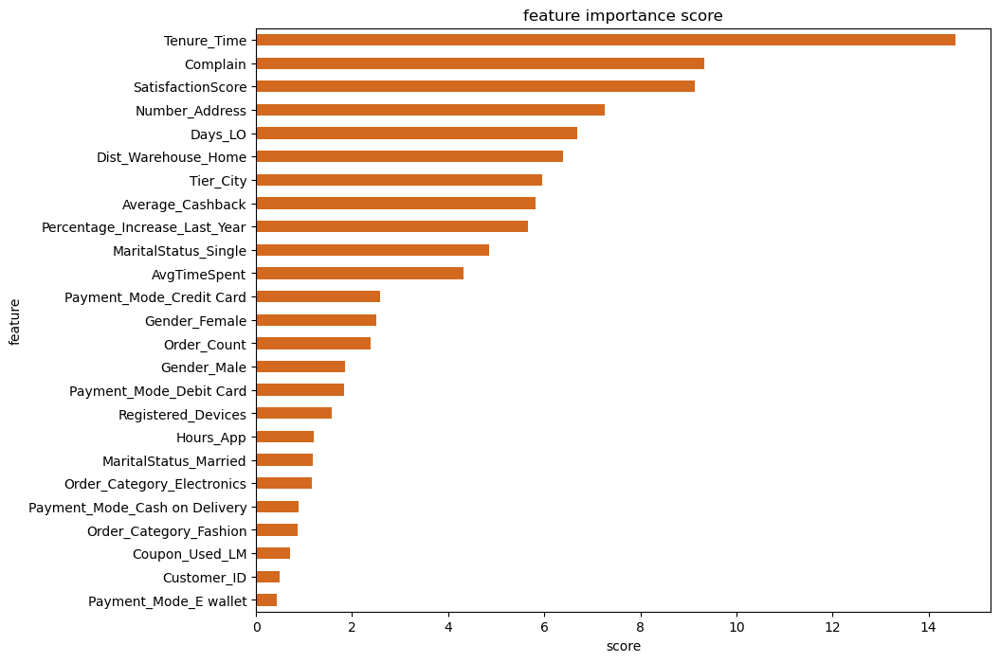

In [73]:
#best_model = grid.best_estimator_
#CatBoost
feat_importances = pd.Series( best_estimator_list[5].steps[-1][1].feature_importances_, index=X.columns)
ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8), color='chocolate')
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Text(0.5, 1.0, 'feature importance score')

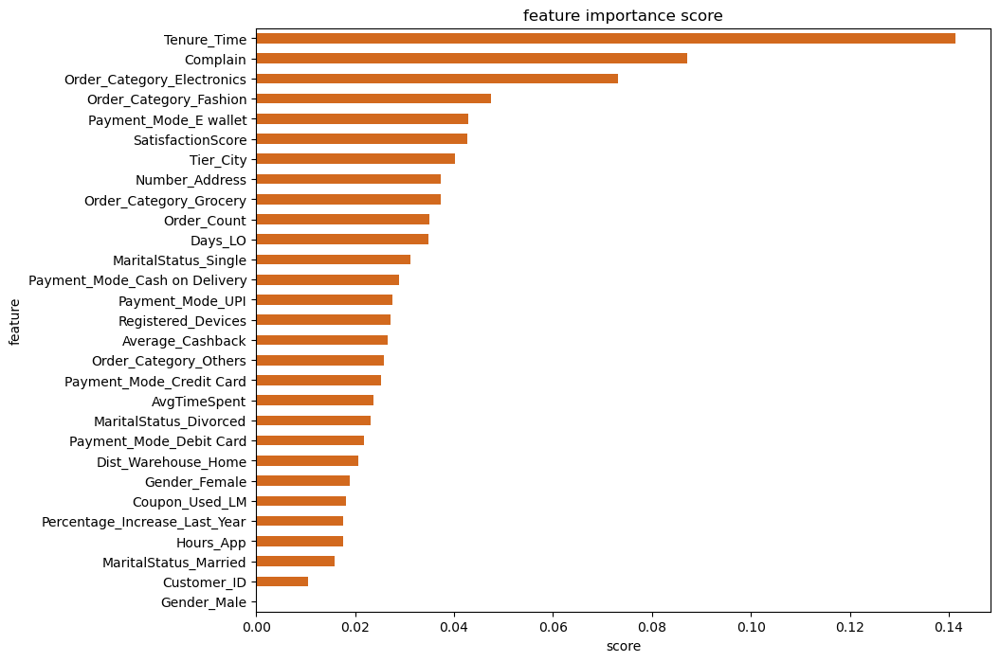

In [85]:
#best_model = grid.best_estimator_
#XGBClassifier
feat_importances = pd.Series( best_estimator_list[4].steps[-1][1].feature_importances_, index=X.columns)
ax = feat_importances.nlargest(100).plot(kind='barh', figsize=(10, 8), color='chocolate')
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Text(0.5, 1.0, 'feature importance score')

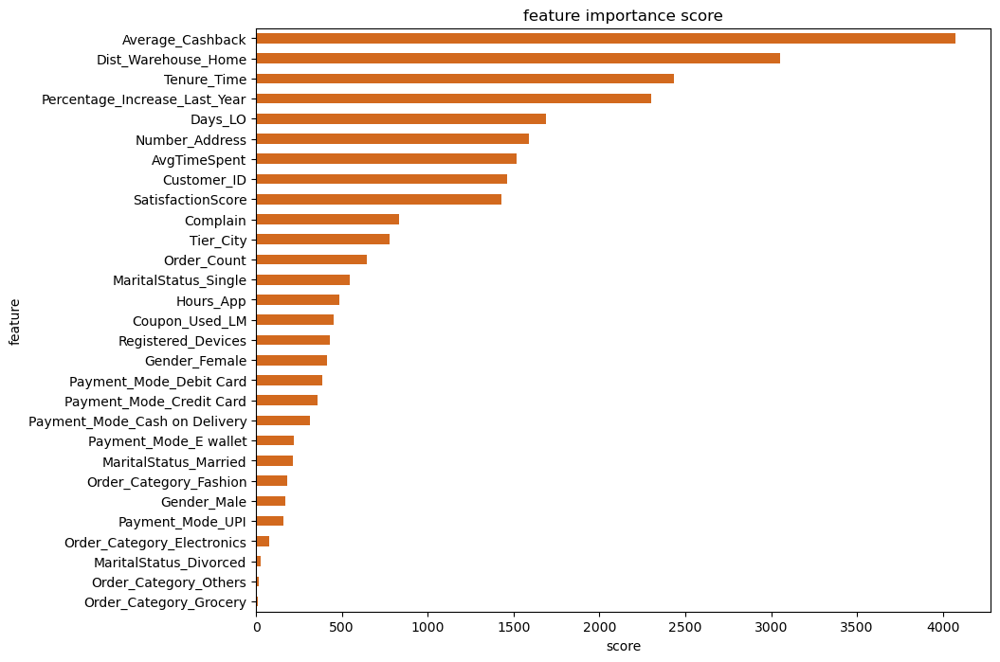

In [86]:
#best_model = grid.best_estimator_
#LGBMClassifier
feat_importances = pd.Series( best_estimator_list[3].steps[-1][1].feature_importances_, index=X.columns)
ax = feat_importances.nlargest(100).plot(kind='barh', figsize=(10, 8), color='chocolate')
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Text(0.5, 1.0, 'feature importance score')

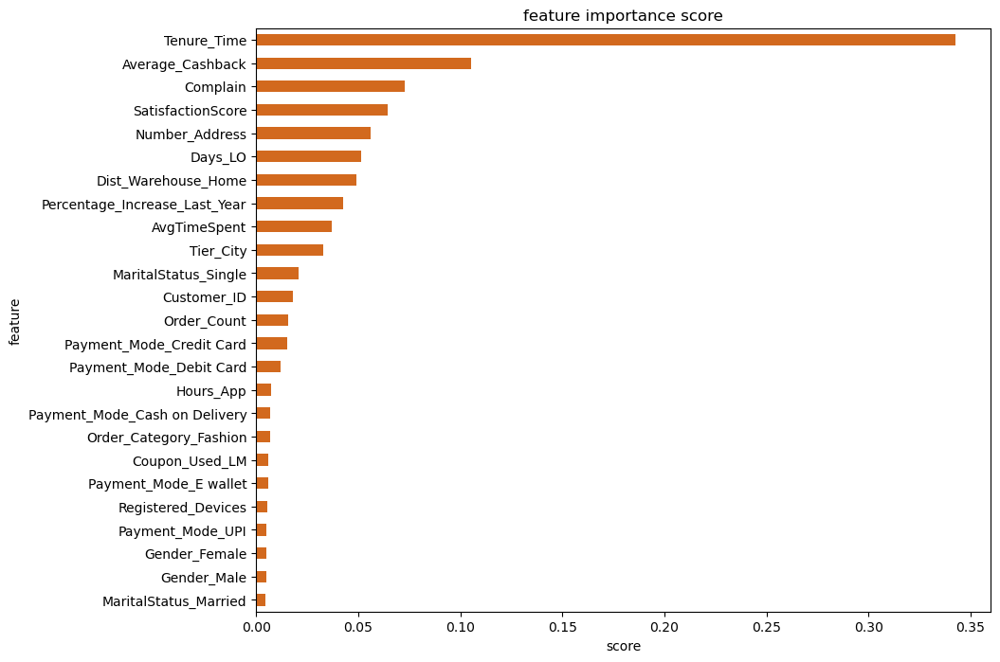

In [81]:
#best_model = grid.best_estimator_
#GBMClassifier
feat_importances = pd.Series( best_estimator_list[2].steps[-1][1].feature_importances_, index=X.columns)
ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8), color='chocolate')
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Text(0.5, 1.0, 'feature importance score')

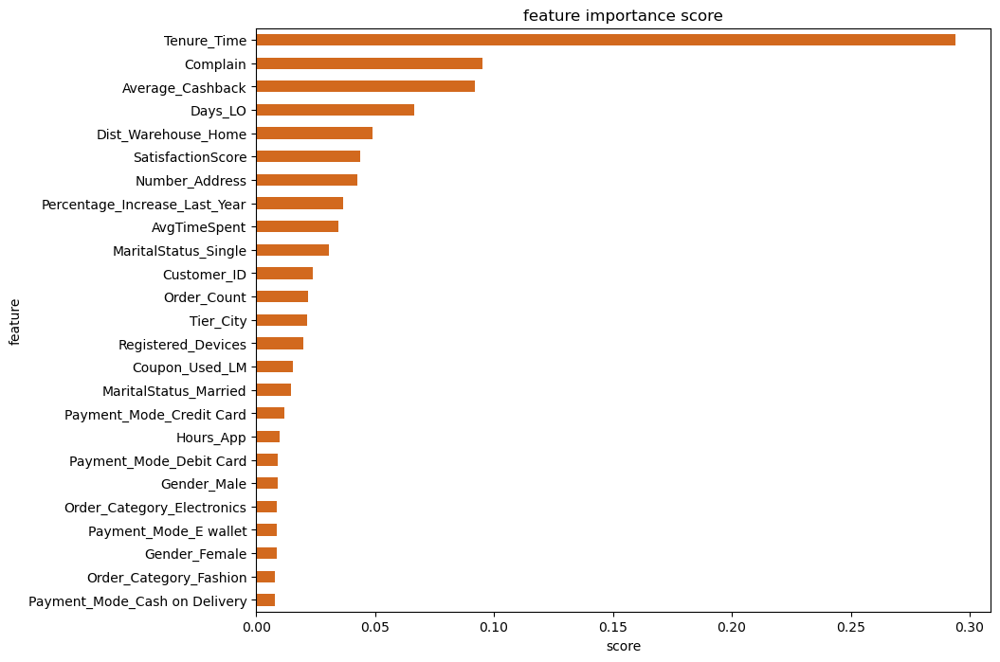

In [83]:
#best_model = grid.best_estimator_
#RandomForest
feat_importances = pd.Series( best_estimator_list[1].steps[-1][1].feature_importances_, index=X.columns)
ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8), color='chocolate')
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Text(0.5, 1.0, 'feature importance score')

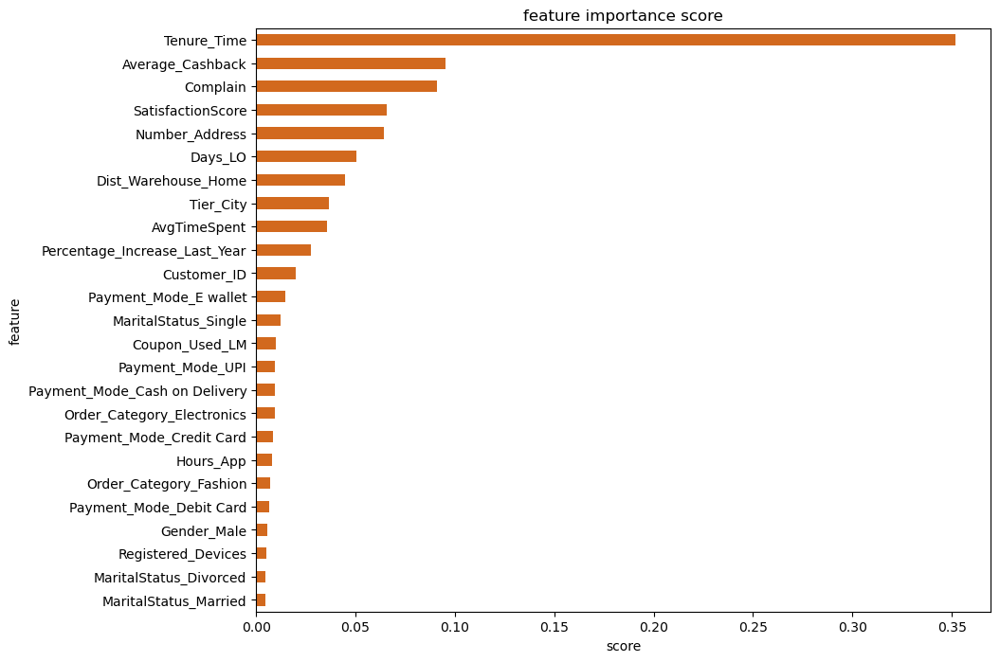

In [84]:
#best_model = grid.best_estimator_
#DecisionTree
feat_importances = pd.Series( best_estimator_list[0].steps[-1][1].feature_importances_, index=X.columns)
ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8), color='chocolate')
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')